<font size = '5' > # Formulation for excel file input, 10ft front space and 10ft instructor location #

In [1]:
from shapely.geometry import Polygon
import pandas as pd
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize, Bounds, LinearConstraint
from scipy.spatial import Delaunay
from gurobipy import *


In [2]:
def moveable_area_seats(room_points, seat_xside, seat_yside, step_size):
    ## Search for seats with all 4 corner points contained in the polygon area of classroom.
    ## Inputs:
    # (1) a list of corner points to define the polygon area of classroom
    #     (first point should be left bottom point).
    # (2) side length of a seat.

    room_area = Polygon(room_points)
    valid_seat_points = []  ## recoding coordinate of center points of valid seats in the list.
    seat_lb = (room_area.bounds[0], room_area.bounds[1])  # the left bottom point of seat.
    seat_points = [seat_lb, (seat_lb[0], seat_lb[1] + seat_yside),
                   (seat_lb[0] + seat_xside, seat_lb[1] + seat_yside), (seat_lb[0] + seat_xside, seat_lb[1])]  # all 4 points of seat.
    seat_area = Polygon(seat_points)
    while seat_lb[1] <= room_area.bounds[3]:  # move upward, and check line by line.
        while room_area.contains(seat_area) == False and seat_lb[0] <= room_area.bounds[2]:  # move toward right until getting a valid seat.
            seat_lb = (seat_lb[0] + step_size, seat_lb[1])
            seat_points = [seat_lb, (seat_lb[0], seat_lb[1] + seat_yside),
                           (seat_lb[0] + seat_xside, seat_lb[1] + seat_yside), (seat_lb[0] + seat_xside, seat_lb[1])]
            seat_area = Polygon(seat_points)
        while room_area.contains(seat_area) == True:  # move towrd right until getting a invalid seat.
            valid_seat_points.append([seat_lb[0] + seat_xside/2, seat_lb[1] +seat_yside/2])  # record center point of valid seat.
            seat_lb = (seat_lb[0] + step_size, seat_lb[1])
            seat_points = [seat_lb, (seat_lb[0], seat_lb[1] + seat_yside),
                           (seat_lb[0] + seat_xside, seat_lb[1] + seat_yside), (seat_lb[0] + seat_xside, seat_lb[1])]
            seat_area = Polygon(seat_points)
        seat_lb = (room_area.bounds[0], seat_lb[1] + step_size)
        seat_points = [seat_lb, (seat_lb[0], seat_lb[1] + seat_yside),
                       (seat_lb[0] + seat_xside, seat_lb[1] + seat_yside),
                       (seat_lb[0] + seat_xside, seat_lb[1])]  # all 4 points of seat.
        seat_area = Polygon(seat_points)
    return np.array(valid_seat_points)

In [3]:


def fixed_seats_model_ins(data_file, seat_radius, d0, d1 = 0, d2 = 0, d3 = 0, firstrow: bool = False, firstrow_y = 0.0, type=1, num_selection = 10, output_filename_affix='output'):
    '''
    Create and solve IP model for selecting seats among a given set of fixed seats in a classroom.
    :param data_file: str, coordinate file name of .csv or .xlsx file with 3 columns: Feature, X, Y.
    :param seat_radius: float, distance from center to side of seat space (assumed as a square).
    :param d0: float or int, social distance (inches) between seats.
    :param d1: float or int, social distance (inches) between seats and instructor. Default is 0.
    :param d2: float or int, safety distance (inches) from doors. Default is 0.
    :param d3: float or int, safety distance (inches) from aisles. Default is 0.
    :param firstrow: bool, False means incorporting seats of the first row, True means eliminating seats of the first row. Default is False.
    :param firstrow_y: float or int, the y-coordinate of seats in the first row. Default is 0. Required if firstrow is True
    :param type: int {1, 2, 3, 4},
                 if type=1: maximize number of selected seats under specified distance and prevention constraints.
                 if type=2: maximize total distance while selecting specified number of students.
                 if type=3: maximize minimum distance while selecting specified number of students.
                 if type=4: minimize number of pairs of adjacent seats (next to each other in the same row).
                 Default is 1.
    :param num_selection: int, the number of selected seats, required if type is 2, 3, or 4. Default is 10.
    :param output_filename_affix: str, adding to the end of input filename as output filename.
    :return: optimal obective function value,
             array of coordinates of selected seats,
             array of index of seats being selected in the parameter seat_loc.
             If type = 1, return the minimum distance between selected seats as well.
    '''
    ## read coordinates file.
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
#     seat_loc = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['X', 'Y']])
#     pre_selected = np.array(coordinates.loc[coordinates['Feature'] == 'selected_seat', ['X', 'Y']])
#     aisles_loc = np.array(coordinates.loc[coordinates['Feature'] == 'aisle', ['X', 'Y']])
#     doors_loc = np.array(coordinates.loc[coordinates['Feature'] == 'door', ['X', 'Y']])
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
    if len(instructor_loc) == 1:
        instructor_loc = instructor_loc[0]

    ## filering seats by preventions
    seat_set = [i for i in range(len(seat_loc))]  # contains all indexes of seats in seat_loc.
    # filtering seats by the instructor
    # We suggest if you consider the movement of instructor, then use 1)filtering by the first row; if considering instructor as a single point, then use 2)filtering by the instructor's location
    # 1)filtering by the first row.
    if firstrow == True:
        firstrow_seat_set = []
        for i in range(len(seat_loc)):
            if seat_loc[i][1] != firstrow_y:
                firstrow_seat_set.append(i)
        seat_set = list(set(seat_set).intersection(firstrow_seat_set))
    # 2)filtering by the instructor's location
    if d1 > 0:
        inst_seat_set = []
        for i in range(len(seat_loc)):
            x_inst = np.abs(seat_loc[i][0] - instructor_loc[0])
            y_inst = np.abs(seat_loc[i][1] - instructor_loc[1])
            if np.sqrt(x_inst*x_inst + y_inst*y_inst) >= d1:
                inst_seat_set.append(i)
        seat_set = list(set(seat_set).intersection(inst_seat_set))
#     # filtering seats by doors
#     if d2 > 0:
#         doornum = len(doors_loc)
#         door_seat_set = []
#         for i in range(len(seat_loc)):
#             dist_to_door = 0
#             for j in range(doornum):
#                 x_door = np.abs(seat_loc[i][0] - doors_loc[j][0])
#                 y_door = np.abs(seat_loc[i][1] - doors_loc[j][1])
#                 if np.sqrt(x_door*x_door + y_door*y_door) >= d2:
#                     dist_to_door += 1
#             if dist_to_door >= doornum:
#                 door_seat_set.append(i)
#         seat_set = list(set(seat_set).intersection(door_seat_set))
#     # filtering seats by aisles
#     if d3 > 0:
#         aislenum = len(aisles_loc)
#         aisle_seat_set = []
#         for i in range(len(seat_loc)):
#             dist_to_aisle = 0
#             for j in range(aislenum):
#                 x_aisle = np.abs(seat_loc[i][0] - aisles_loc[j][0])
#                 y_aisle = np.abs(seat_loc[i][1] - aisles_loc[j][1])
#                 if np.sqrt(x_aisle*x_aisle + y_aisle*y_aisle) >= d3:
#                     dist_to_aisle += 1
#             if dist_to_aisle >= aislenum:
#                 aisle_seat_set.append(i)
#         seat_set = list(set(seat_set).intersection(aisle_seat_set))
#     # Now, we get indexes of all candidate seats after filtering by preventions
            
    pair_set = []  # define a set of seat index pair (s1, s2) for all s1 != s2.
    for s1 in range(len(seat_set) - 1):
        for s2 in range(s1 + 1, len(seat_set)):
            pair_set.append((seat_set[s1], seat_set[s2]))
    distance = {}  # compute distance between each pair of seats (s1, s2) for all s1 != s2.
    for pair in pair_set:
        seat1_loc = seat_loc[pair[0]]
        seat2_loc = seat_loc[pair[1]]
        seat1_polygon = Polygon([(seat1_loc[0] - seat_radius, seat1_loc[1] - seat_radius),
                                 (seat1_loc[0] - seat_radius, seat1_loc[1] + seat_radius),
                                 (seat1_loc[0] + seat_radius, seat1_loc[1] + seat_radius),
                                 (seat1_loc[0] + seat_radius, seat1_loc[1] - seat_radius)])
        seat2_polygon = Polygon([(seat2_loc[0] - seat_radius, seat2_loc[1] - seat_radius),
                                 (seat2_loc[0] - seat_radius, seat2_loc[1] + seat_radius),
                                 (seat2_loc[0] + seat_radius, seat2_loc[1] + seat_radius),
                                 (seat2_loc[0] + seat_radius, seat2_loc[1] - seat_radius)])
        distance[pair] = seat1_polygon.distance(seat2_polygon)
    d_max = np.max(list(distance.values()))  # get the largest distance between two different seats.

    neibor_set = []  # define a set of seat index neibor pair (s1, s2).
    for pair in pair_set:
        if distance[pair] <= 30:
            neibor_set.append(pair)

    model = Model('fixed_seat_layout')

    ## Set Gurobi parameters
    model.setParam('OutputFlag', False)
    ## objective 2, 3, 4 takes long time to run, so adjust some parameters.
    if type > 1:
        model.setParam('MIPGap', 0.05)
        model.setParam('MIPFocus', 3)

    ## Add variables
    # general variables for all types.
    x = model.addVars(seat_set, vtype=GRB.BINARY)
    # need for type 2, 3, 4.
    if type > 1:
        z = model.addVars(pair_set, vtype=GRB.BINARY)
        # build initial solution if input
        if len(pre_selected) > 0:
            for s in pre_selected:
                x[s].start = 1
            for i in range(len(pre_selected)-1):
                for j in range(i + 1, len(pre_selected)):
                    z[(pre_selected[i], pre_selected[j])].start = 1
    # need for type 3
    if type == 3:
        min_d = model.addVar(lb=0, vtype=GRB.CONTINUOUS)

    ## Add constraints
    if type > 1:
        # student number constraint: need for type 2, 3, 4
        model.addConstr(quicksum(x[s] for s in seat_set) == num_selection)

    ## social distancing limit constraint: need for all objectives.
    # need for type 1
    if type == 1:
        for pair in pair_set:
            if distance[pair] < d0:
                model.addConstr(x[pair[0]] + x[pair[1]] <= 1)
    # need for type 2, 3, 4
    else:
        for pair in pair_set:
            if distance[pair] < d0:
                model.addConstr(z[pair] == 0)
                model.addConstr(x[pair[0]] + x[pair[1]] <= 1)
            else:
                model.addConstr(z[pair] <= x[pair[1]])
                model.addConstr(z[pair] <= x[pair[0]])
                model.addConstr(z[pair] >= x[pair[0]] + x[pair[1]] - 1)

    # need for type 3.
    if type == 3:
        # model.addConstrs(z[pair] <= t[pair] for pair in pair_set)
        model.addConstrs(min_d - distance[pair] - d_max * (1 - z[pair]) <= 0 for pair in pair_set)

    ## Set objective function
    # type 1: maximize number of students
    if type == 1:
        model.setObjective(quicksum(x[s] for s in seat_set), GRB.MAXIMIZE)

    # type 2: maximize total distance
    if type == 2:
        model.setObjective(quicksum(distance[pair] * z[pair] for pair in pair_set) / num_selection, GRB.MAXIMIZE)

    # type 3: maximize min distance
    if type == 3:
        model.setObjective(min_d, GRB.MAXIMIZE)

    # type 4: minimize number of neibor pairs
    if type == 4:
        model.setObjective(quicksum(z[pair] for pair in neibor_set), GRB.MINIMIZE)

    ## Optimize the model
    model.optimize()
    
    
    
        ## Print and return the result
    status_code = {1:'LOADED', 2:'OPTIMAL', 3:'INFEASIBLE', 4:'INF_OR_UNBD', 5:'UNBOUNDED'}
    status = model.status
    print('The optimization status is {}'.format(status_code[status]))
    if status == 2:
        # Retrieve variables value
        print('Optimal solution:')
        print('Optimal objective value: {}'.format(model.objVal))
        seat_selected = []
        print('Optimal selection of seats (index):')
        for s in seat_set:
            if x[s].x > 0:
                print(s)
                seat_selected.append(seat_loc[s])
    return model.objVal, np.array(seat_selected)


#     ## Print and return the result
#     status_code = {1:'LOADED', 2:'OPTIMAL', 3:'INFEASIBLE', 4:'INF_OR_UNBD', 5:'UNBOUNDED'}
#     status = model.status
#     print('The optimization status is {}'.format(status_code[status]))
#     if status == 2:
#         # Retrieve objective value
#         print('Optimal objective value: {}'.format(model.objVal))
#         # Retrieve variable value and record selected seats' index and coordinates.
#         seat_loc_selected = []
#         seat_selected = []
#         for s in seat_set:
#             if x[s].x > 0:
#                 seat_loc_selected.append(seat_loc[s])
#                 seat_selected.append(s)
#                 coordinates = coordinates.append(pd.DataFrame([['selected_seat', seat_loc[s][0], seat_loc[s][1]]],
#                                                               columns=['Feature', 'X', 'Y']))
#         # save the output file.
#         coordinates.to_excel(filename + '_' + output_filename_affix + '.xlsx', index=False)
        

#         if type == 1 : # for type 1, print and return the minimum distance between selected seats as well.
#             selected_distance = []  # record distance between each pair of selected seats.
#             for i in range(len(seat_selected) - 1):
#                 for j in range(i + 1, len(seat_selected)):
#                     selected_distance.append(distance[seat_selected[i], seat_selected[j]])
#             # print('smallest distance: {}'.format(np.min(selected_distance)))
#             return model.objVal, np.array(seat_loc_selected), seat_selected, np.min(selected_distance)
#         else:
#             return model.objVal, np.array(seat_loc_selected), seat_selected




In [4]:
def seat_coordinates(data_file, discretization):
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
    room_dim = np.array(coordinates.loc[coordinates['Feature'] == 'room', ['XF', 'YF']])
    print('room dimension (W x H) are '+ str(room_dim))
    seat_dim = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['XF', 'YF']])
    print('seat dimension (W x H) are '+ str(seat_dim))
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
    print(instructor_loc)
#     if len(instructor_loc) == 1:
#         instructor_loc = instructor_loc[0]


    x = room_dim[0][0]
    y = room_dim[0][1]

    seat_xside = seat_dim[0][0]
    seat_yside = seat_dim[0][1]


    room_d = [(0,0), (0,y), (x,y), (x,0)]
    room_points = [(0,10), (x,10), (x,y), (0,y)]
    print(room_points)

    seat_loc = moveable_area_seats(room_points, seat_xside, seat_yside, discretization)
    print('Total number of seats  is ' + str(len(seat_loc)))


    room_points.append(room_points[0])
    plot_corner_points = np.array(room_d)
    fig, axs = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(15)
    axs.set_aspect('equal')
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
    for s in seat_loc:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='black')
        axs.add_patch(rectangle)
    plt.show()
    return(seat_loc)


In [5]:

def plot_layout_result_granularity(data_file, seat_radius, seat_circle_radius=0, firstrow_y=0.0):
    '''
    Plot classroom layout with seat selection under possible preventions.
    :param data_file: str, coordinate file name of .csv or .xlsx file with 3 columns: Feature, X, Y.
    :param seat_radius: float, distance from center to side of seat space (assumed as a square).
    :param seat_circle_radius: float, radius of circle to add on selected seats for distancing demonstration.
                               If 0, don't add circles. Default is 0.
    :param firstrow_y: float, y-coordinate of firstrow. If 0, don't highlight firstrow. Default is 0.
    '''
    ## read coordinates file.
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
    room_dim = np.array(coordinates.loc[coordinates['Feature'] == 'room', ['XF', 'YF']])
    print('room dimension (W x H) are '+ str(room_dim))
    seat_dim = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['XF', 'YF']])
    print('seat dimension (W x H) are '+ str(seat_dim))
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
    doors_loc = np.array(coordinates.loc[coordinates['Feature'] == 'door', ['XF', 'YF']])
    if len(instructor_loc) == 1:
        instructor_loc = instructor_loc[0]
        
    x = room_dim[0][0]
    y = room_dim[0][1]

    seat_xside = seat_dim[0][0]
    seat_yside = seat_dim[0][1]


    room_d = [(0,0), (0,y), (x,y), (x,0)]
    room_points = [(0,10), (x,10), (x,y), (0,y)]    
    
    
    

    ## create matplotlib figure.
    fig, axs = plt.subplots()
    axs.set_aspect('equal')
    fig.set_figheight(15)
    fig.set_figwidth(15)
    axs.patch.set_edgecolor('black')  ## added on 07_21 : trying to get botton edge of class
    axs.patch.set_linewidth('1')  ## added on 07_21
#     axs.text(0.95, 0.01, 'colored text in axes coords',
#         verticalalignment='bottom', horizontalalignment='right',
#         transform=axs.transAxes,
#         color='green', fontsize=15)
    

    plt.tick_params(
        axis='both',  # changes apply to the x-axis
        which='both',  # both major and minor ticks are affected
        bottom=False,  # ticks along the bottom edge are off
        left=False,  # ticks along the left edge are off
        labelbottom=False,  # labels along the bottom edge are off
        labelleft=False)  # labels along the left edge are off

    legend_objects = []
    legend_labels = []

    ## plot instructor if input.
    if len(instructor_loc) > 0:
        axs.plot(instructor_loc[0], instructor_loc[1], "o", markersize=280, color='lightgrey')
        s2, = axs.plot(instructor_loc[0], instructor_loc[1], "s", markersize=15, color='red')
        legend_objects.append(s2)
        legend_labels.append('Instructor')
        
    ## plot doors if input.
    if len(doors_loc) > 0:
        axs.plot(doors_loc[:, 0], doors_loc[:, 1], "D", markersize=15, color='orange')
        s3, = axs.plot(doors_loc[:, 0], doors_loc[:, 1], "D", markersize=15, color='orange')
        legend_objects.append(s3)
        legend_labels.append('Doors')
        
        
    ## plot seats and selected seats.
    plot_corner_points = np.array(room_d)
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
#     axs.plot(seat_loc[:, 0], seat_loc[:, 1], "s", markersize=15, fillstyle='none', color='none')
    s0, =  axs.plot(seat_loc[:,0], seat_loc[:,1] , '.' ,markersize = 5, color='blue')
    s1, = axs.plot(selected[:,0], selected[:,1] ,'o', color='green')
    for s in selected:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='green')
        axs.add_patch(rectangle)
    legend_objects.append(s1)
    legend_labels.append('selected coordinates')
    legend_objects.append(s0)
    legend_labels.append('Potential Coordinates')
    legend_objects.append(rectangle)
    legend_labels.append('Seat placement')

    # add circles around selected seats
#     if seat_circle_radius > 0:
#         for i in range(len(selected)):
#             seat_circle = plt.Circle((selected[i, 0], selected[i, 1]), seat_circle_radius, fc='none',ec='grey')
#             axs.add_patch(seat_circle)

    # add legend.
    plt.legend(legend_objects, legend_labels, loc='lower center', ncol=len(legend_objects), bbox_to_anchor=(0.5, -0.1),
               fontsize='xx-large', handlelength=0.7)

#     ## save output file.
#     plt.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     axs.figure.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     plt.savefig(filename + "_plot.pdf", dpi=500)

## Plot To Print Note

In [6]:

def plot_layout_result_granularity_text(data_file, seat_radius, seat_circle_radius=0, firstrow_y=0.0):
    '''
    Plot classroom layout with seat selection under possible preventions.
    :param data_file: str, coordinate file name of .csv or .xlsx file with 3 columns: Feature, X, Y.
    :param seat_radius: float, distance from center to side of seat space (assumed as a square).
    :param seat_circle_radius: float, radius of circle to add on selected seats for distancing demonstration.
                               If 0, don't add circles. Default is 0.
    :param firstrow_y: float, y-coordinate of firstrow. If 0, don't highlight firstrow. Default is 0.
    '''
    ## read coordinates file.
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
    room_dim = np.array(coordinates.loc[coordinates['Feature'] == 'room', ['XF', 'YF']])
    print('room dimension (W x H) are '+ str(room_dim))
    seat_dim = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['XF', 'YF']])
    print('seat dimension (W x H) are '+ str(seat_dim))
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
    doors_loc = np.array(coordinates.loc[coordinates['Feature'] == 'door', ['XF', 'YF']])
    if len(instructor_loc) == 1:
        instructor_loc = instructor_loc[0]
        
    x = room_dim[0][0]
    y = room_dim[0][1]

    seat_xside = seat_dim[0][0]
    seat_yside = seat_dim[0][1]


    room_d = [(0,0), (0,y), (x,y), (x,0)]
    room_points = [(0,10), (x,10), (x,y), (0,y)]    
    
    
    

    ## create matplotlib figure.
    fig, axs = plt.subplots()
    axs.set_aspect('equal')
    fig.set_figheight(15)
    fig.set_figwidth(15)
    axs.patch.set_edgecolor('black')  ## added on 07_21 : trying to get botton edge of class
    axs.patch.set_linewidth('1')  ## added on 07_21
    axs.text(0.95, 0.01, 'Note: Instructor side and location assumed as CAD layout don’t reflect it, the balcony type extension not considered',
        verticalalignment='bottom', horizontalalignment='right',
        transform=axs.transAxes,
        color='green', fontsize=15)
    

    plt.tick_params(
        axis='both',  # changes apply to the x-axis
        which='both',  # both major and minor ticks are affected
        bottom=False,  # ticks along the bottom edge are off
        left=False,  # ticks along the left edge are off
        labelbottom=False,  # labels along the bottom edge are off
        labelleft=False)  # labels along the left edge are off

    legend_objects = []
    legend_labels = []

    ## plot instructor if input.
    if len(instructor_loc) > 0:
        axs.plot(instructor_loc[0], instructor_loc[1], "o", markersize=280, color='lightgrey')
        s2, = axs.plot(instructor_loc[0], instructor_loc[1], "s", markersize=15, color='red')
        legend_objects.append(s2)
        legend_labels.append('Instructor')
        
    ## plot doors if input.
    if len(doors_loc) > 0:
        axs.plot(doors_loc[:, 0], doors_loc[:, 1], "D", markersize=15, color='orange')
        s3, = axs.plot(doors_loc[:, 0], doors_loc[:, 1], "D", markersize=15, color='orange')
        legend_objects.append(s3)
        legend_labels.append('Doors')
        
        
    ## plot seats and selected seats.
    plot_corner_points = np.array(room_d)
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
#     axs.plot(seat_loc[:, 0], seat_loc[:, 1], "s", markersize=15, fillstyle='none', color='none')
    s0, =  axs.plot(seat_loc[:,0], seat_loc[:,1] , '.' ,markersize = 5, color='blue')
    s1, = axs.plot(selected[:,0], selected[:,1] ,'o', color='green')
    for s in selected:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='green')
        axs.add_patch(rectangle)
    legend_objects.append(s1)
    legend_labels.append('selected coordinates')
    legend_objects.append(s0)
    legend_labels.append('Potential Coordinates')
    legend_objects.append(rectangle)
    legend_labels.append('Seat placement')

    # add circles around selected seats
#     if seat_circle_radius > 0:
#         for i in range(len(selected)):
#             seat_circle = plt.Circle((selected[i, 0], selected[i, 1]), seat_circle_radius, fc='none',ec='grey')
#             axs.add_patch(seat_circle)

    # add legend.
    plt.legend(legend_objects, legend_labels, loc='lower center', ncol=len(legend_objects), bbox_to_anchor=(0.5, -0.1),
               fontsize='xx-large', handlelength=0.7)

#     ## save output file.
#     plt.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     axs.figure.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     plt.savefig(filename + "_plot.pdf", dpi=500)

## for classroom with instructor on top

In [140]:
def seat_coordinates_type(data_file, type = 1 ):
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
    room_dim = np.array(coordinates.loc[coordinates['Feature'] == 'room', ['XF', 'YF']])
    print('room dimension (W x H) are '+ str(room_dim))
    seat_dim = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['XF', 'YF']])
    print('seat dimension (W x H) are '+ str(seat_dim))
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
#     if len(instructor_loc) == 1:
#         instructor_loc = instructor_loc[0]


    x = room_dim[0][0]
    y = room_dim[0][1]

    seat_xside = seat_dim[0][0]
    seat_yside = seat_dim[0][1]
    
    room_d = [(0,0), (0,y), (x,y), (x,0)]

    if type == 1:
        room_points = [(0,10), (x,10), (x,y), (0,y)]
        print(room_points)
        
    if type == 2:
        room_points = [(0,0), (x,0), (x,y-10), (0,y-10)]
        print(room_points)
    
    if type == 3:
        room_points = [(0,0), (0,y), (x,y), (x,0)]
        print(room_points)
        


    seat_loc = moveable_area_seats(room_points, seat_xside, seat_yside, 1)
    print('Total number of seats  is ' + str(len(seat_loc)))


    room_points.append(room_points[0])
    plot_corner_points = np.array(room_d)
    fig, axs = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(15)
    axs.set_aspect('equal')
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
    for s in seat_loc:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='black')
        axs.add_patch(rectangle)
    plt.show()
    return(seat_loc)


In [58]:

def plot_layout_result_granularity_type(data_file, seat_radius, seat_circle_radius=0, firstrow_y=0.0, type=1):
    '''
    Plot classroom layout with seat selection under possible preventions.
    :param data_file: str, coordinate file name of .csv or .xlsx file with 3 columns: Feature, X, Y.
    :param seat_radius: float, distance from center to side of seat space (assumed as a square).
    :param seat_circle_radius: float, radius of circle to add on selected seats for distancing demonstration.
                               If 0, don't add circles. Default is 0.
    :param firstrow_y: float, y-coordinate of firstrow. If 0, don't highlight firstrow. Default is 0.
    '''
    ## read coordinates file.
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
    room_dim = np.array(coordinates.loc[coordinates['Feature'] == 'room', ['XF', 'YF']])
    print('room dimension (W x H) are '+ str(room_dim))
    seat_dim = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['XF', 'YF']])
    print('seat dimension (W x H) are '+ str(seat_dim))
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
    if len(instructor_loc) == 1:
        instructor_loc = instructor_loc[0]
        
    x = room_dim[0][0]
    y = room_dim[0][1]

    seat_xside = seat_dim[0][0]
    seat_yside = seat_dim[0][1]
    
    room_d = [(0,0), (0,y), (x,y), (x,0)]

    if type == 1:
        room_points = [(0,10), (x,10), (x,y), (0,y)]
        print(room_points)
        
    if type == 2:
        room_points = [(0,0), (x,0), (x,y-10), (0,y-10)]
        print(room_points)
        

    ## create matplotlib figure.
    fig, axs = plt.subplots()
    axs.set_aspect('equal')
    fig.set_figheight(15)
    fig.set_figwidth(15)

    plt.tick_params(
        axis='both',  # changes apply to the x-axis
        which='both',  # both major and minor ticks are affected
        bottom=False,  # ticks along the bottom edge are off
        left=False,  # ticks along the left edge are off
        labelbottom=False,  # labels along the bottom edge are off
        labelleft=False)  # labels along the left edge are off

    legend_objects = []
    legend_labels = []

    ## plot instructor if input.
    if len(instructor_loc) > 0:
        axs.plot(instructor_loc[0], instructor_loc[1], "o", markersize=280, color='lightgrey')
        s2, = axs.plot(instructor_loc[0], instructor_loc[1], "s", markersize=15, color='red')
        legend_objects.append(s2)
        legend_labels.append('Instructor')
    ## plot seats and selected seats.
    plot_corner_points = np.array(room_d)
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
#     axs.plot(seat_loc[:, 0], seat_loc[:, 1], "s", markersize=15, fillstyle='none', color='none')
    s0, =  axs.plot(seat_loc[:,0], seat_loc[:,1] , '.' ,markersize = 5, color='blue')
    s1, = axs.plot(selected[:,0], selected[:,1] ,'o', color='green')
    for s in selected:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='green')
        axs.add_patch(rectangle)
    legend_objects.append(s1)
    legend_labels.append('selected coordinates')
    legend_objects.append(s0)
    legend_labels.append('Potential Coordinates')
    legend_objects.append(rectangle)
    legend_labels.append('Seat placement')

    # add circles around selected seats
#     if seat_circle_radius > 0:
#         for i in range(len(selected)):
#             seat_circle = plt.Circle((selected[i, 0], selected[i, 1]), seat_circle_radius, fc='none',ec='grey')
#             axs.add_patch(seat_circle)

    # add legend.
    plt.legend(legend_objects, legend_labels, loc='lower center', ncol=len(legend_objects), bbox_to_anchor=(0.5, -0.1),
               fontsize='xx-large', handlelength=0.7)

#     ## save output file.
#     plt.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     axs.figure.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     plt.savefig(filename + "_plot.pdf", dpi=500)

## Room_points_based_on_Instructor_loc

In [ ]:
def seat_coordinates_based_instructor_loc(data_file):
    if '.xlsx' in data_file:
        coordinates = pd.read_excel(data_file)
        filename = data_file[:-5]
    elif '.csv' in data_file:
        coordinates = pd.read_csv(data_file)
        filename = data_file[:-4]
    room_dim = np.array(coordinates.loc[coordinates['Feature'] == 'room', ['XF', 'YF']])
    print('room dimension (W x H) are '+ str(room_dim))
    seat_dim = np.array(coordinates.loc[coordinates['Feature'] == 'seat', ['XF', 'YF']])
    print('seat dimension (W x H) are '+ str(seat_dim))
    instructor_loc = np.array(coordinates.loc[coordinates['Feature'] == 'instructor', ['XF', 'YF']])
    print(instructor_loc.shape)
    print(instructor_loc[0][1])
#     if len(instructor_loc) == 1:
#         instructor_loc = instructor_loc[0]


    x = room_dim[0][0]
    y = room_dim[0][1]

    seat_xside = seat_dim[0][0]
    seat_yside = seat_dim[0][1]

    room_d = [(0,0), (0,y), (x,y), (x,0)]
    
    if instructor_loc[0][1] < (y/2):
        room_points = [(0,10), (x,10), (x,y), (0,y)]
        print(room_points)
        
    if instructor_loc[0][1] > (y/2):
        room_points = [(0,0), (x,0), (x,y-10), (0,y-10)]
        print(room_points)
        
    seat_loc = moveable_area_seats(room_points, seat_xside, seat_yside, 1)
    print('Total number of seats  is ' + str(len(seat_loc)))


    room_points.append(room_points[0])
    plot_corner_points = np.array(room_d)
    fig, axs = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(15)
    axs.set_aspect('equal')
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
    for s in seat_loc:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='black')
        axs.add_patch(rectangle)
    plt.show()
    return(seat_loc)


# Plot layout for coordinates

In [108]:

def plot_layout_result_granularity_coordinates(data_file, room_d, room_points, seat_radius, seat_circle_radius=0, firstrow_y=0.0):
    '''
    Plot classroom layout with seat selection under possible preventions.
    :param data_file: str, coordinate file name of .csv or .xlsx file with 3 columns: Feature, X, Y.
    :param seat_radius: float, distance from center to side of seat space (assumed as a square).
    :param seat_circle_radius: float, radius of circle to add on selected seats for distancing demonstration.
                               If 0, don't add circles. Default is 0.
    :param firstrow_y: float, y-coordinate of firstrow. If 0, don't highlight firstrow. Default is 0.
    '''    
    ## create matplotlib figure.
    fig, axs = plt.subplots()
    axs.set_aspect('equal')
    fig.set_figheight(15)
    fig.set_figwidth(15)
    axs.patch.set_edgecolor('black')  ## added on 07_21 : trying to get botton edge of class
    axs.patch.set_linewidth('1')  ## added on 07_21
#     axs.text(0.95, 0.01, 'colored text in axes coords',
#         verticalalignment='bottom', horizontalalignment='right',
#         transform=axs.transAxes,
#         color='green', fontsize=15)
    

    plt.tick_params(
        axis='both',  # changes apply to the x-axis
        which='both',  # both major and minor ticks are affected
        bottom=False,  # ticks along the bottom edge are off
        left=False,  # ticks along the left edge are off
        labelbottom=False,  # labels along the bottom edge are off
        labelleft=False)  # labels along the left edge are off

    legend_objects = []
    legend_labels = []

    ## plot instructor if input.
    if len(instructor_loc) > 0:
        axs.plot(instructor_loc[0], instructor_loc[1], "o", markersize=280, color='lightgrey')
        s2, = axs.plot(instructor_loc[0], instructor_loc[1], "s", markersize=15, color='red')
        legend_objects.append(s2)
        legend_labels.append('Instructor')
        
     # plot doors if input.
    if len(doors_loc) > 0:
        axs.plot(doors_loc[0], doors_loc[1], "D", markersize=15, color='orange')
        s3, = axs.plot(doors_loc[0], doors_loc[1], "D", markersize=15, color='orange')
        legend_objects.append(s3)
        legend_labels.append('Doors')
        
        
    ## plot seats and selected seats.
    plot_corner_points = np.array(room_d)
    axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
#     axs.plot(seat_loc[:, 0], seat_loc[:, 1], "s", markersize=15, fillstyle='none', color='none')
    s0, =  axs.plot(seat_loc[:,0], seat_loc[:,1] , '.' ,markersize = 5, color='blue')
    s1, = axs.plot(selected[:,0], selected[:,1] ,'o', color='green')
    for s in selected:
        rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='green')
        axs.add_patch(rectangle)
    legend_objects.append(s1)
    legend_labels.append('selected coordinates')
    legend_objects.append(s0)
    legend_labels.append('Potential Coordinates')
    legend_objects.append(rectangle)
    legend_labels.append('Seat placement')

    # add circles around selected seats
#     if seat_circle_radius > 0:
#         for i in range(len(selected)):
#             seat_circle = plt.Circle((selected[i, 0], selected[i, 1]), seat_circle_radius, fc='none',ec='grey')
#             axs.add_patch(seat_circle)

    # add legend.
    plt.legend(legend_objects, legend_labels, loc='lower center', ncol=len(legend_objects), bbox_to_anchor=(0.5, -0.1),
               fontsize='xx-large', handlelength=0.7)

#     ## save output file.
#     plt.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     axs.figure.savefig('Skies_154_'+str(d0)+'V2_V6_instructor' + ".pdf", dpi=500)
#     plt.savefig(filename + "_plot.pdf", dpi=500)

## Skiles 154 Capacity = 46

In [7]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_154.xlsx'

In [90]:
# seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
#     obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=i, d1 = 10)
#     pd.DataFrame(selected).to_csv('Skiles_154_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
#     plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#     plt.savefig('Skies_154_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)


In [10]:
listt = [0,0.75,1]

room dimension (W x H) are [[19.91666667 34.66666667]]
seat dimension (W x H) are [[2.89583333 2.33333333]]
[[4.08333333 3.5       ]]
[(0, 10), (19.916666666666668, 10), (19.916666666666668, 34.666666666666664), (0, 34.666666666666664)]
Total number of seats  is 414


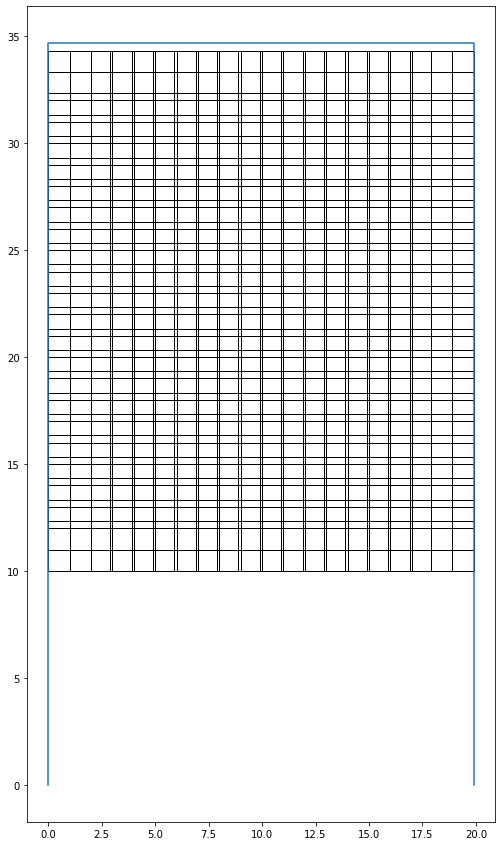

Using license file C:\Users\yoges\gurobi.lic
Academic license - for non-commercial use only
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
10
17
36
96
120
144
197
204
252
299
305
329
396
406
412
room dimension (W x H) are [[19.91666667 34.66666667]]
seat dimension (W x H) are [[2.89583333 2.33333333]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
17
26
36
161
169
234
283
378
405
413
room dimension (W x H) are [[19.91666667 34.66666667]]
seat dimension (W x H) are [[2.89583333 2.33333333]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
35
36
99
180
215
242
396
405
413
room dimension (W x H) are [[19.91666667 34.66666667]]
seat dimension (W x H) are [[2.89583333 2.33333333]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection o

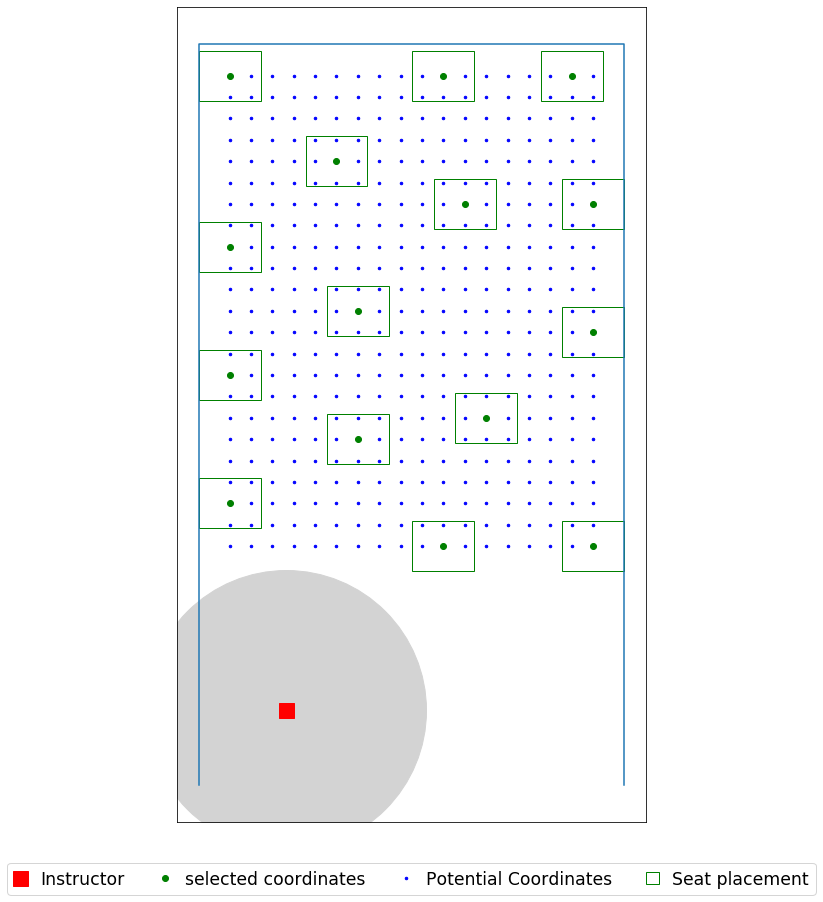

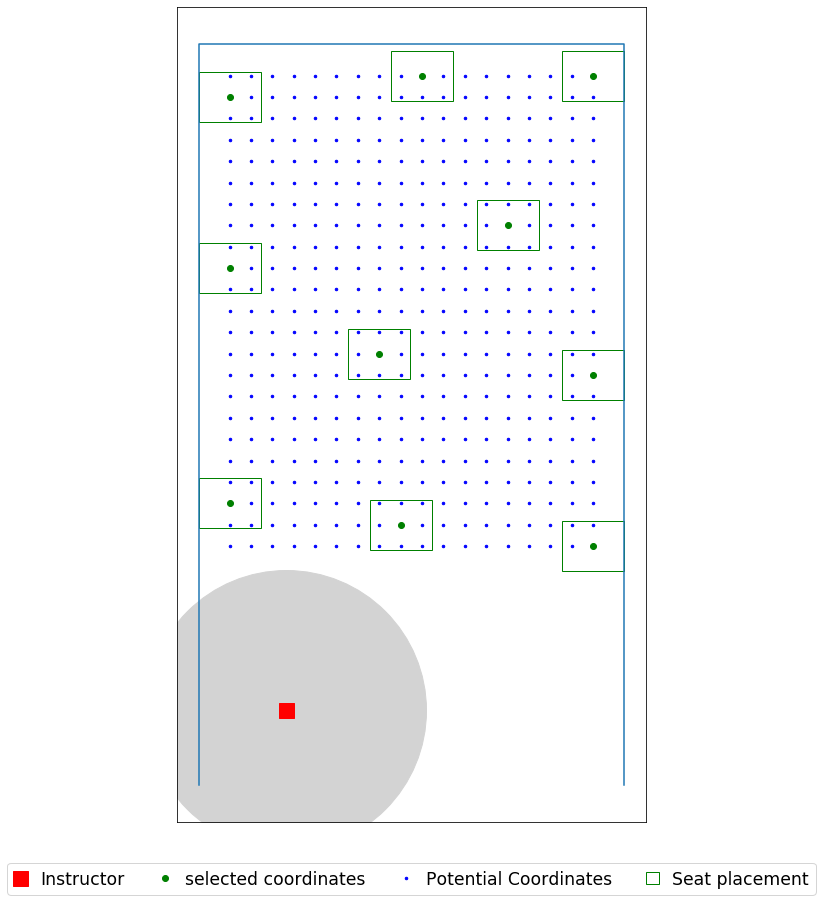

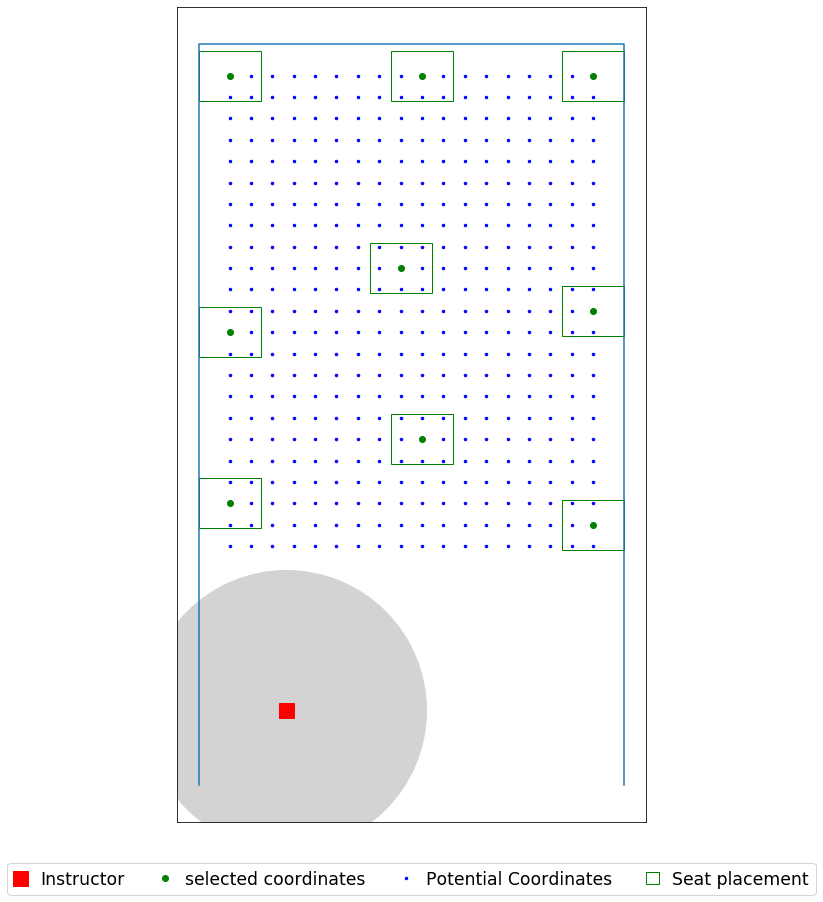

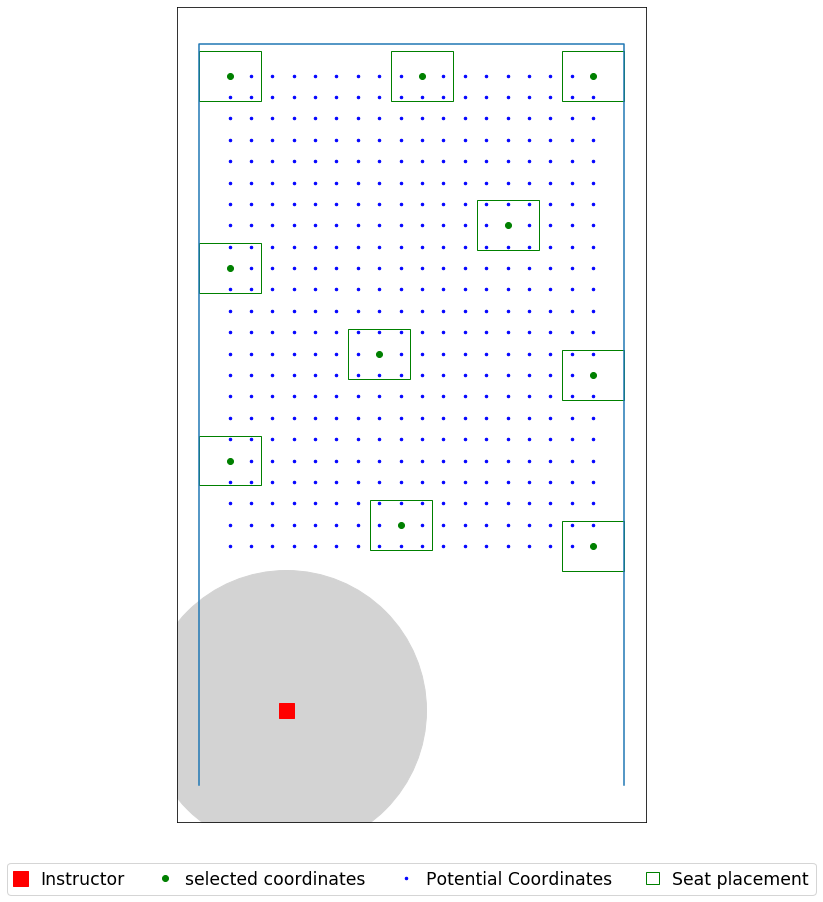

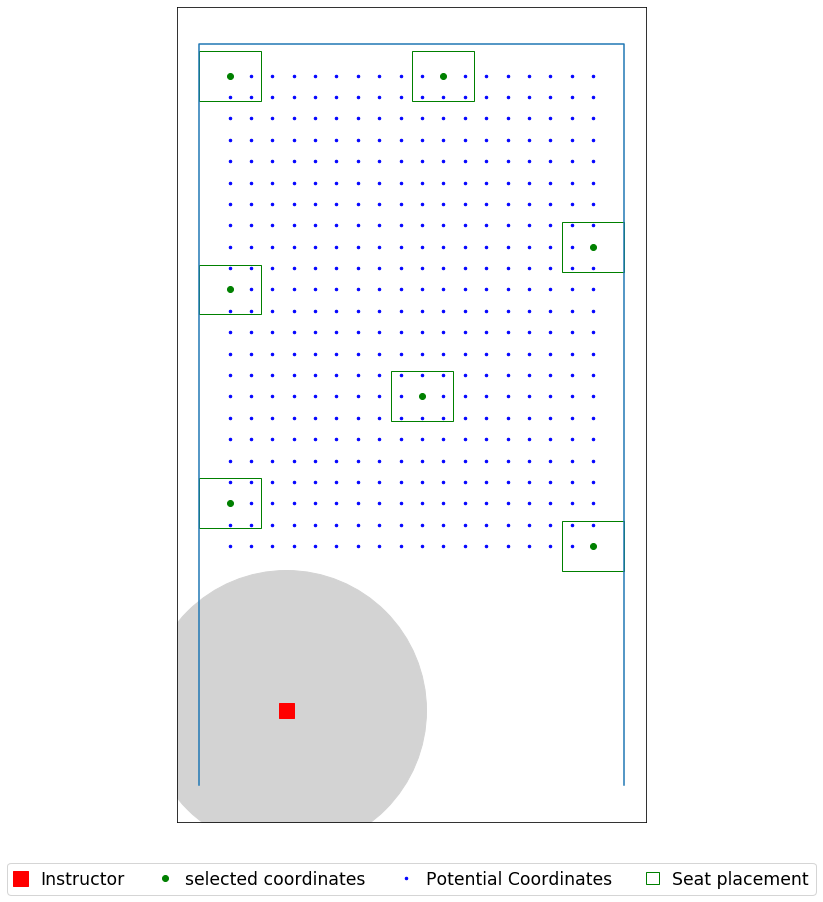

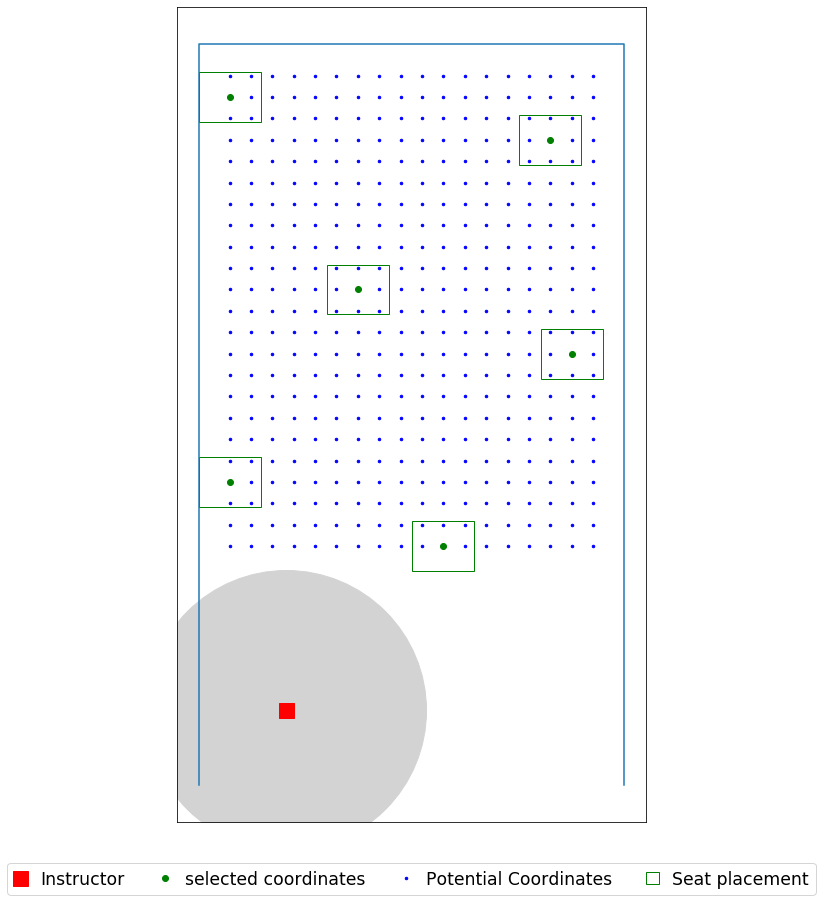

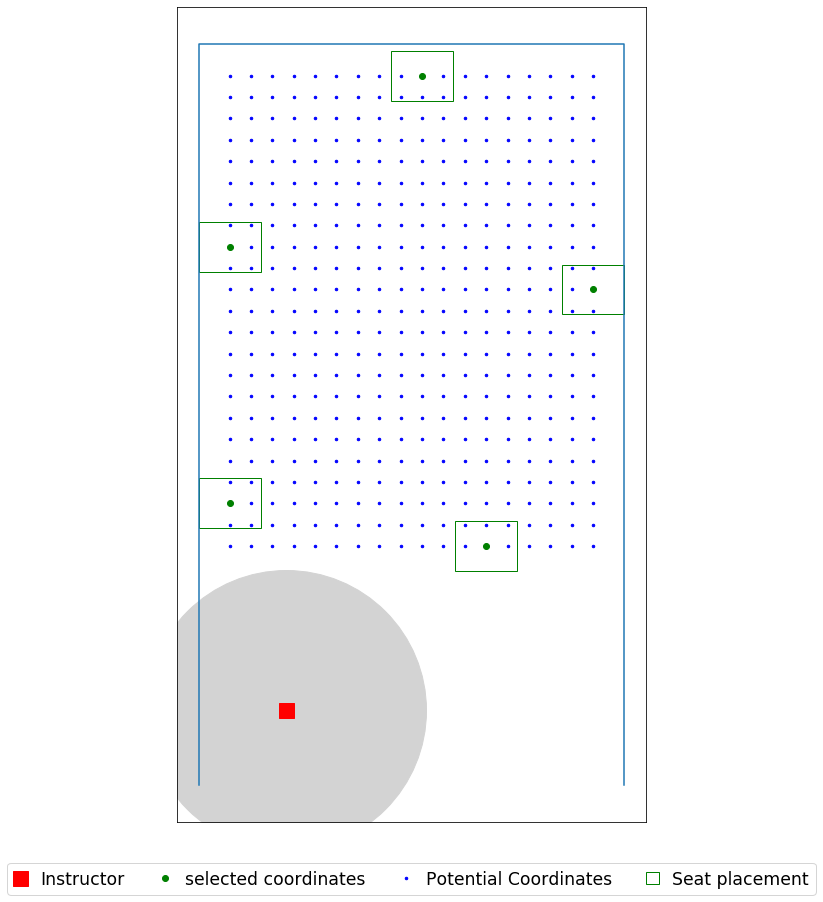

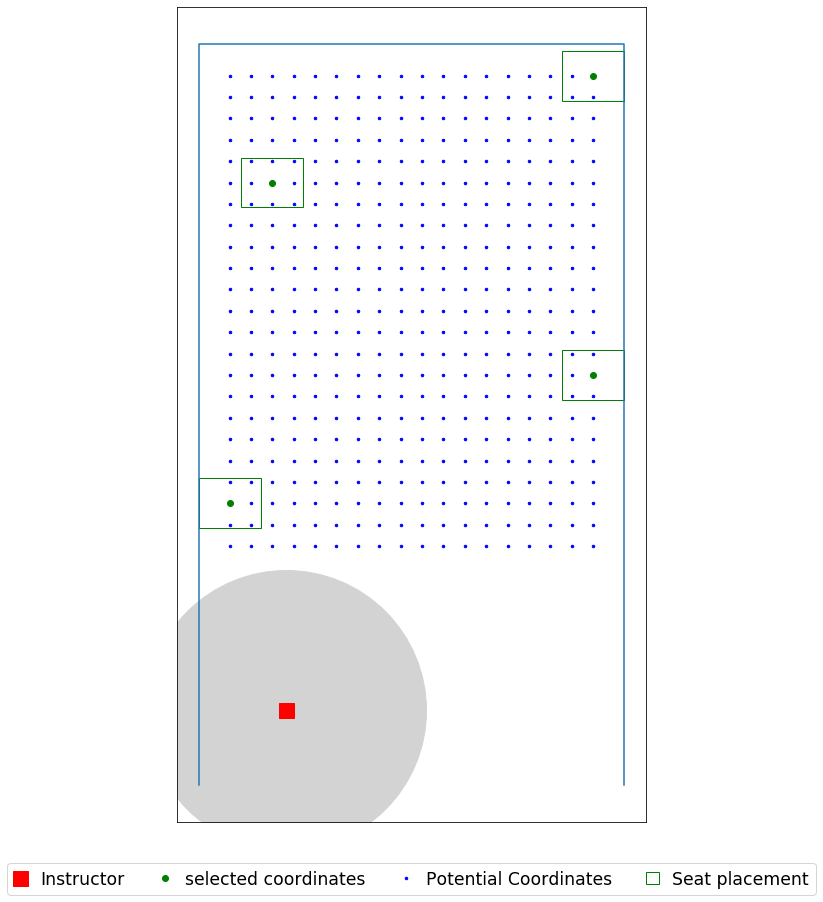

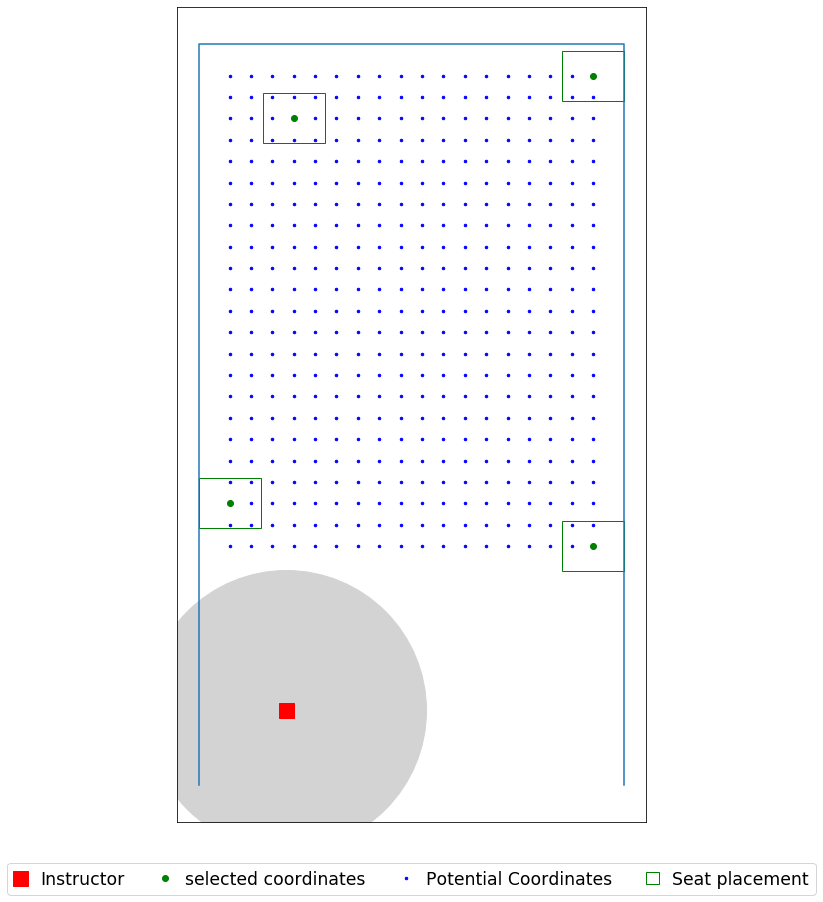

In [11]:
seat_loc = seat_coordinates(data_file, 1)


for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
#         pd.DataFrame(selected).to_csv('Skiles_154_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig('Skiles_154_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        

## Swann 206 Capacity : 25

In [92]:
data_file = r'C:\Users\yoges\Desktop\Input\039_Swann_206.xlsx'

In [93]:
# seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
#     obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=i, d1 = 10)
#     pd.DataFrame(selected).to_csv('Swann_206_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
#     plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#     plt.savefig('Swann_206_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

In [149]:
for i in (6,8,12):
    for j in listt:
        print(i,j)

6 1
6 0.75
6 0
8 1
8 0.75
8 0
12 1
12 0.75
12 0


room dimension (W x H) are [[19.41666667 37.25      ]]
seat dimension (W x H) are [[1.83333333 6.08333333]]
[(0, 10), (19.416666666666668, 10), (19.416666666666668, 37.25), (0, 37.25)]
Total number of seats  is 396


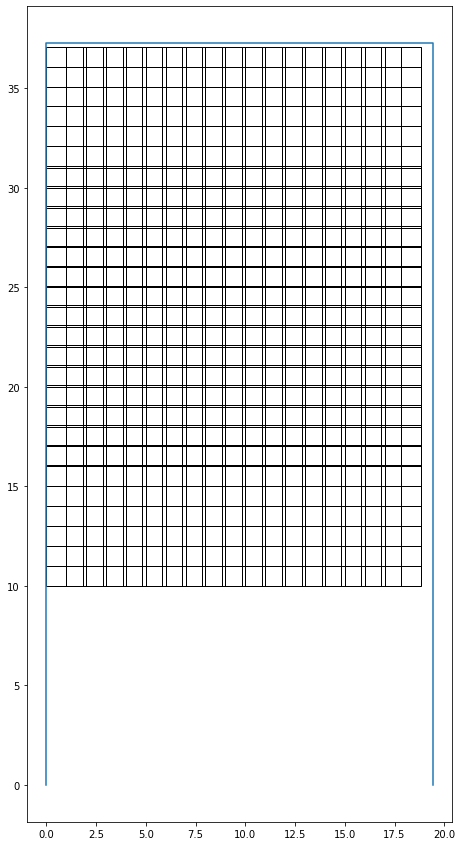

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
17
79
144
158
223
288
302
367
room dimension (W x H) are [[19.41666667 37.25      ]]
seat dimension (W x H) are [[1.83333333 6.08333333]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 14.0
Optimal selection of seats (index):
0
17
47
77
125
144
155
233
252
276
300
379
386
395
room dimension (W x H) are [[19.41666667 37.25      ]]
seat dimension (W x H) are [[1.83333333 6.08333333]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
17
151
197
288
334
room dimension (W x H) are [[19.41666667 37.25      ]]
seat dimension (W x H) are [[1.83333333 6.08333333]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
17
79
144
158
223
288
302
385
room dimension (W x H) are [[19.41666667 37.25      ]]
seat dimensi

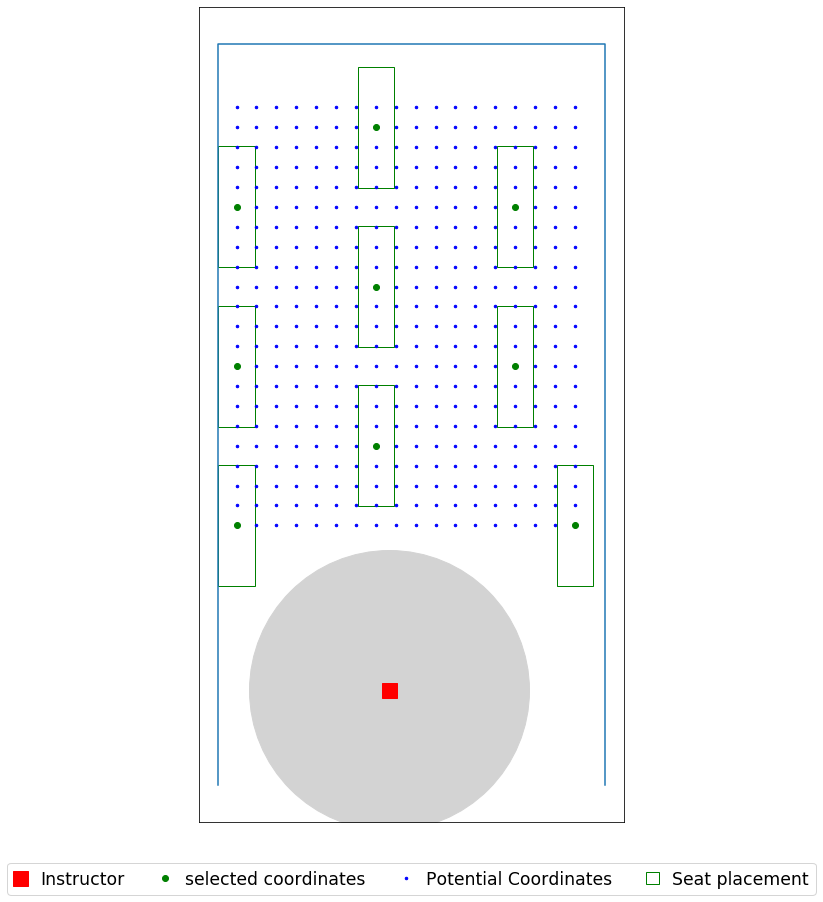

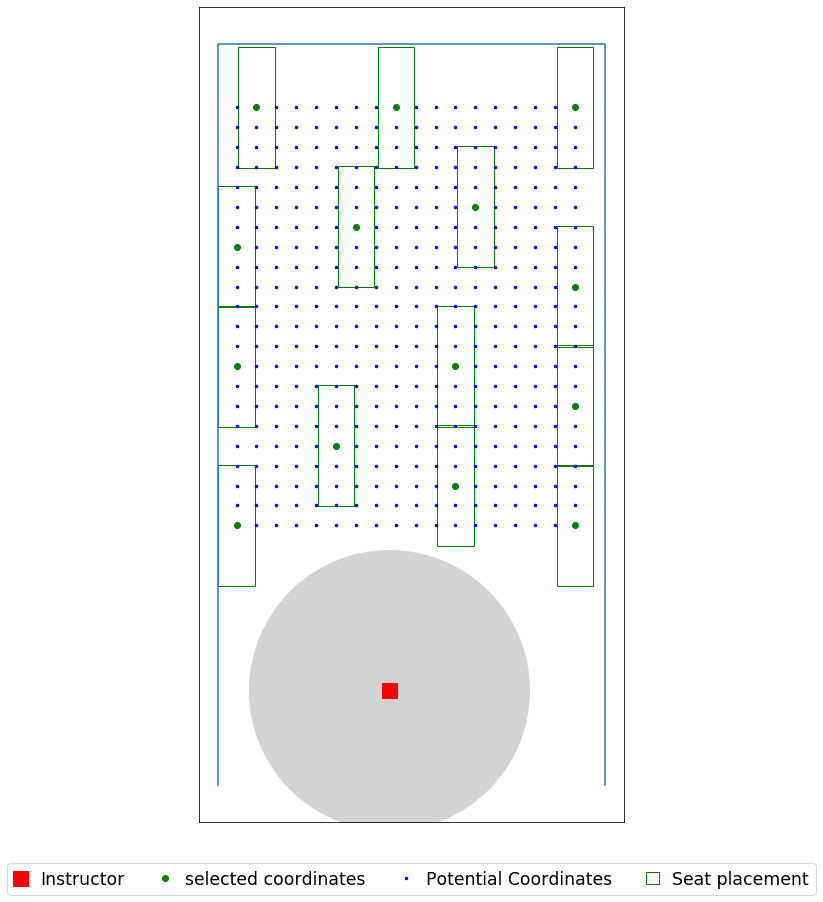

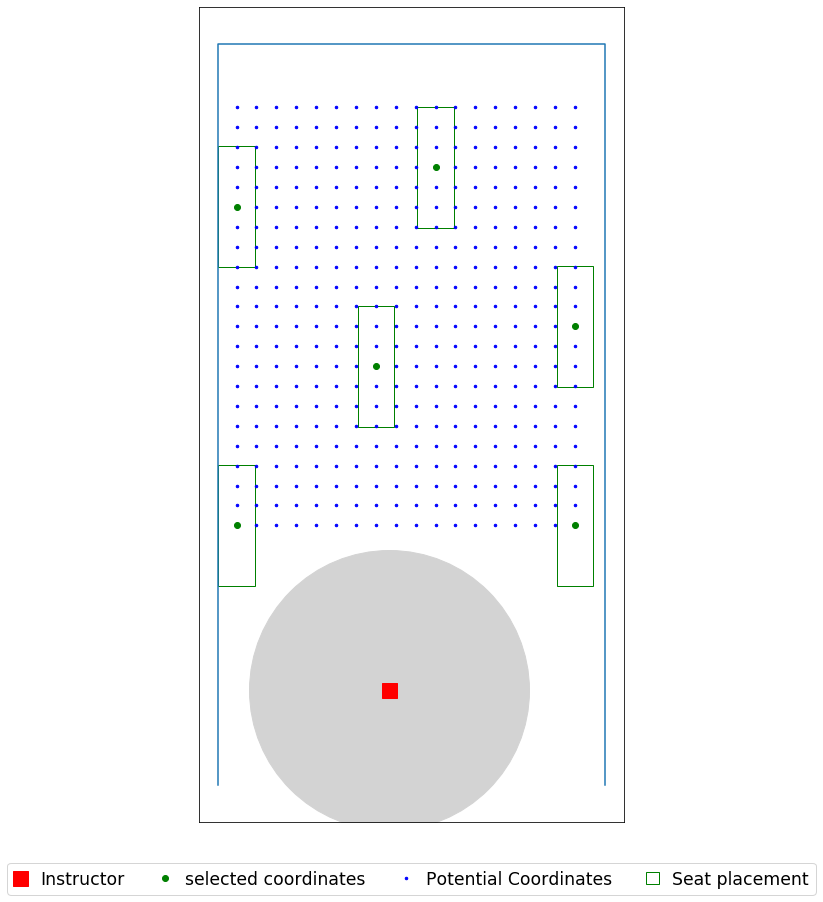

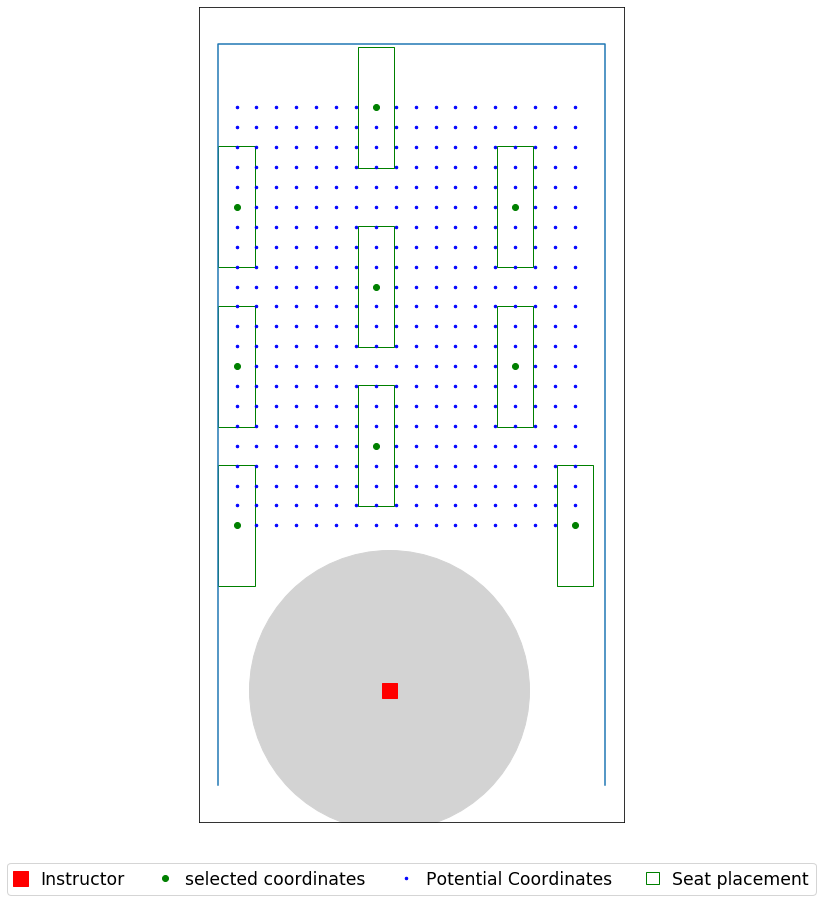

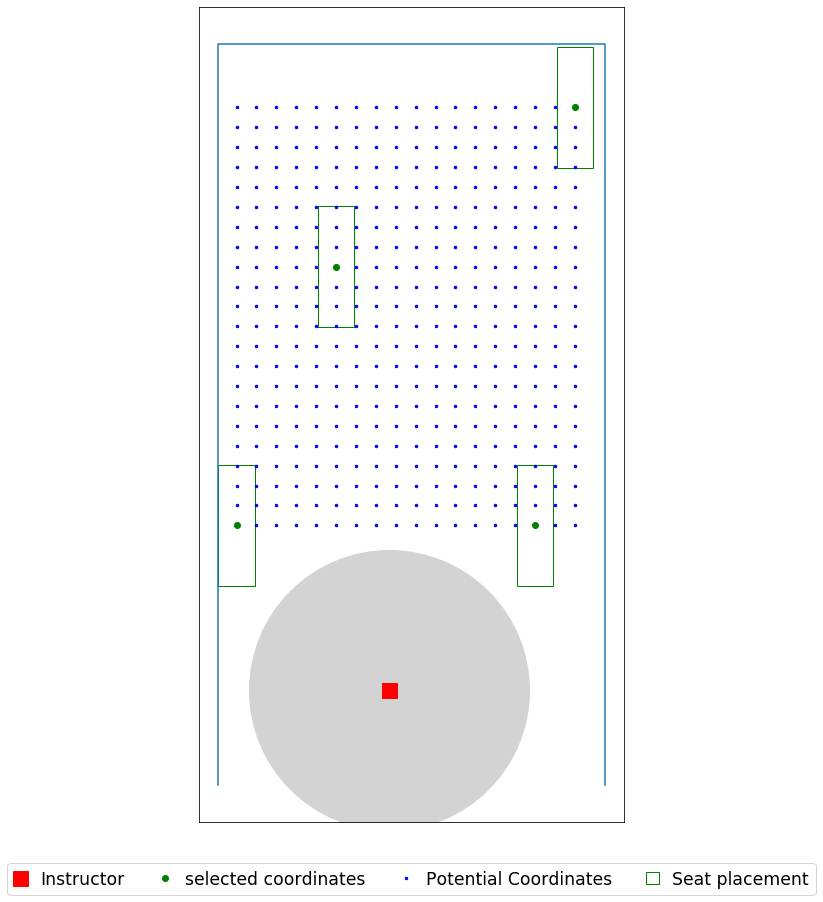

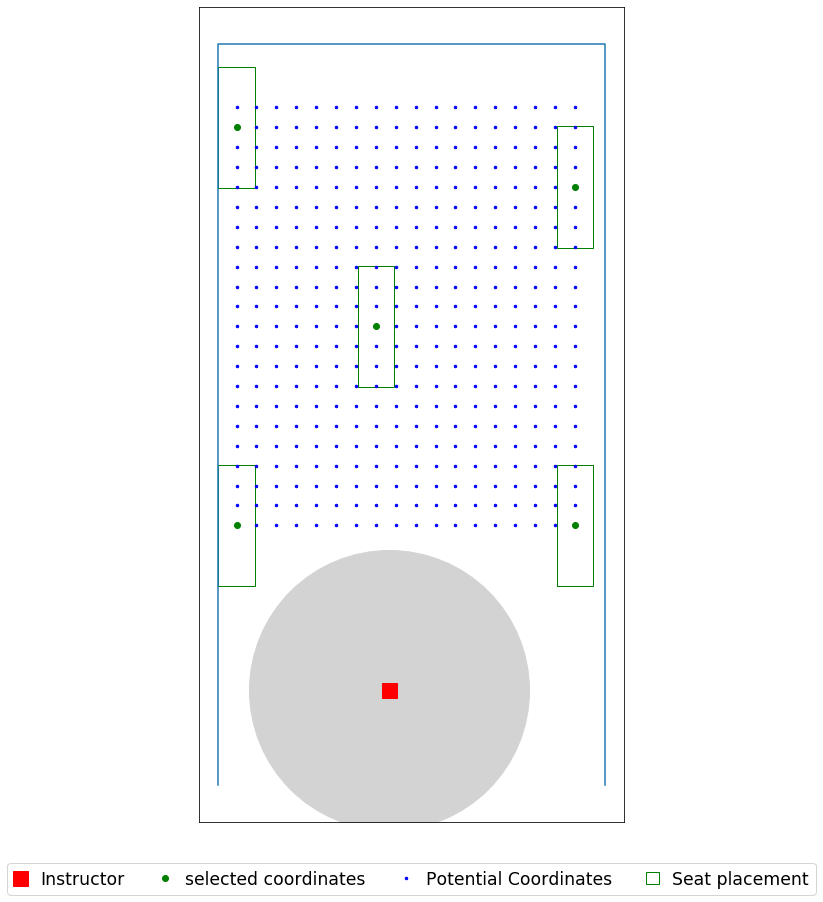

In [94]:
seat_loc = seat_coordinates(data_file)


for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv('Swann_206_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Swann_206_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        

## COC 101 Capacity : 48

In [100]:
data_file = r'C:\Users\yoges\Desktop\Input\050_COC_101.xlsx'

In [103]:
# seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
#     obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=i)
#     pd.DataFrame(selected).to_csv('COC_101_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
#     plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#     plt.savefig('COC_101_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[30.41666667 32.33333333]]
seat dimension (W x H) are [[2.5 2. ]]
[(0, 10), (30.416666666666668, 10), (30.416666666666668, 32.333333333333336), (0, 32.333333333333336)]
Total number of seats  is 588


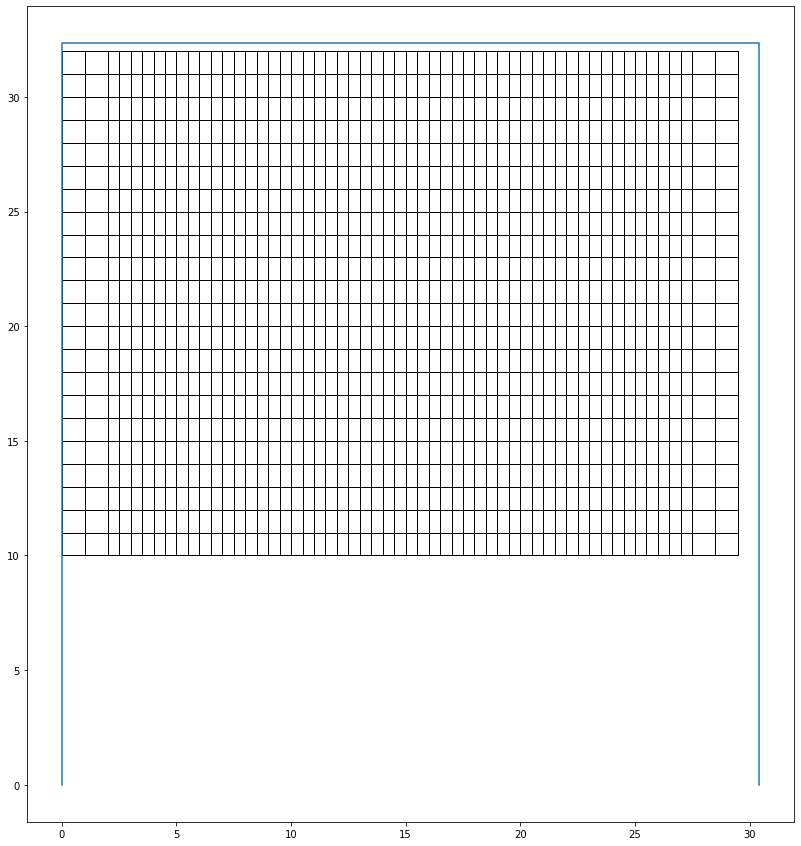

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
0
12
27
160
174
279
293
336
412
455
560
574
587
room dimension (W x H) are [[30.41666667 32.33333333]]
seat dimension (W x H) are [[2.5 2. ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
6
12
18
27
168
174
180
186
193
336
342
348
354
360
504
510
516
522
528
room dimension (W x H) are [[30.41666667 32.33333333]]
seat dimension (W x H) are [[2.5 2. ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
18
149
167
280
298
429
447
560
578
room dimension (W x H) are [[30.41666667 32.33333333]]
seat dimension (W x H) are [[2.5 2. ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
0
12
27
160
174
279
293
336
412
455
560
574
587
room dimension (W x H) are [[30.4166

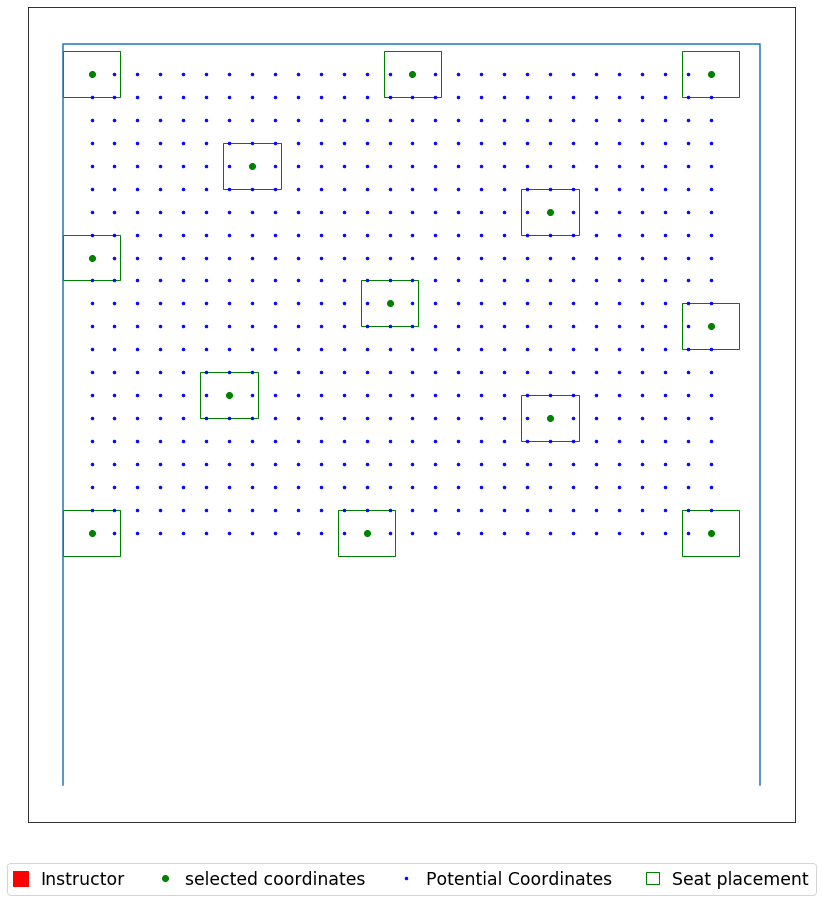

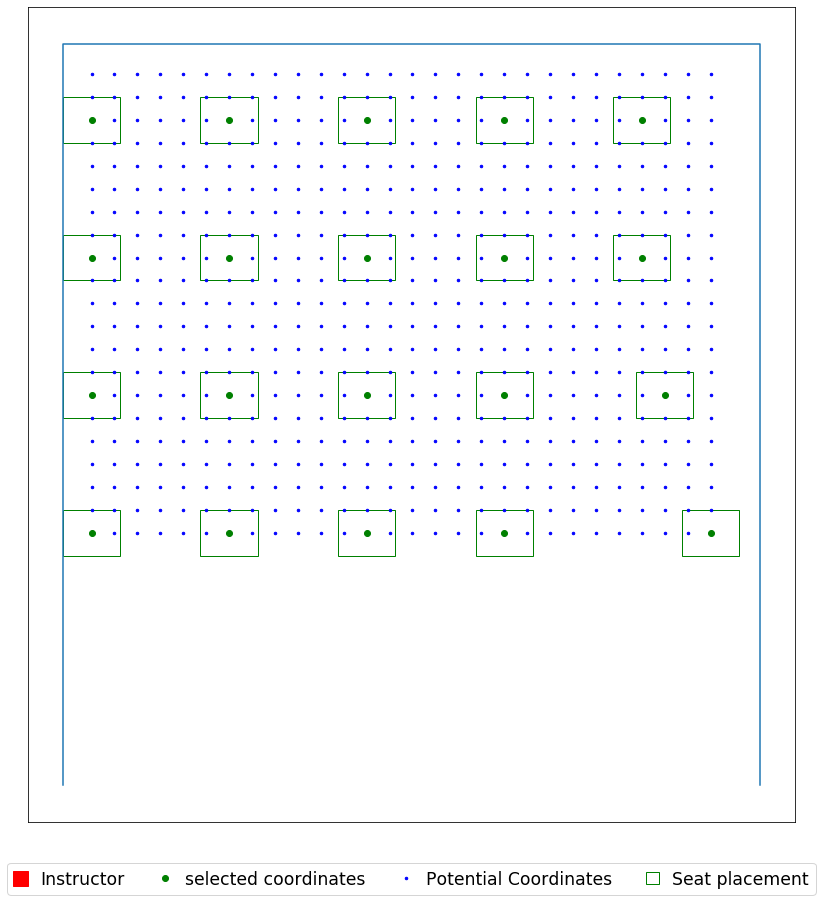

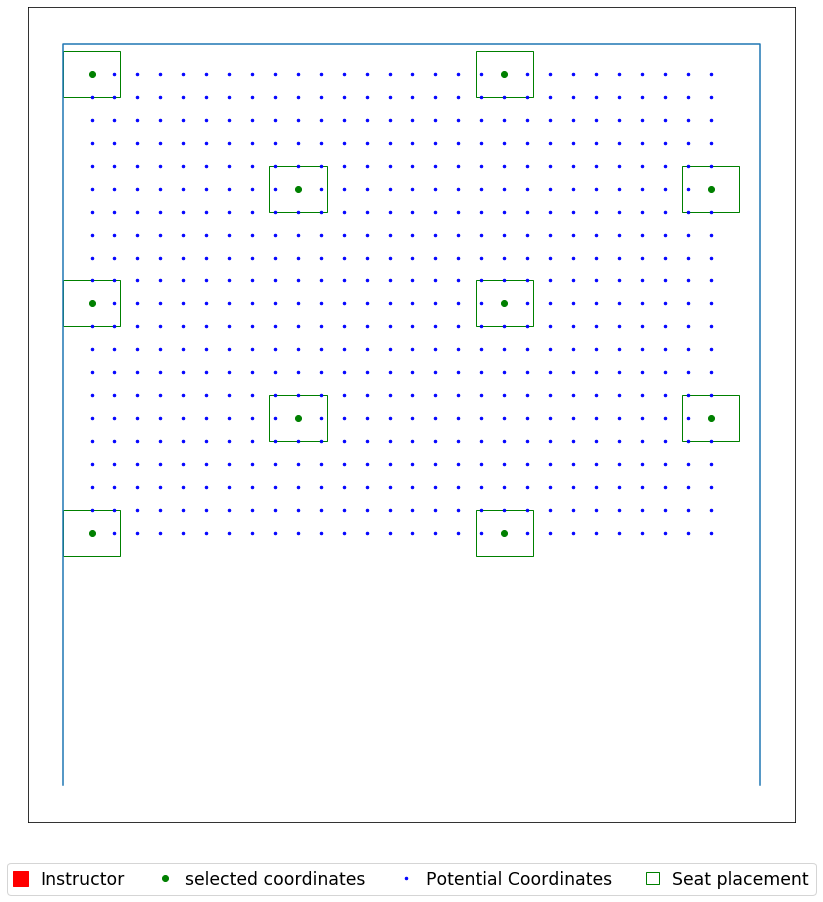

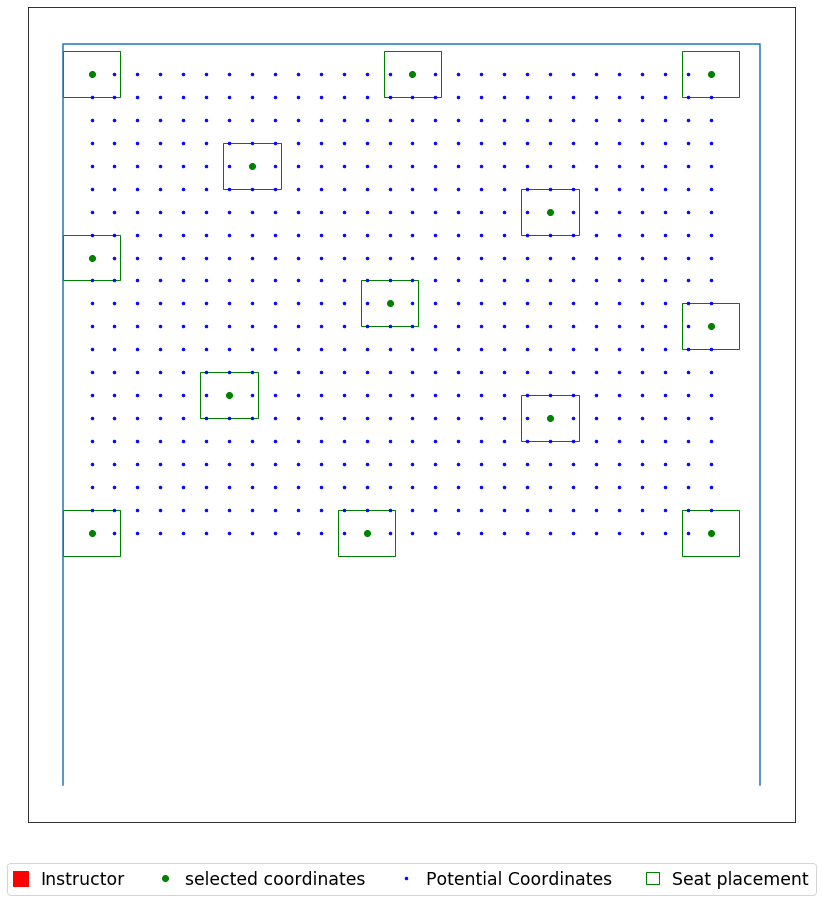

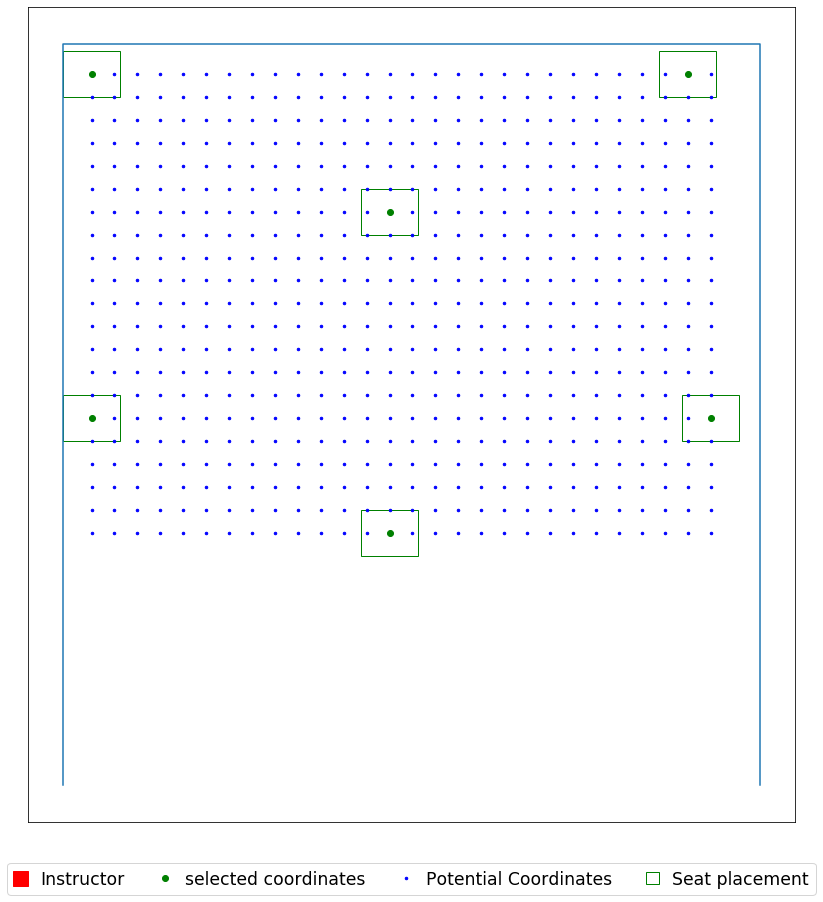

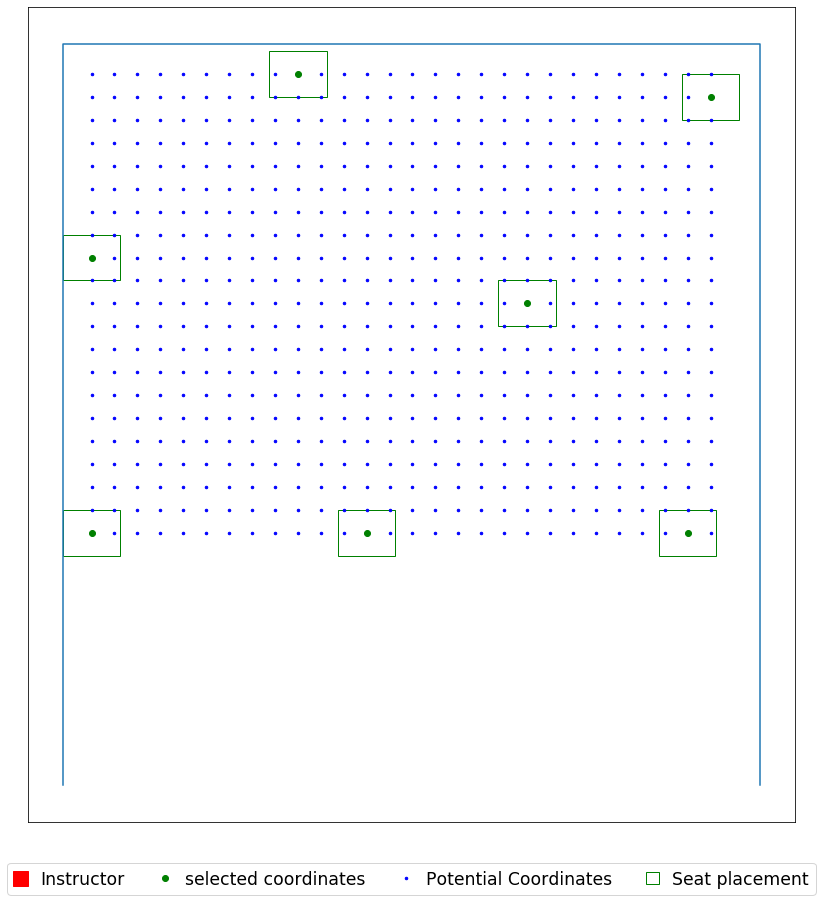

In [104]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i)
        pd.DataFrame(selected).to_csv('COC_101_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('COC_101_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv' + ".jpg", dpi=500)
        
    

## LOVE 183 CAPACITY = 68

In [105]:
data_file = r'C:\Users\yoges\Desktop\Input\144_Love_183.xlsx'

In [ ]:
# seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
#     obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=i, d1 = 10)
#     pd.DataFrame(selected).to_csv('Love_183_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
#     plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#     plt.savefig('Love_183_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[35.16666667 35.        ]]
seat dimension (W x H) are [[2.75 2.25]]
[(0, 10), (35.166666666666664, 10), (35.166666666666664, 35.0), (0, 35.0)]
Total number of seats  is 759


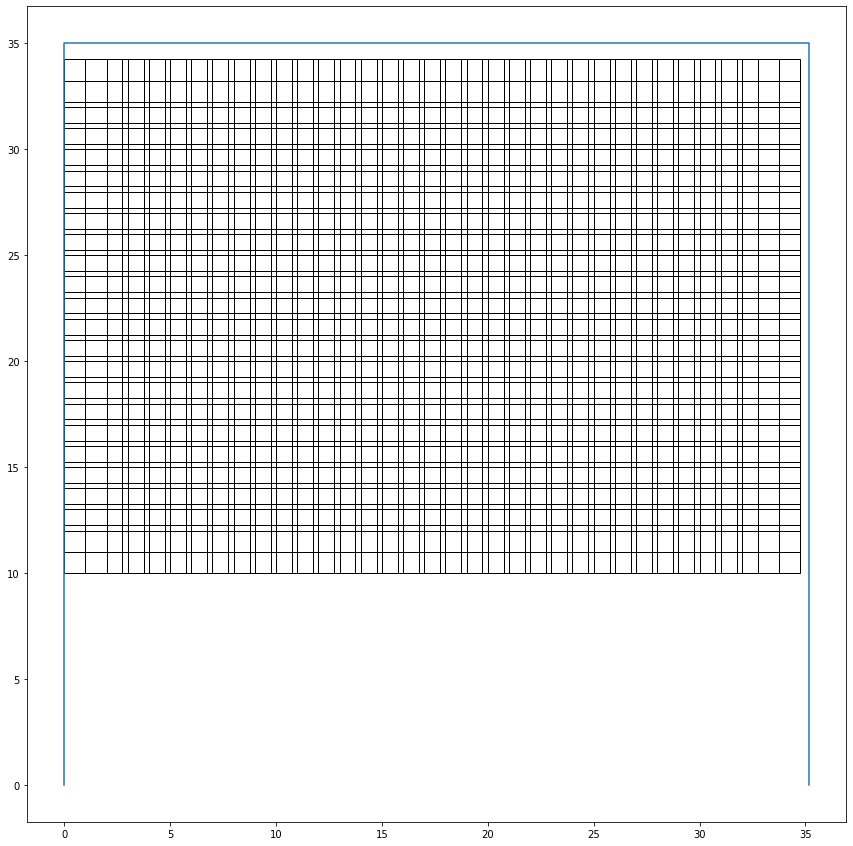

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 17.0
Optimal selection of seats (index):
0
17
28
139
263
264
280
288
499
507
515
523
726
734
742
750
758
room dimension (W x H) are [[35.16666667 35.        ]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 25.0
Optimal selection of seats (index):
0
20
26
32
105
144
198
216
222
230
303
342
391
396
415
501
540
552
560
612
699
726
738
752
758
room dimension (W x H) are [[35.16666667 35.        ]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
22
32
110
349
362
363
505
727
747
757
room dimension (W x H) are [[35.16666667 35.        ]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 17.0
Optimal selection of seats (index):
0
17
28
139
263
264
280
288
499
507
5

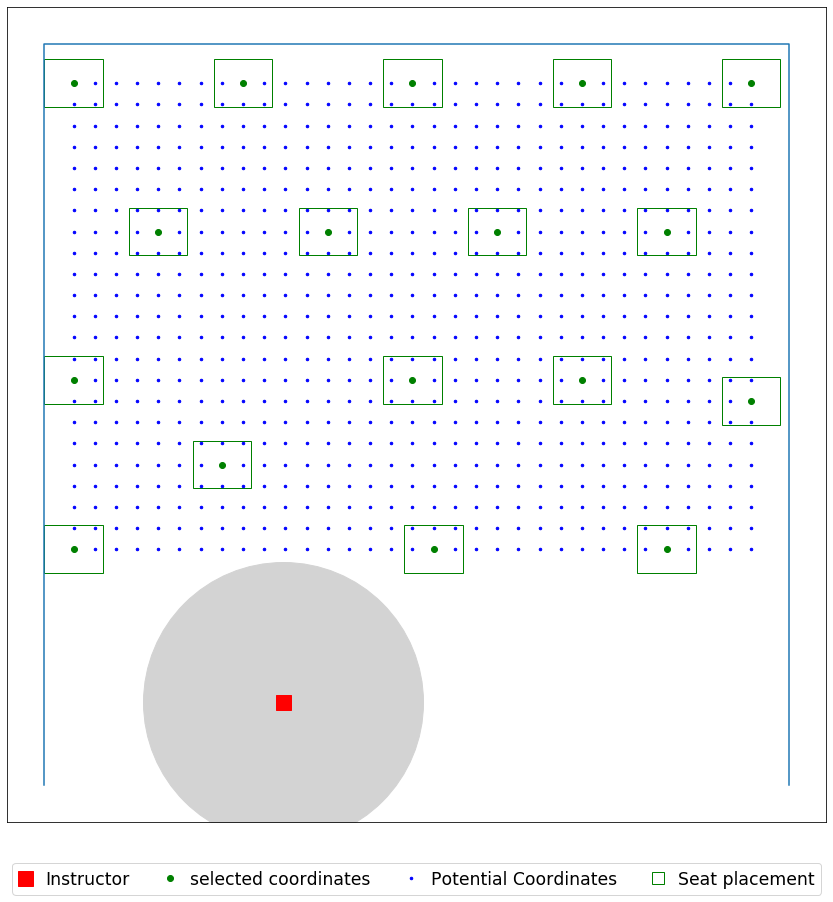

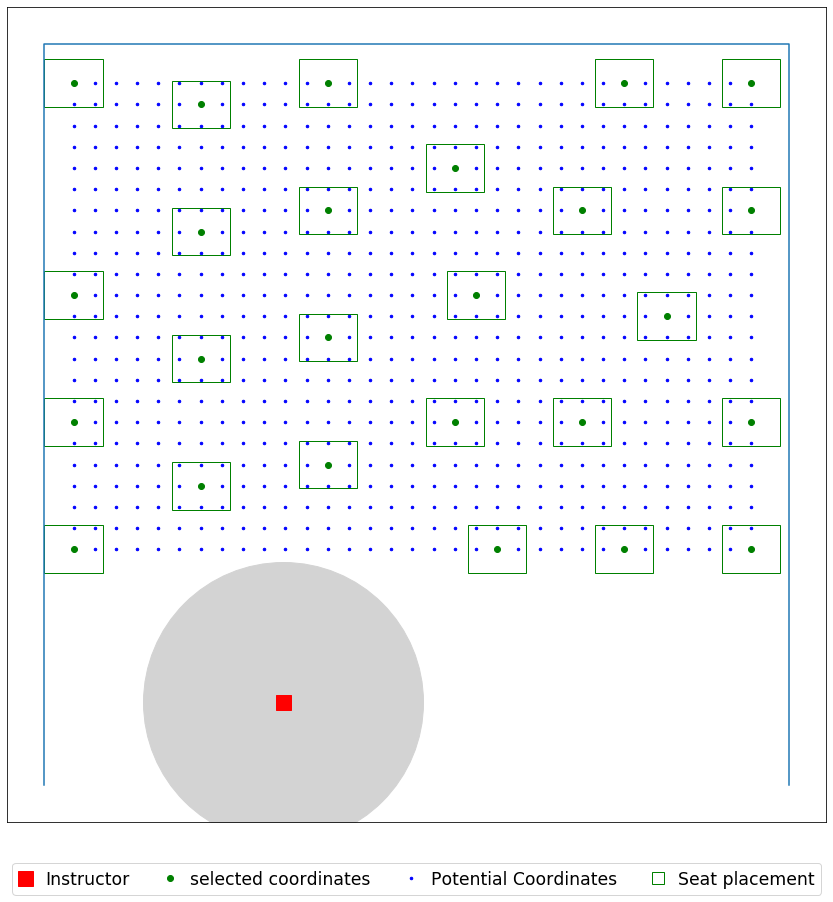

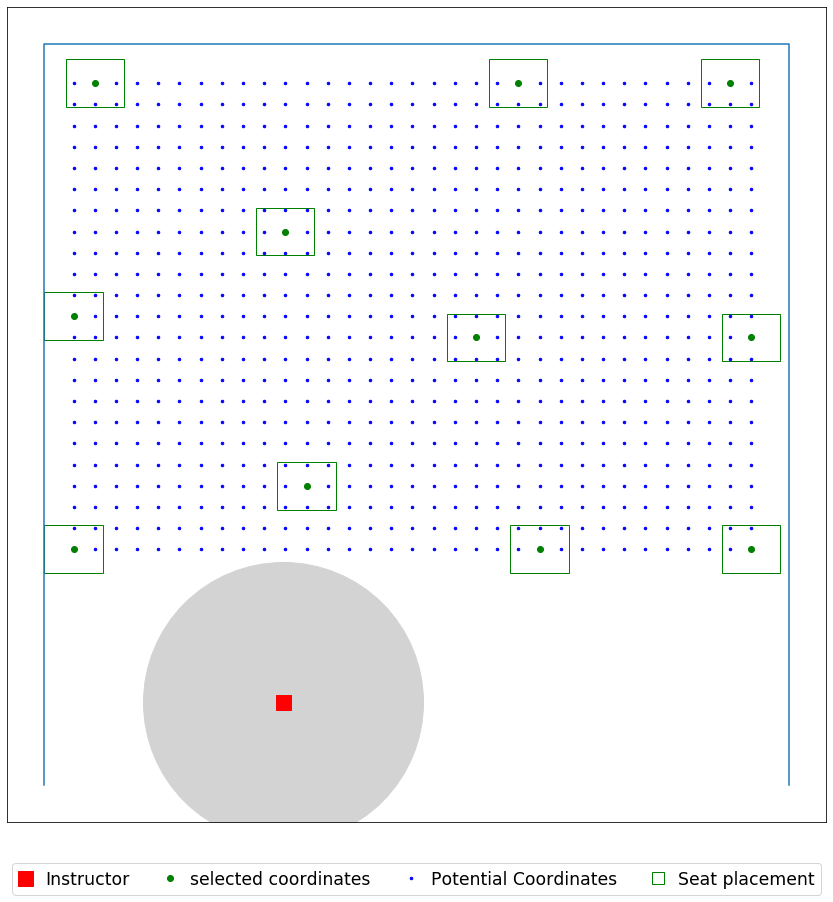

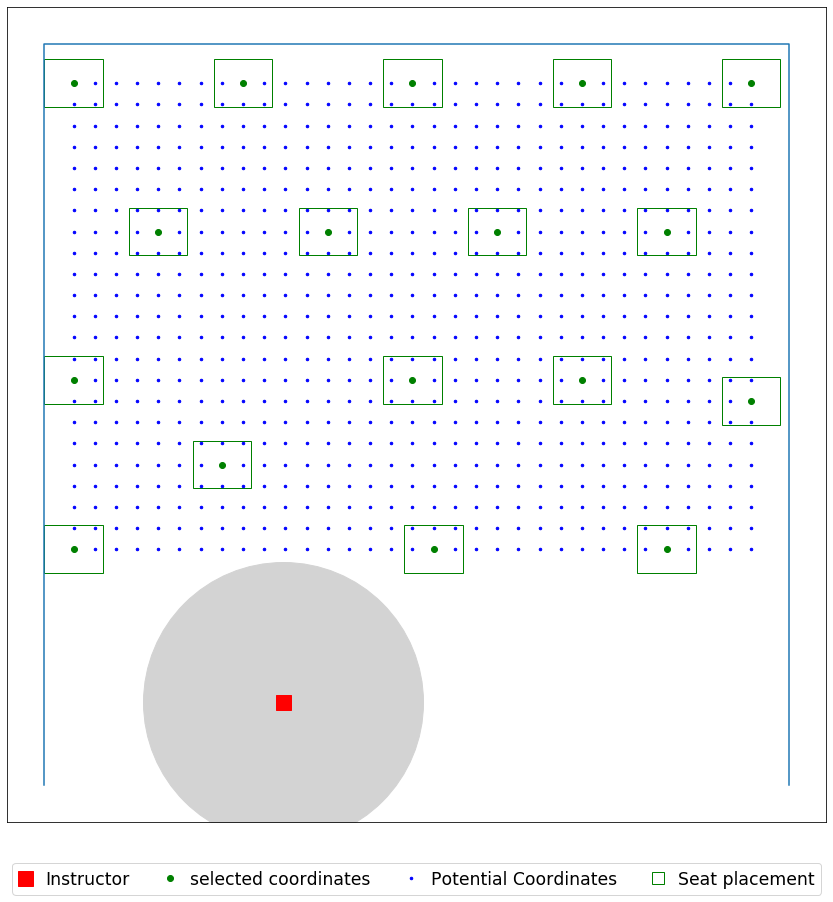

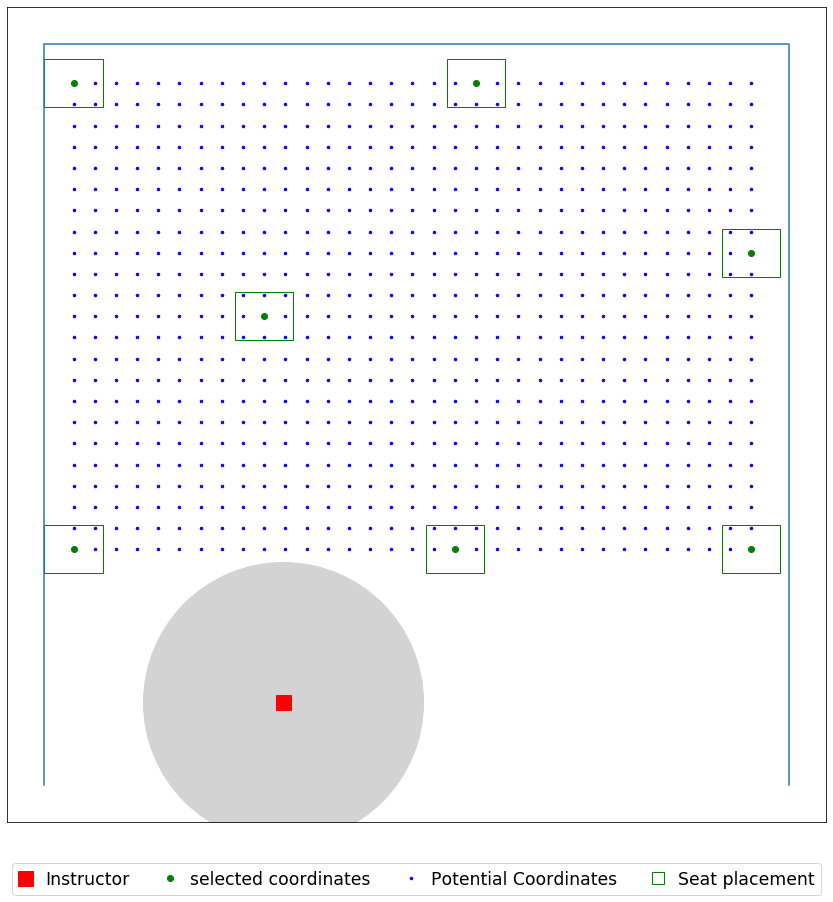

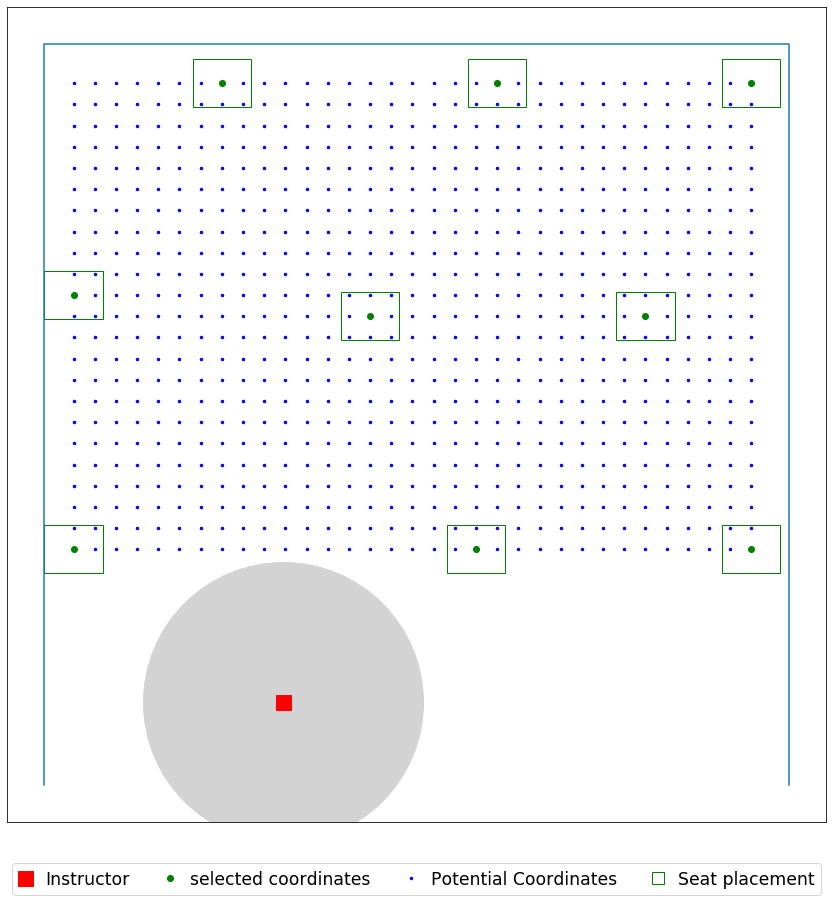

In [106]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv('Love_183_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Love_183_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Emerson 204 Capacity : 37

In [109]:
data_file = r'C:\Users\yoges\Desktop\Input\066A_Emersion_204.xlsx'

In [110]:
# seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
#     obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=i, d1 = 0)
#     pd.DataFrame(selected).to_csv('Emerson_204_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
#     plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#     plt.savefig('Emerson_204_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[19.16666667 39.        ]]
seat dimension (W x H) are [[2.  2.5]]
[(0, 10), (19.166666666666668, 10), (19.166666666666668, 39.0), (0, 39.0)]
Total number of seats  is 486


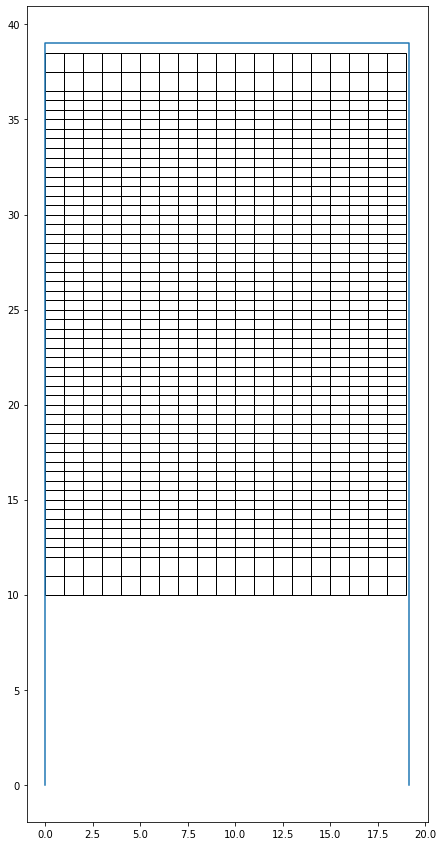

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
9
17
144
152
161
306
314
341
450
458
485
room dimension (W x H) are [[19.16666667 39.        ]]
seat dimension (W x H) are [[2.  2.5]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 18.0
Optimal selection of seats (index):
0
6
12
89
108
114
156
216
222
233
299
324
341
366
408
432
474
485
room dimension (W x H) are [[19.16666667 39.        ]]
seat dimension (W x H) are [[2.  2.5]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
161
167
318
324
475
485
room dimension (W x H) are [[19.16666667 39.        ]]
seat dimension (W x H) are [[2.  2.5]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
9
17
144
152
161
306
314
341
450
458
485
room dimension (W x H) are [[19.16666667 39.        ]]
seat di

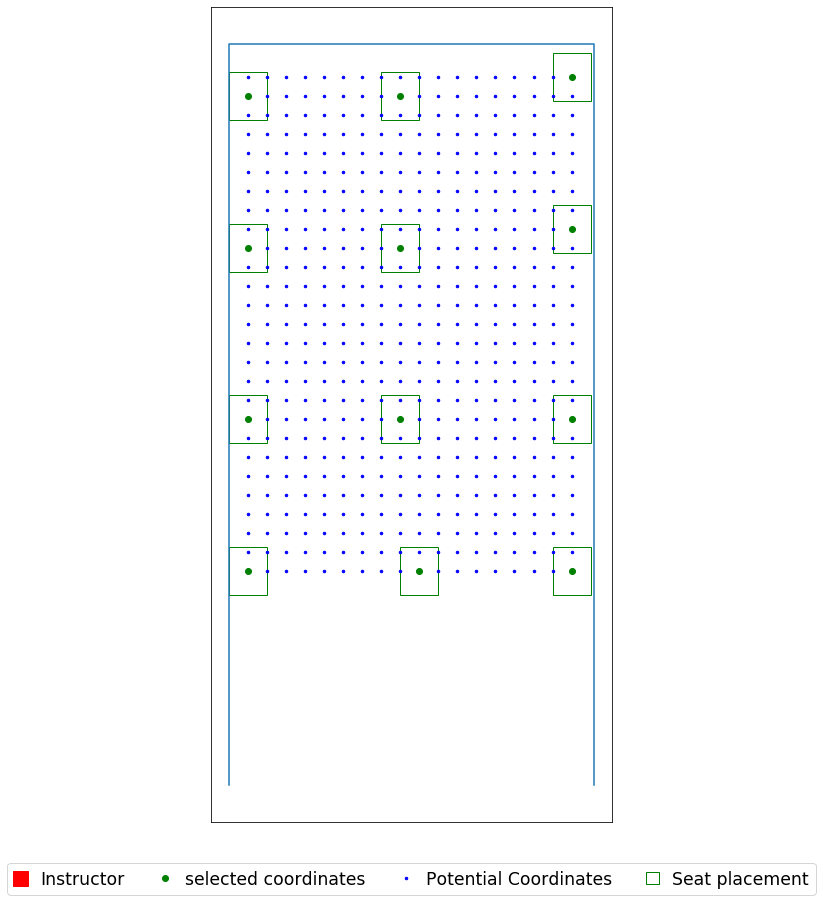

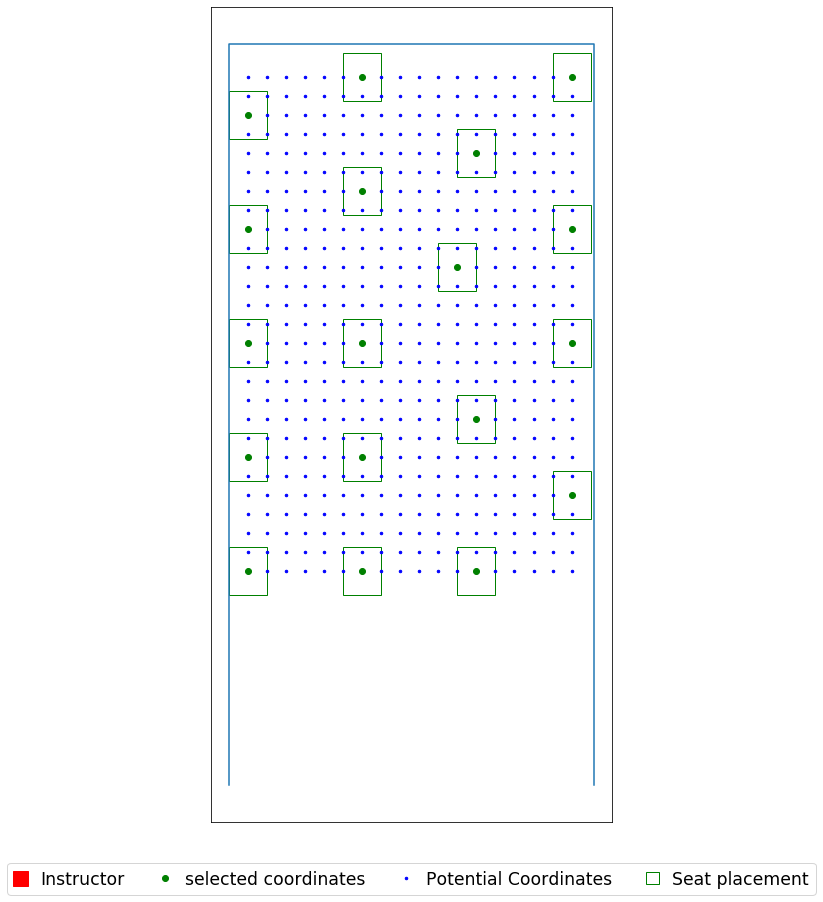

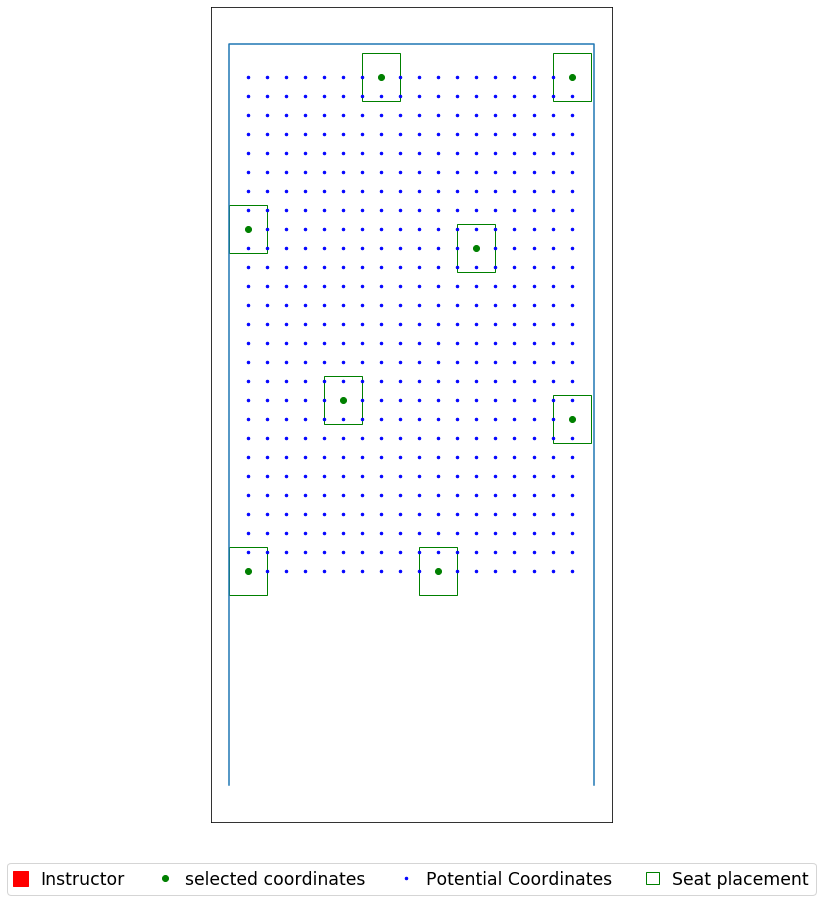

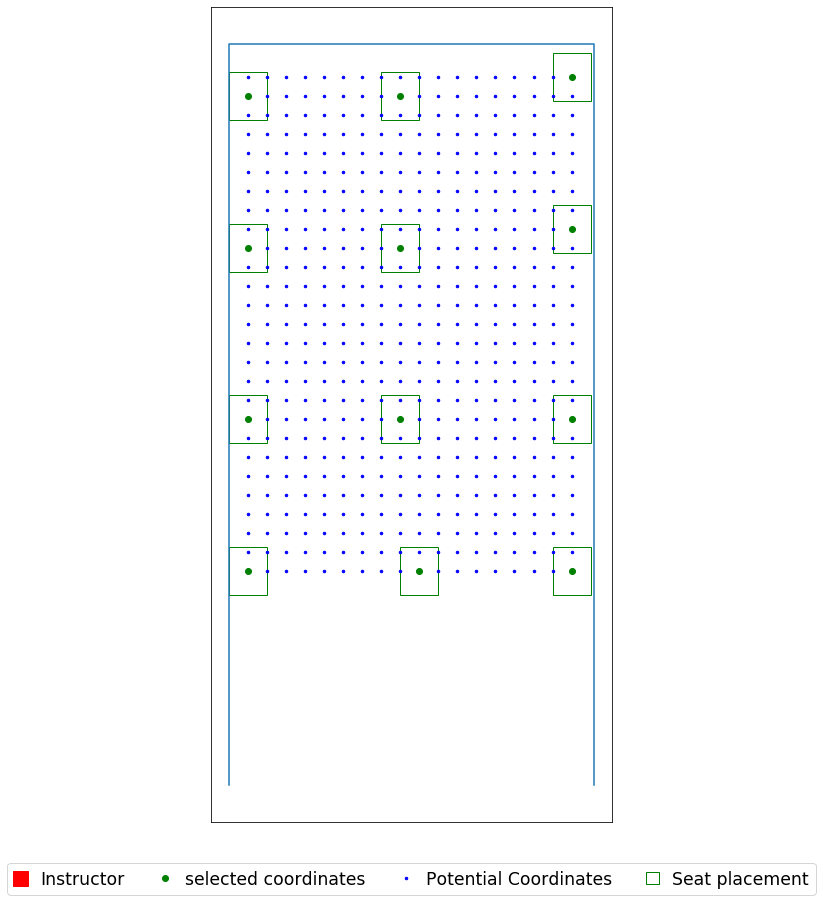

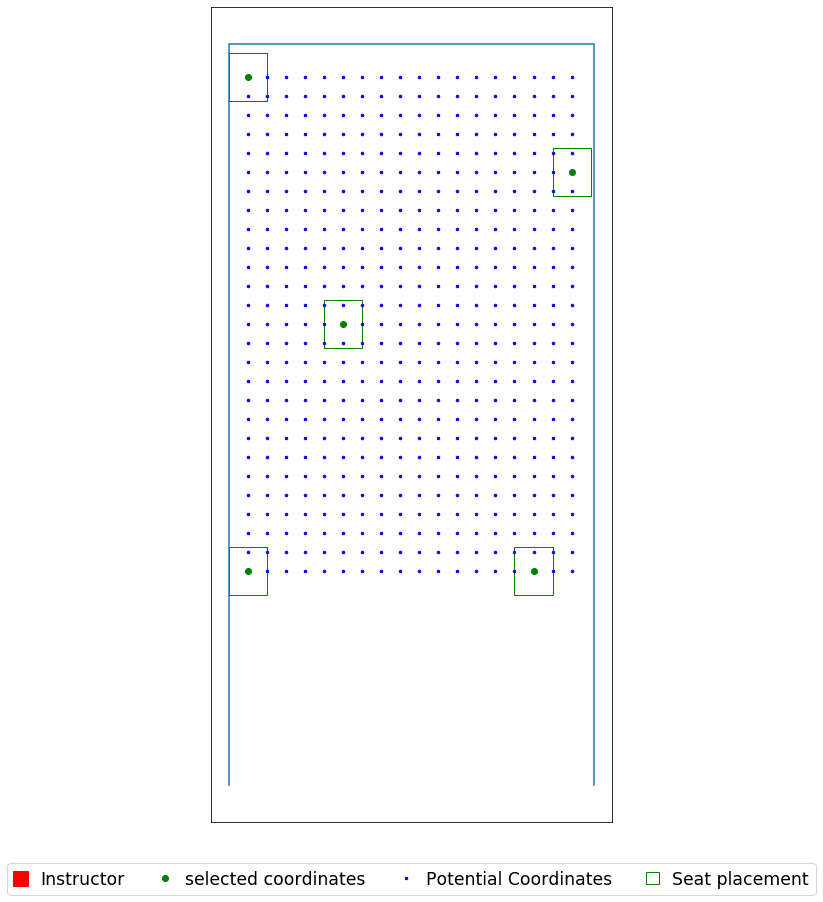

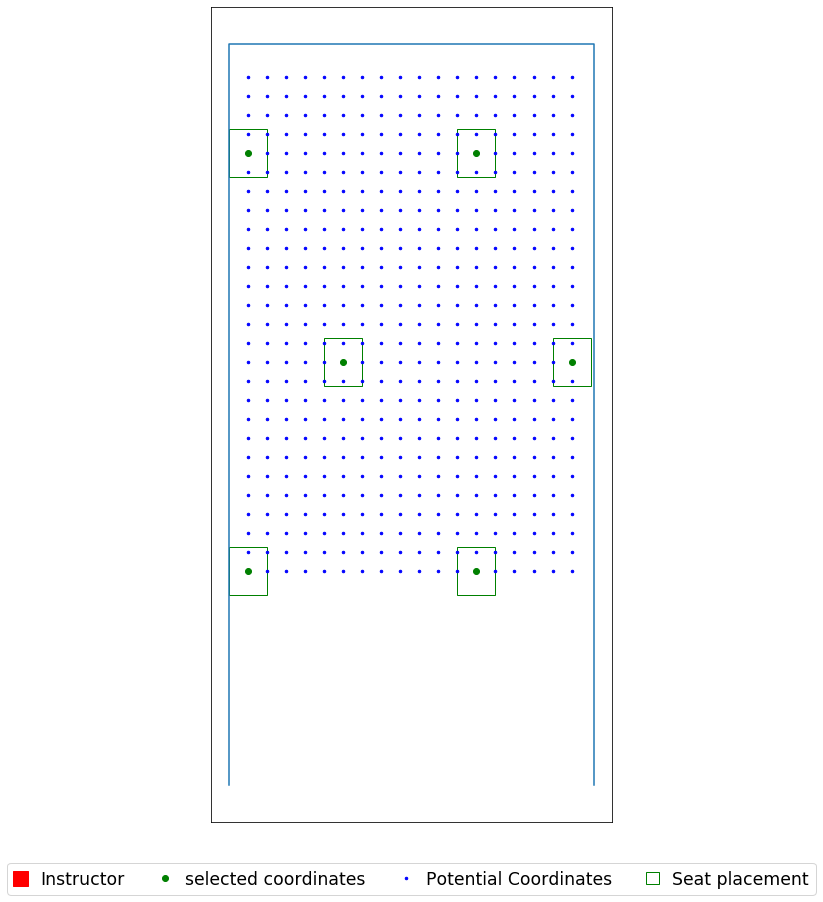

In [111]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 0)
        pd.DataFrame(selected).to_csv('Emerson_204_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Emerson_204_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Emerson 320 Capacity = 53

In [112]:
data_file = r'C:\Users\yoges\Desktop\Input\066A_Emerson_320.xlsx'

In [113]:
# seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
#     obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=i, d1 = 10)
#     pd.DataFrame(selected).to_csv('Emerson_320_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
#     plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#     plt.savefig('Emerson_320_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[24. 43.]]
seat dimension (W x H) are [[2.41666667 2.25      ]]
[(0, 10), (24.0, 10), (24.0, 43.0), (0, 43.0)]
Total number of seats  is 682


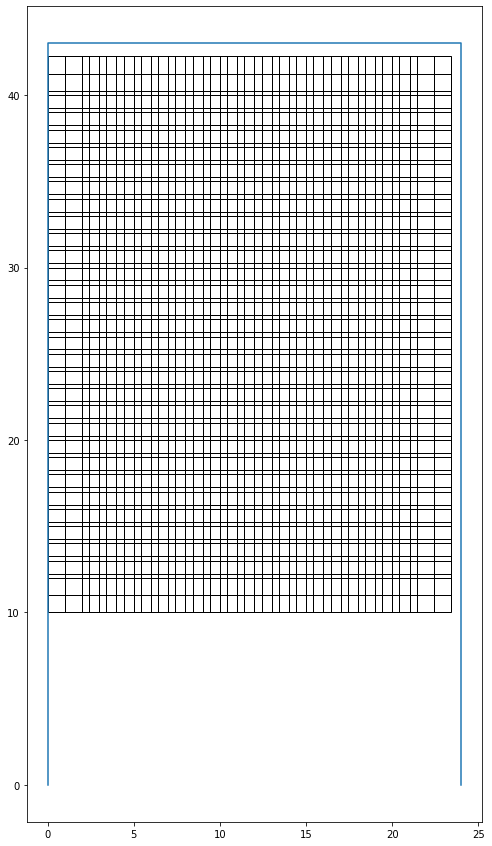

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
21
29
110
124
205
219
286
300
381
395
484
498
579
593
660
674
room dimension (W x H) are [[24. 43.]]
seat dimension (W x H) are [[2.41666667 2.25      ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 23.0
Optimal selection of seats (index):
8
14
21
66
138
144
152
198
270
276
283
330
402
408
415
462
534
540
547
594
666
672
679
room dimension (W x H) are [[24. 43.]]
seat dimension (W x H) are [[2.41666667 2.25      ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
10
21
220
231
241
440
450
461
660
671
681
room dimension (W x H) are [[24. 43.]]
seat dimension (W x H) are [[2.41666667 2.25      ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
29
43
110
124
205
219
286
300
381
395
484
498
579
593
660

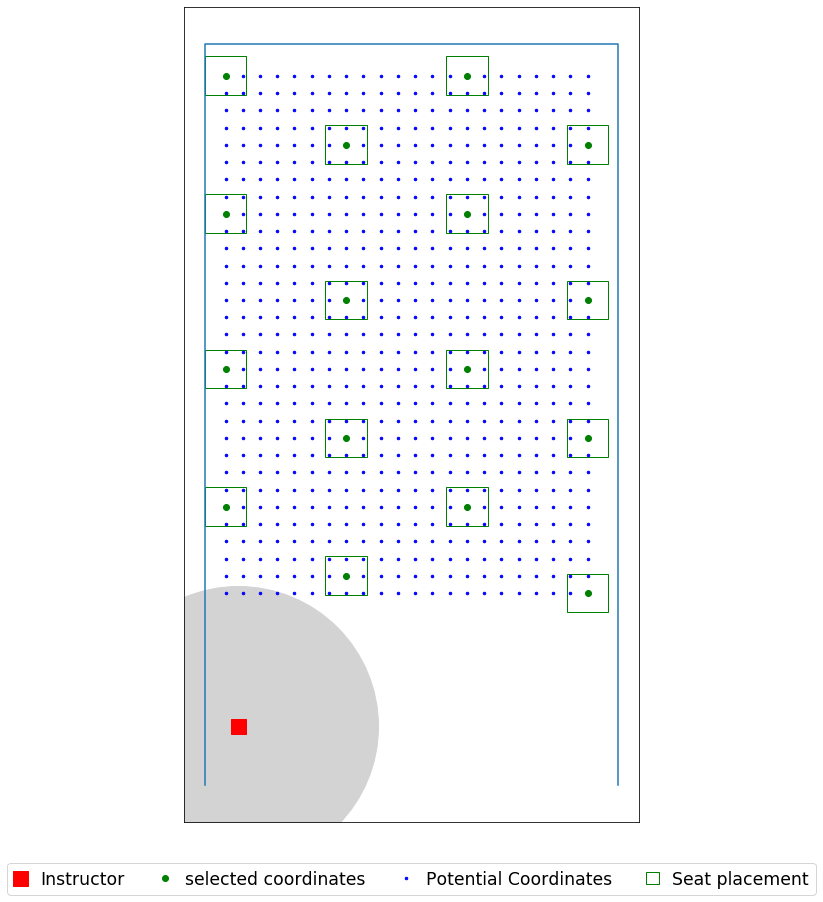

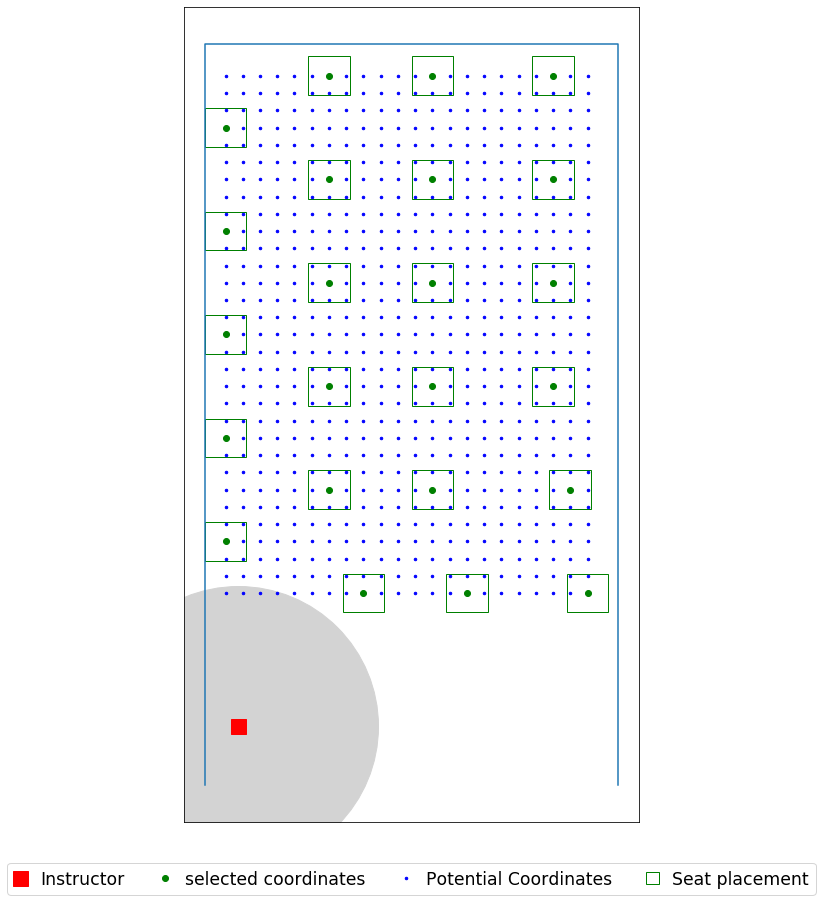

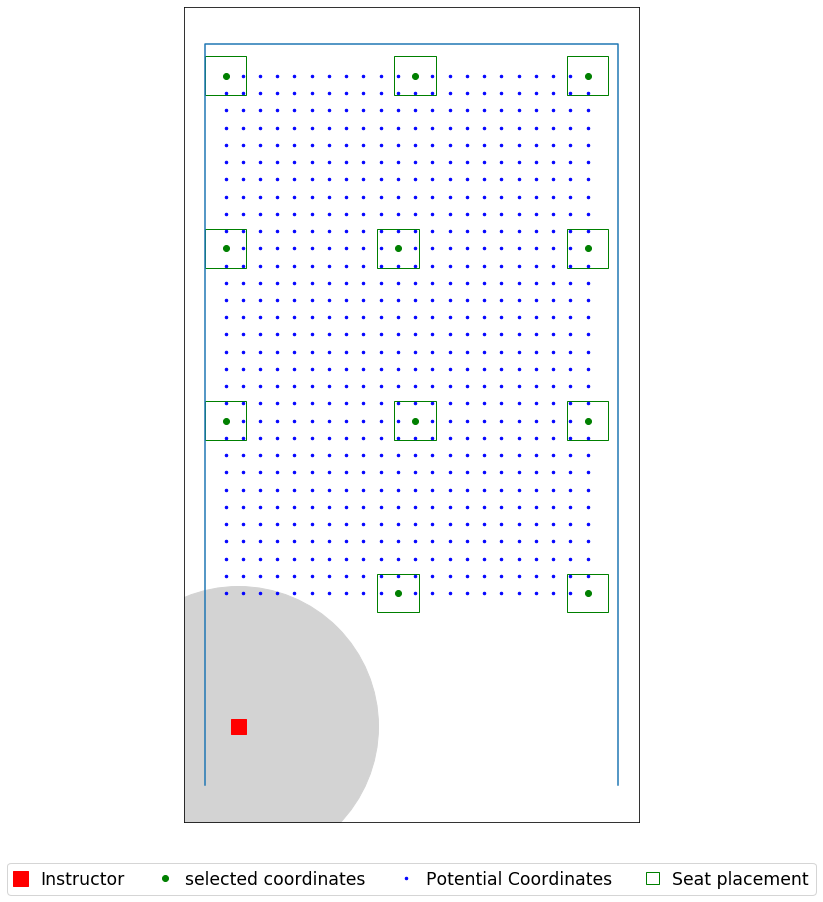

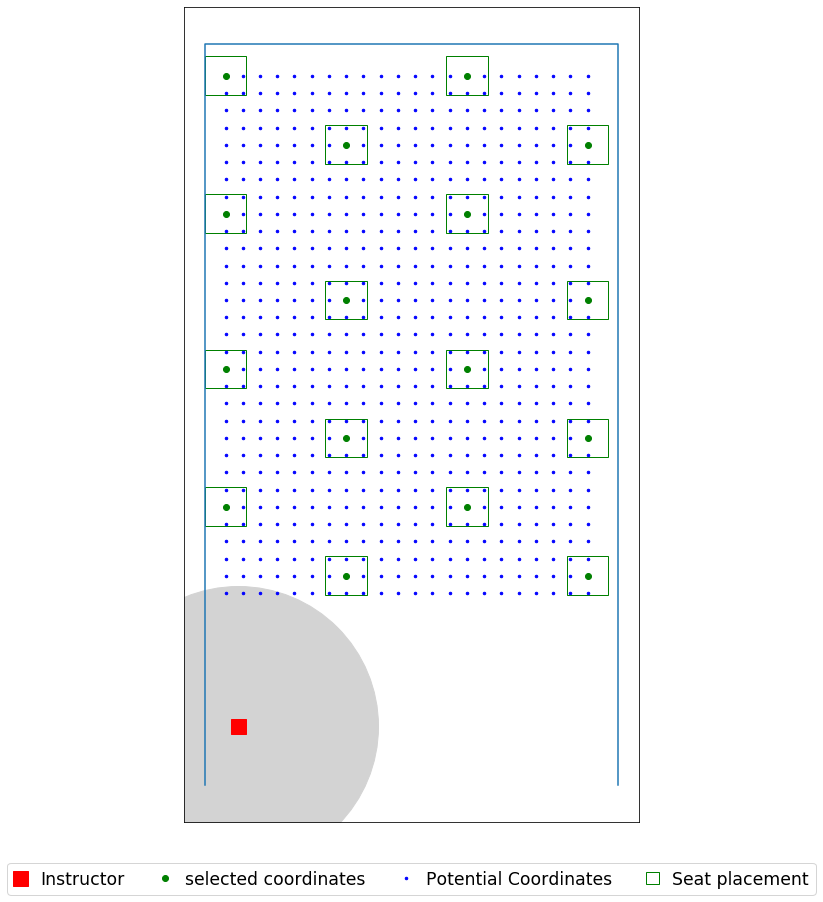

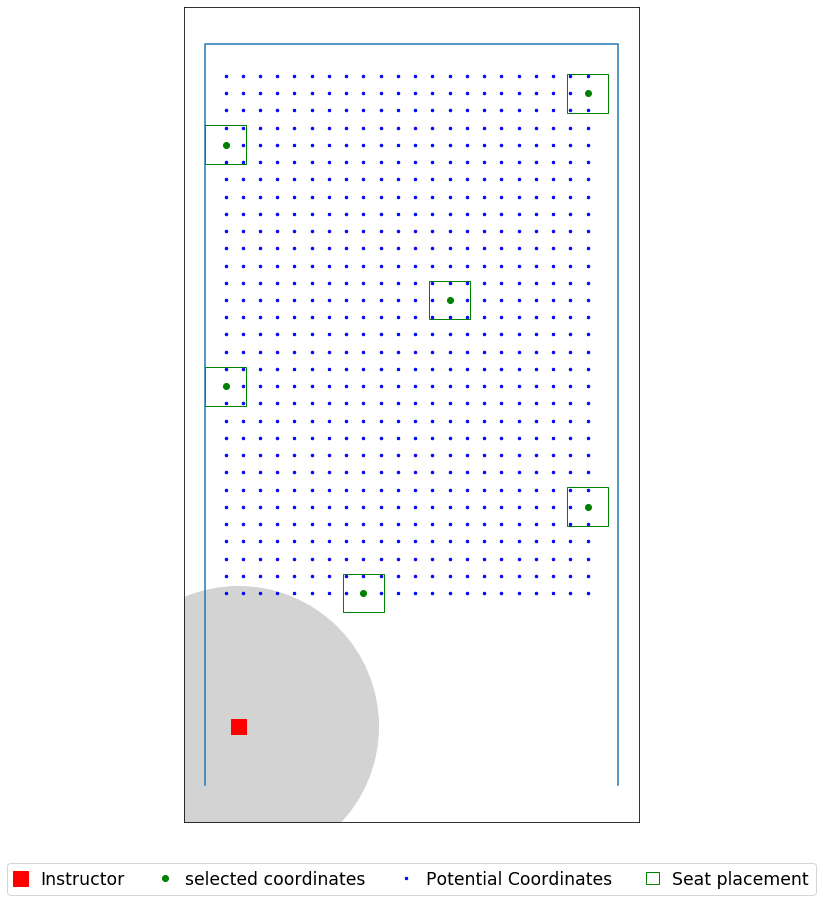

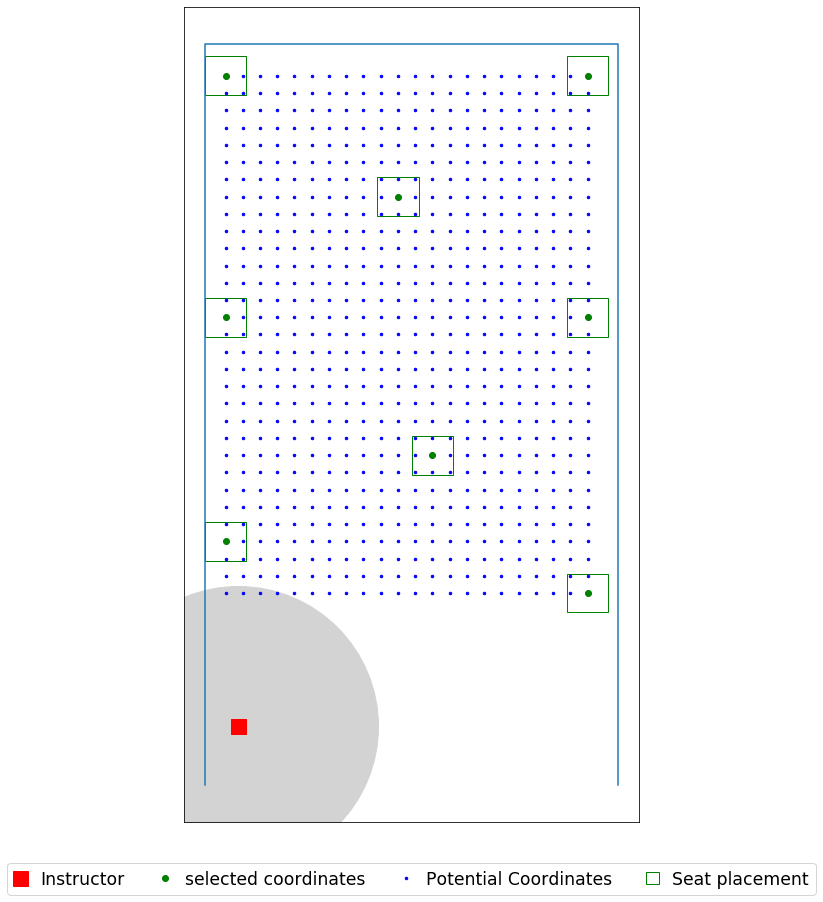

In [114]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv('Emerson_320'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Emerson_320_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 202

In [163]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_202.xlsx'

room dimension (W x H) are [[47.16666667 28.3       ]]
seat dimension (W x H) are [[2.75 2.  ]]
[[18.83333333  3.5       ]]
[(0, 10), (47.166666666666664, 10), (47.166666666666664, 28.3), (0, 28.3)]
Total number of seats  is 176


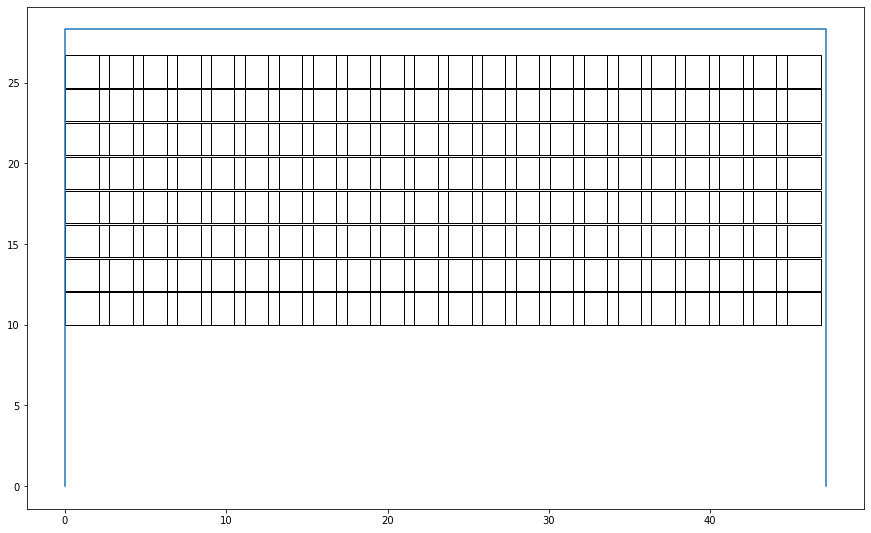

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 23.0
Optimal selection of seats (index):
0
3
15
18
21
28
32
66
69
81
94
97
100
106
109
154
157
160
163
166
169
172
175
room dimension (W x H) are [[47.16666667 28.3       ]]
seat dimension (W x H) are [[2.75 2.  ]]


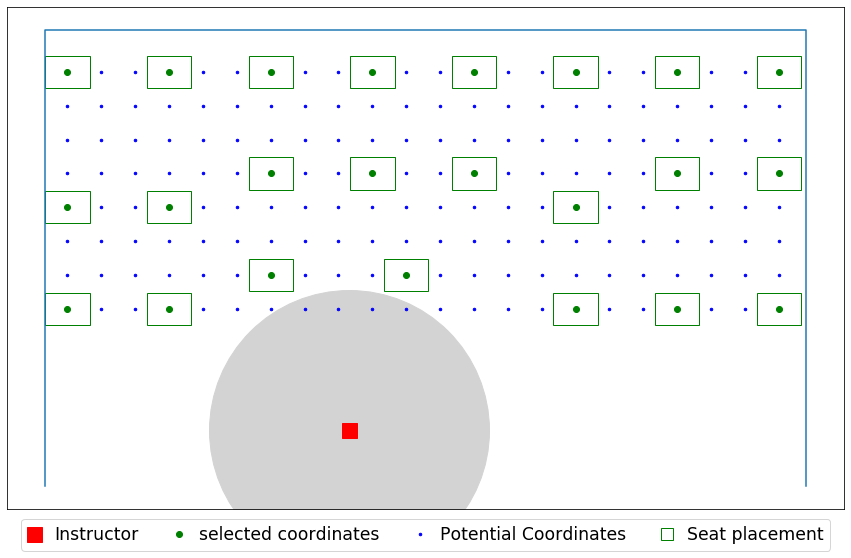

In [171]:
seat_loc = seat_coordinates(data_file, 2.1)

# for i in (6,8,12):
obj, selected = fixed_seats_model_ins(data_file,seat_radius=0, d0=6, d1 = 10)
pd.DataFrame(selected).to_csv('Skiles_202_'+ str(6) + 'ft_2ft_discretization_V2+V6_Instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig('Skiles_202_'+str(6)+'ft_2ft_discretization_V2_V6_instructor' + ".jpg", dpi=500)

In [170]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 0)
#         pd.DataFrame(selected).to_csv('Skiles_202_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig('Skiles_202_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        
    

TypeError: seat_coordinates() missing 1 required positional argument: 'discretization'

room dimension (W x H) are [[47.16666667 28.3       ]]
seat dimension (W x H) are [[2.75 2.  ]]
[(0, 0), (0, 28.3), (47.166666666666664, 28.3), (47.166666666666664, 0)]
Total number of seats  is 1215


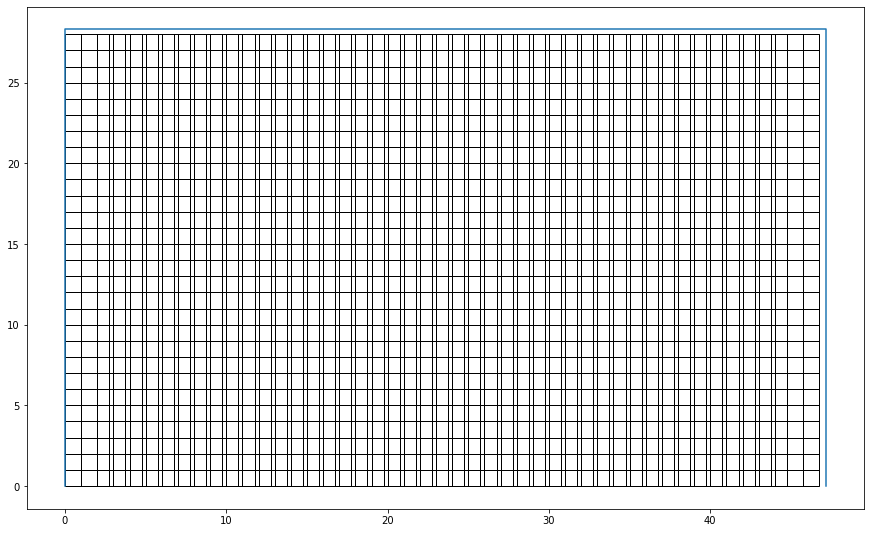

array([[ 1.375,  1.   ],
       [ 2.375,  1.   ],
       [ 3.375,  1.   ],
       ...,
       [43.375, 27.   ],
       [44.375, 27.   ],
       [45.375, 27.   ]])

In [142]:
seat_coordinates_type(data_file, 3)

room dimension (W x H) are [[47.16666667 28.3       ]]
seat dimension (W x H) are [[2.75 2.  ]]
[(0, 0), (0, 28.3), (47.166666666666664, 28.3), (47.166666666666664, 0)]
Total number of seats  is 1215


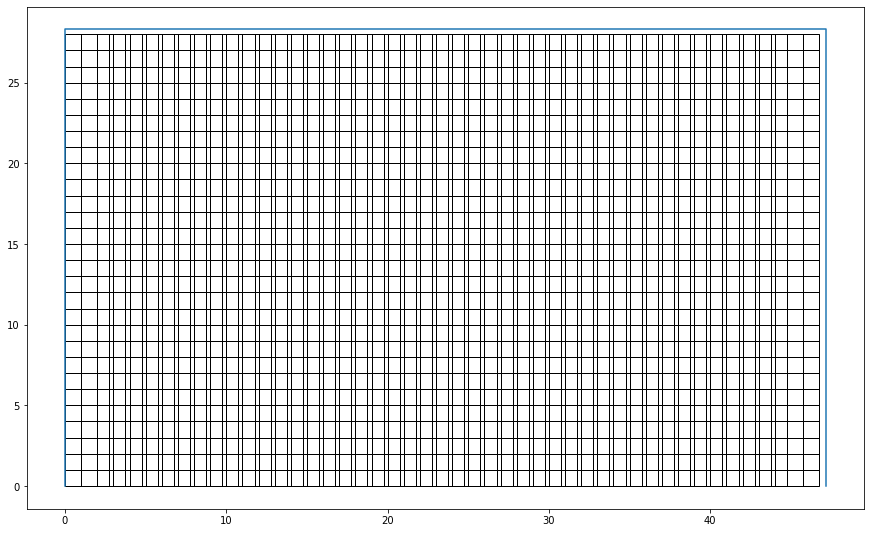

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 35.0
Optimal selection of seats (index):
0
7
28
34
44
219
270
276
297
303
404
488
505
540
568
601
607
674
725
753
900
910
916
922
938
944
973
1170
1176
1182
1188
1194
1202
1208
1214
room dimension (W x H) are [[47.16666667 28.3       ]]
seat dimension (W x H) are [[2.75 2.  ]]


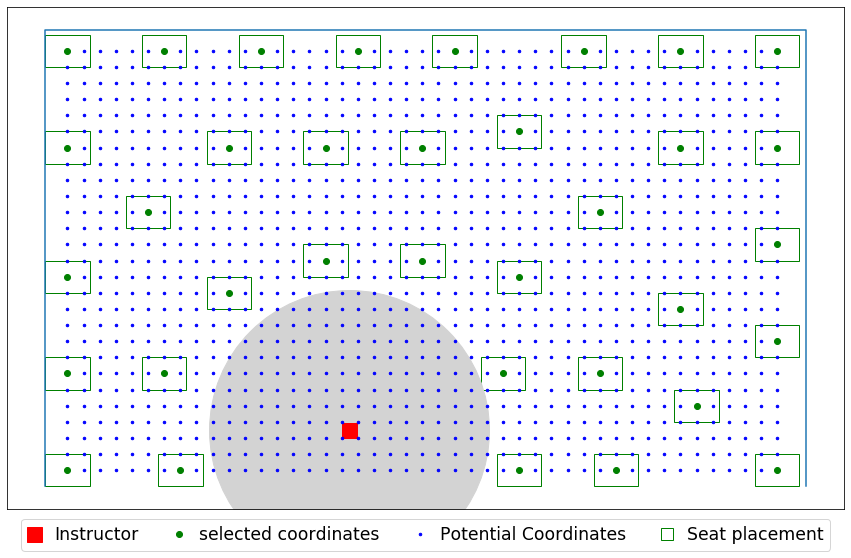

In [145]:
seat_loc = seat_coordinates_type(data_file, 3)

obj, selected = fixed_seats_model_ins(data_file,seat_radius=0, d0=6, d1 = 10)

plot_layout_result_granularity(data_file, seat_radius=0, seat_circle_radius=0)


## LOve 185 Capacity = 104

In [123]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_185.xlsx'

room dimension (W x H) are [[36.5        47.33333333]]
seat dimension (W x H) are [[3.41 2.04]]
[(0, 10), (36.5, 10), (36.5, 47.333333333333336), (0, 47.333333333333336)]
Total number of seats  is 1224


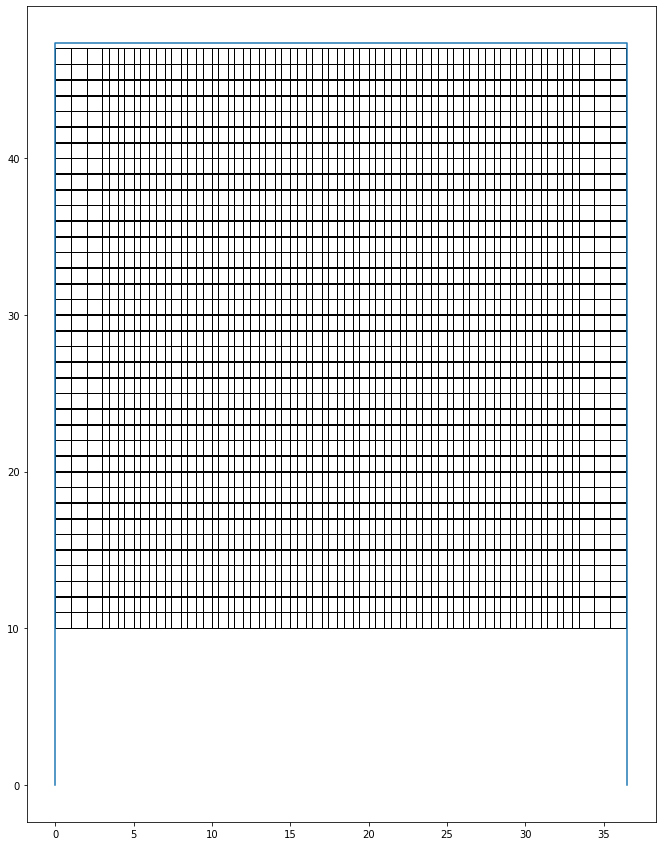

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 25.0
Optimal selection of seats (index):
0
8
17
25
33
272
280
289
297
305
544
552
561
569
577
816
824
833
841
849
1088
1096
1105
1113
1121
room dimension (W x H) are [[36.5        47.33333333]]
seat dimension (W x H) are [[3.41 2.04]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 27.0
Optimal selection of seats (index):
0
8
16
24
33
242
250
258
266
476
484
492
500
508
718
726
734
742
952
960
968
976
984
1194
1202
1210
1218
room dimension (W x H) are [[36.5        47.33333333]]
seat dimension (W x H) are [[3.41 2.04]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 40.0
Optimal selection of seats (index):
0
6
12
21
27
33
204
210
216
223
231
237
397
408
414
425
441
556
571
599
612
618
645
730
776
792
804
820
917
966
986
994
1007
1013
1190
1196
1202
1211
1217
1223
room dimension (W x H) are [[36.5        47.33333333]]
seat dimension (W x H) are [[3.41

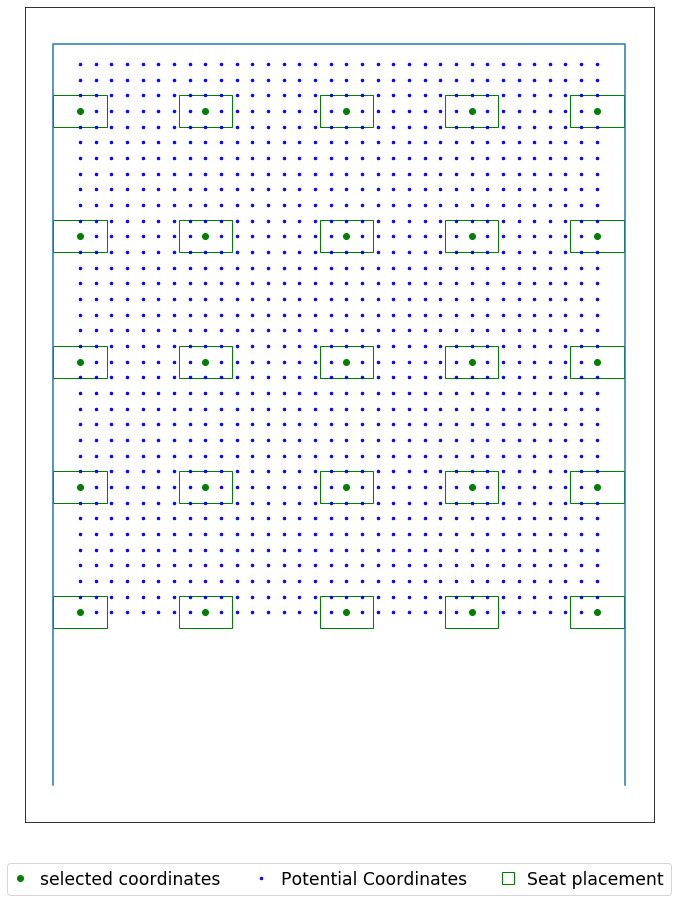

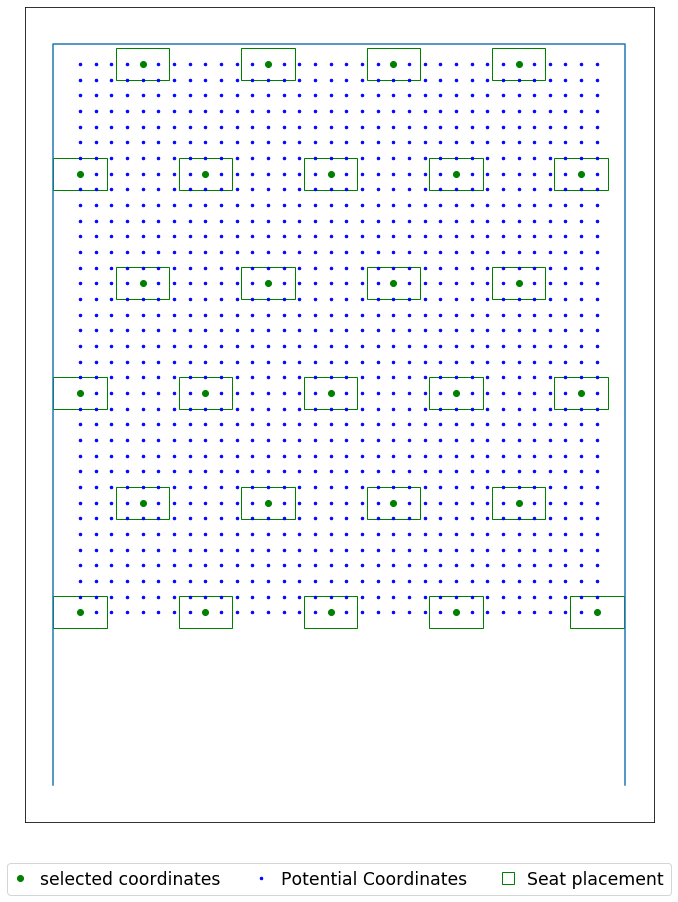

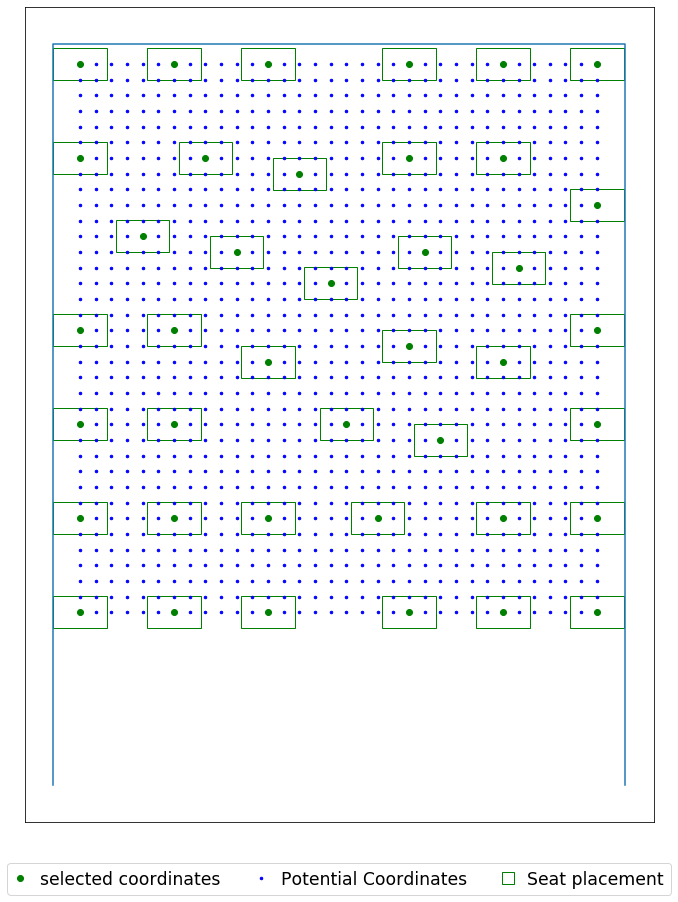

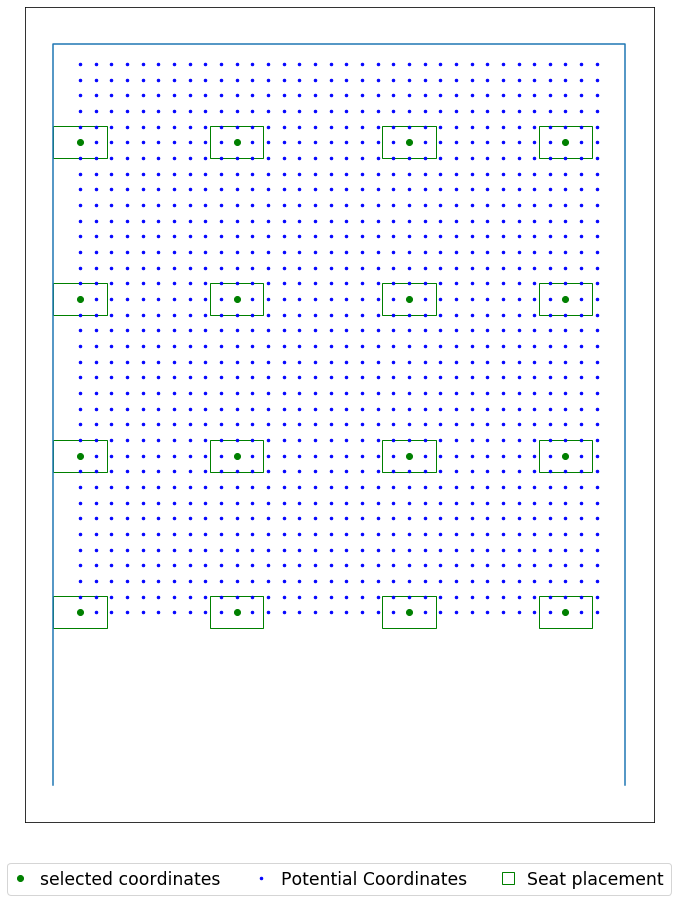

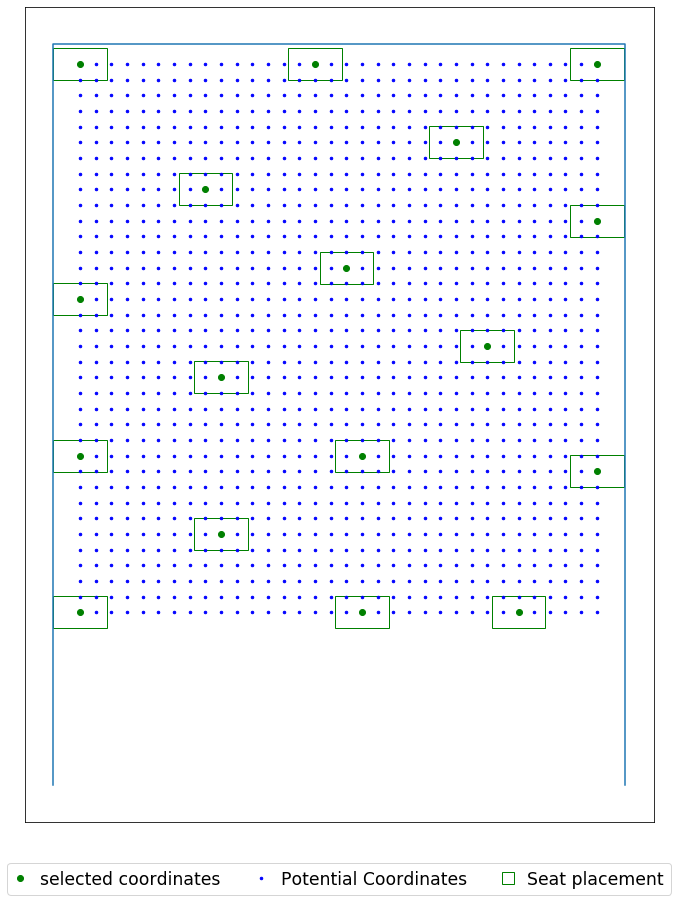

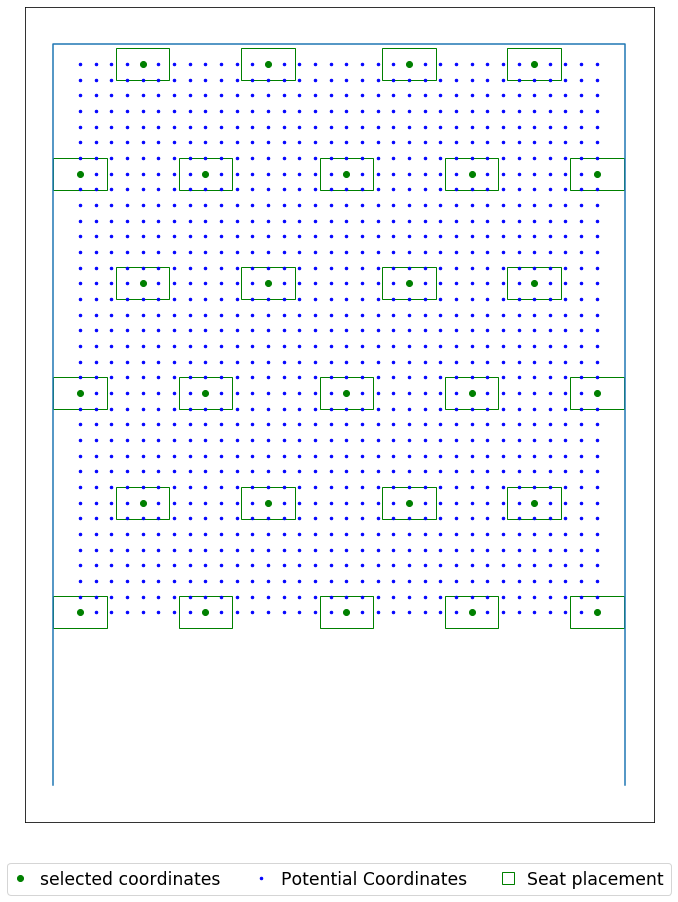

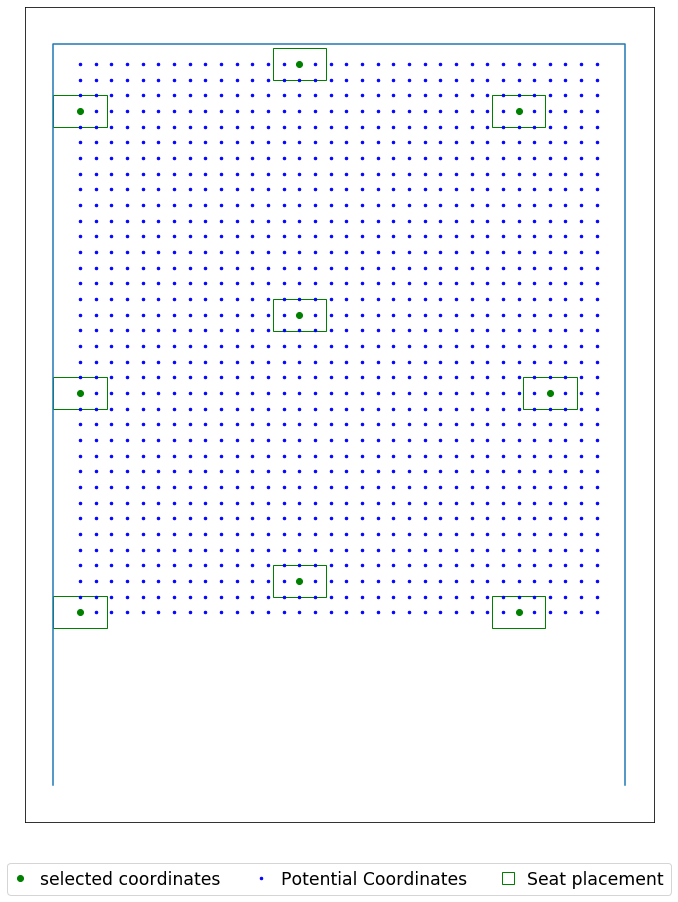

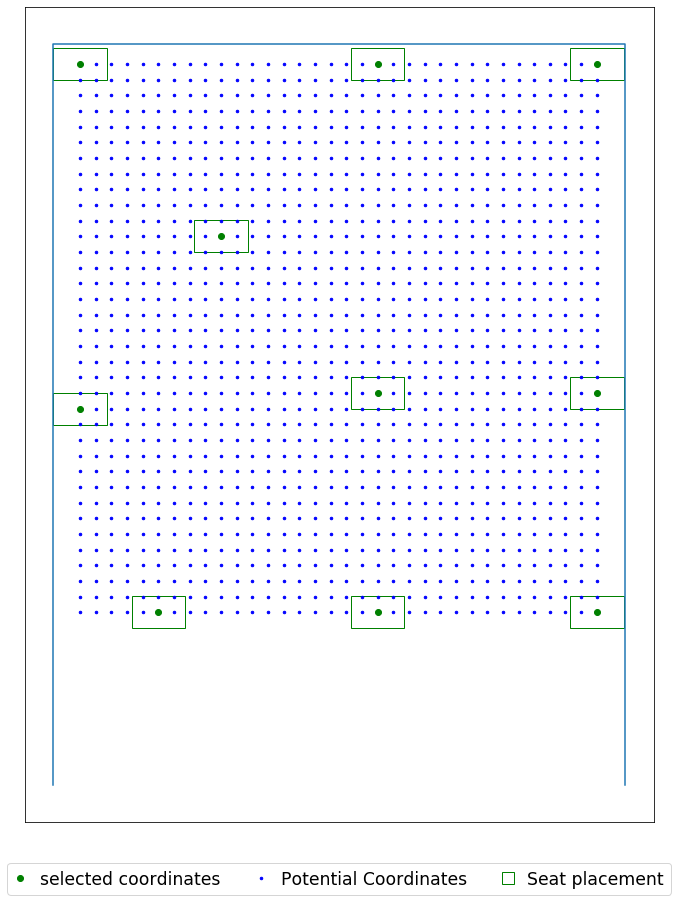

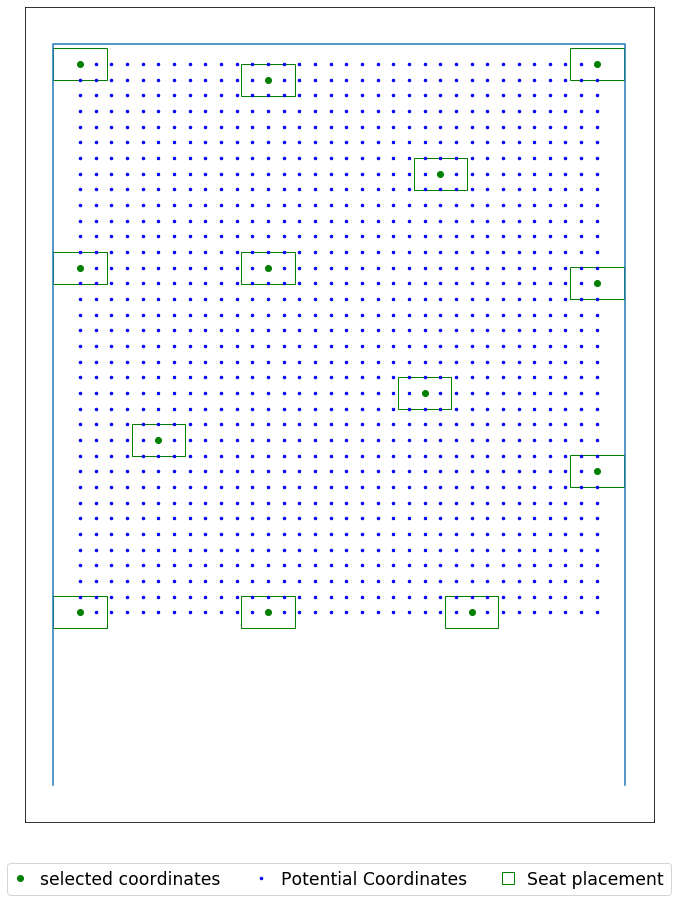

In [124]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 0)
        pd.DataFrame(selected).to_csv('Skiles_185_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Skiles_185_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        
    

## Skiles 170 Capacity = 40

In [126]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_170.xlsx'

room dimension (W x H) are [[19.08333333 35.        ]]
seat dimension (W x H) are [[2.19 2.09]]
[(0, 10), (19.083333333333332, 10), (19.083333333333332, 35.0), (0, 35.0)]
Total number of seats  is 391


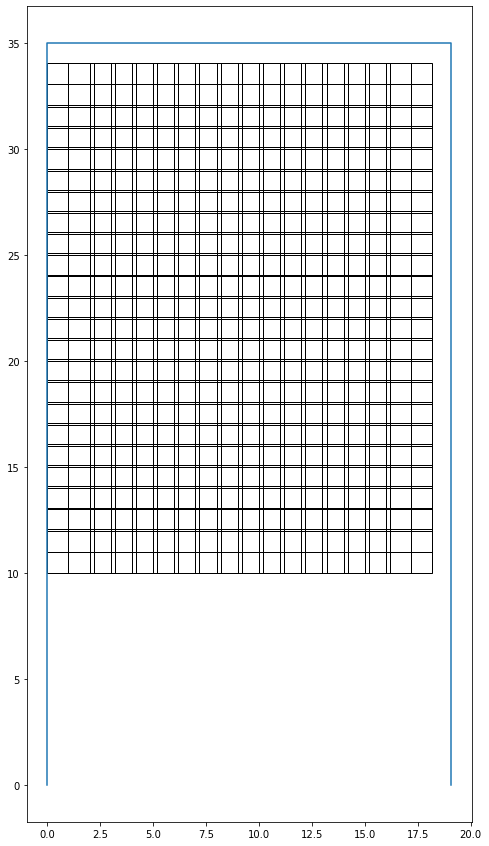

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
67
136
144
203
272
280
339
room dimension (W x H) are [[19.08333333 35.        ]]
seat dimension (W x H) are [[2.19 2.09]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
16
123
131
238
246
254
374
382
390
room dimension (W x H) are [[19.08333333 35.        ]]
seat dimension (W x H) are [[2.19 2.09]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 14.0
Optimal selection of seats (index):
0
6
12
101
102
108
181
204
244
254
306
317
379
390
room dimension (W x H) are [[19.08333333 35.        ]]
seat dimension (W x H) are [[2.19 2.09]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
6
16
214
221
373
380
room dimension (W x H) are [[19.08333333 35.        ]]
seat dimension (W x H) are [[2.19 2.09]]


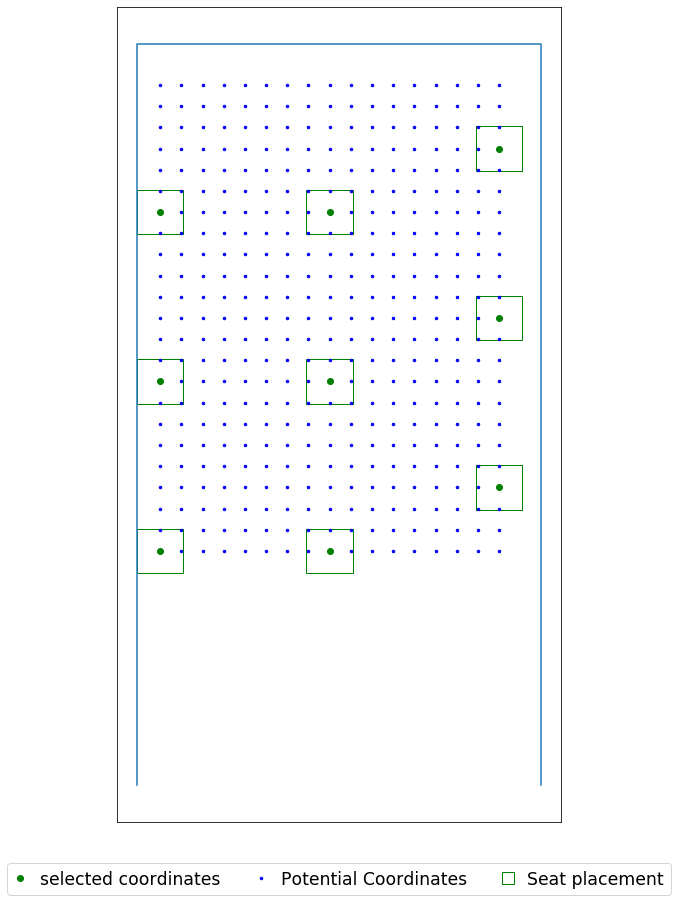

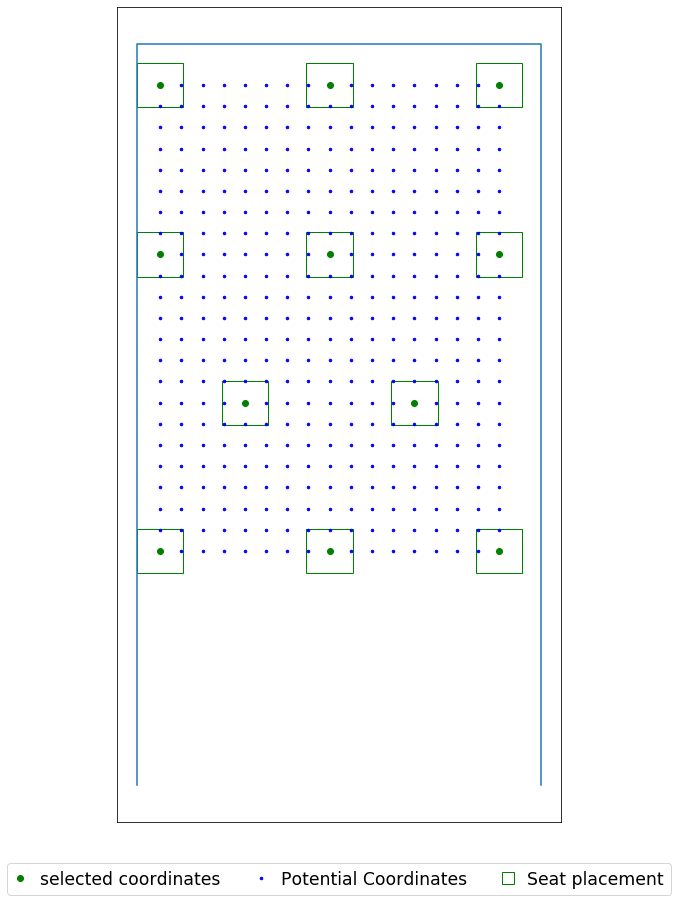

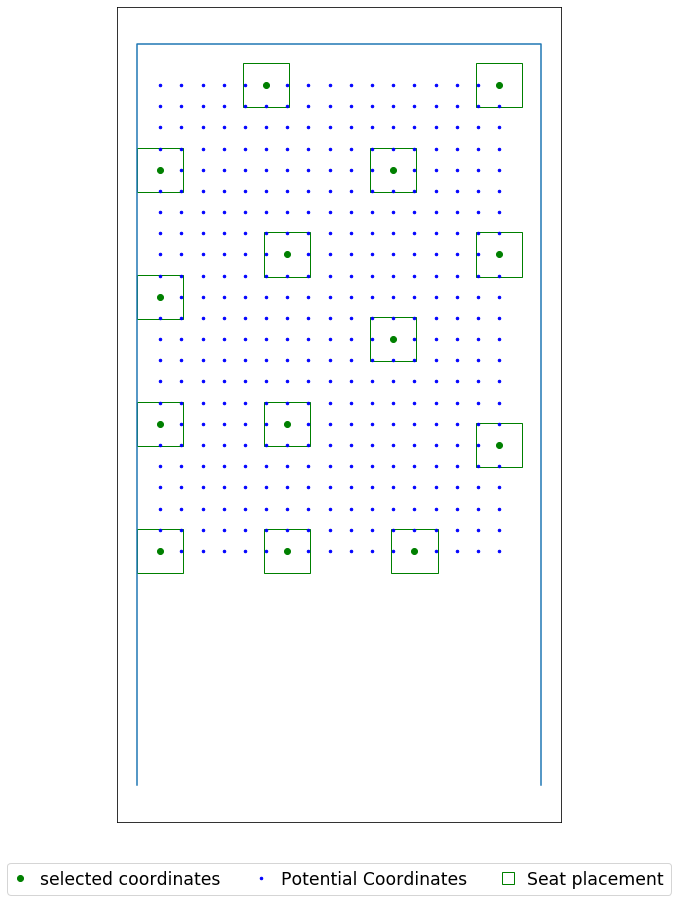

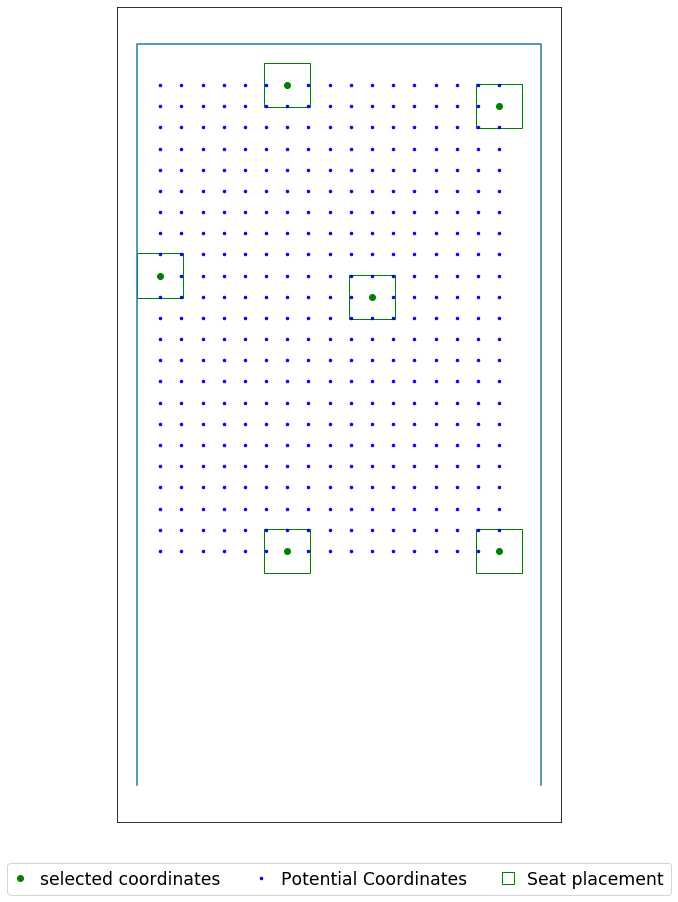

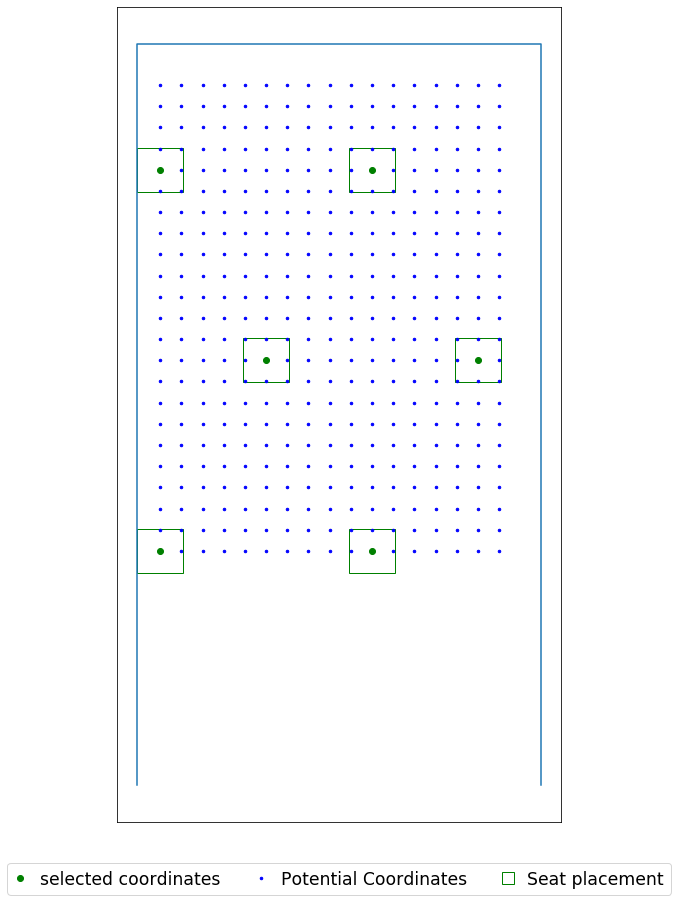

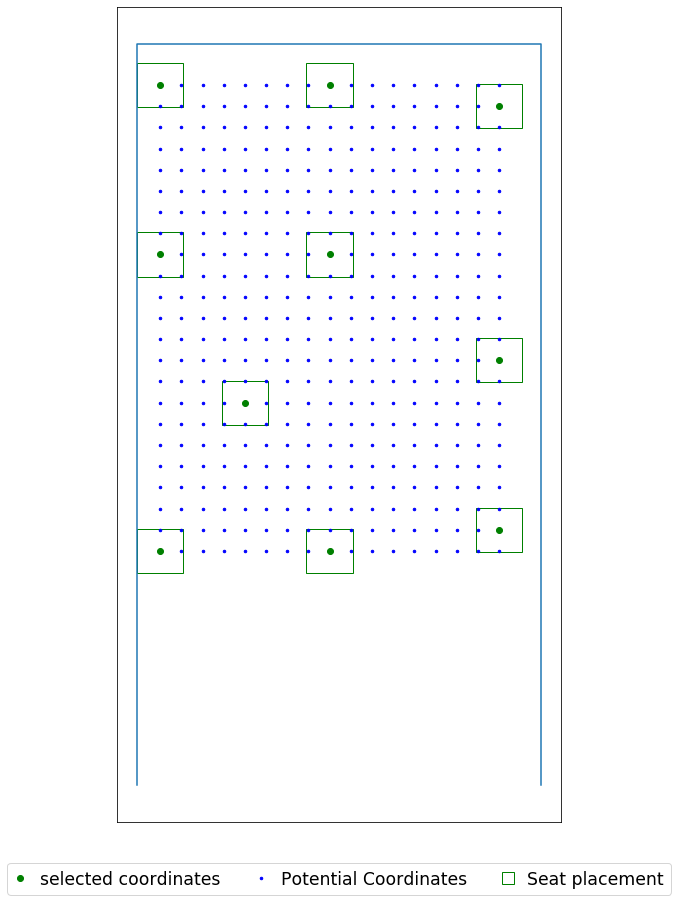

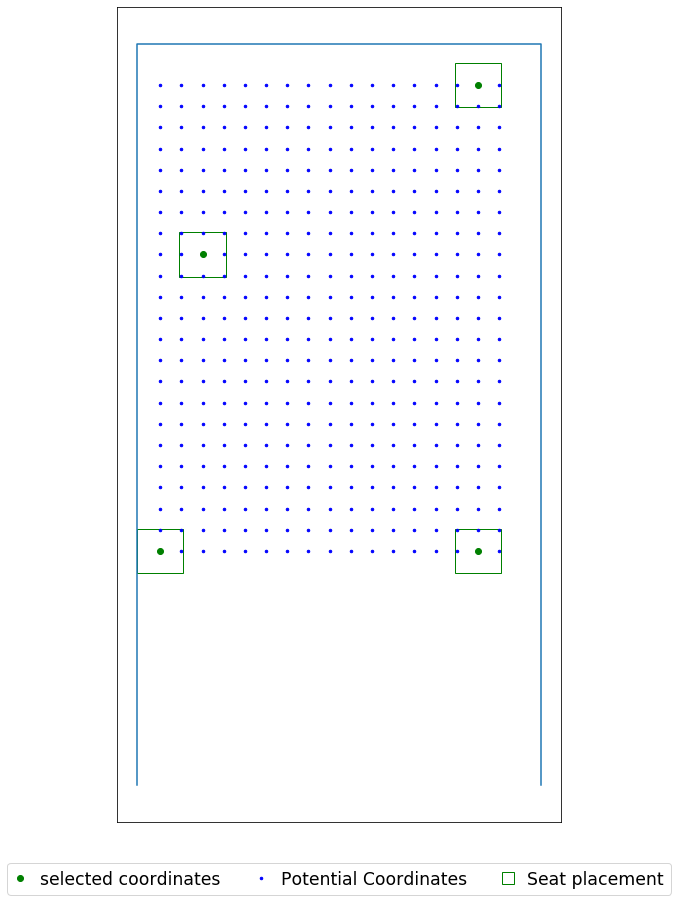

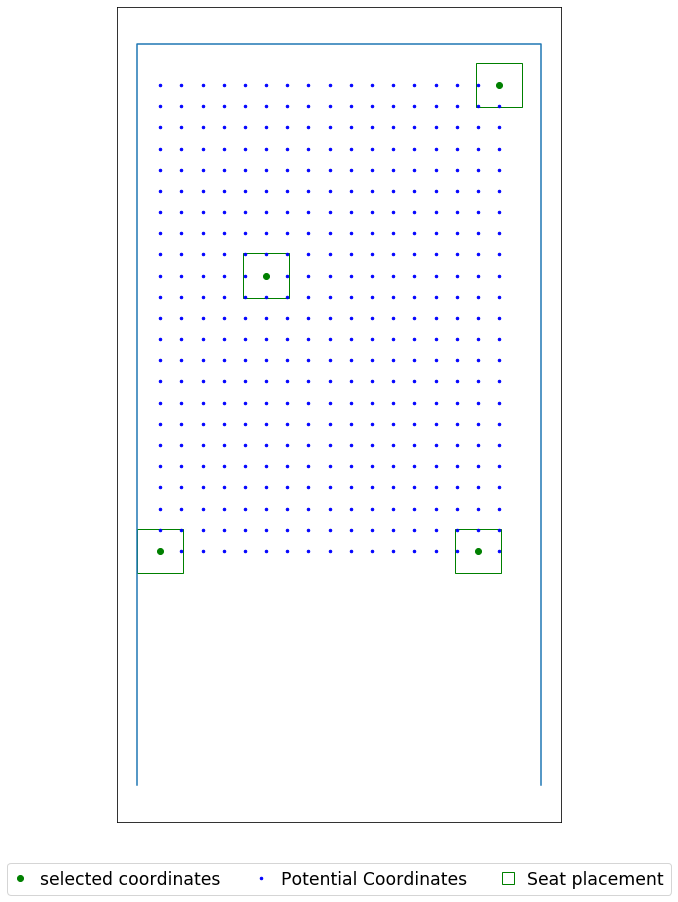

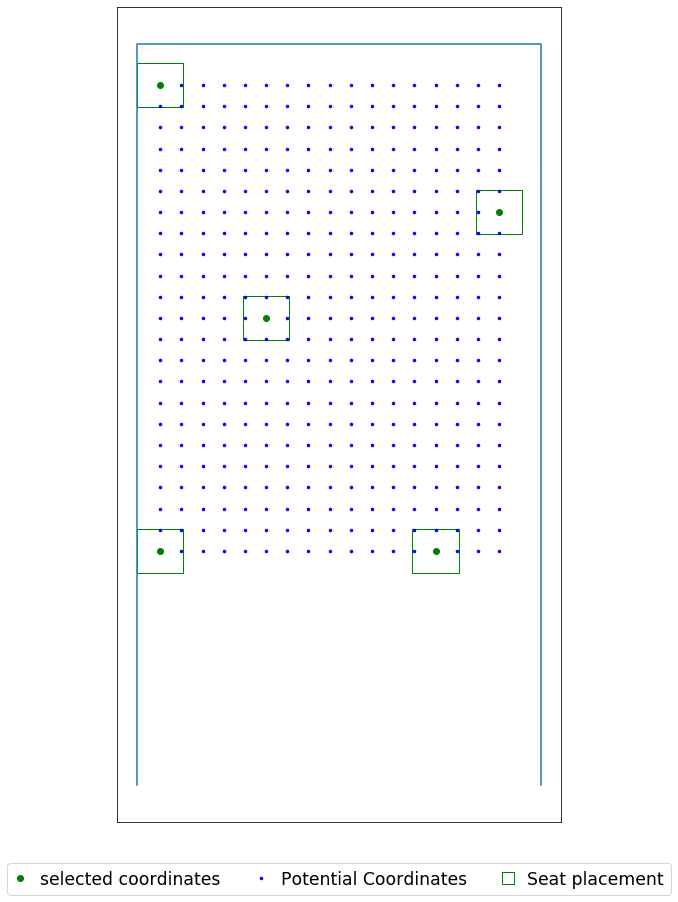

In [127]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 0)
        pd.DataFrame(selected).to_csv('Skiles_170_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Skiles_170_'+str(i)+'ft_seatR'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        
    

## Bunger 380 Capacity =  57

In [128]:
data_file = r'C:\Users\yoges\Desktop\Input\Bunger_380.xlsx'

room dimension (W x H) are [[37.16666667 28.66666667]]
seat dimension (W x H) are [[2.5 2. ]]
[(0, 10), (37.166666666666664, 10), (37.166666666666664, 28.666666666666668), (0, 28.666666666666668)]
Total number of seats  is 595


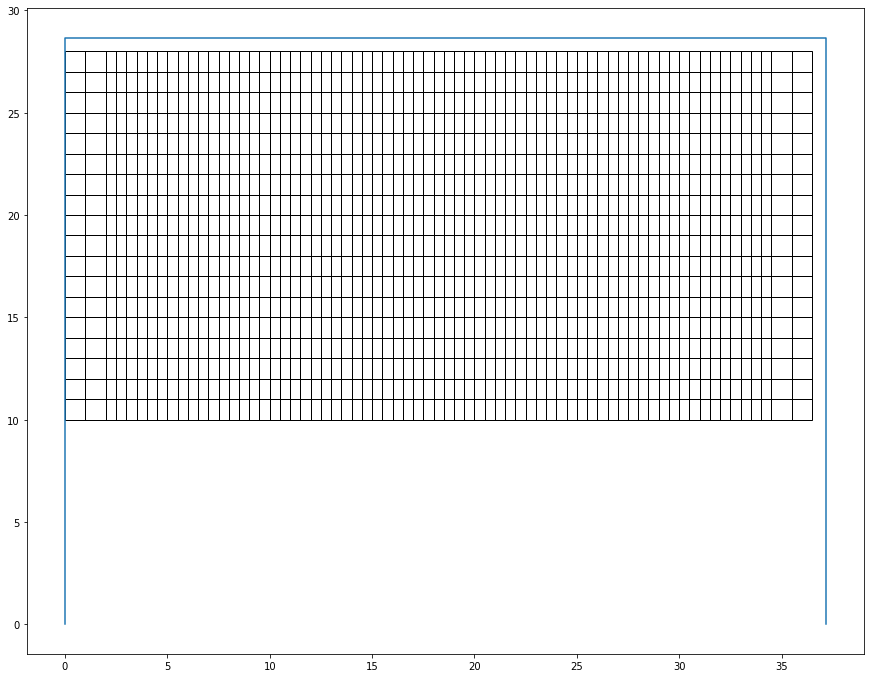

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
8
16
24
32
280
288
296
304
312
560
568
576
584
592
room dimension (W x H) are [[37.16666667 28.66666667]]
seat dimension (W x H) are [[2.5 2. ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
8
18
26
34
280
288
296
306
314
560
568
576
584
594
room dimension (W x H) are [[37.16666667 28.66666667]]
seat dimension (W x H) are [[2.5 2. ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 21.0
Optimal selection of seats (index):
0
6
16
22
28
34
151
228
236
244
280
356
363
407
415
560
566
572
578
586
594
room dimension (W x H) are [[37.16666667 28.66666667]]
seat dimension (W x H) are [[2.5 2. ]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
20
30
350
360
370
380
room dimension (W x H) are [[37.16

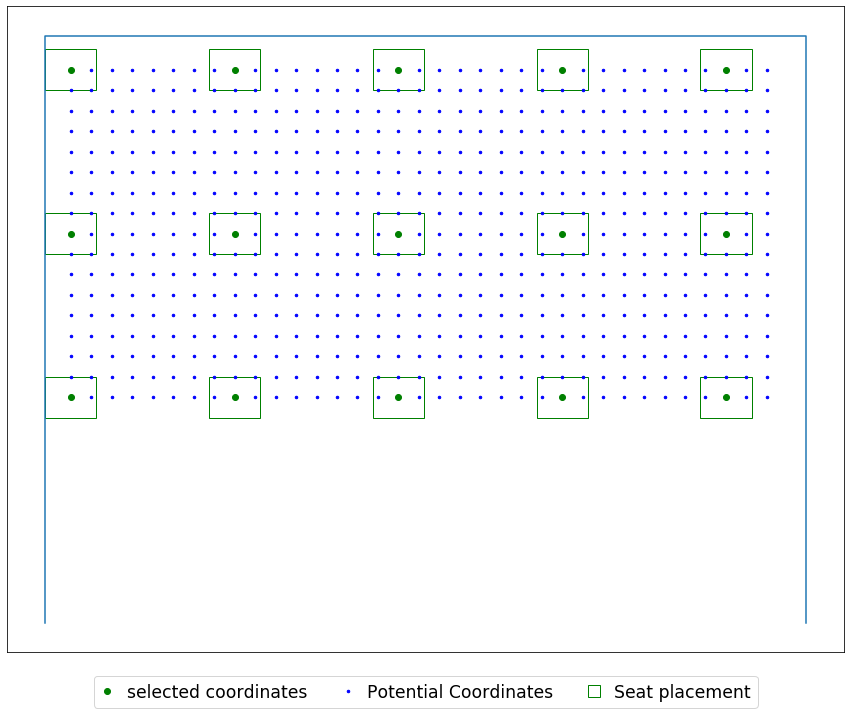

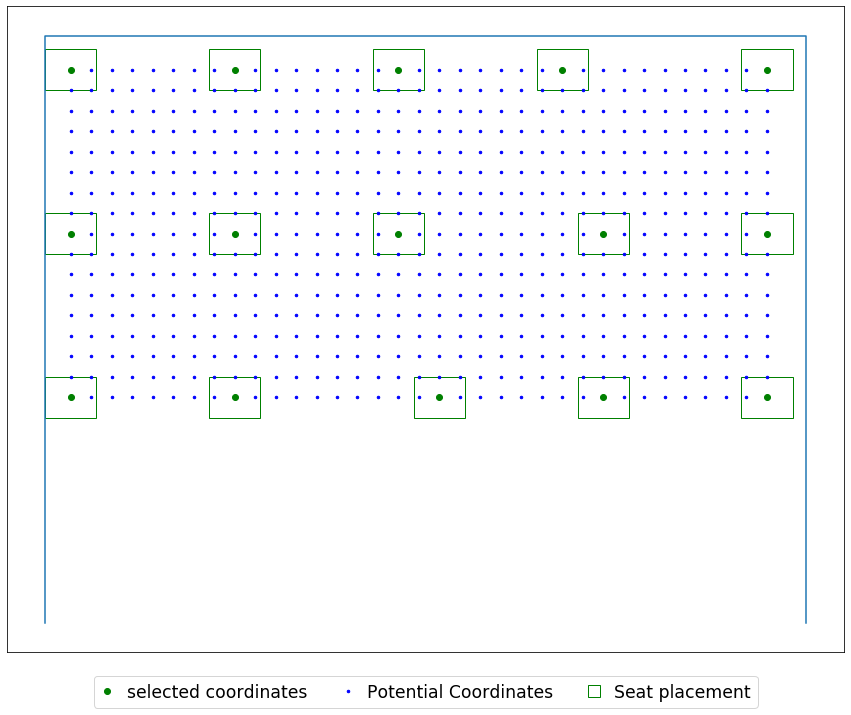

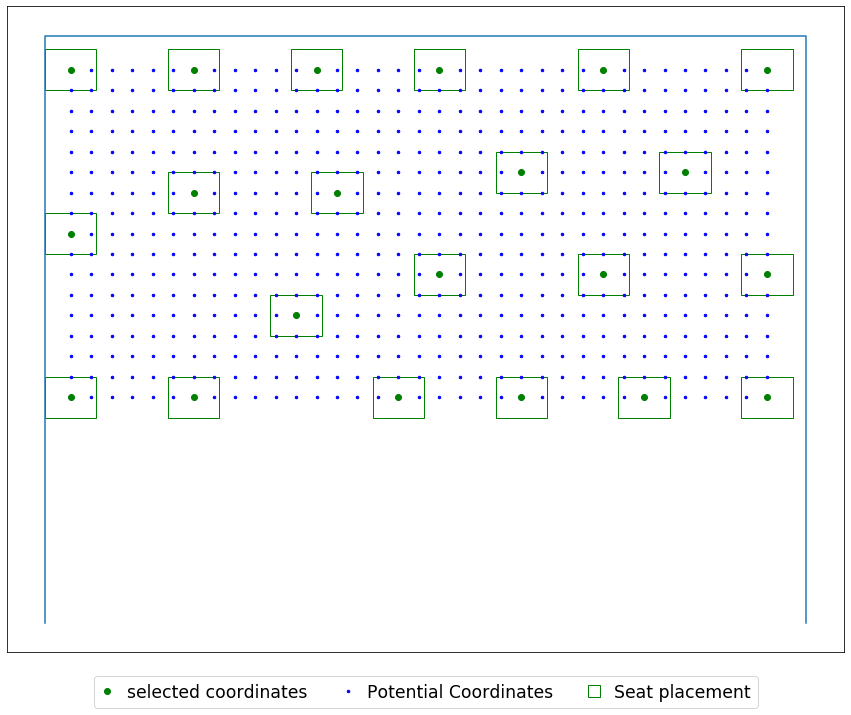

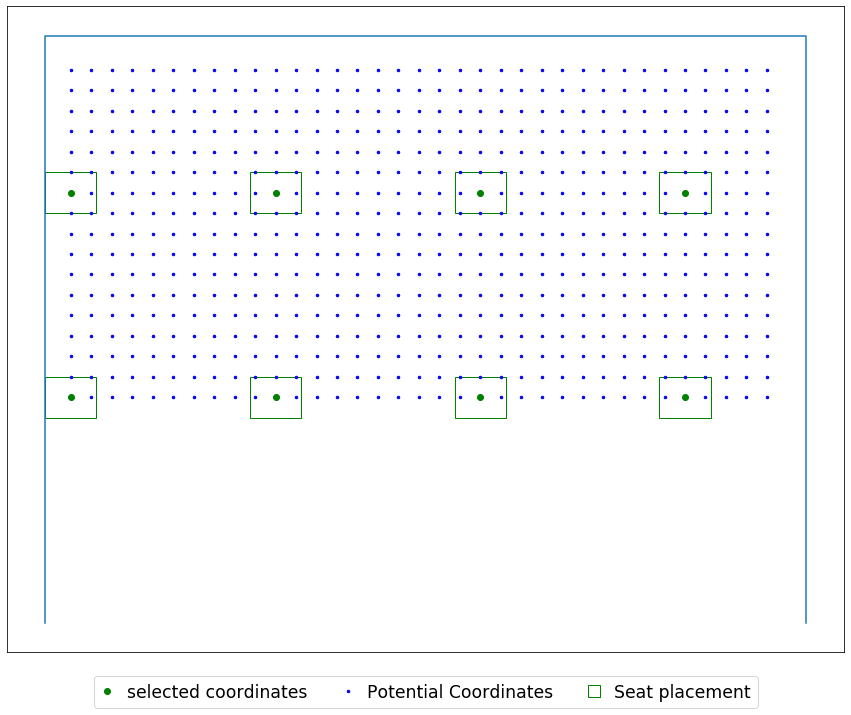

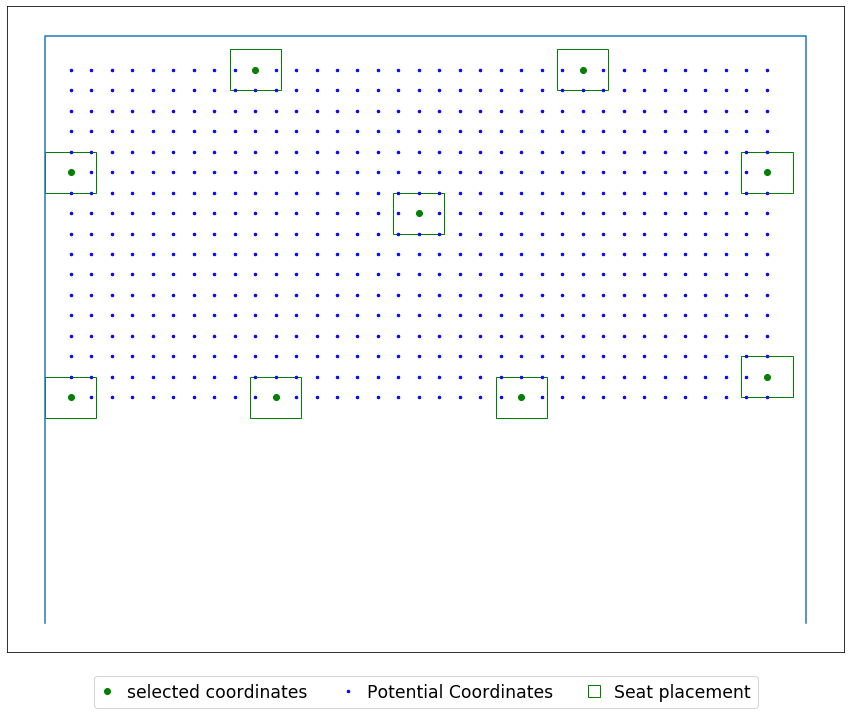

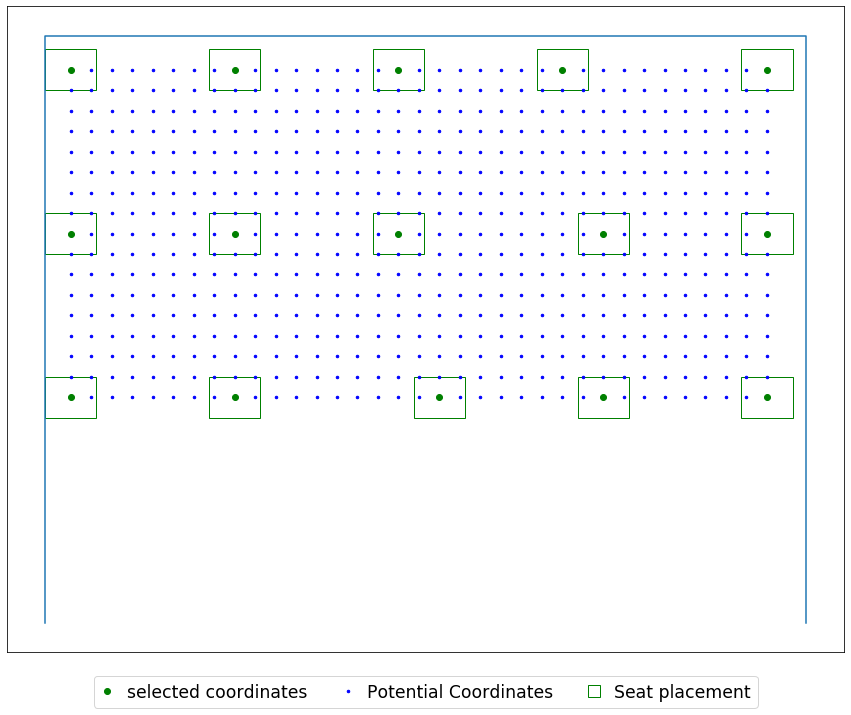

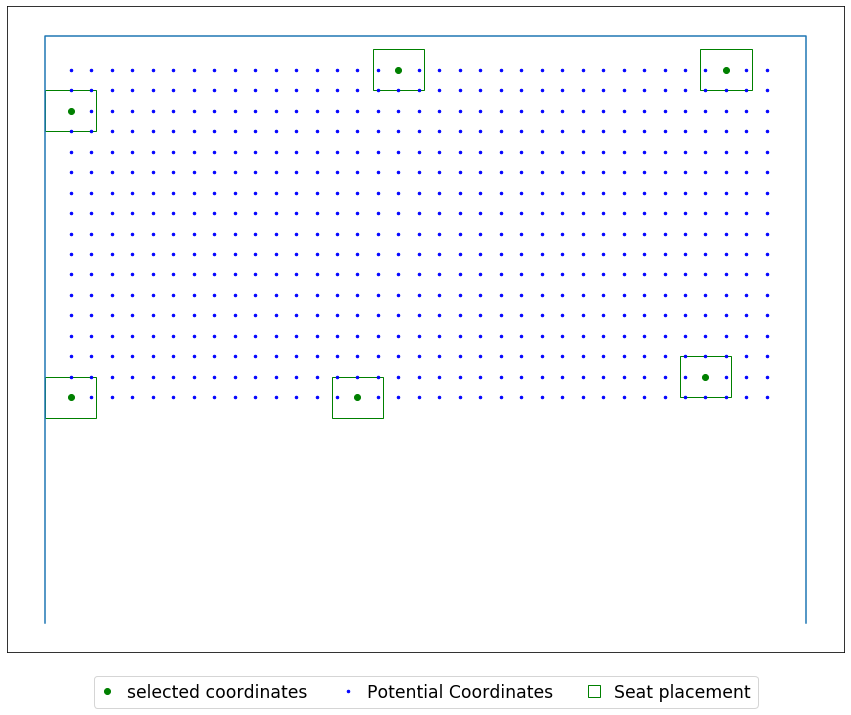

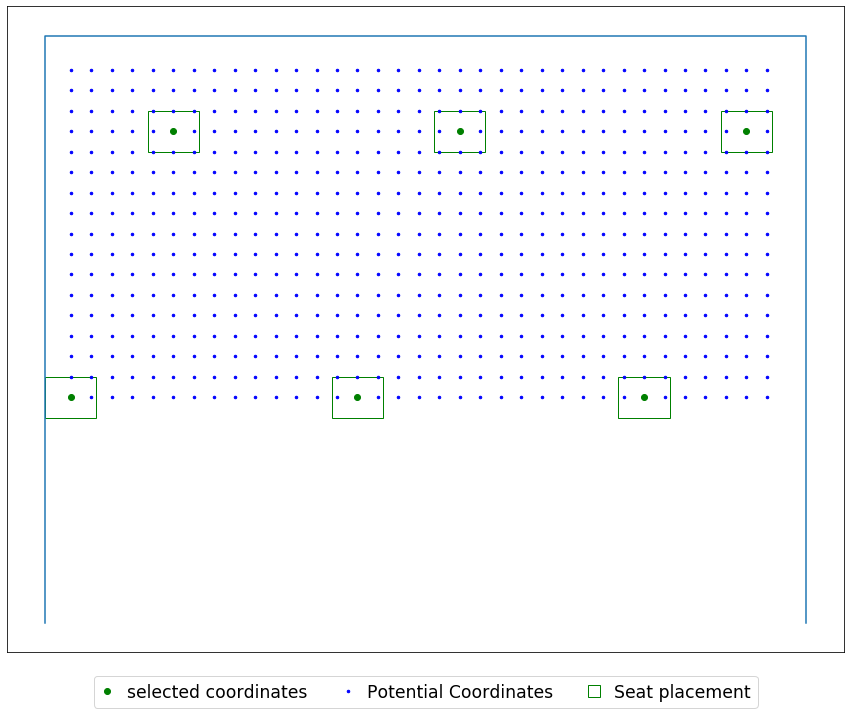

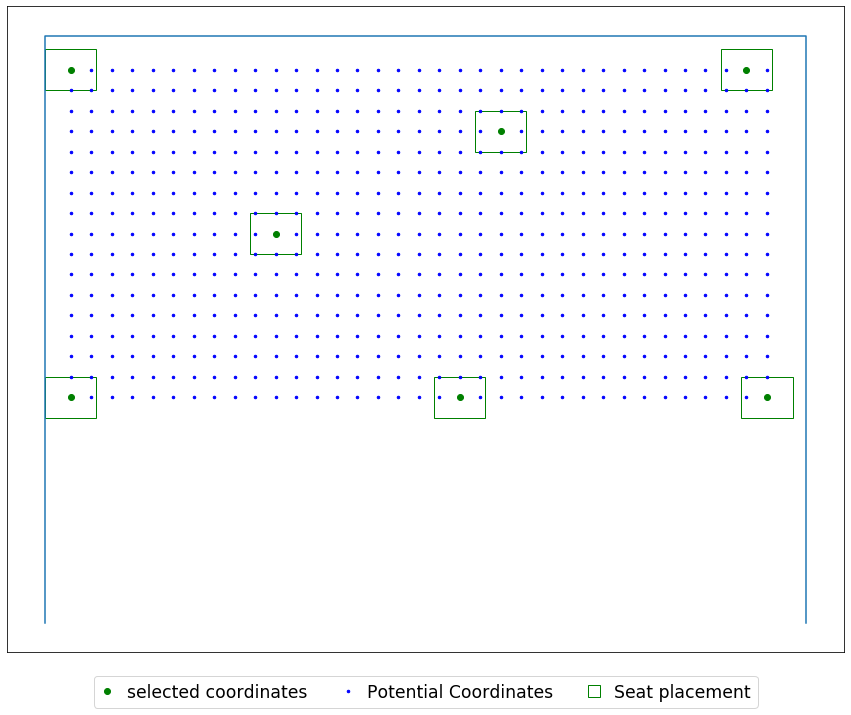

In [129]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 0)
        pd.DataFrame(selected).to_csv('Bunger_380_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Bunger_380_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        

## COC 53 Caapcity = 31

In [130]:
data_file = r'C:\Users\yoges\Desktop\Input\COC_53.xlsx'

room dimension (W x H) are [[23.33333333 28.16666667]]
seat dimension (W x H) are [[2.1  1.61]]
[(0, 10), (23.333333333333332, 10), (23.333333333333332, 28.166666666666668), (0, 28.166666666666668)]
Total number of seats  is 374


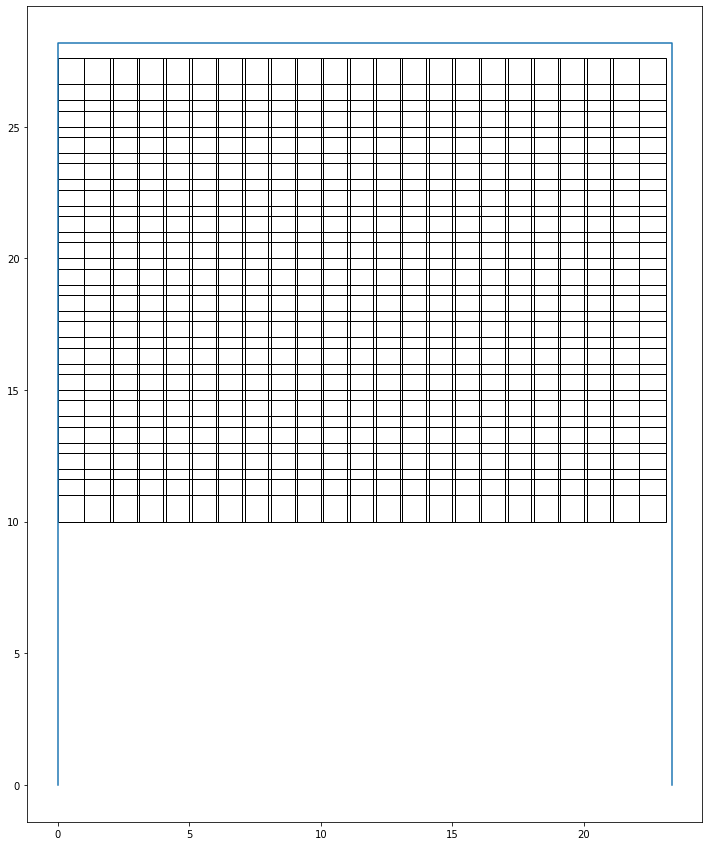

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
19
176
184
192
352
360
368
room dimension (W x H) are [[23.33333333 28.16666667]]
seat dimension (W x H) are [[2.1  1.61]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
14
95
109
176
190
271
285
352
366
room dimension (W x H) are [[23.33333333 28.16666667]]
seat dimension (W x H) are [[2.1  1.61]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 14.0
Optimal selection of seats (index):
0
11
21
94
125
132
153
225
231
259
352
358
364
373
room dimension (W x H) are [[23.33333333 28.16666667]]
seat dimension (W x H) are [[2.1  1.61]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
10
20
220
230
240
room dimension (W x H) are [[23.33333333 28.16666667]]
seat dimension (W x H) are [[2.1  1.61]]
The 

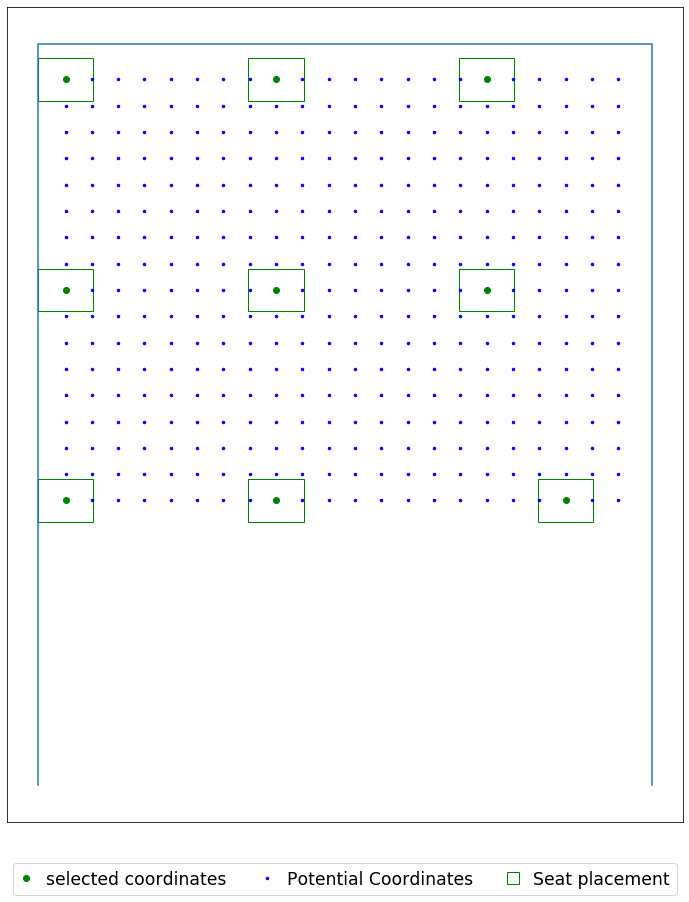

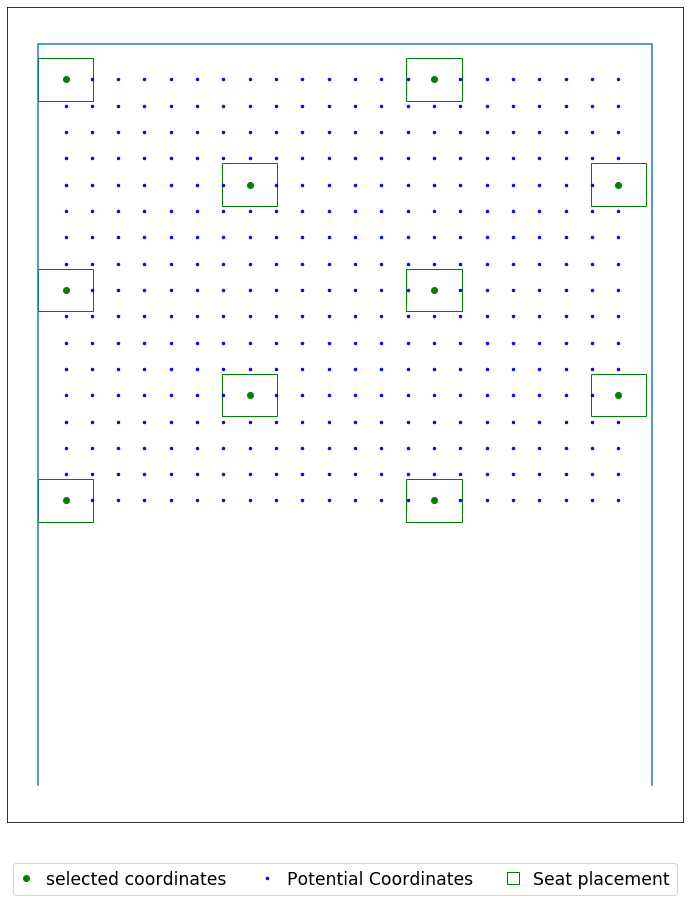

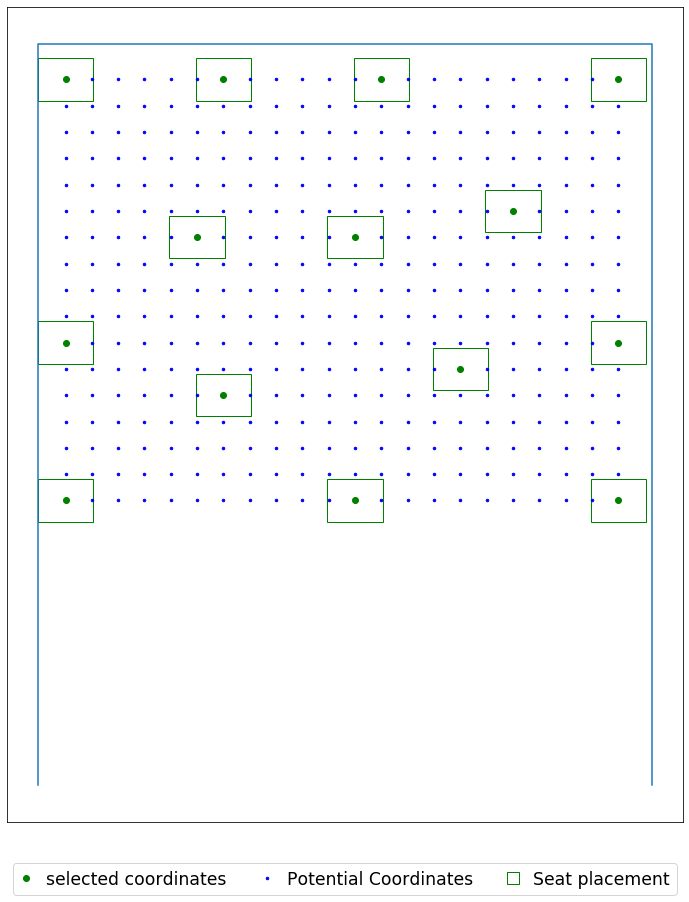

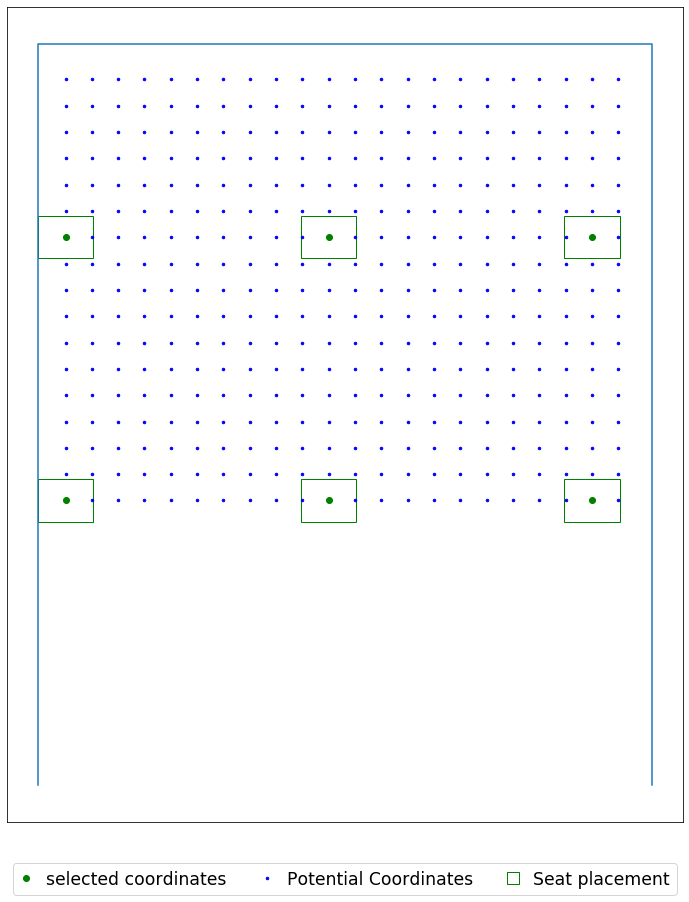

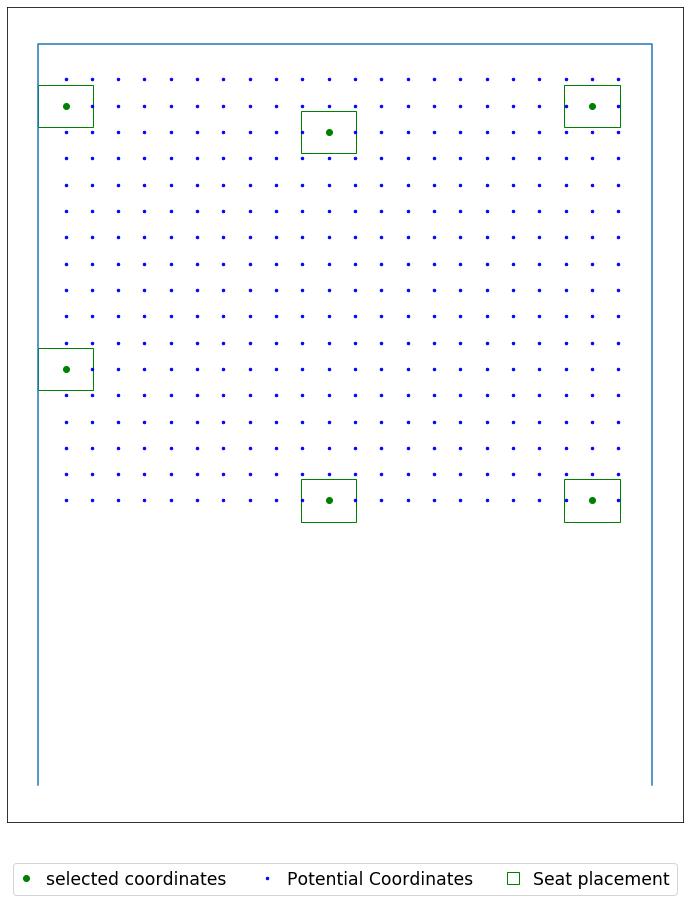

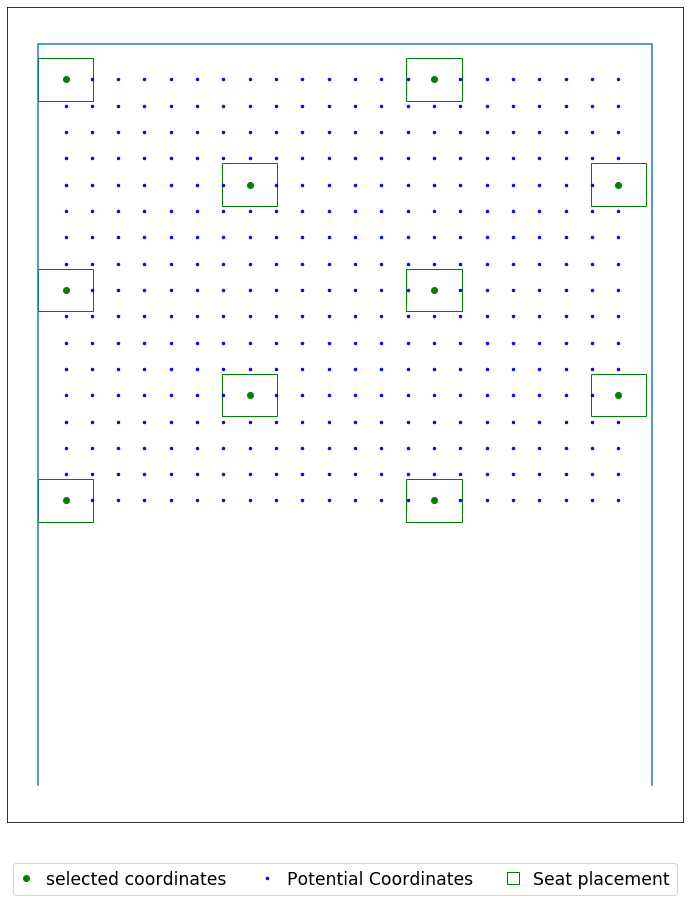

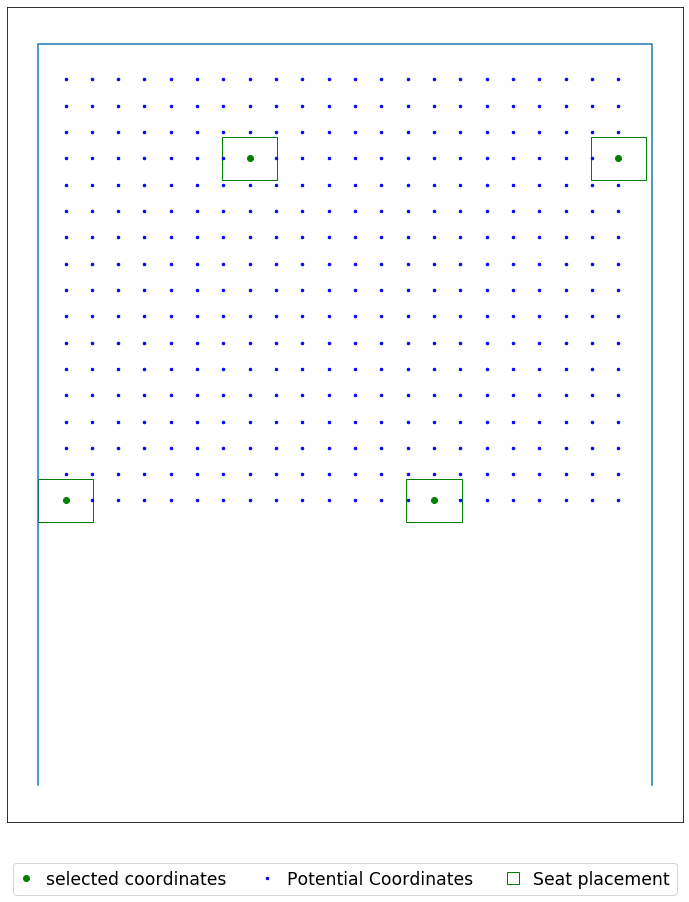

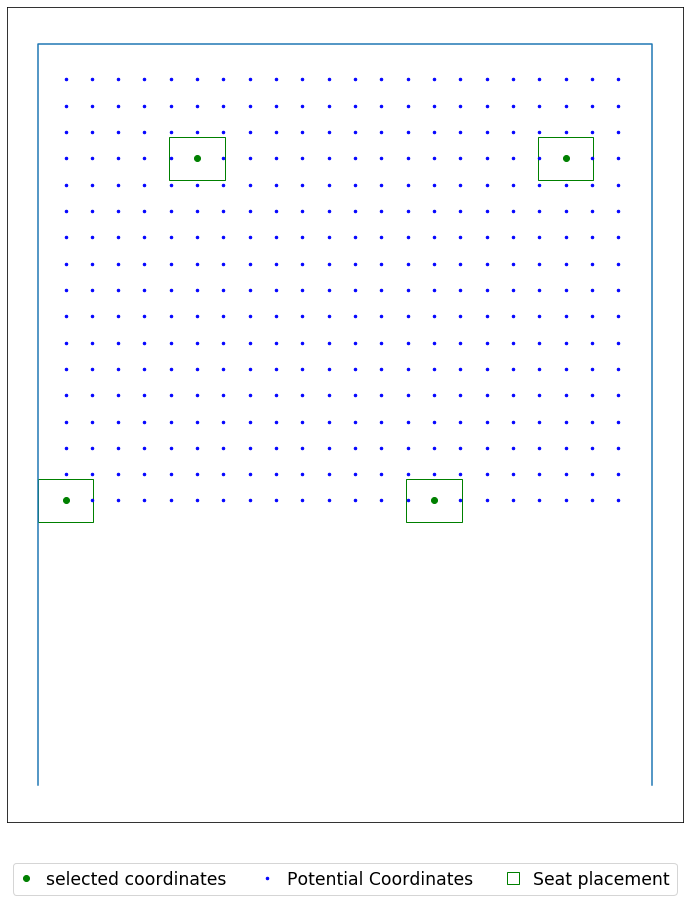

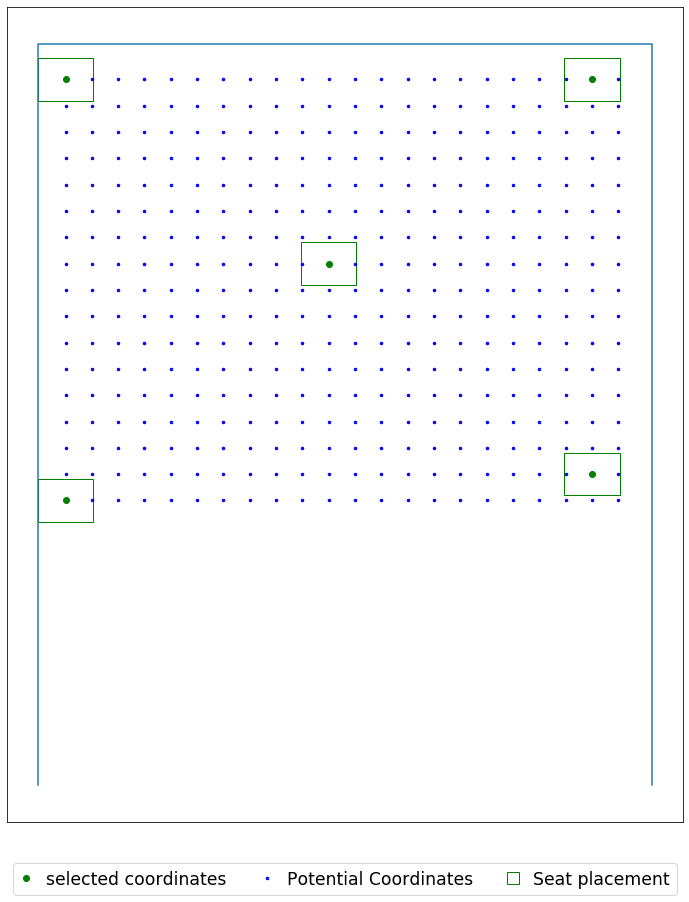

In [131]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 0)
        pd.DataFrame(selected).to_csv('COC_53_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('COC_53_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)
        

## Howey N210 Capcity : 36

In [32]:
data_file = r'C:\Users\yoges\Desktop\Input\081_Howey_N210.xlsx'

room dimension (W x H) are [[19.66666667 23.66666667]]
seat dimension (W x H) are [[2.75 2.25]]
[(0, 10), (19.666666666666668, 10), (19.666666666666668, 23.666666666666668), (0, 23.666666666666668)]
Total number of seats  is 782


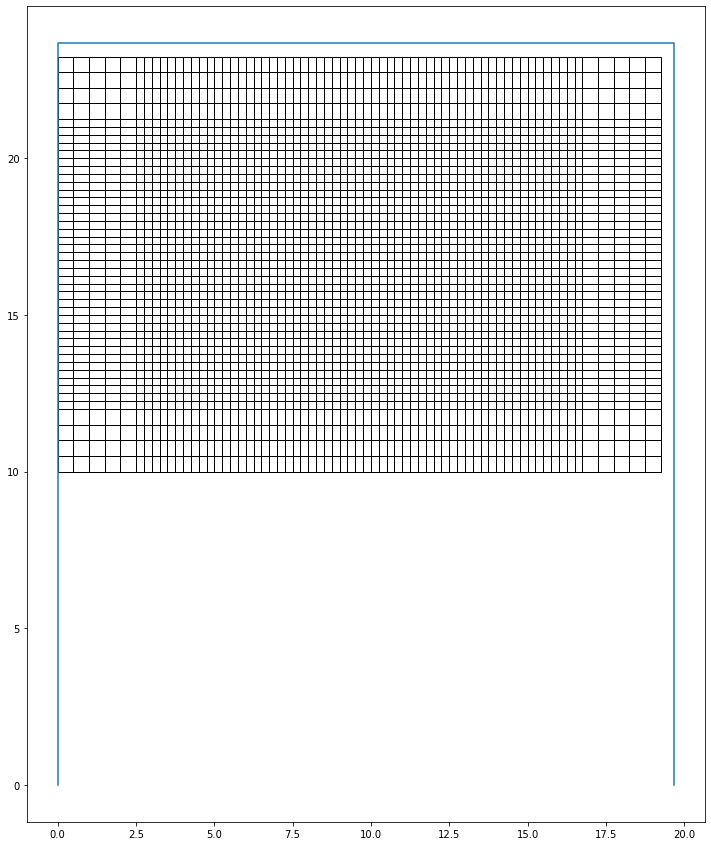

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
17
33
102
577
628
748
room dimension (W x H) are [[19.66666667 23.66666667]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
15
33
102
526
748
780
room dimension (W x H) are [[19.66666667 23.66666667]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
33
55
74
388
402
442
756
769
781
room dimension (W x H) are [[19.66666667 23.66666667]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
12
32
612
668
room dimension (W x H) are [[19.66666667 23.66666667]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:


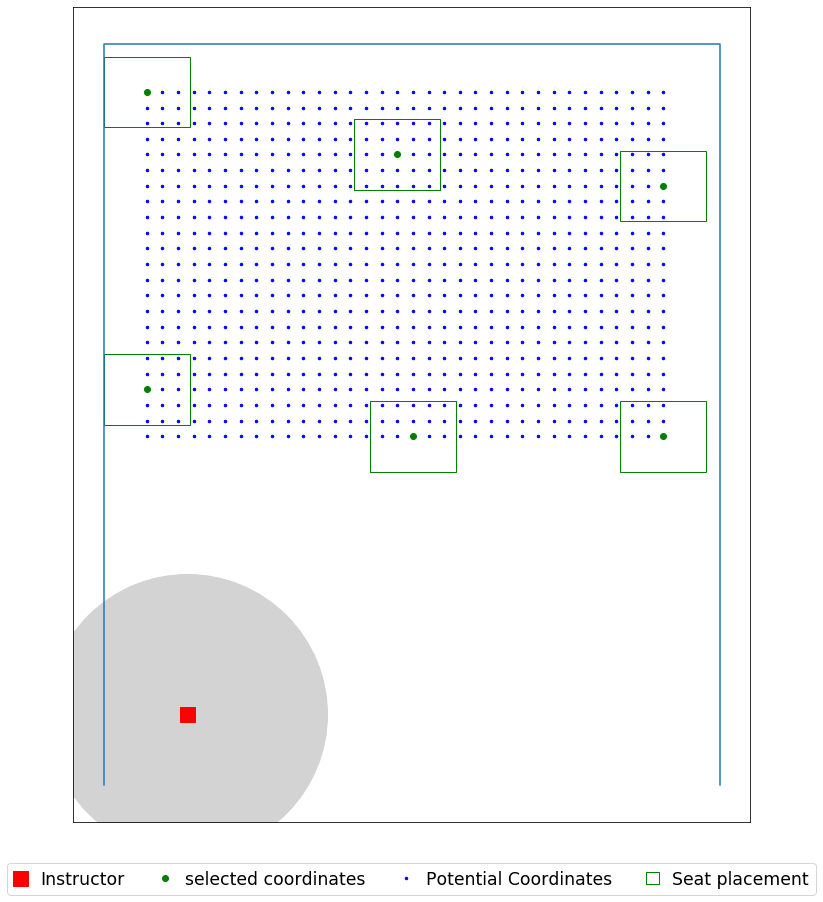

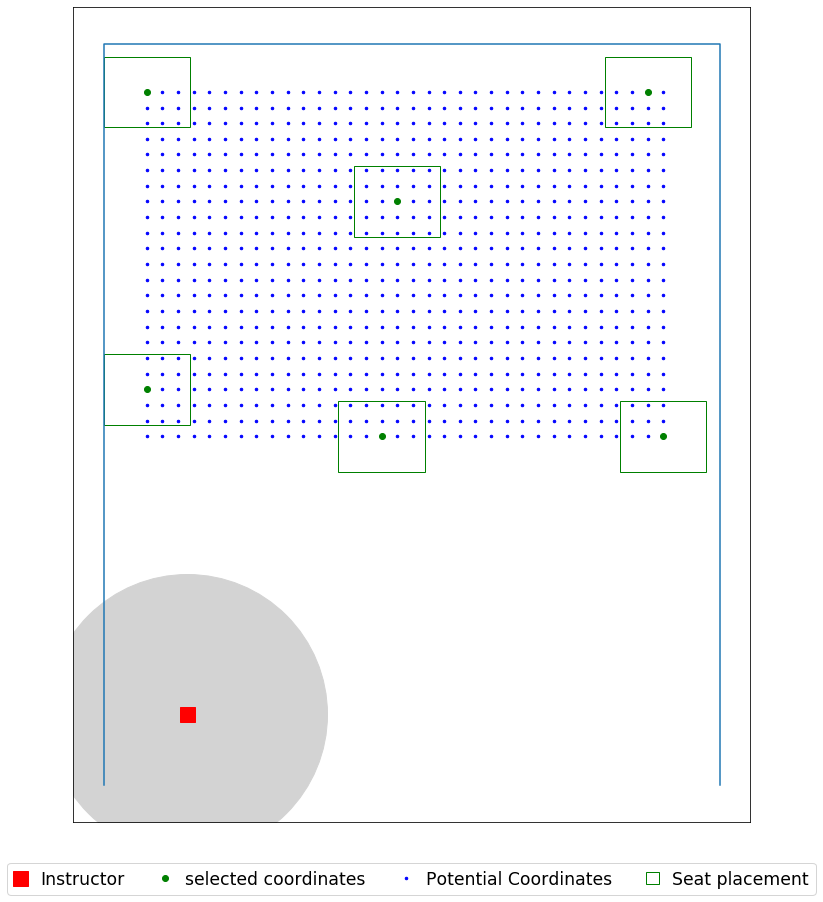

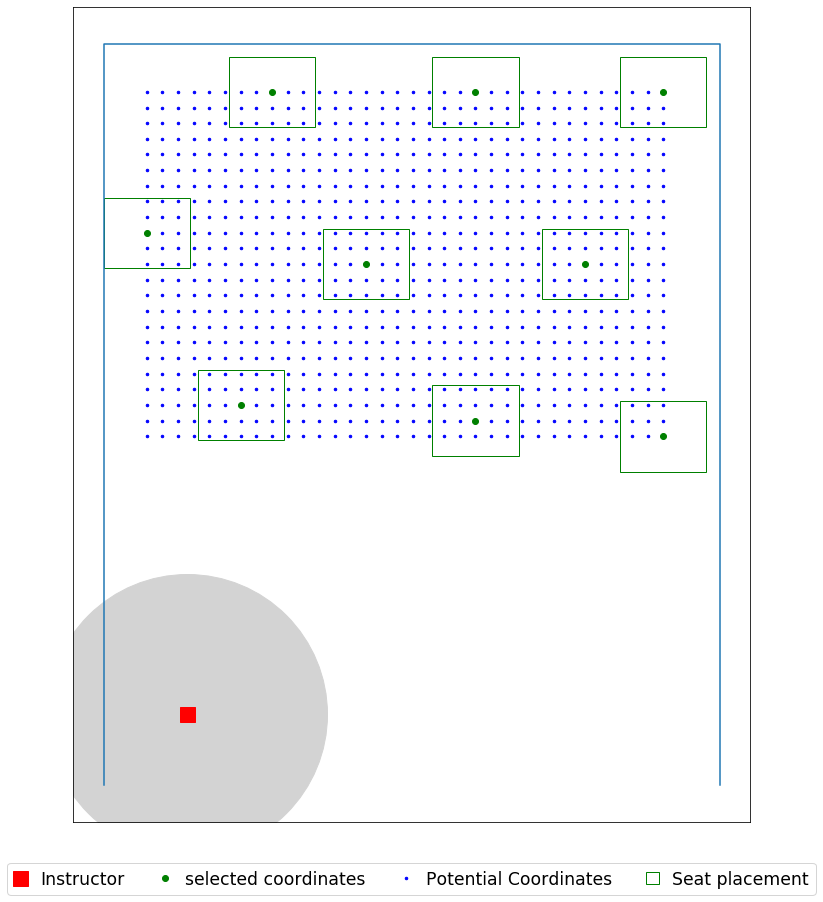

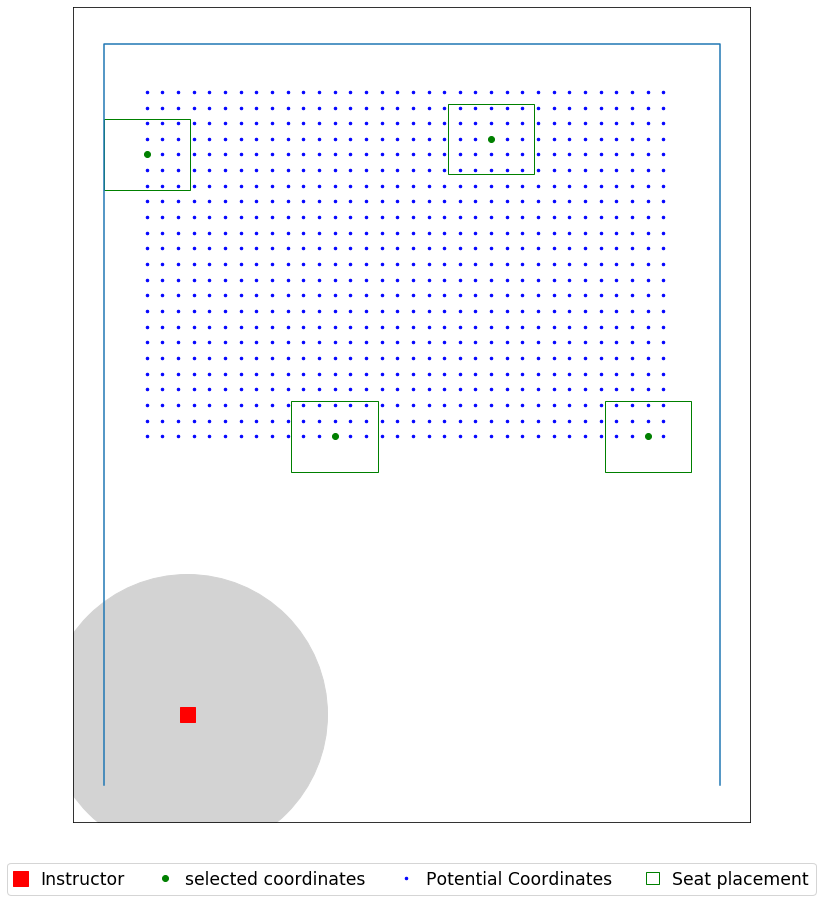

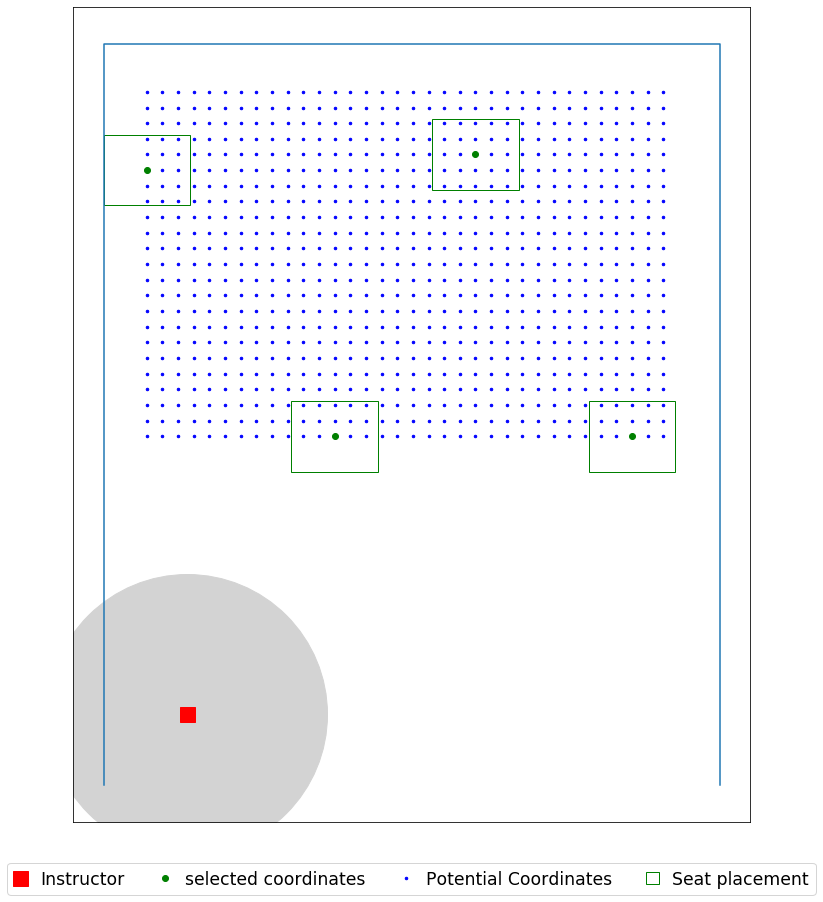

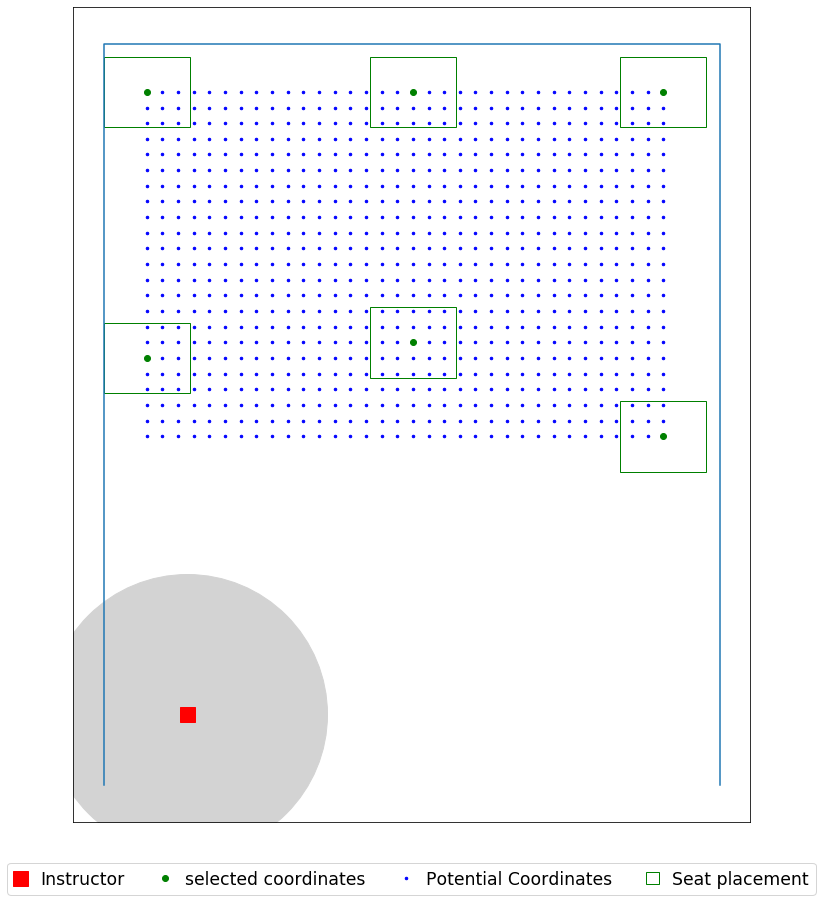

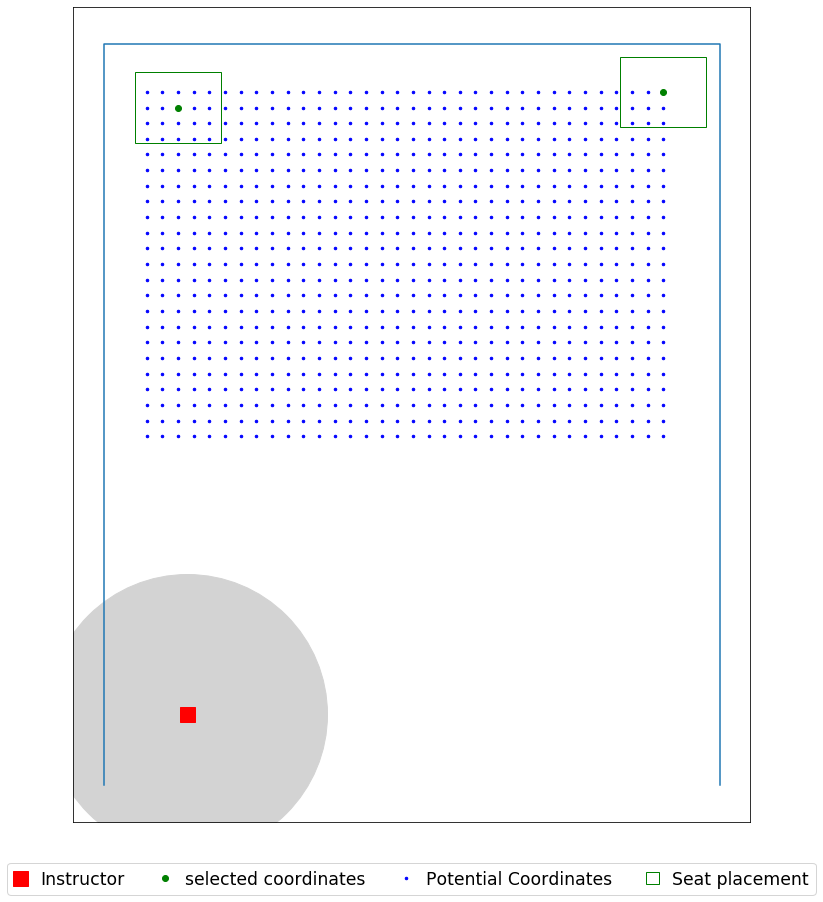

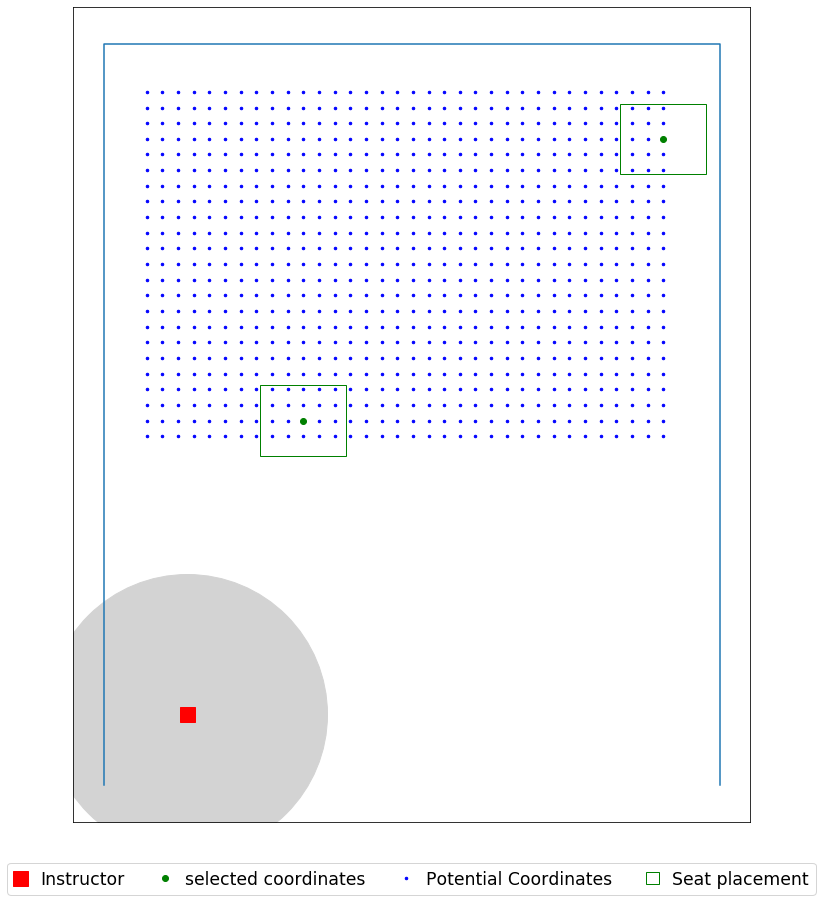

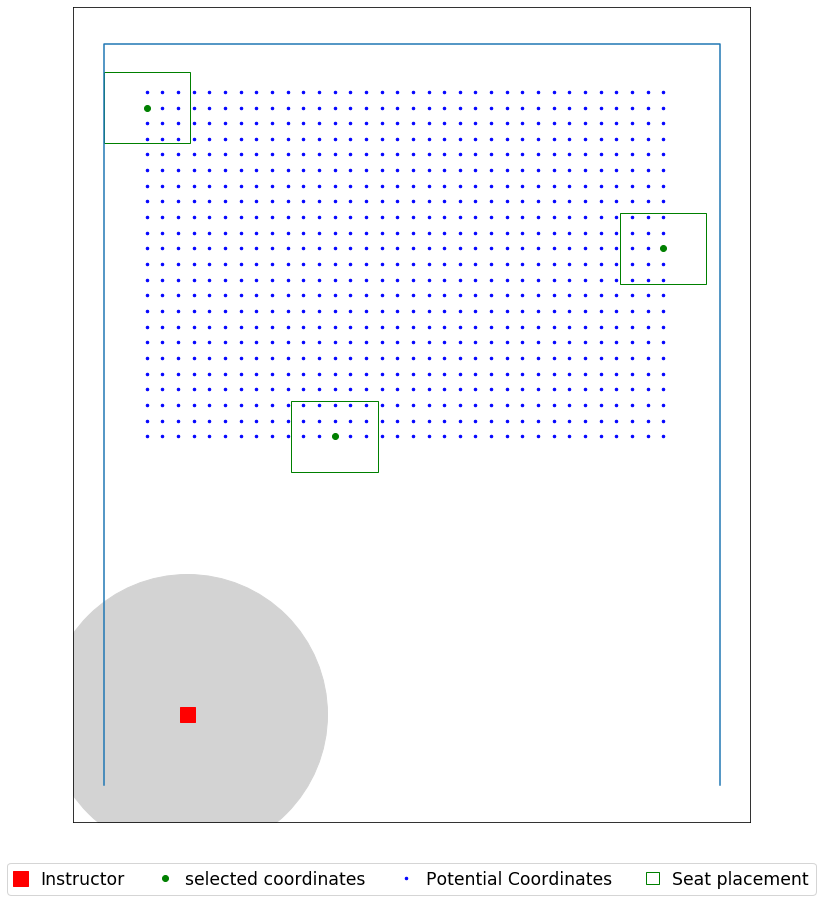

In [33]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv('Howey_N210_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Howey_N210_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

In [ ]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
#         pd.DataFrame(selected).to_csv('Howey_N210_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig('Howey_N210_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

In [31]:
listt = [1, 0.75, 0]
listt

[1, 0.75, 0]

## Archie 107

In [34]:
data_file = r'C:\Users\yoges\Desktop\Input\076_Archie_107_P.xlsx'

room dimension (W x H) are [[21.16666667 40.08333333]]
seat dimension (W x H) are [[2.5        2.16666667]]
[(0, 10), (21.166666666666668, 10), (21.166666666666668, 40.083333333333336), (0, 40.083333333333336)]
Total number of seats  is 532


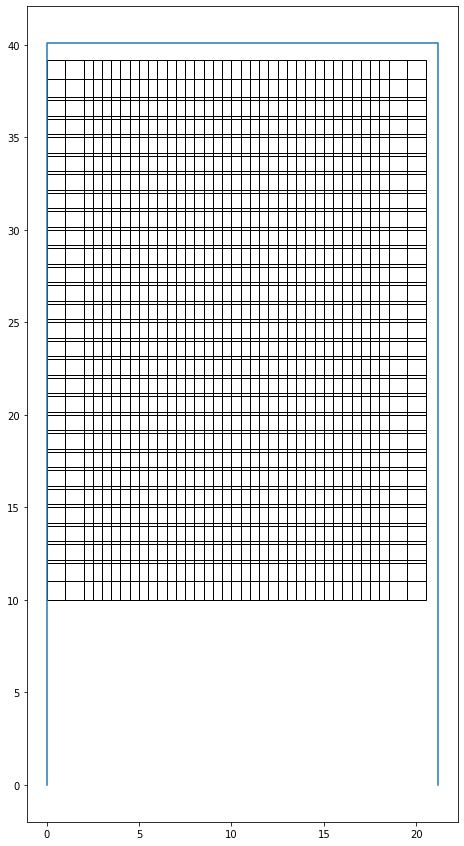

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
113
155
220
304
341
369
514
522
530
room dimension (W x H) are [[21.16666667 40.08333333]]
seat dimension (W x H) are [[2.5        2.16666667]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
9
75
137
246
257
266
386
394
513
523
531
room dimension (W x H) are [[21.16666667 40.08333333]]
seat dimension (W x H) are [[2.5        2.16666667]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 19.0
Optimal selection of seats (index):
0
6
50
75
115
121
165
228
234
246
297
342
379
405
411
475
519
525
531
room dimension (W x H) are [[21.16666667 40.08333333]]
seat dimension (W x H) are [[2.5        2.16666667]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
75
180
285
303
408
513
531
room dimension (W x

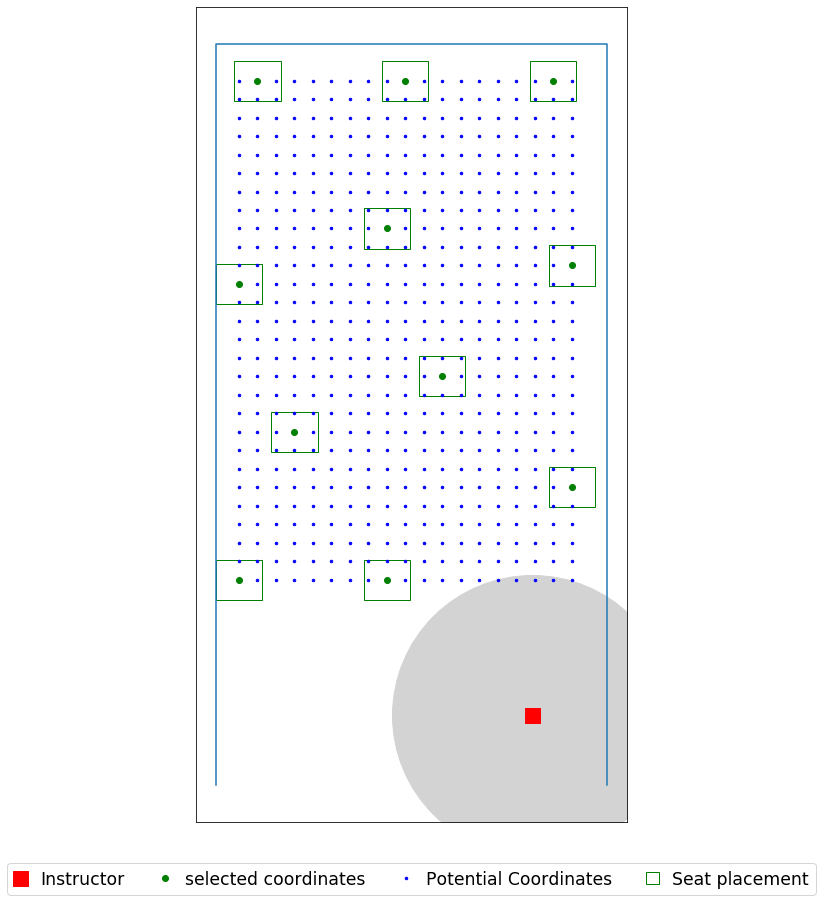

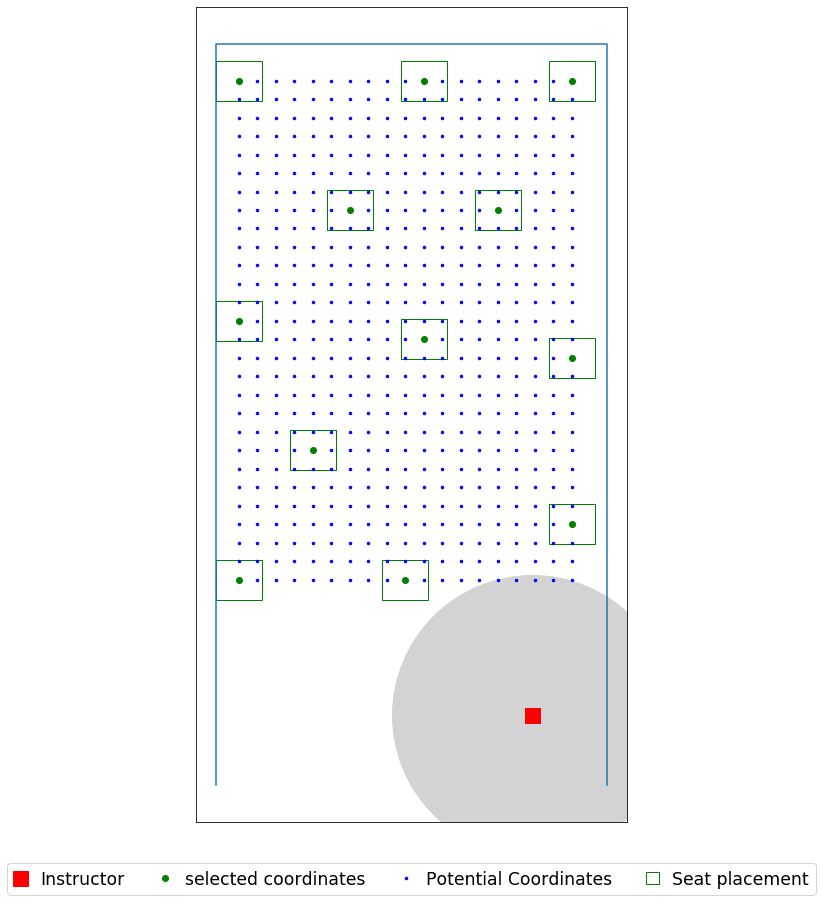

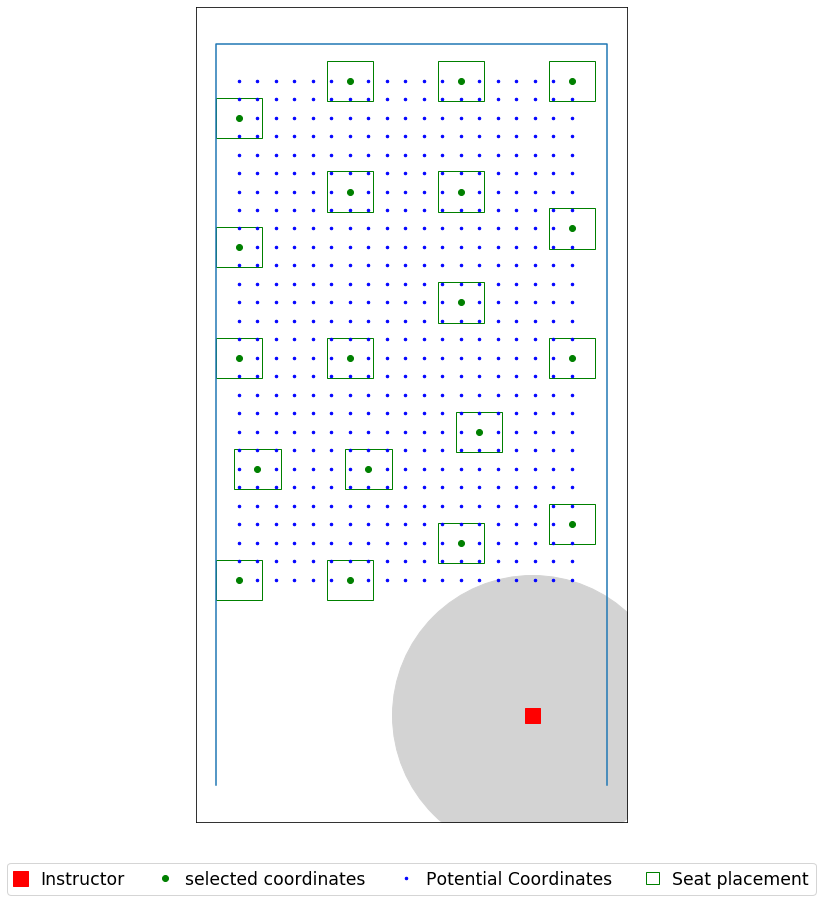

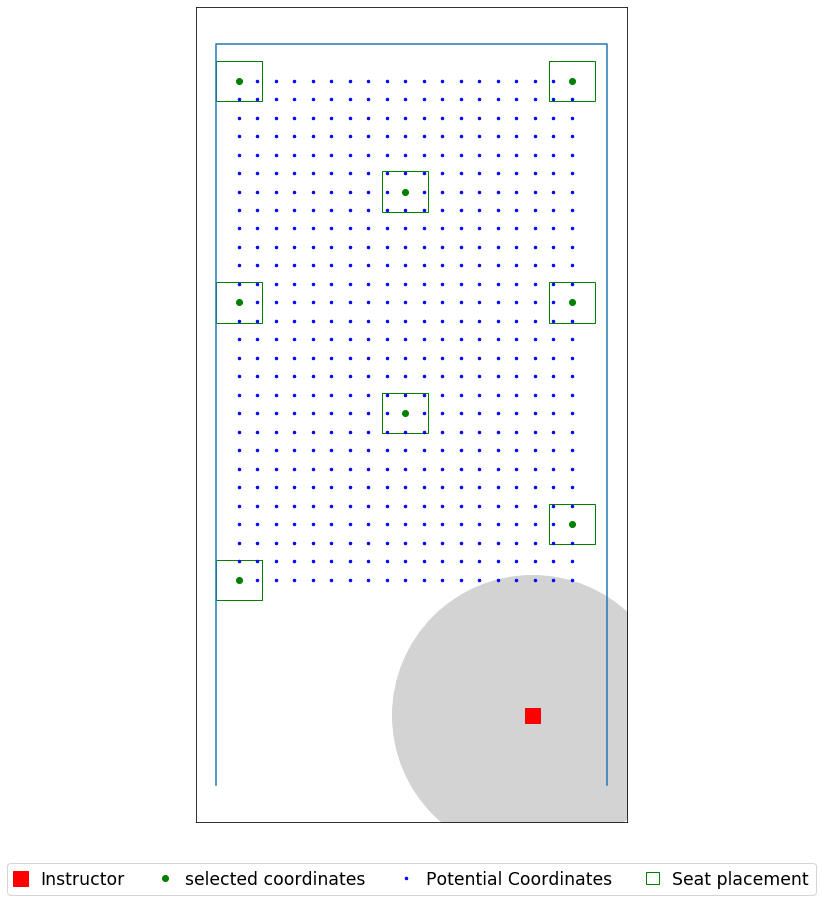

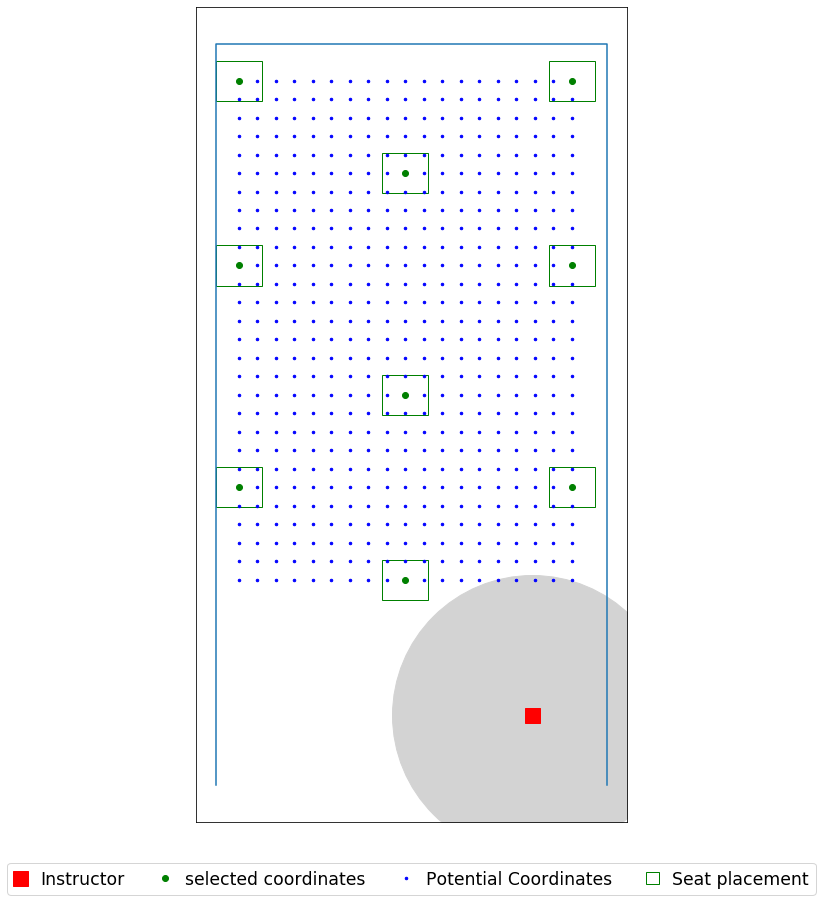

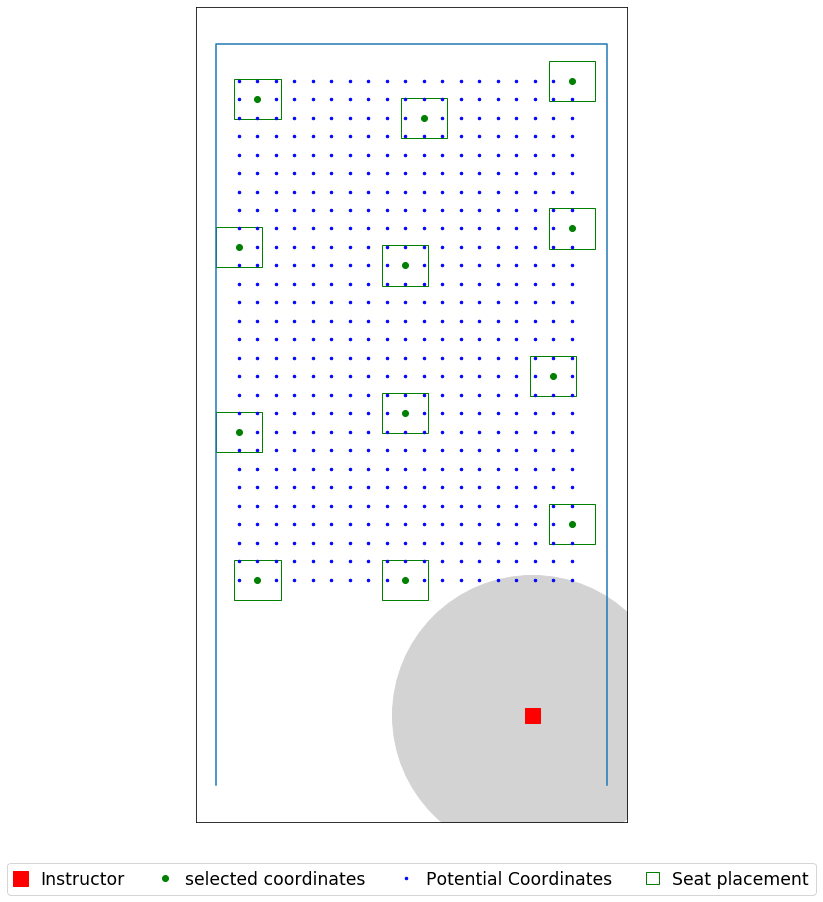

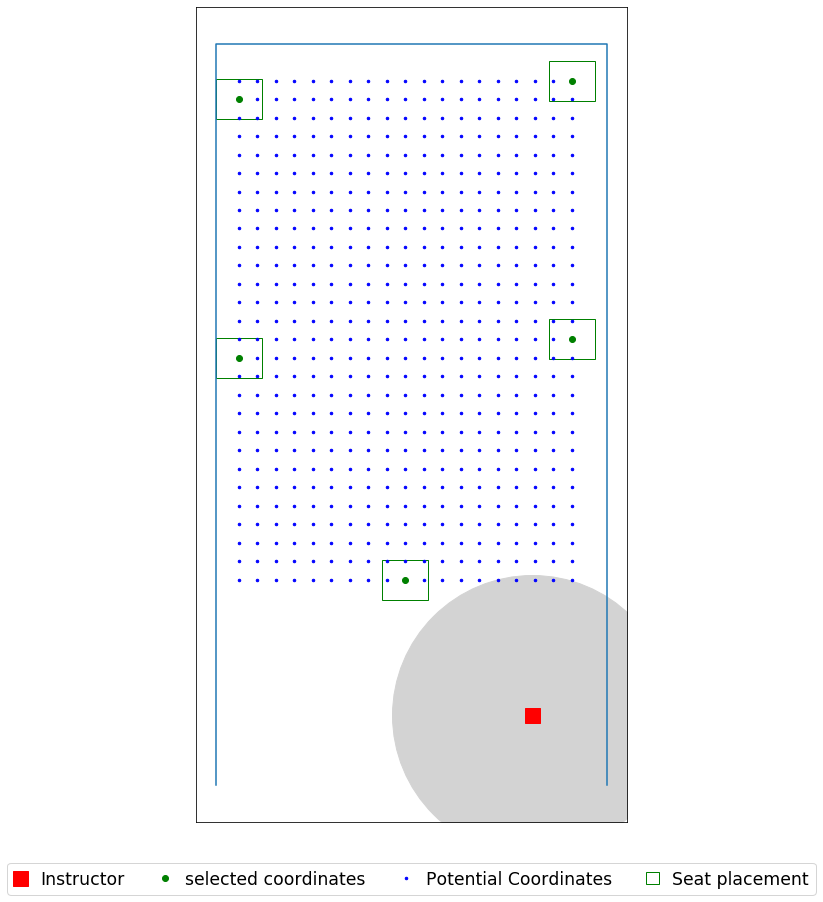

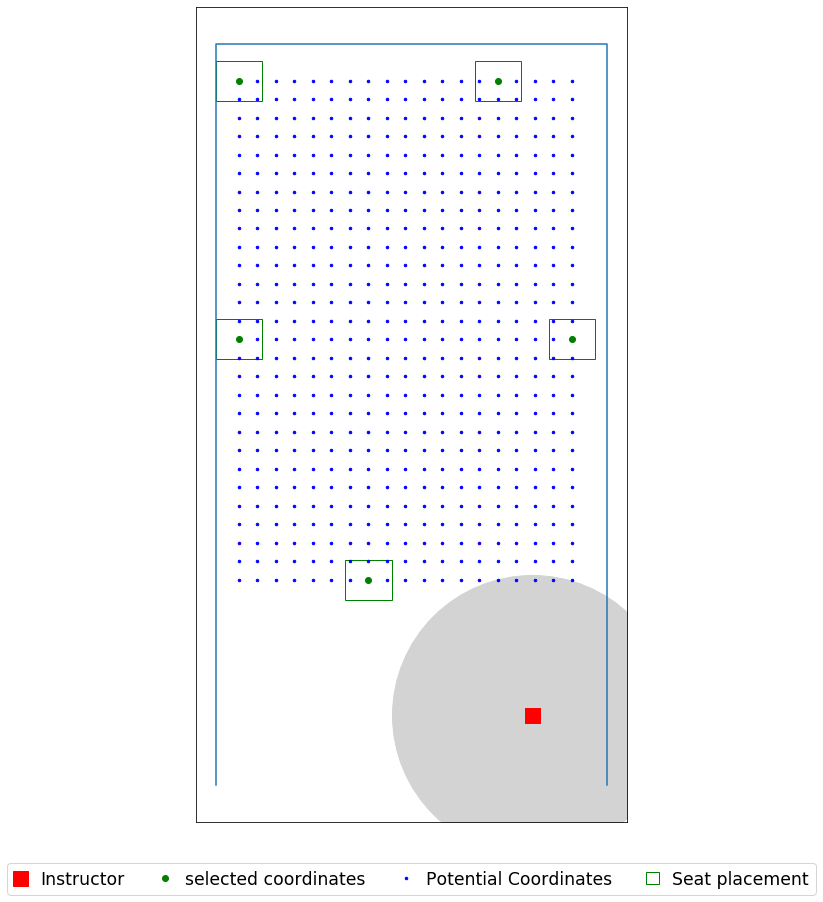

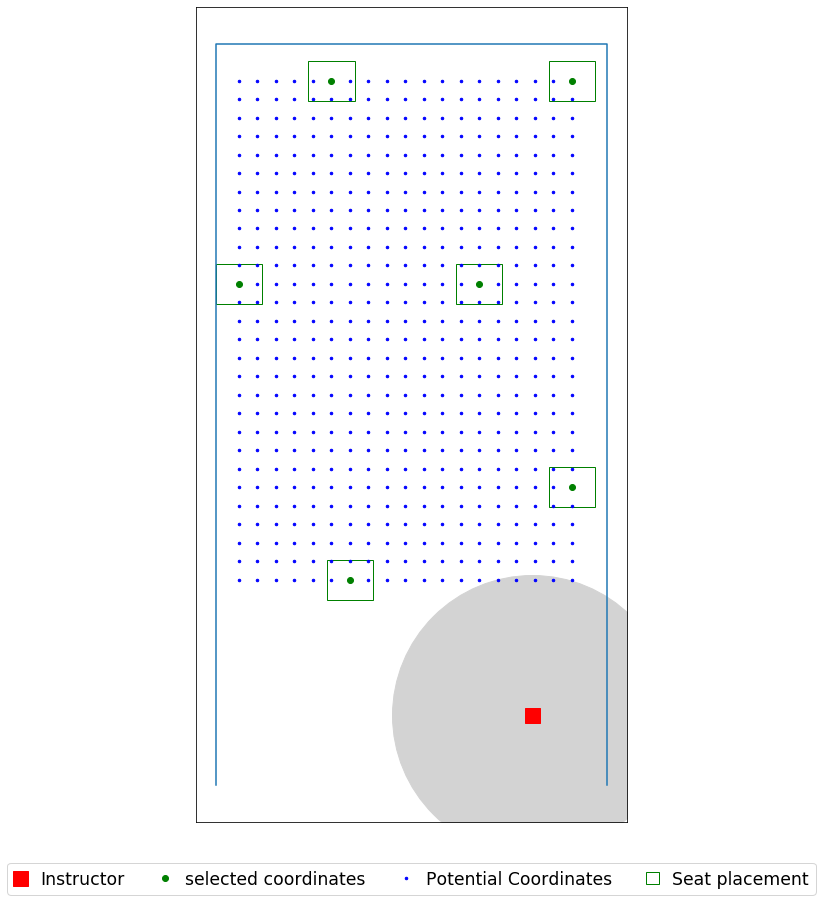

In [39]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv('Archie_107_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Archie_107_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

room dimension (W x H) are [[21.16666667 40.08333333]]
seat dimension (W x H) are [[2.5        2.16666667]]
[(0, 10), (21.166666666666668, 10), (21.166666666666668, 40.083333333333336), (0, 40.083333333333336)]
Total number of seats  is 532


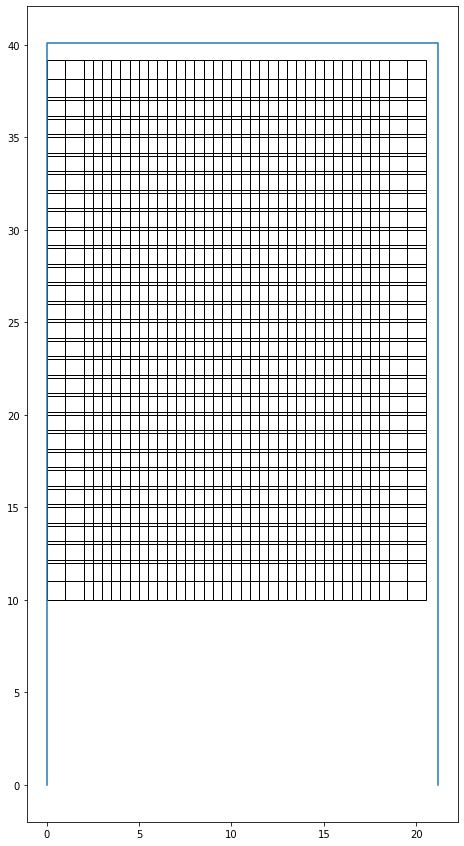

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
113
155
220
304
341
369
514
522
530
room dimension (W x H) are [[21.16666667 40.08333333]]
seat dimension (W x H) are [[2.5        2.16666667]]


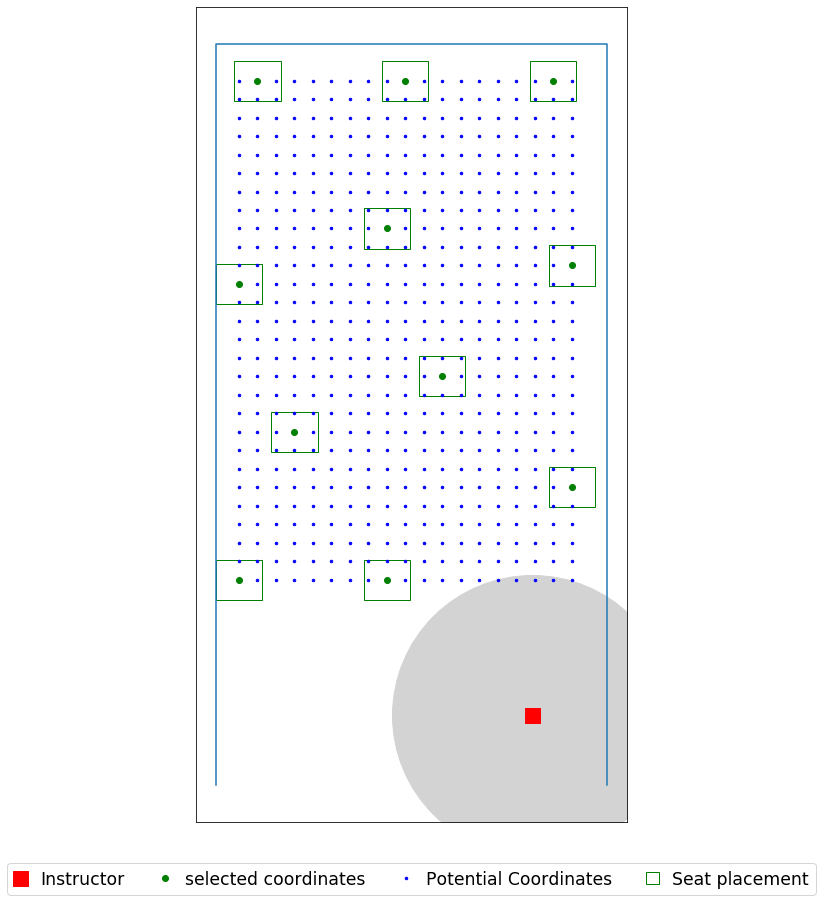

In [38]:
seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=6, d1 = 10)
# pd.DataFrame(selected).to_csv('Skiles_202_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
# plt.savefig('Skiles_202_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

## Archie 207

In [40]:
data_file = r'C:\Users\yoges\Desktop\Input\076_Archie_207_P.xlsx'

room dimension (W x H) are [[19.66666667 39.58333333]]
seat dimension (W x H) are [[2.75 2.25]]
[(0, 10), (19.666666666666668, 10), (19.666666666666668, 39.583333333333336), (0, 39.583333333333336)]
Total number of seats  is 476


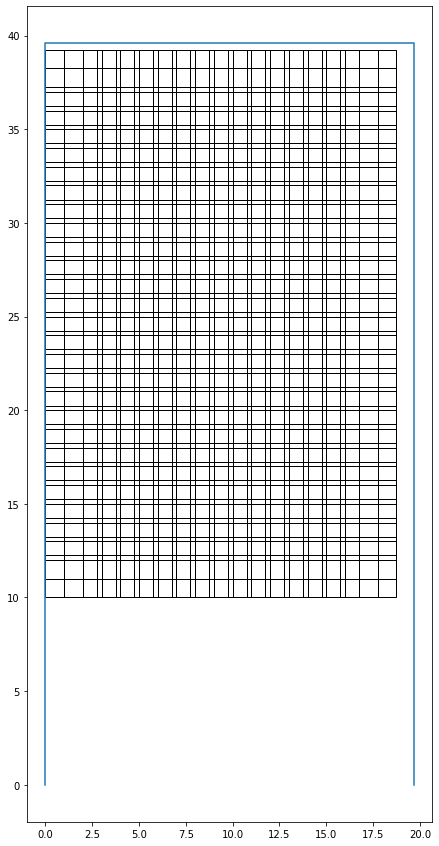

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
8
67
136
144
203
272
280
339
408
416
475
room dimension (W x H) are [[19.66666667 39.58333333]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
8
67
136
144
203
289
297
339
450
459
475
room dimension (W x H) are [[19.66666667 39.58333333]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 17.0
Optimal selection of seats (index):
0
6
67
95
106
169
187
197
271
276
299
357
373
380
459
469
475
room dimension (W x H) are [[19.66666667 39.58333333]]
seat dimension (W x H) are [[2.75 2.25]]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
6
67
153
305
312
459
475
room dimension (W x H) are [[19.66666667 39.58333333]]
seat dime

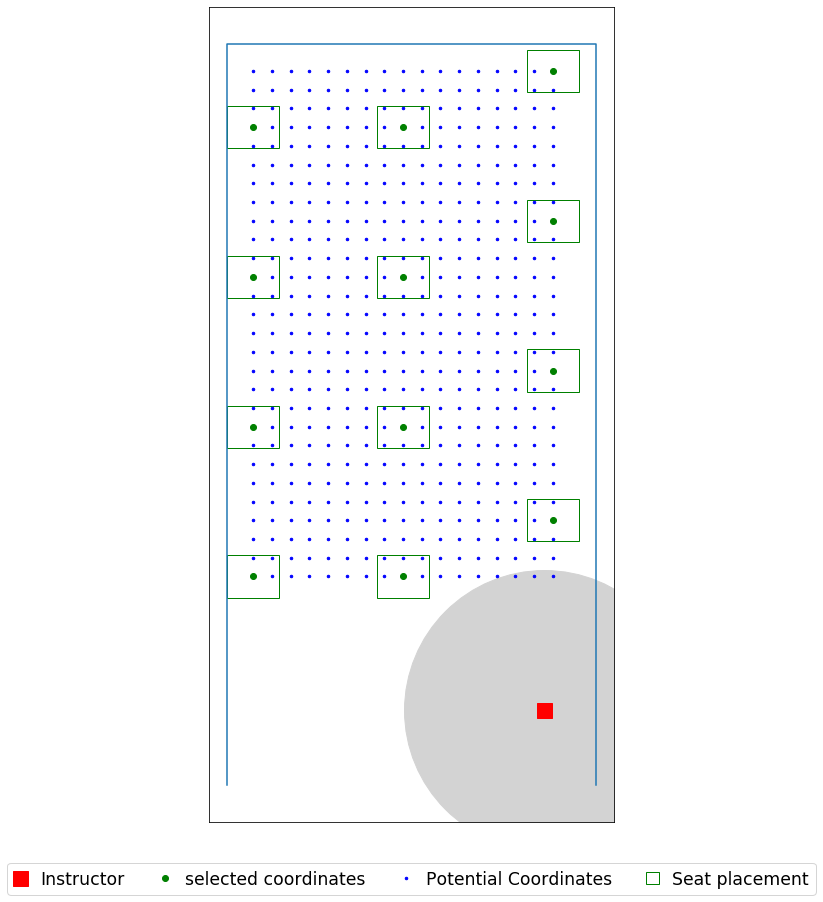

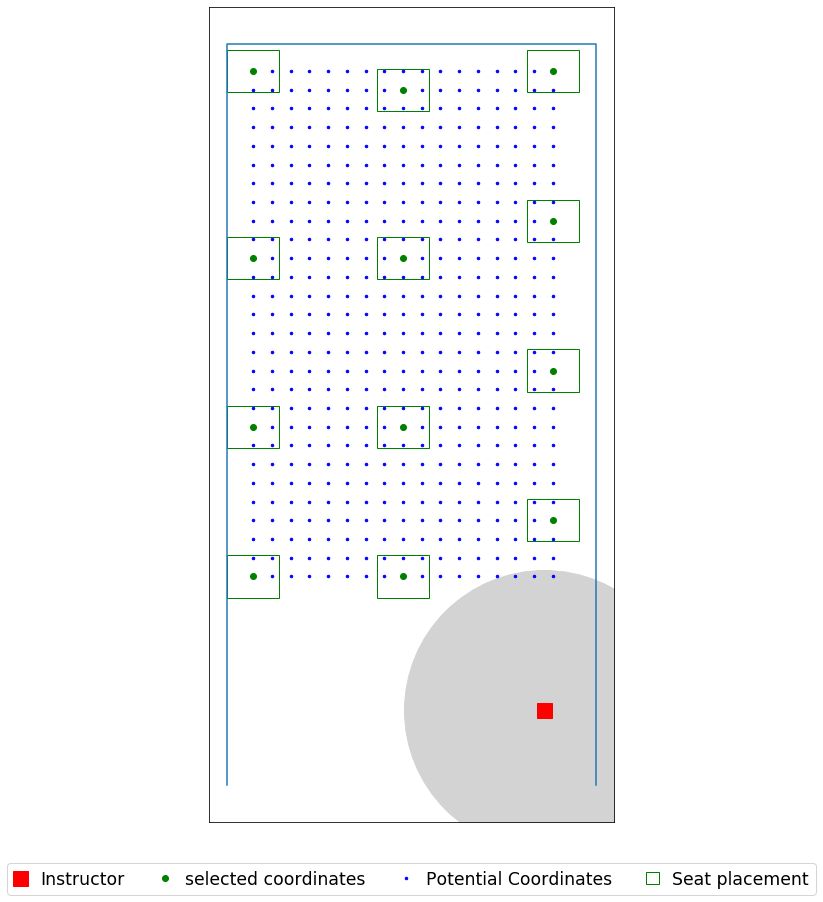

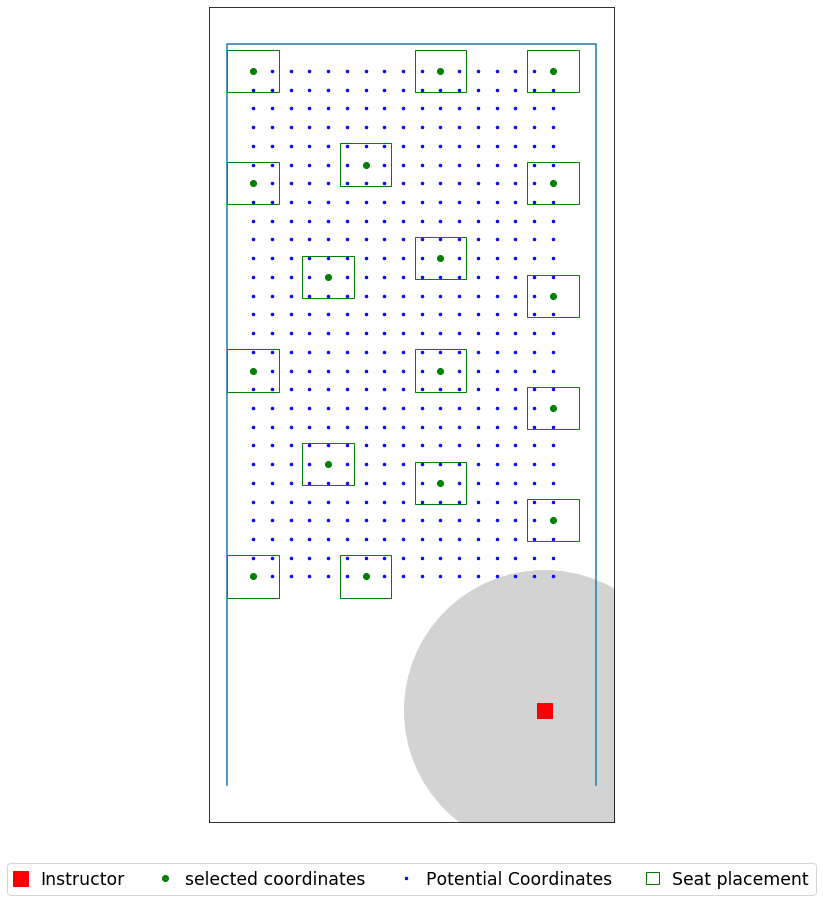

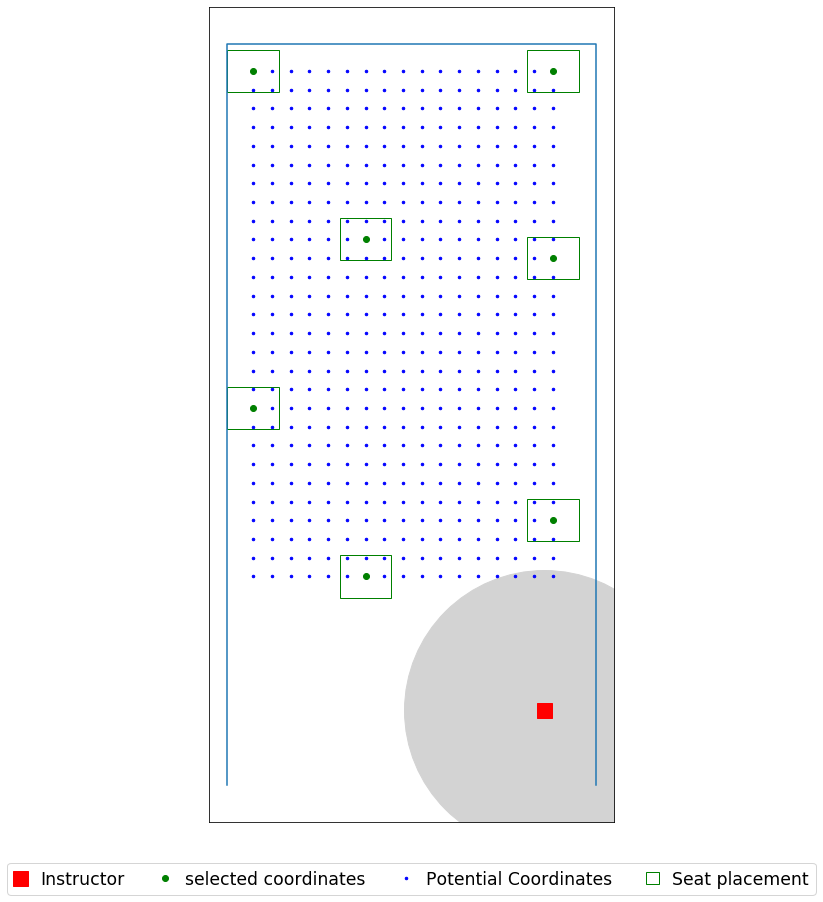

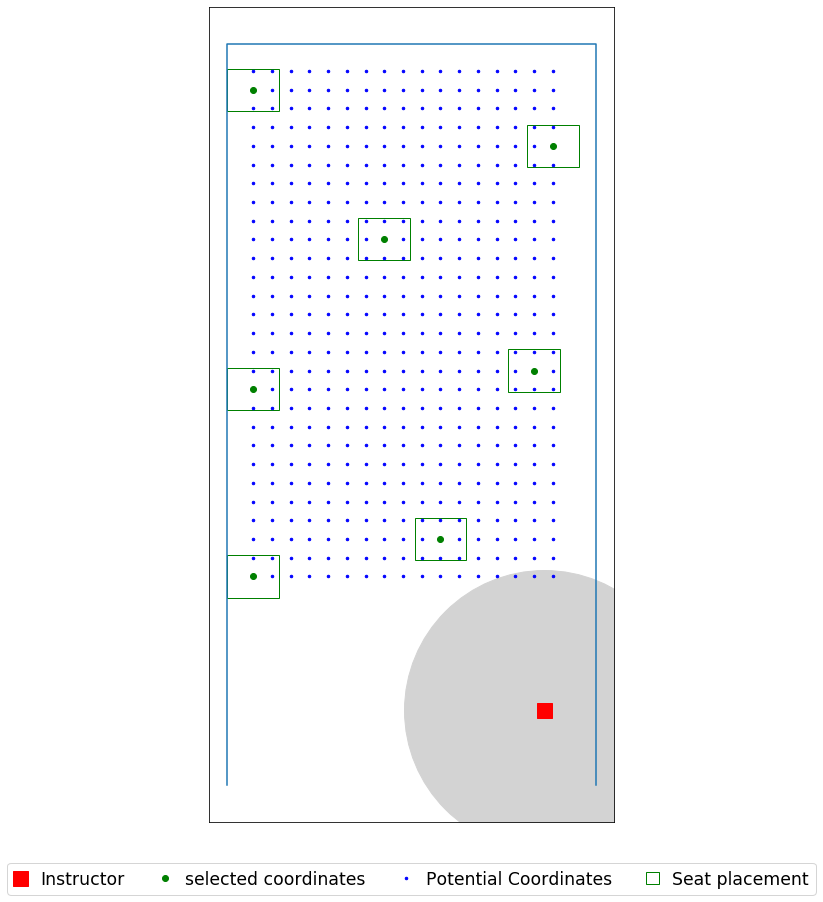

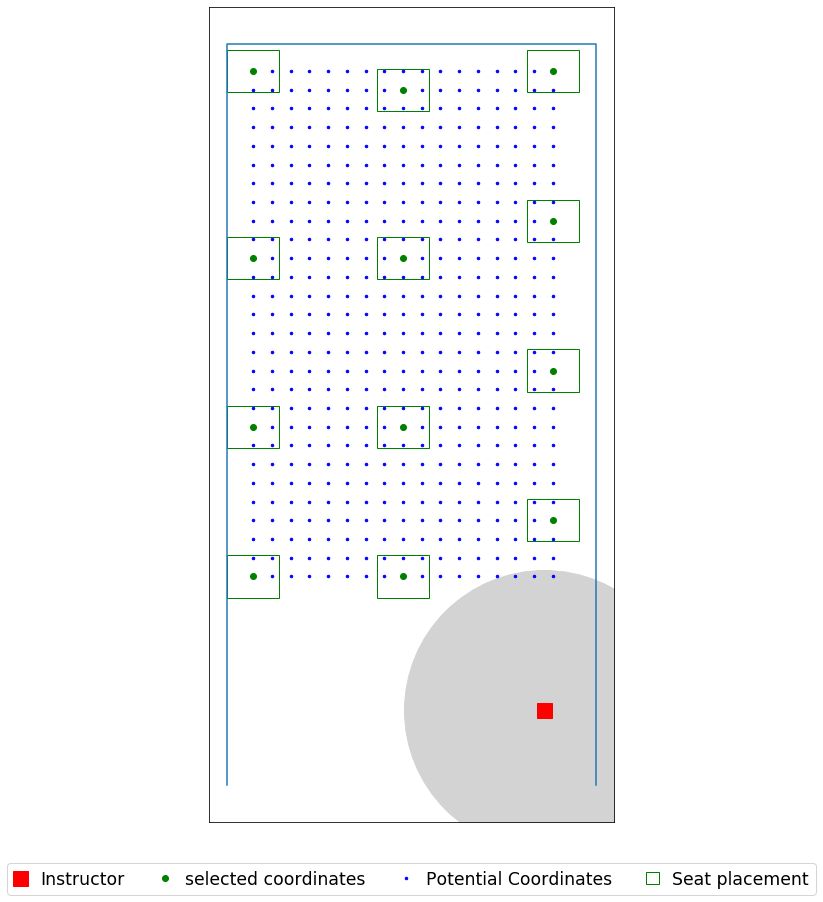

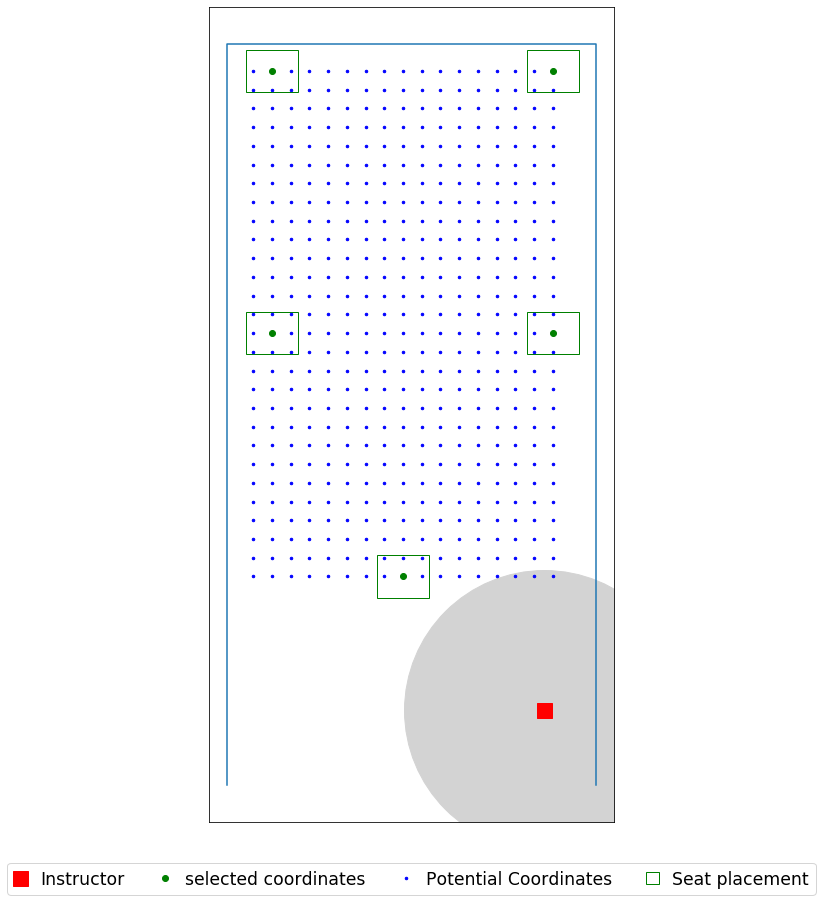

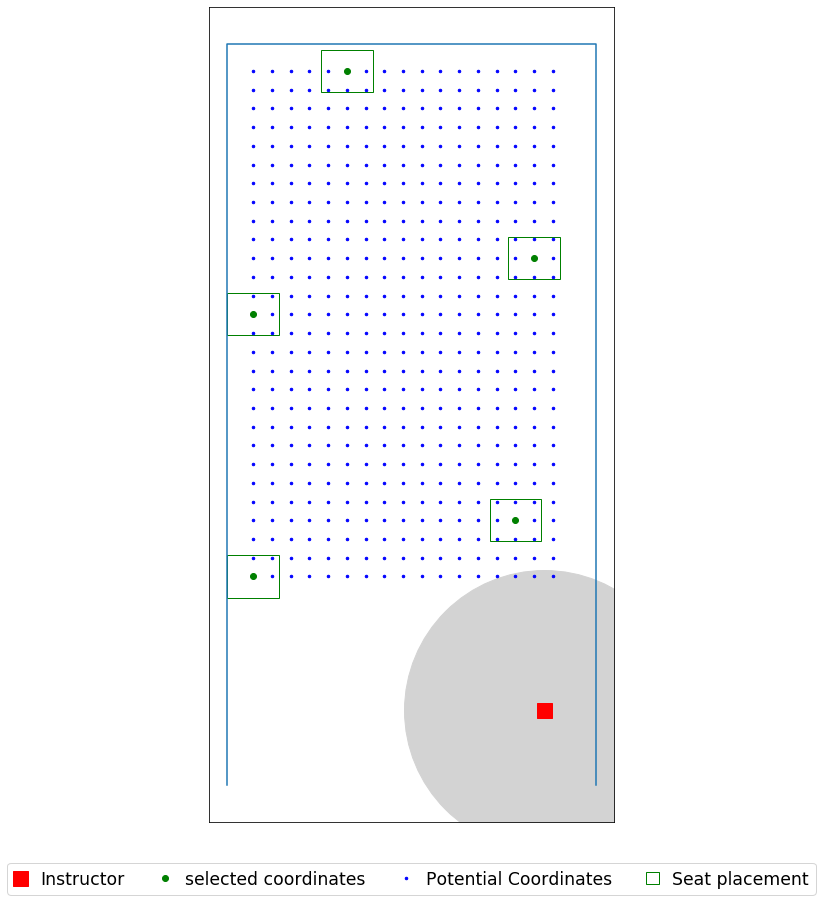

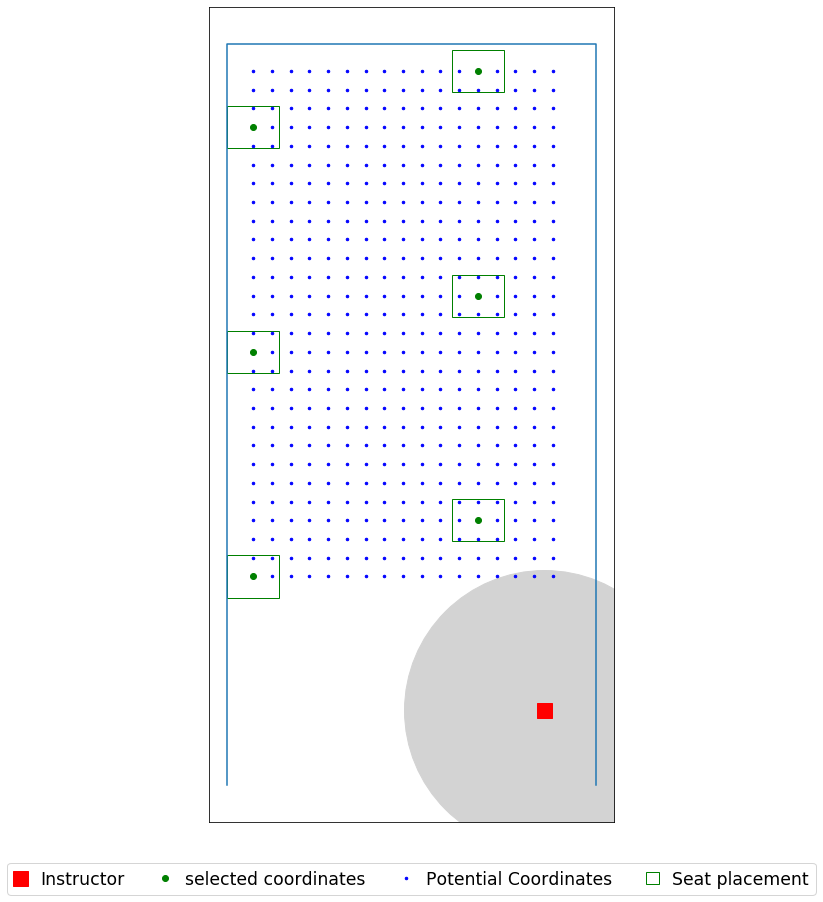

In [41]:
seat_loc = seat_coordinates(data_file)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv('Archie_207_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig('Archie_207_'+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 255

In [61]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_255_P.xlsx'

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


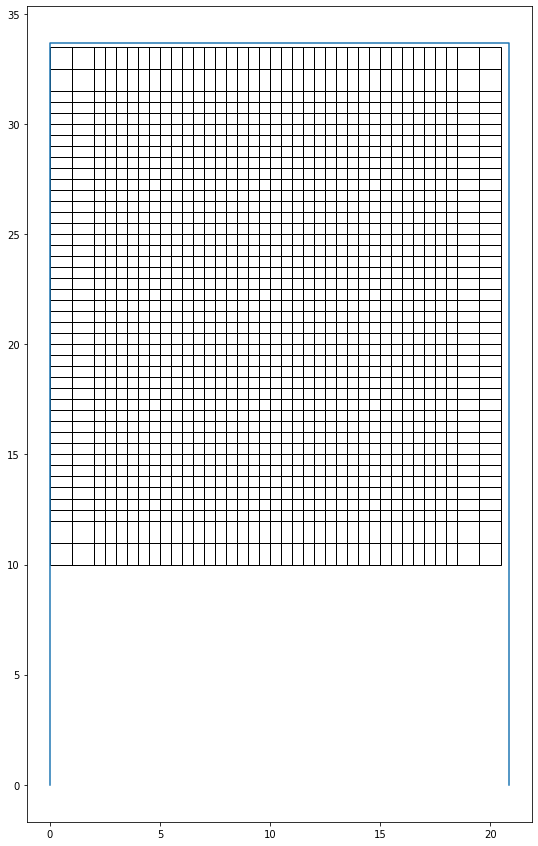

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
37
152
160
187
304
312
339
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]


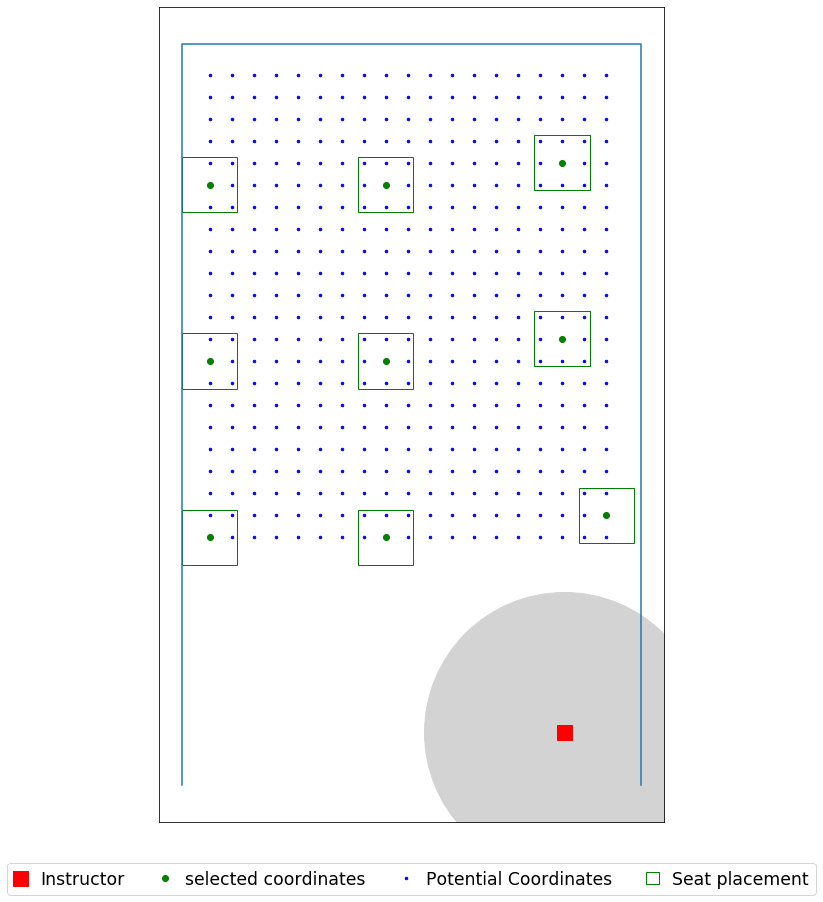

In [62]:
seat_loc = seat_coordinates(data_file)

# for i in (6,8,12):
obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=6, d1 = 10)
# pd.DataFrame(selected).to_csv('Skiles_202_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
# plt.savefig('Skiles_202_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

## Skiles 255 type = 2 capaicty 48

In [83]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_255_P_Type2.xlsx'

Name = 'Skiles_255'

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (20.833333333333332, 0), (20.833333333333332, 23.666666666666664), (0, 23.666666666666664)]
Total number of seats  is 418


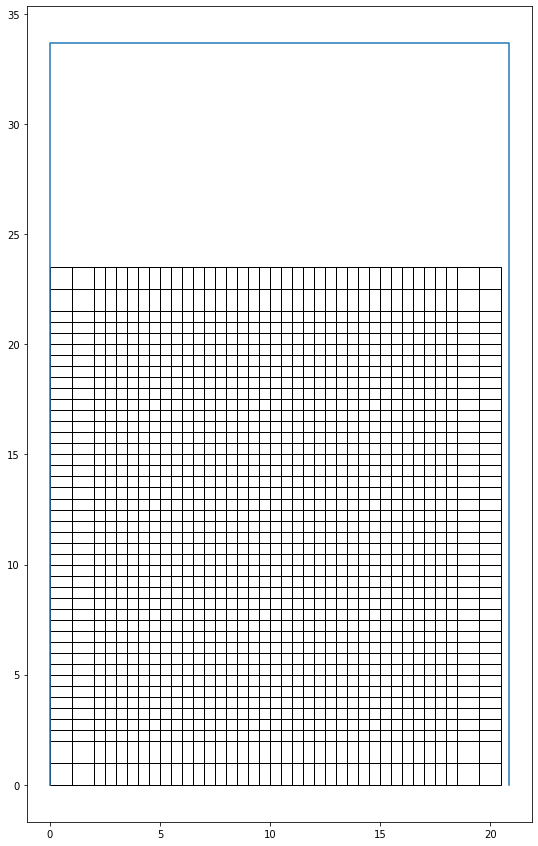

[[ 1.25  1.25]
 [ 2.25  1.25]
 [ 3.25  1.25]
 [ 4.25  1.25]
 [ 5.25  1.25]
 [ 6.25  1.25]
 [ 7.25  1.25]
 [ 8.25  1.25]
 [ 9.25  1.25]
 [10.25  1.25]
 [11.25  1.25]
 [12.25  1.25]
 [13.25  1.25]
 [14.25  1.25]
 [15.25  1.25]
 [16.25  1.25]
 [17.25  1.25]
 [18.25  1.25]
 [19.25  1.25]
 [ 1.25  2.25]
 [ 2.25  2.25]
 [ 3.25  2.25]
 [ 4.25  2.25]
 [ 5.25  2.25]
 [ 6.25  2.25]
 [ 7.25  2.25]
 [ 8.25  2.25]
 [ 9.25  2.25]
 [10.25  2.25]
 [11.25  2.25]
 [12.25  2.25]
 [13.25  2.25]
 [14.25  2.25]
 [15.25  2.25]
 [16.25  2.25]
 [17.25  2.25]
 [18.25  2.25]
 [19.25  2.25]
 [ 1.25  3.25]
 [ 2.25  3.25]
 [ 3.25  3.25]
 [ 4.25  3.25]
 [ 5.25  3.25]
 [ 6.25  3.25]
 [ 7.25  3.25]
 [ 8.25  3.25]
 [ 9.25  3.25]
 [10.25  3.25]
 [11.25  3.25]
 [12.25  3.25]
 [13.25  3.25]
 [14.25  3.25]
 [15.25  3.25]
 [16.25  3.25]
 [17.25  3.25]
 [18.25  3.25]
 [19.25  3.25]
 [ 1.25  4.25]
 [ 2.25  4.25]
 [ 3.25  4.25]
 [ 4.25  4.25]
 [ 5.25  4.25]
 [ 6.25  4.25]
 [ 7.25  4.25]
 [ 8.25  4.25]
 [ 9.25  4.25]
 [10.25  4

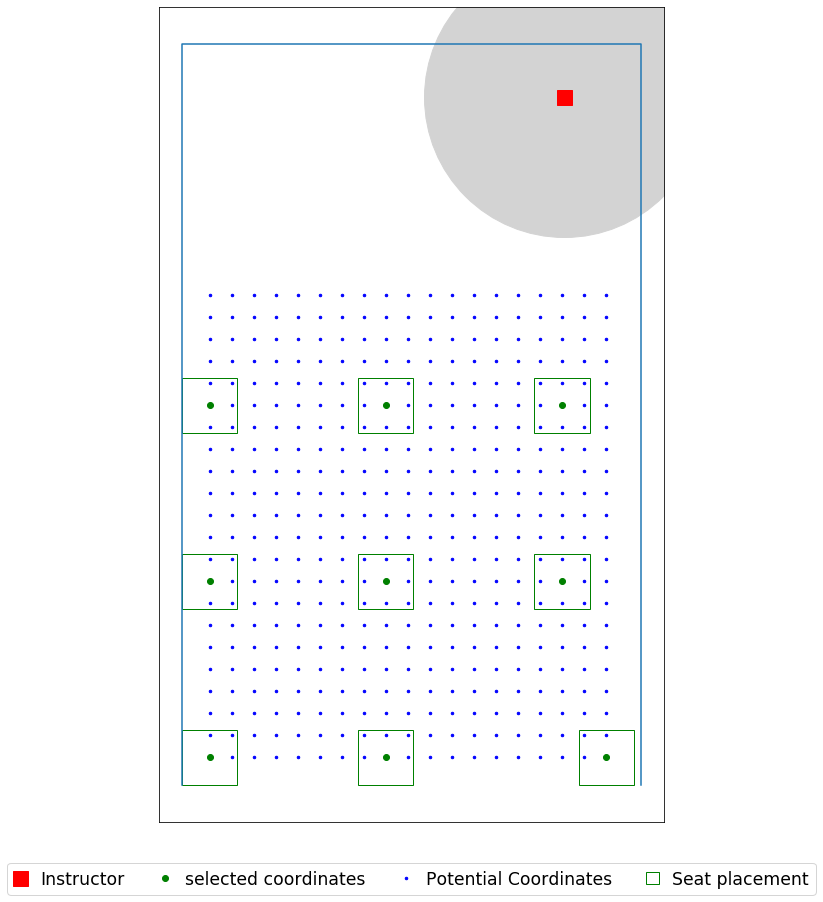

In [70]:
seat_loc = seat_coordinates_type(data_file, 2 )

# for i in (6,8,12):
obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=6, d1 = 10)
# pd.DataFrame(selected).to_csv('Skiles_202_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type =2 )
# plt.savefig('Skiles_202_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (20.833333333333332, 0), (20.833333333333332, 23.666666666666664), (0, 23.666666666666664)]
Total number of seats  is 418


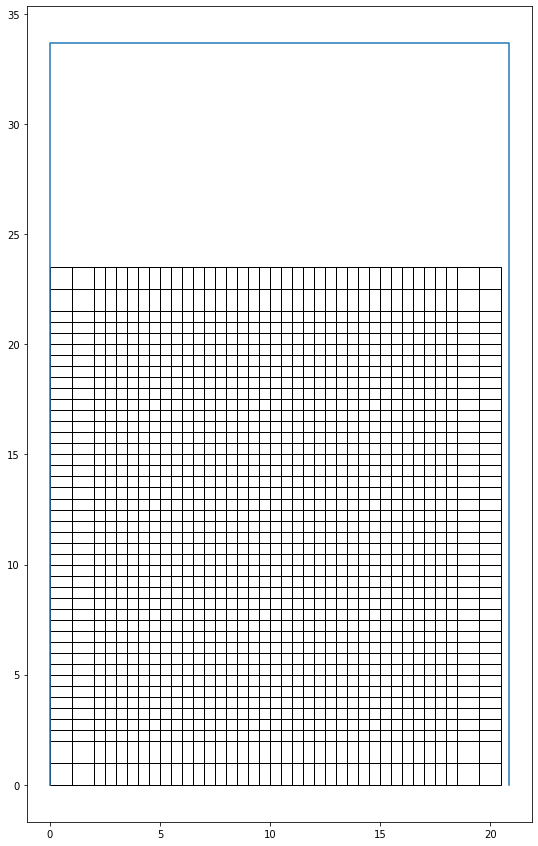

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
18
152
160
168
304
312
320
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (20.833333333333332, 0), (20.833333333333332, 23.666666666666664), (0, 23.666666666666664)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
8
17
137
145
265
266
274
394
403
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (20.833333333333332, 0), (20.833333333333332, 23.666666666666664), (0, 23.666666666666664)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
6
12
18
114
120
126
132
228
234
240
246
342
348
354
360
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (20.833333333333332, 0), (2

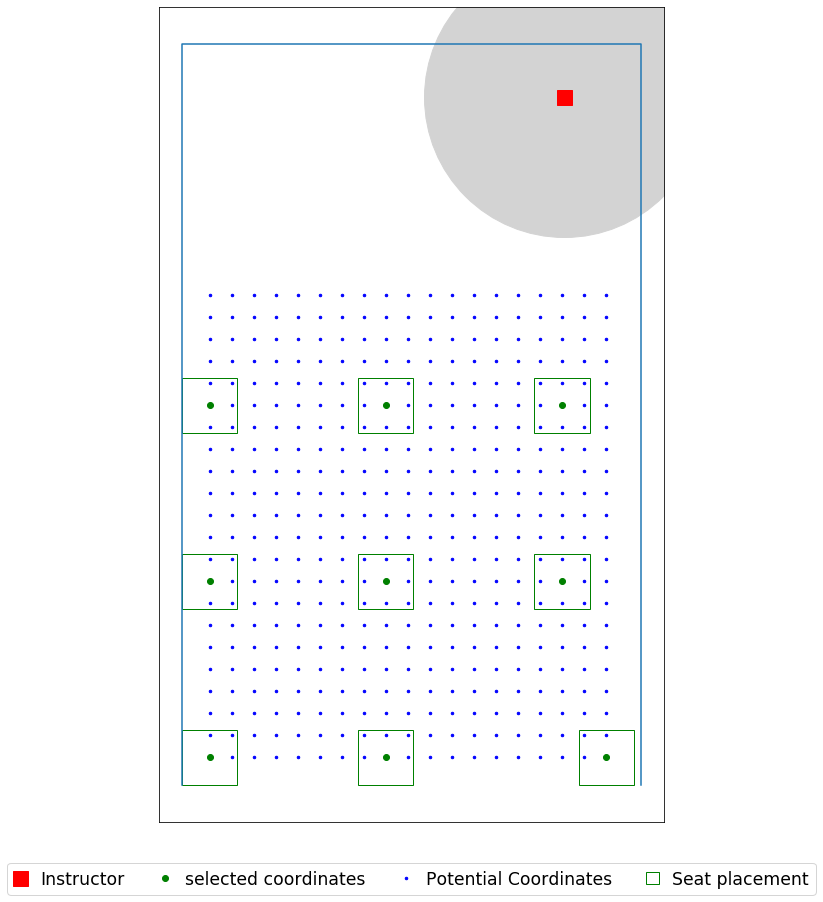

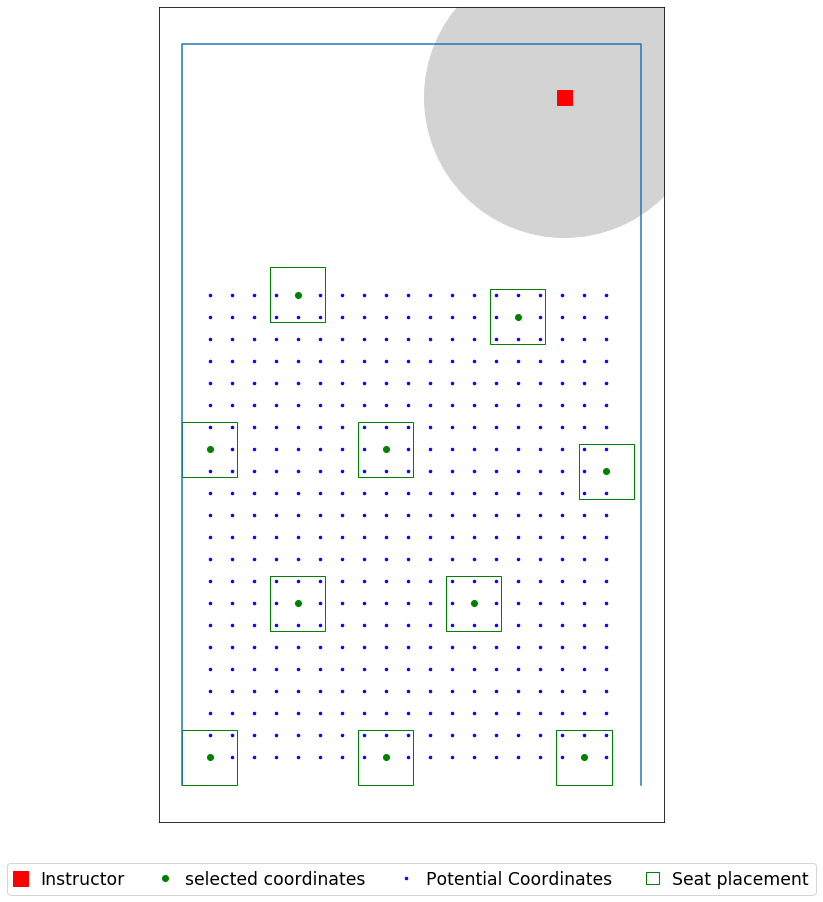

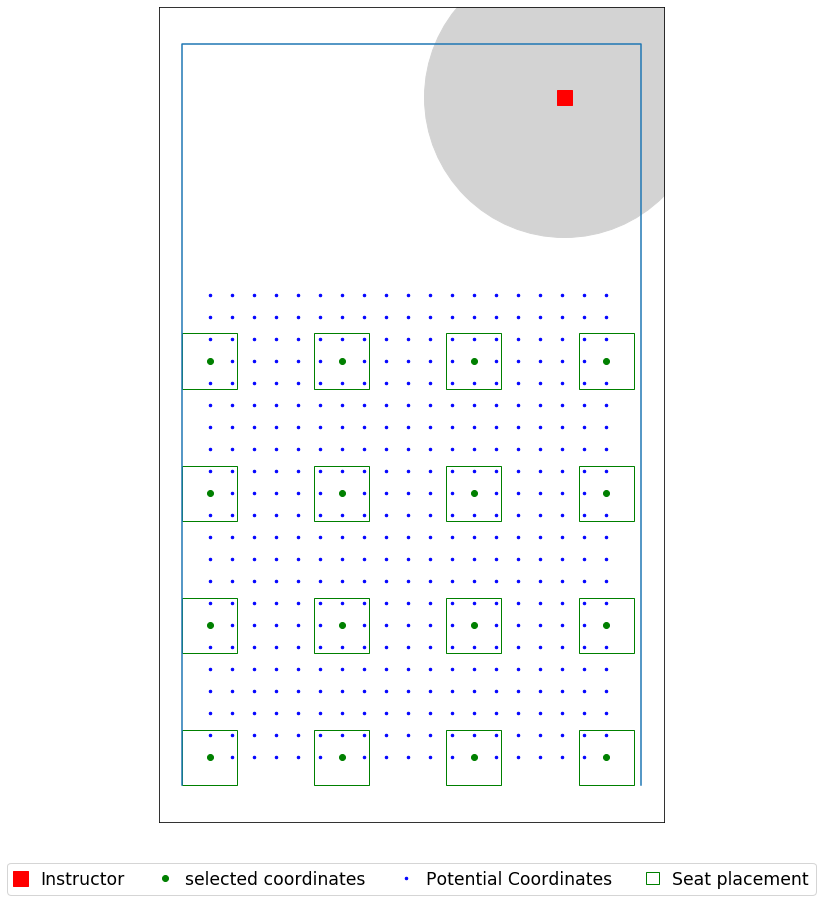

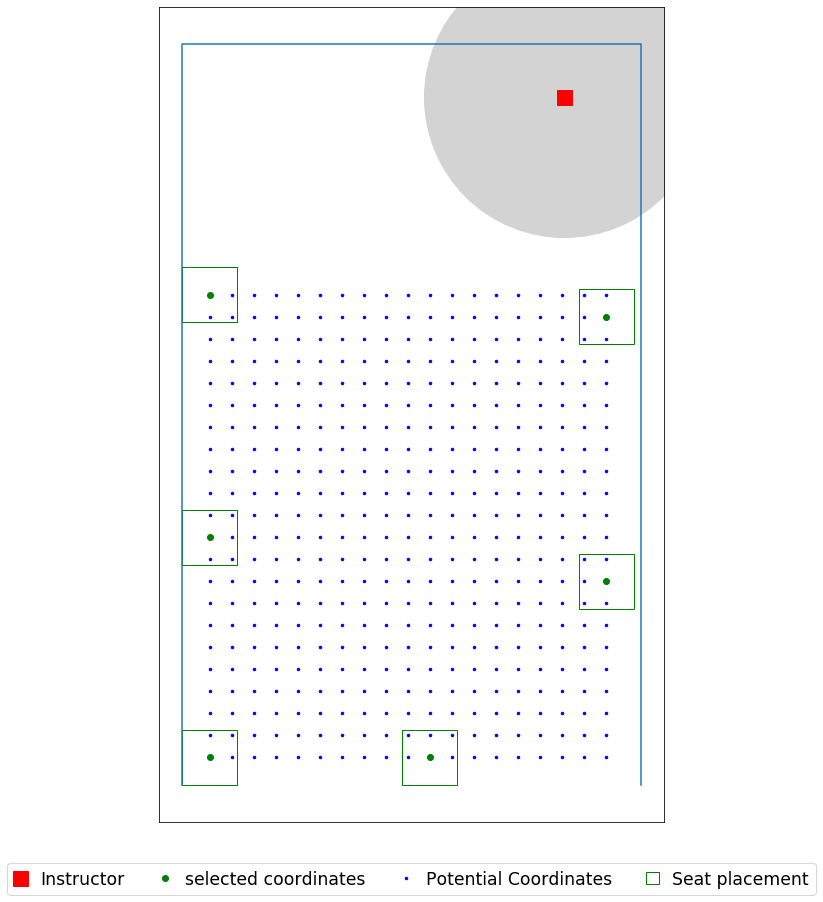

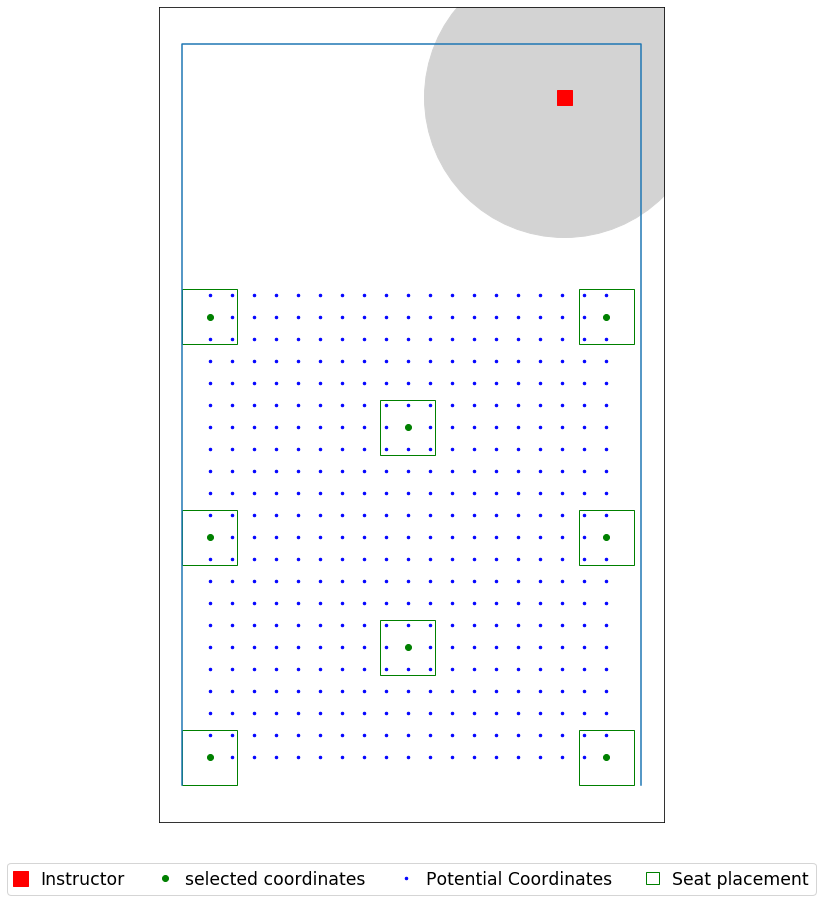

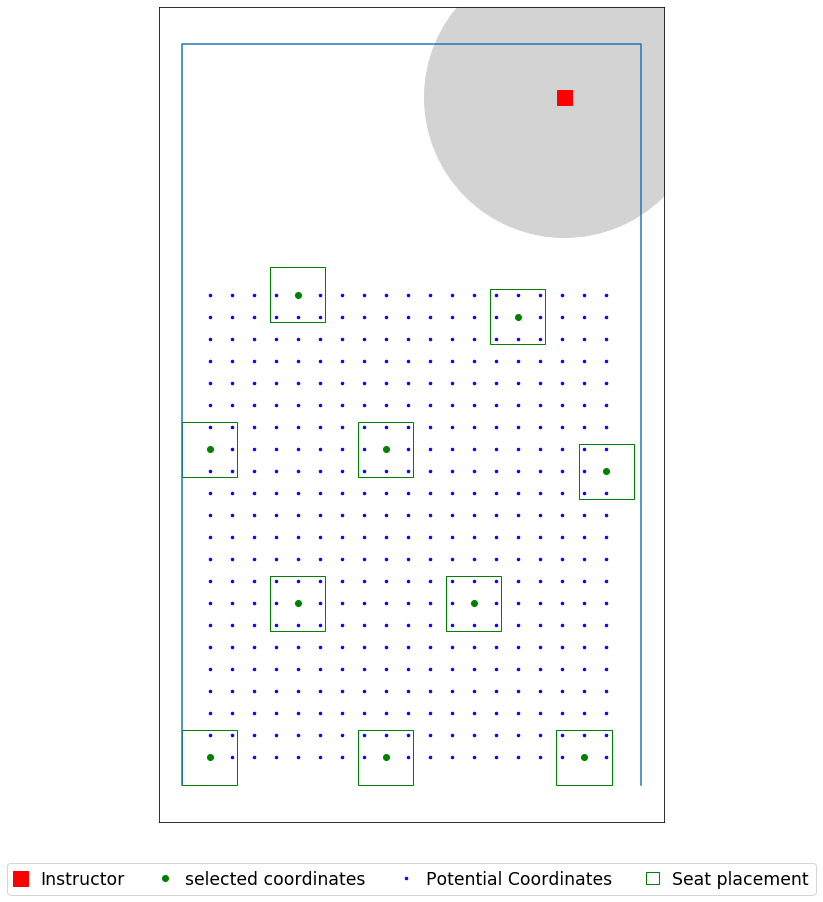

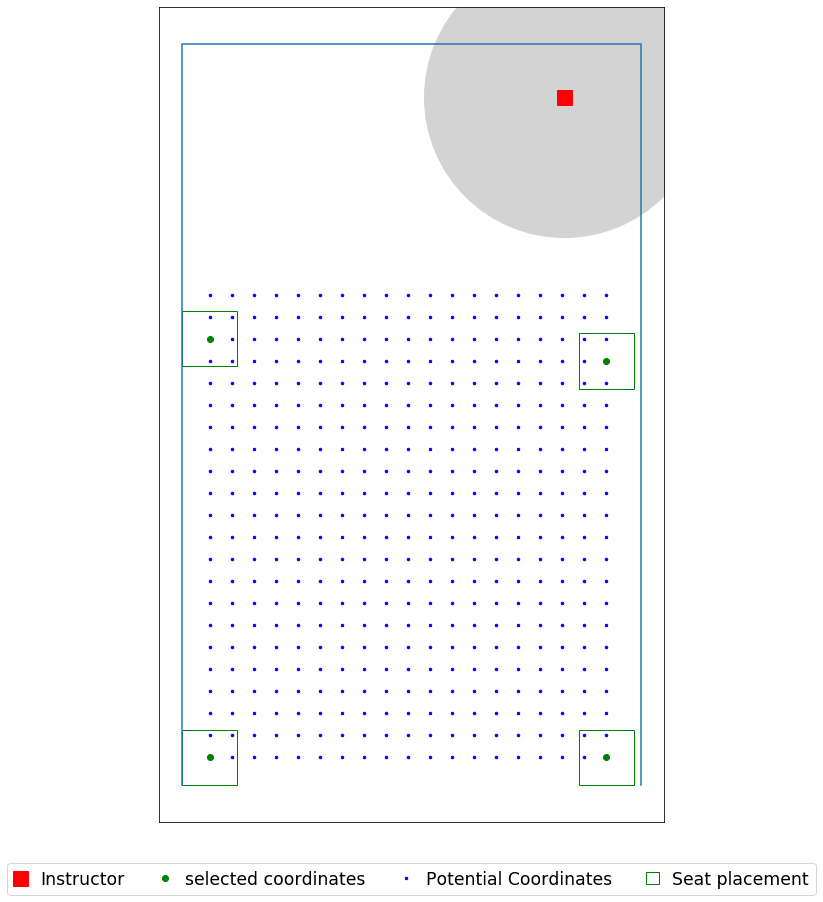

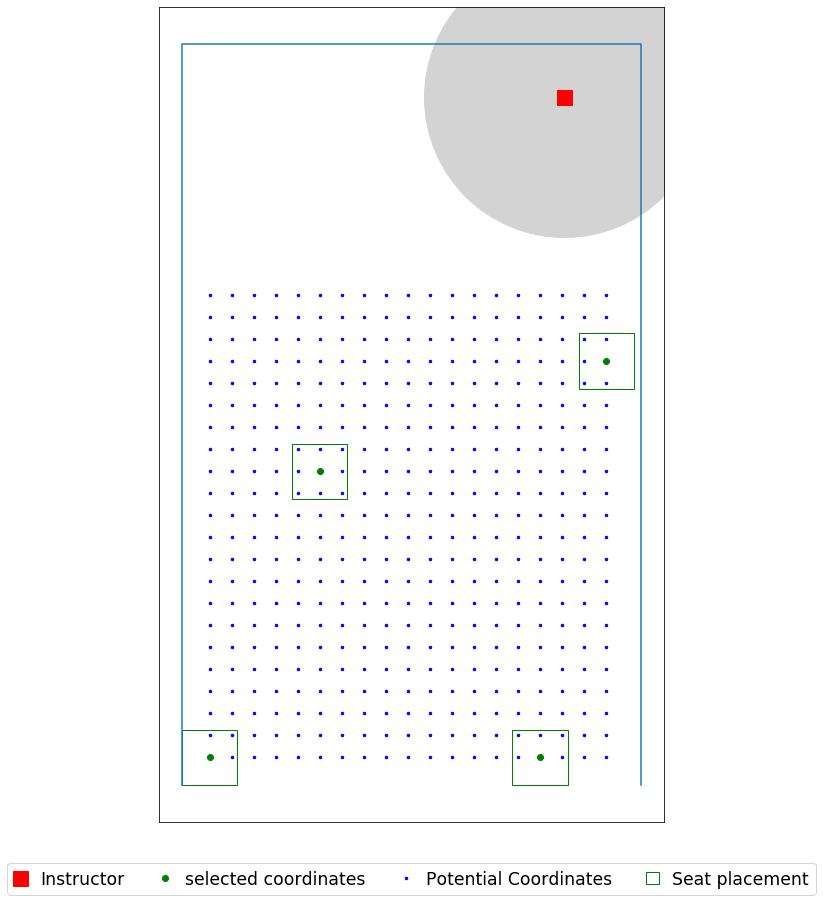

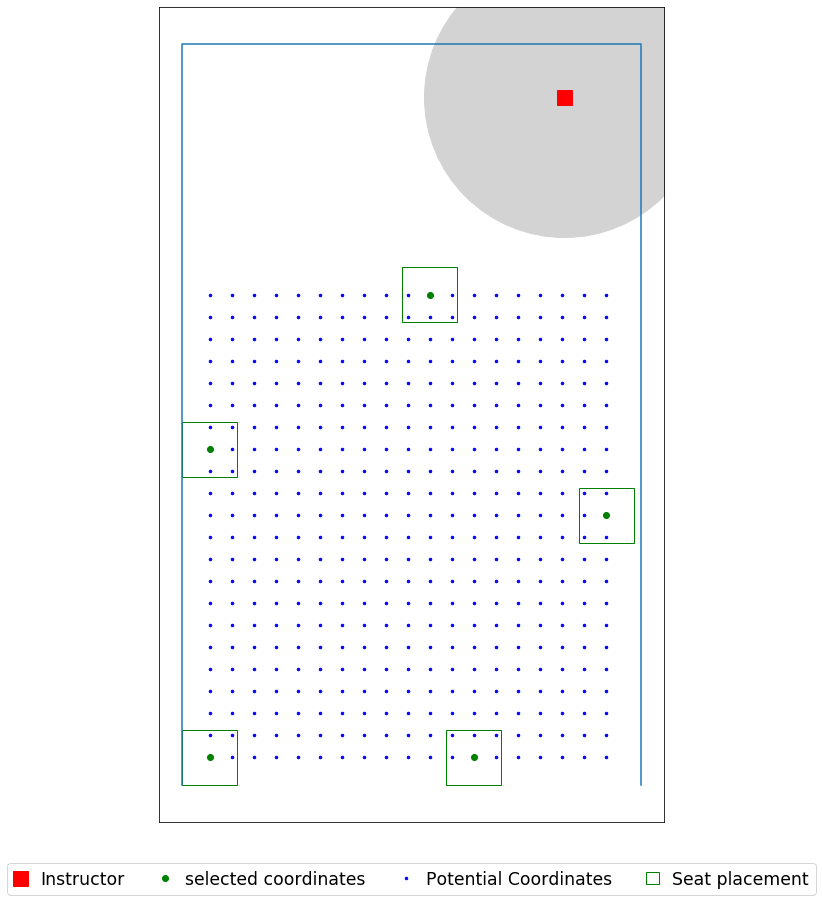

In [86]:
seat_loc = seat_coordinates_type(data_file, 2)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type = 2)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

# Skiles 249

In [82]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_249_P.xlsx'

Name = 'Skiles_249_'

room dimension (W x H) are [[47.  25.5]]
seat dimension (W x H) are [[2.66666667 2.16666667]]
[[14.66666667  1.91666667]]
[(0, 10), (47.0, 10), (47.0, 25.5), (0, 25.5)]
Total number of seats  is 27


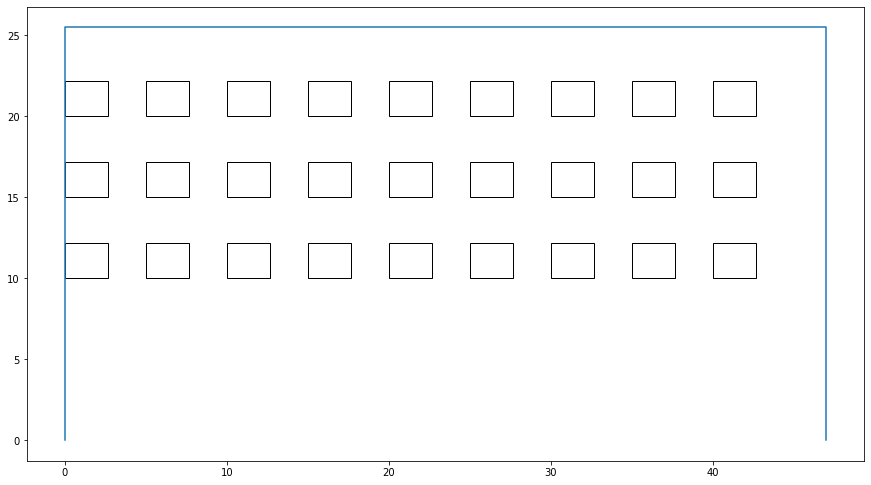

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
4
6
8
18
20
22
24
26
room dimension (W x H) are [[47.  25.5]]
seat dimension (W x H) are [[2.66666667 2.16666667]]


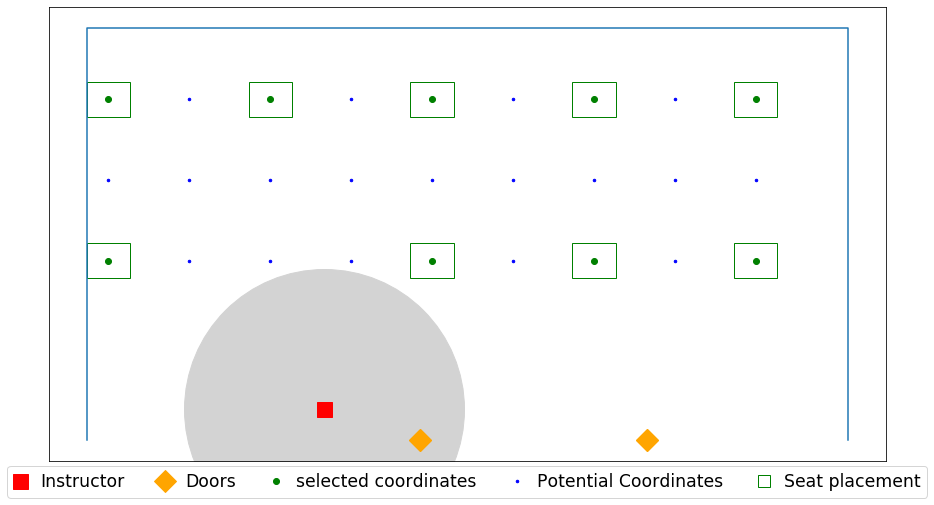

In [97]:
seat_loc = seat_coordinates(data_file, 5 )

# for i in (6,8,12):
obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=6, d1 = 10)
# pd.DataFrame(selected).to_csv('Skiles_202_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
# plt.savefig('Skiles_202_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[47.  25.5]]
seat dimension (W x H) are [[2.66666667 2.16666667]]
[[14.66666667  1.91666667]]
[(0, 10), (47.0, 10), (47.0, 25.5), (0, 25.5)]
Total number of seats  is 630


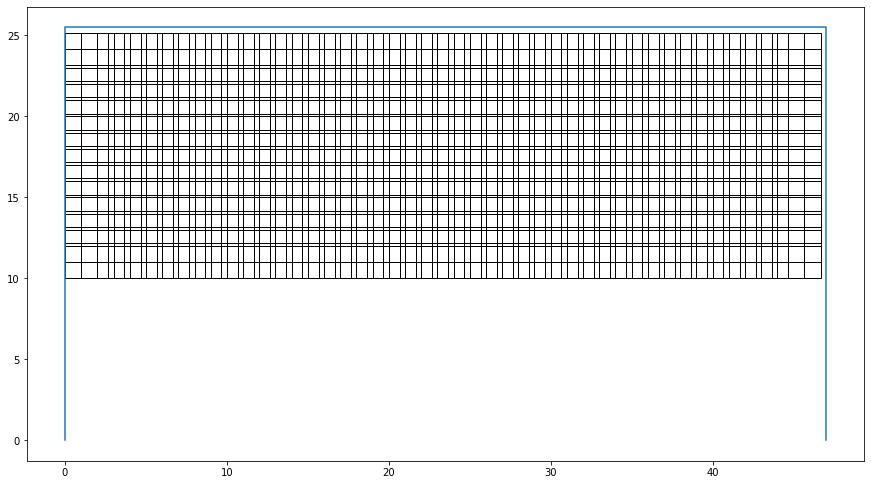

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 24.0
Optimal selection of seats (index):
0
6
18
24
32
38
44
57
290
296
315
321
329
347
353
359
558
585
591
597
609
615
623
629
room dimension (W x H) are [[47.  25.5]]
seat dimension (W x H) are [[2.66666667 2.16666667]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 14.0
Optimal selection of seats (index):
0
23
32
44
60
232
308
342
405
419
592
606
618
628
room dimension (W x H) are [[47.  25.5]]
seat dimension (W x H) are [[2.66666667 2.16666667]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
18
31
43
585
598
616
629
room dimension (W x H) are [[47.  25.5]]
seat dimension (W x H) are [[2.66666667 2.16666667]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal

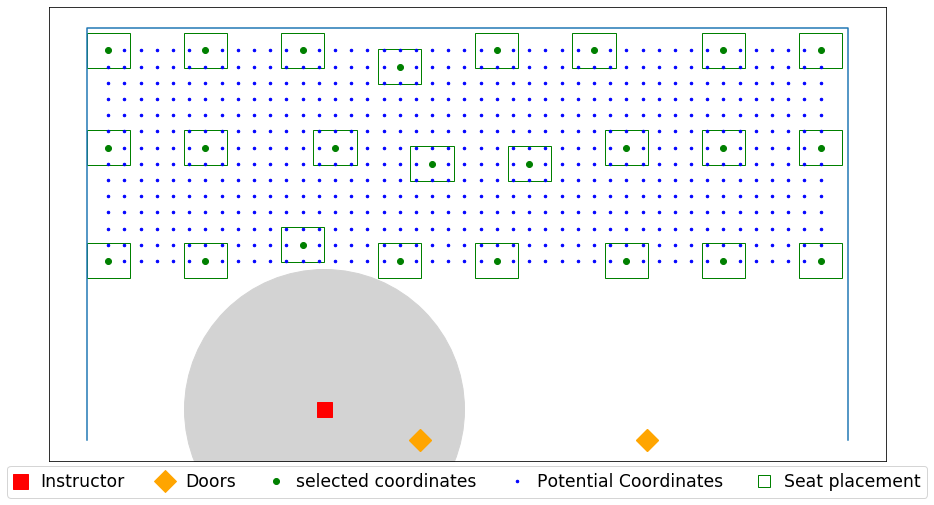

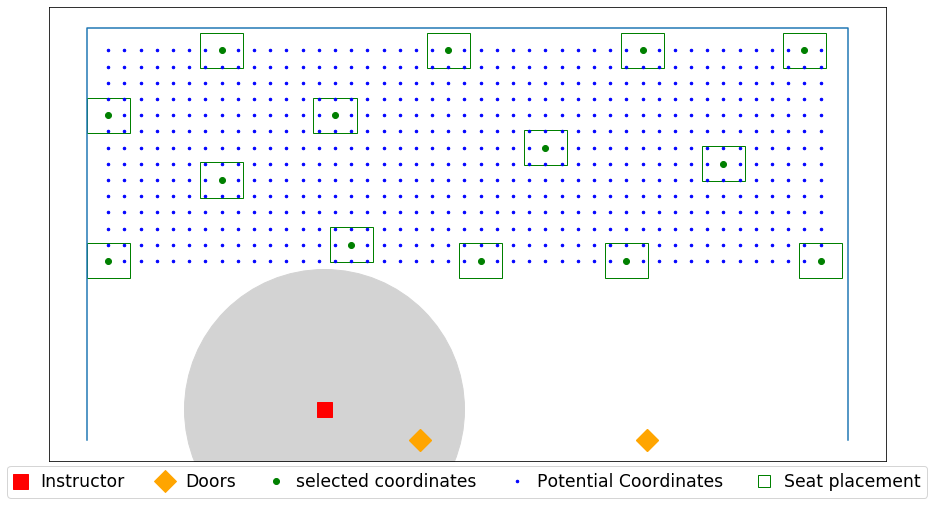

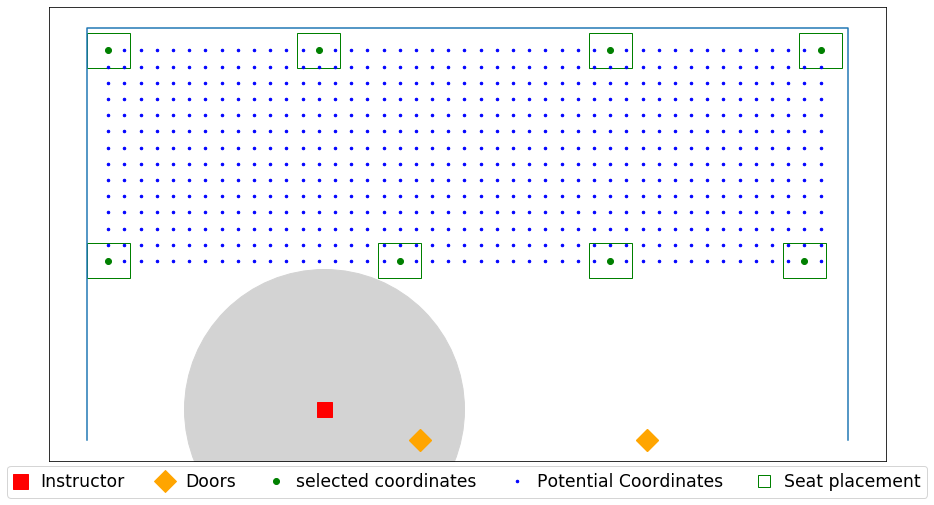

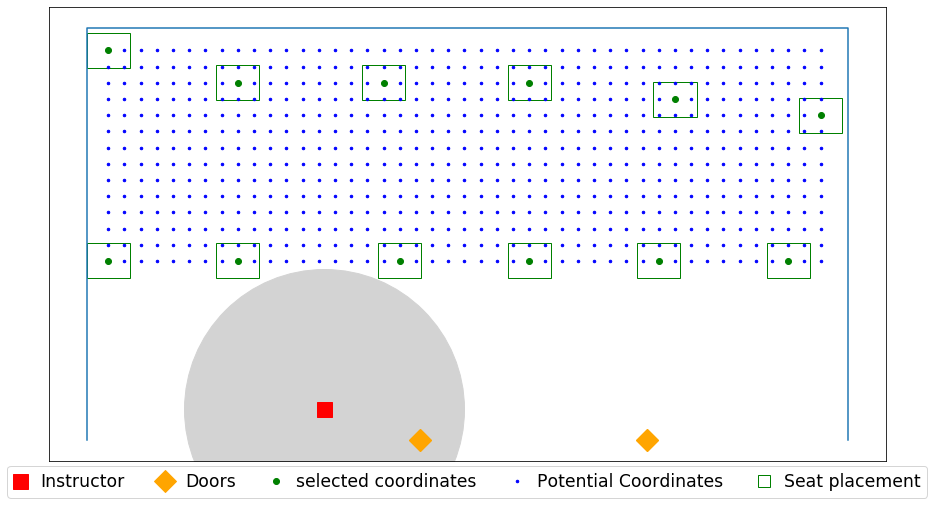

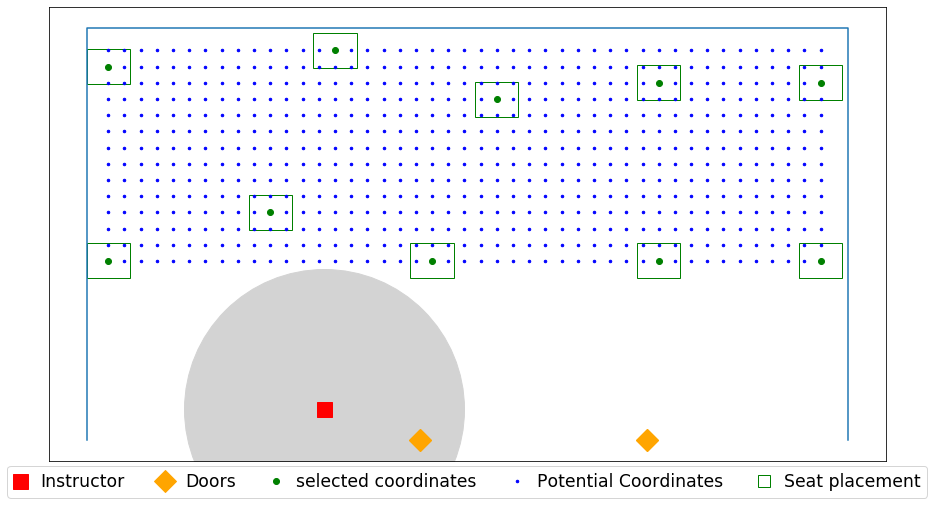

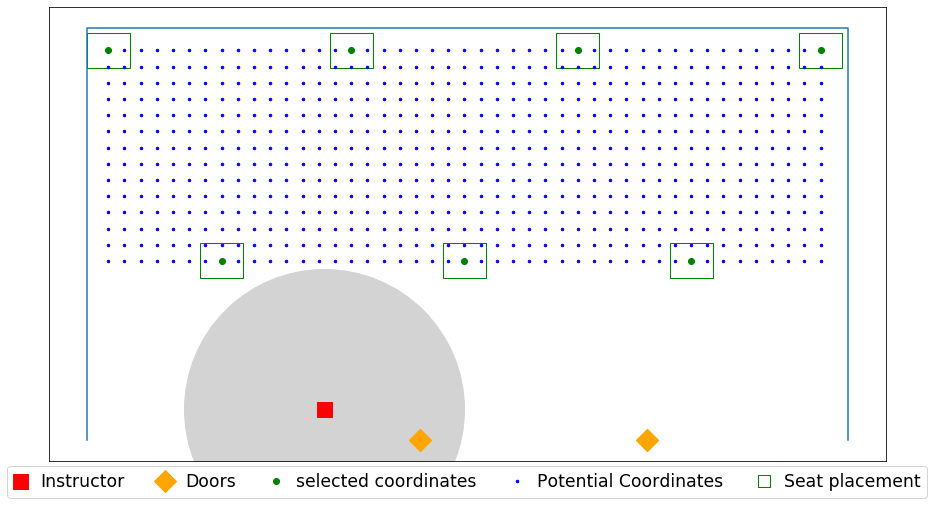

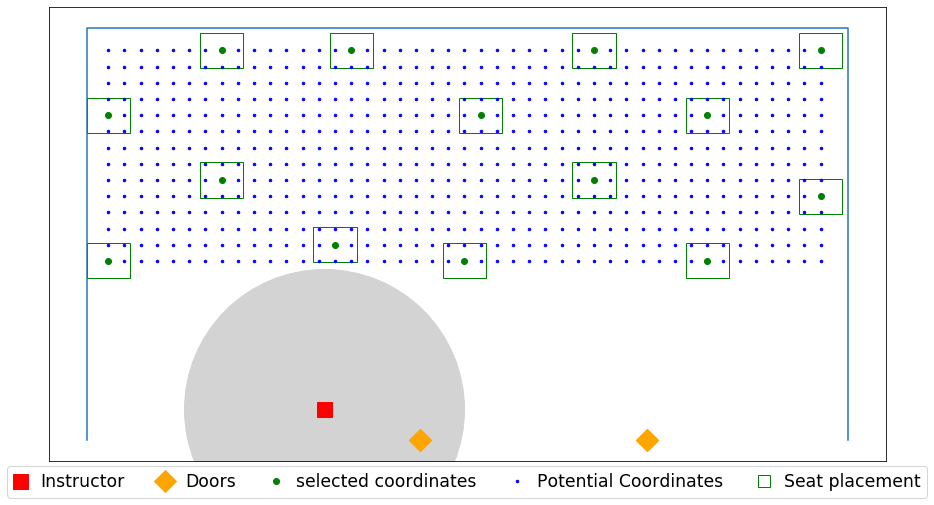

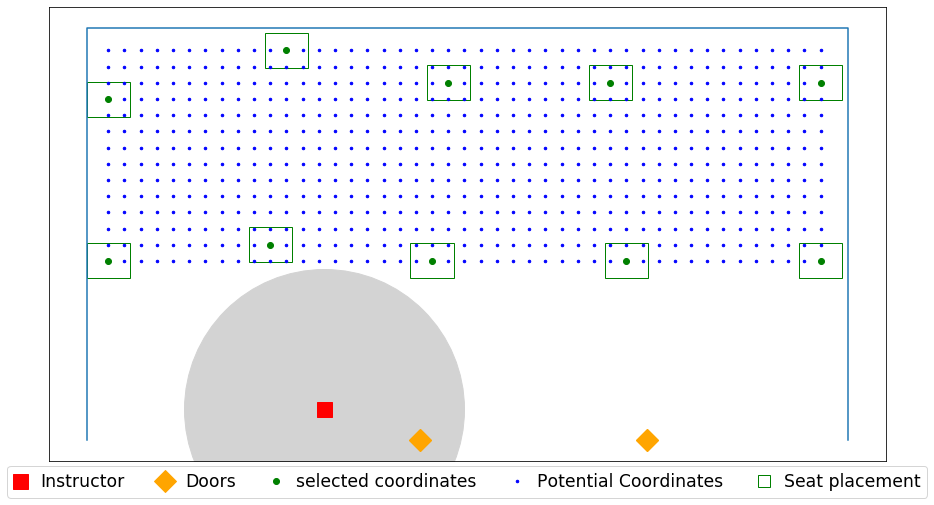

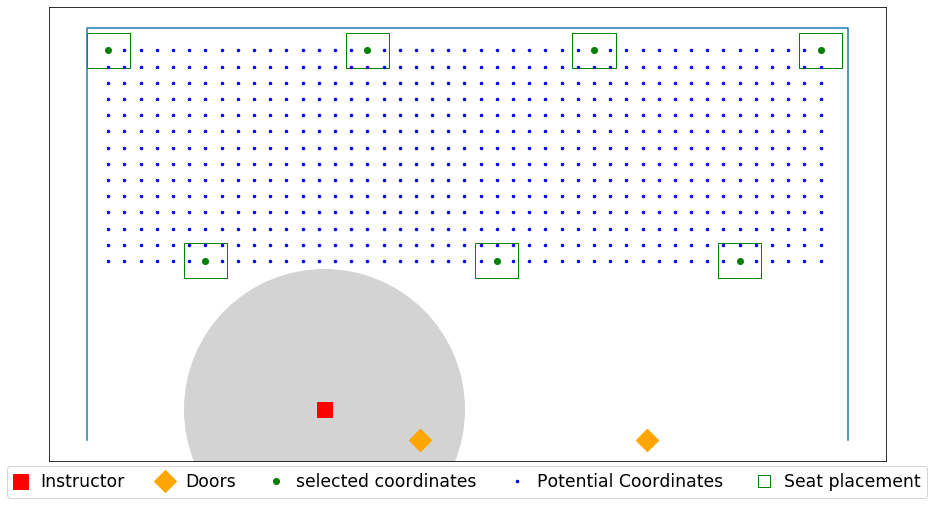

In [98]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 256

In [134]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_256_P.xlsx'

Name = 'Skiles_256_'

room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (19.5, 10), (19.5, 35), (0, 35)]
Total number of seats  is 414


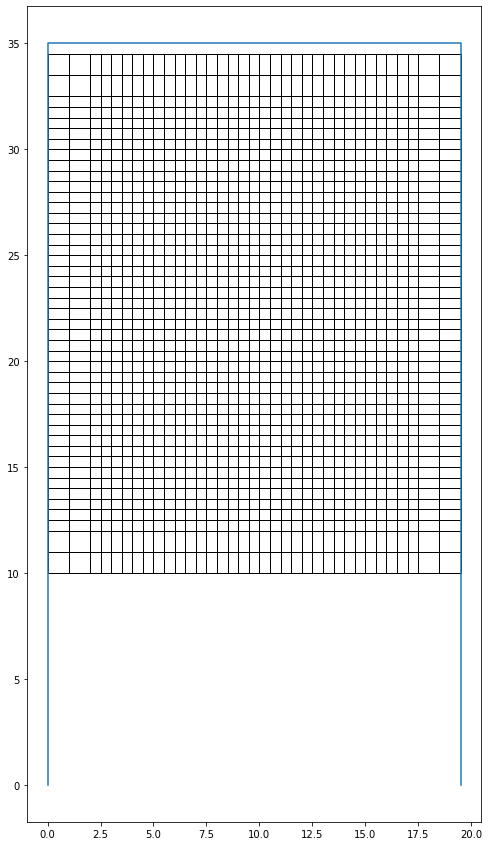

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
53
144
152
196
288
296
340
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (19.5, 10), (19.5, 35), (0, 35)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
8
53
130
252
260
269
396
405
413
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (19.5, 10), (19.5, 35), (0, 35)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
6
30
107
108
114
174
216
222
299
305
329
396
406
412
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (19.5, 10), (19.5, 35), (0, 35)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
10
178
180
360
395
room dimension (W x H

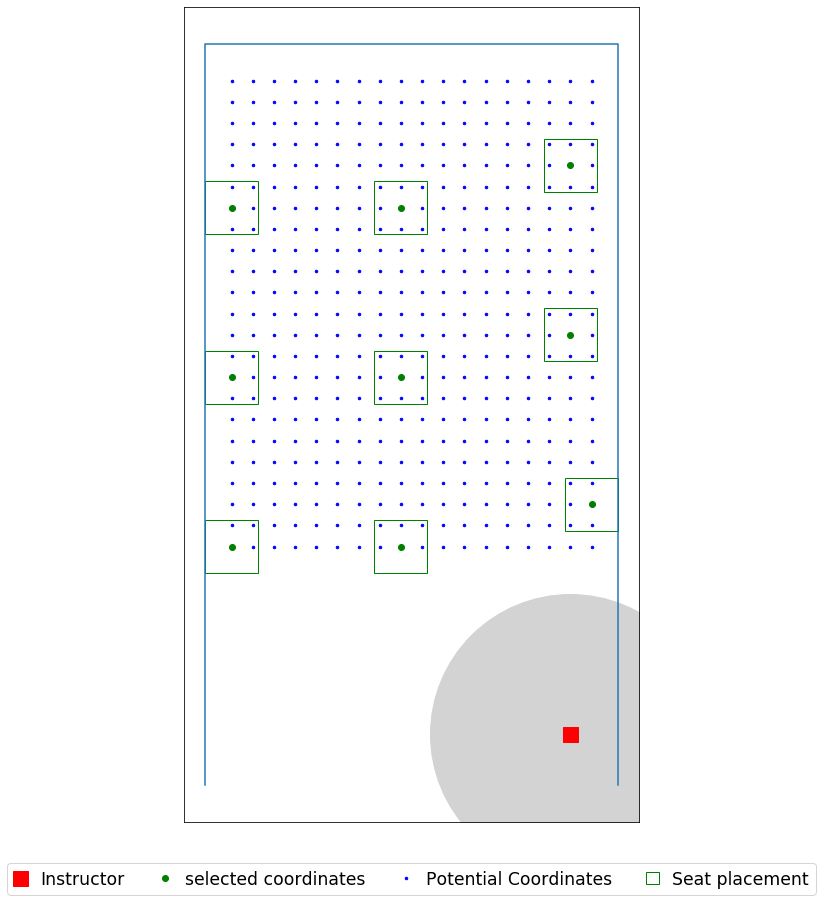

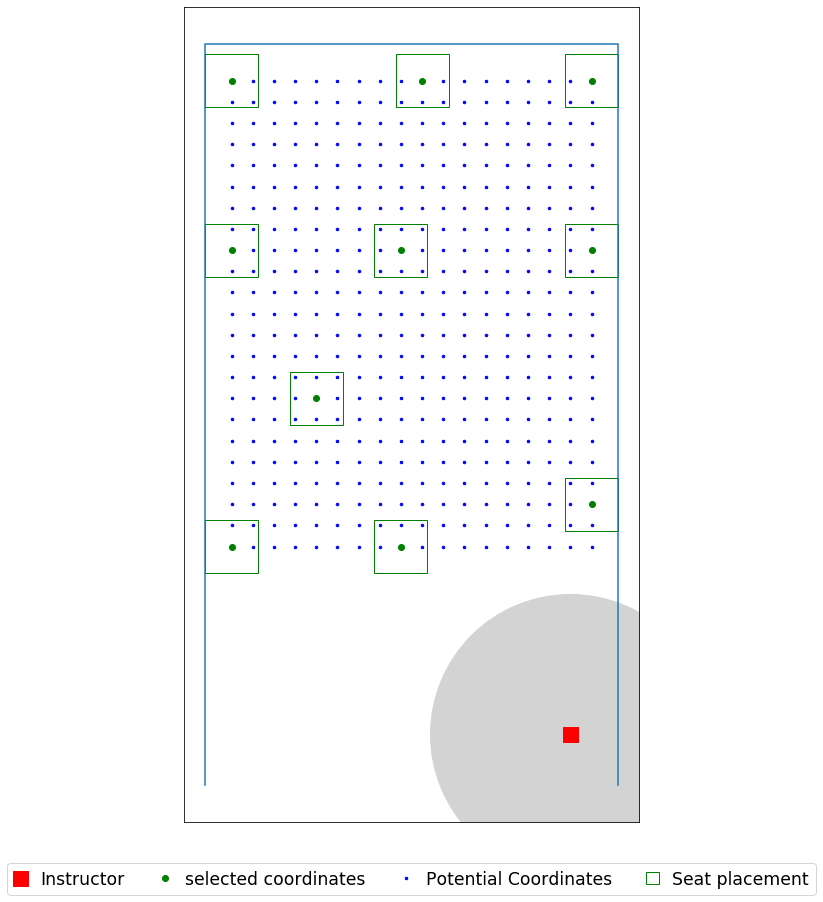

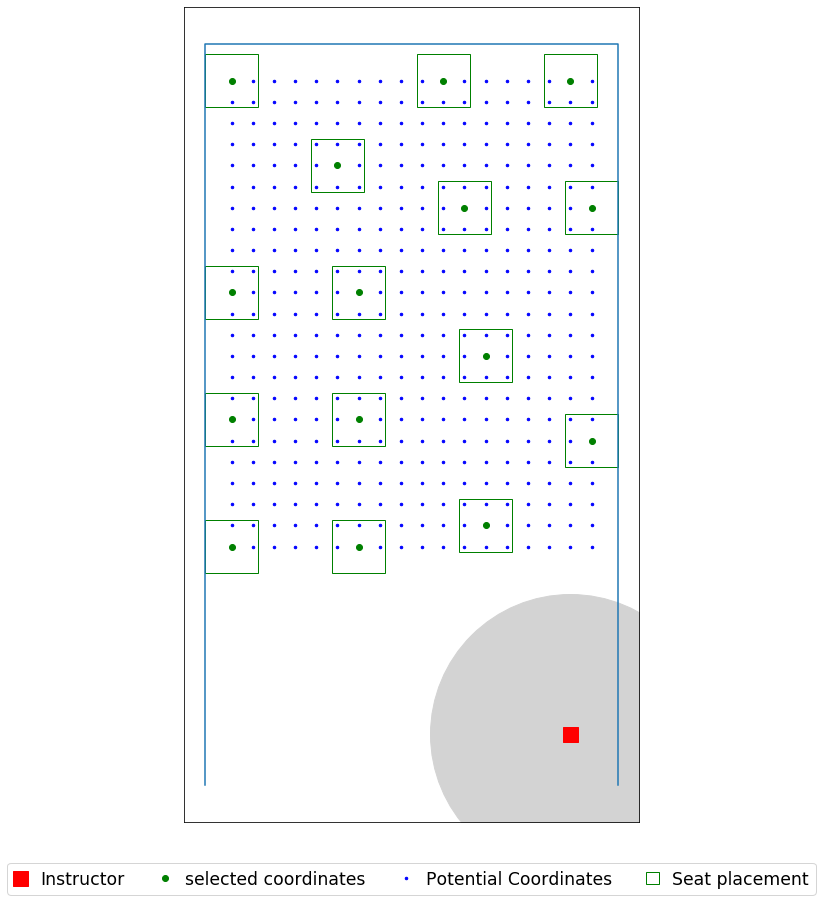

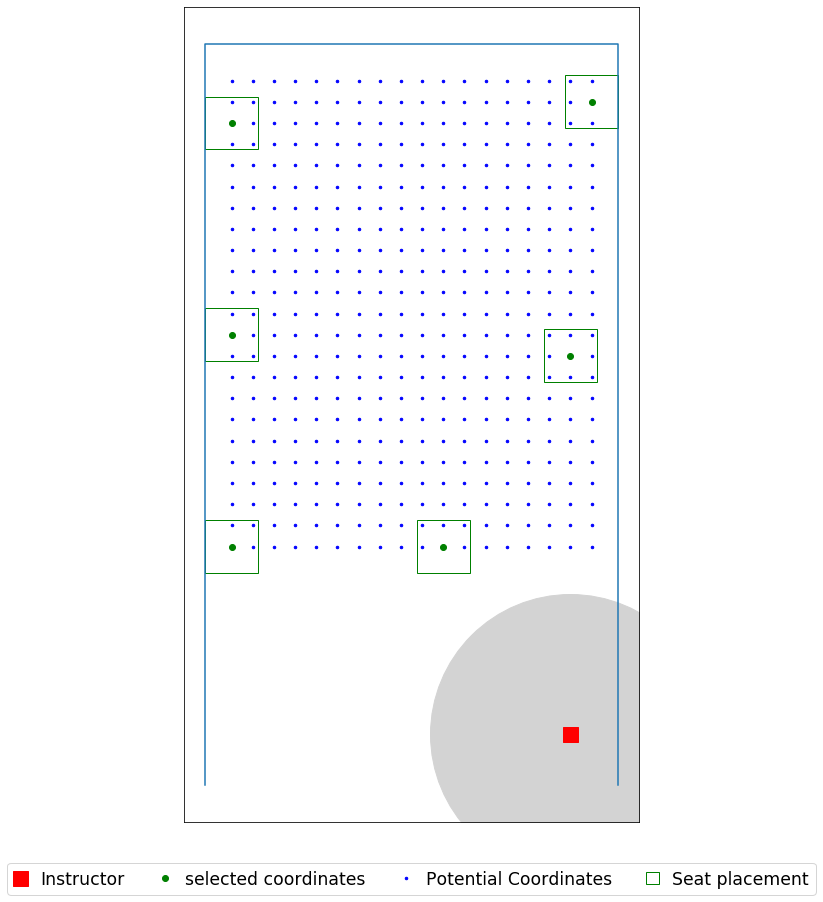

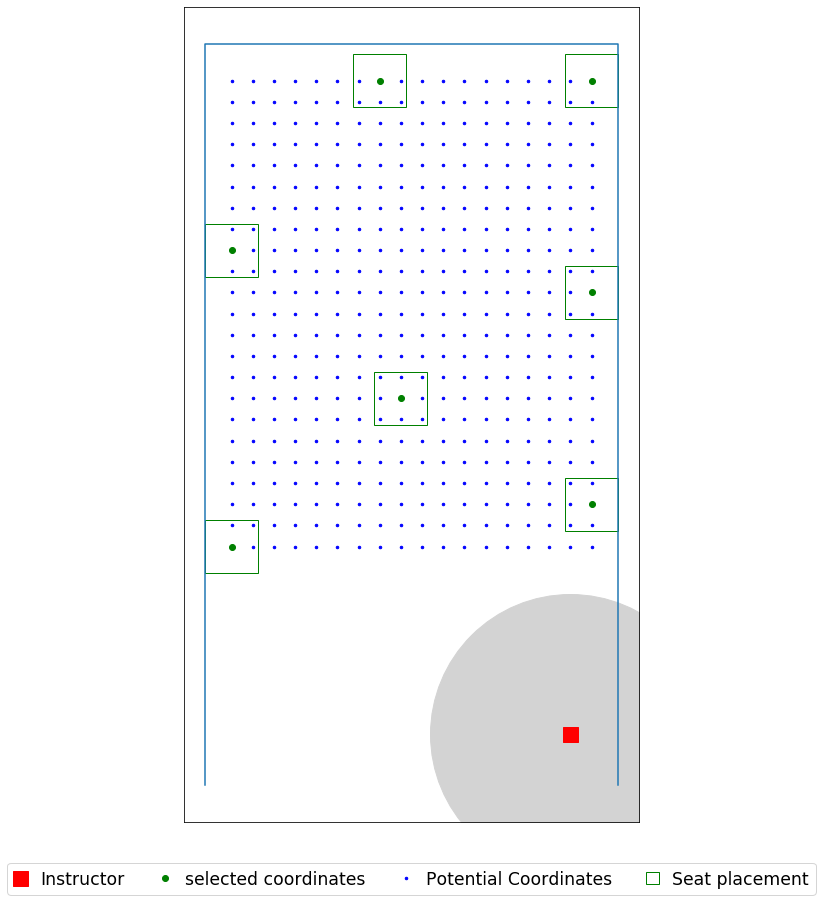

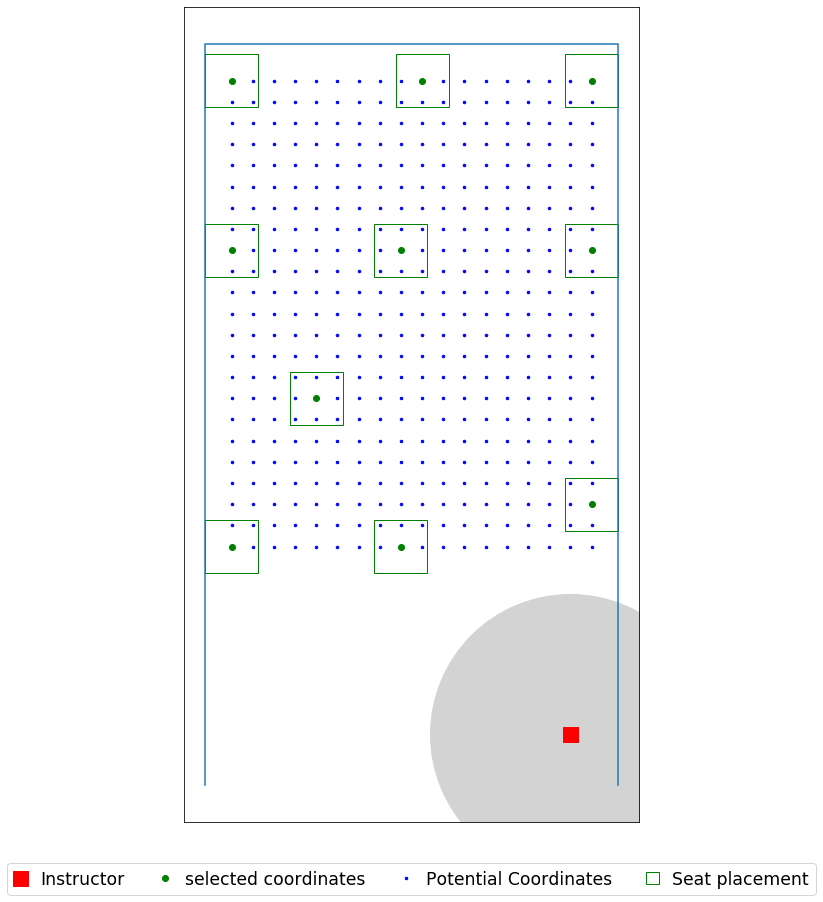

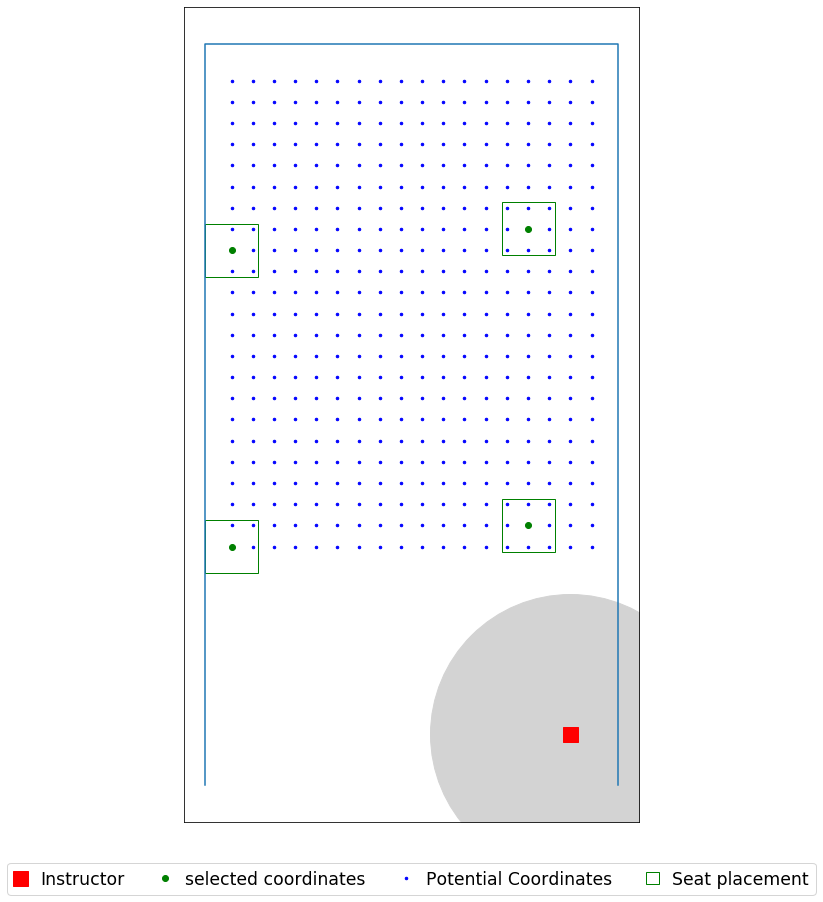

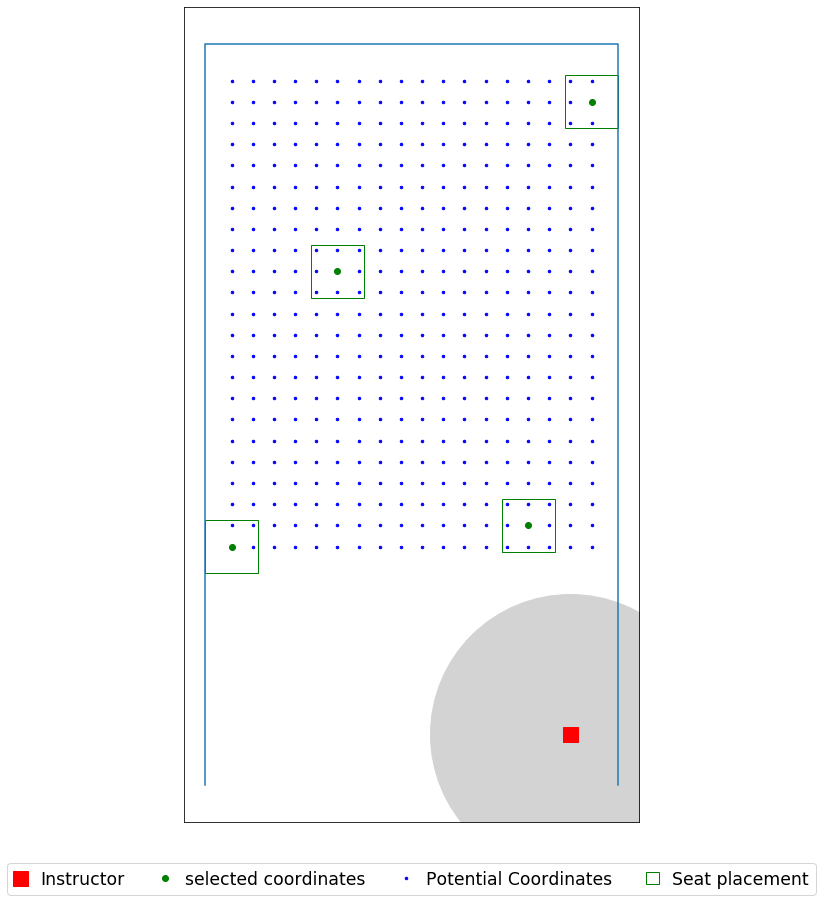

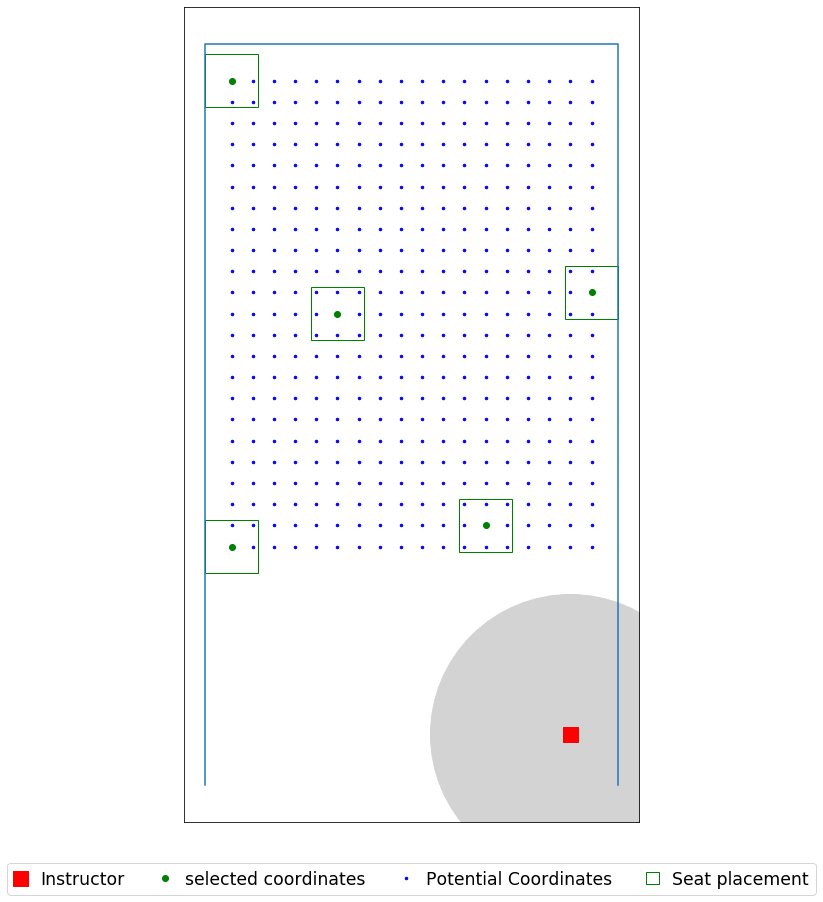

In [135]:
seat_loc = seat_coordinates_type(data_file, 1)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type = 1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 257

In [136]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_257_P.xlsx'

Name = 'Skiles_257_'

room dimension (W x H) are [[20.833333333333332 40.083333333333336]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 40.083333333333336), (0, 40.083333333333336)]
Total number of seats  is 532


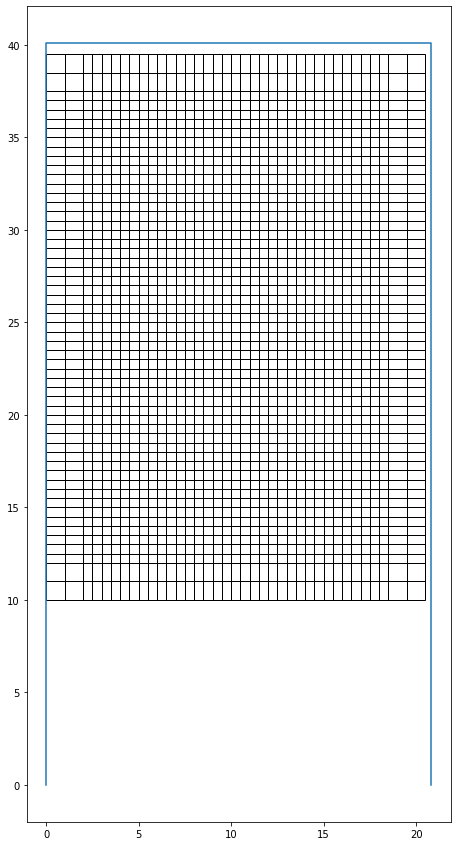

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
8
56
152
160
206
304
312
358
456
464
510
room dimension (W x H) are [[20.833333333333332 40.083333333333336]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 40.083333333333336), (0, 40.083333333333336)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
11
94
152
163
246
292
361
394
513
523
531
room dimension (W x H) are [[20.833333333333332 40.083333333333336]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 40.083333333333336), (0, 40.083333333333336)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
6
31
56
114
120
145
170
228
234
259
284
342
348
373
398
456
462
487
512
room dimension (W x H) are [[20.833333333333332 40.083333333

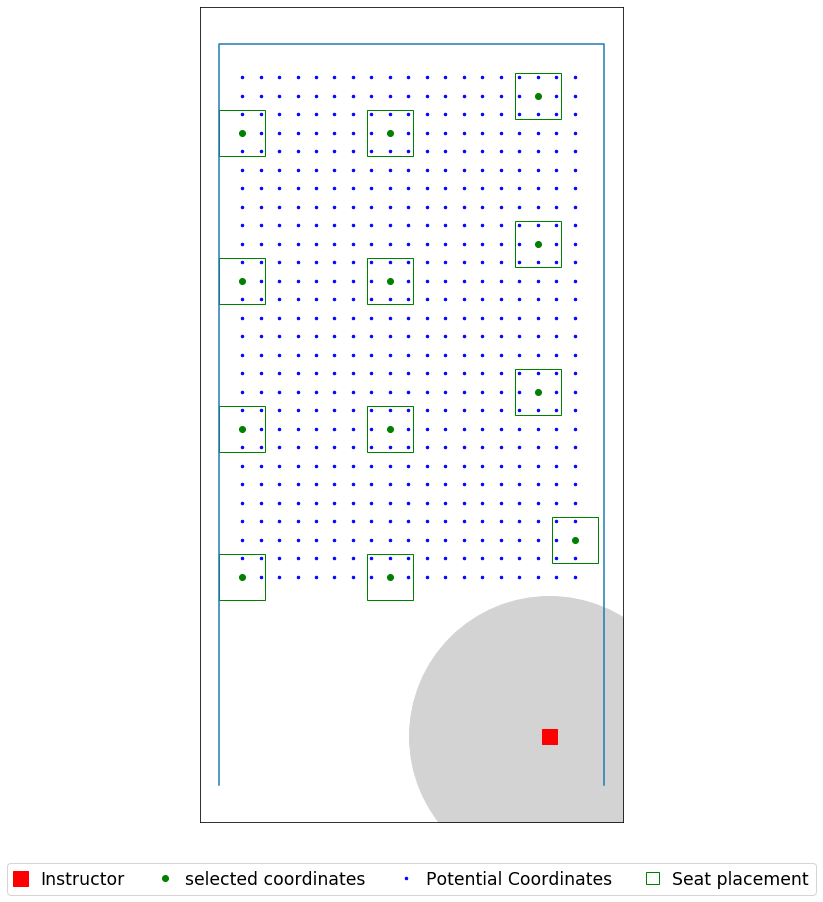

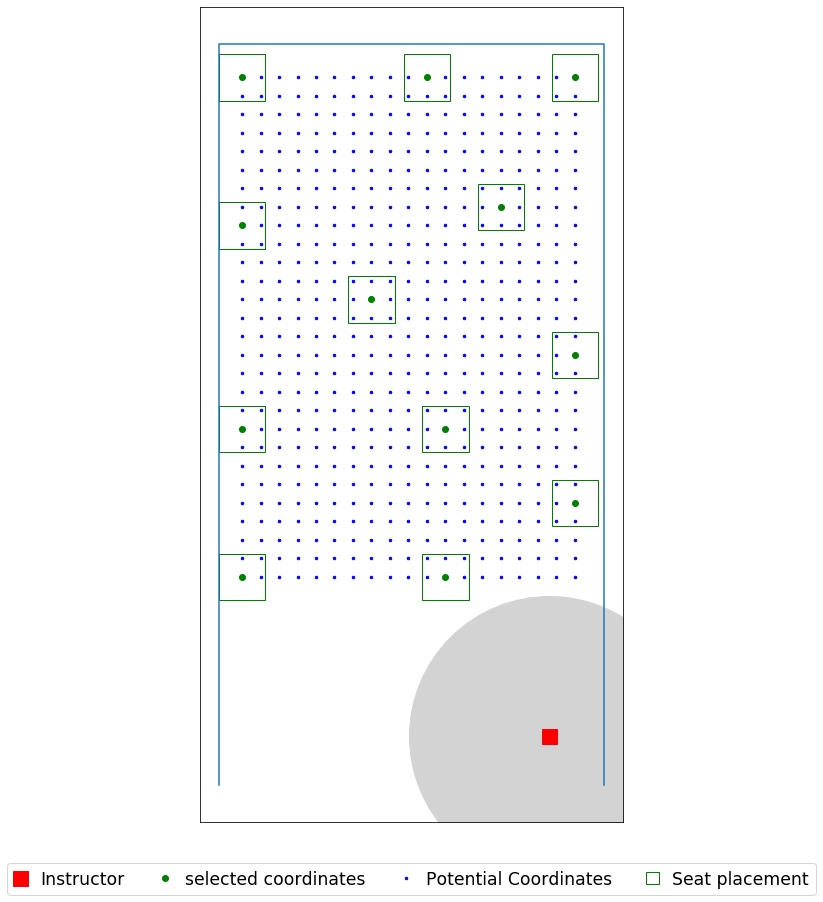

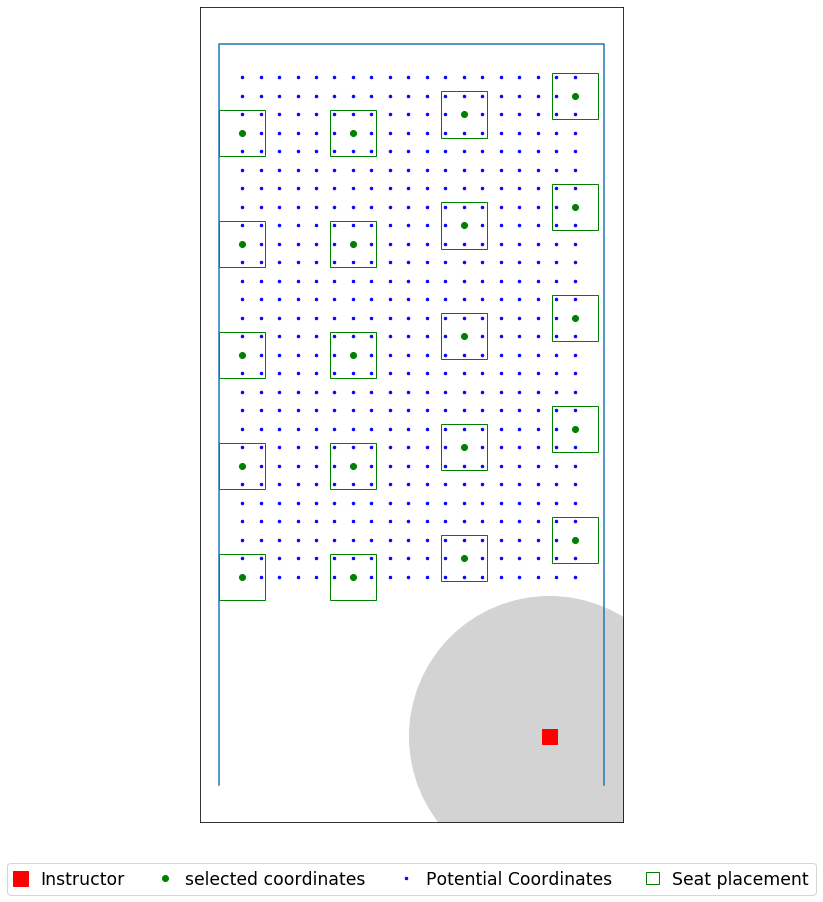

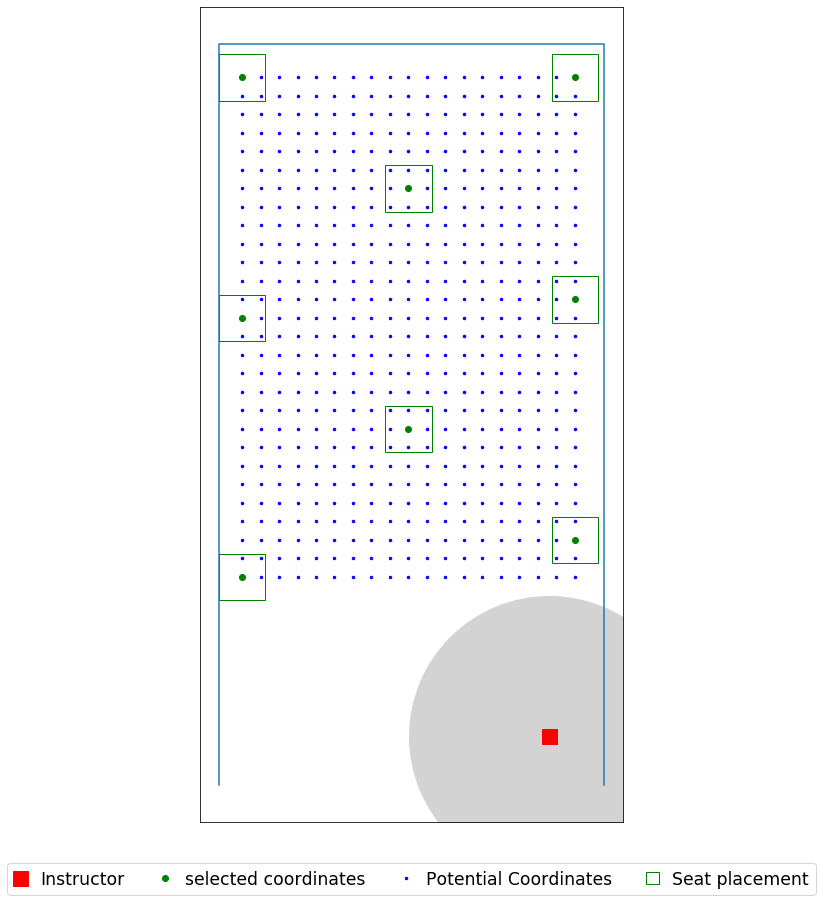

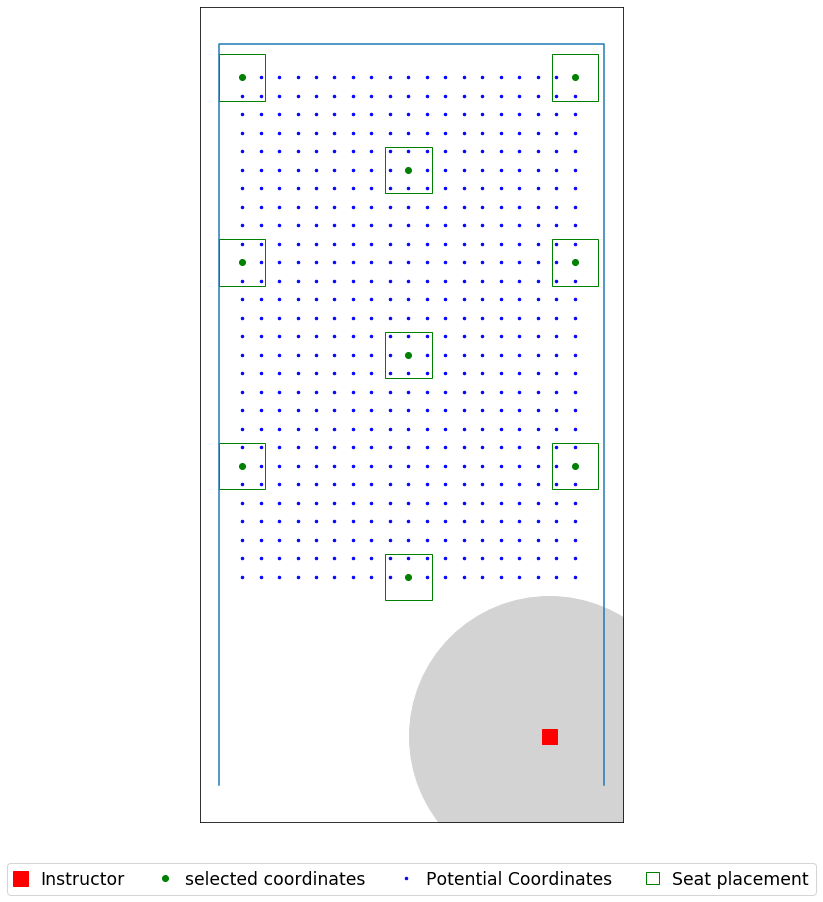

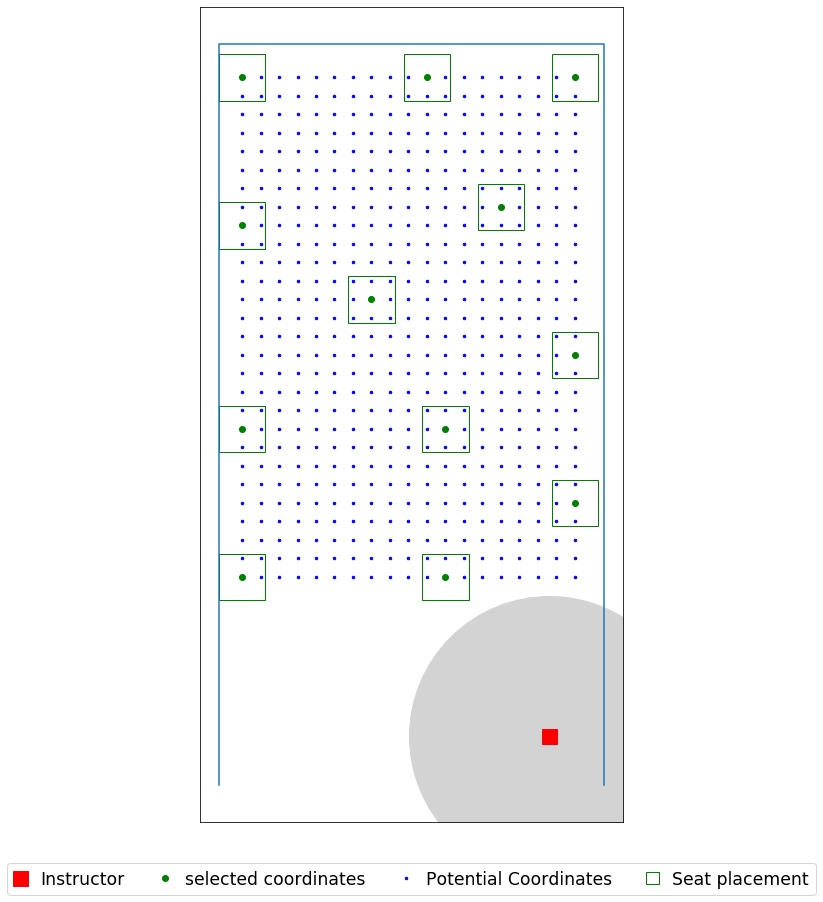

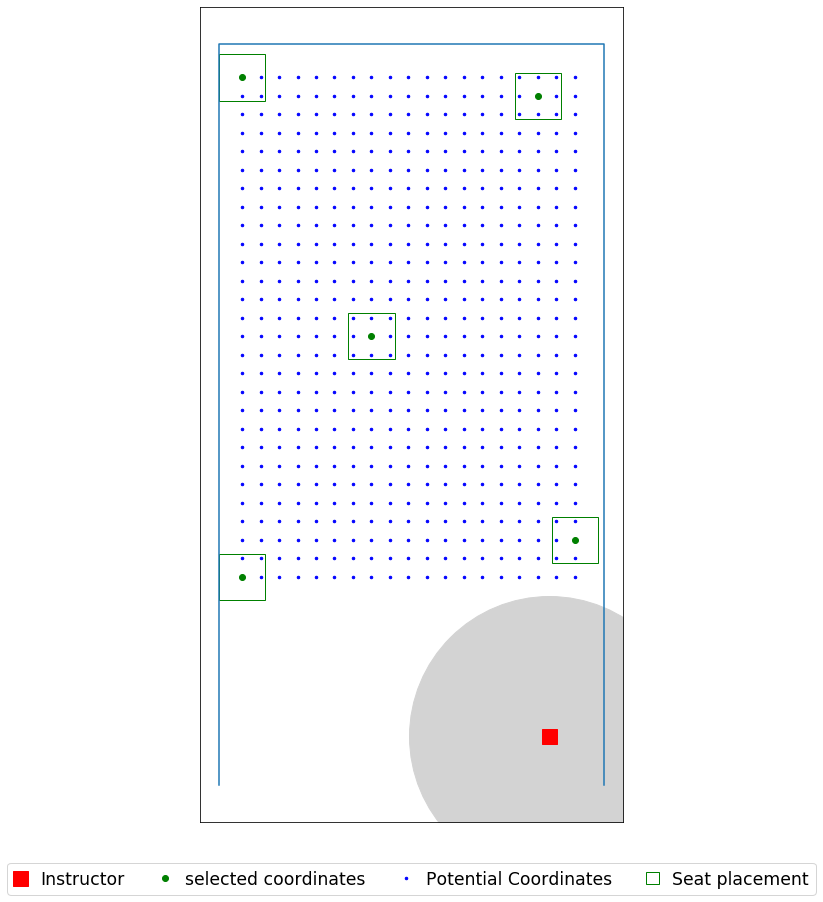

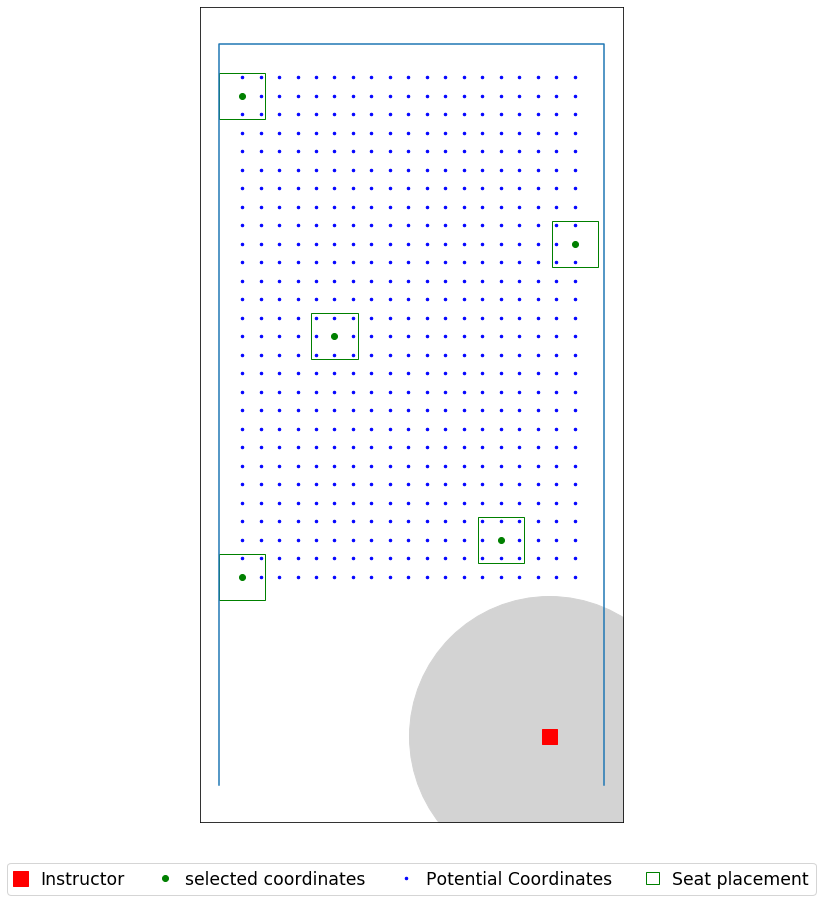

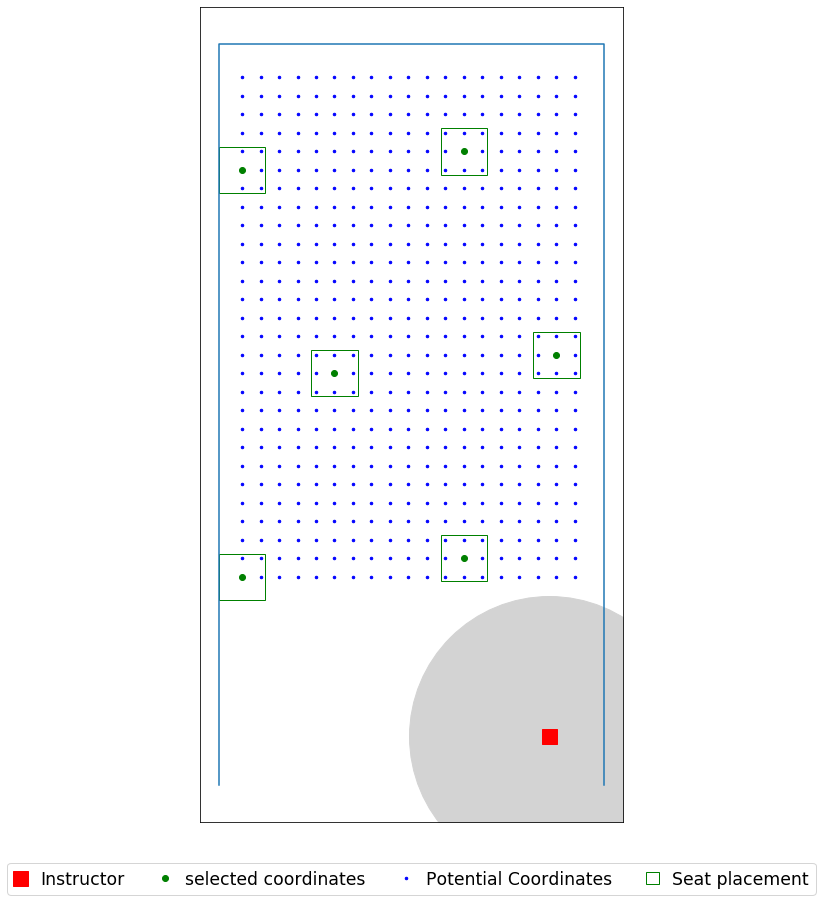

In [137]:
seat_loc = seat_coordinates_type(data_file, 1)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type = 1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 268

In [125]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_268_P_T2.xlsx'

Name = 'Skiles_268_'

room dimension (W x H) are [[19.833333333333332 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.833333333333332, 0), (19.833333333333332, 25), (0, 25)]
Total number of seats  is 414


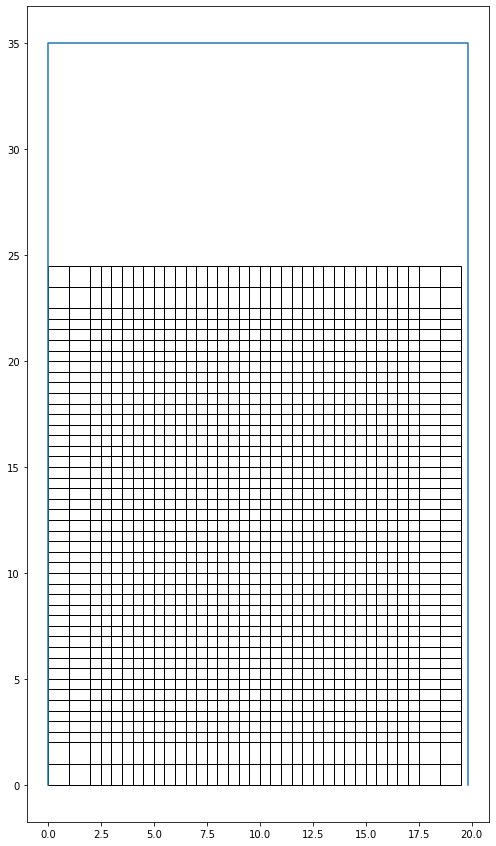

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
17
144
152
160
288
296
304
room dimension (W x H) are [[19.833333333333332 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.833333333333332, 0), (19.833333333333332, 25), (0, 25)]


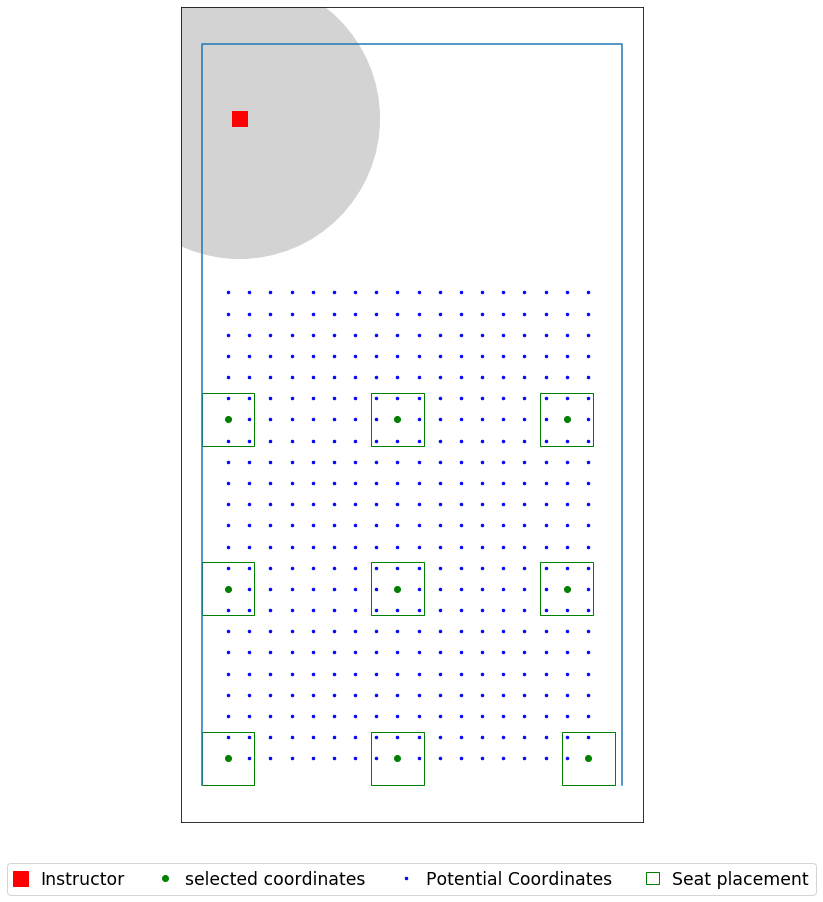

In [126]:
seat_loc = seat_coordinates_type(data_file, 2 )

# for i in (6,8,12):
obj, selected = fixed_seats_model_ins(data_file,seat_radius=1, d0=6, d1 = 10)
# pd.DataFrame(selected).to_csv('Skiles_202_'+ str(i) + 'ft_V2+V6_Instructor.csv', header = ('x','y'))
plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type =2 )
# plt.savefig('Skiles_202_'+str(i)+'ft_V2_V6_instructor' + ".jpg", dpi=500)

room dimension (W x H) are [[19.833333333333332 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.833333333333332, 0), (19.833333333333332, 25), (0, 25)]
Total number of seats  is 414


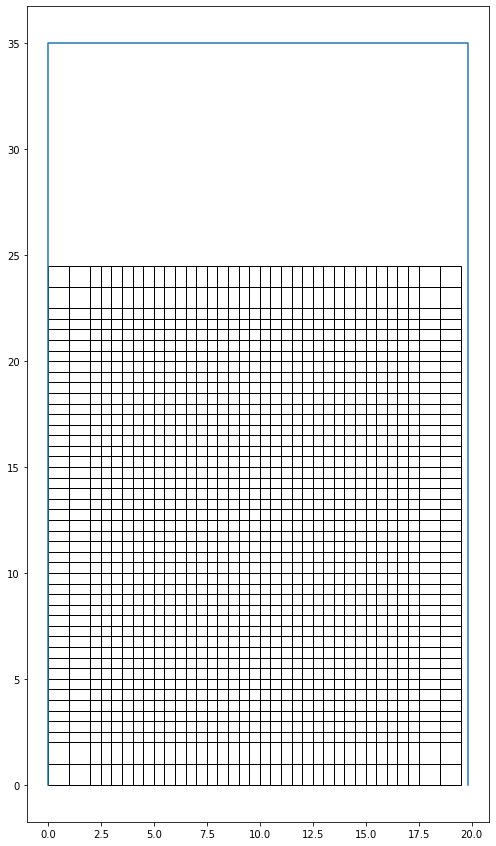

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
17
144
152
160
288
296
304
room dimension (W x H) are [[19.833333333333332 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.833333333333332, 0), (19.833333333333332, 25), (0, 25)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
8
17
130
139
260
269
360
405
413
room dimension (W x H) are [[19.833333333333332 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.833333333333332, 0), (19.833333333333332, 25), (0, 25)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
6
12
89
108
114
156
216
222
233
299
324
341
366
408
room dimension (W x H) are [[19.833333333333332 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.833333333333332, 0), (19.833333333333332, 25), (0, 25)]
The optimization status is OPTIMAL
Optima

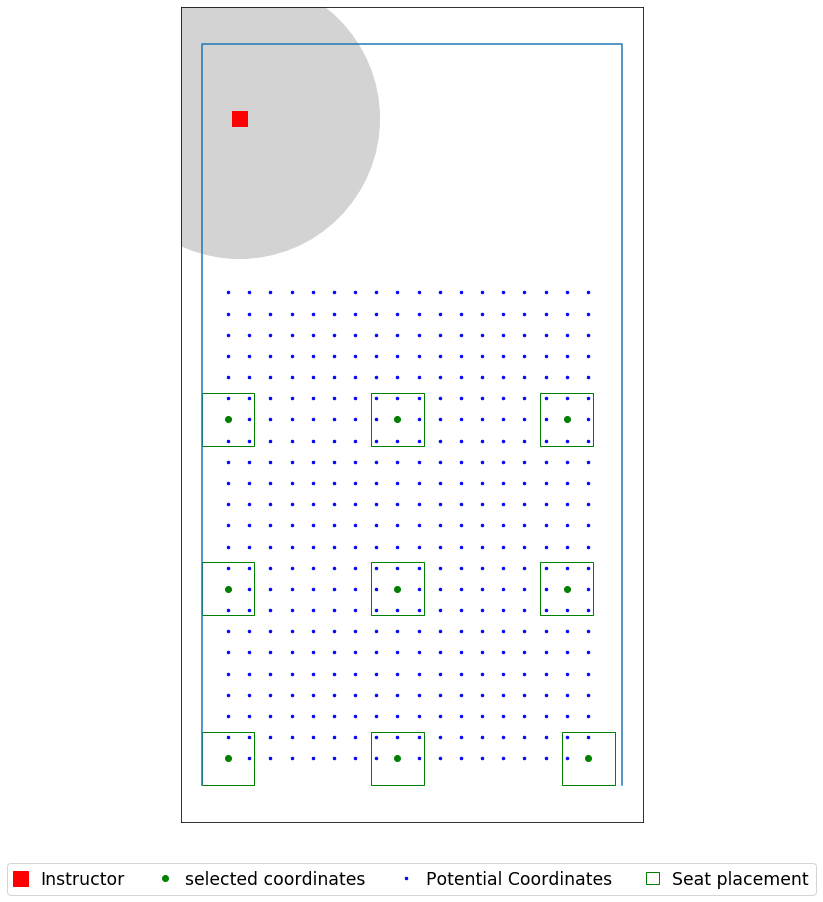

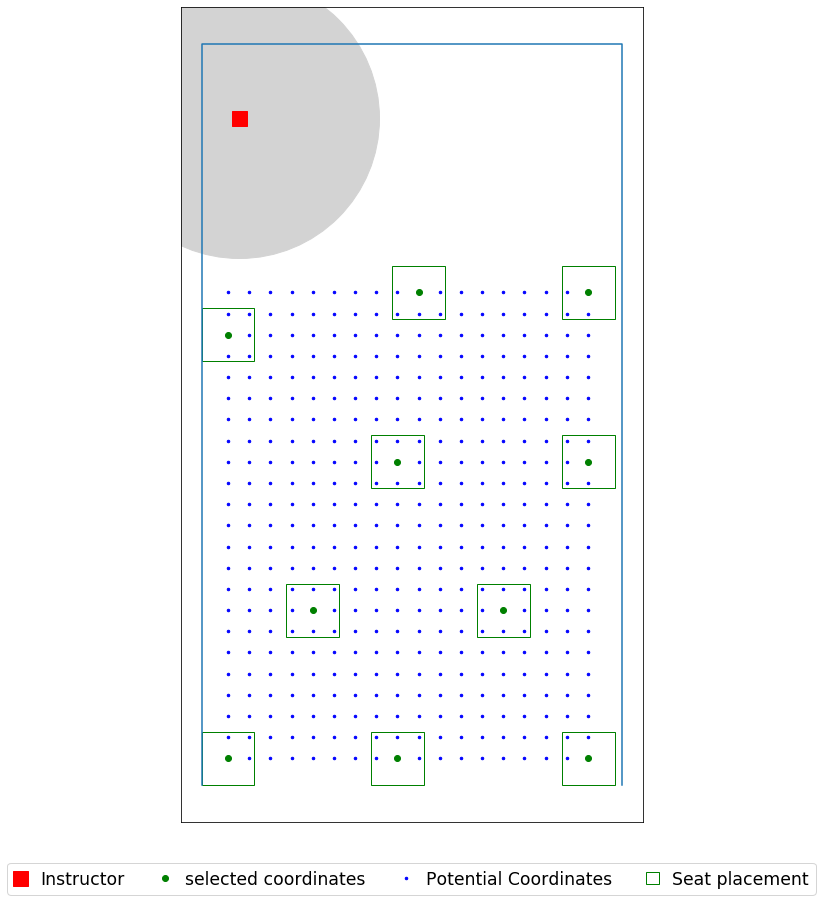

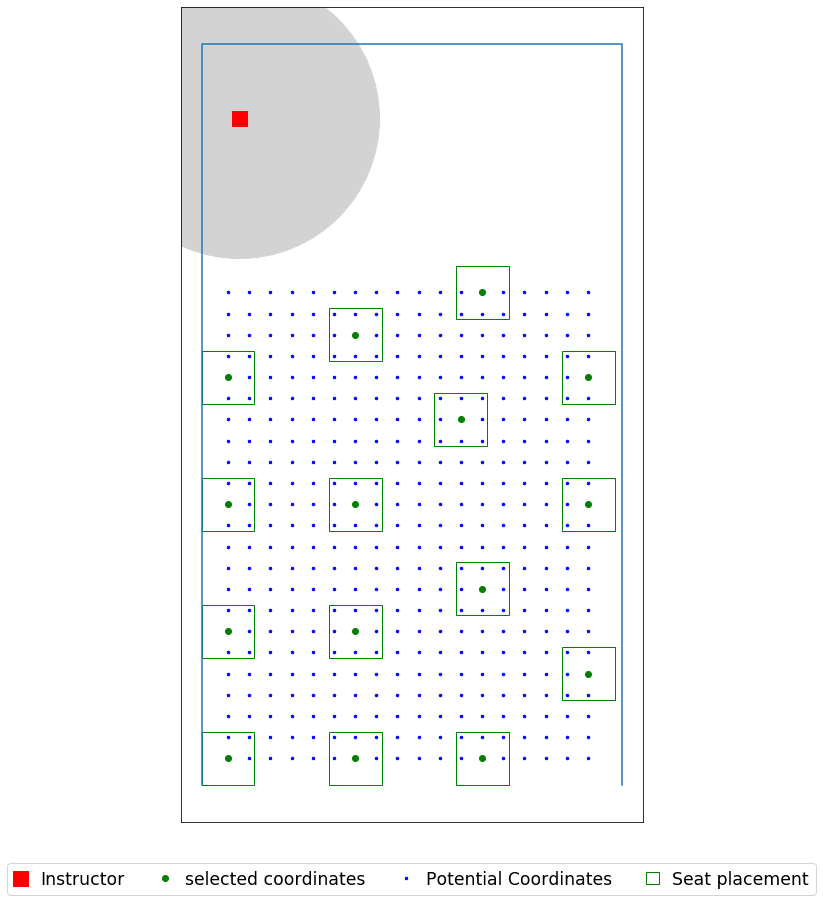

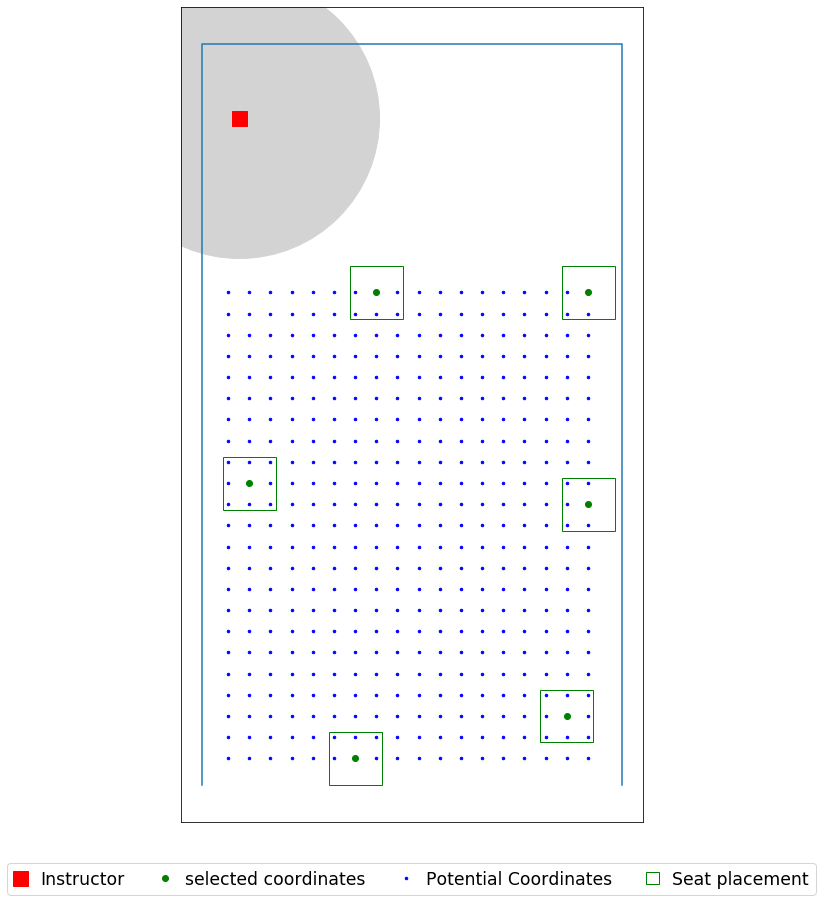

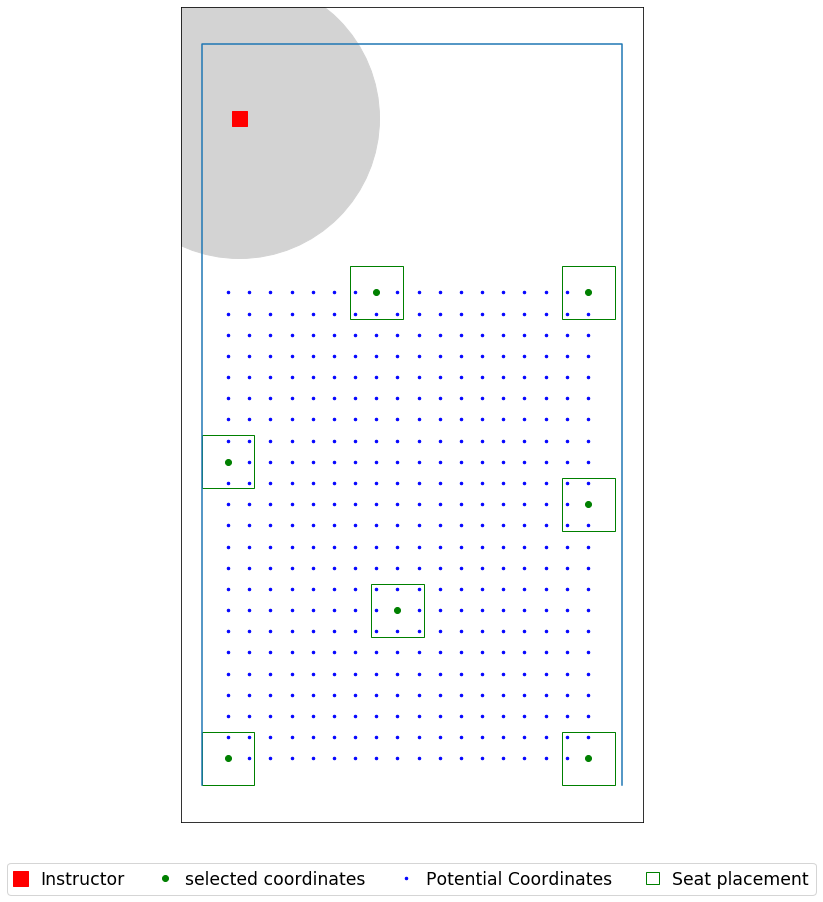

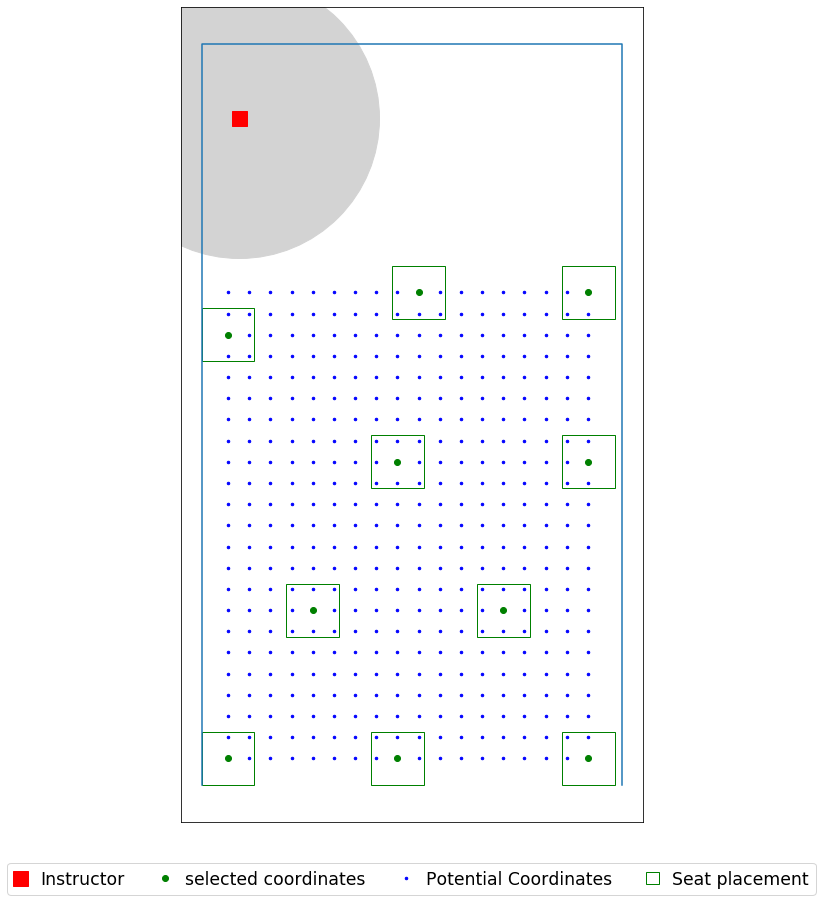

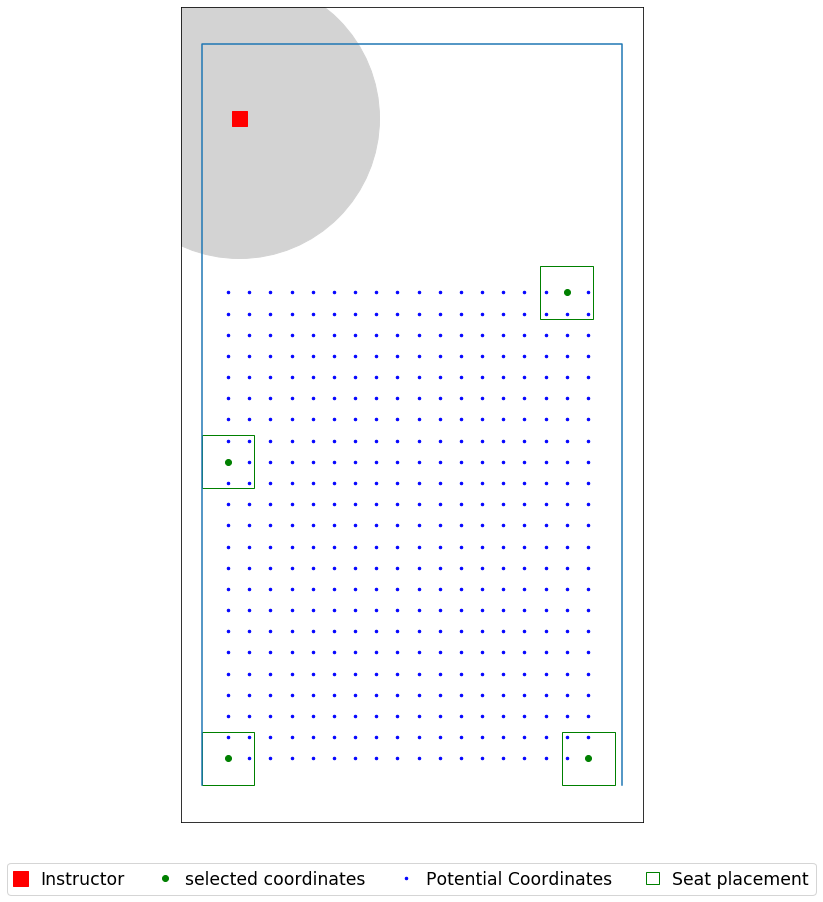

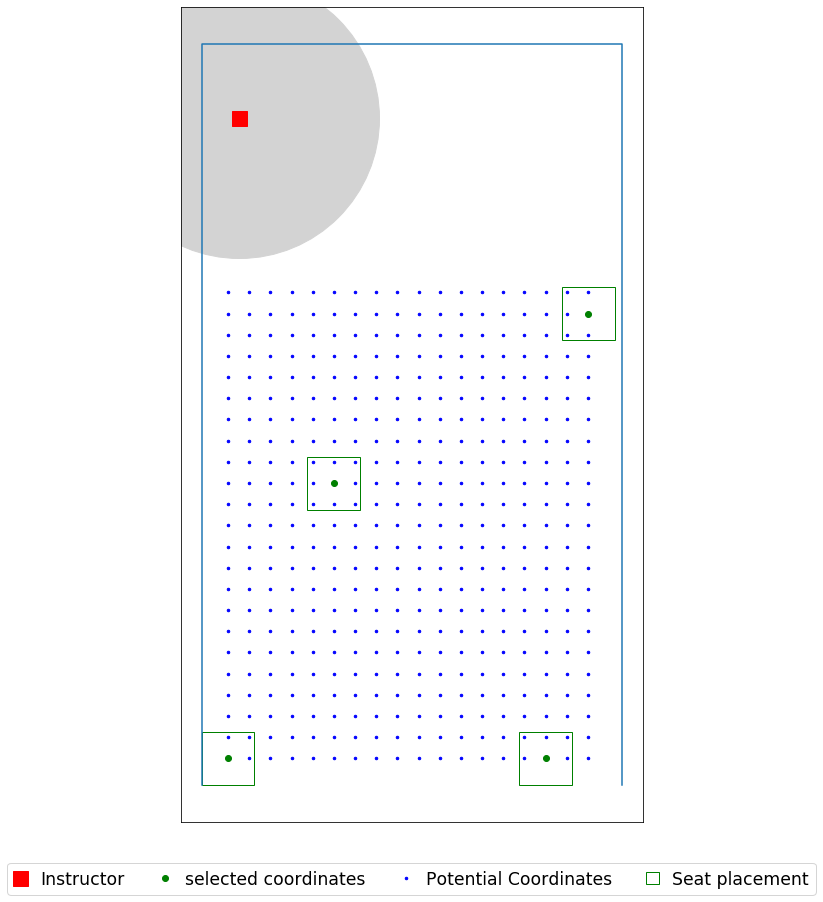

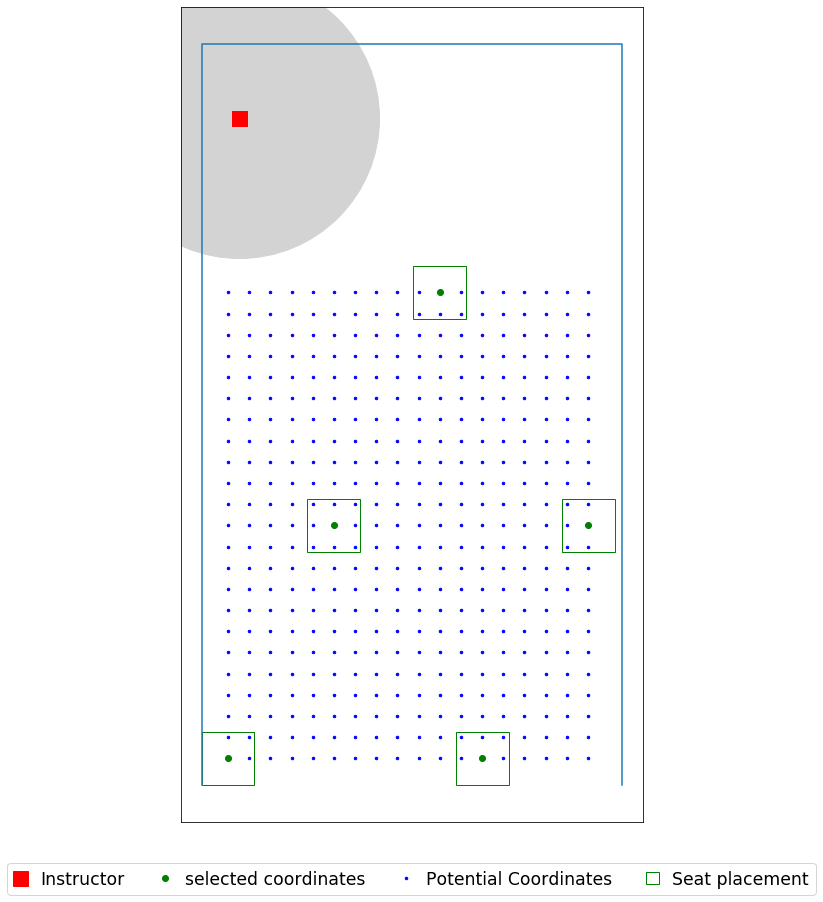

In [127]:
seat_loc = seat_coordinates_type(data_file, 2)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type = 2)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 270

In [128]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_270_P_T2.xlsx'

Name = 'Skiles_270_'

room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.5, 0), (19.5, 25), (0, 25)]
Total number of seats  is 414


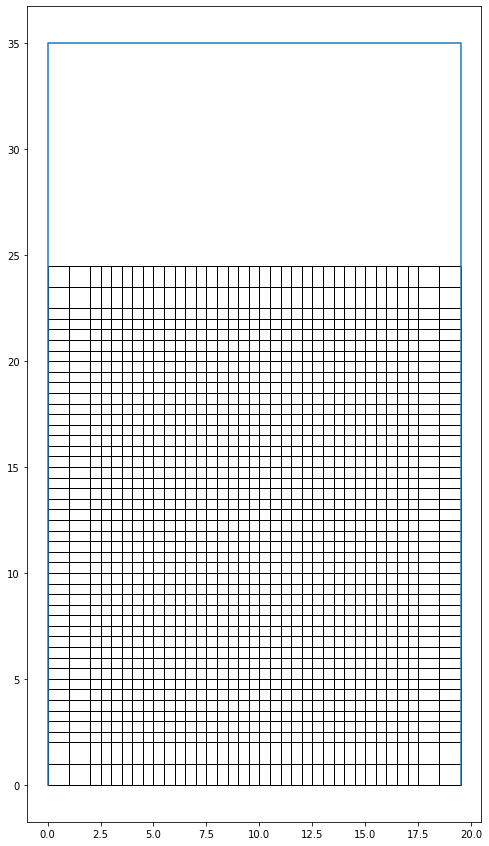

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
17
144
152
160
288
296
304
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.5, 0), (19.5, 25), (0, 25)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
9
17
130
139
252
260
269
396
404
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.5, 0), (19.5, 25), (0, 25)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
11
17
78
108
125
155
185
233
252
294
300
377
396
402
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (19.5, 0), (19.5, 25), (0, 25)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
17
173
180
379
389
room dimension (W x H) are 

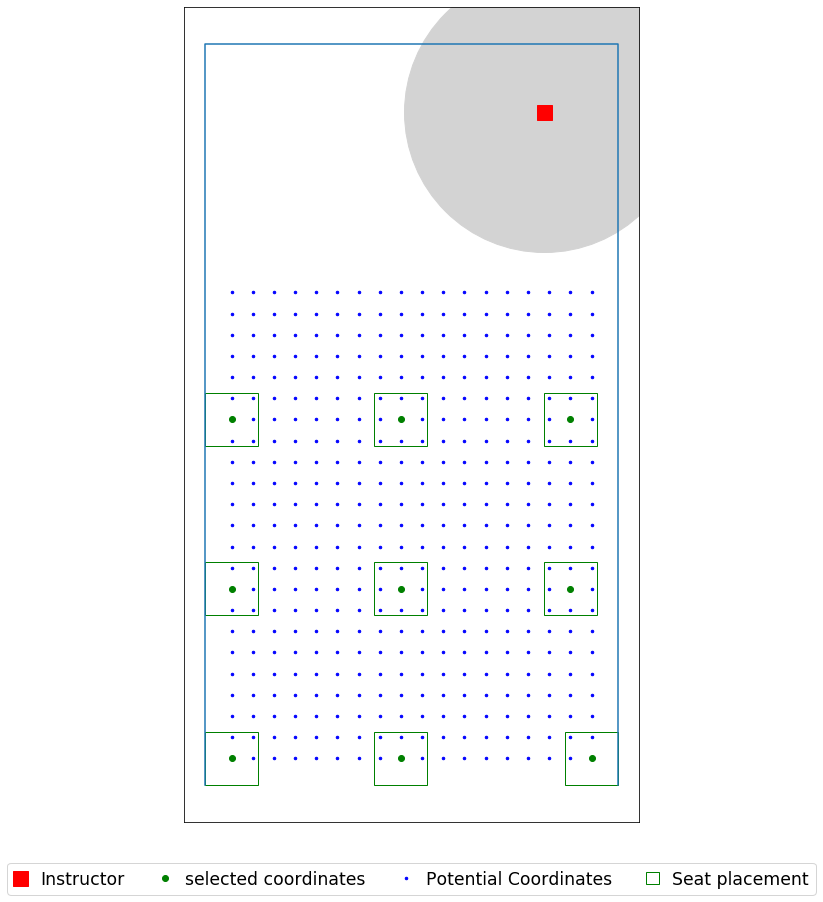

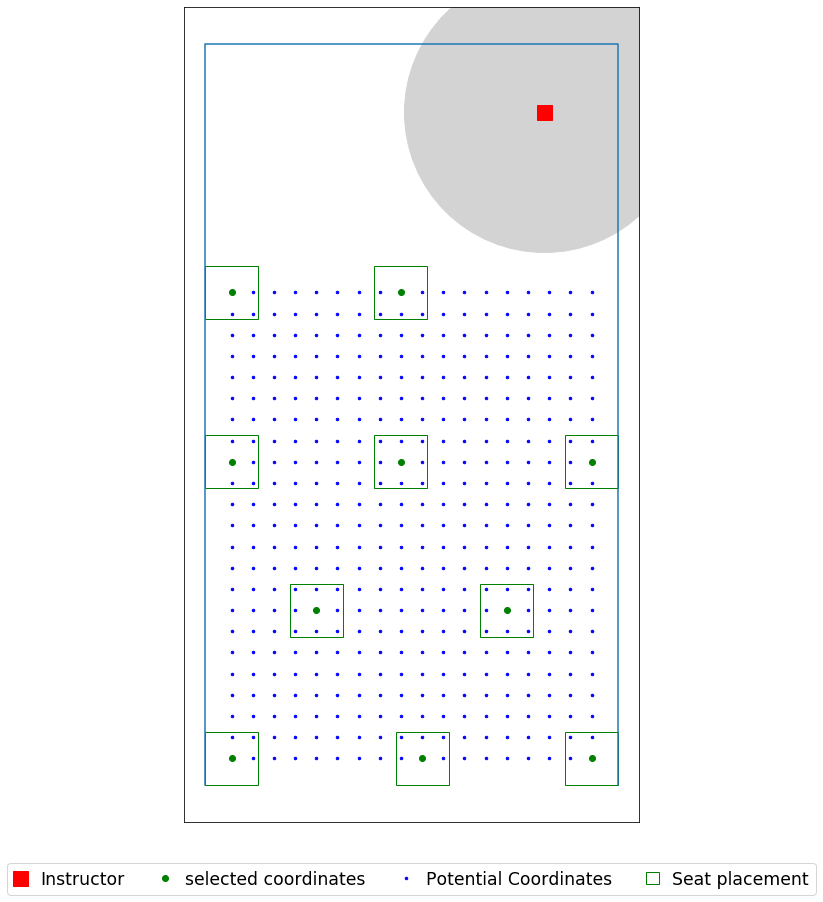

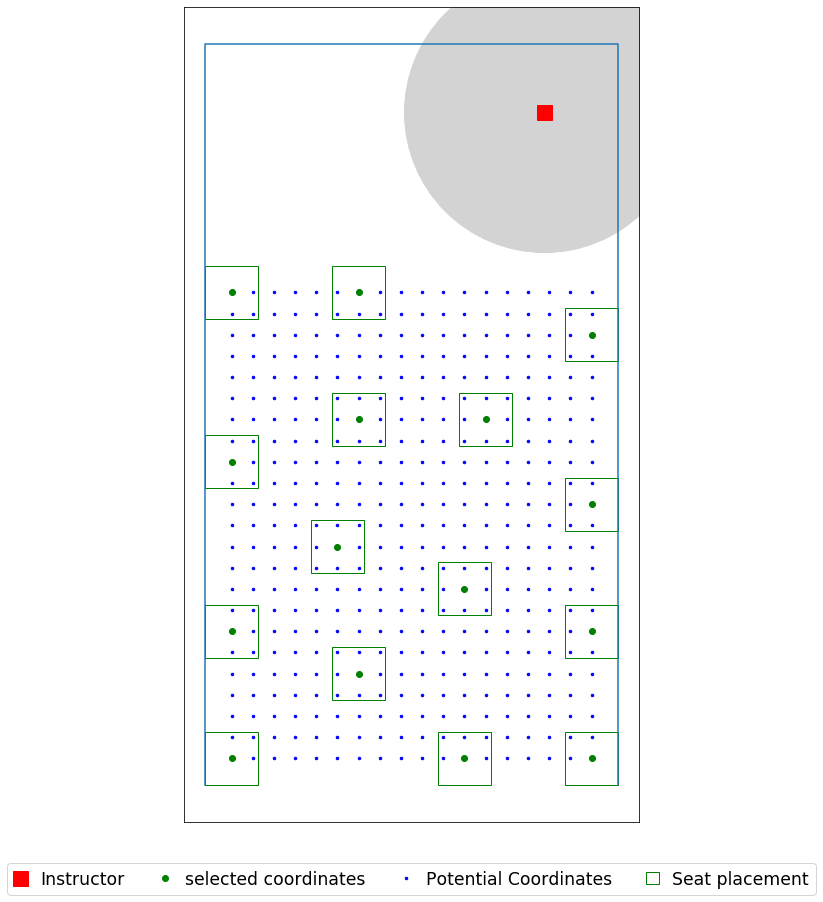

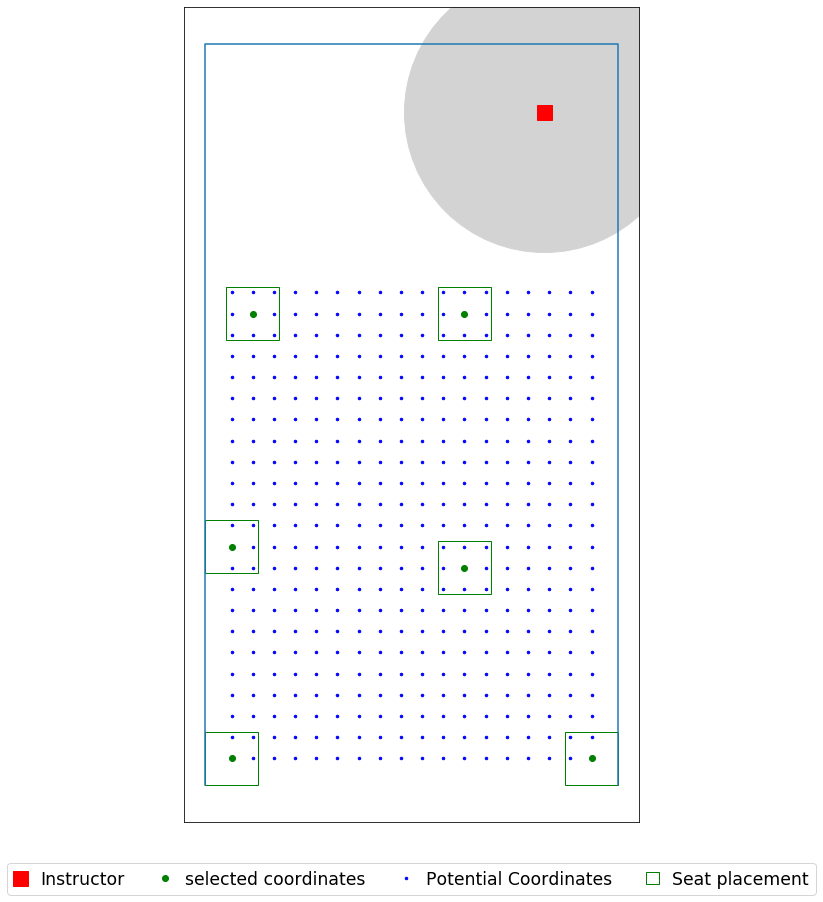

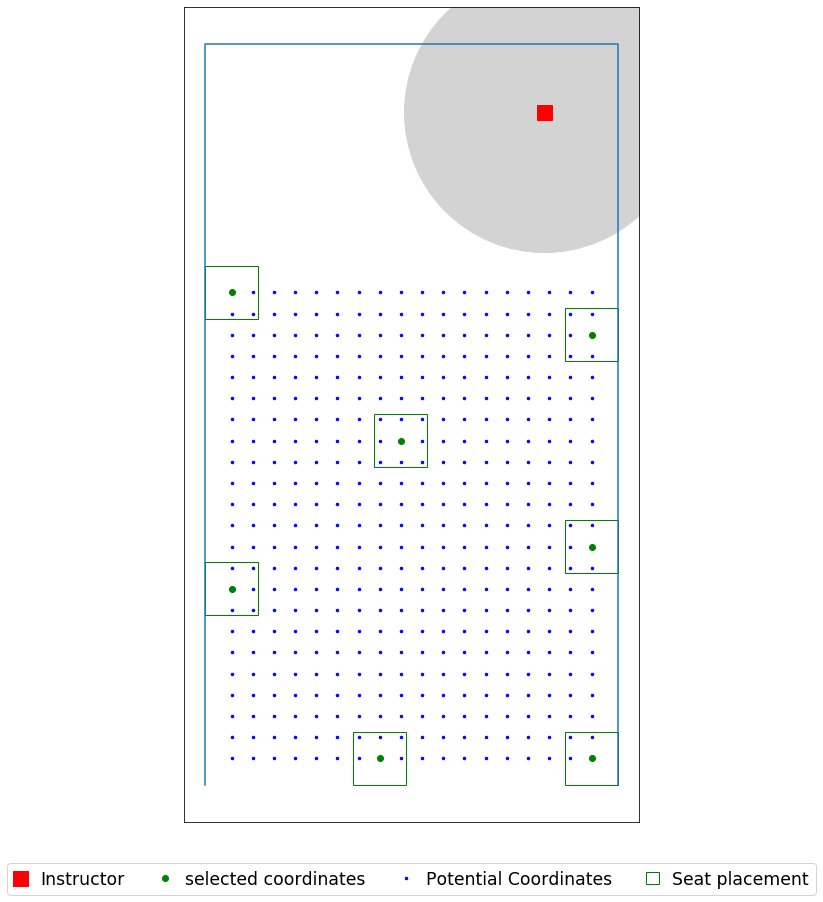

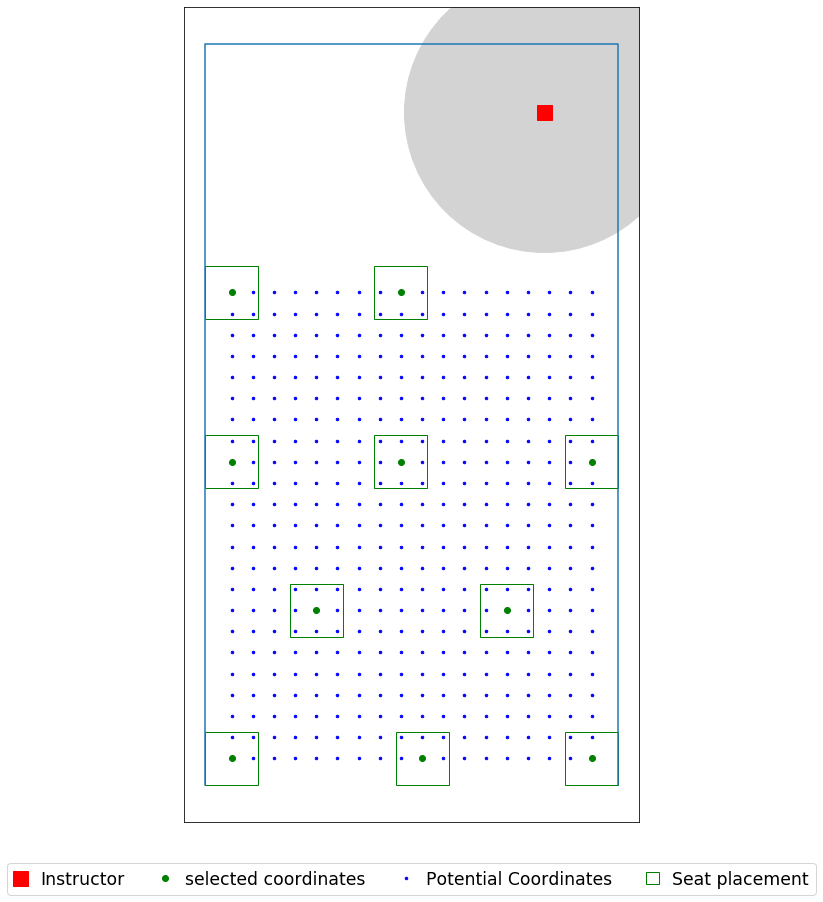

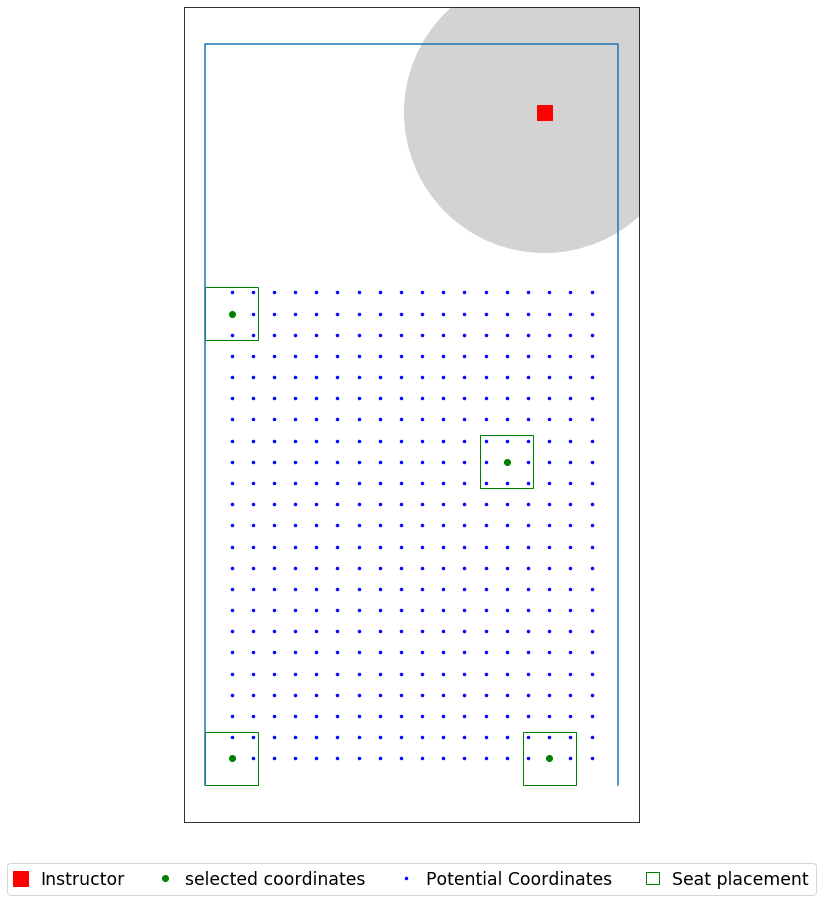

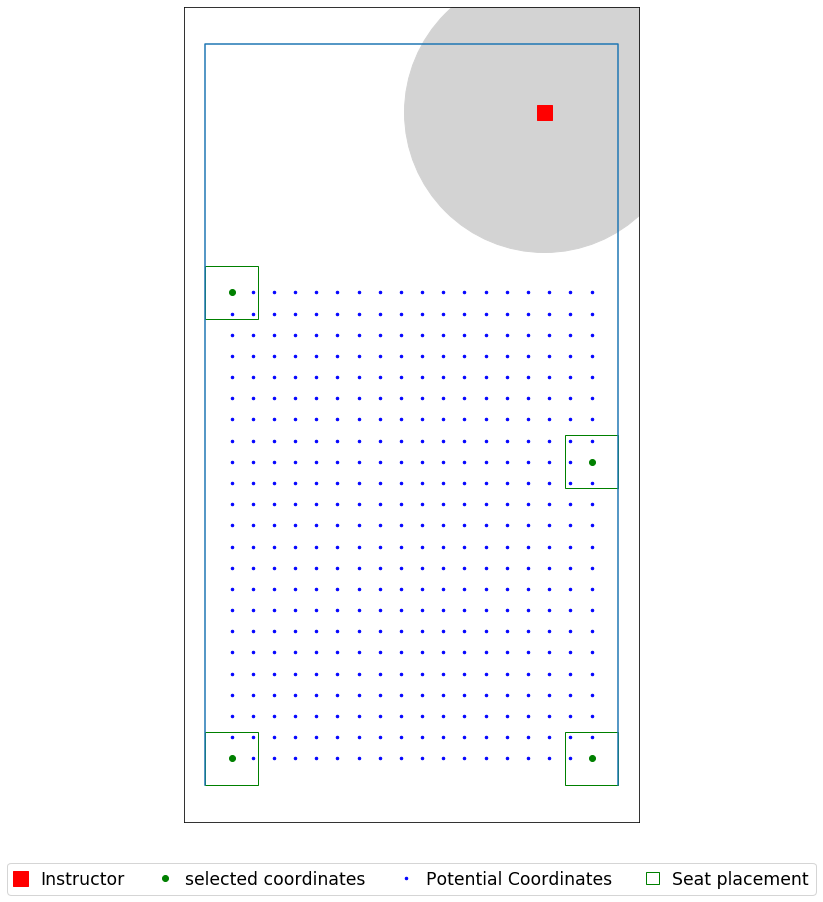

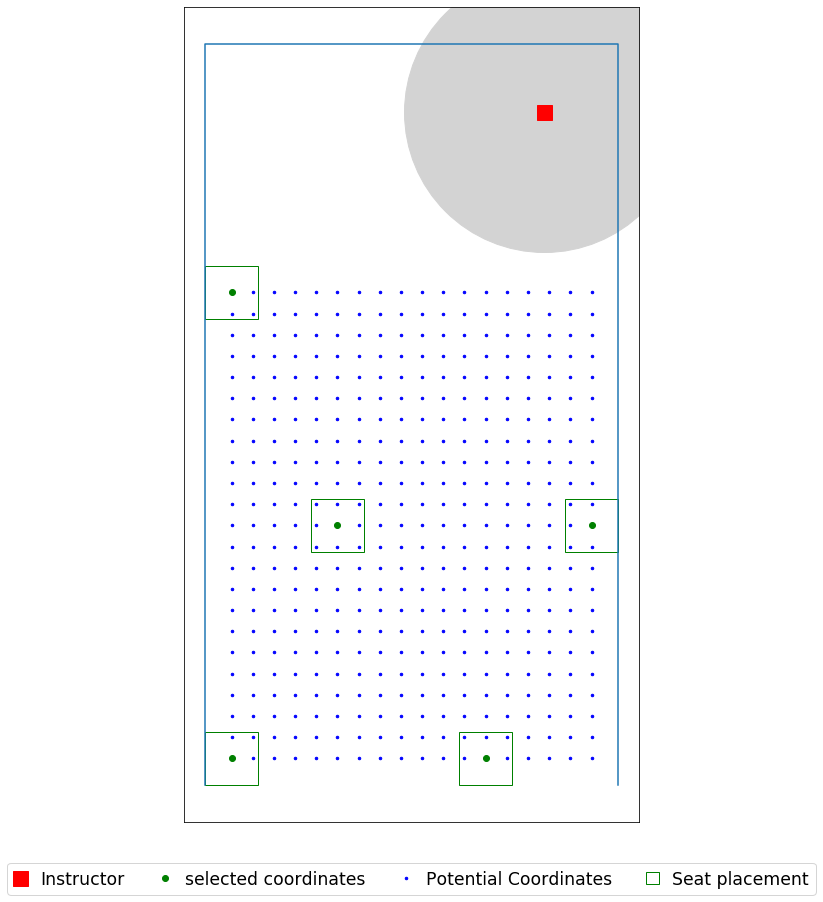

In [129]:
seat_loc = seat_coordinates_type(data_file, 2)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type = 2)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Skiles 271

In [130]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_271_P_T2.xlsx'

Name = 'Skiles_271_'

room dimension (W x H) are [[21.166666666666668 40.083333333333336]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (21.166666666666668, 0), (21.166666666666668, 30.083333333333336), (0, 30.083333333333336)]
Total number of seats  is 532


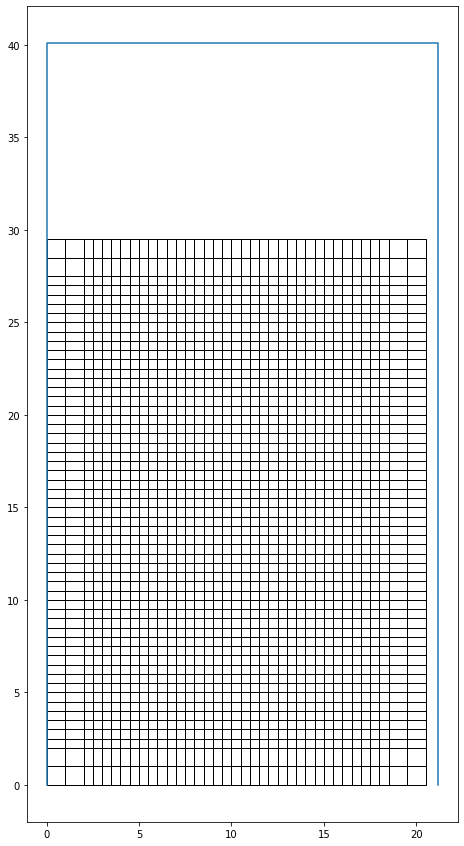

The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
8
18
152
160
168
304
312
320
456
464
472
room dimension (W x H) are [[21.166666666666668 40.083333333333336]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (21.166666666666668, 0), (21.166666666666668, 30.083333333333336), (0, 30.083333333333336)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
0
8
18
137
170
239
266
322
386
493
513
523
room dimension (W x H) are [[21.166666666666668 40.083333333333336]]
seat dimension (W x H) are [[2.5 2.5]]
[(0, 0), (21.166666666666668, 0), (21.166666666666668, 30.083333333333336), (0, 30.083333333333336)]
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
6
12
18
114
120
126
132
228
234
240
246
342
348
354
360
456
462
468
474
room dimension (W x H) are [[21.166666666666668 40.08333333333333

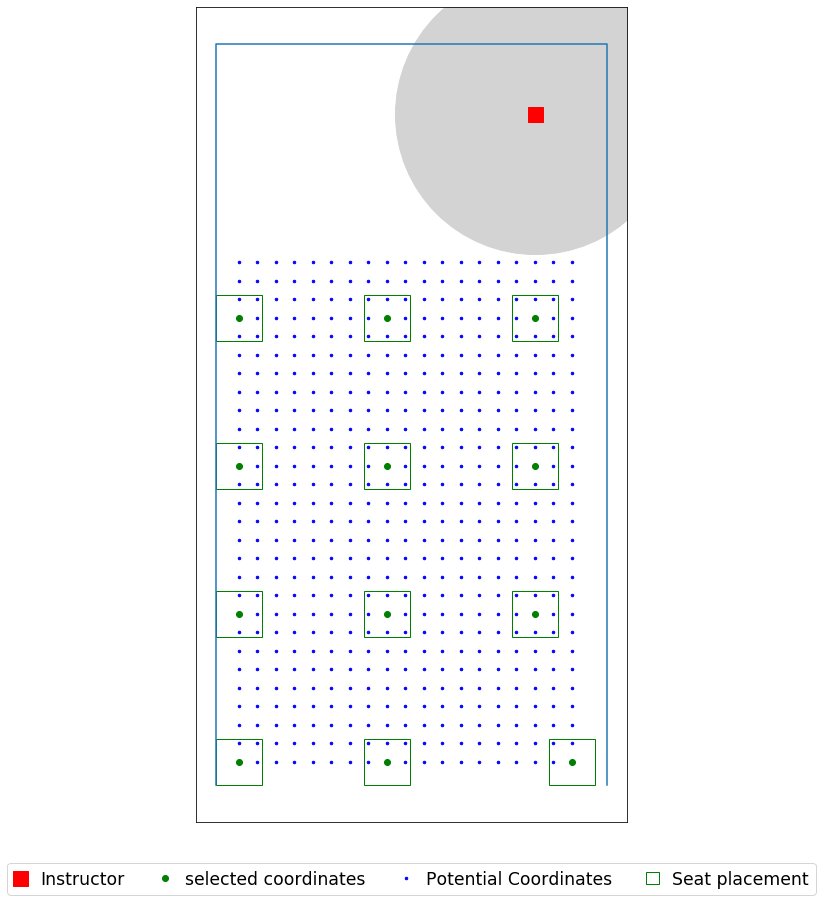

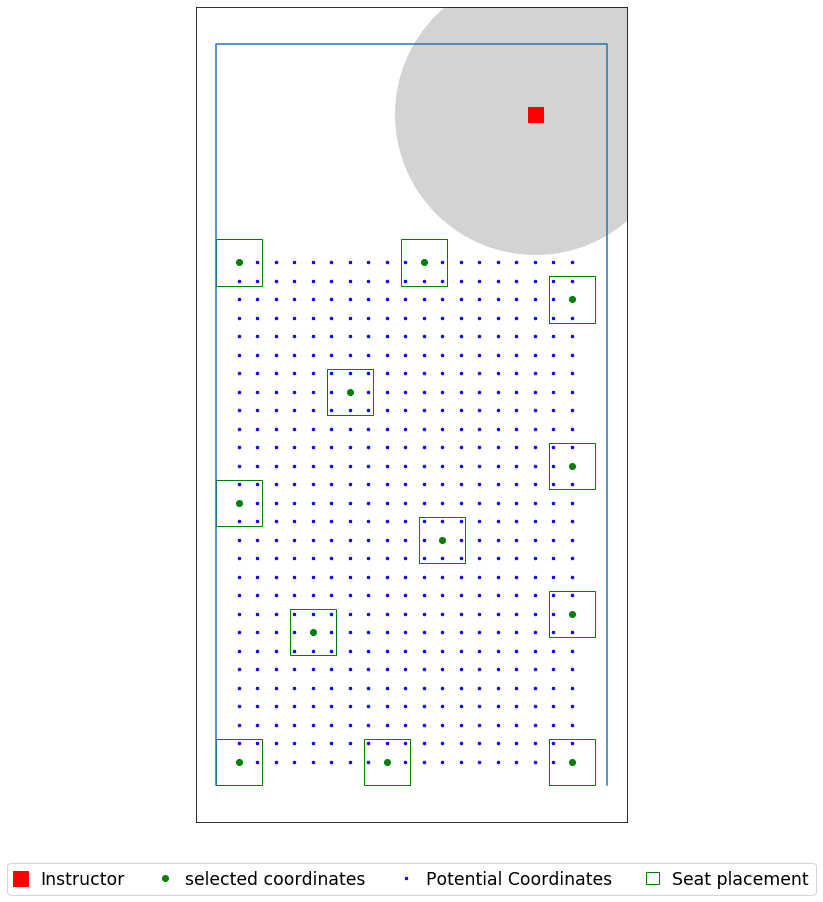

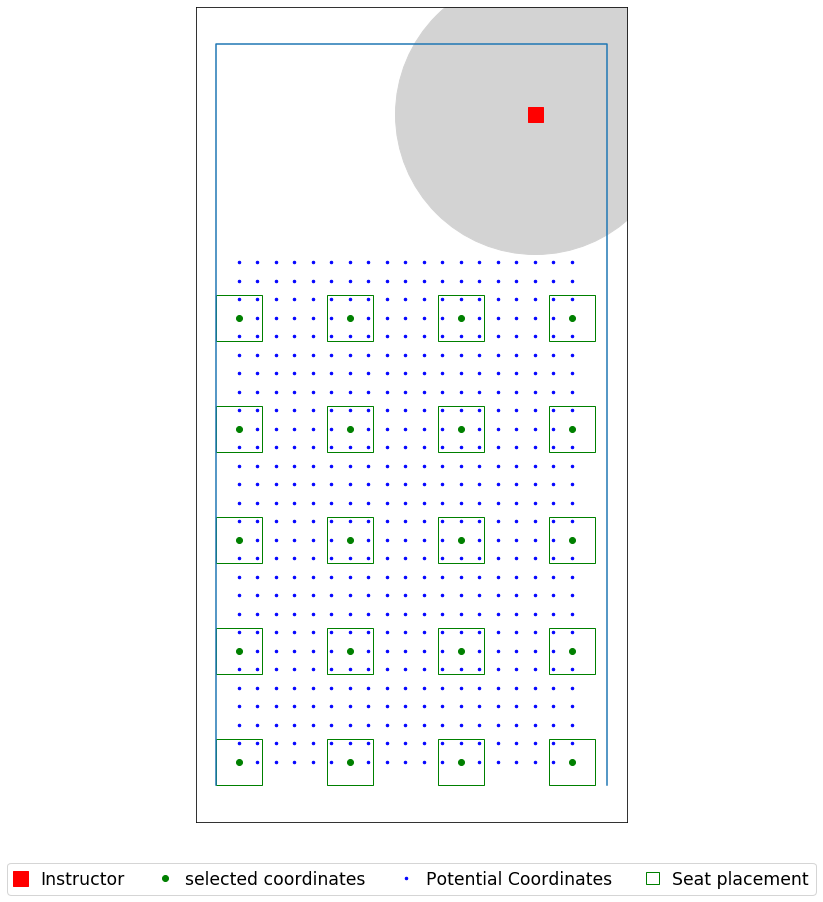

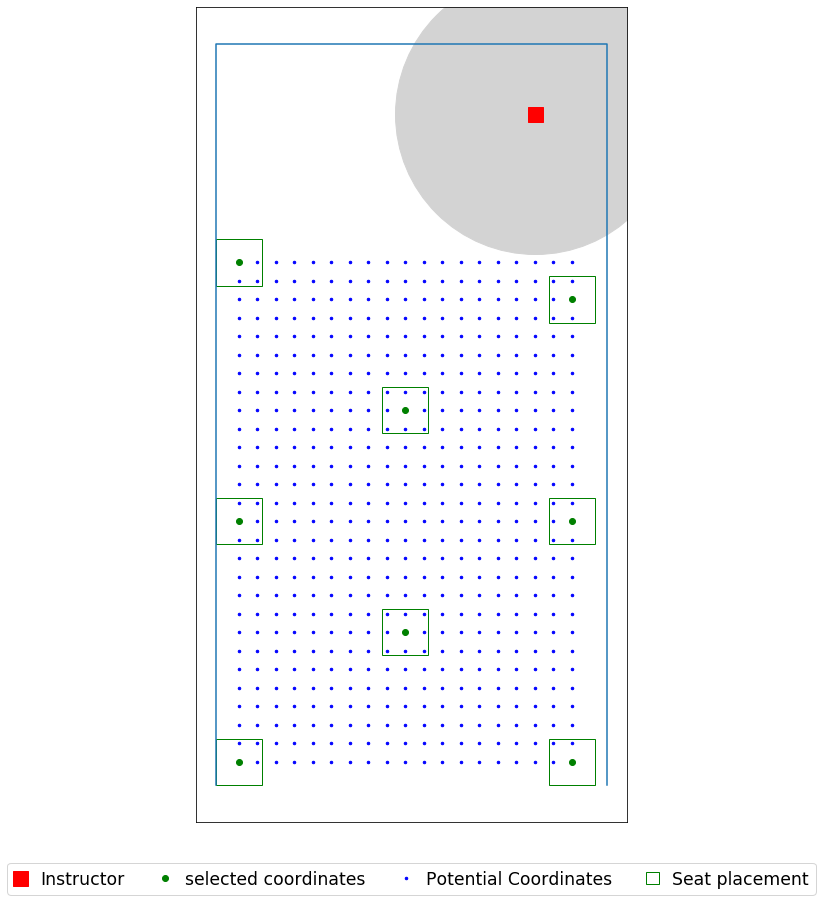

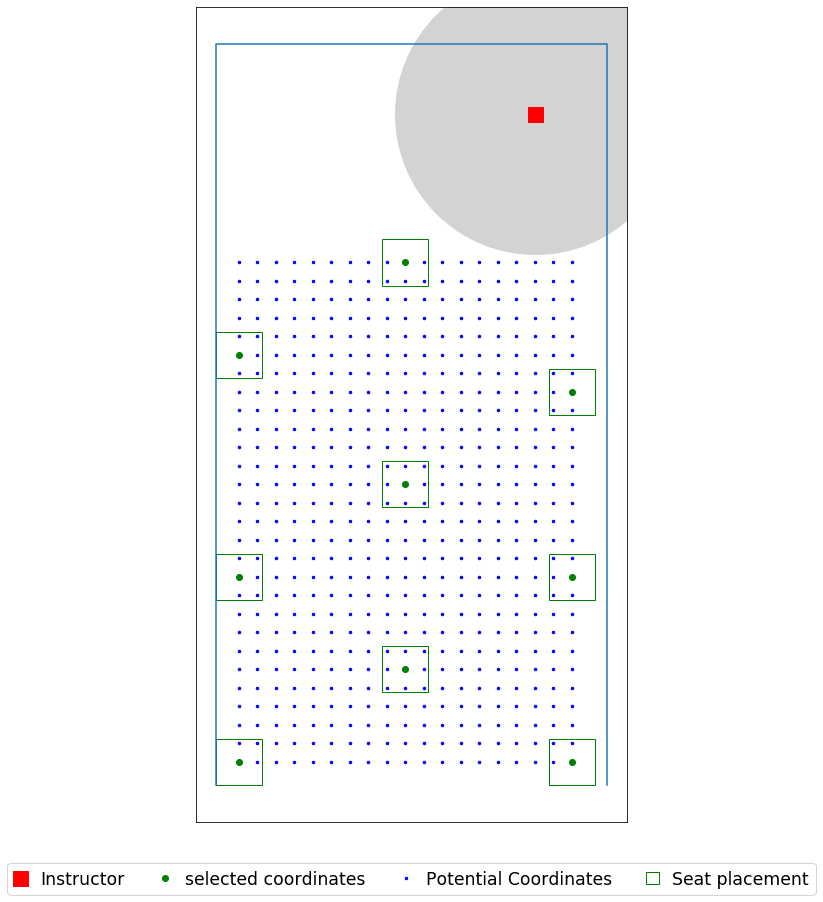

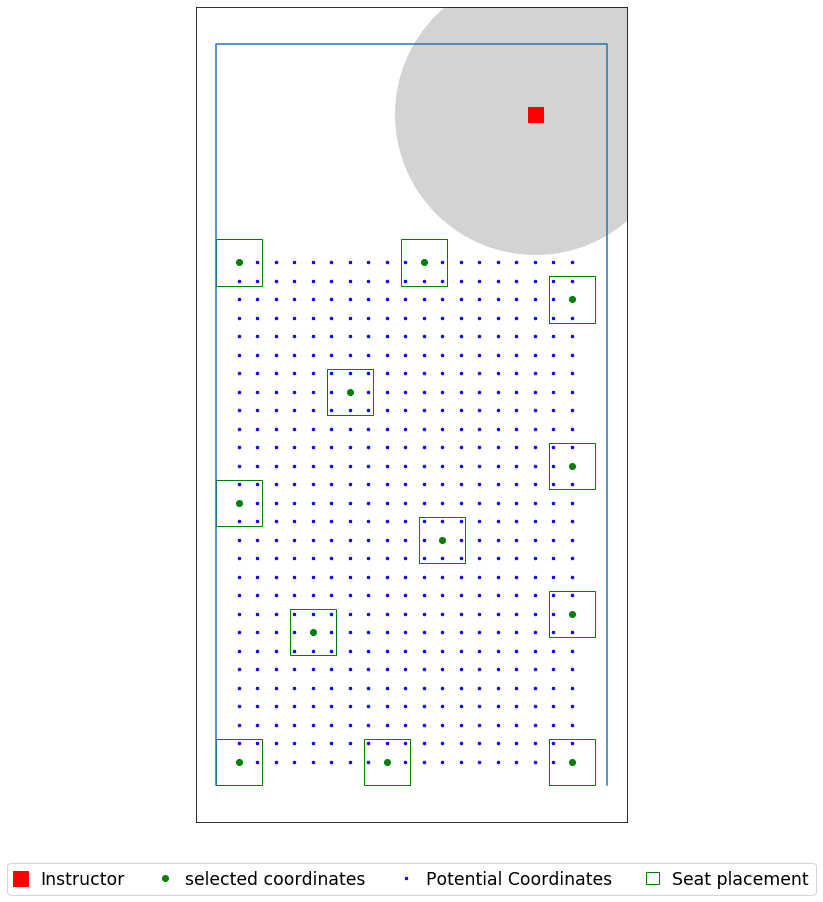

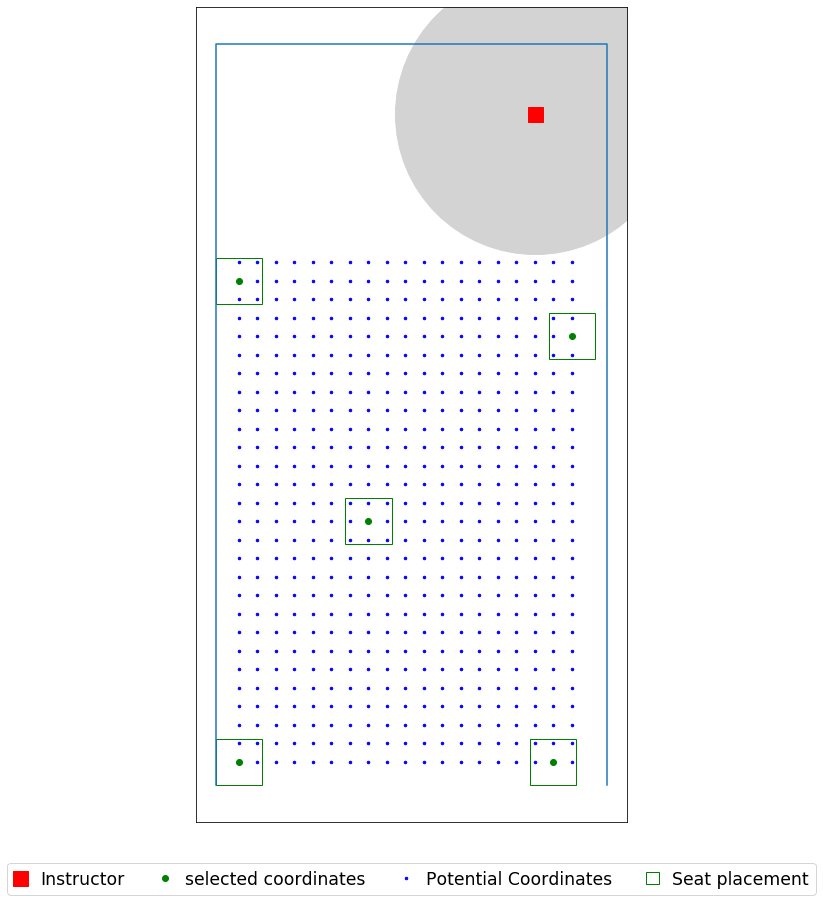

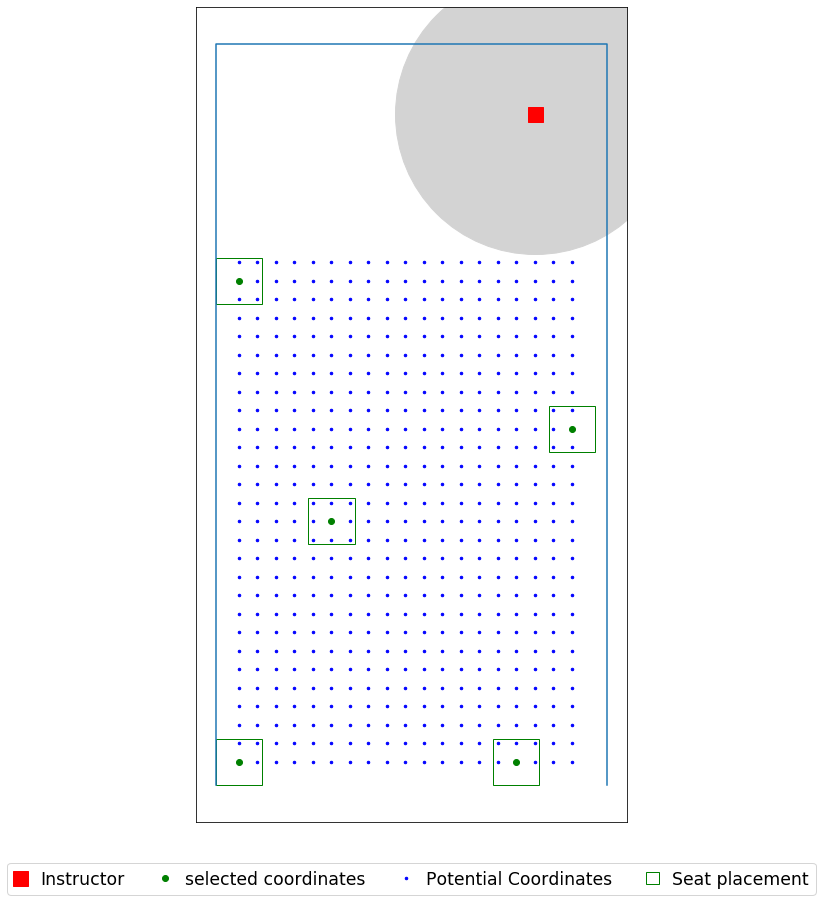

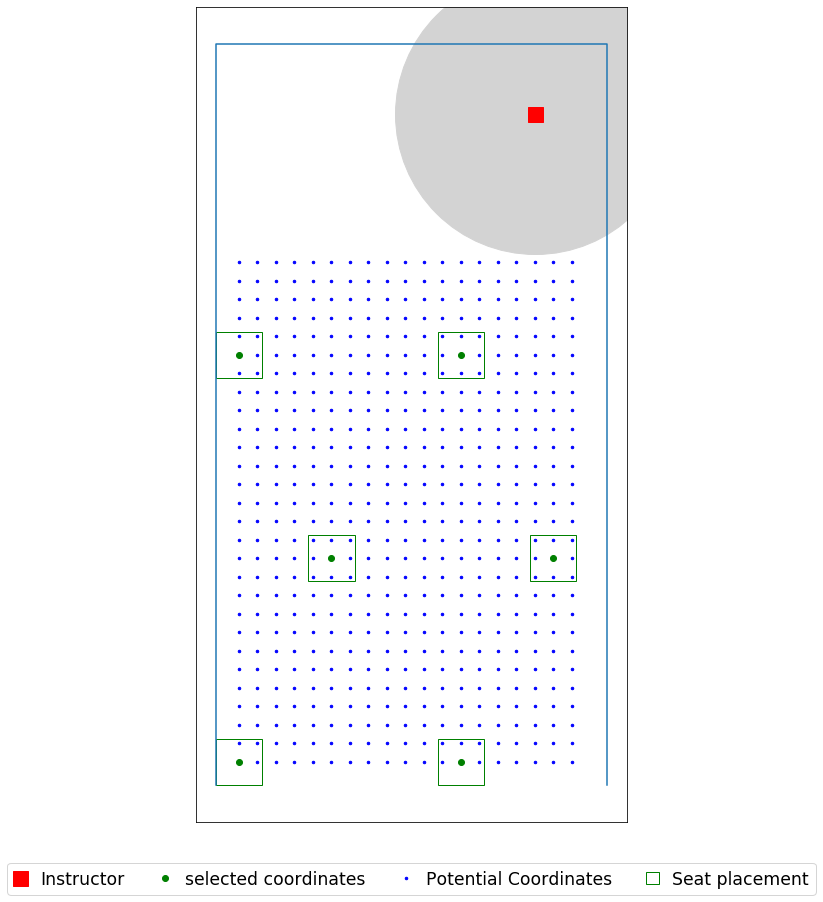

In [131]:
seat_loc = seat_coordinates_type(data_file, 2)

for i in (6,8,12):
    for j in listt:
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_type(data_file, seat_radius=1, seat_circle_radius=1, type = 2)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'ft_V2_V6_instructor.jpg', dpi=500)

## Archie 309

In [101]:
data_file = r'C:\Users\yoges\Desktop\Input\076_Arhie_309_720.xlsx'

Name = 'Archie_309_'

room dimension (W x H) are [[19.58333333 31.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[17.25        3.08333333]]
[(0, 10), (19.583333333333332, 10), (19.583333333333332, 31.416666666666668), (0, 31.416666666666668)]
Total number of seats  is 700


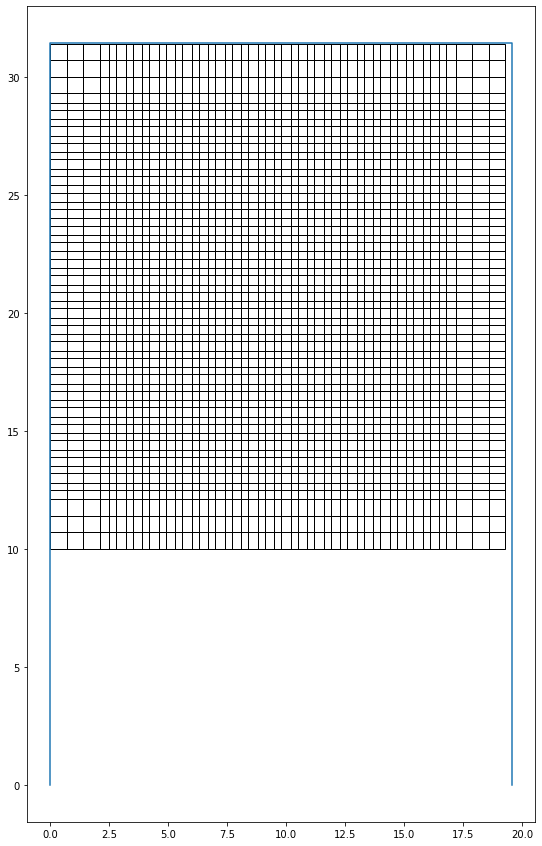

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
0
14
99
132
241
250
349
434
475
519
679
688
699
room dimension (W x H) are [[19.58333333 31.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
12
99
300
362
399
675
687
699
room dimension (W x H) are [[19.58333333 31.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
0
68
407
499
room dimension (W x H) are [[19.58333333 31.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR0.75
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
11
97
275
286
372
550
561
647
room dim

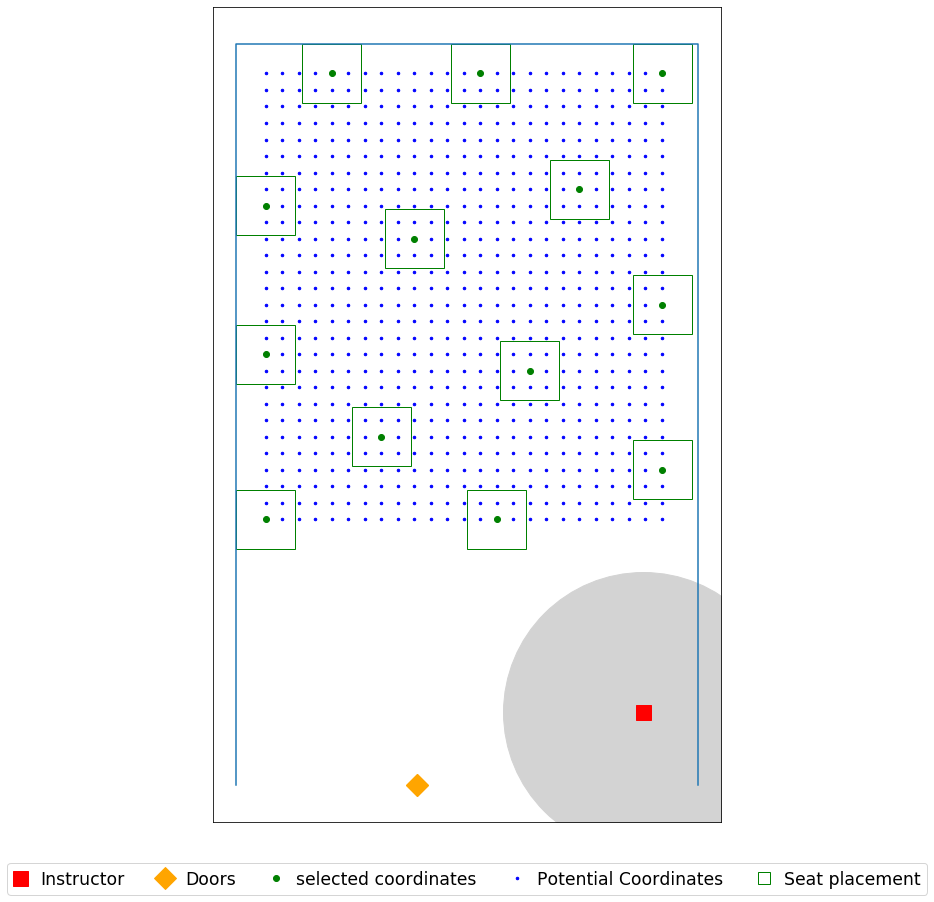

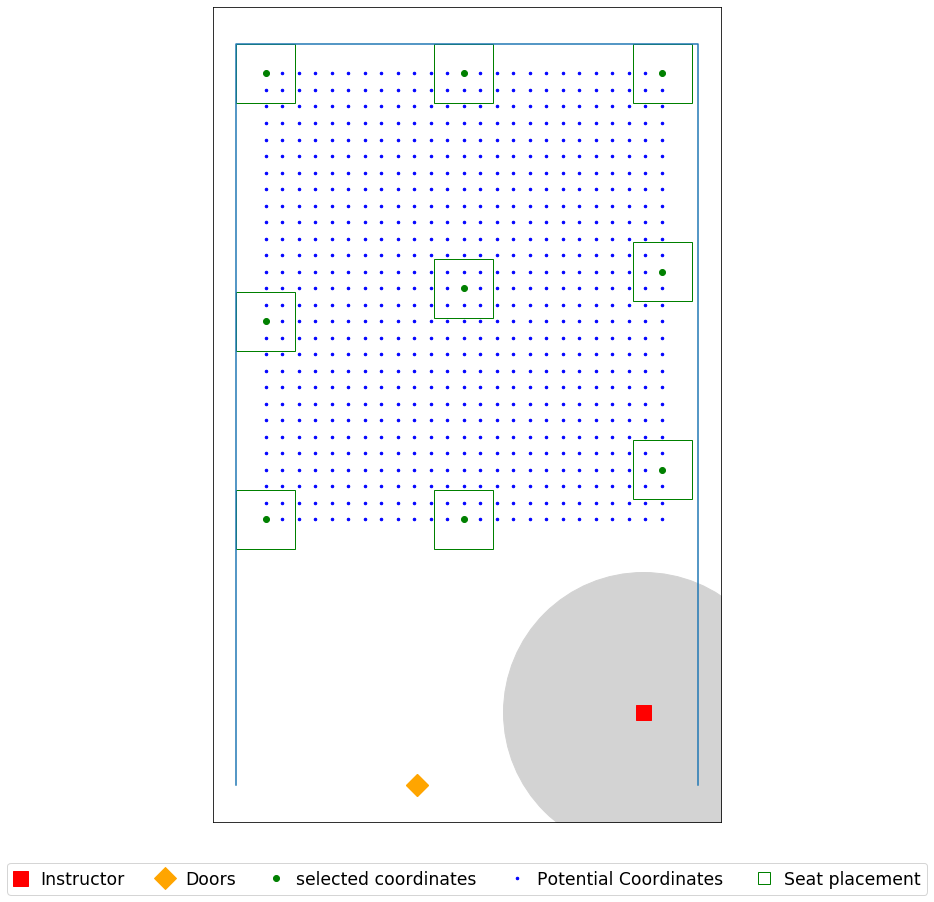

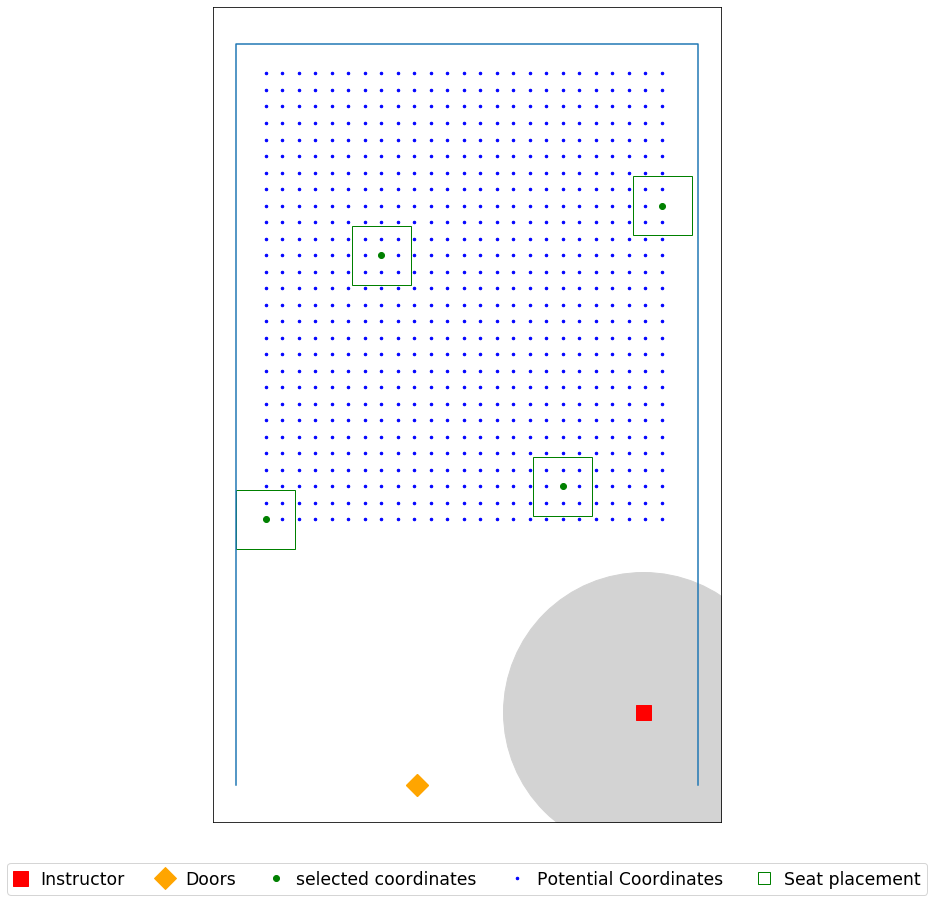

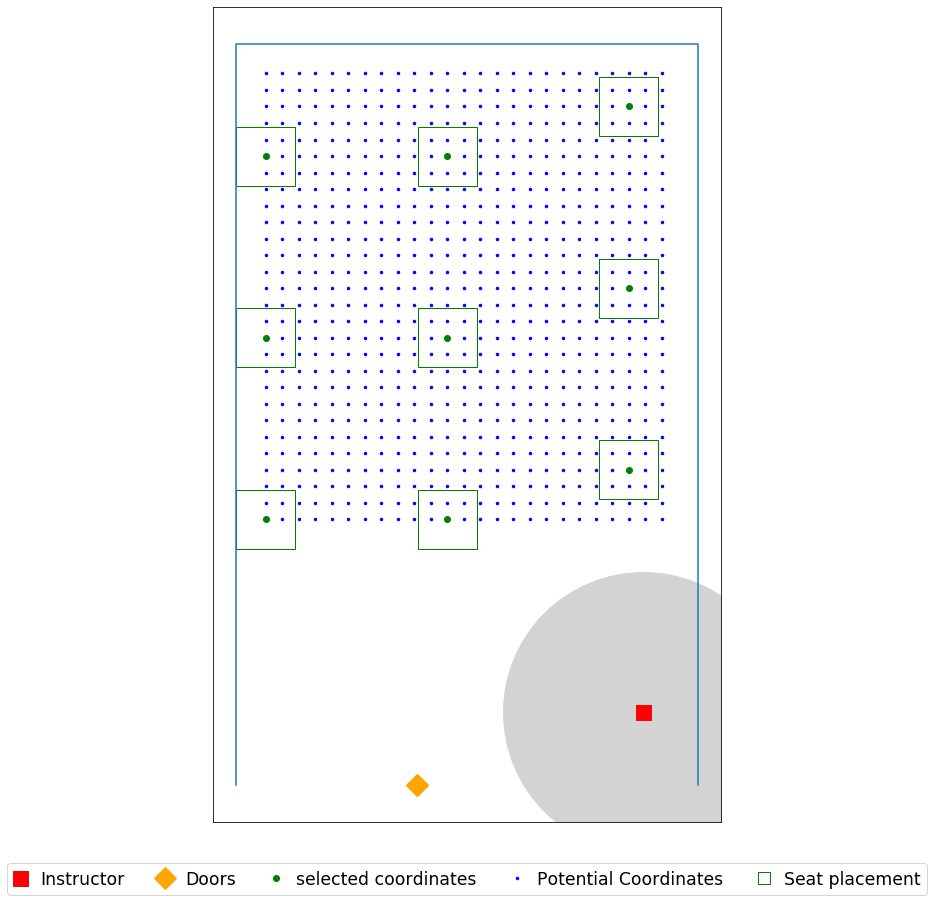

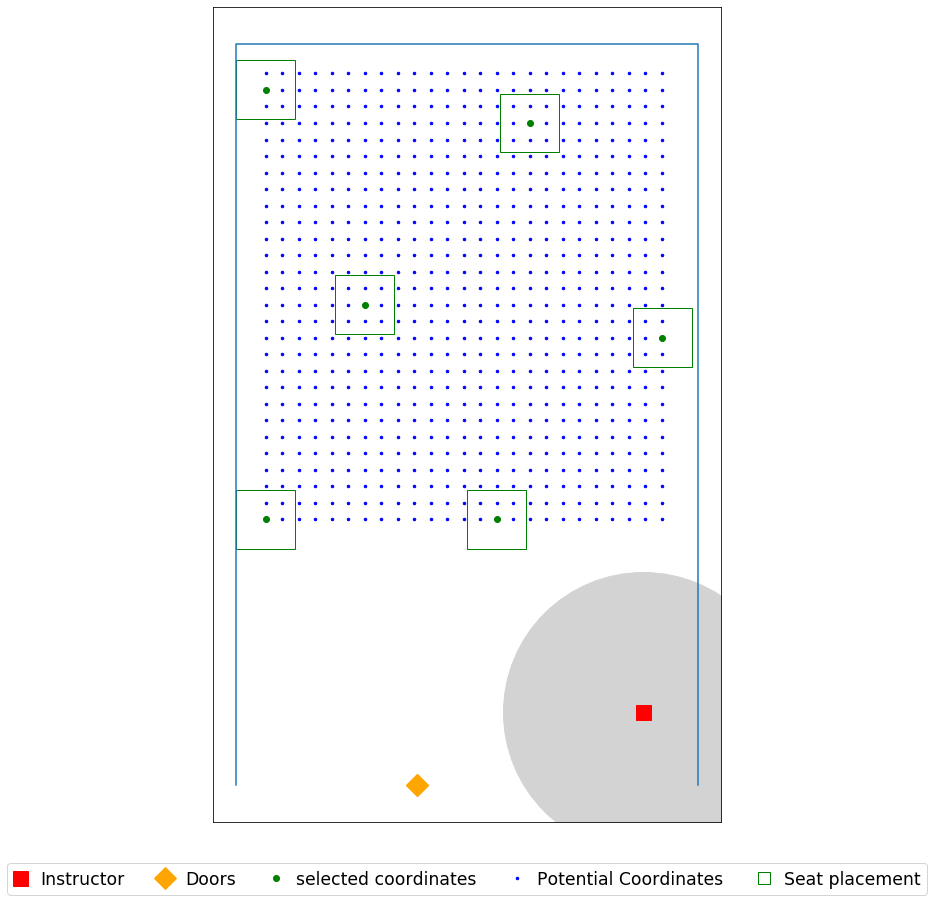

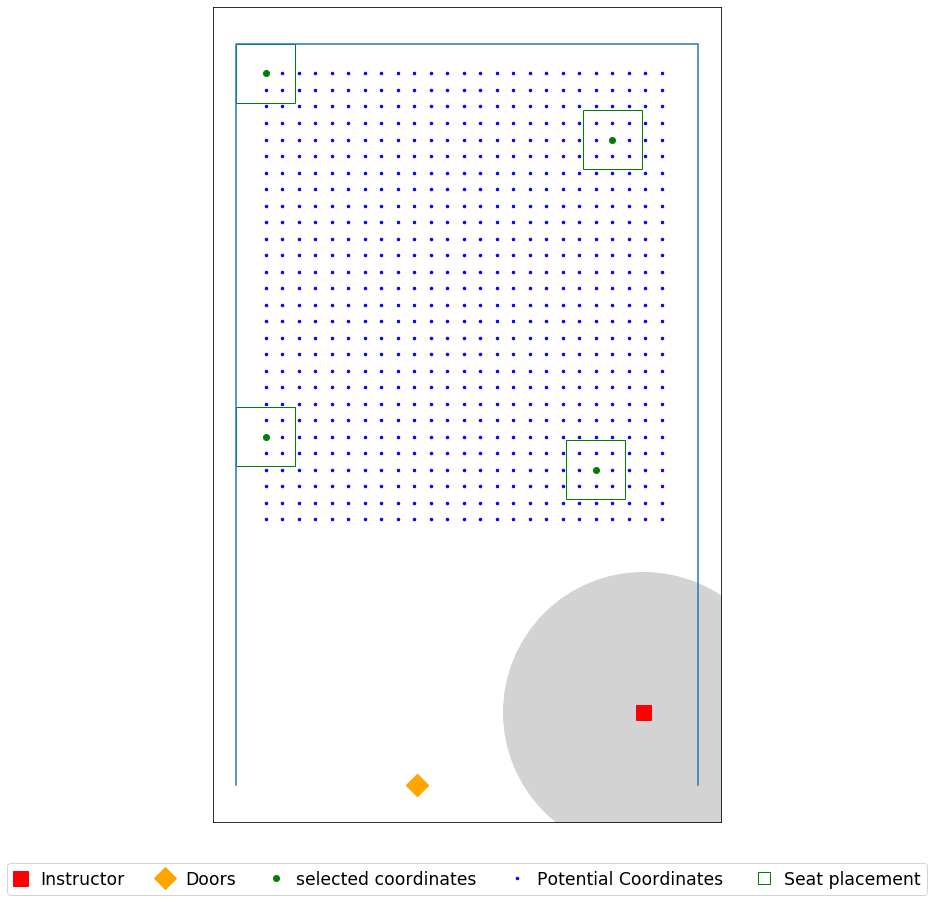

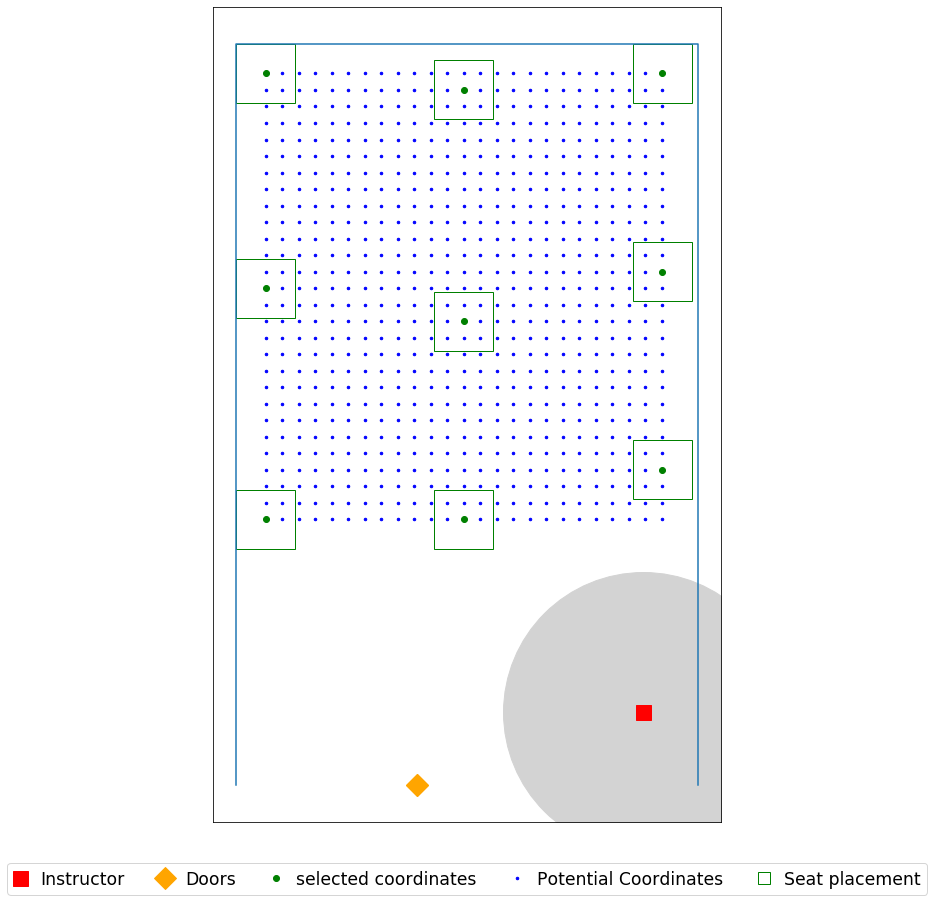

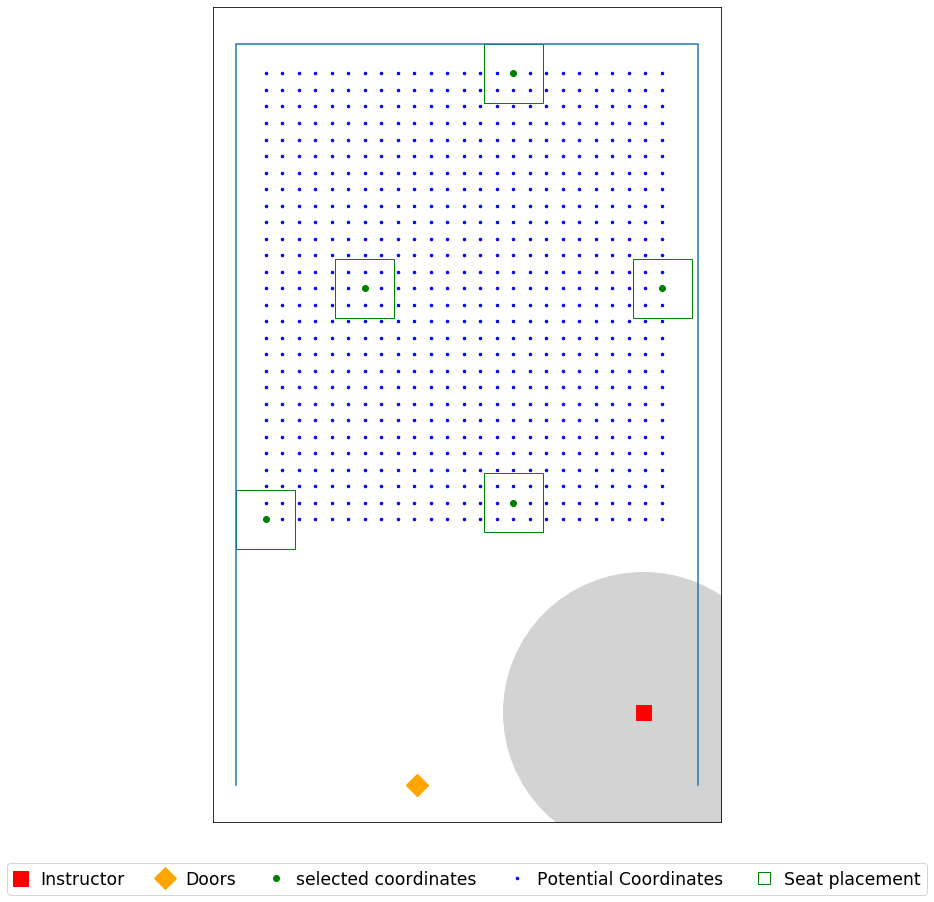

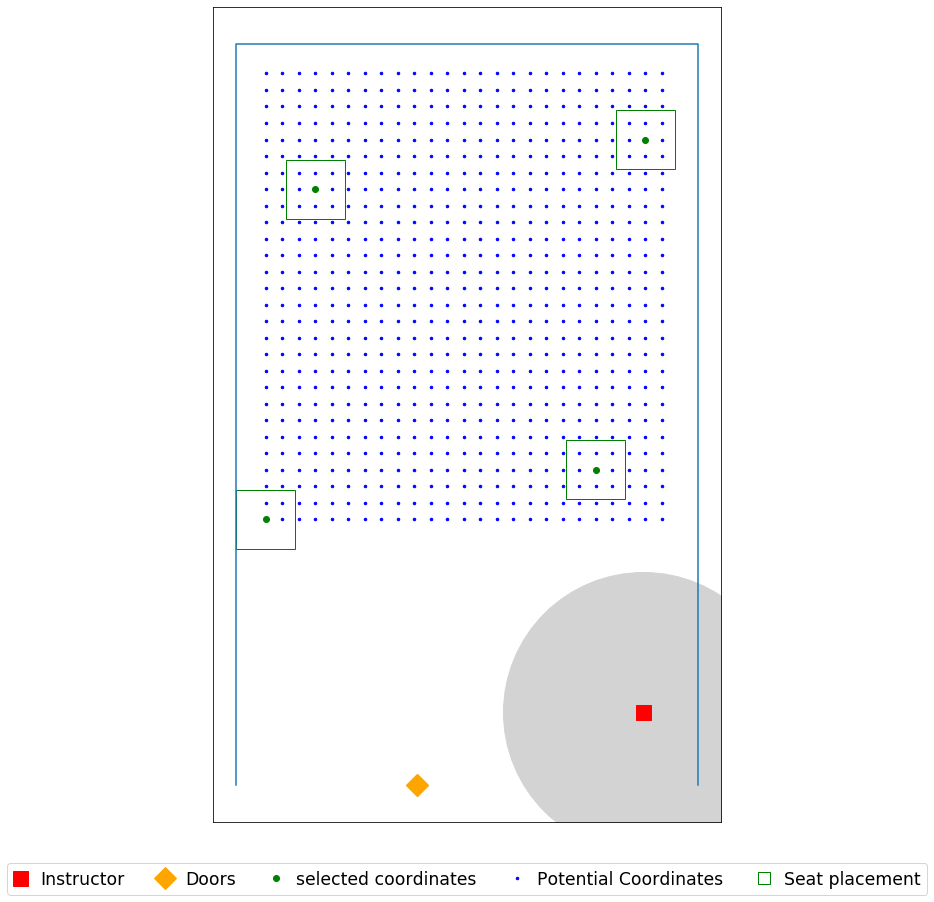

In [102]:
seat_loc = seat_coordinates(data_file, 0.7)


for j in (0,0.75,1):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Archie 258

In [103]:
data_file = r'C:\Users\yoges\Desktop\Input\076_Arhie_258_720.xlsx'

Name = 'Archie_258_'

room dimension (W x H) are [[29.33333333 29.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[5. 5.]]
[(0, 10), (29.333333333333332, 10), (29.333333333333332, 29.666666666666668), (0, 29.666666666666668)]
Total number of seats  is 748


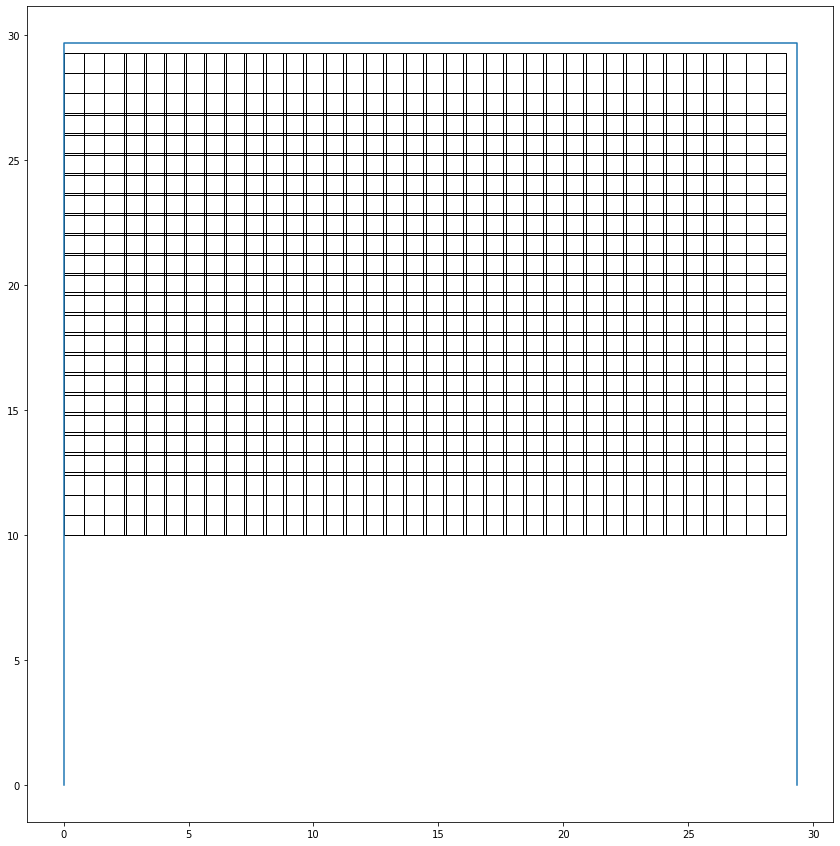

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 17.0
Optimal selection of seats (index):
17
25
33
136
252
260
268
347
442
493
501
509
619
714
728
736
744
room dimension (W x H) are [[29.33333333 29.66666667]]
seat dimension (W x H) are [[2.5 2.5]]


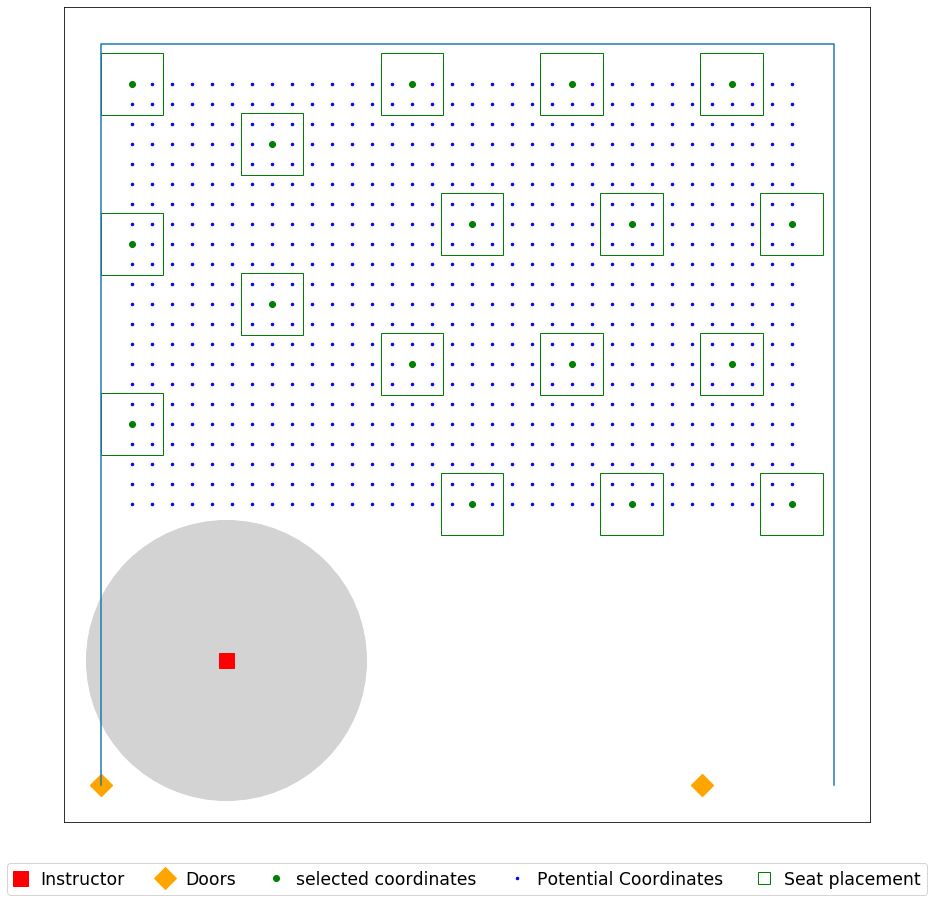

In [104]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

room dimension (W x H) are [[29.33333333 29.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[5. 5.]]
[(0, 10), (29.333333333333332, 10), (29.333333333333332, 29.666666666666668), (0, 29.666666666666668)]
Total number of seats  is 748


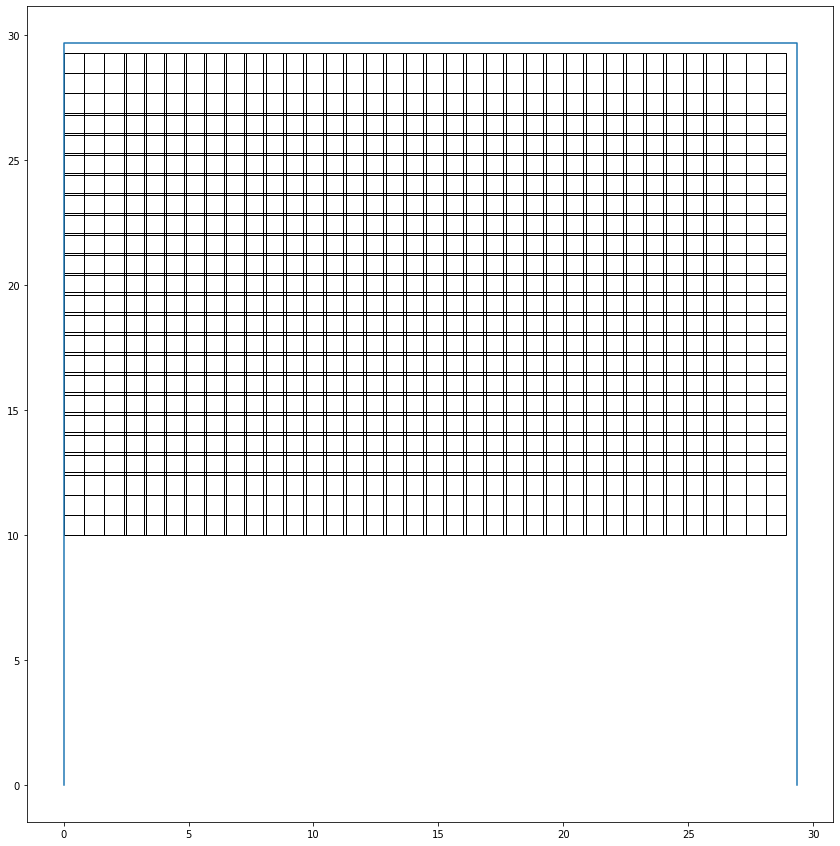

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 17.0
Optimal selection of seats (index):
17
25
33
136
252
260
268
347
442
493
501
509
619
714
728
736
744
room dimension (W x H) are [[29.33333333 29.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
23
33
81
170
382
397
407
714
724
735
747
room dimension (W x H) are [[29.33333333 29.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
15
33
136
629
681
747
room dimension (W x H) are [[29.33333333 29.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
15
25


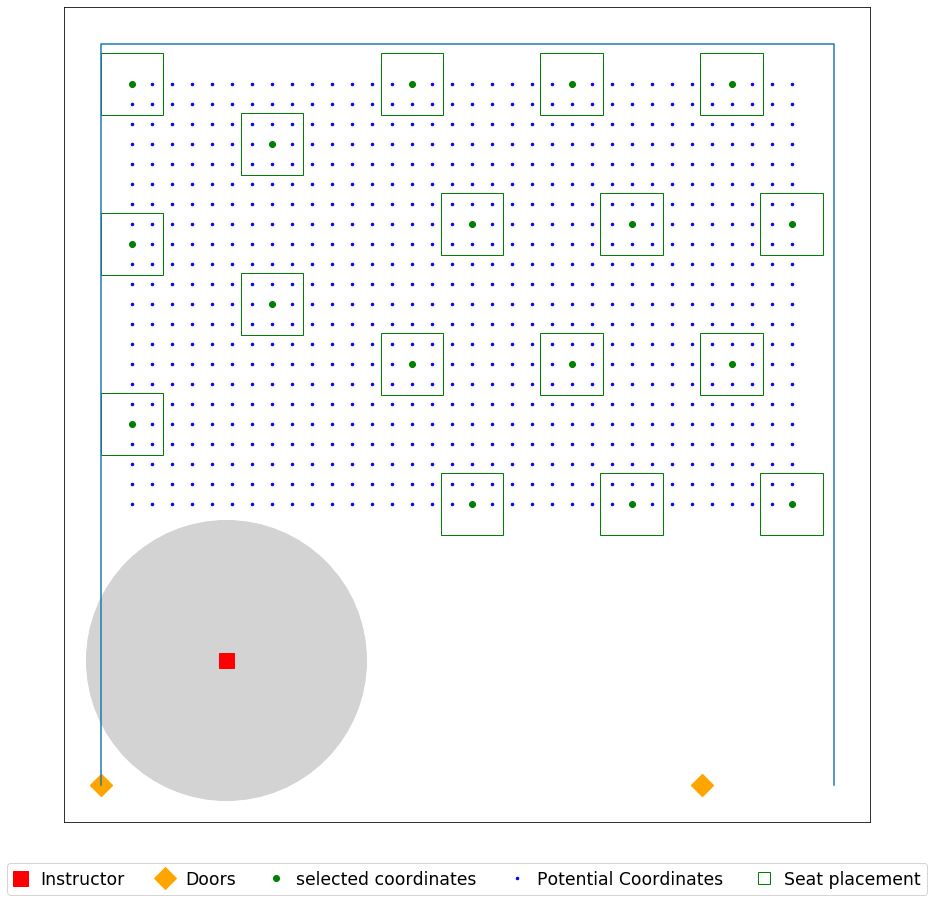

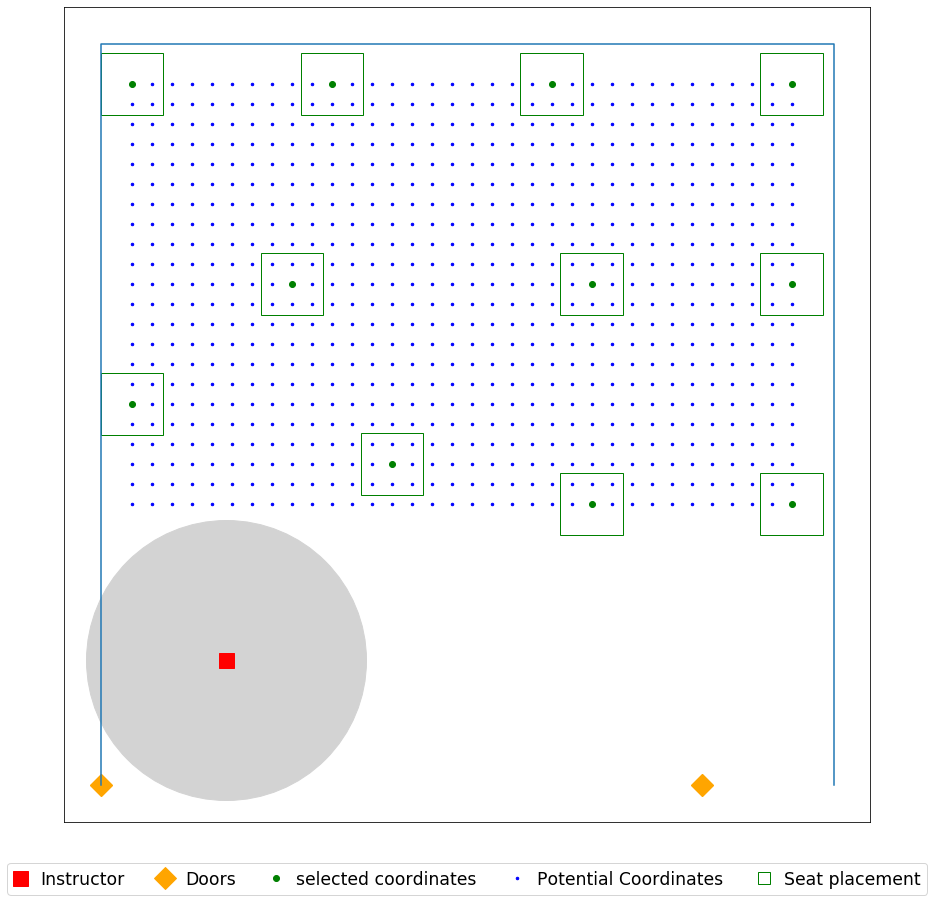

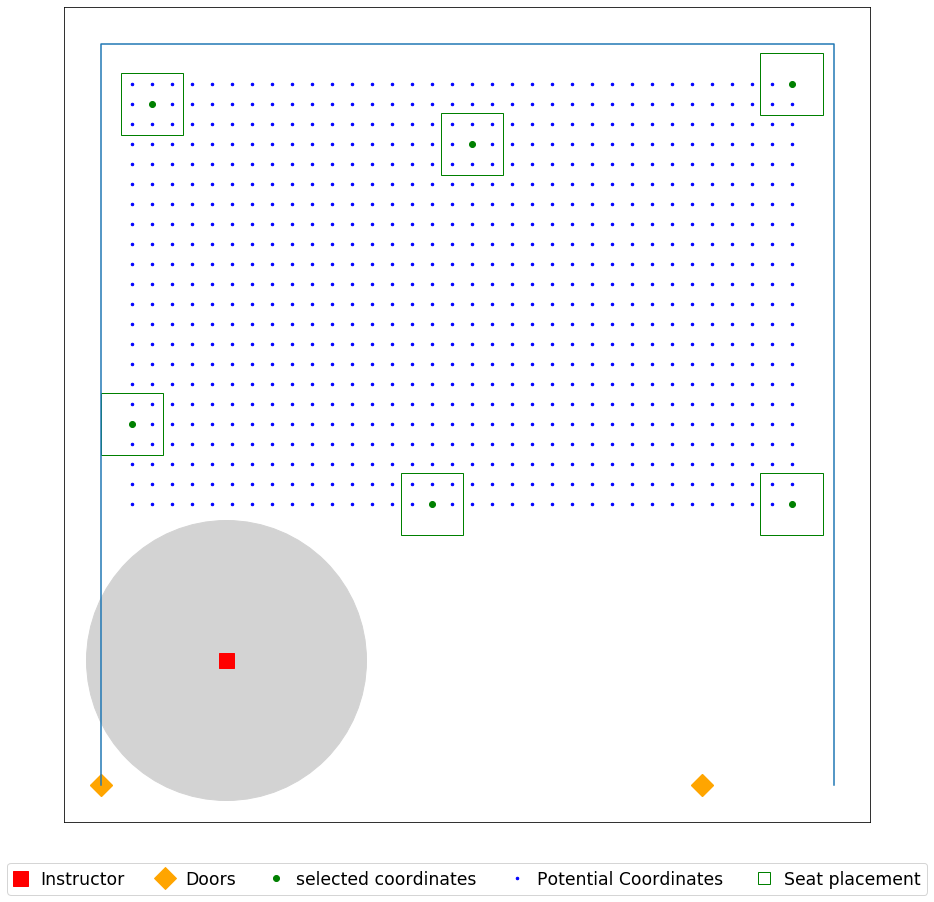

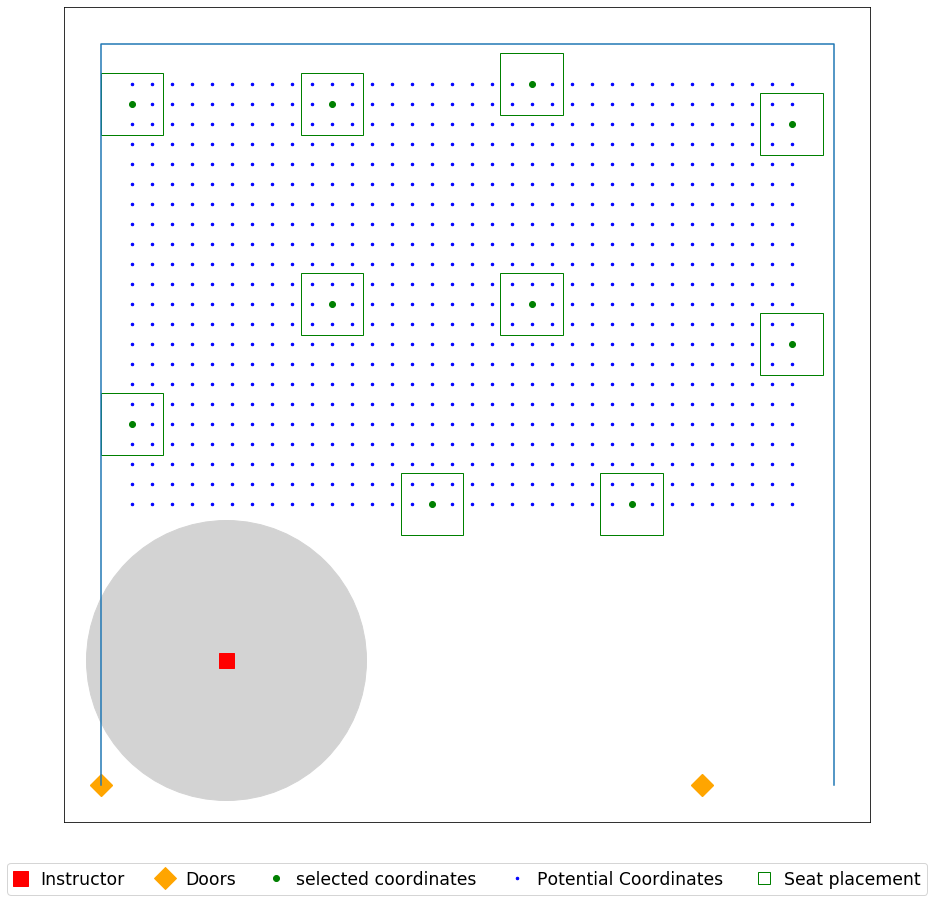

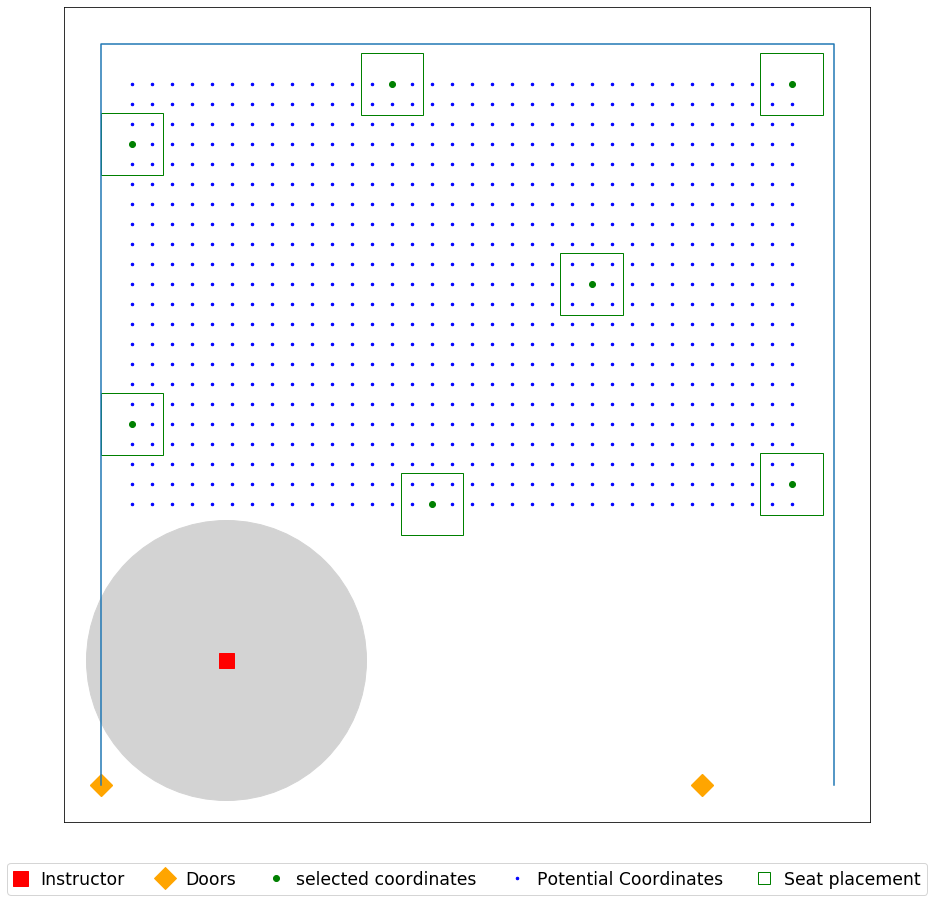

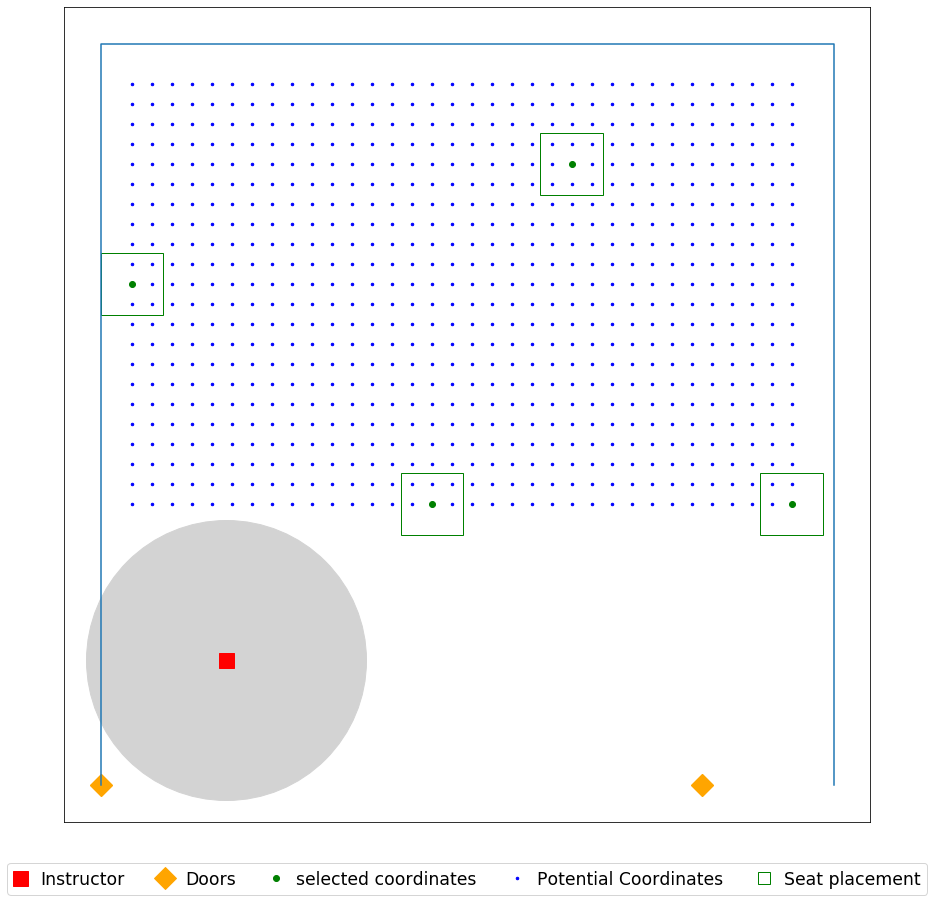

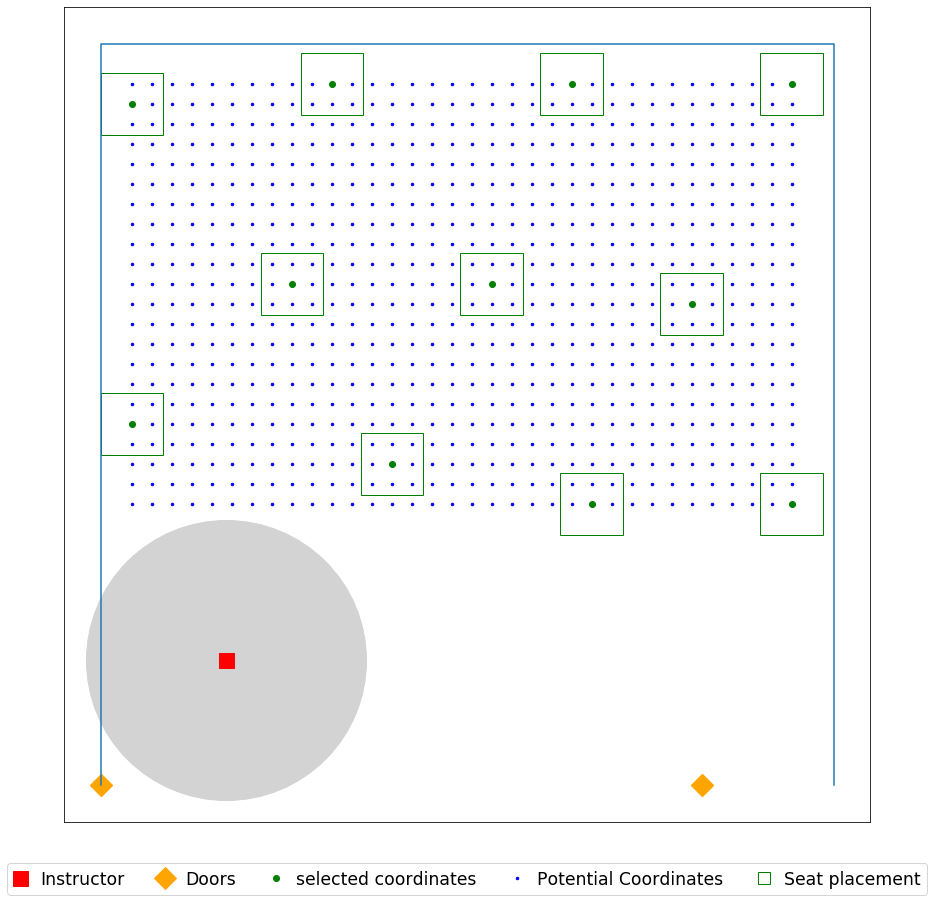

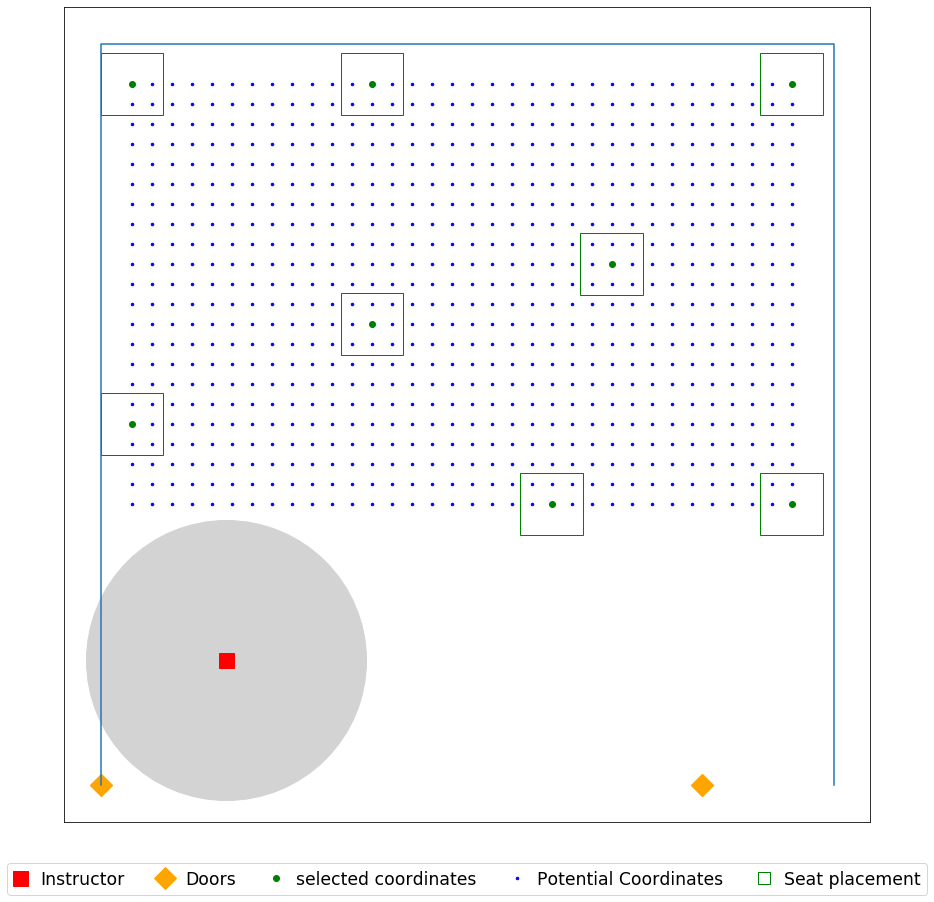

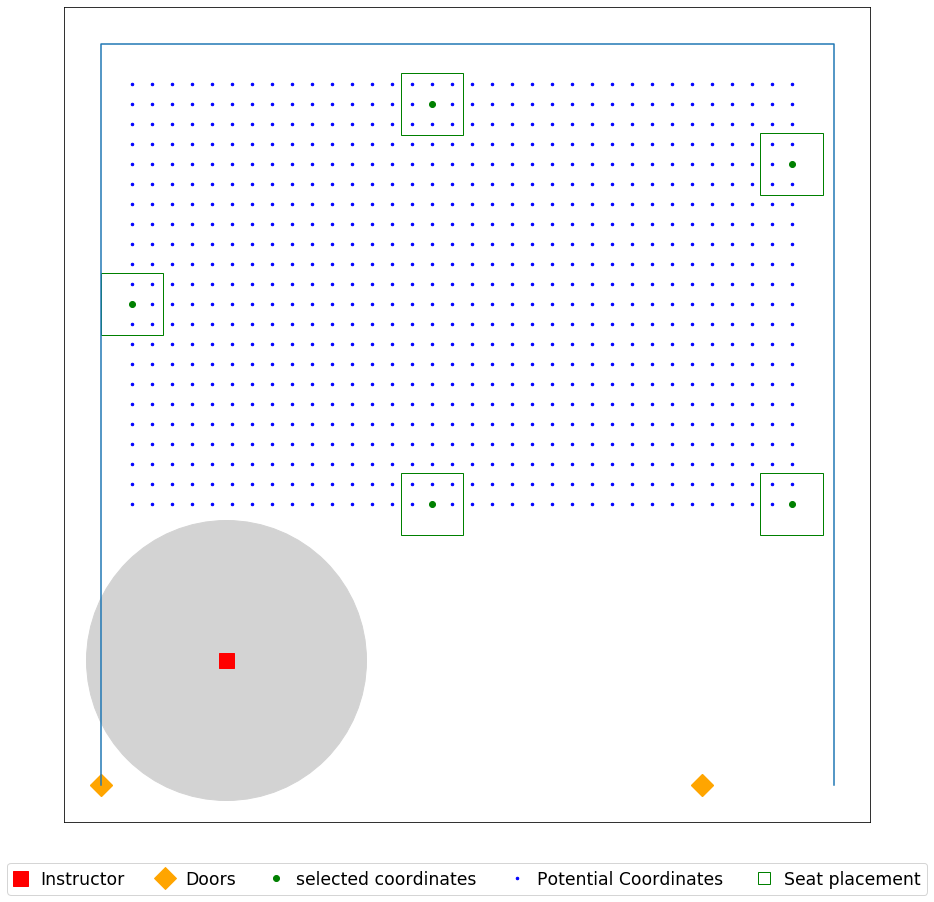

In [105]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Smith 104

In [106]:
data_file = r'C:\Users\yoges\Desktop\Input\024_Smith_104_720.xlsx'

Name = 'Smith_104_'

room dimension (W x H) are [[24.         35.91666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.  5.]]
[(0, 10), (24.0, 10), (24.0, 35.916666666666664), (0, 35.916666666666664)]
Total number of seats  is 36


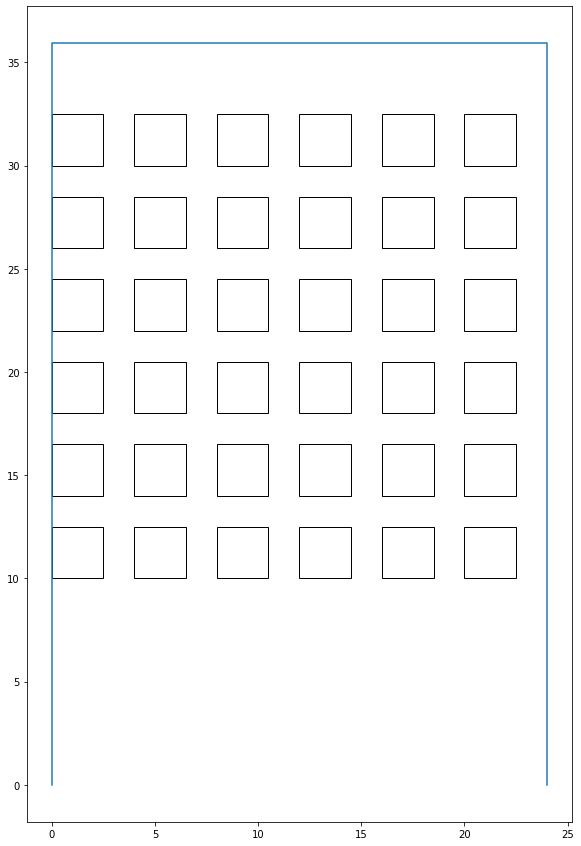

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
2
11
18
21
23
30
33
35
room dimension (W x H) are [[24.         35.91666667]]
seat dimension (W x H) are [[2.5 2.5]]


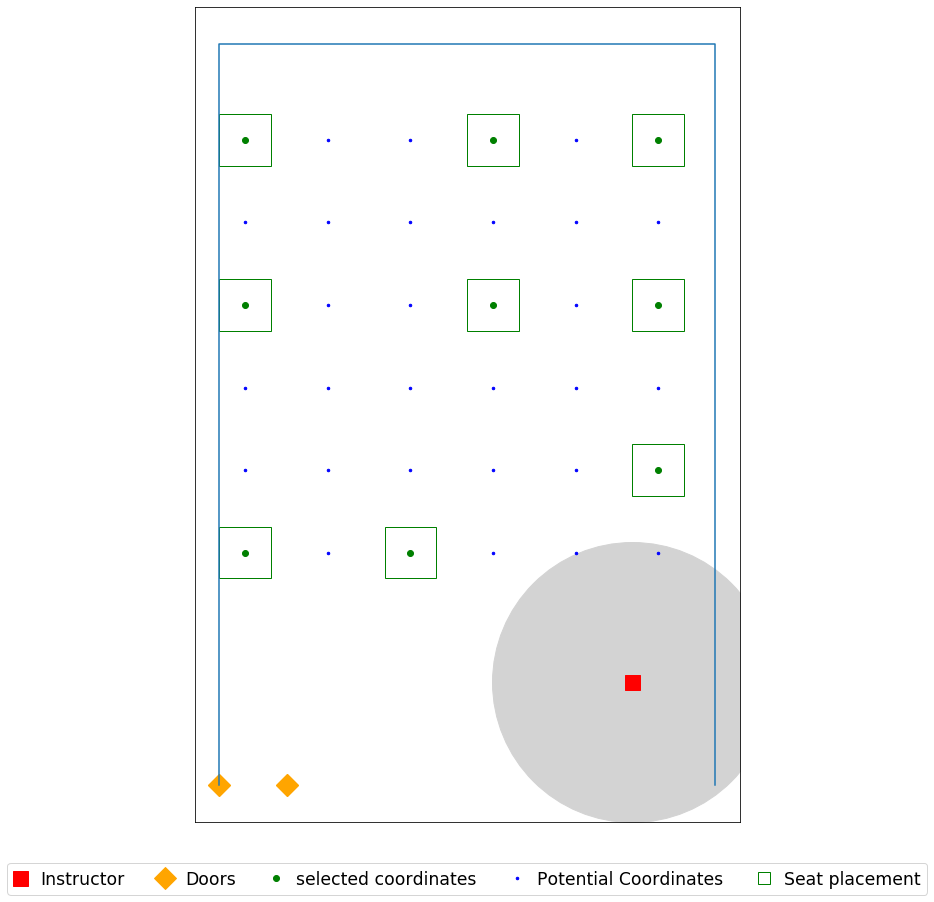

In [107]:
seat_loc = seat_coordinates(data_file, 4)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

room dimension (W x H) are [[24.         35.91666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.  5.]]
[(0, 10), (24.0, 10), (24.0, 35.916666666666664), (0, 35.916666666666664)]
Total number of seats  is 810


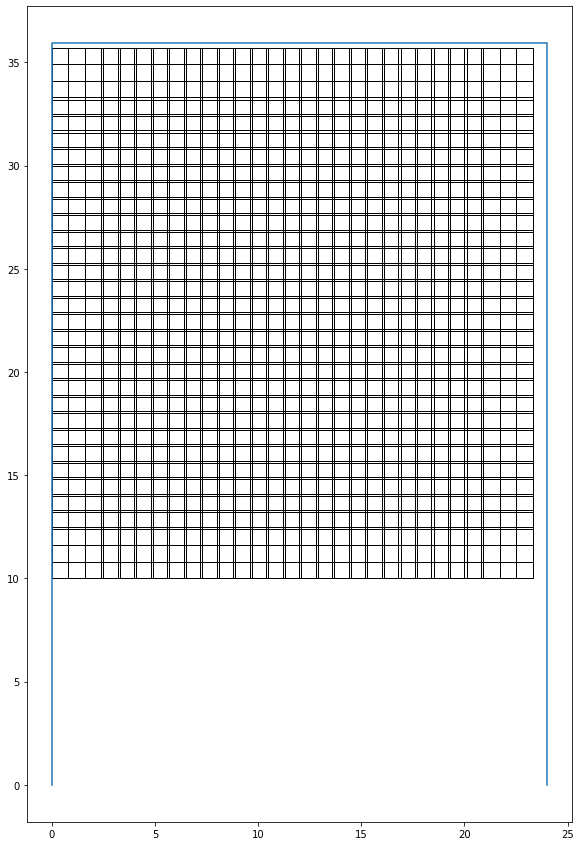

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 18.0
Optimal selection of seats (index):
3
13
161
170
180
189
347
386
405
421
539
578
597
613
764
783
799
809
room dimension (W x H) are [[24.         35.91666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
10
161
248
259
485
486
496
755
783
793
room dimension (W x H) are [[24.         35.91666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
69
377
384
692
756
room dimension (W x H) are [[24.         35.91666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
1

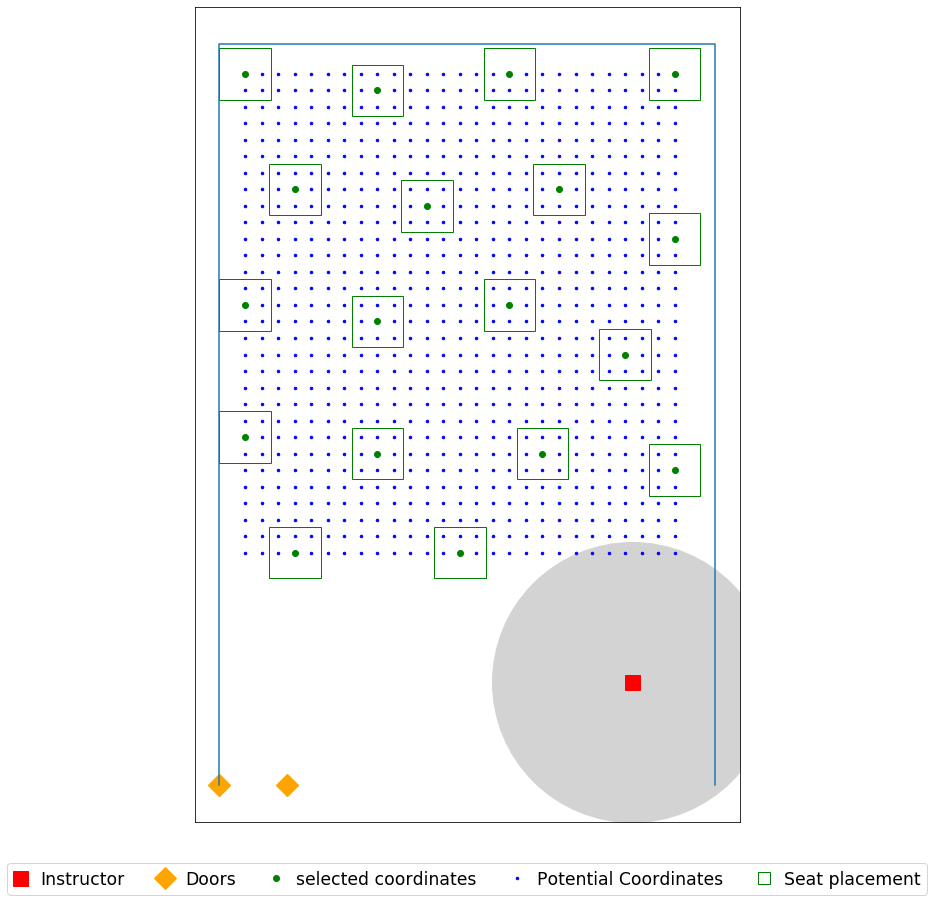

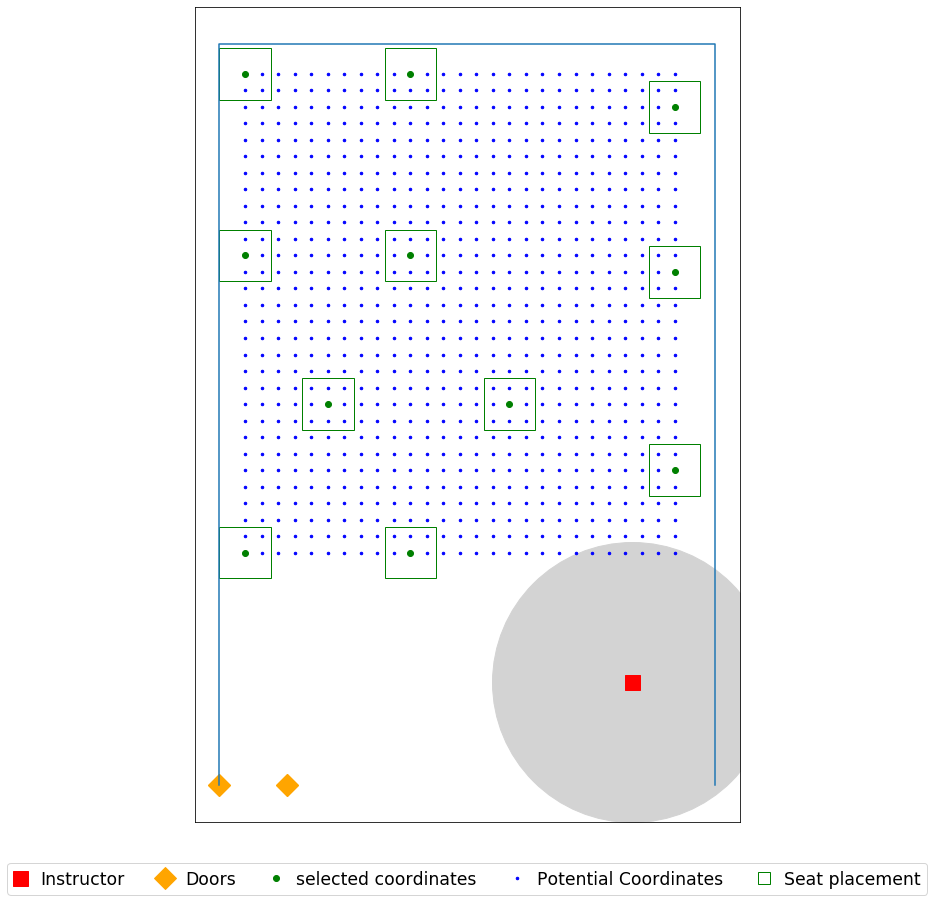

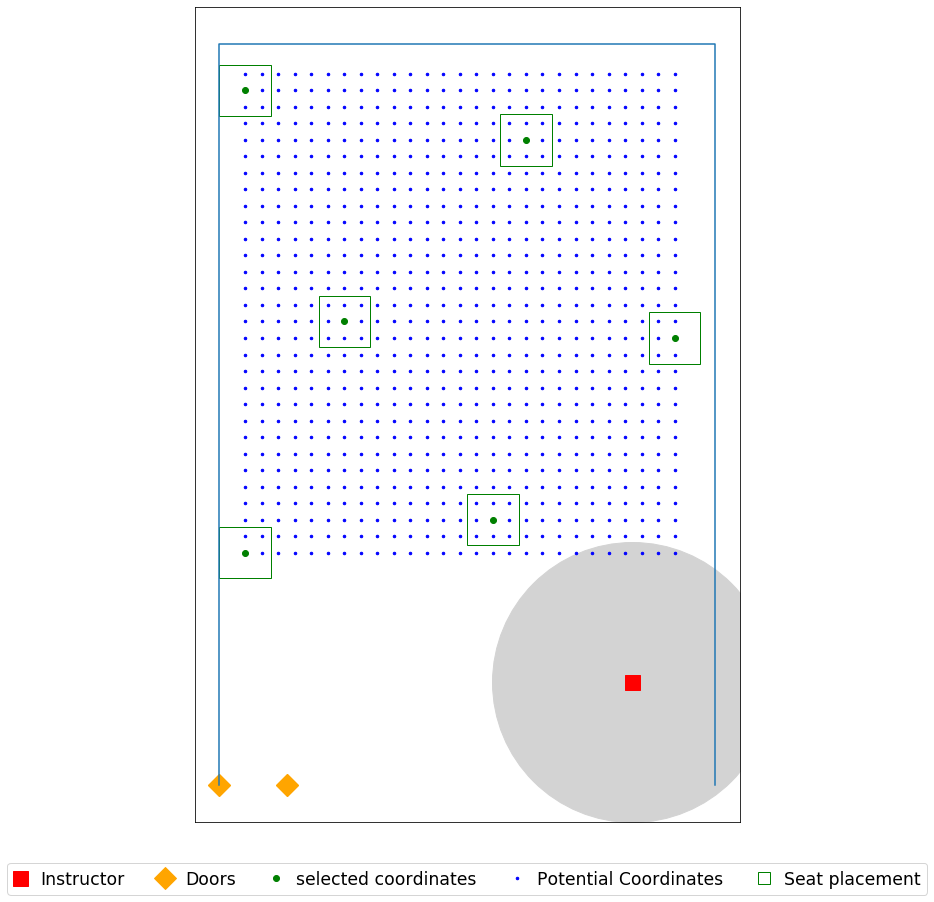

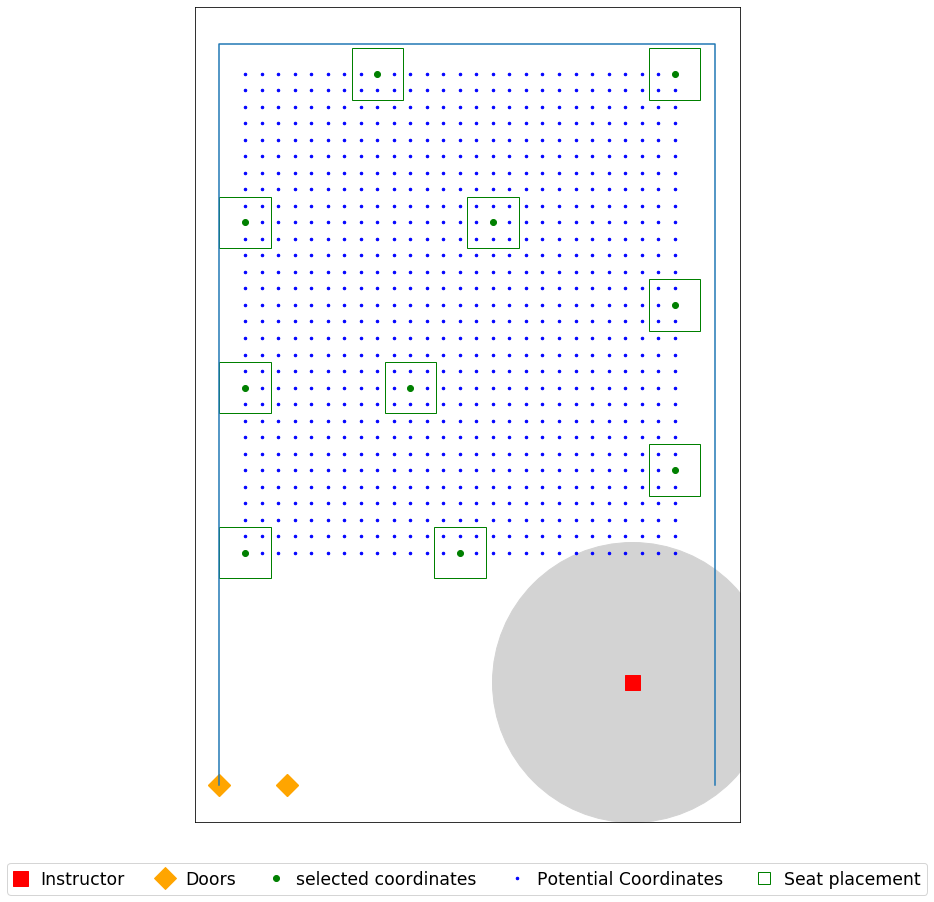

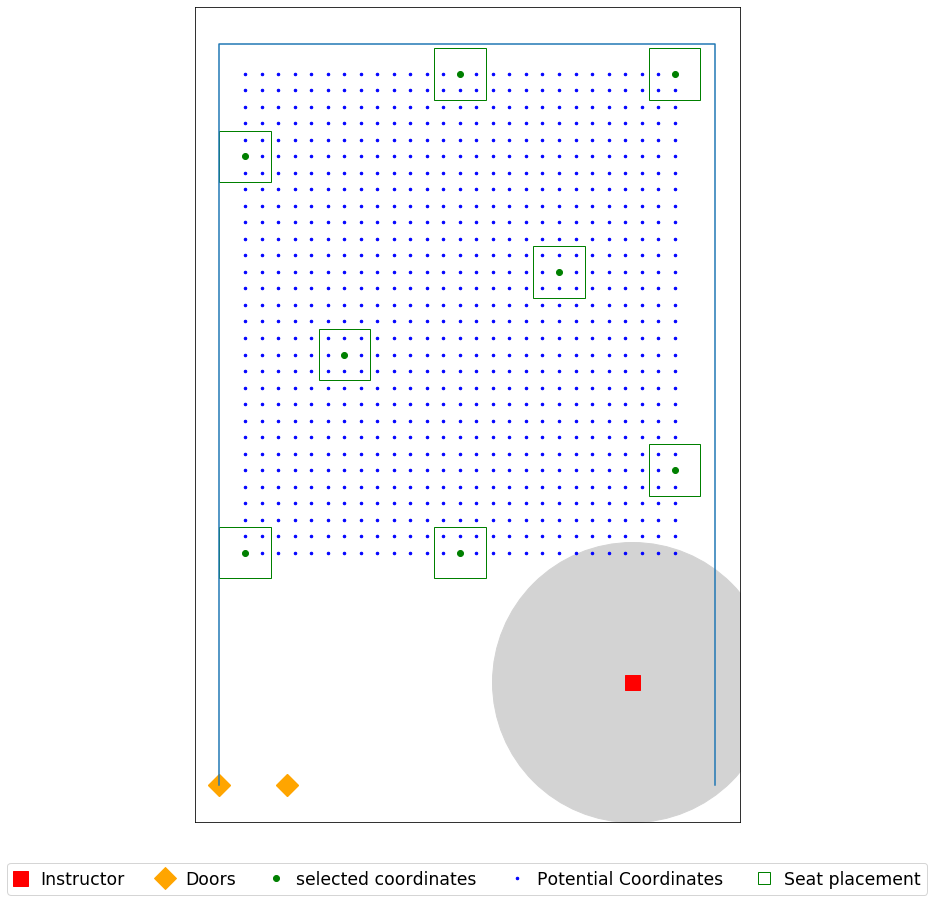

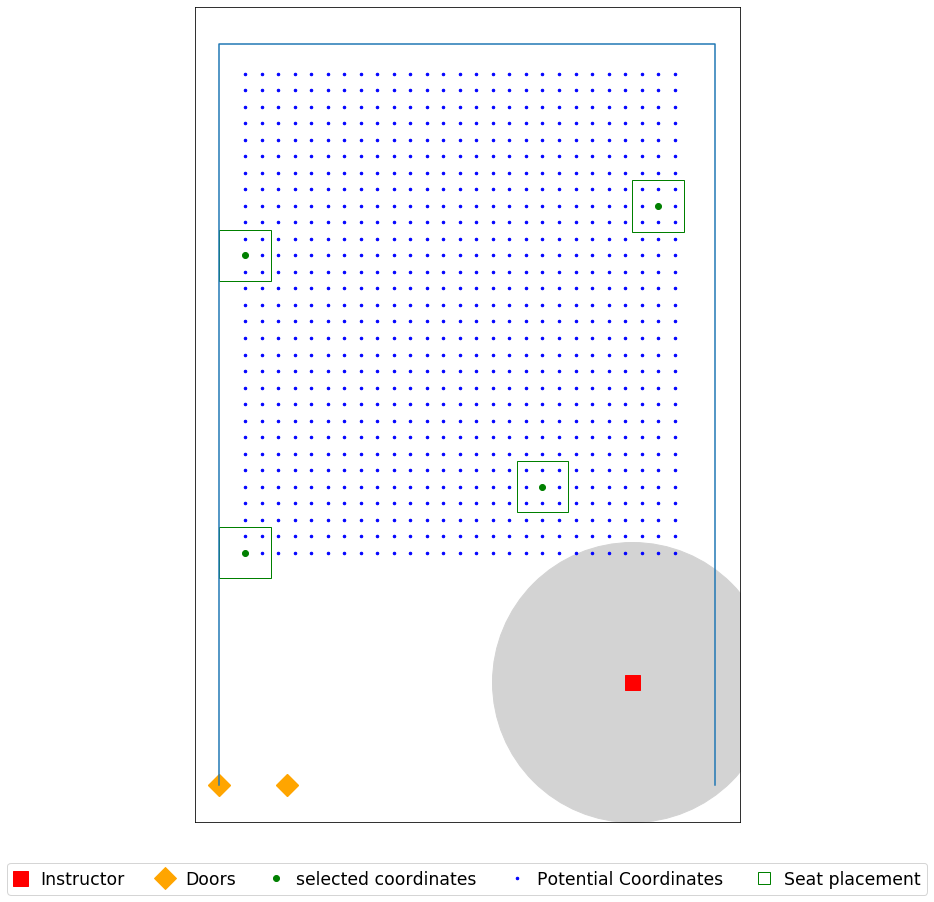

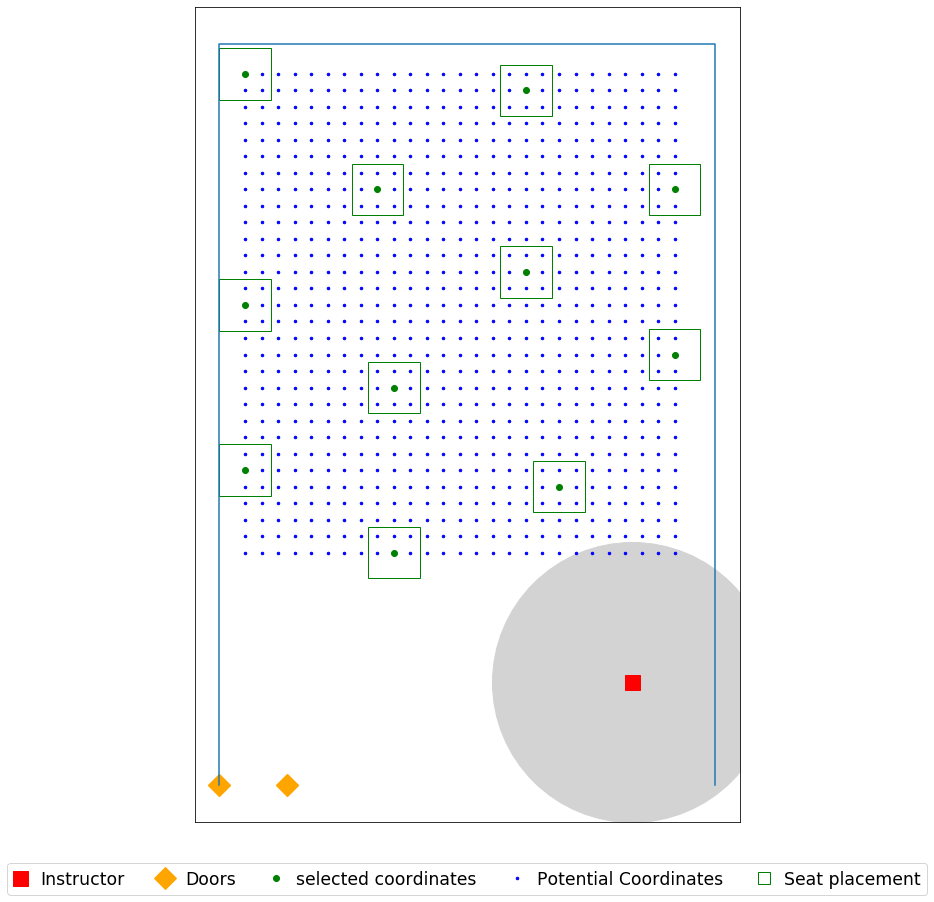

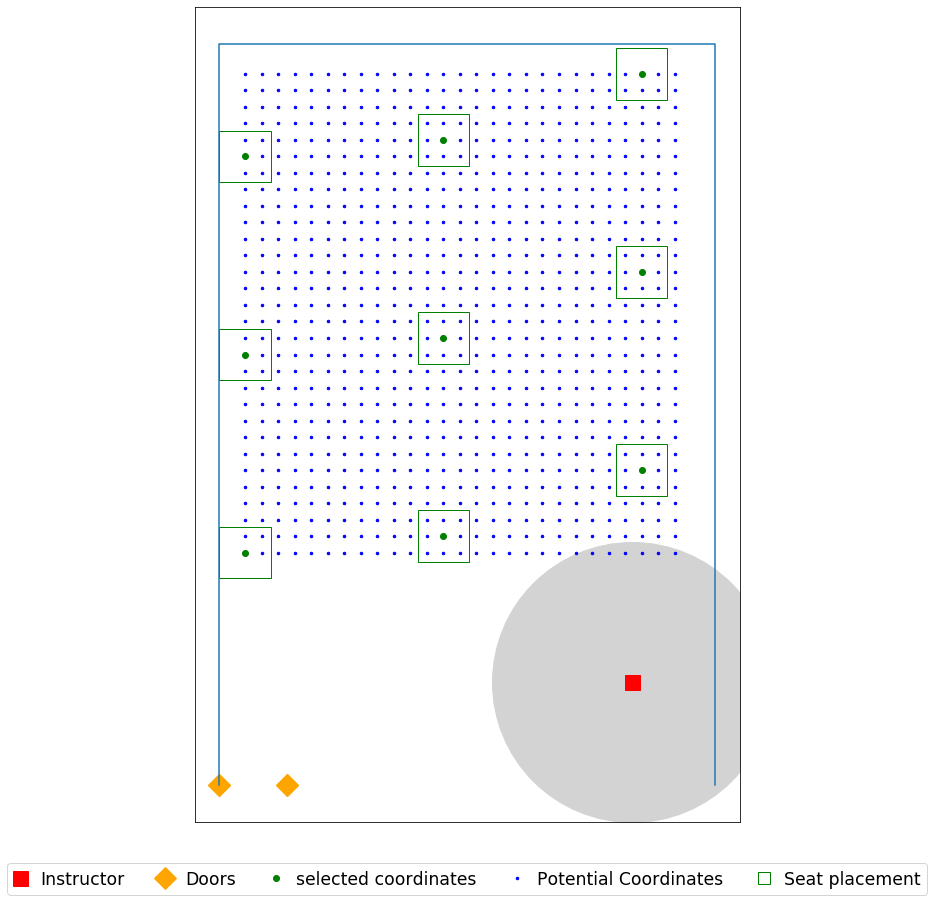

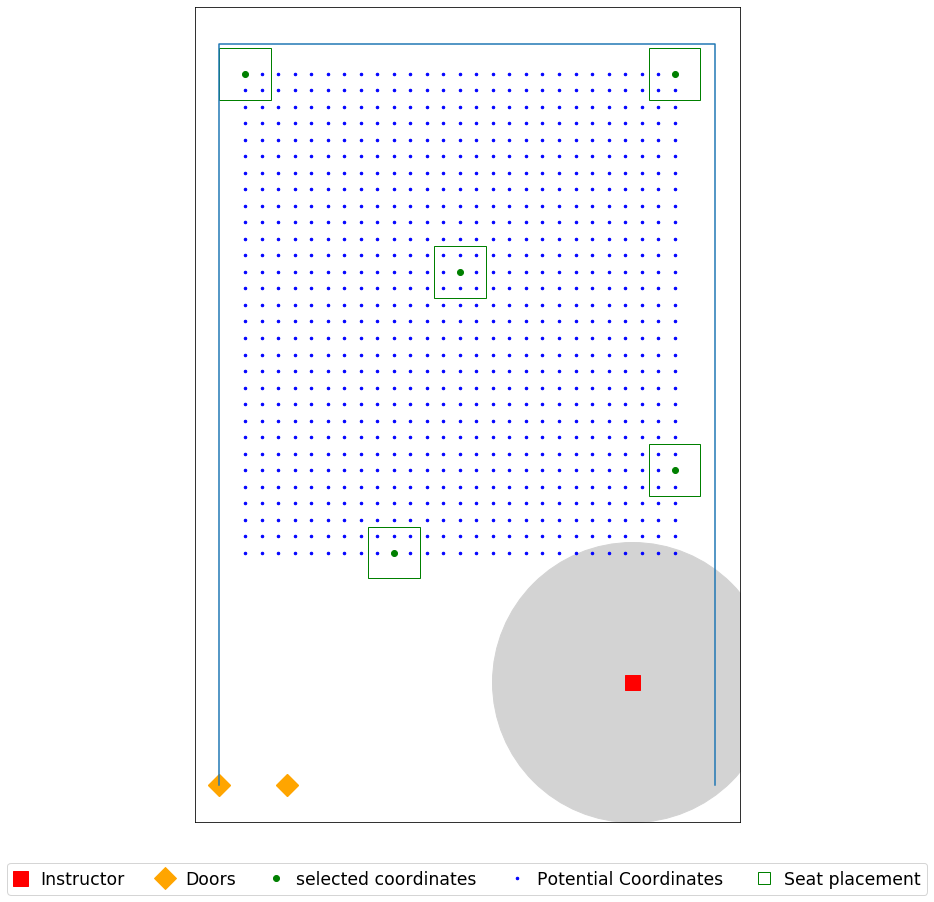

In [108]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Smith 207

In [109]:
data_file = r'C:\Users\yoges\Desktop\Input\024_Smith_207_720.xlsx'

Name = 'Smith_207_'

room dimension (W x H) are [[24.16666667 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.58333333 2.5       ]]
[(0, 10), (24.166666666666668, 10), (24.166666666666668, 25.75), (0, 25.75)]
Total number of seats  is 476


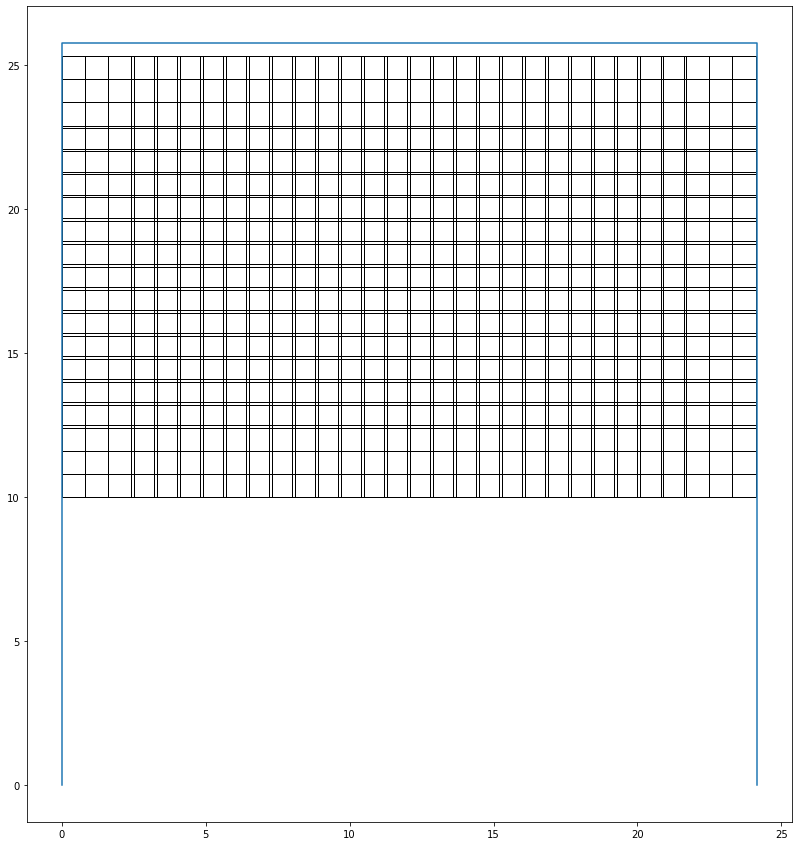

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
13
27
28
104
147
238
251
252
384
451
461
475
room dimension (W x H) are [[24.16666667 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]


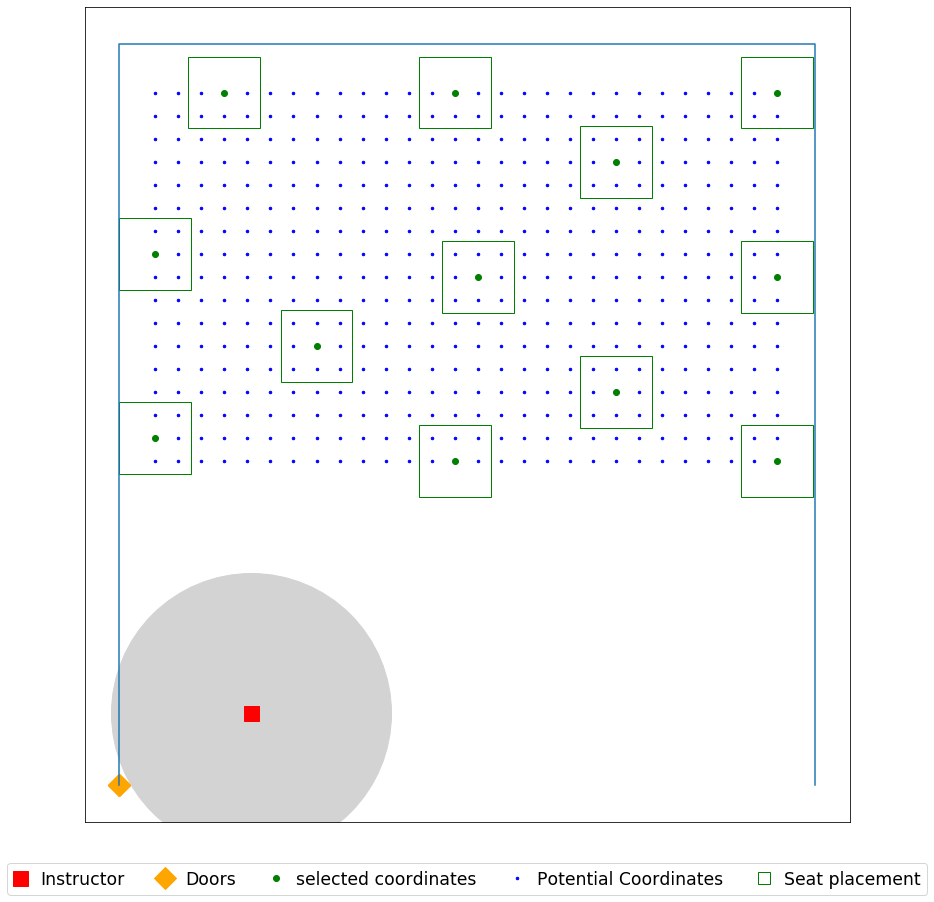

In [110]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

room dimension (W x H) are [[24.16666667 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.58333333 2.5       ]]
[(0, 10), (24.166666666666668, 10), (24.166666666666668, 25.75), (0, 25.75)]
Total number of seats  is 476


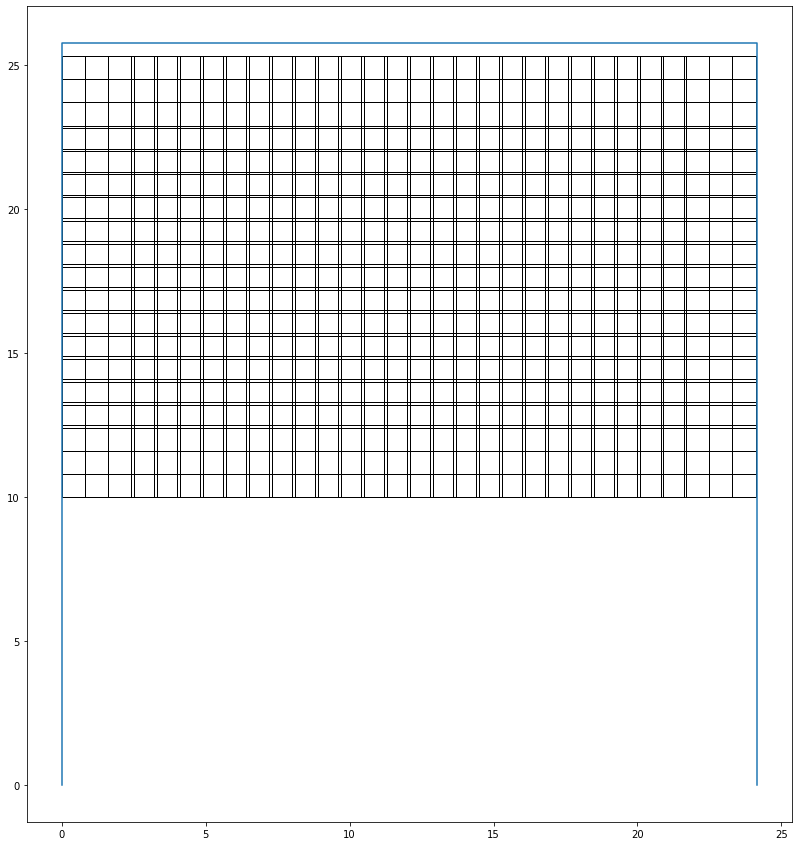

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
13
27
28
104
147
238
251
252
384
451
461
475
room dimension (W x H) are [[24.16666667 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
11
27
28
187
288
448
464
475
room dimension (W x H) are [[24.16666667 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
27
28
238
448
475
room dimension (W x H) are [[24.16666667 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
17
28
55
233
391
420
465
room dimension (W x

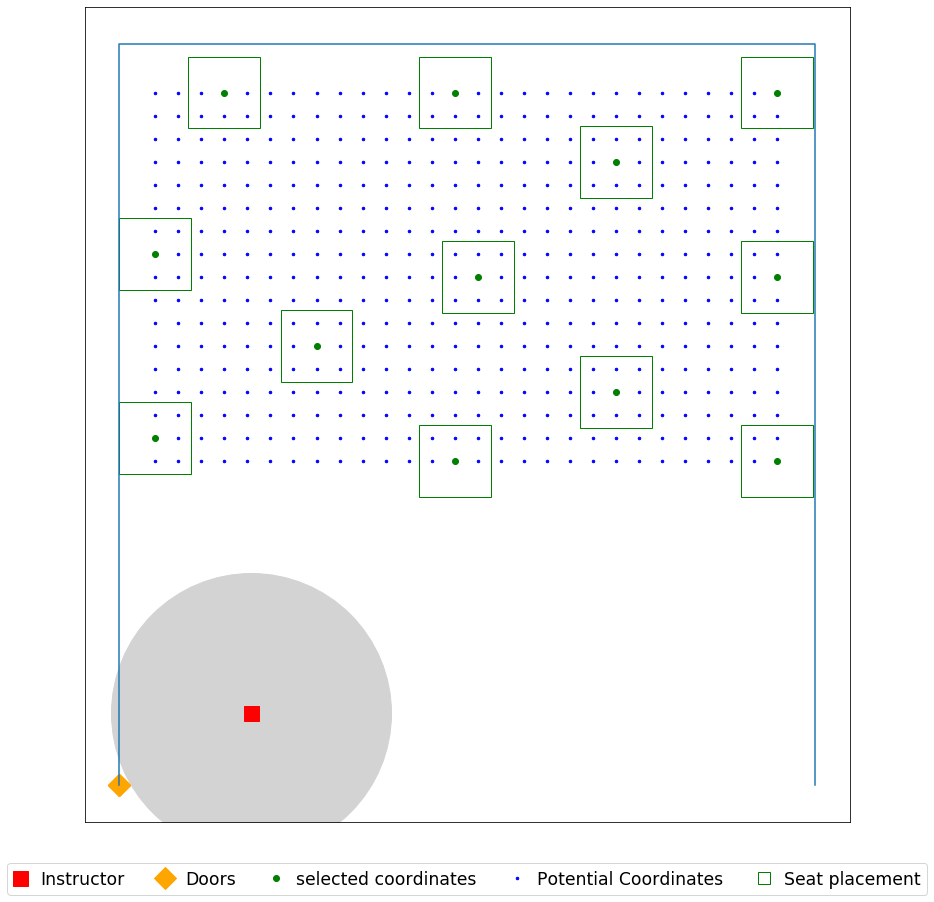

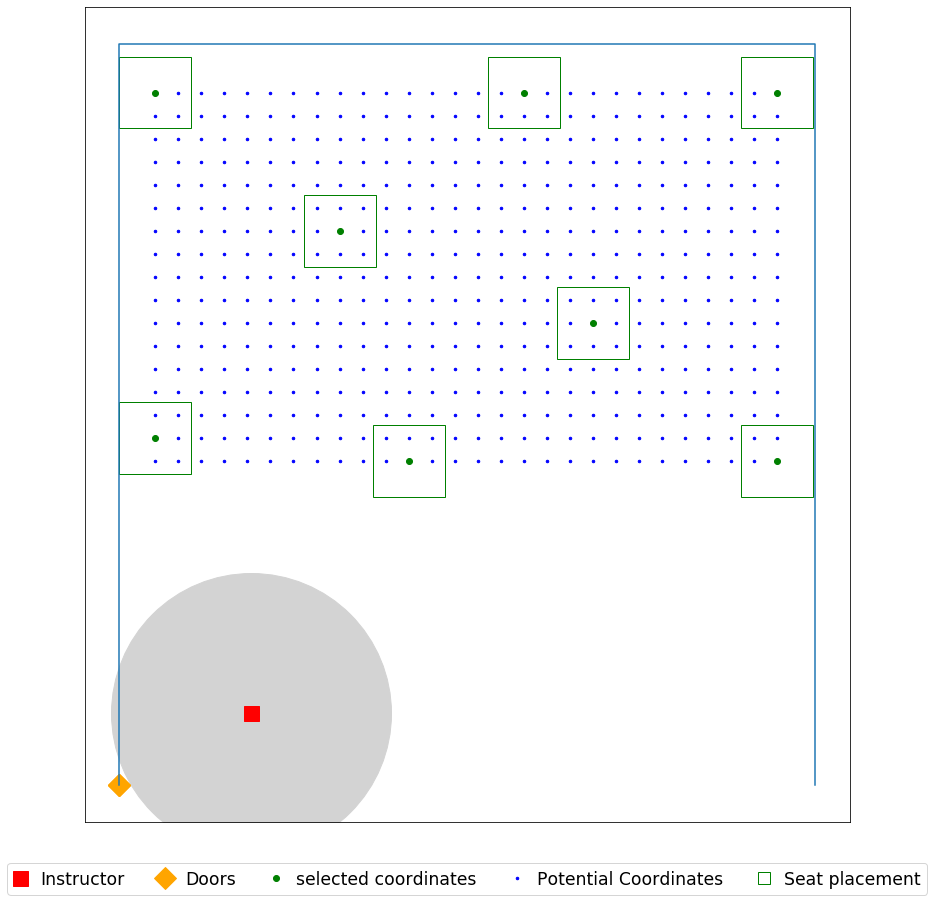

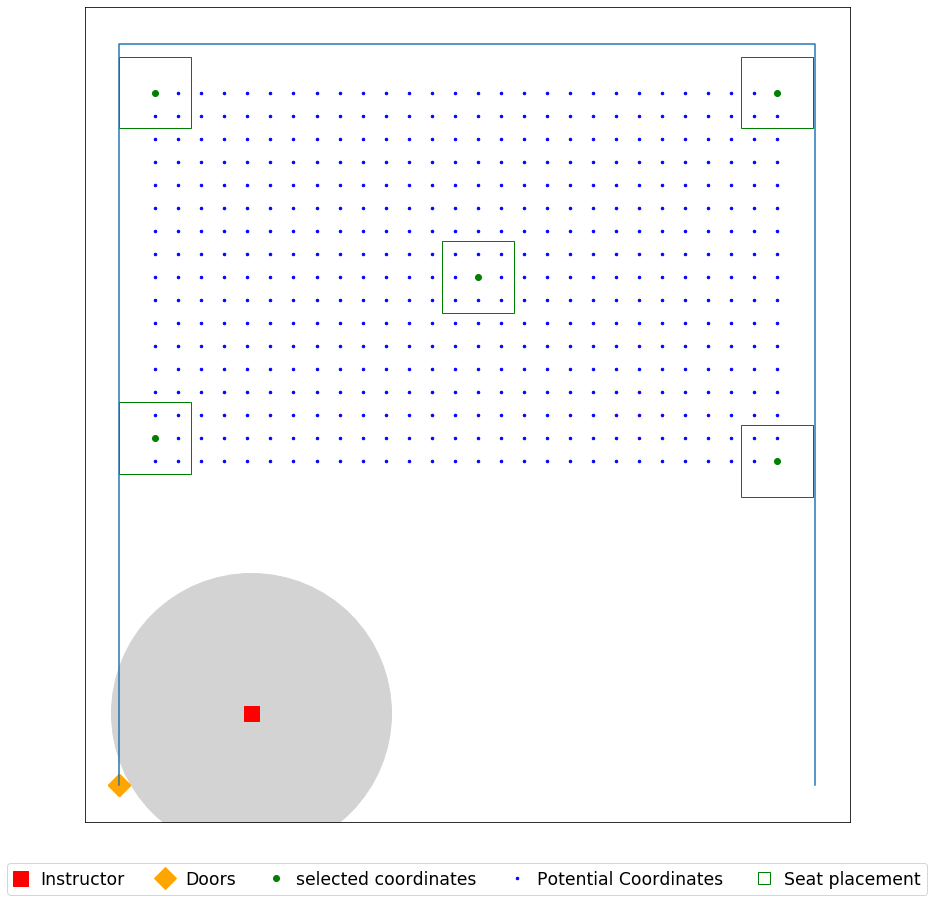

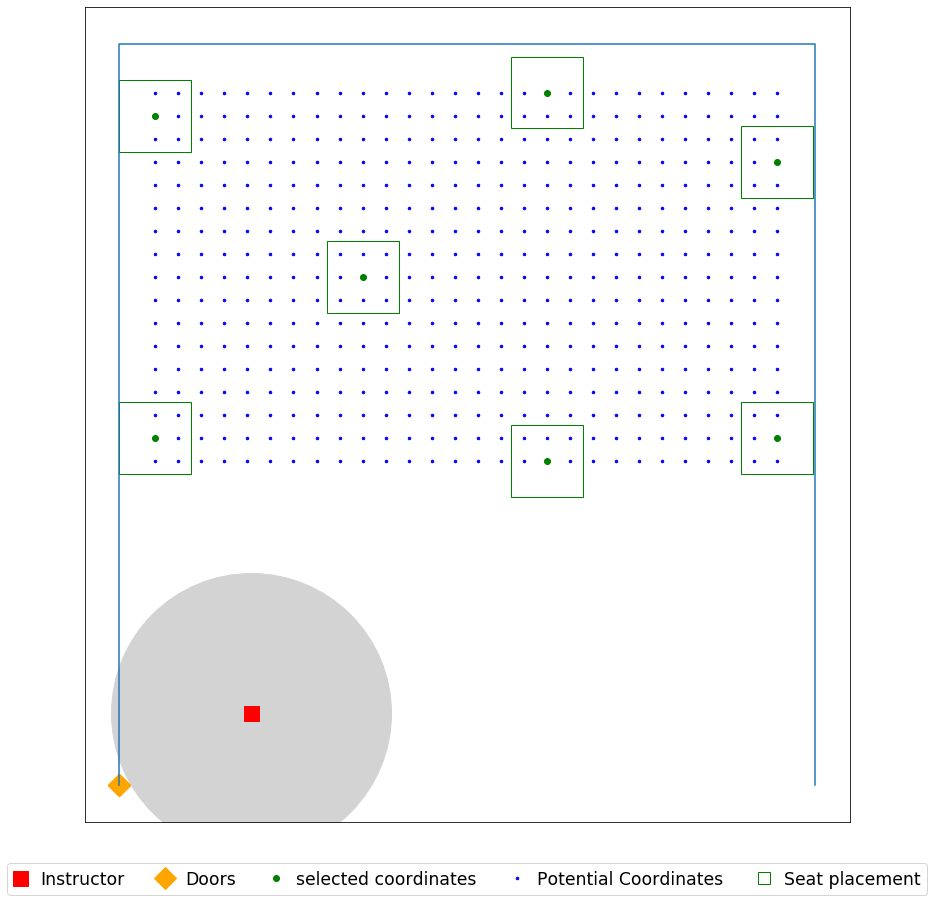

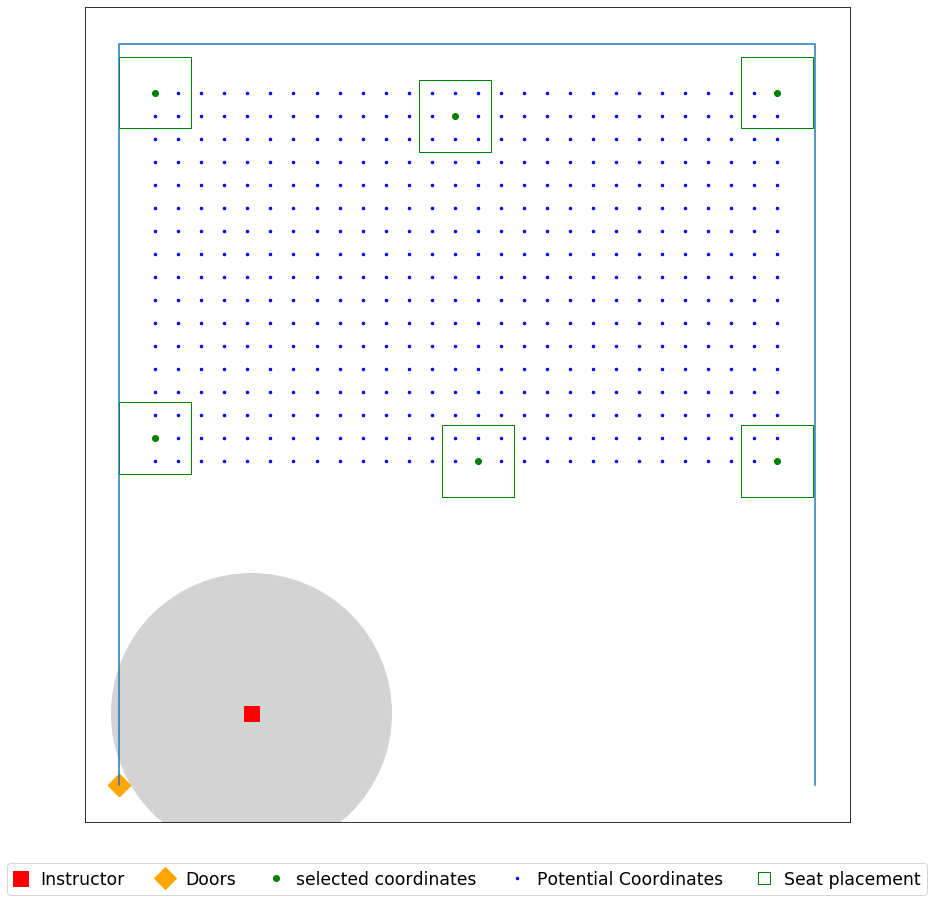

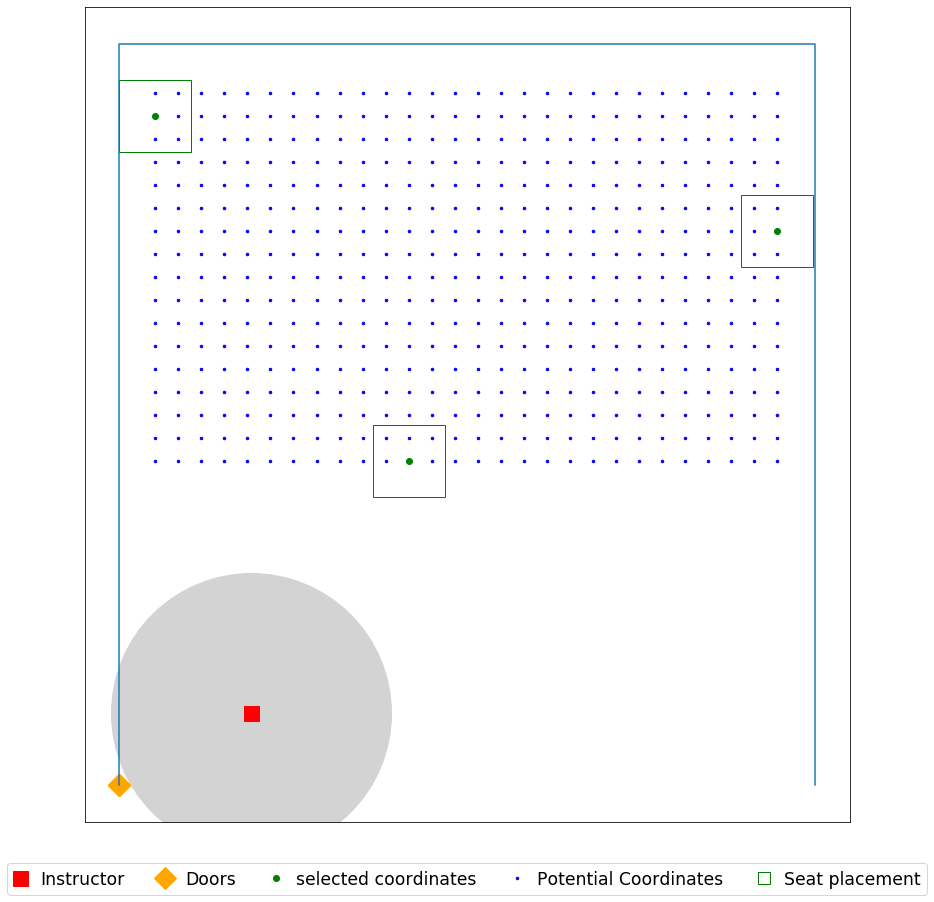

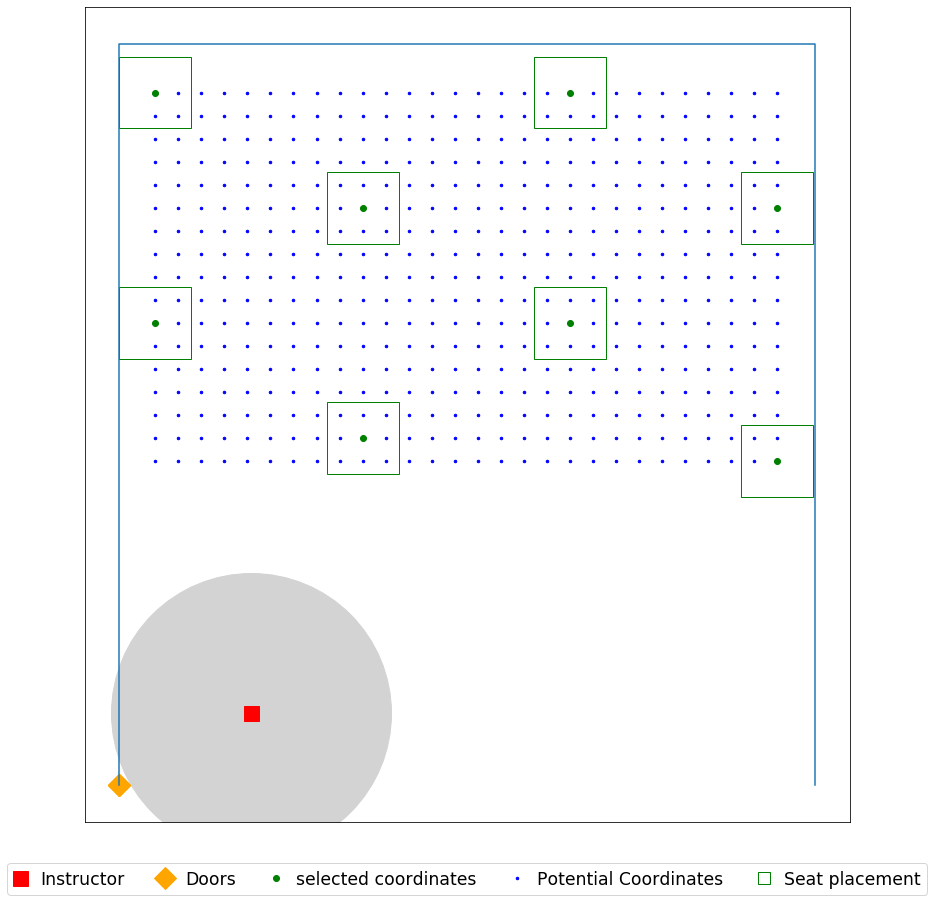

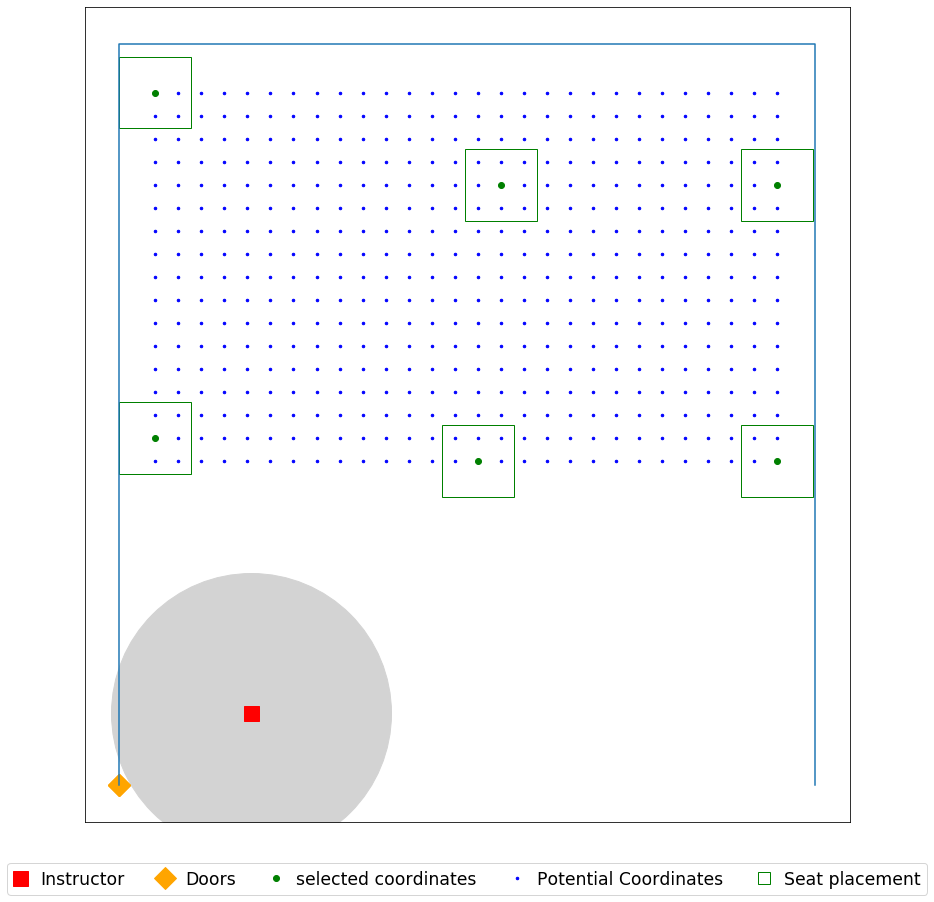

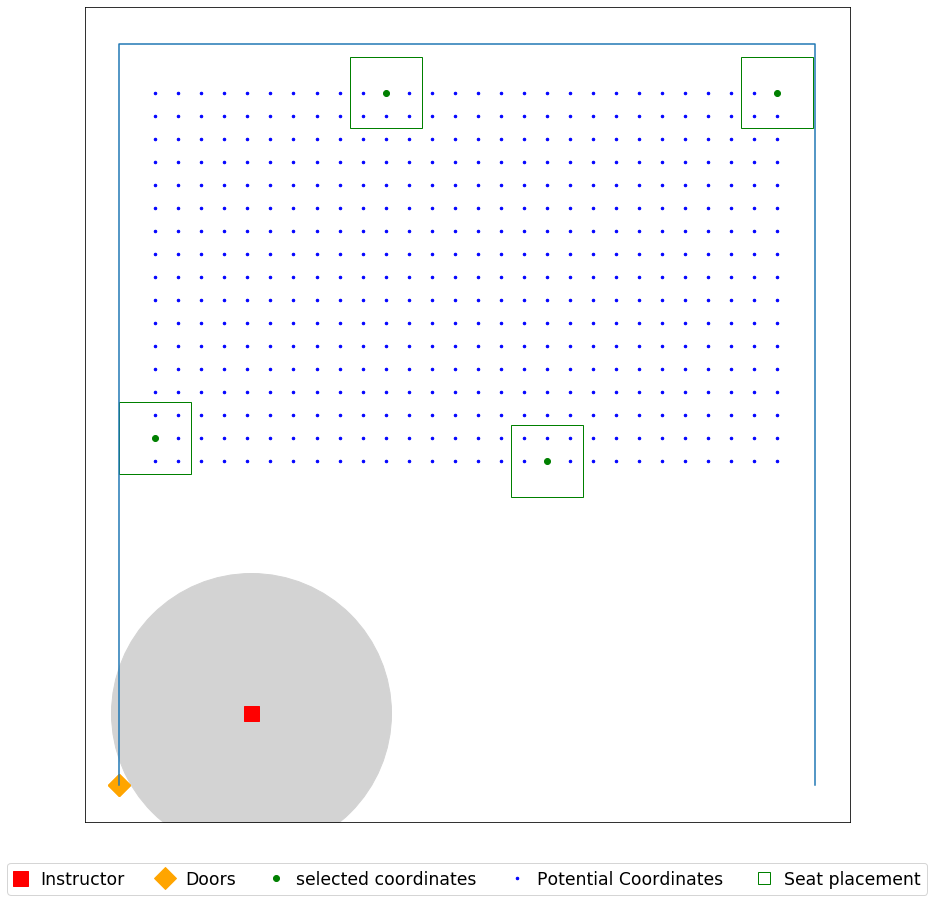

In [111]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Engineering 201

In [112]:
data_file = r'C:\Users\yoges\Desktop\Input\041_ENgineering_201_720.xlsx'

Name = 'ENgineering_201_'

room dimension (W x H) are [[24.66666667 37.83333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.  5.]]
[(0, 10), (24.666666666666668, 10), (24.666666666666668, 37.833333333333336), (0, 37.833333333333336)]
Total number of seats  is 896


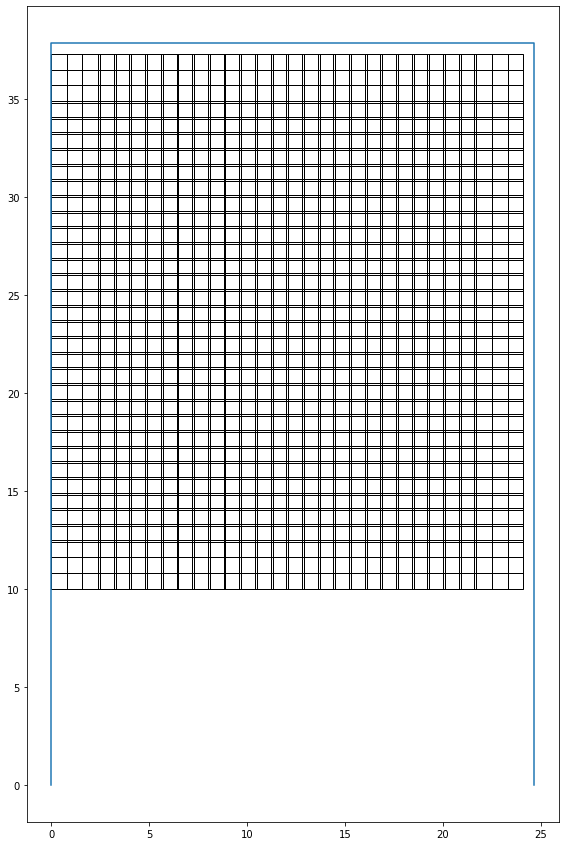

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
8
101
167
227
235
300
391
420
434
511
525
644
658
671
735
804
868
881
895
room dimension (W x H) are [[24.66666667 37.83333333]]
seat dimension (W x H) are [[2.5 2.5]]


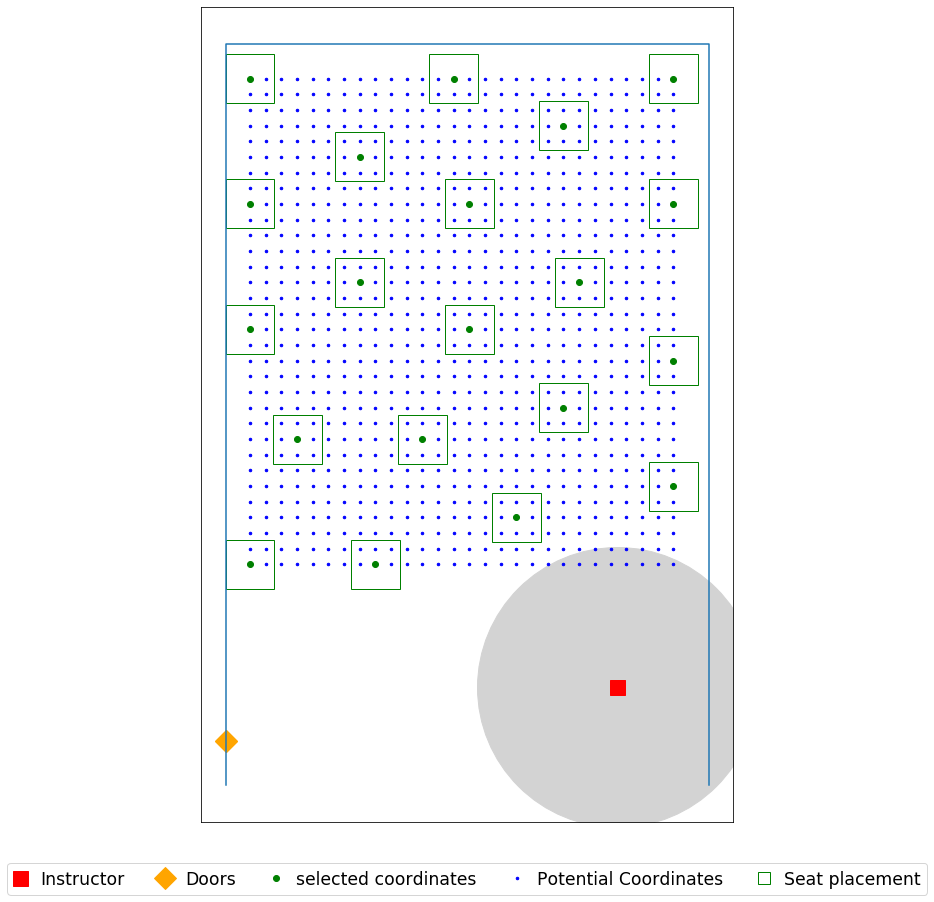

In [113]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
#         plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

room dimension (W x H) are [[24.66666667 37.83333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.  5.]]
[(0, 10), (24.666666666666668, 10), (24.666666666666668, 37.833333333333336), (0, 37.833333333333336)]
Total number of seats  is 896


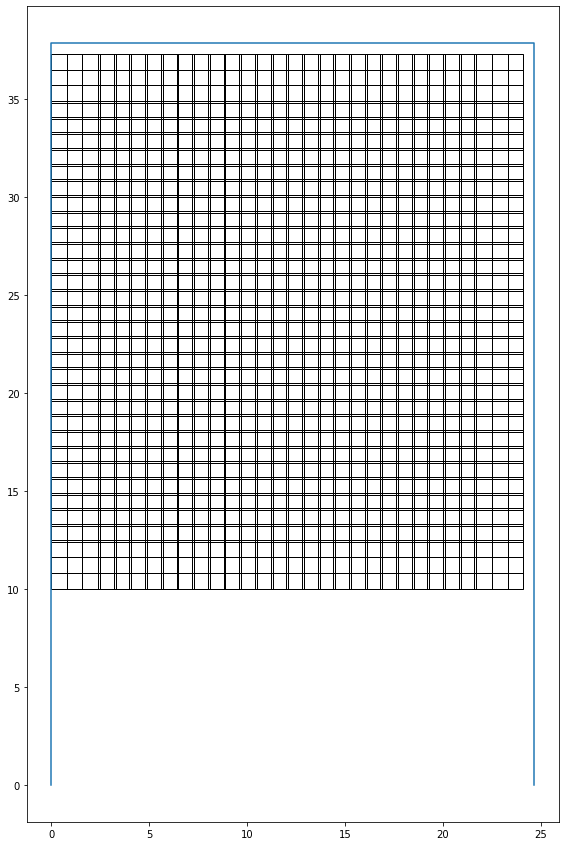

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
8
101
167
227
235
300
391
420
434
511
525
644
658
671
735
804
868
881
895
room dimension (W x H) are [[24.66666667 37.83333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
0
11
167
241
280
429
447
560
578
727
738
868
887
room dimension (W x H) are [[24.66666667 37.83333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
0
71
335
448
631
868
895
room dimension (W x H) are [[24.66666667 37.83333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of

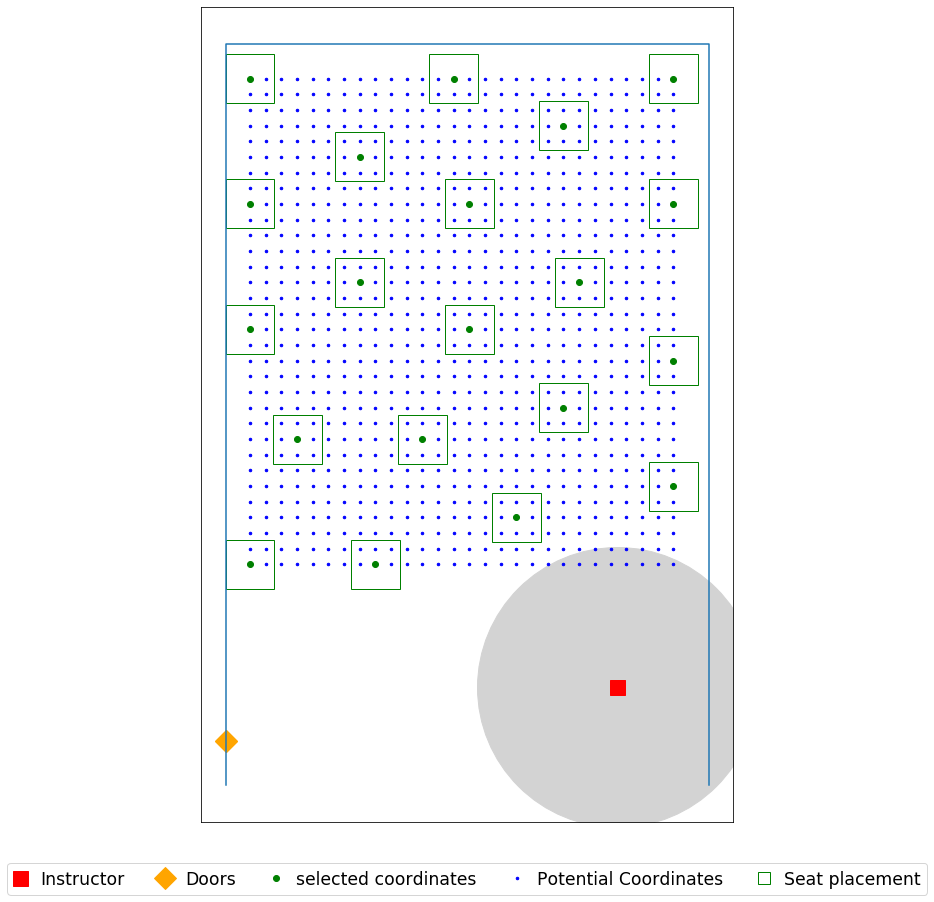

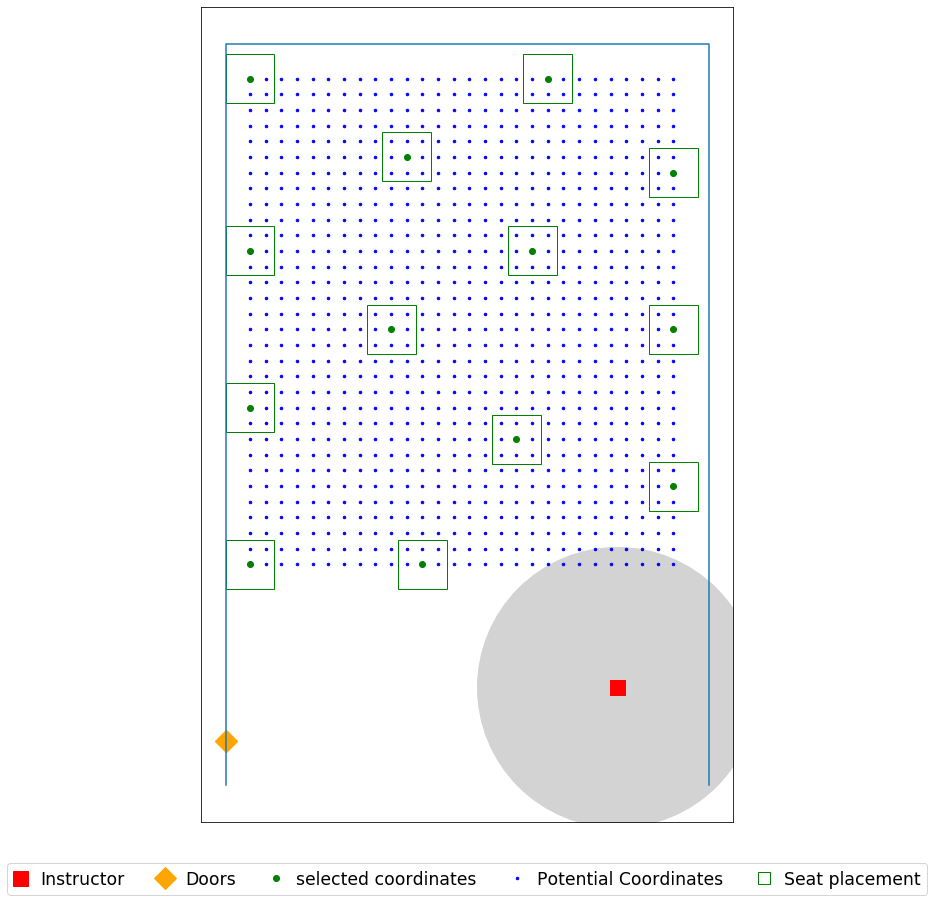

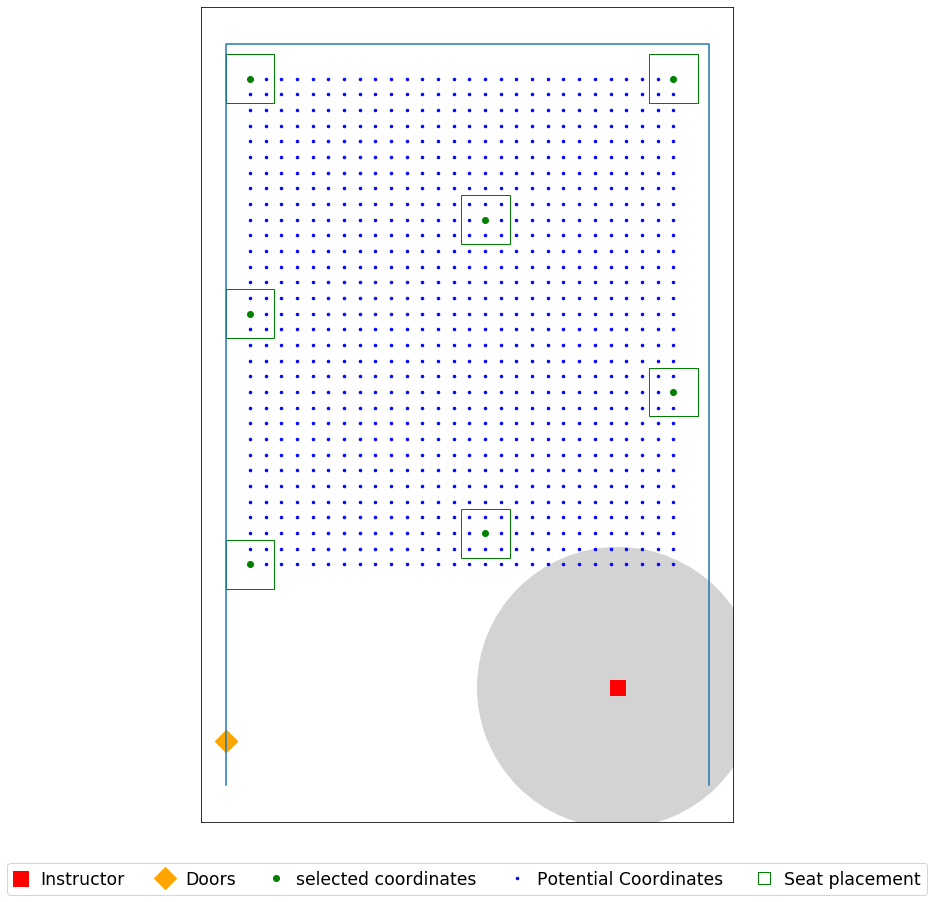

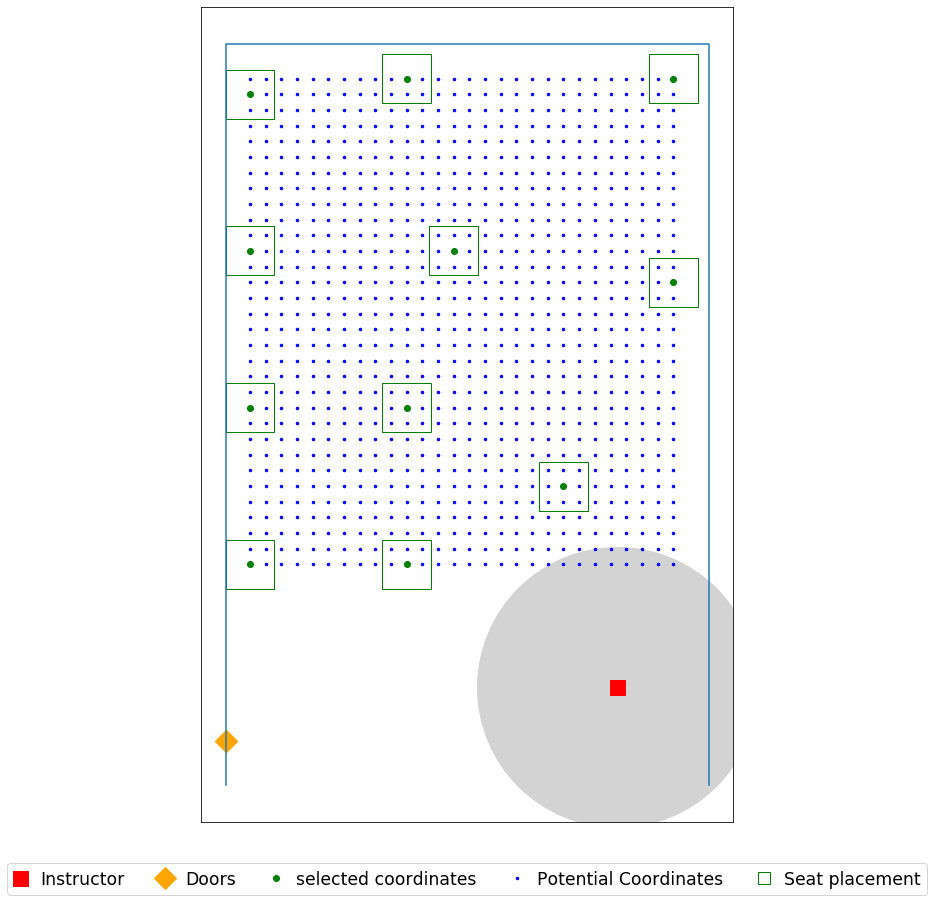

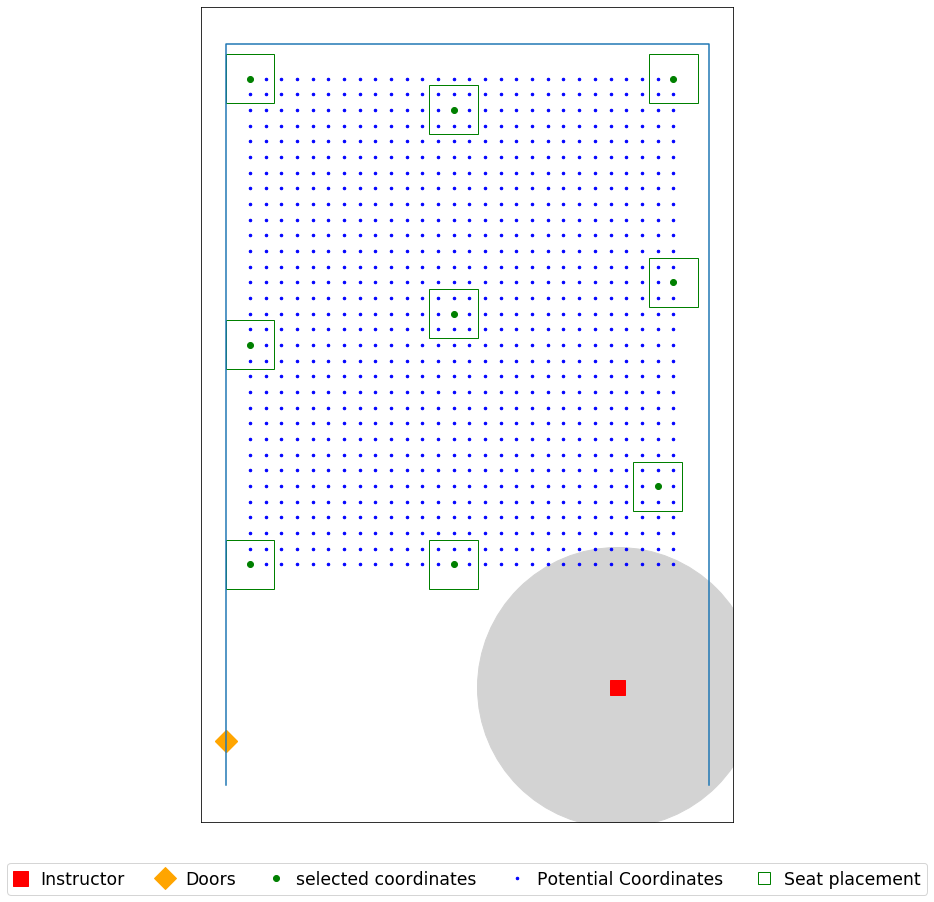

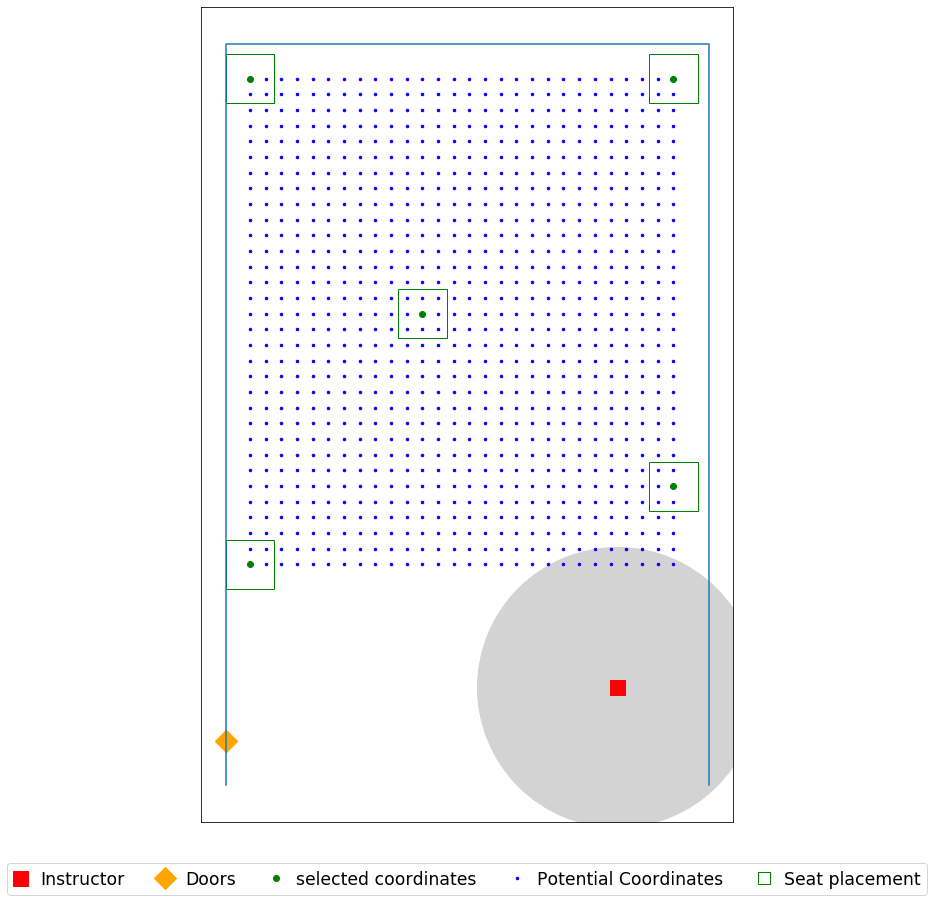

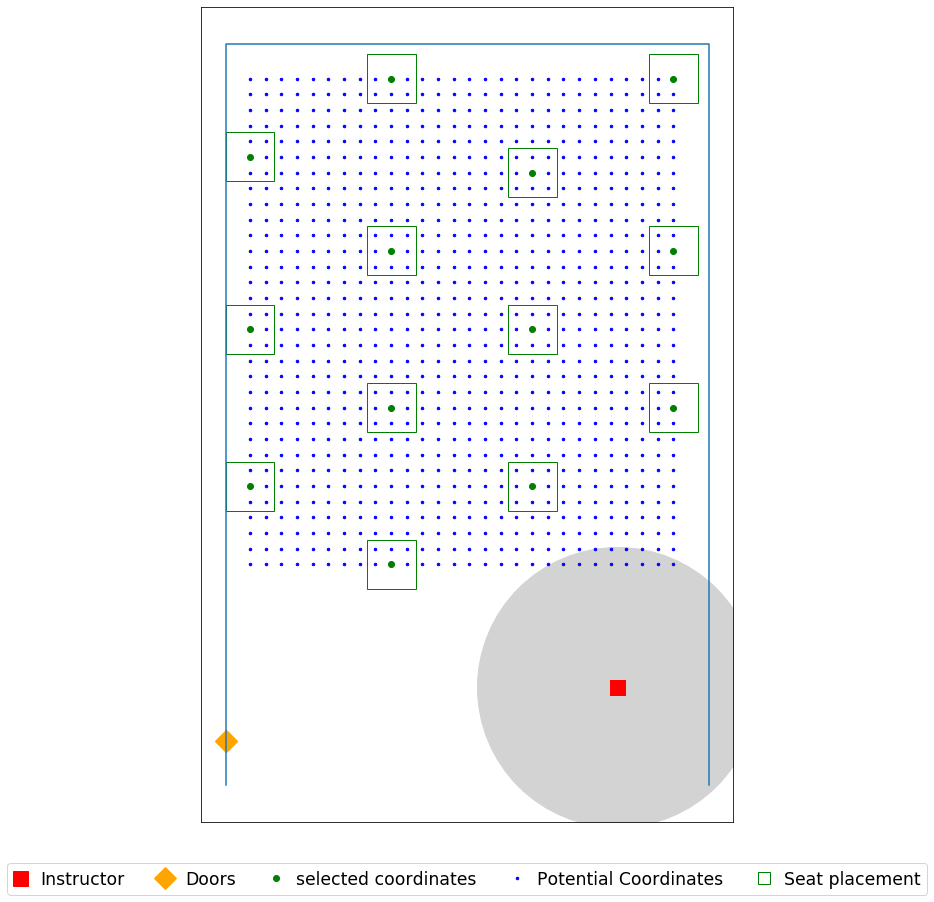

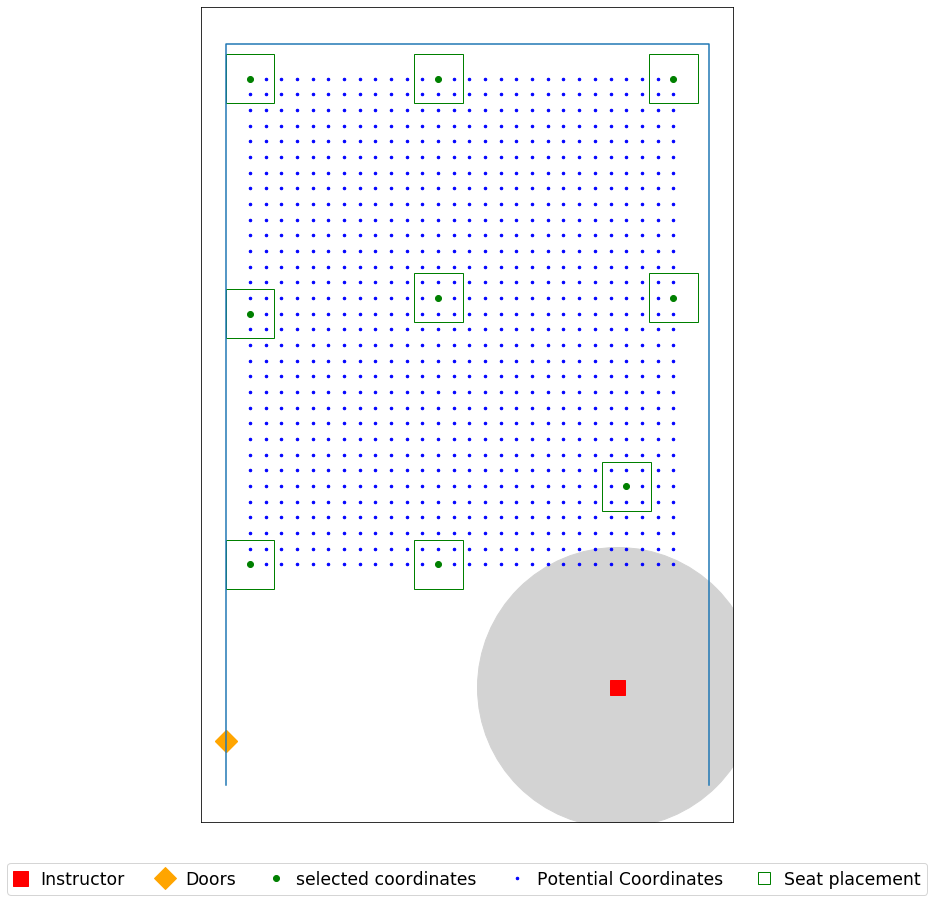

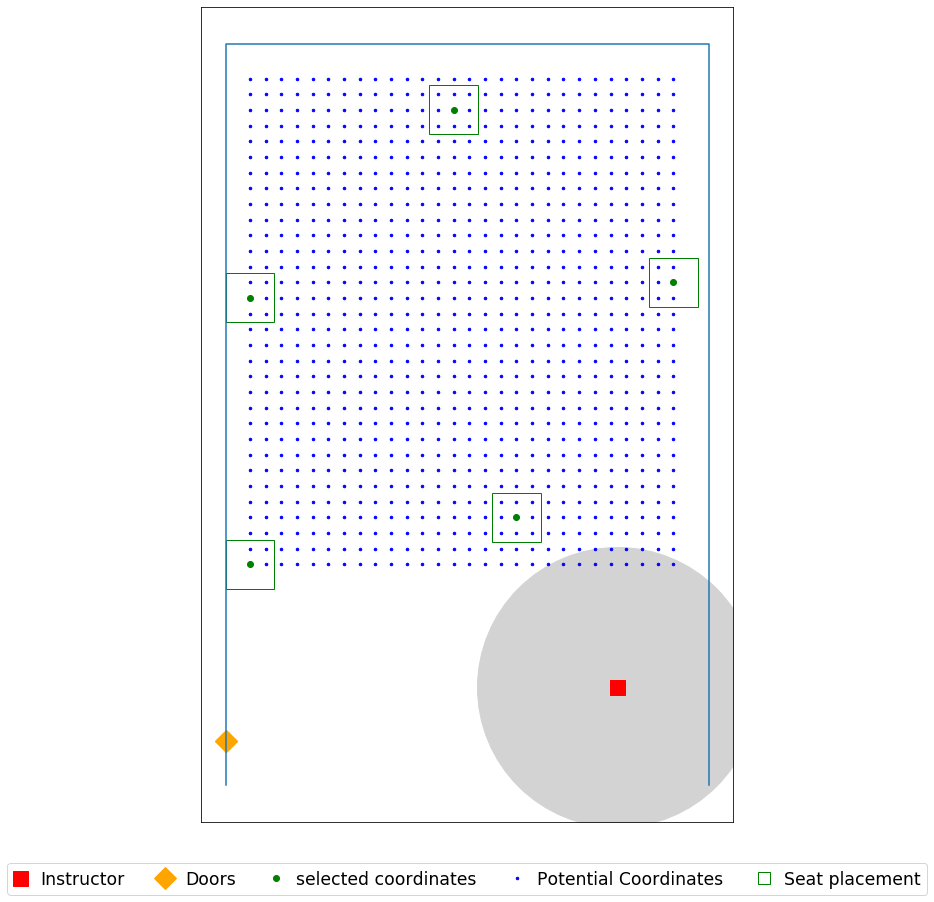

In [114]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

# Executed on 07/21 : CAD Coordinates by Yogesh

## Smith 304

In [194]:
data_file = r'C:\Users\yoges\Desktop\Input\024_Smith_304_721.xlsx'

Name = 'Smith_304_'

room dimension (W x H) are [[24.0 25.333333333333332]]
seat dimension (W x H) are [[2.5 2.5]]
[[16.666666666666668 5]]
[(0, 10), (24.0, 10), (24.0, 25.333333333333332), (0, 25.333333333333332)]
Total number of seats  is 459


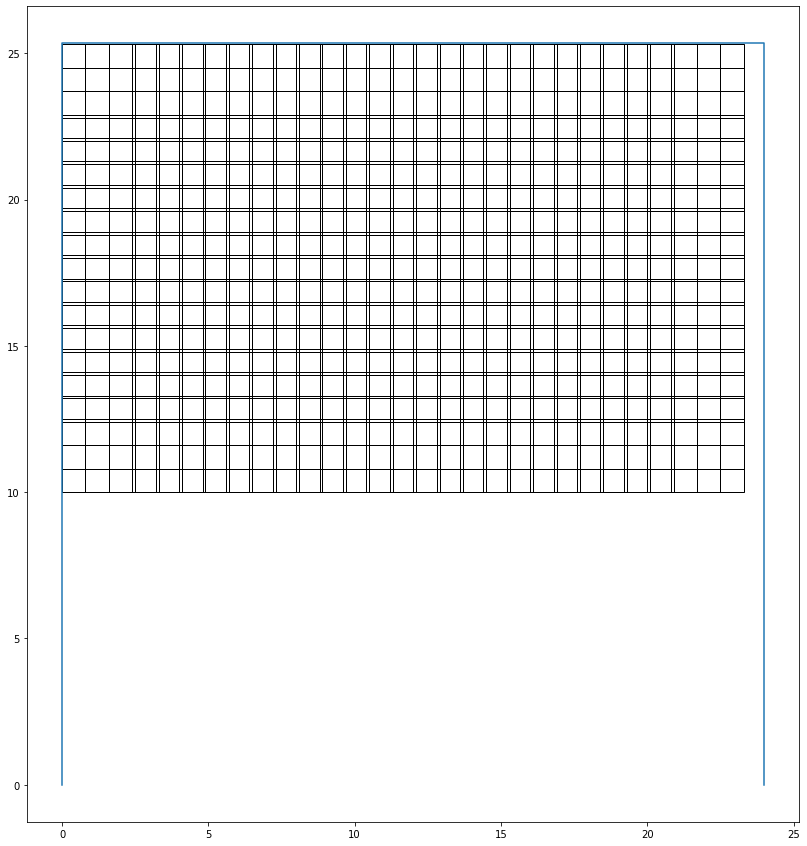

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
107
123
216
224
264
432
441
450
458
room dimension (W x H) are [[24.0 25.333333333333332]]
seat dimension (W x H) are [[2.5 2.5]]


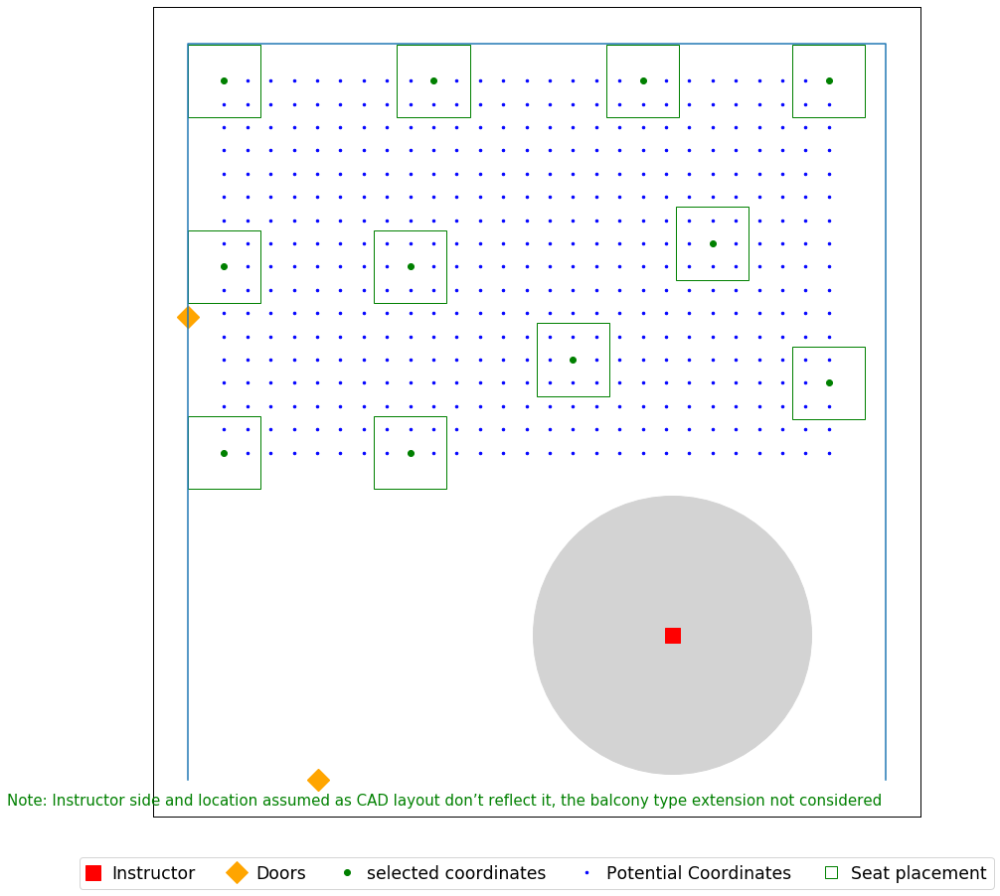

In [195]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_304\Smith_304_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity_text(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_304\Smith_304_6ft_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[24.0 25.333333333333332]]
seat dimension (W x H) are [[2.5 2.5]]
[[16.666666666666668 5]]
[(0, 10), (24.0, 10), (24.0, 25.333333333333332), (0, 25.333333333333332)]
Total number of seats  is 459


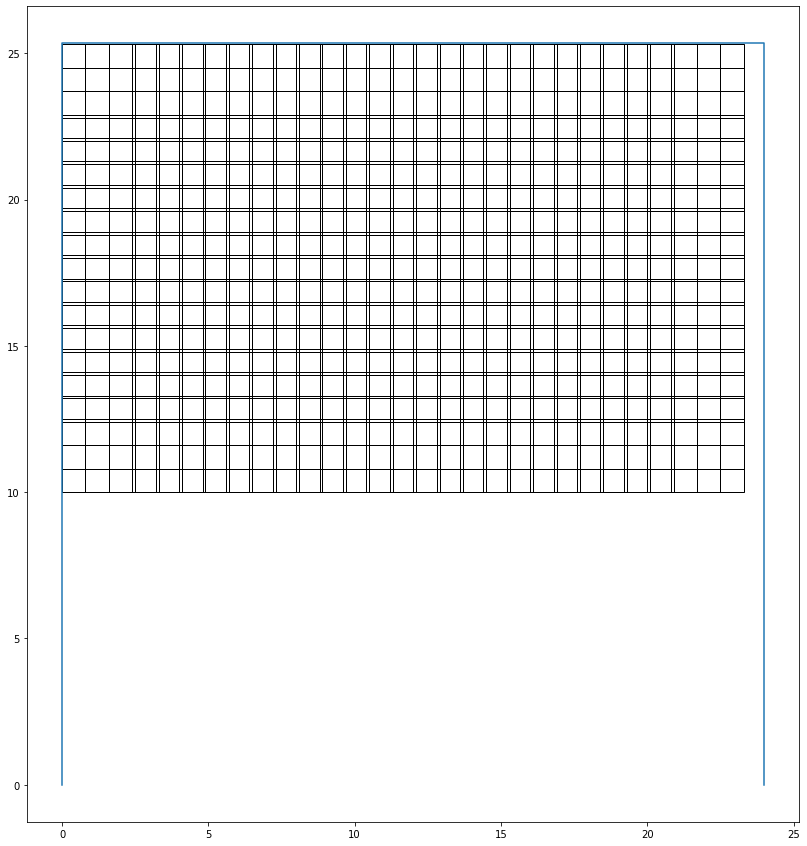

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
107
123
216
224
264
432
441
450
458
room dimension (W x H) are [[24.0 25.333333333333332]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
0
37
107
259
270
377
440
room dimension (W x H) are [[24.0 25.333333333333332]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
9
107
393
405
room dimension (W x H) are [[24.0 25.333333333333332]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
37
107
270
307
401
room dimension (W x H) are [[24.0 25

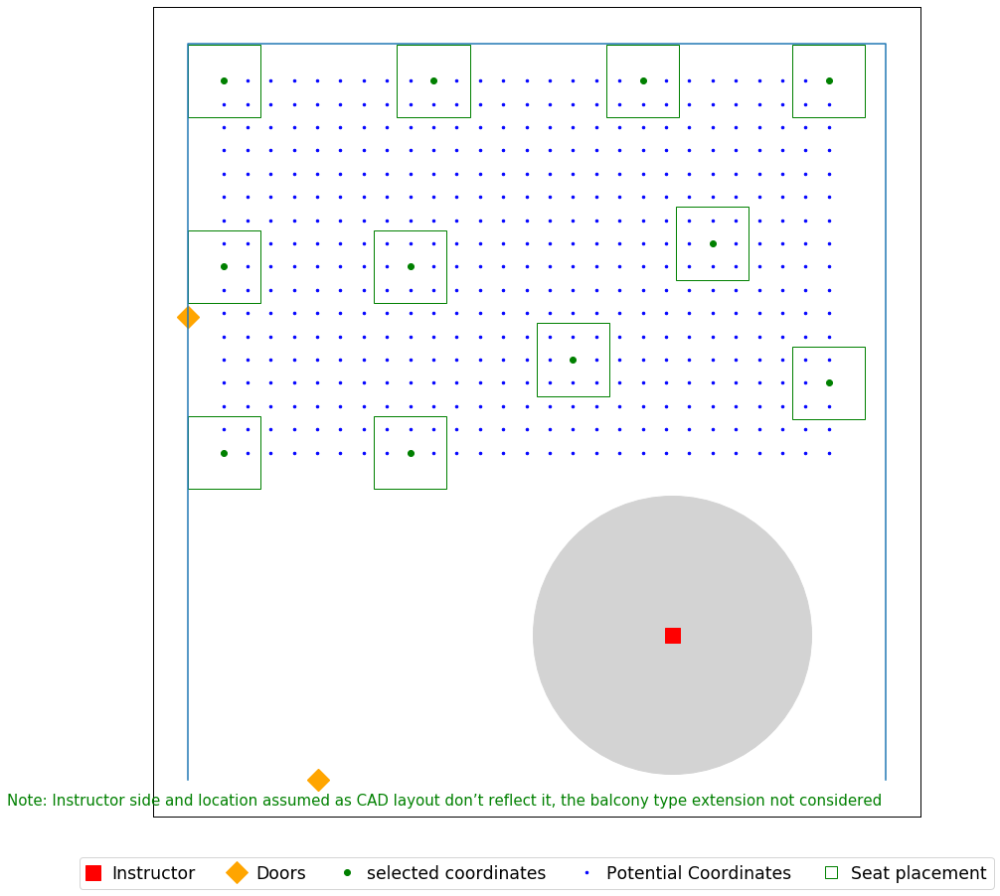

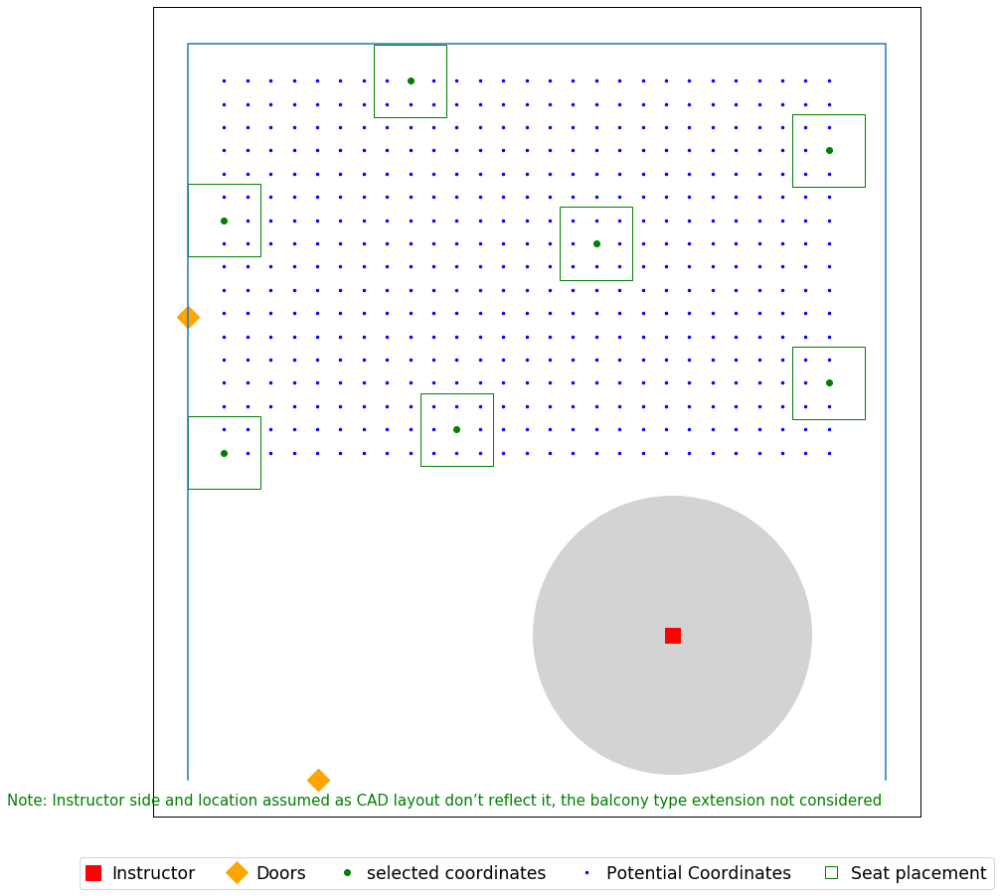

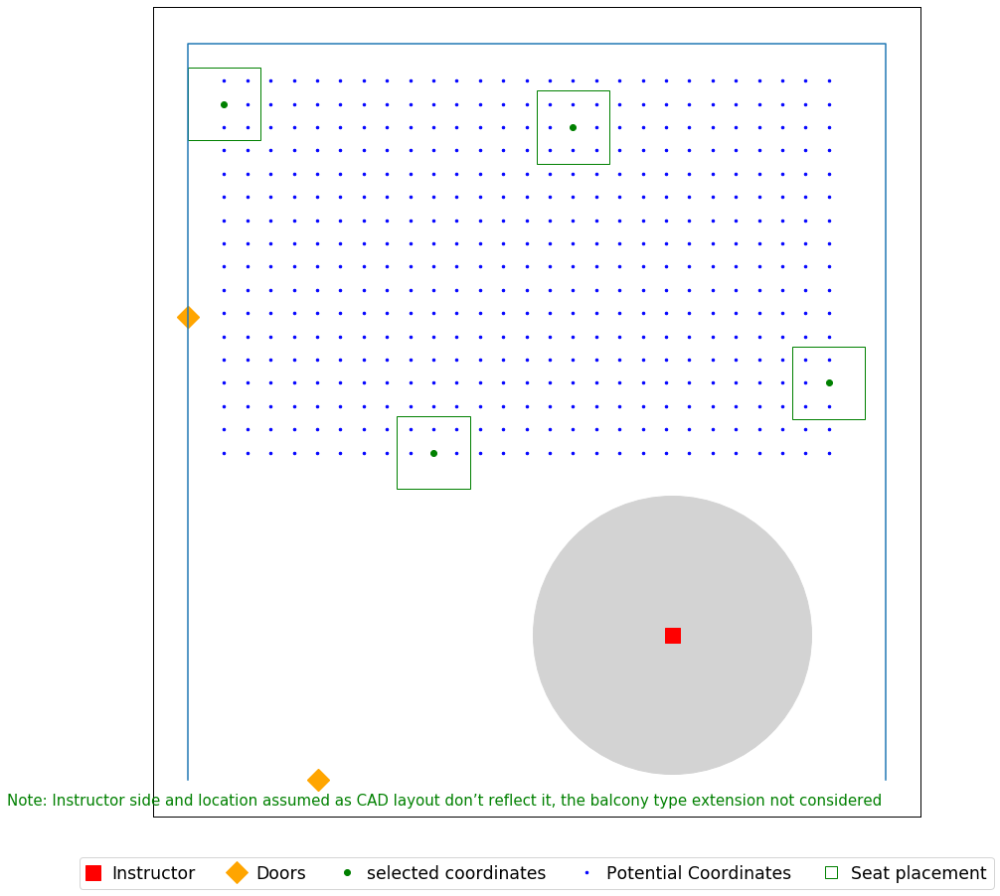

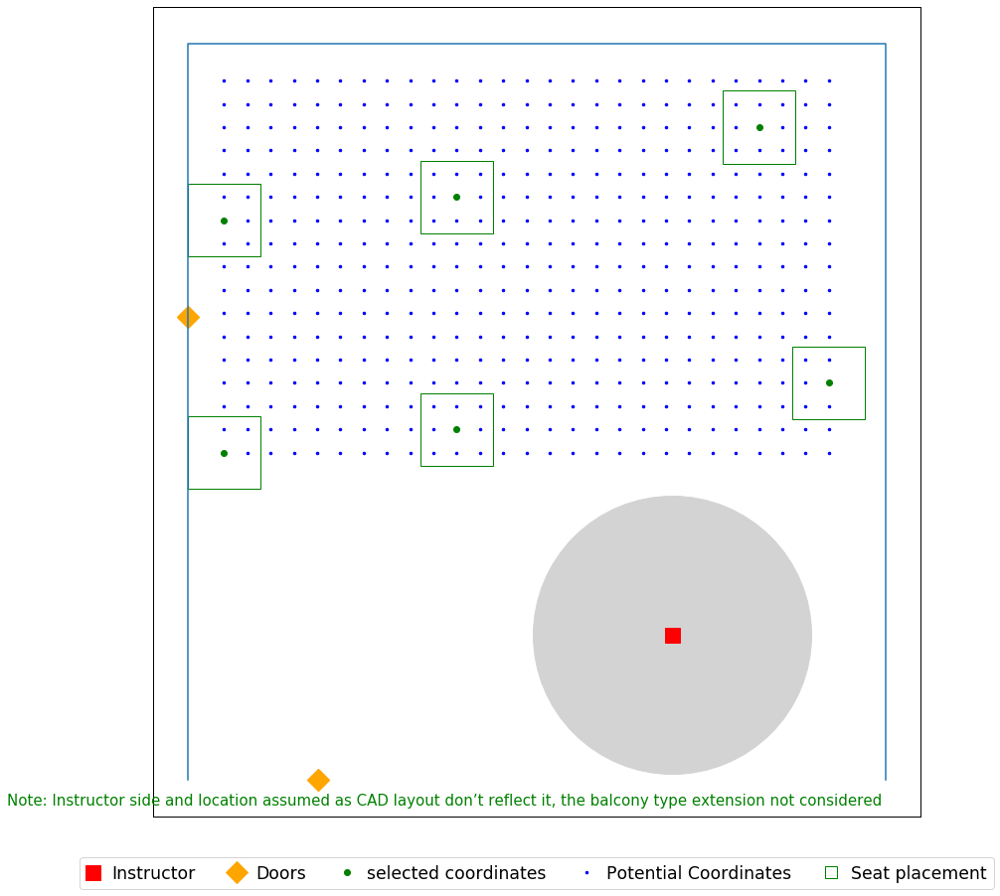

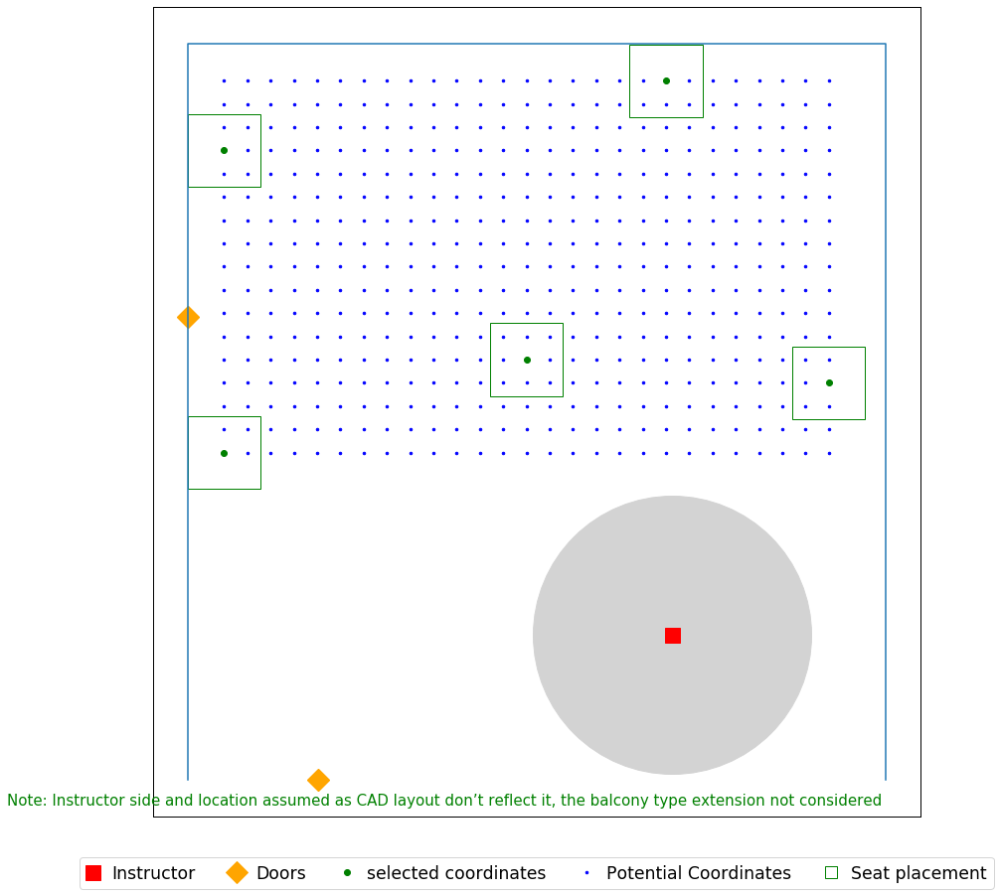

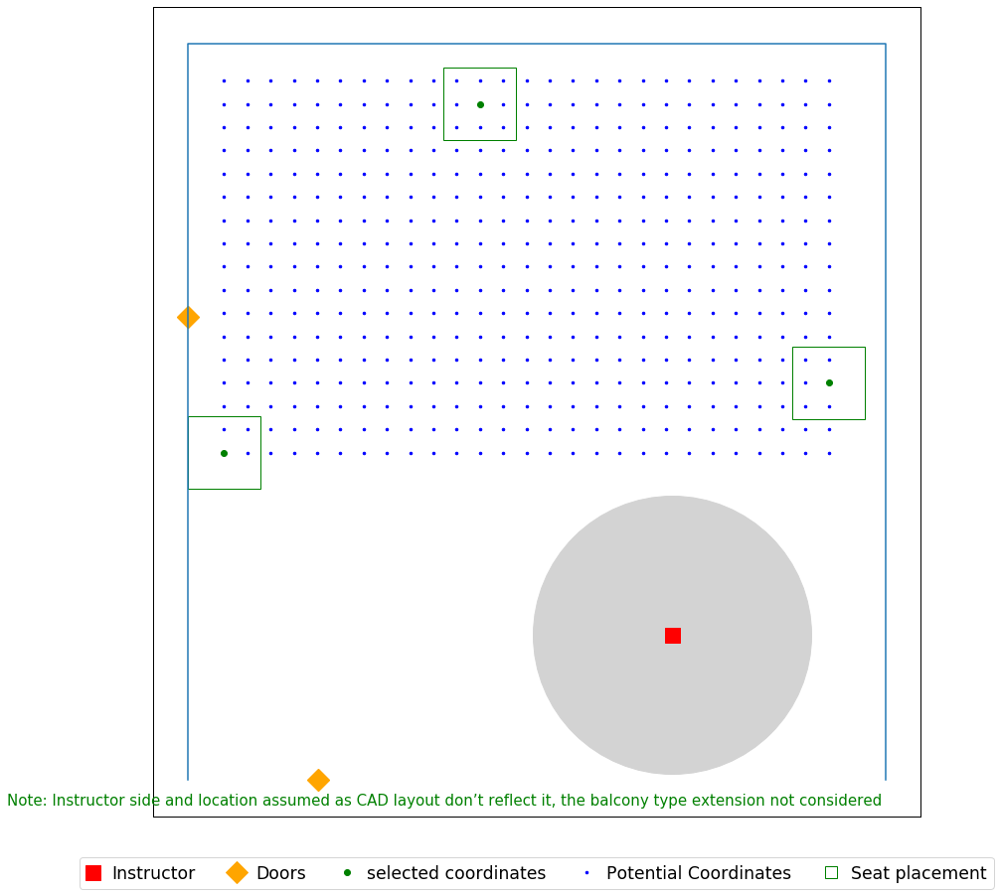

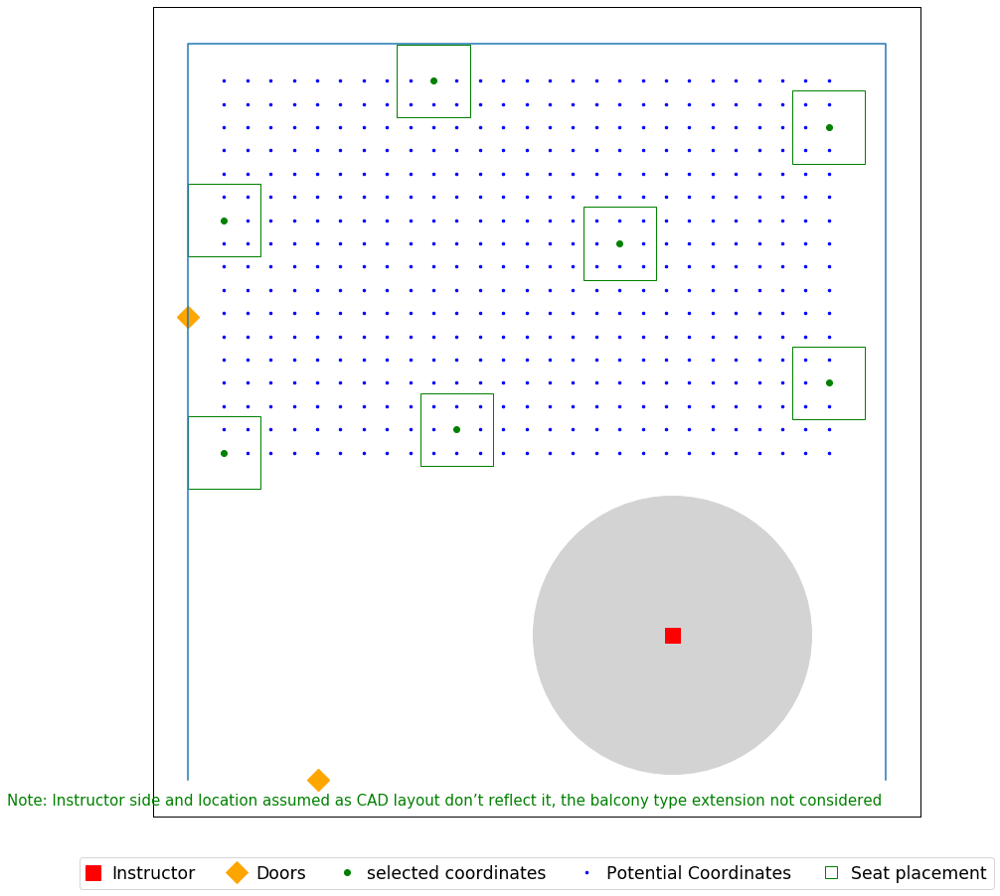

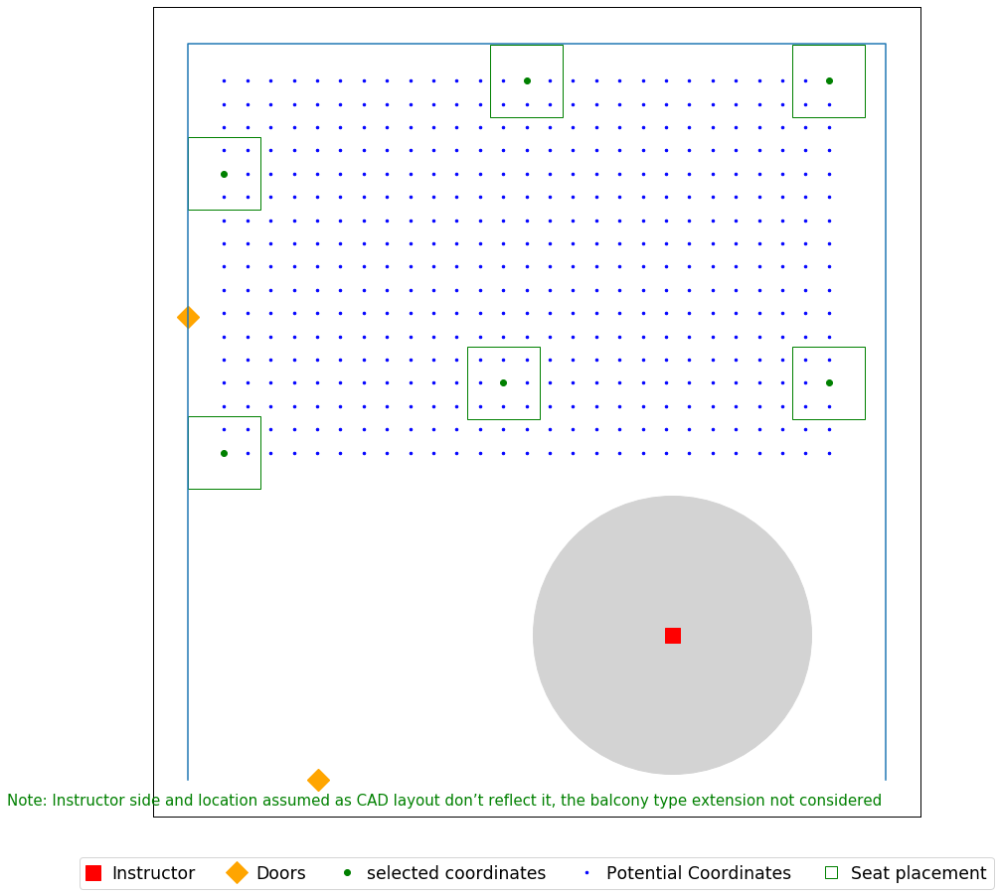

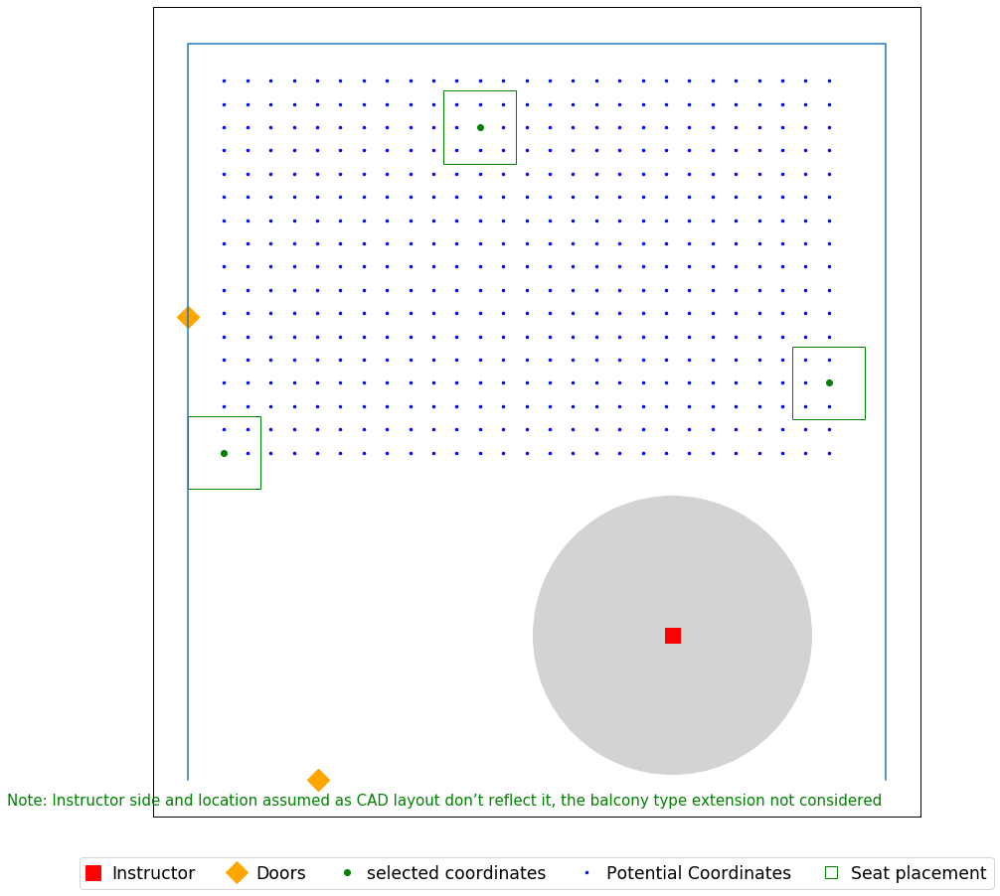

In [196]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_text(data_file, seat_radius=j, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Smith 015 Capa: 25

In [197]:
data_file = r'C:\Users\yoges\Desktop\Input\024_Smith_015_25_721.xlsx'

Name = 'Smith_015_'

room dimension (W x H) are [[24.5        23.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.33333333 5.08333333]]
[(0, 10), (24.5, 10), (24.5, 23.083333333333332), (0, 23.083333333333332)]
Total number of seats  is 392


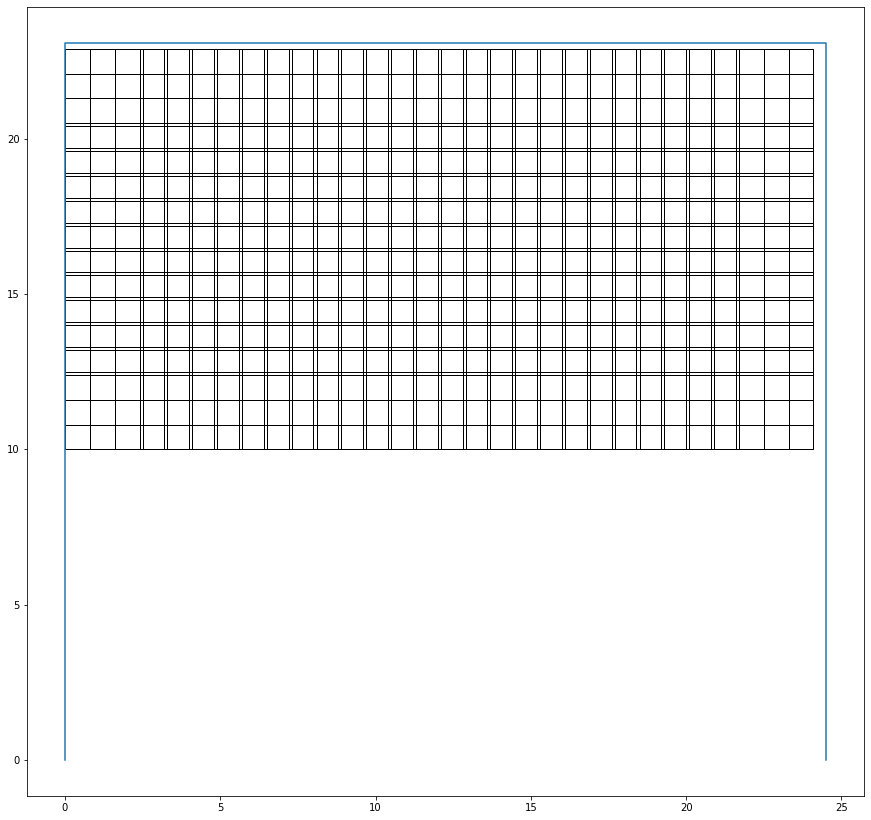

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
14
22
140
148
195
213
339
347
386
room dimension (W x H) are [[24.5        23.08333333]]
seat dimension (W x H) are [[2.5 2.5]]


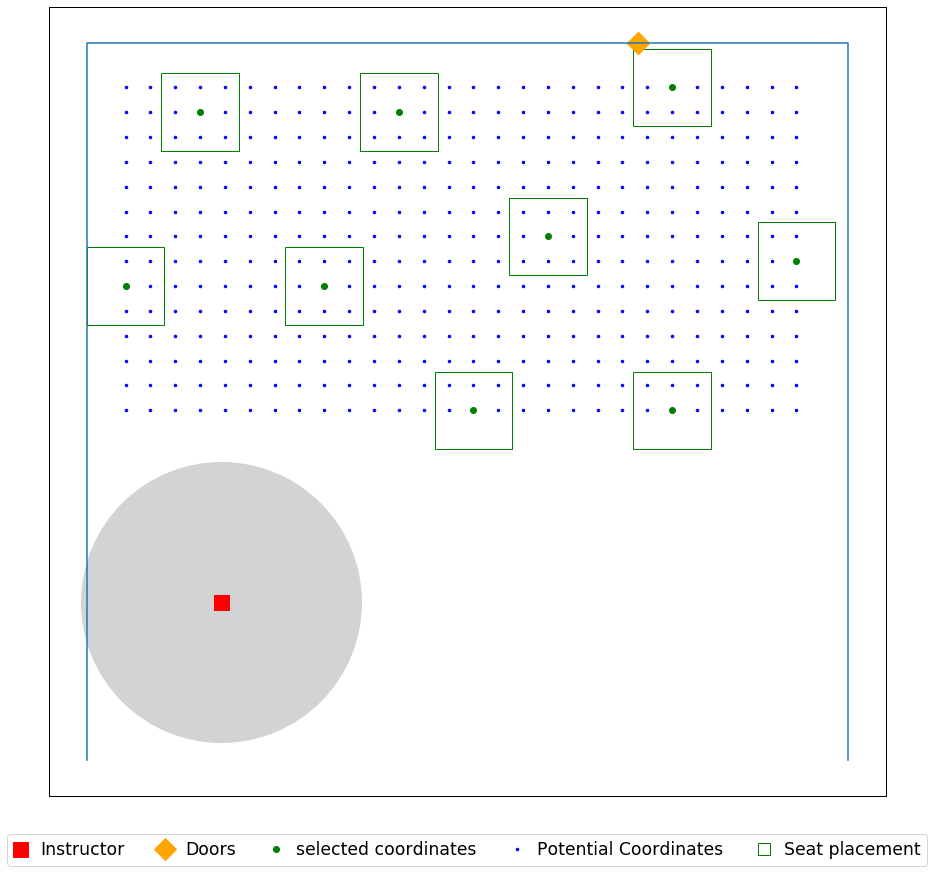

In [198]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_015\Smith_105_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_015\Smith_015_6ft_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[24.5        23.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.33333333 5.08333333]]
[(0, 10), (24.5, 10), (24.5, 23.083333333333332), (0, 23.083333333333332)]
Total number of seats  is 392


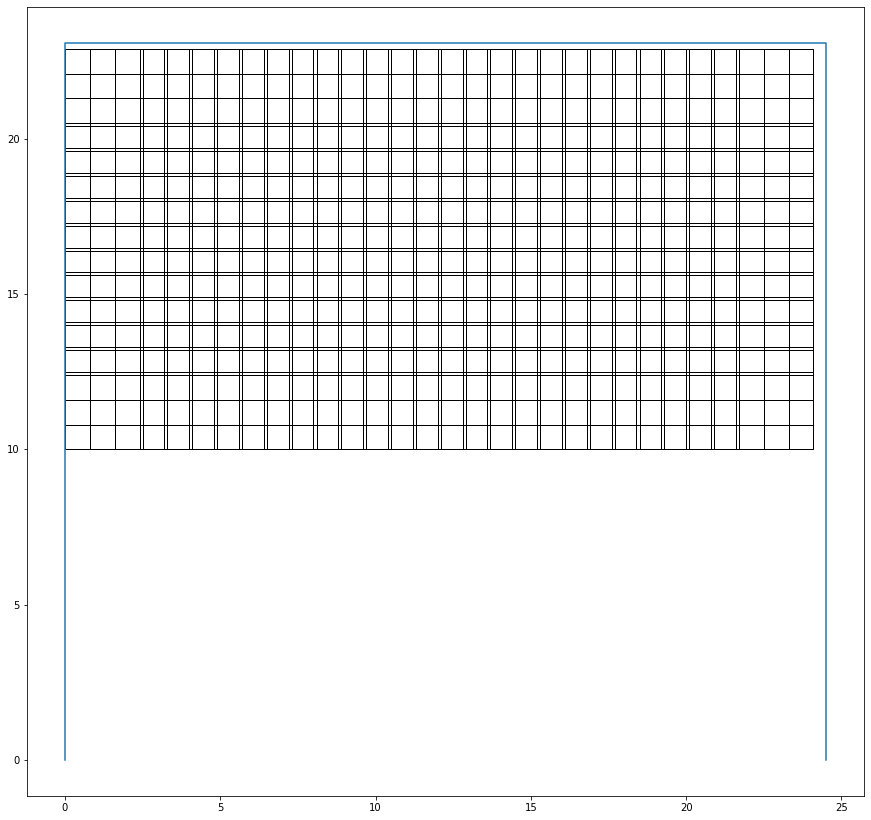

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
14
22
140
148
195
213
339
347
386
room dimension (W x H) are [[24.5        23.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
97
111
141
371
381
391
room dimension (W x H) are [[24.5        23.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 3.0
Optimal selection of seats (index):
14
168
251
room dimension (W x H) are [[24.5        23.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
14
27
140
290
300
room dimension (W x H) are [[24.5        23.0833333

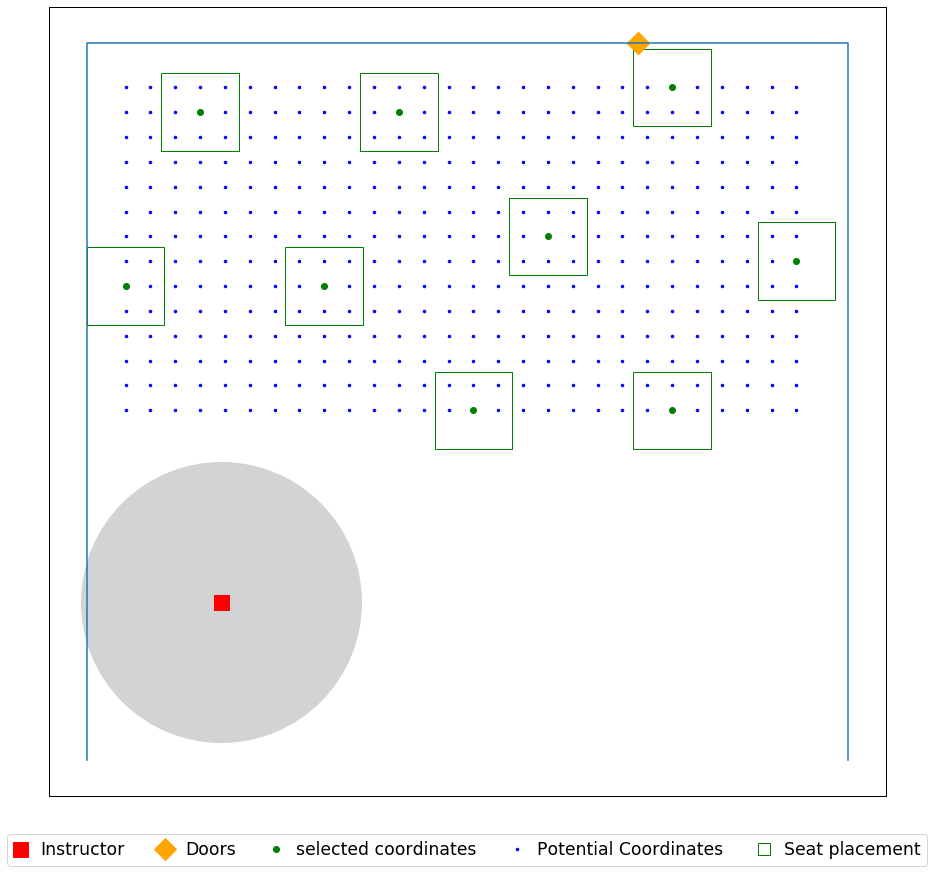

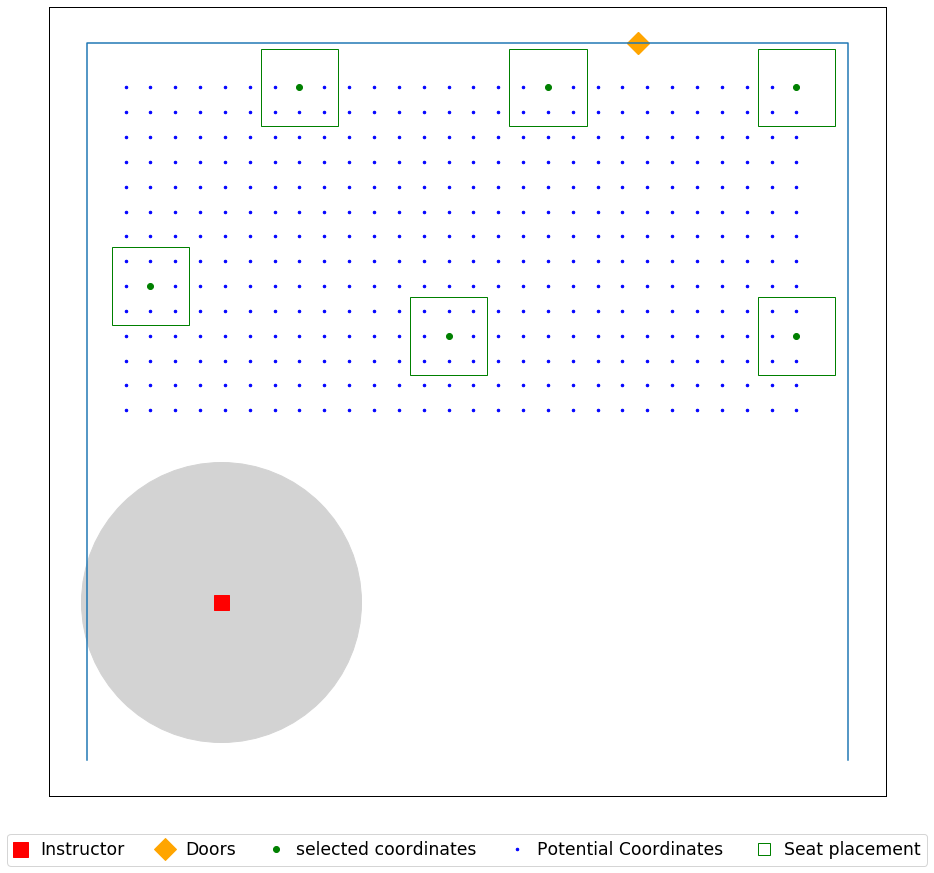

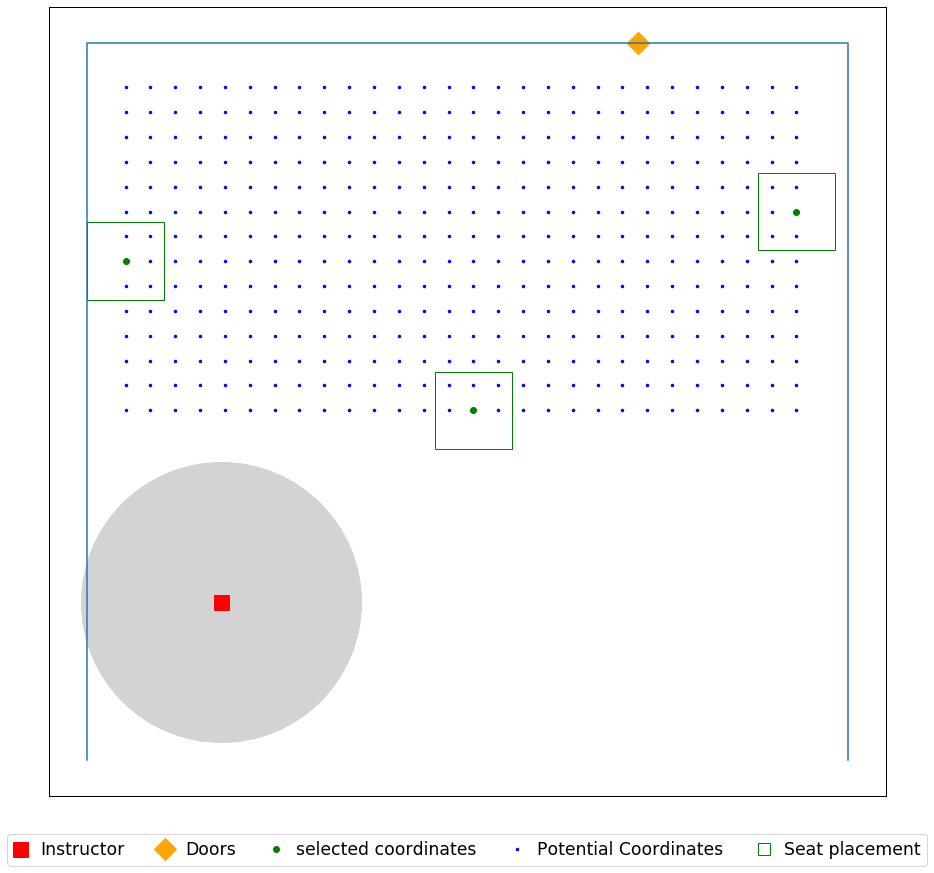

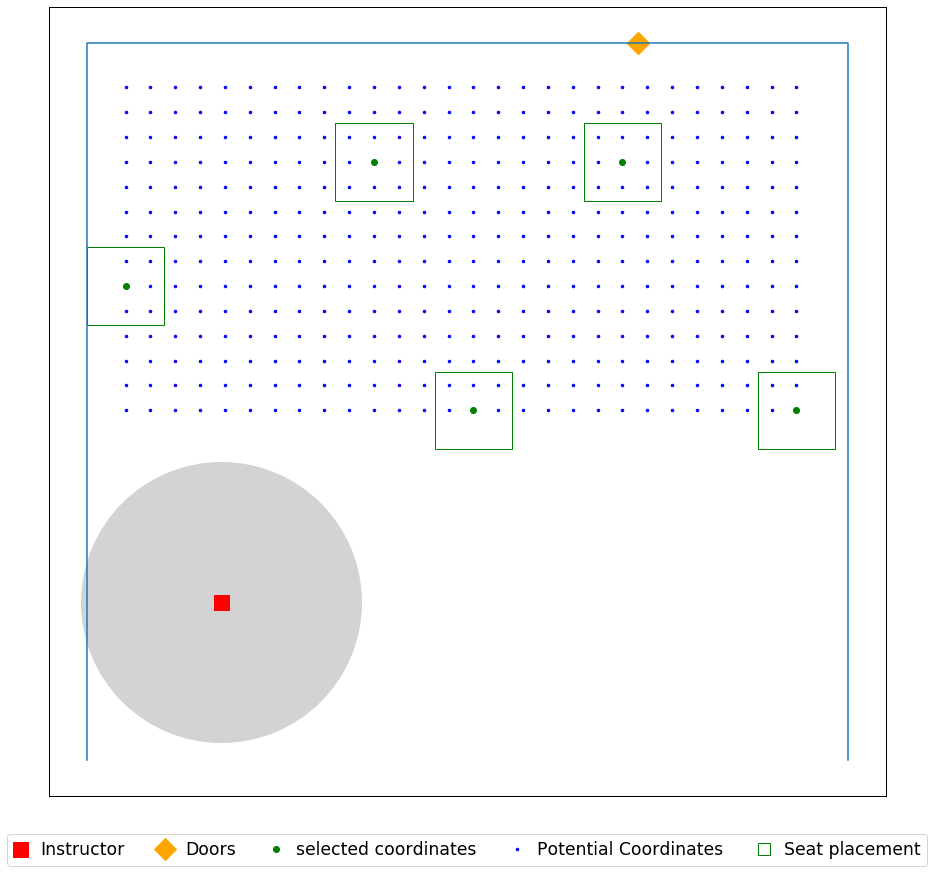

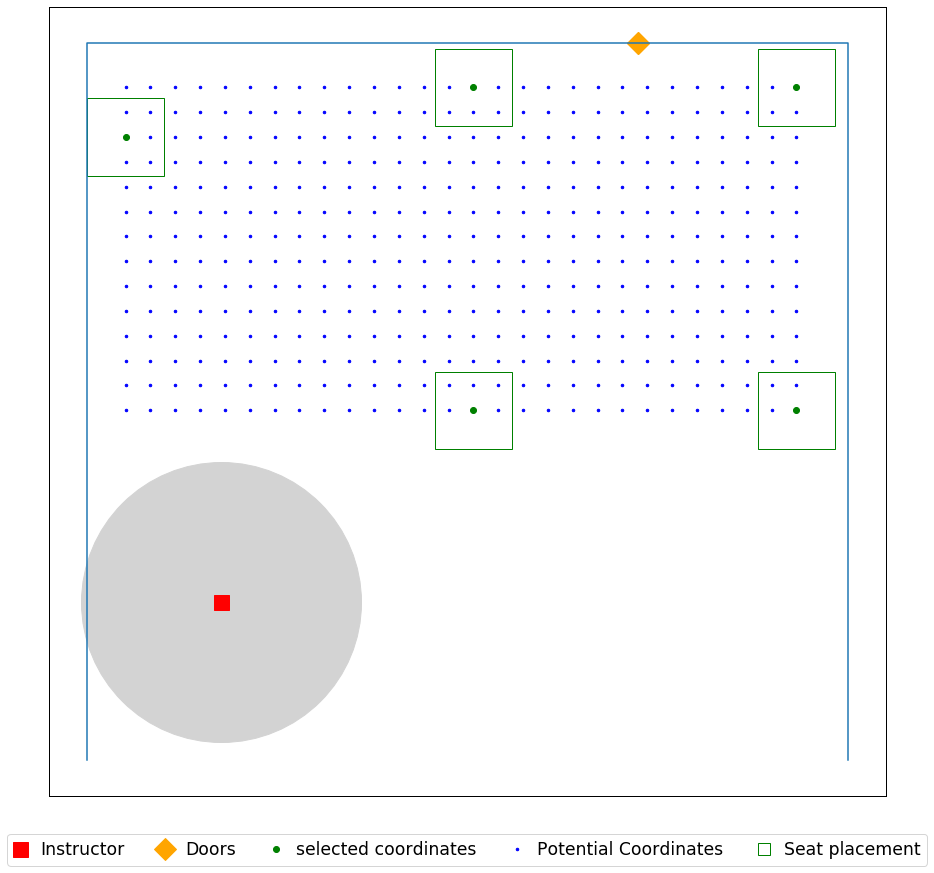

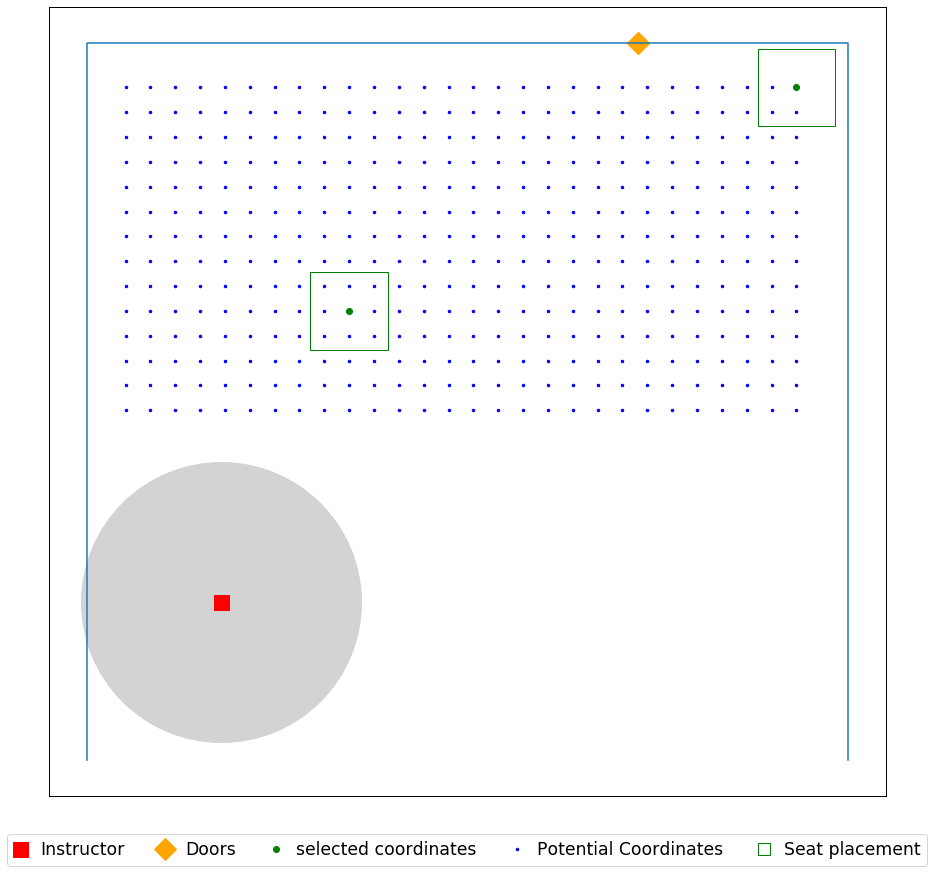

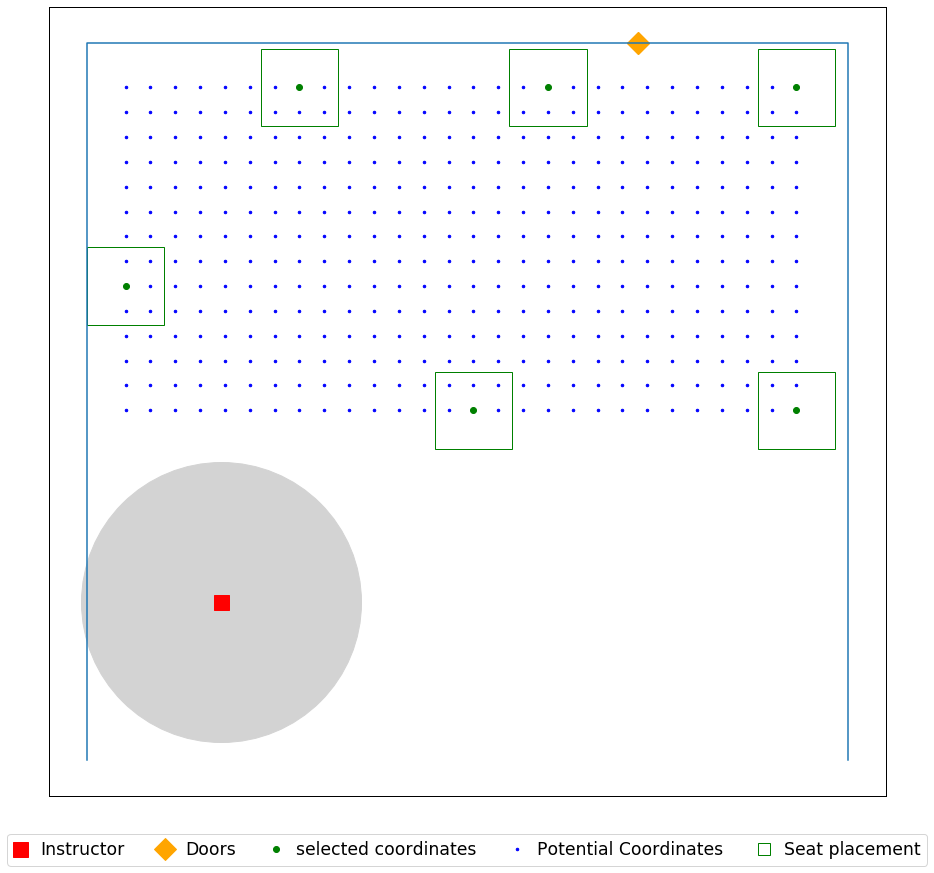

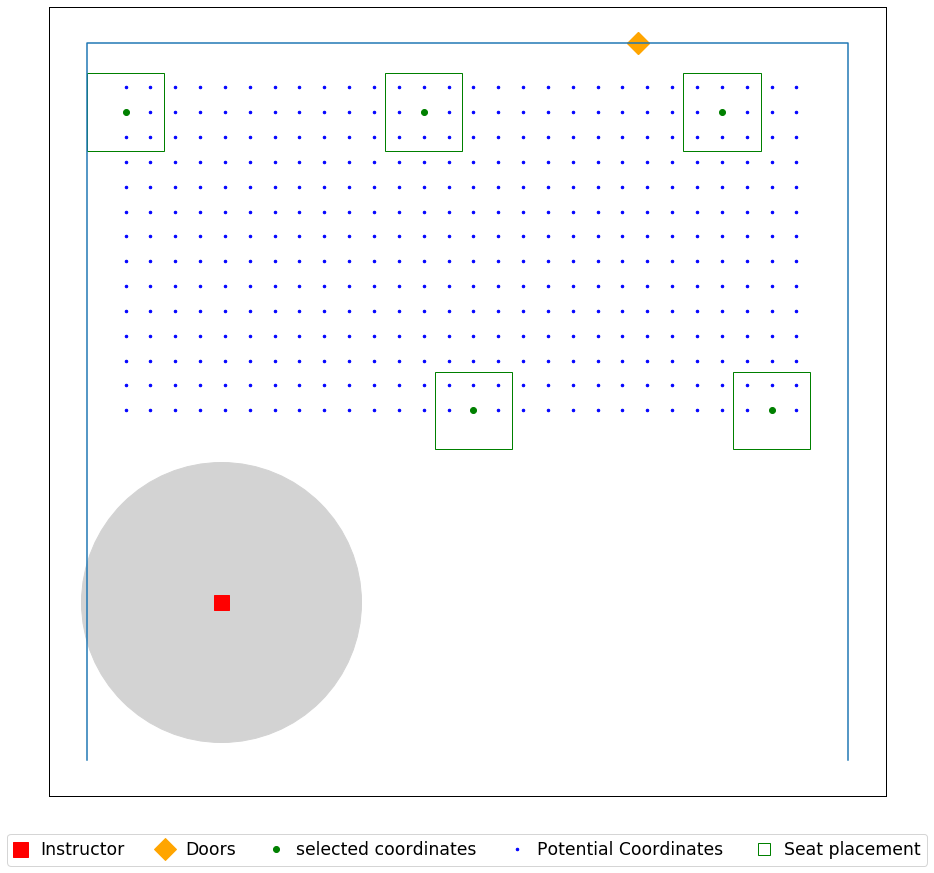

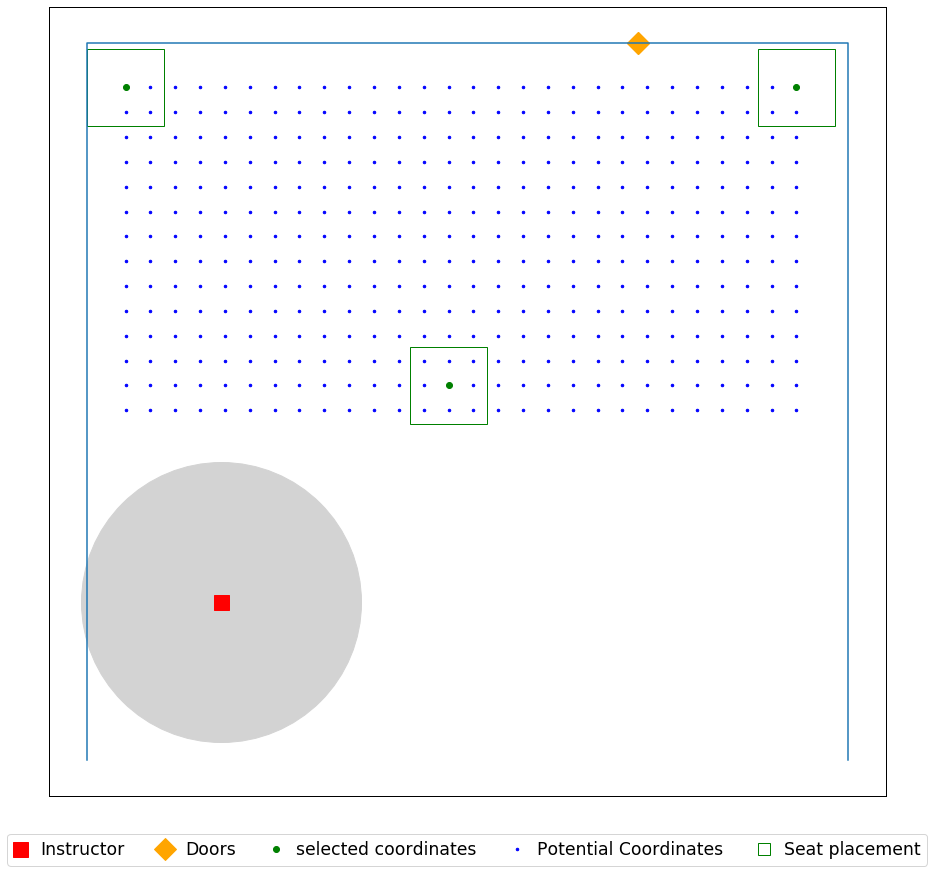

In [199]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Smith 011 Capa: 25

In [200]:
data_file = r'C:\Users\yoges\Desktop\Input\024_Smith_011_25_721.xlsx'

Name = 'Smith_011_'

room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[21.08333333  2.91666667]]
[(0, 10), (23.583333333333332, 10), (23.583333333333332, 19.416666666666668), (0, 19.416666666666668)]
Total number of seats  is 243


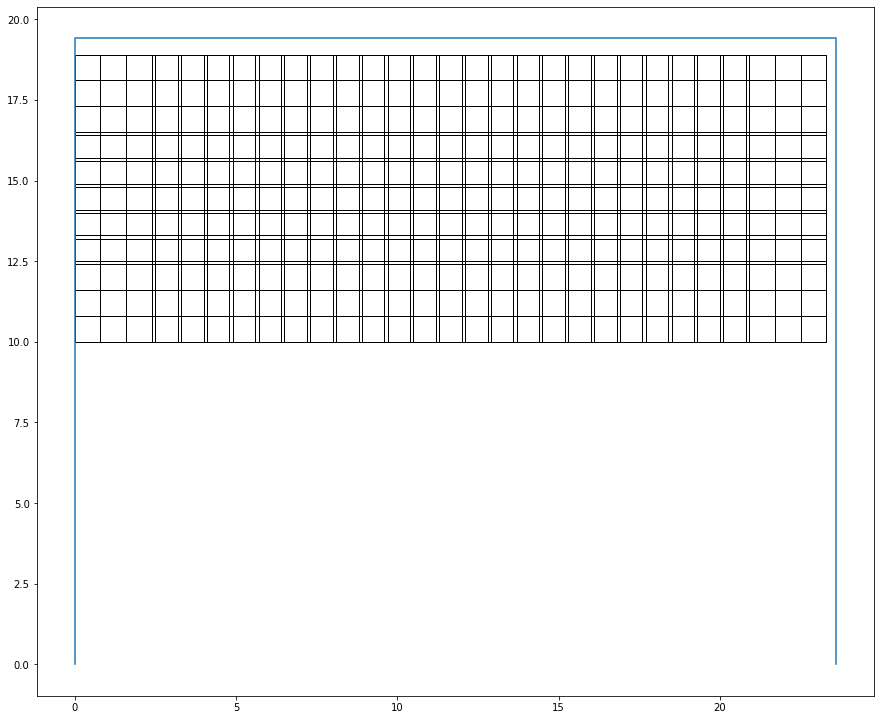

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
0
11
75
216
224
232
242
room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H) are [[2.5 2.5]]


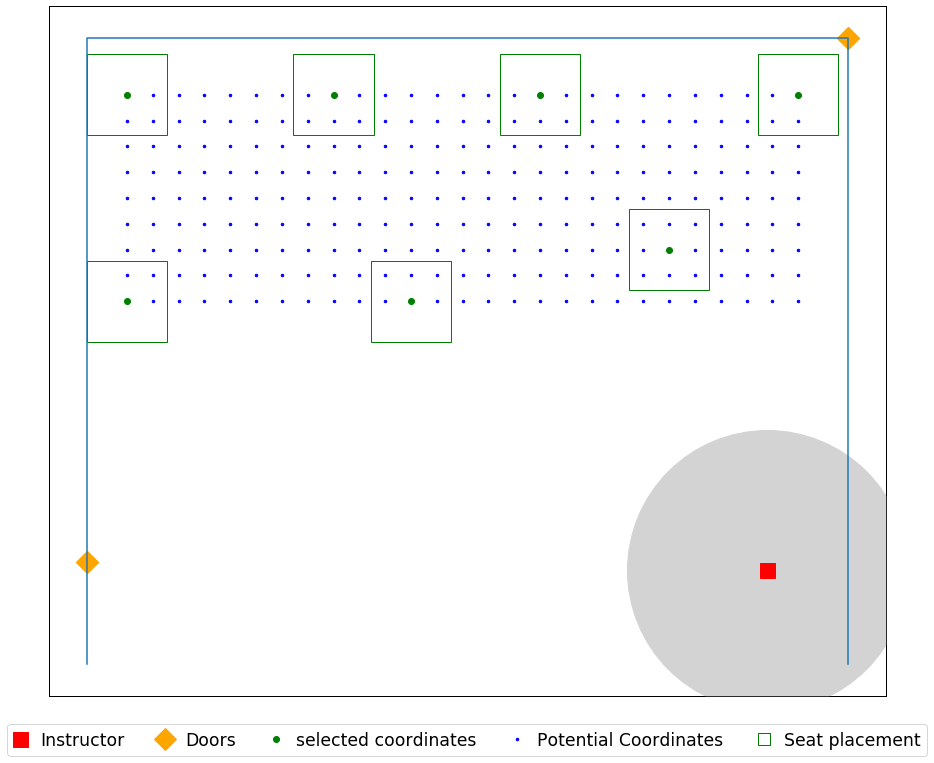

In [201]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_011\Smith_011_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_011\Smith_011_6ft_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[21.08333333  2.91666667]]
[(0, 10), (23.583333333333332, 10), (23.583333333333332, 19.416666666666668), (0, 19.416666666666668)]
Total number of seats  is 243


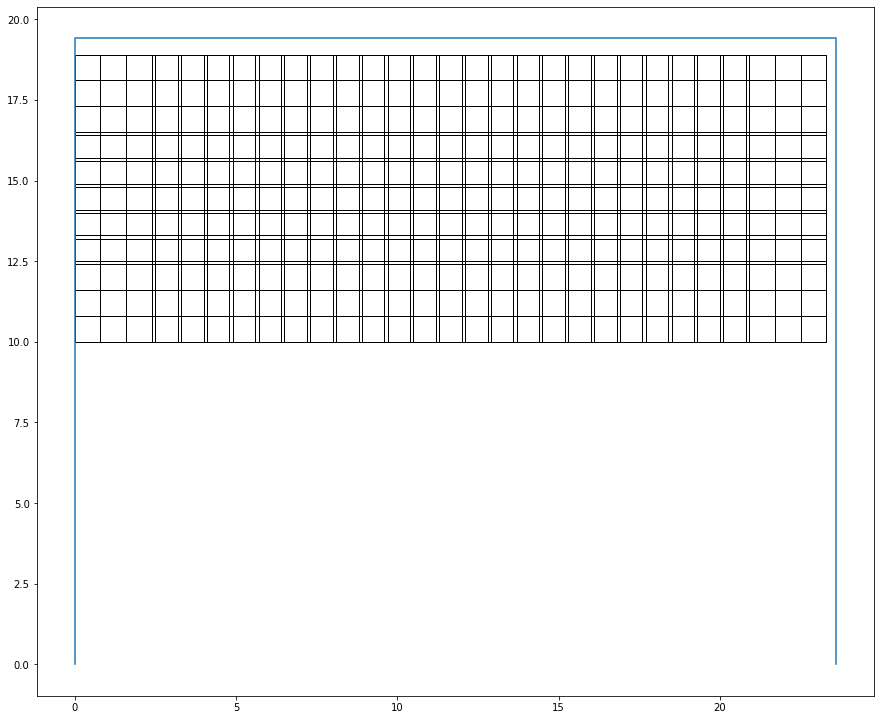

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
0
11
75
216
224
232
242
room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
0
10
107
232
room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 3.0
Optimal selection of seats (index):
13
216
242
room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
0
17
225
242
room dimension (W x H) are [[23.58333333 19.41666667]]
seat dimension (W x H

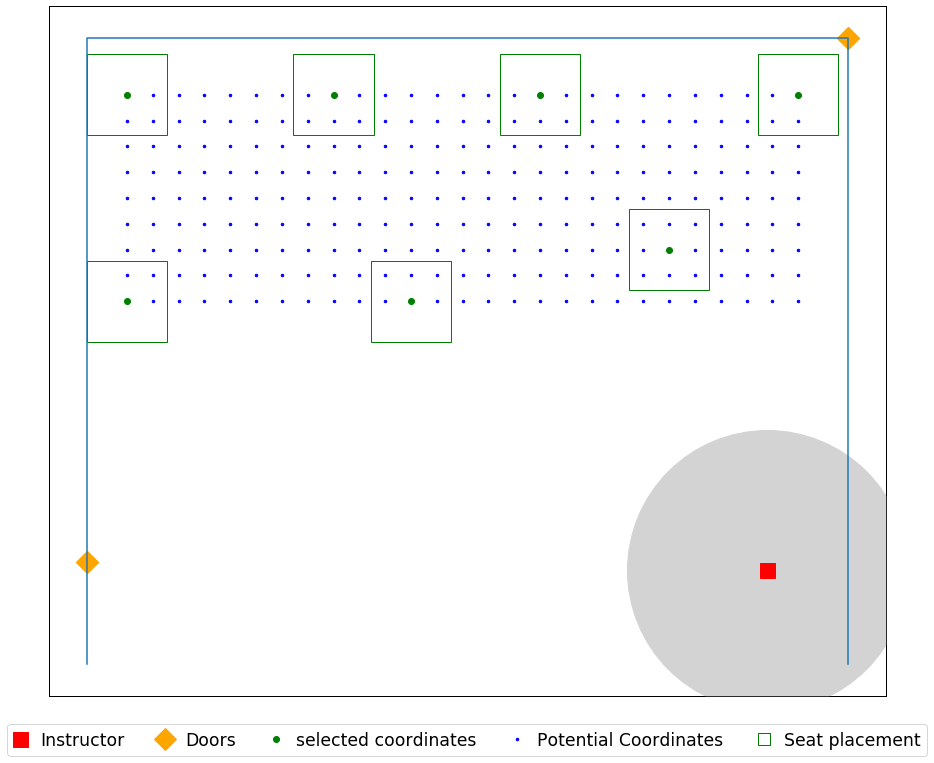

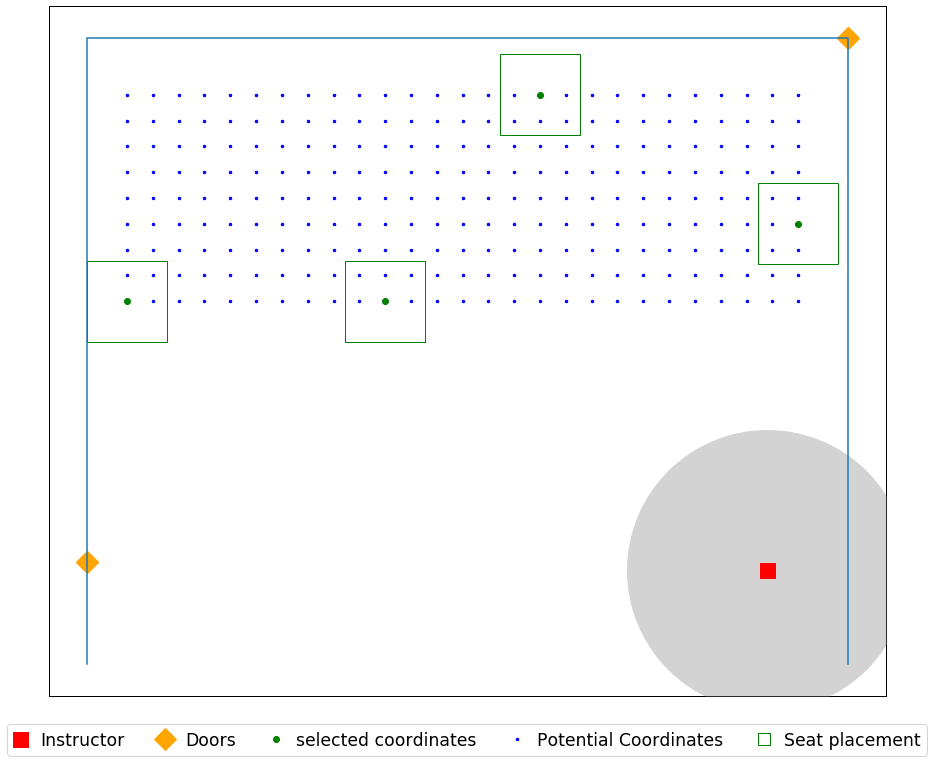

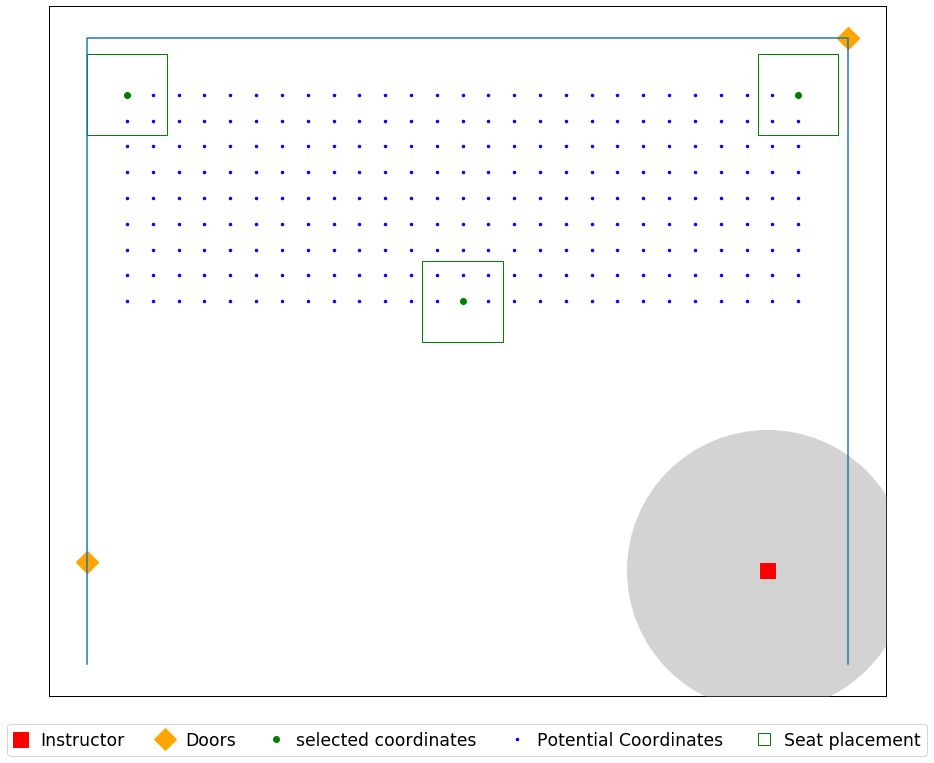

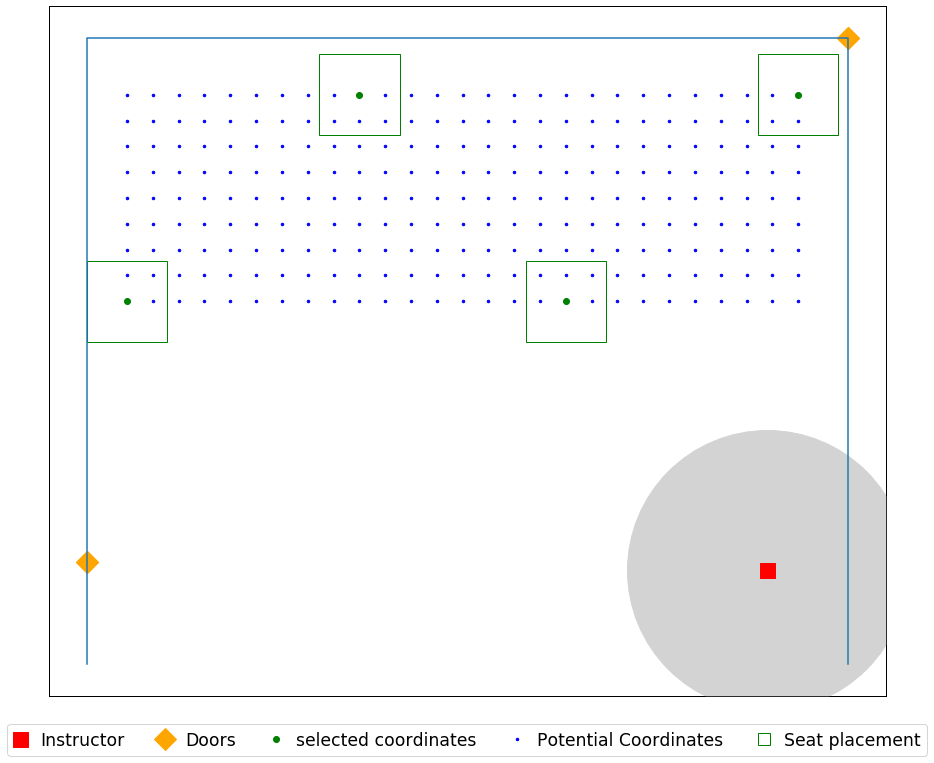

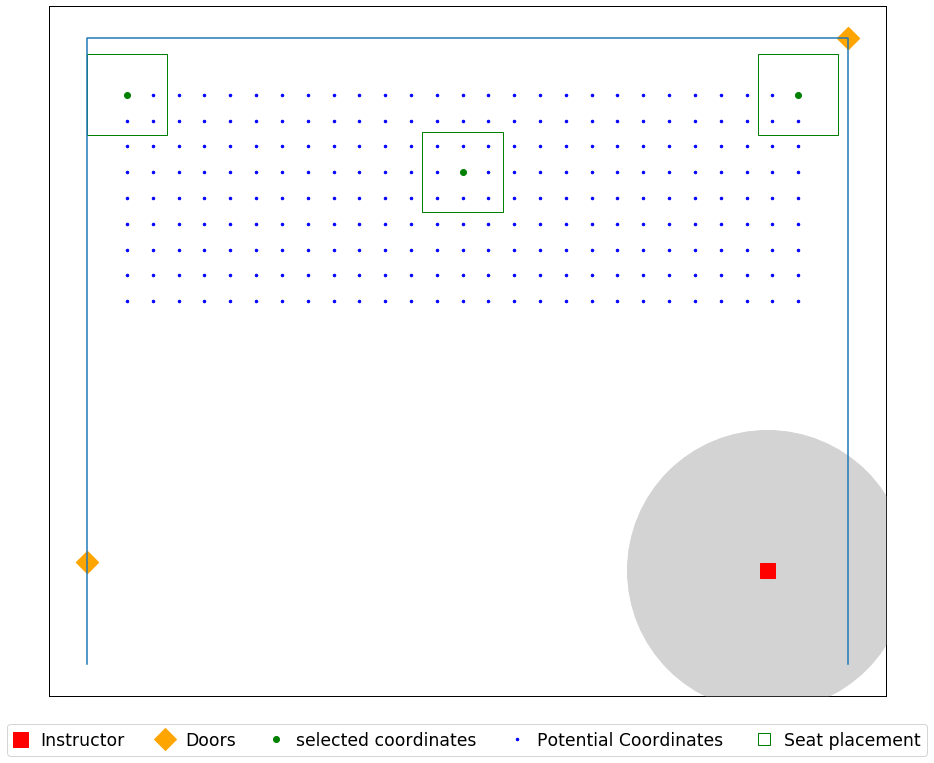

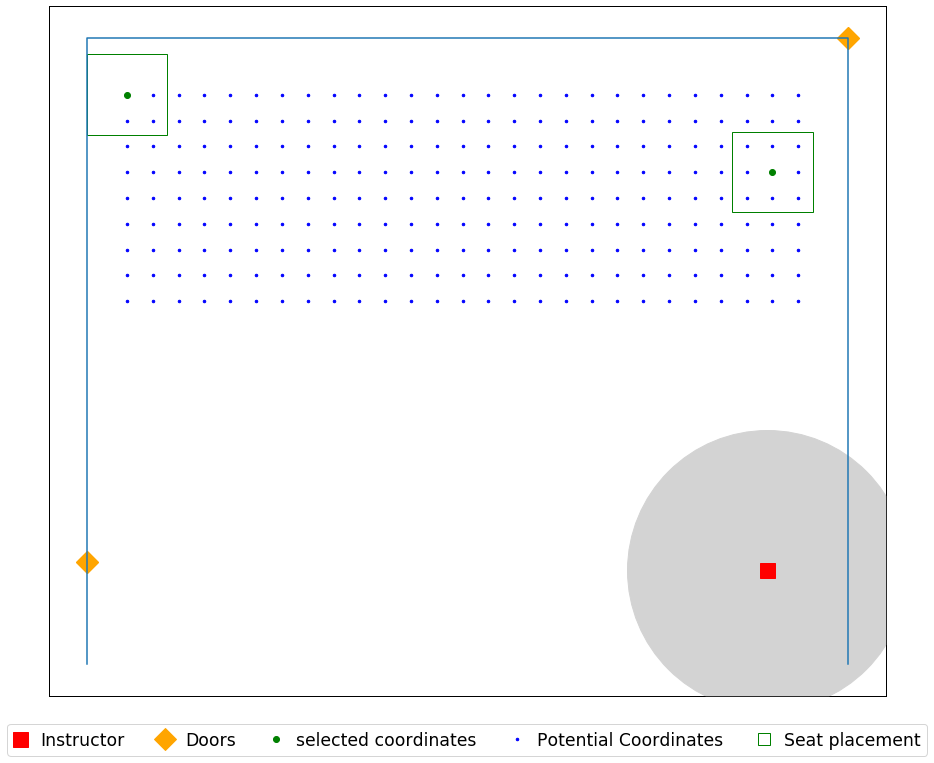

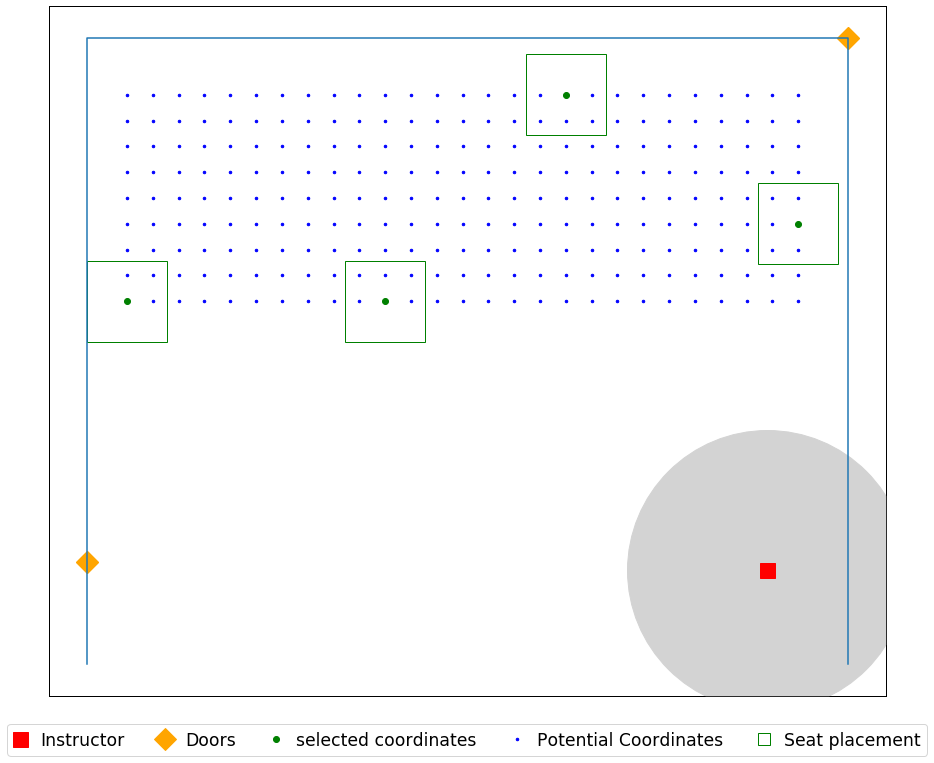

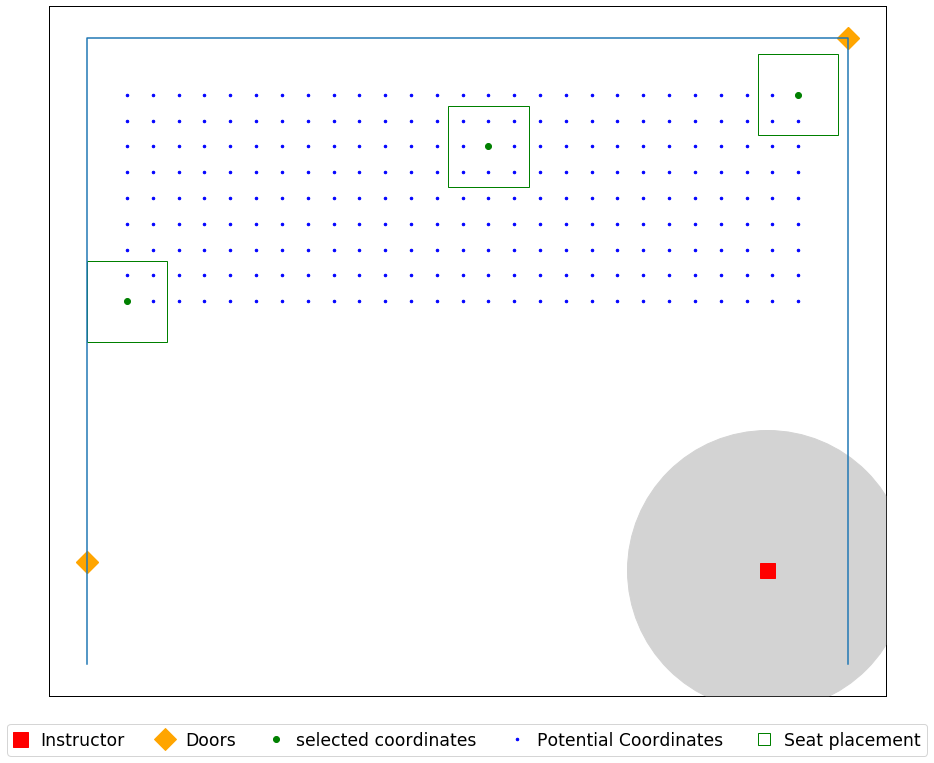

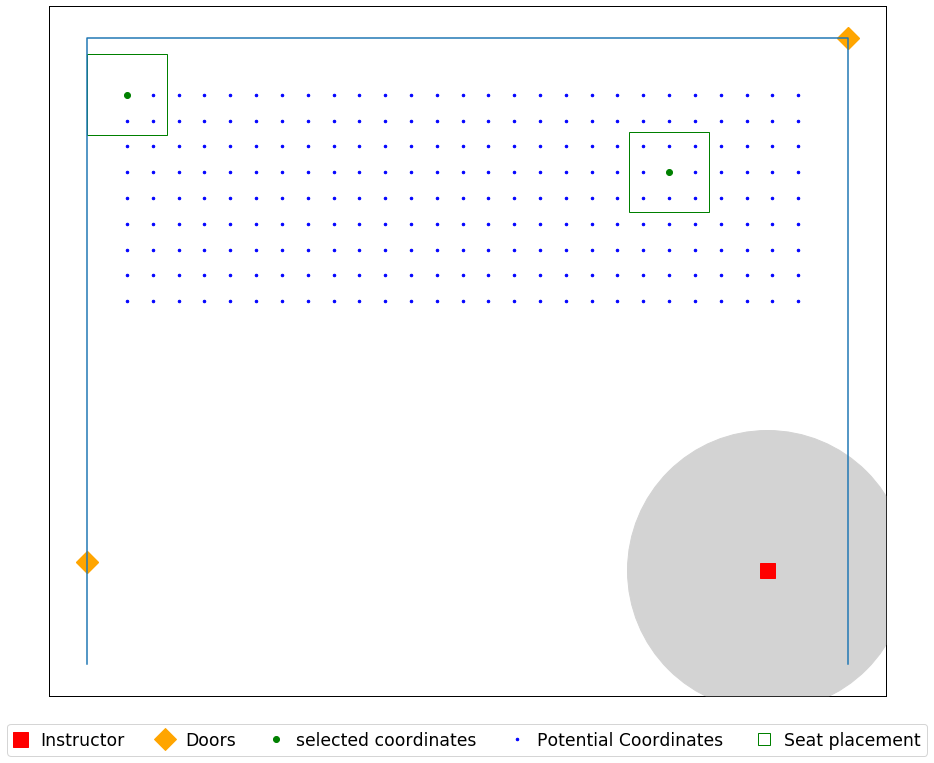

In [202]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## COC 101 Capa: 48

In [203]:
data_file = r'C:\Users\yoges\Desktop\Input\050_COC_101_48_721.xlsx'

Name = 'COC_101_'

room dimension (W x H) are [[32.33333333 32.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[5. 5.]]
[(0, 10), (32.333333333333336, 10), (32.333333333333336, 32.333333333333336), (0, 32.333333333333336)]
Total number of seats  is 950


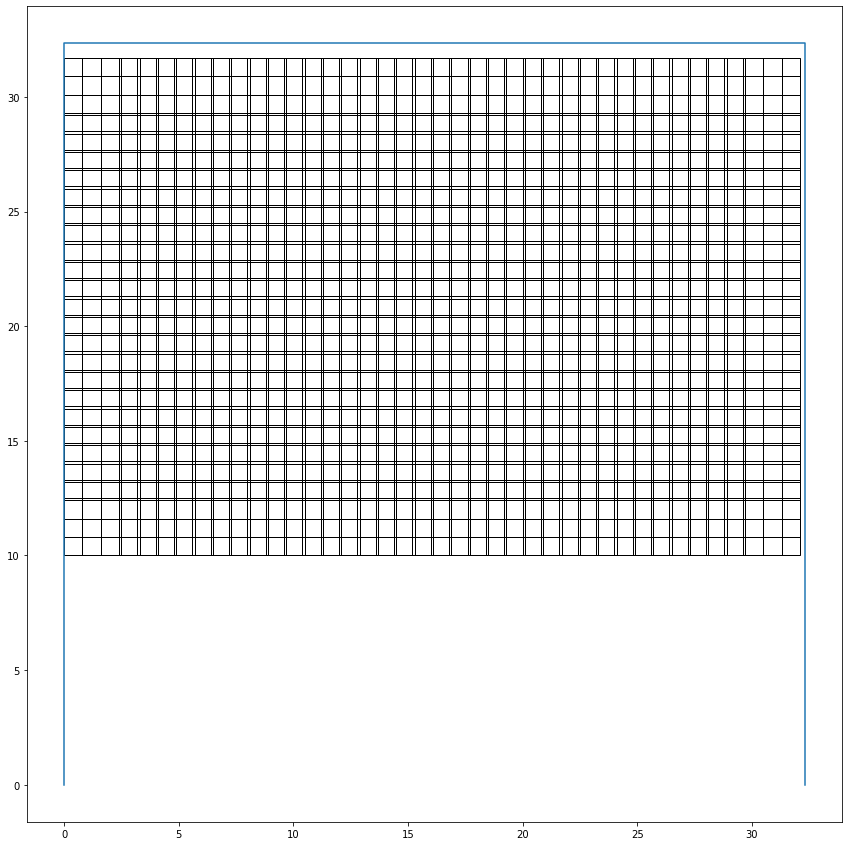

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 21.0
Optimal selection of seats (index):
15
23
37
144
197
304
318
327
341
501
523
608
622
630
645
805
828
912
926
934
949
room dimension (W x H) are [[32.33333333 32.33333333]]
seat dimension (W x H) are [[2.5 2.5]]


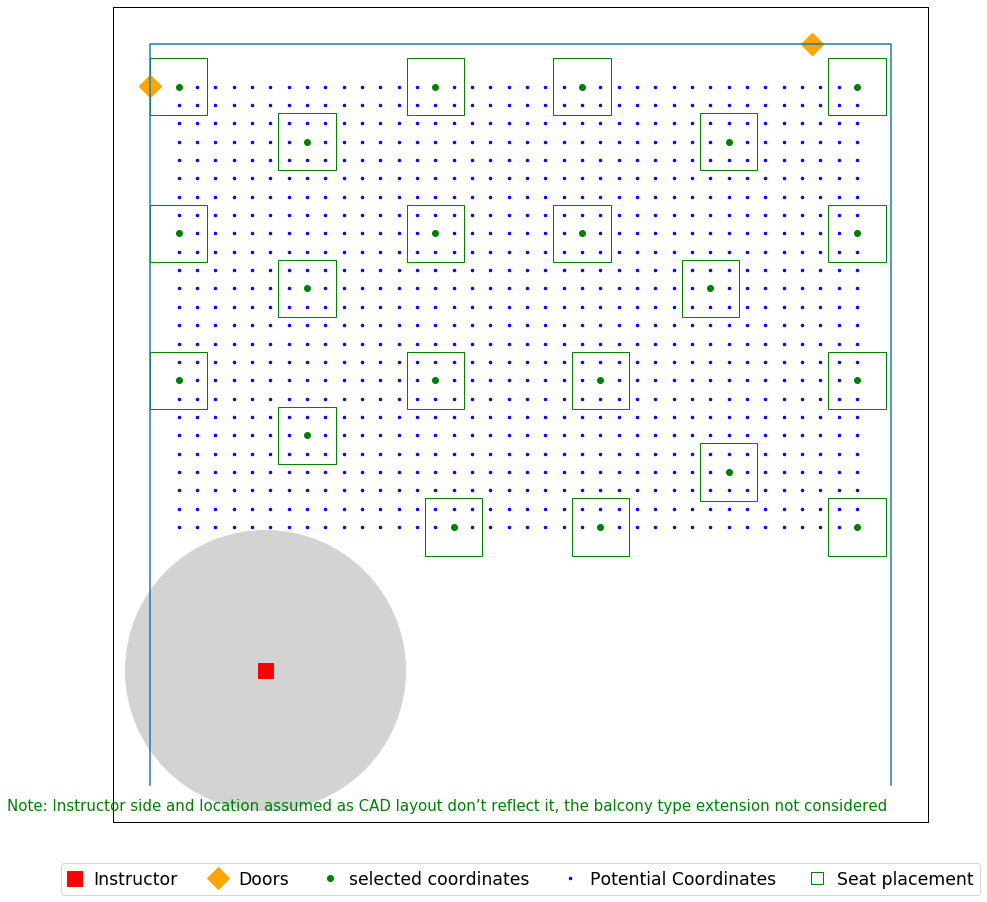

In [204]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\COC_101_door\COC_101_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity_text(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\COC_101_door\COC_101_6ft_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[32.33333333 32.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[5. 5.]]
[(0, 10), (32.333333333333336, 10), (32.333333333333336, 32.333333333333336), (0, 32.333333333333336)]
Total number of seats  is 950


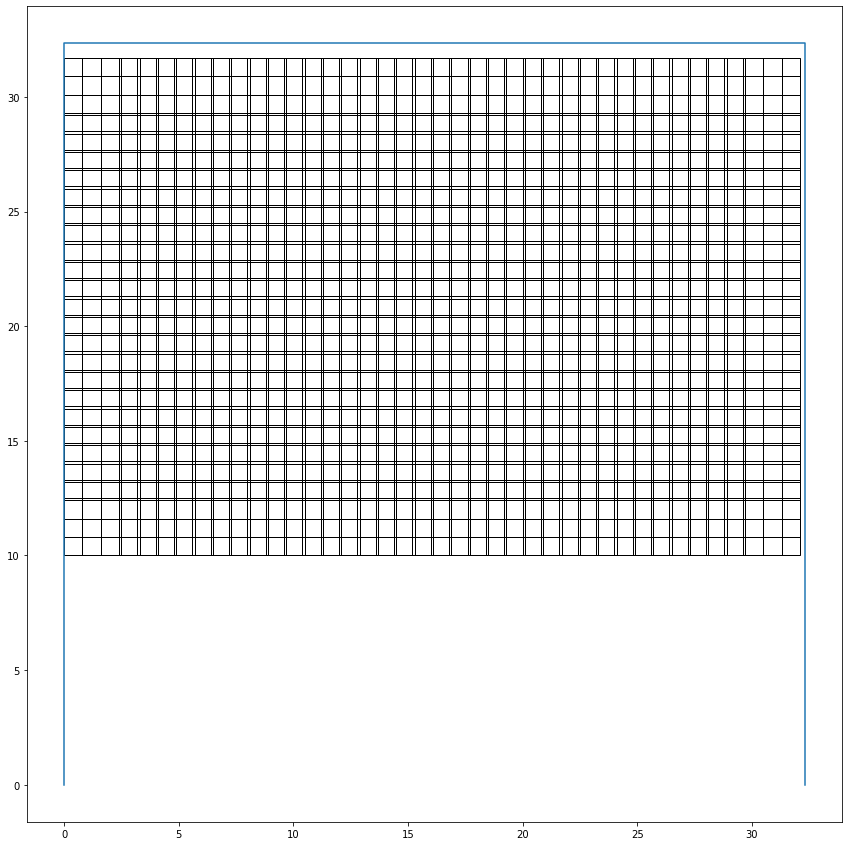

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 21.0
Optimal selection of seats (index):
15
23
37
144
197
304
318
327
341
501
523
608
622
630
645
805
828
912
926
934
949
room dimension (W x H) are [[32.33333333 32.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 14.0
Optimal selection of seats (index):
20
37
152
162
256
493
514
532
542
713
912
922
932
949
room dimension (W x H) are [[32.33333333 32.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
15
37
152
481
912
927
949
room dimension (W x H) are [[32.33333333 32.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal s

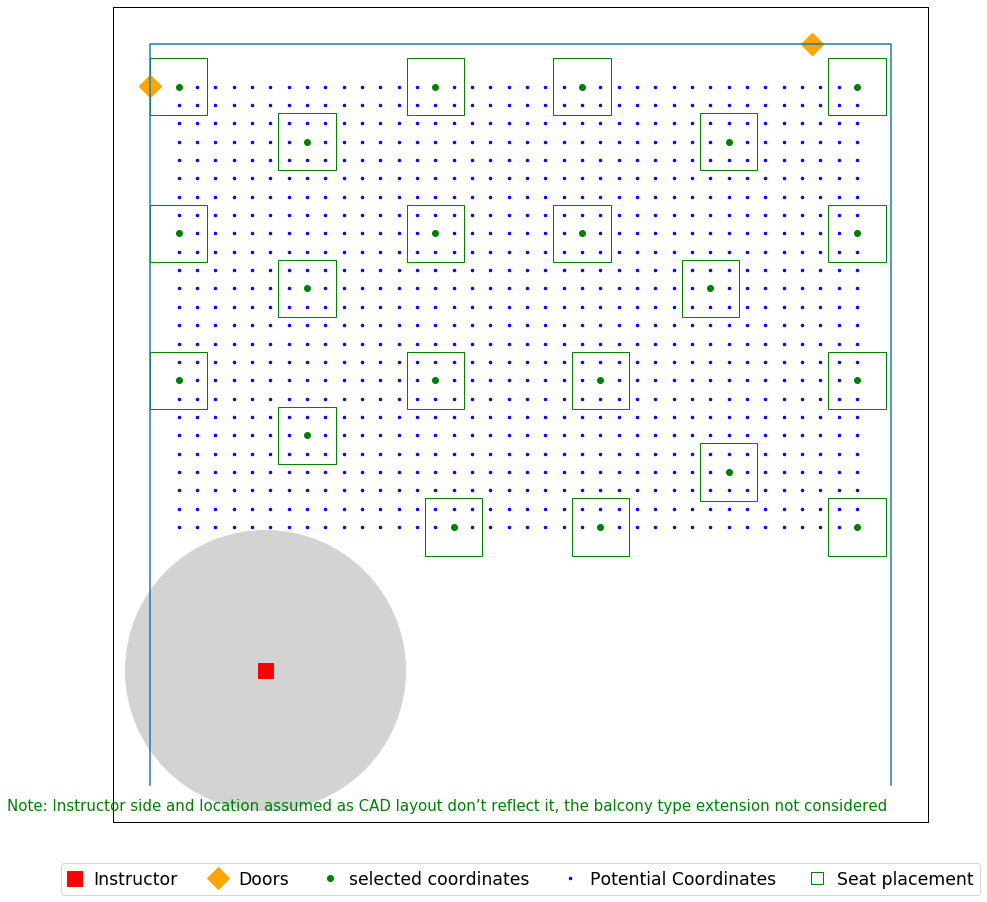

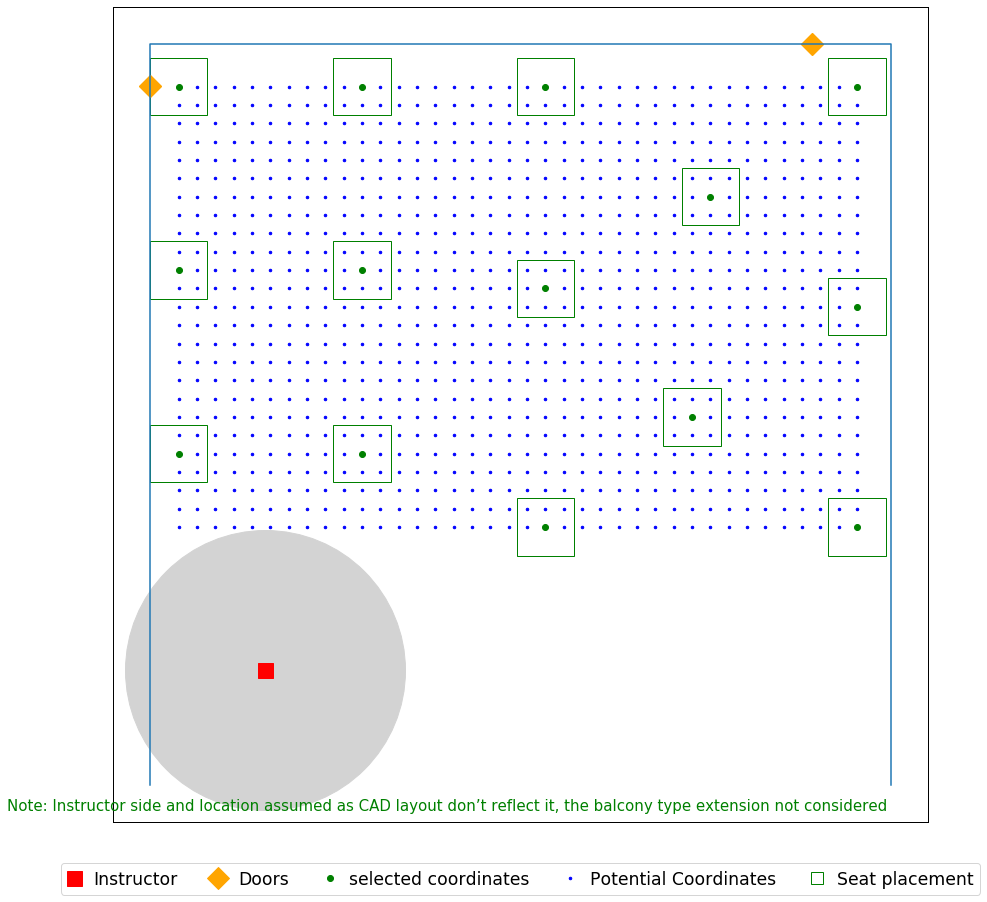

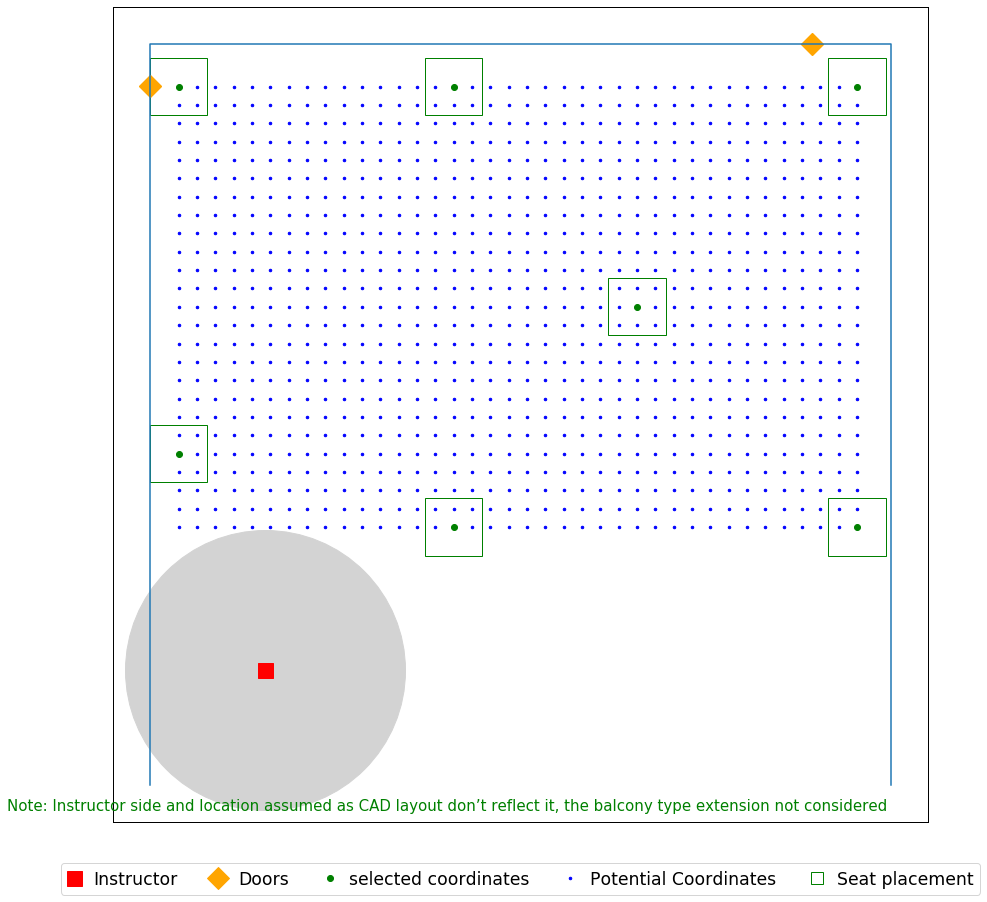

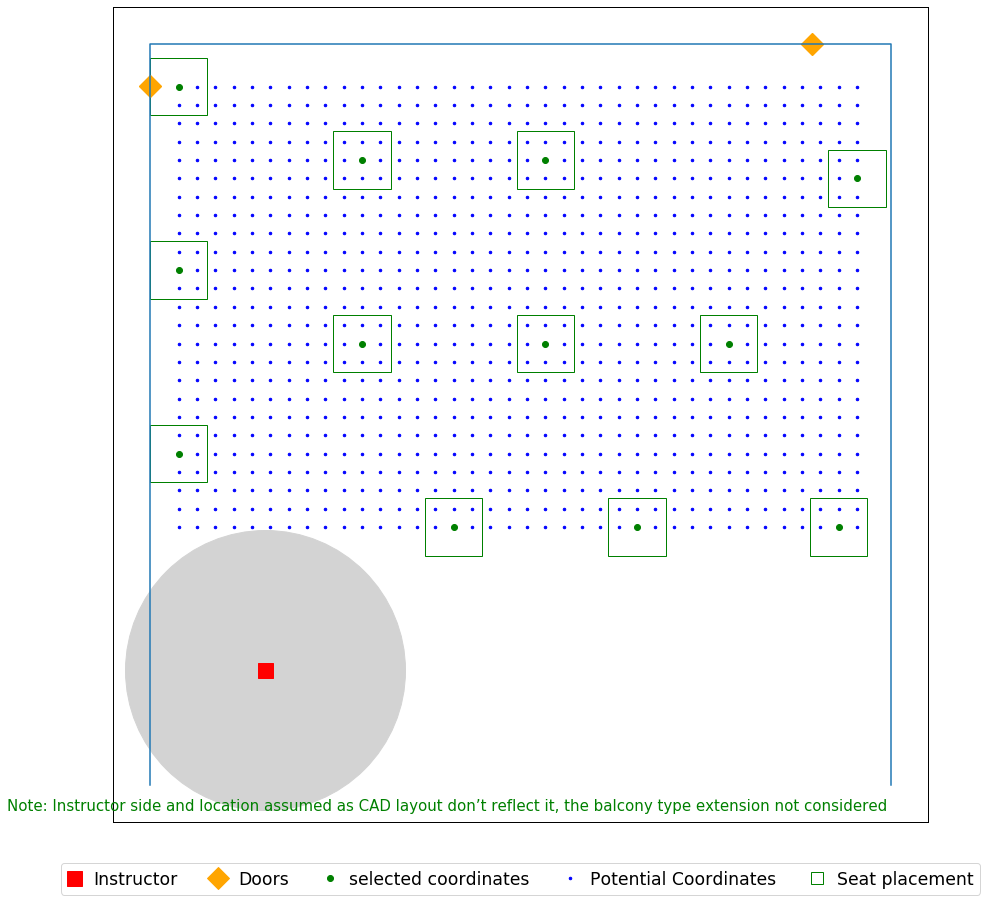

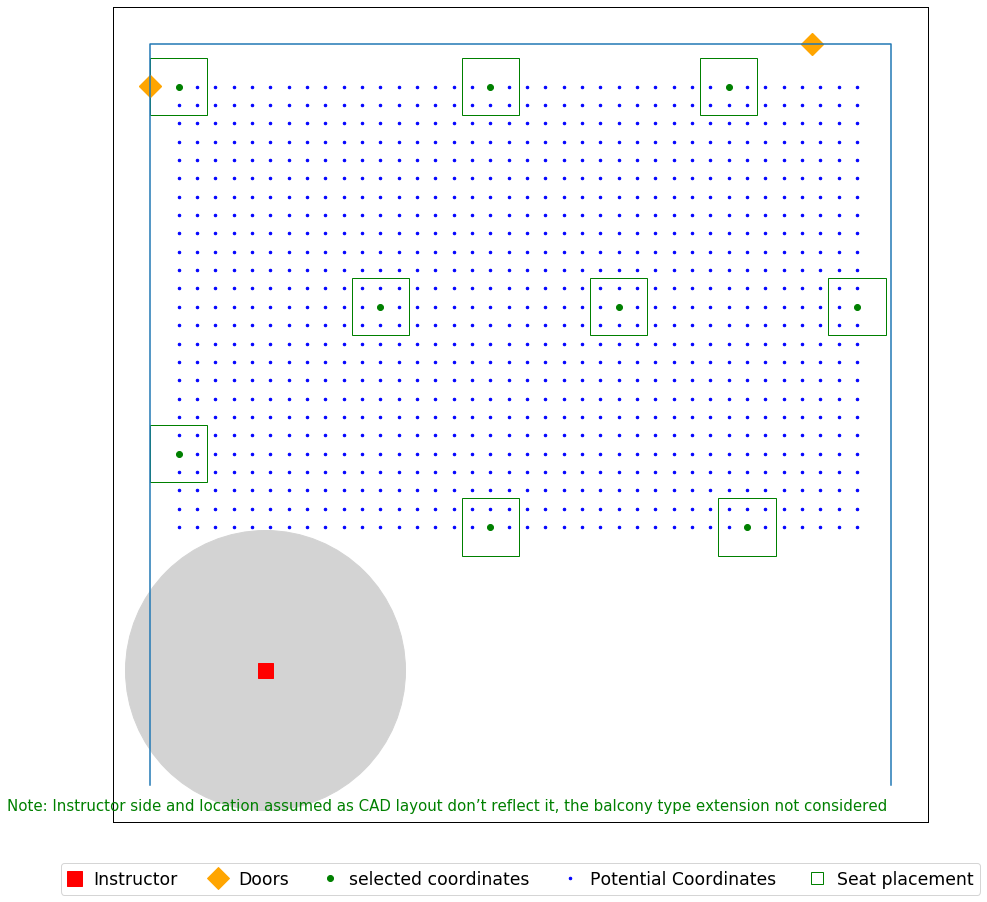

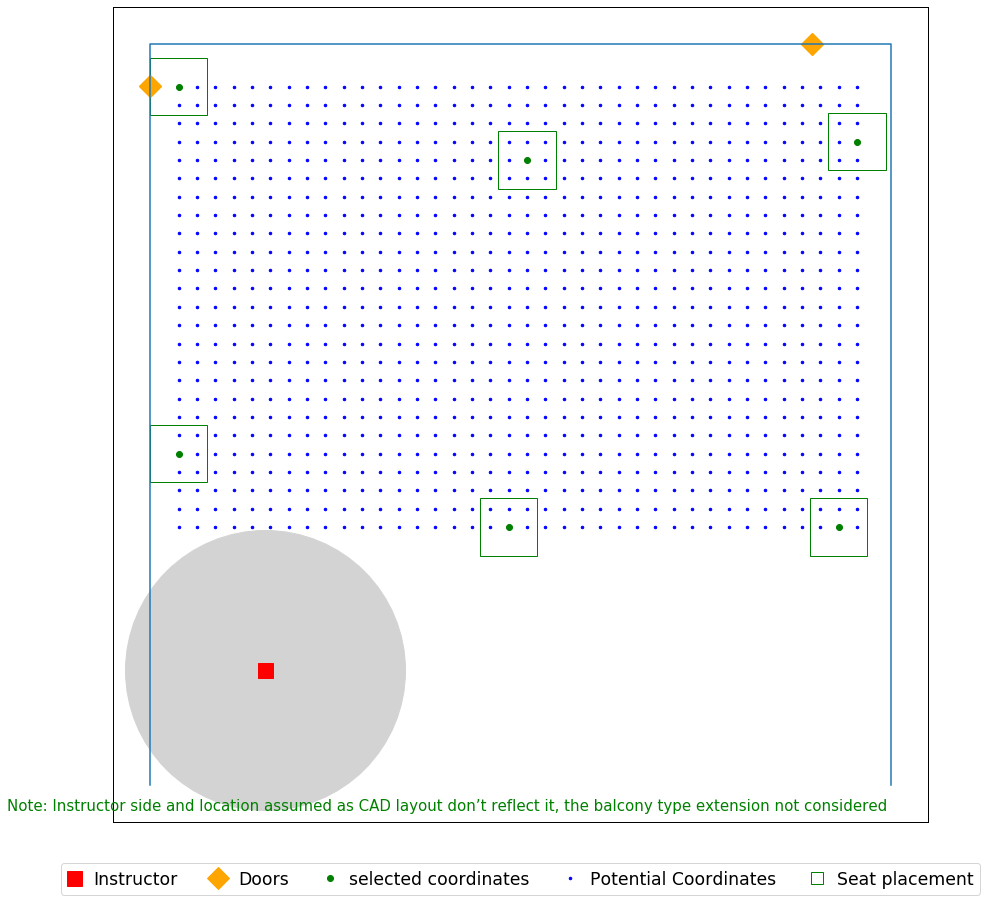

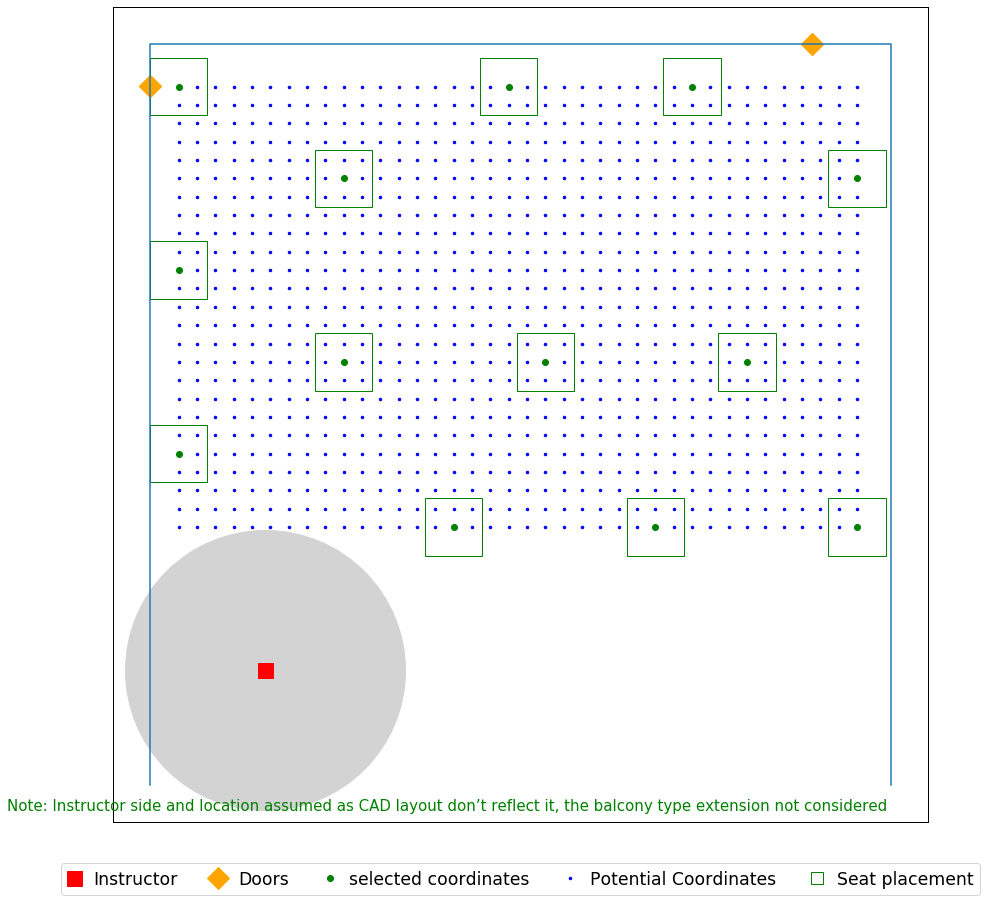

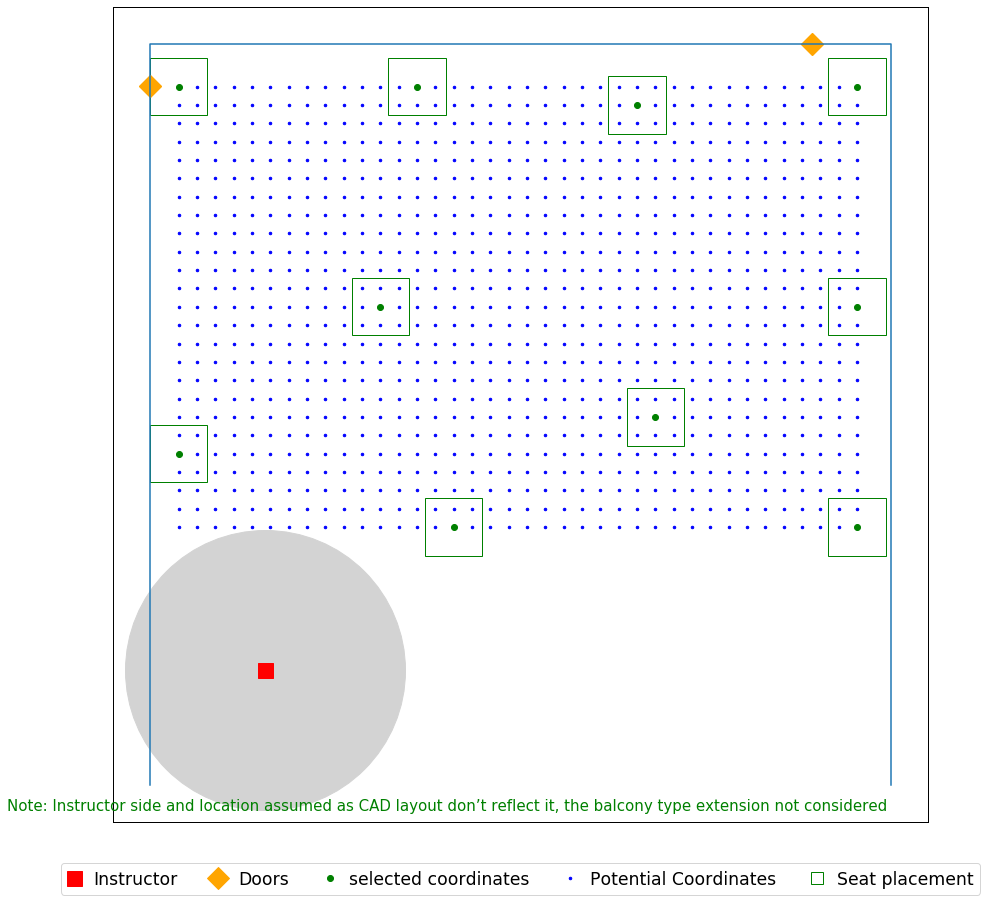

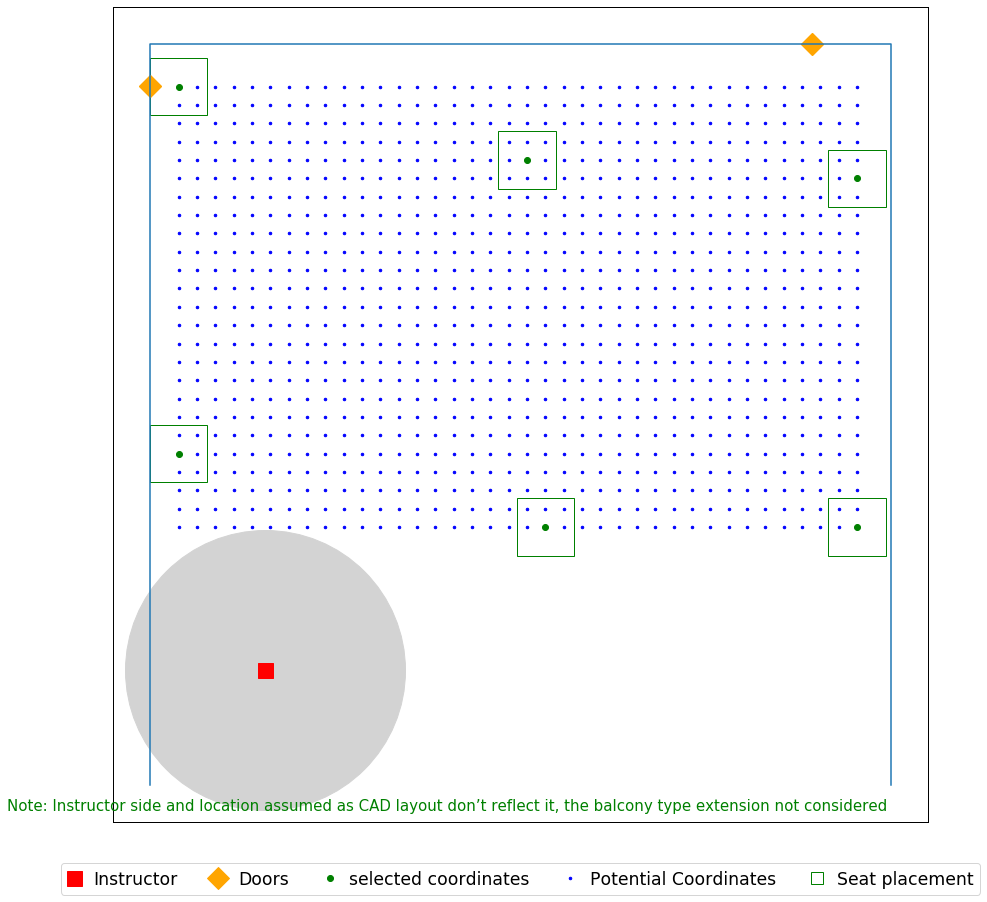

In [205]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity_text(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Emerson 322 Capa: 26

In [206]:
data_file = r'C:\Users\yoges\Desktop\Input\066A_Emerson_322_721.xlsx'

Name = 'Emerson_322_'

room dimension (W x H) are [[24.         22.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[2.58333333 4.5       ]]
[(0, 10), (24.0, 10), (24.0, 22.333333333333332), (0, 22.333333333333332)]
Total number of seats  is 351


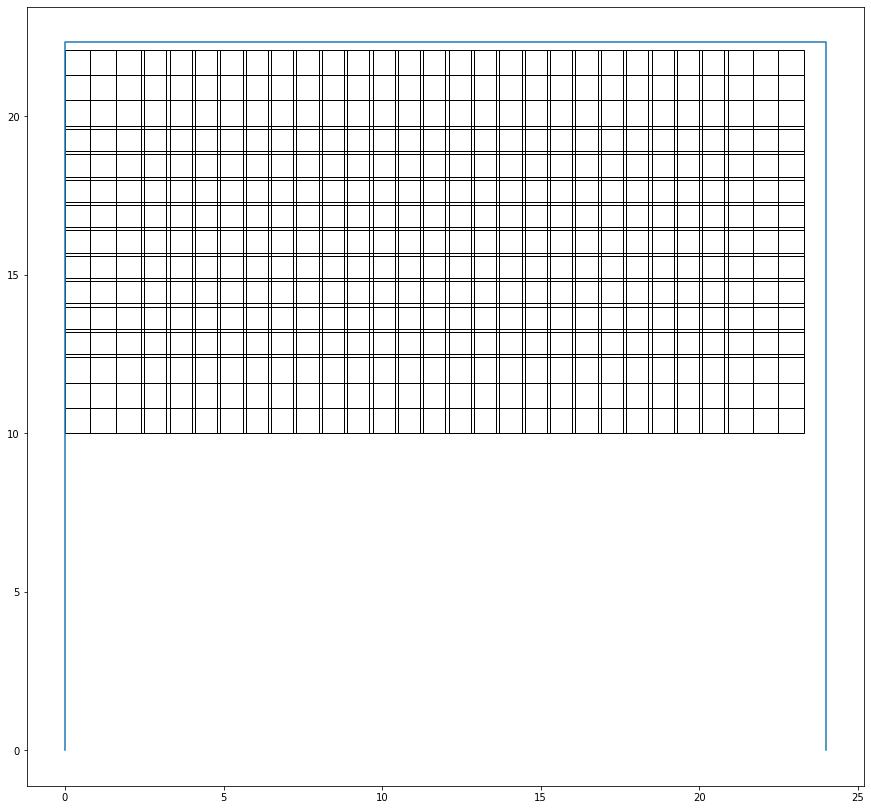

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
15
26
89
108
183
305
324
340
350
room dimension (W x H) are [[24.         22.33333333]]
seat dimension (W x H) are [[2.5 2.5]]


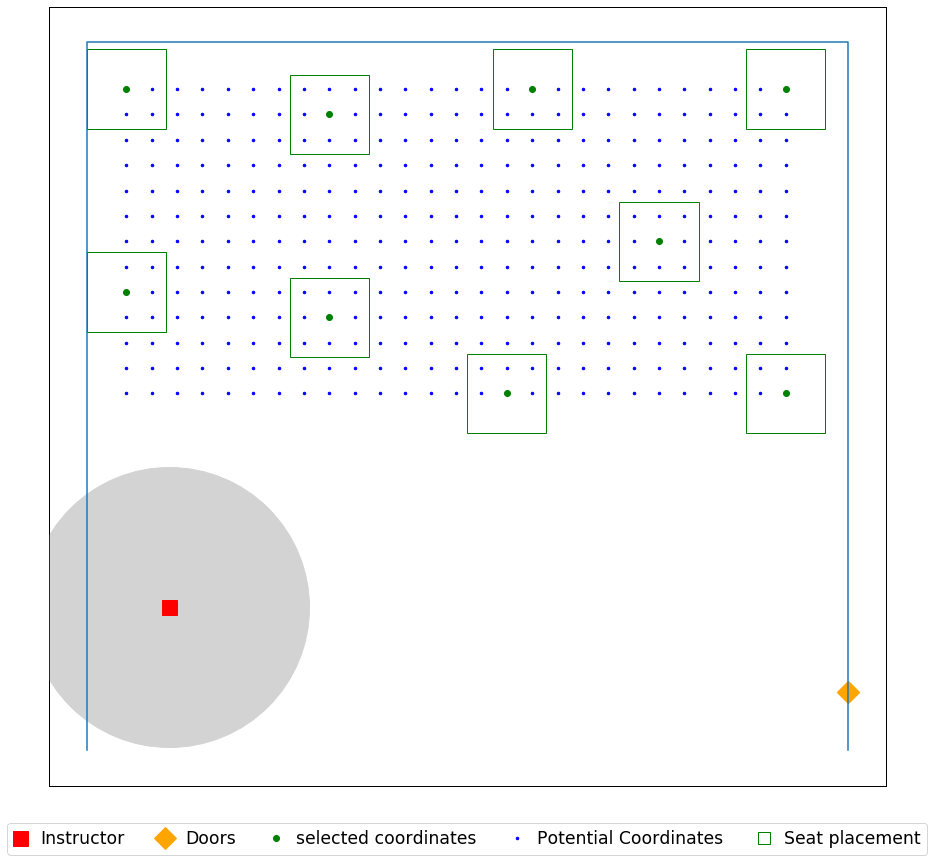

In [207]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Emerson_322\Emerson_322_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Emerson_322\Emerson_322_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[24.         22.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[2.58333333 4.5       ]]
[(0, 10), (24.0, 10), (24.0, 22.333333333333332), (0, 22.333333333333332)]
Total number of seats  is 351


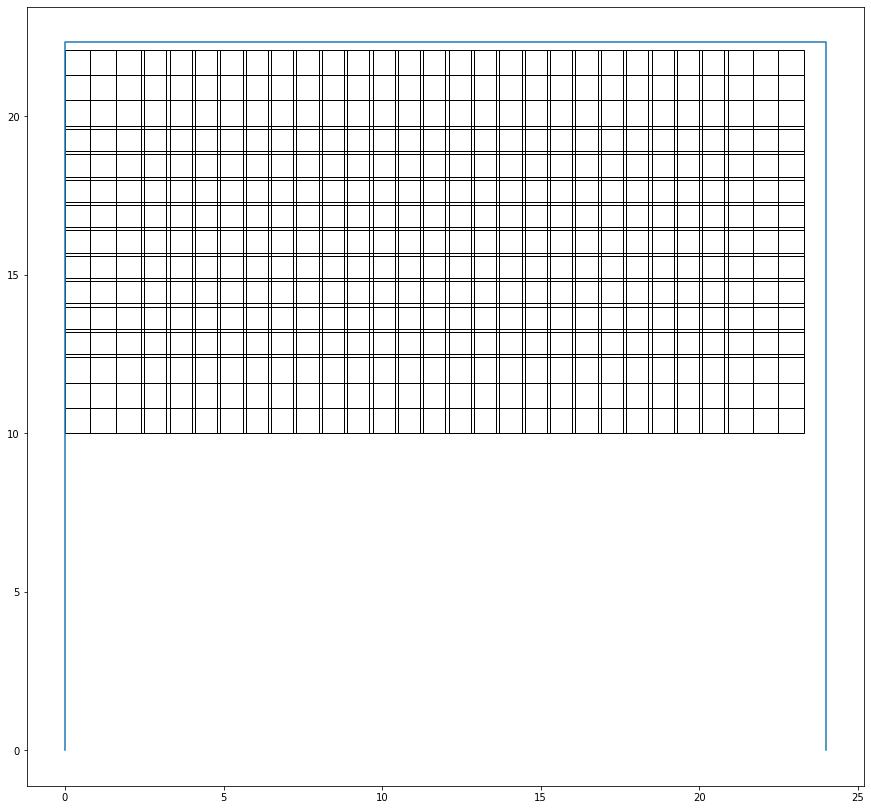

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
15
26
89
108
183
305
324
340
350
room dimension (W x H) are [[24.         22.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
11
21
108
259
269
330
room dimension (W x H) are [[24.         22.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 3.0
Optimal selection of seats (index):
11
26
324
room dimension (W x H) are [[24.         22.33333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
11
25
108
280
290
room dimension (W x H) are [[24.         22.33333333]]

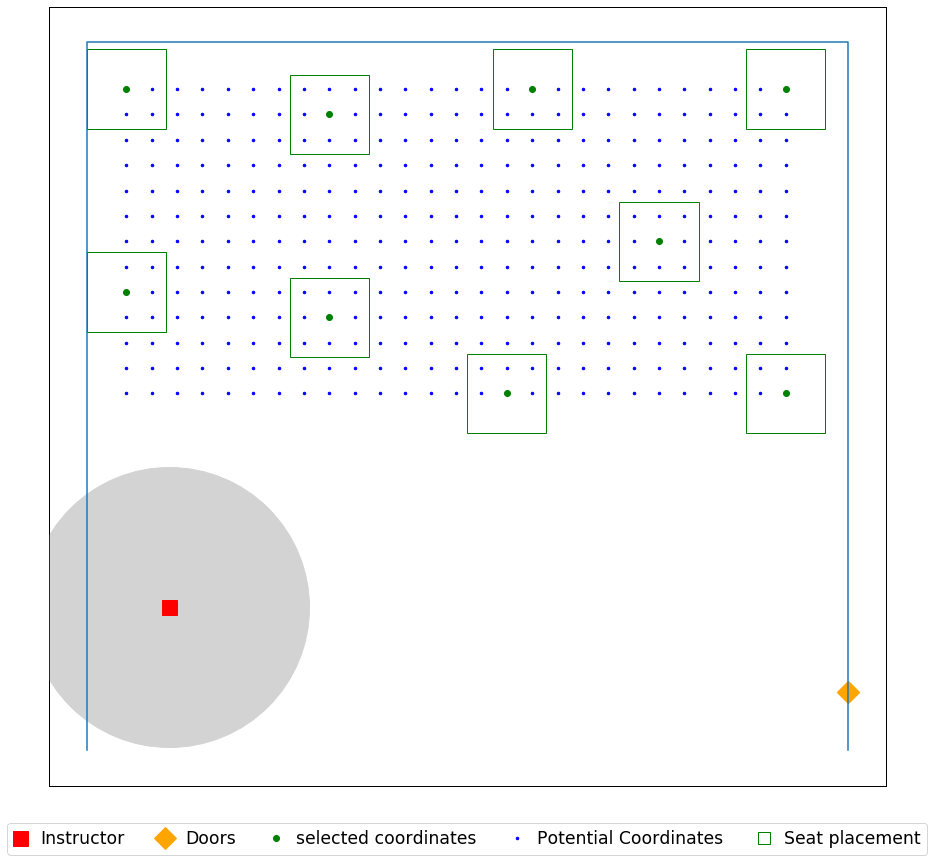

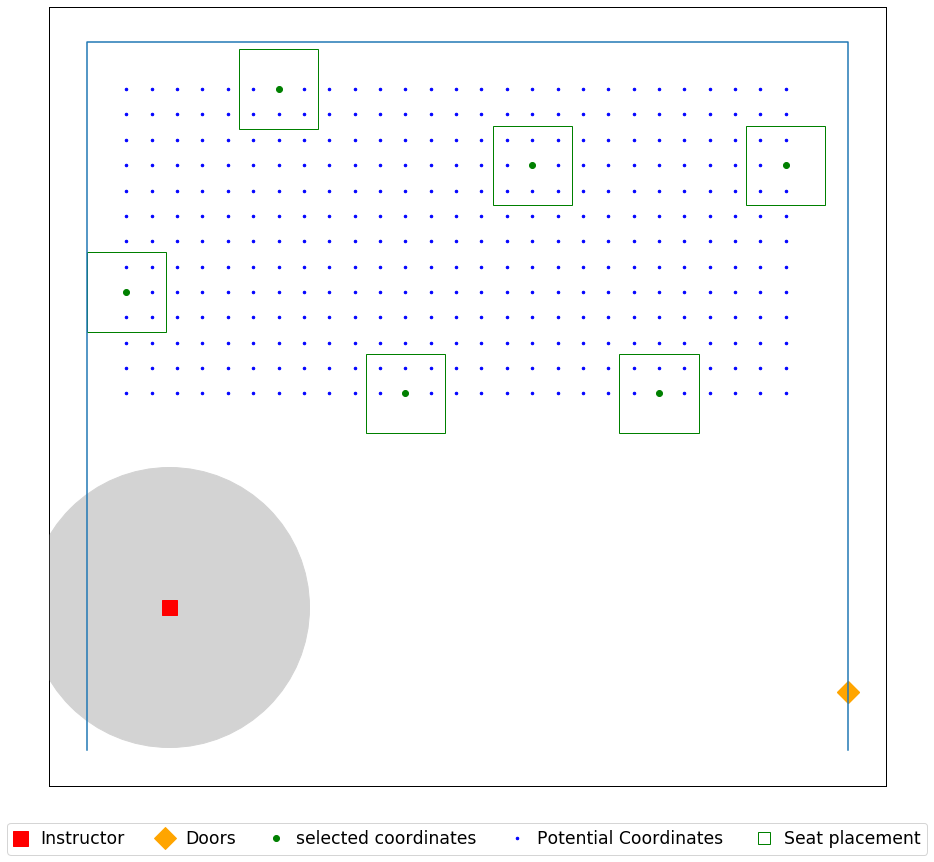

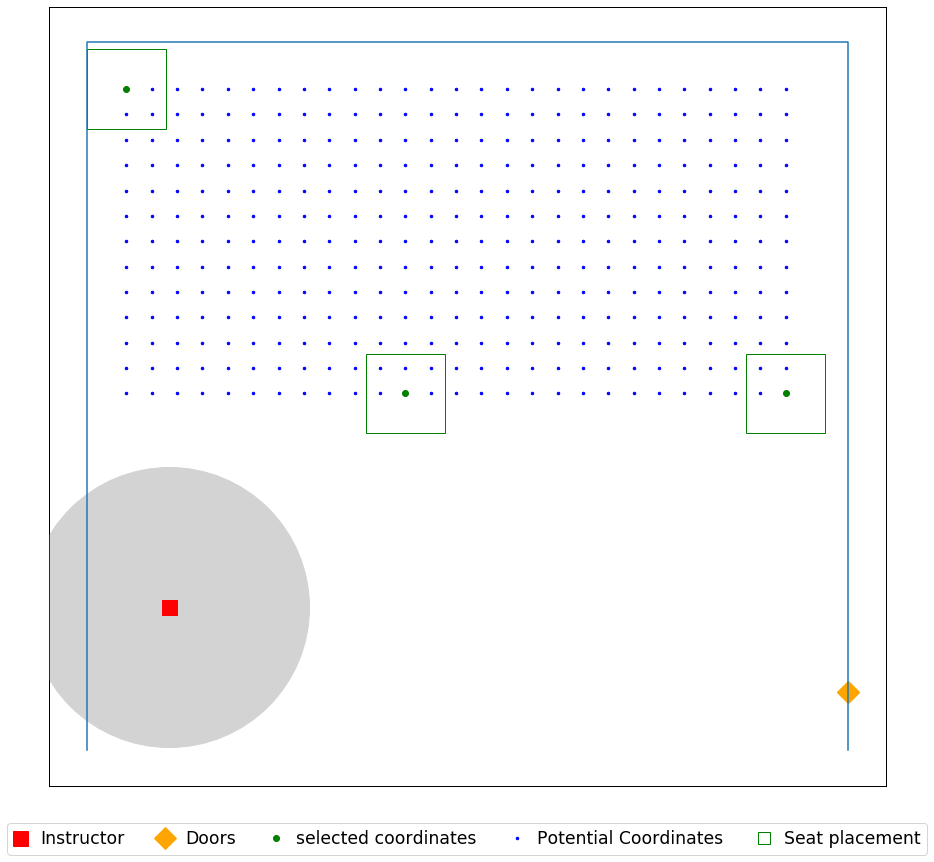

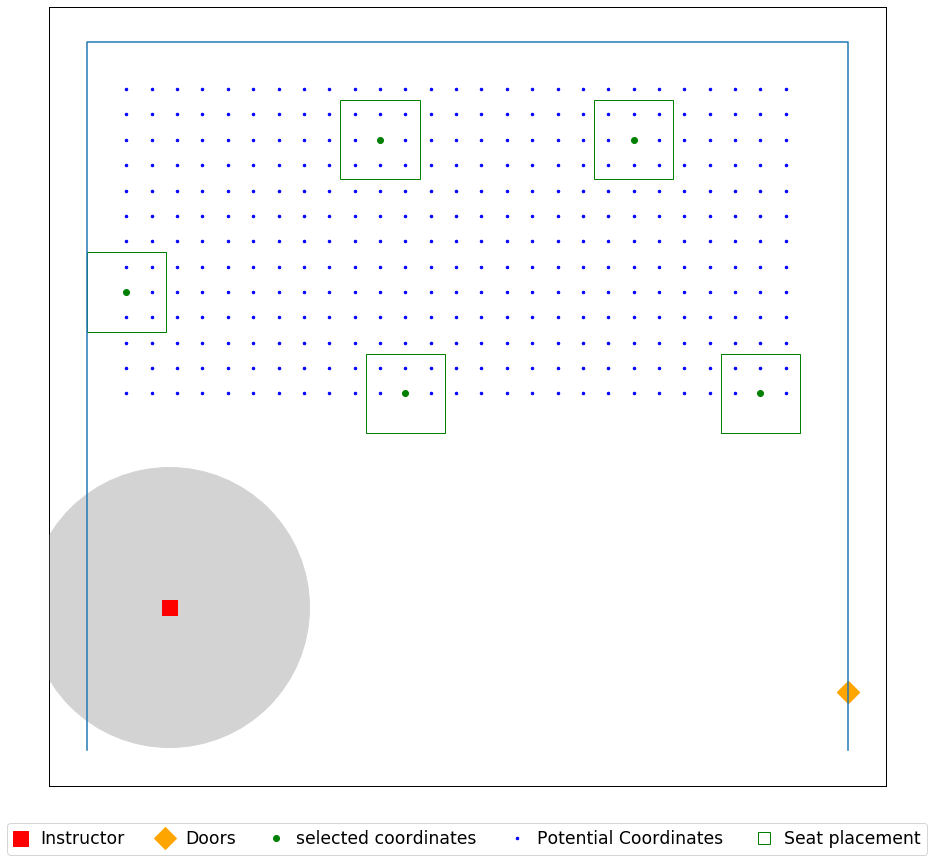

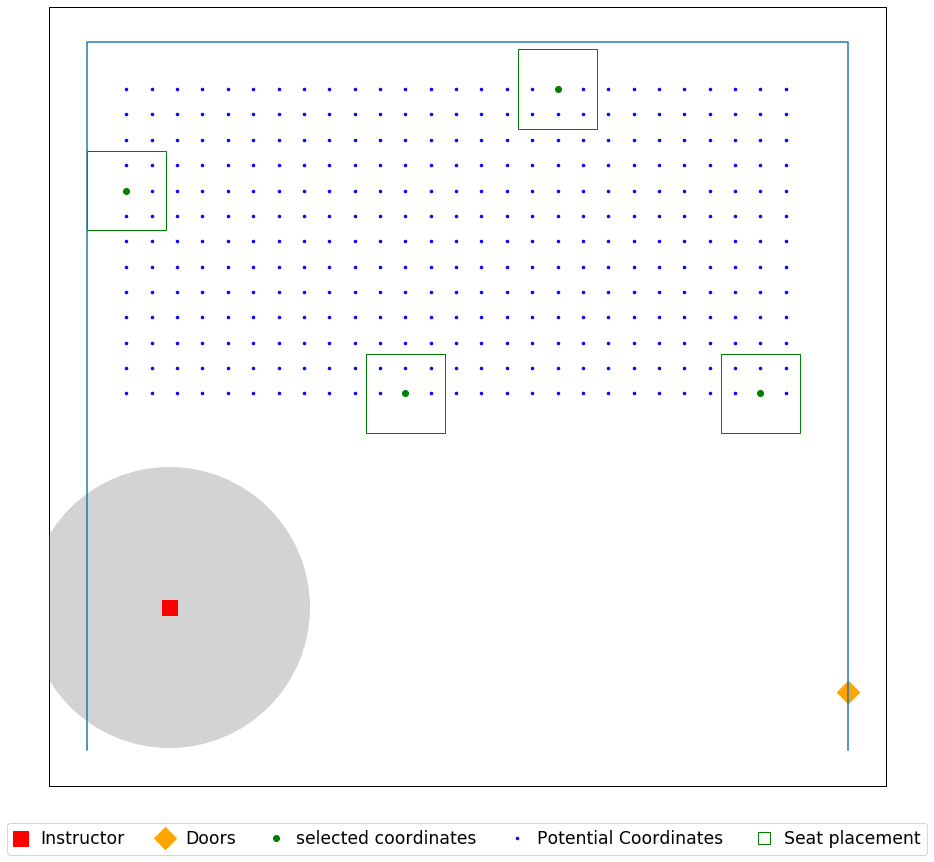

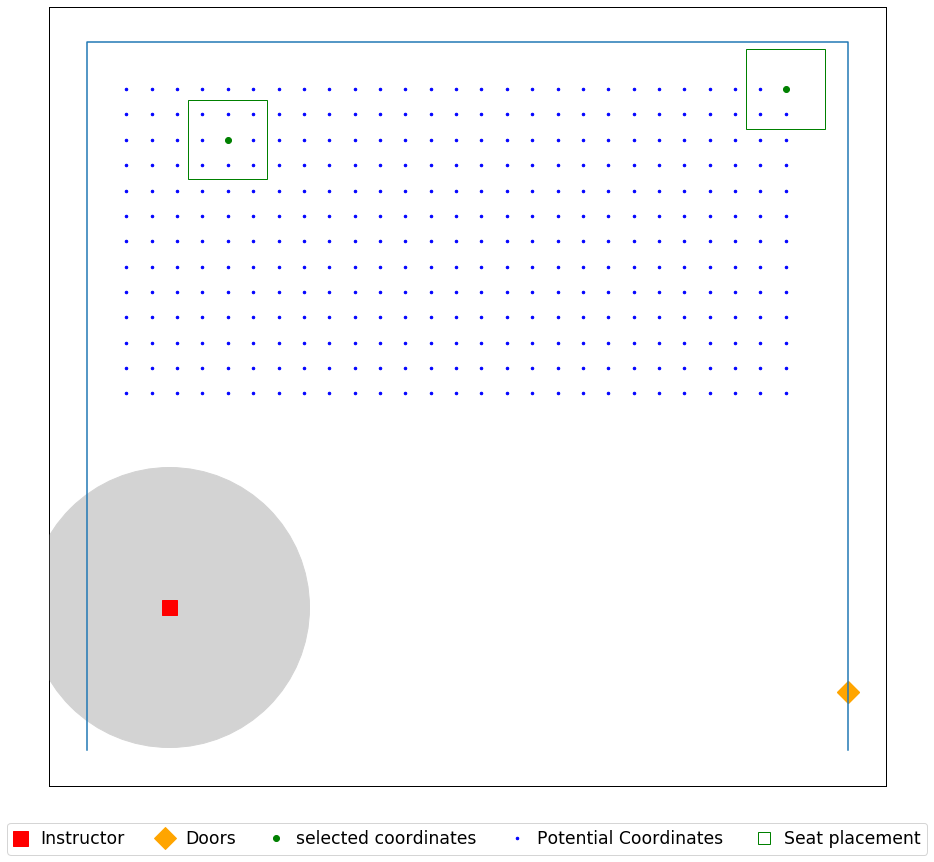

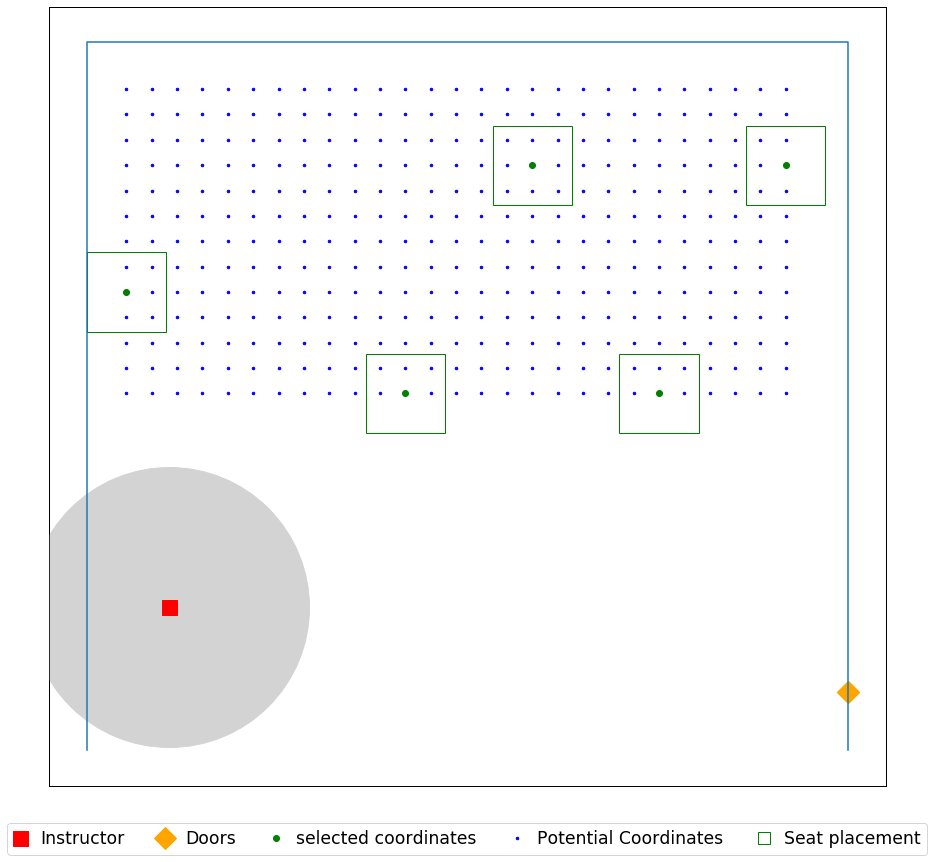

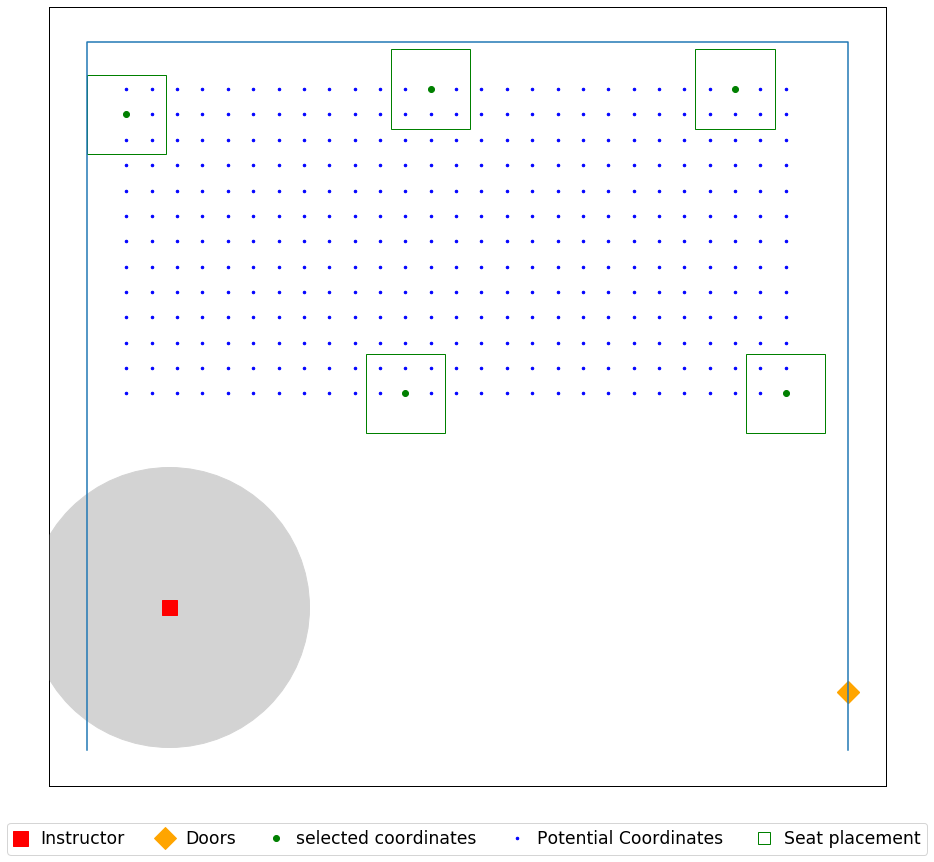

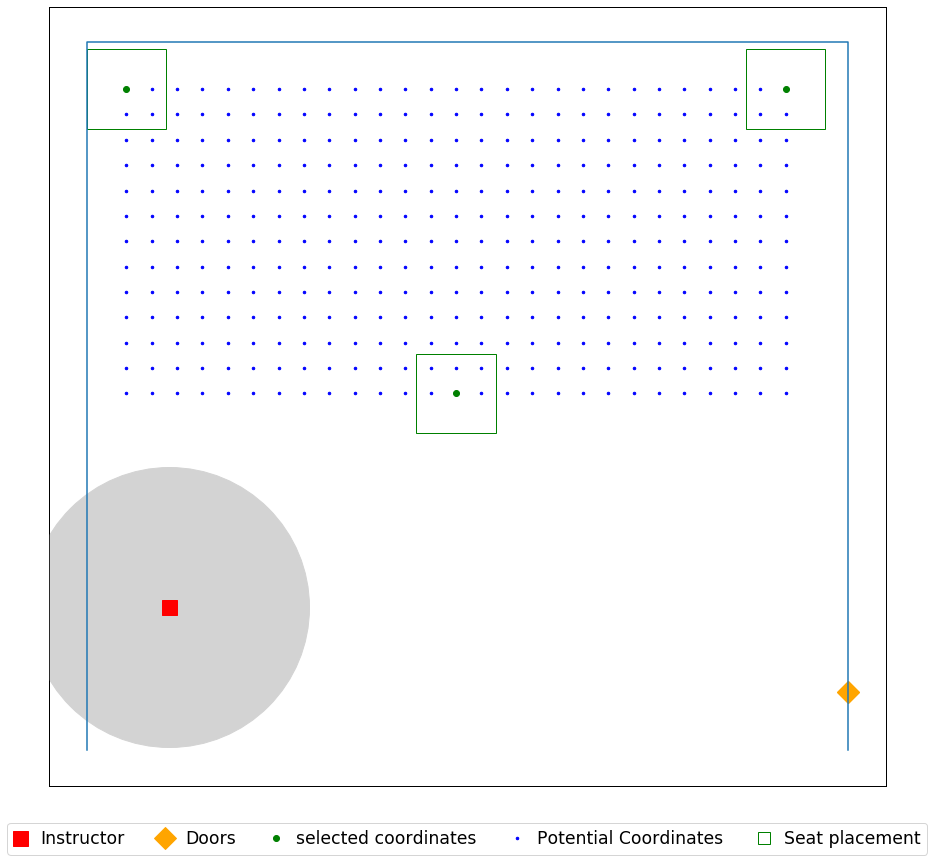

In [208]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## COC 052 Capa: 40

In [212]:
data_file = r'C:\Users\yoges\Desktop\Input\050_COC_052_40_721.xlsx'

Name = 'COC_52_'

room dimension (W x H) are [[21.66666667 30.70833333]]
seat dimension (W x H) are [[2.5 2.5]]
[[5. 4.]]
[(0, 10), (21.666666666666668, 10), (21.666666666666668, 30.708333333333332), (0, 30.708333333333332)]
Total number of seats  is 552


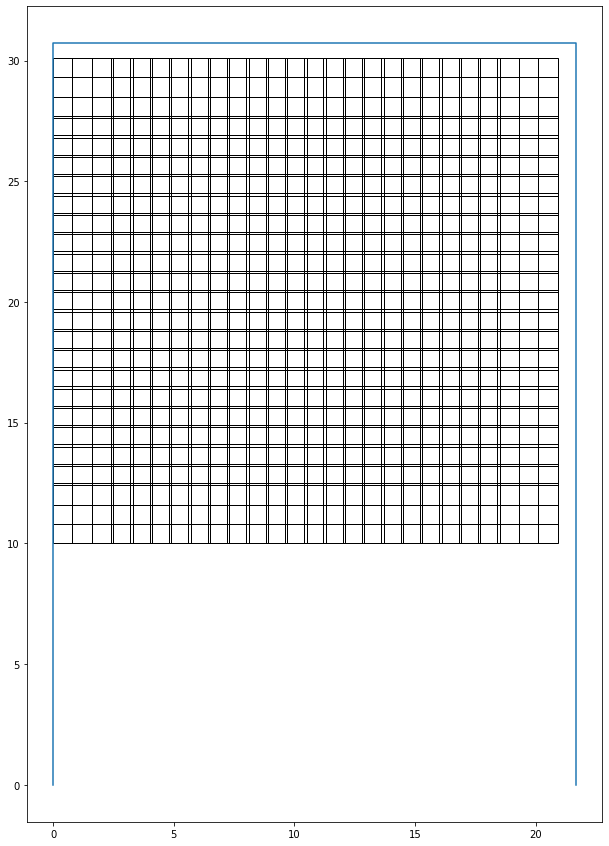

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
14
23
72
128
207
215
264
344
380
456
535
543
551
room dimension (W x H) are [[21.66666667 30.70833333]]
seat dimension (W x H) are [[2.5 2.5]]


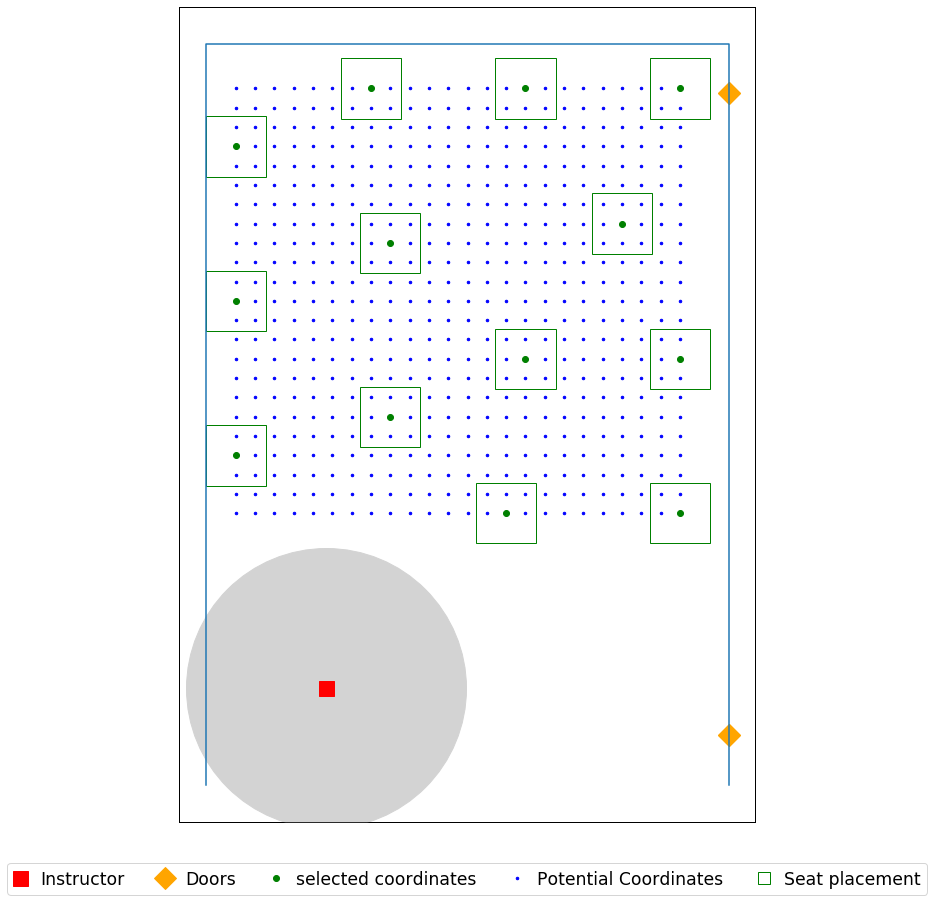

In [213]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\COC_52\COC_52_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\COC_52\COC_52_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[21.66666667 30.70833333]]
seat dimension (W x H) are [[2.5 2.5]]
[[5. 4.]]
[(0, 10), (21.666666666666668, 10), (21.666666666666668, 30.708333333333332), (0, 30.708333333333332)]
Total number of seats  is 552


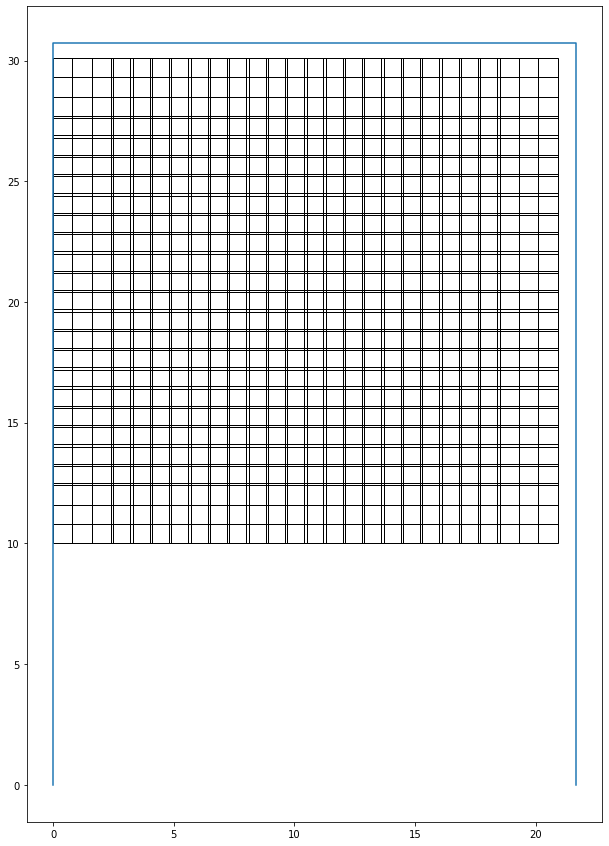

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
14
23
72
128
207
215
264
344
380
456
535
543
551
room dimension (W x H) are [[21.66666667 30.70833333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
14
72
143
224
353
360
489
551
room dimension (W x H) are [[21.66666667 30.70833333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
14
144
311
441
room dimension (W x H) are [[21.66666667 30.70833333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
47
59
72
295
305
530
540
551
room dimensio

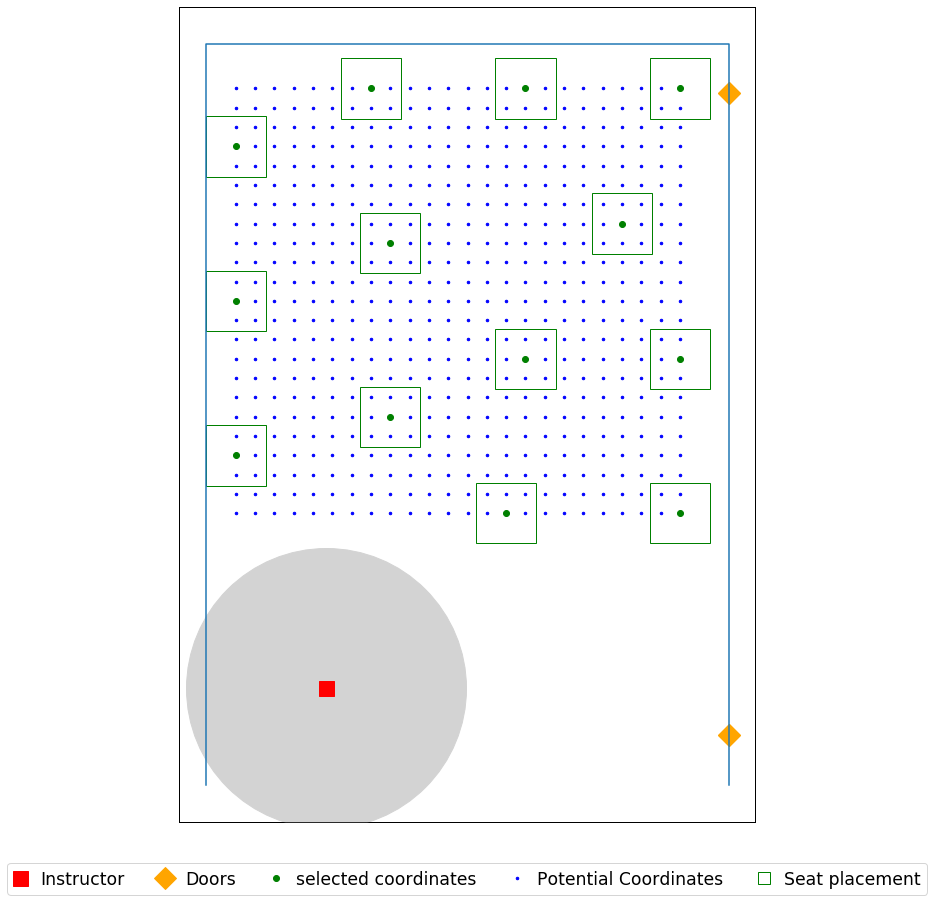

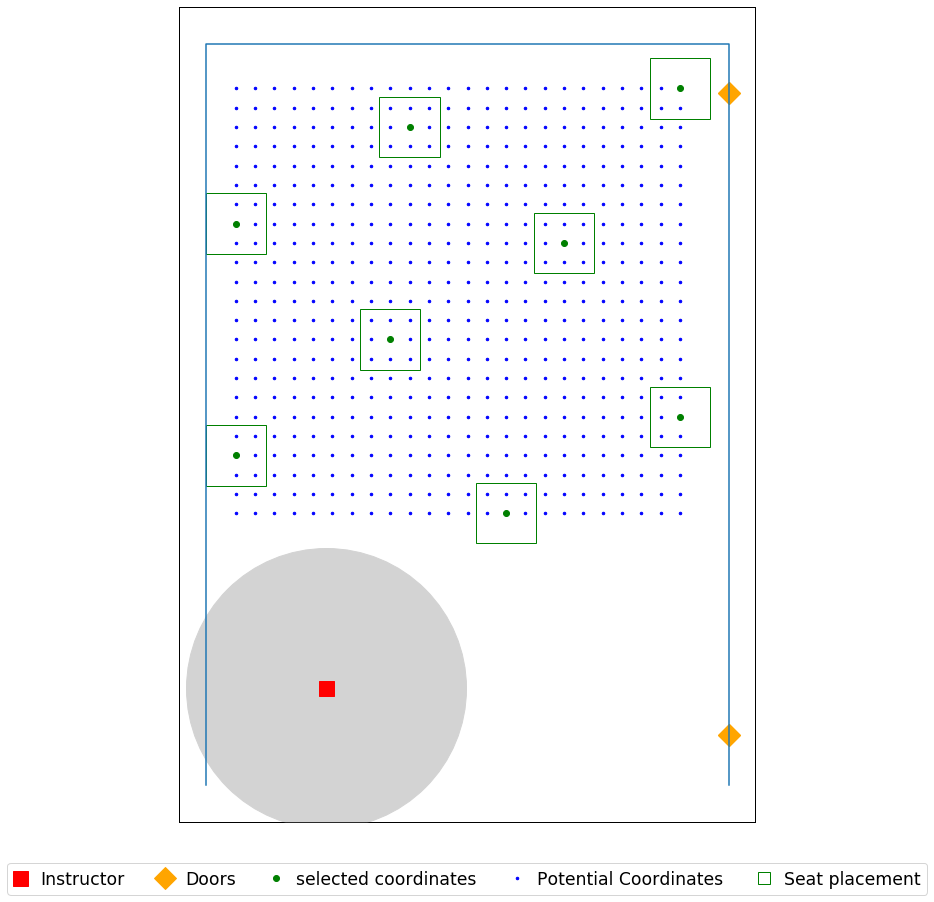

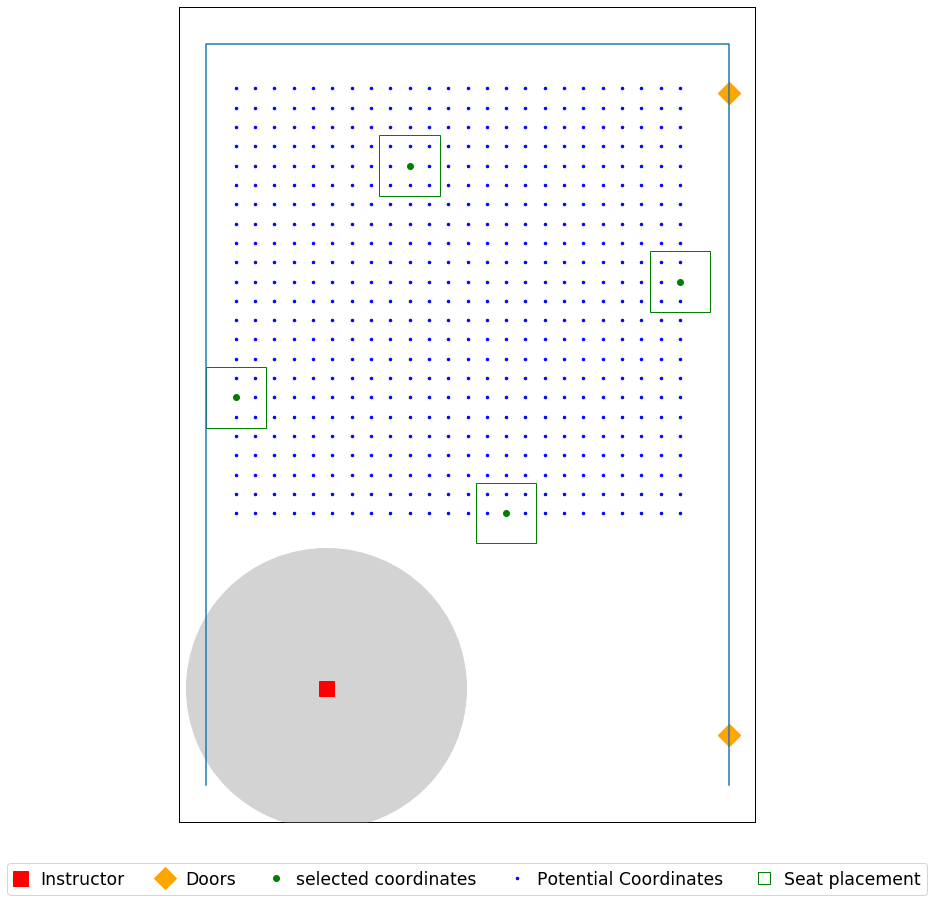

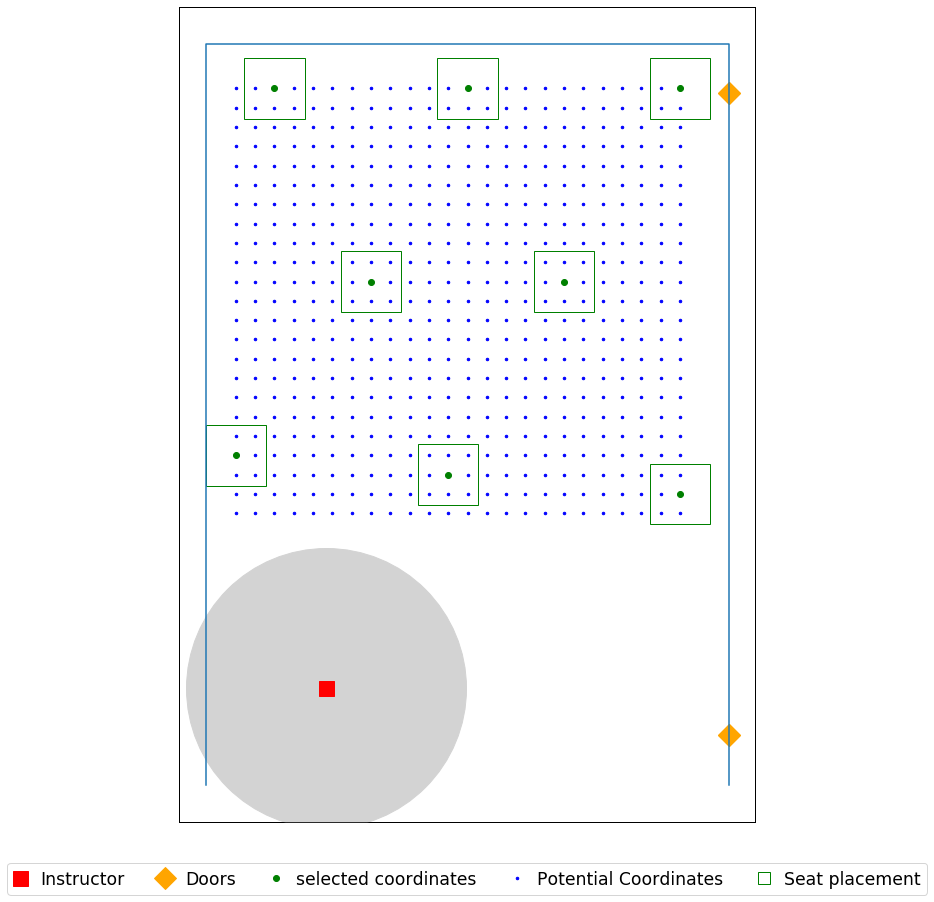

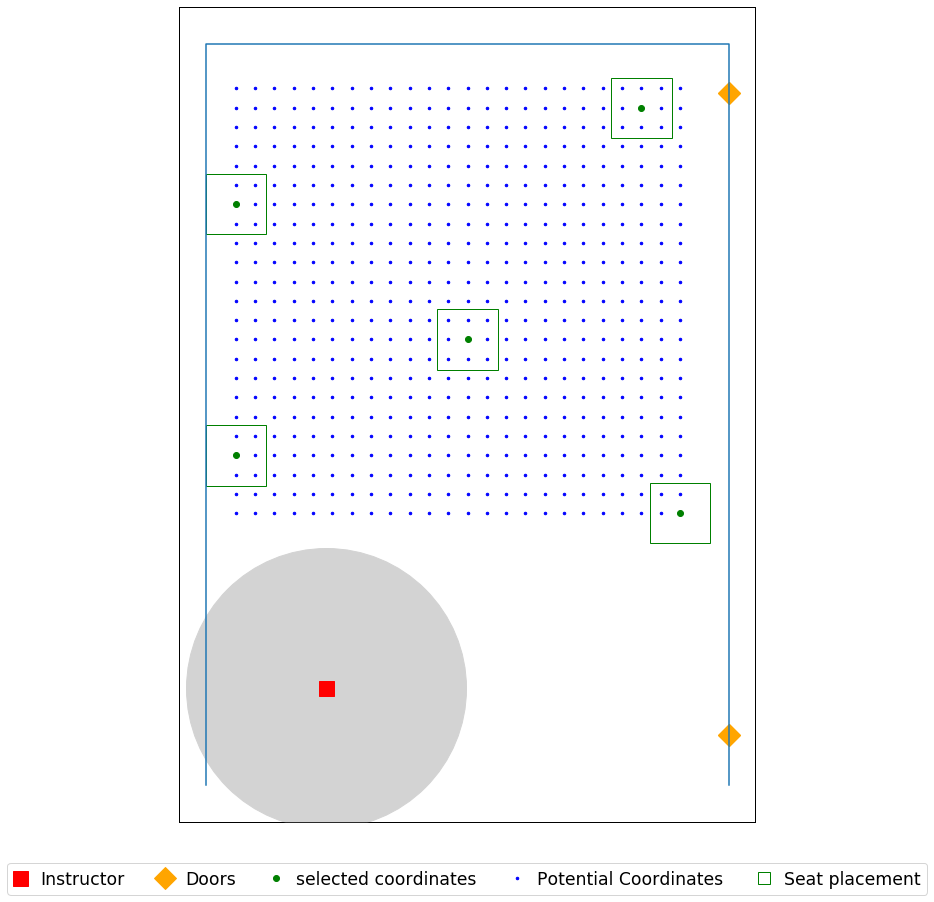

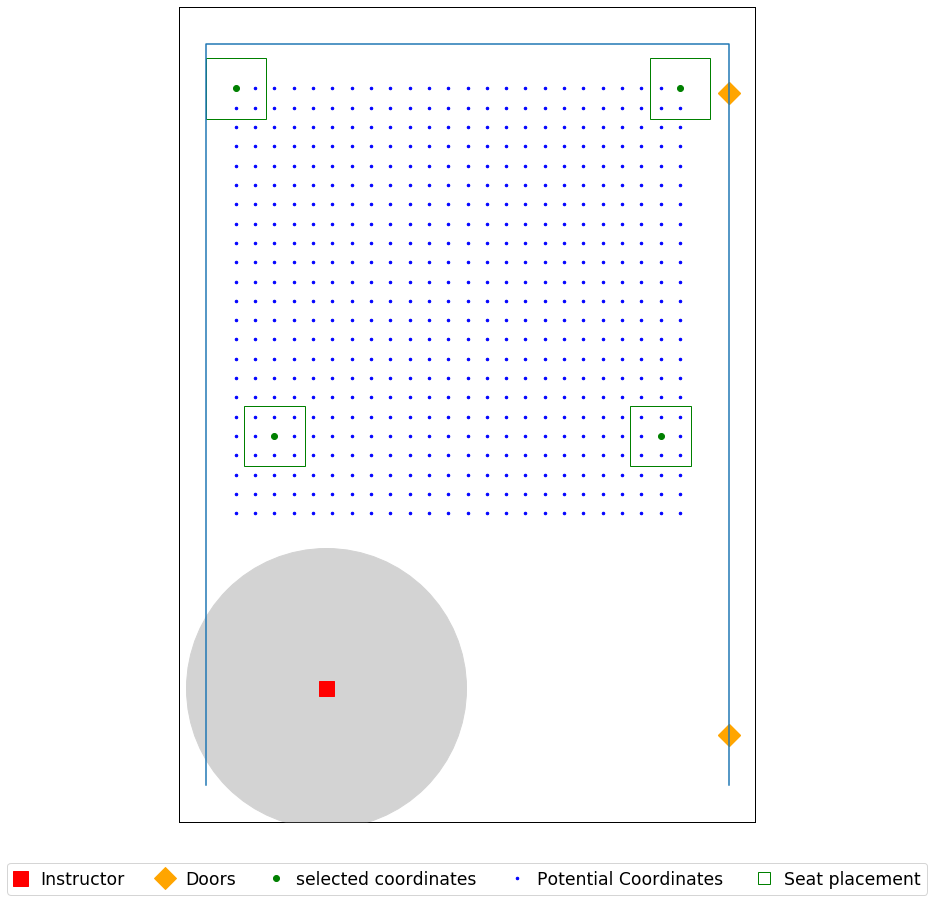

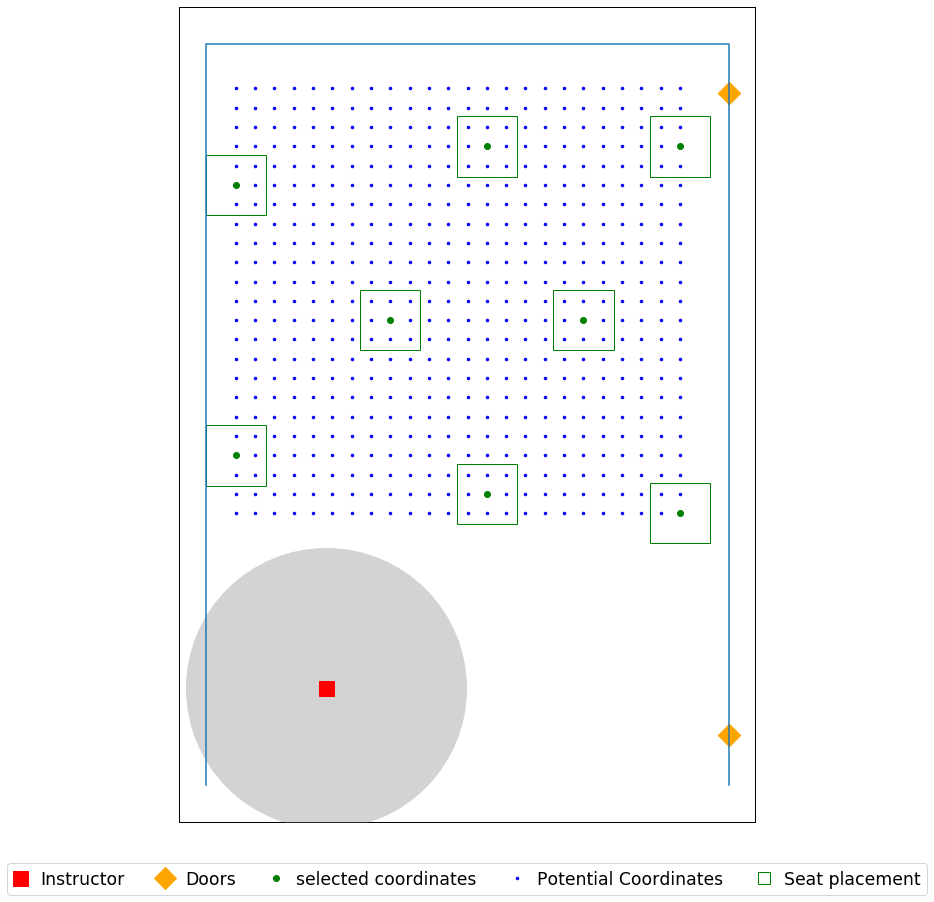

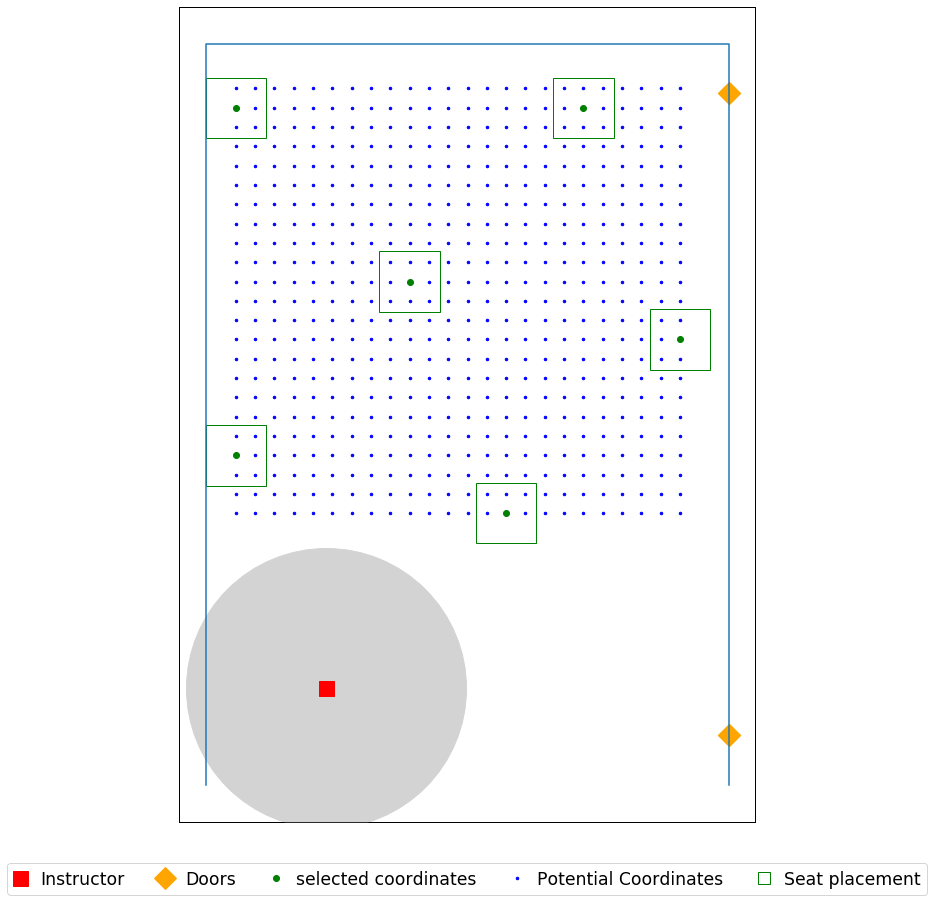

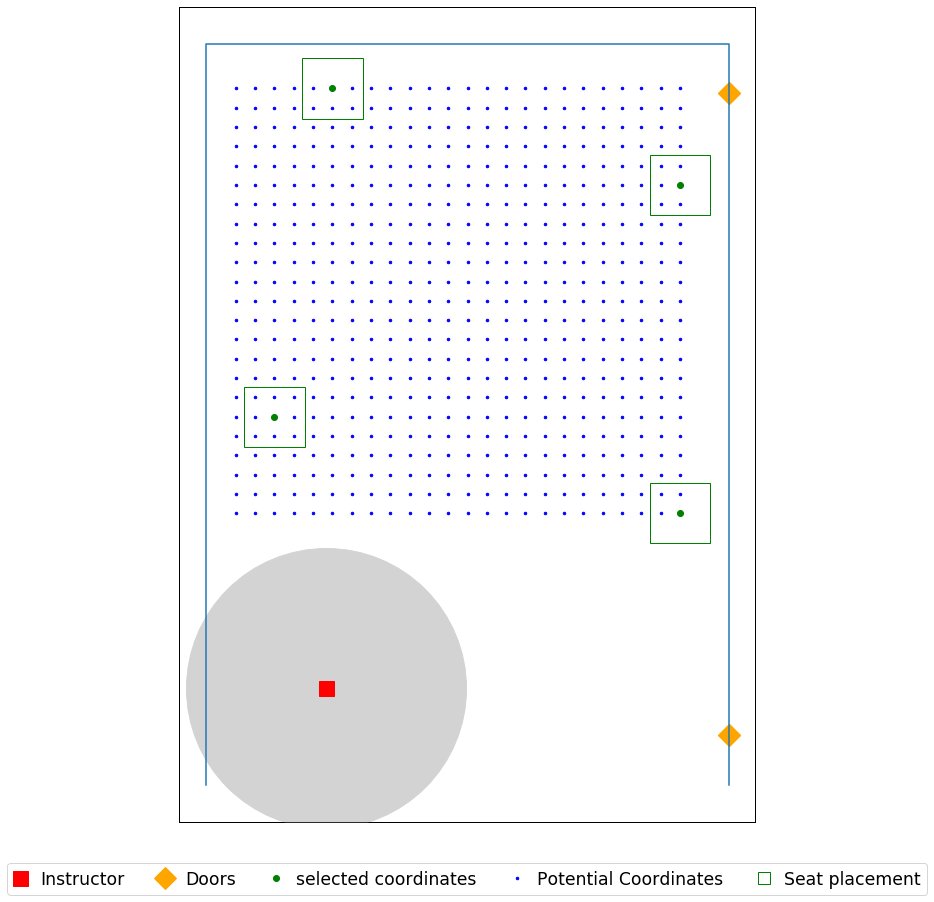

In [214]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

## Smith 208 Capa: 25

In [22]:
data_file = r'C:\Users\yoges\Desktop\Input\024_Smith_208_25_721.xlsx'

Name = 'Smith_208_'

room dimension (W x H) are [[17.083333333333332 22]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.166666666666667 2.9166666666666665]]
[(0, 10), (17.083333333333332, 10), (17.083333333333332, 22), (0, 22)]
Total number of seats  is 228


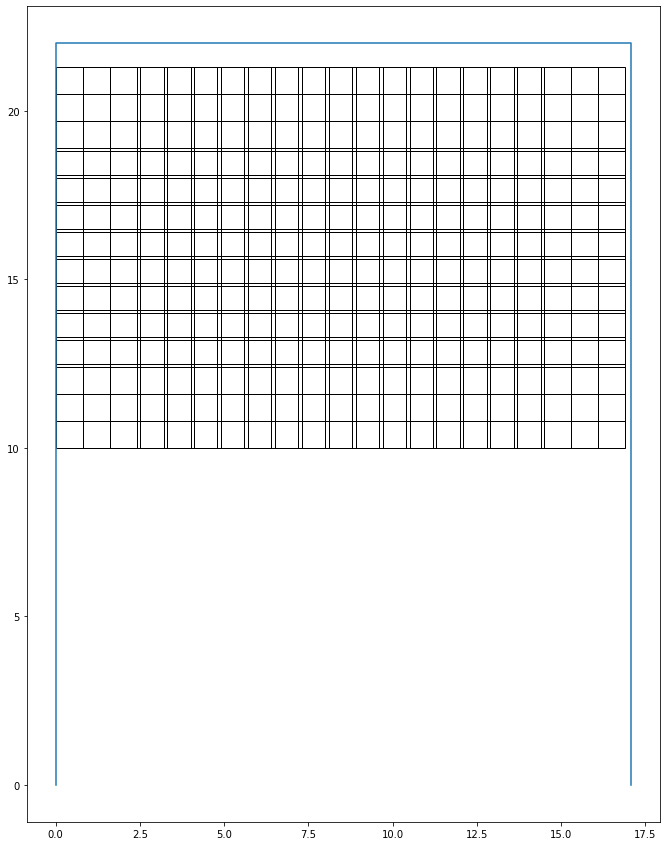

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
28
38
75
190
218
227


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\yoges\\OneDrive - Georgia Institute of Technology\\Documents\\Fall_Campus_reopening\\V2_V6_Instructor\\V2_V6_Seat_Radius_0ft\\Smith_208_R\\Smith_208_6ft_SeatR=0ft.csv'

In [23]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_208_R\Smith_208_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Documents\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Smith_208_R\Smith_208_6ft_SeatR=0ft.jpg', dpi=500)

room dimension (W x H) are [[17.083333333333332 22]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.166666666666667 2.9166666666666665]]
[(0, 10), (17.083333333333332, 10), (17.083333333333332, 22), (0, 22)]
Total number of seats  is 228


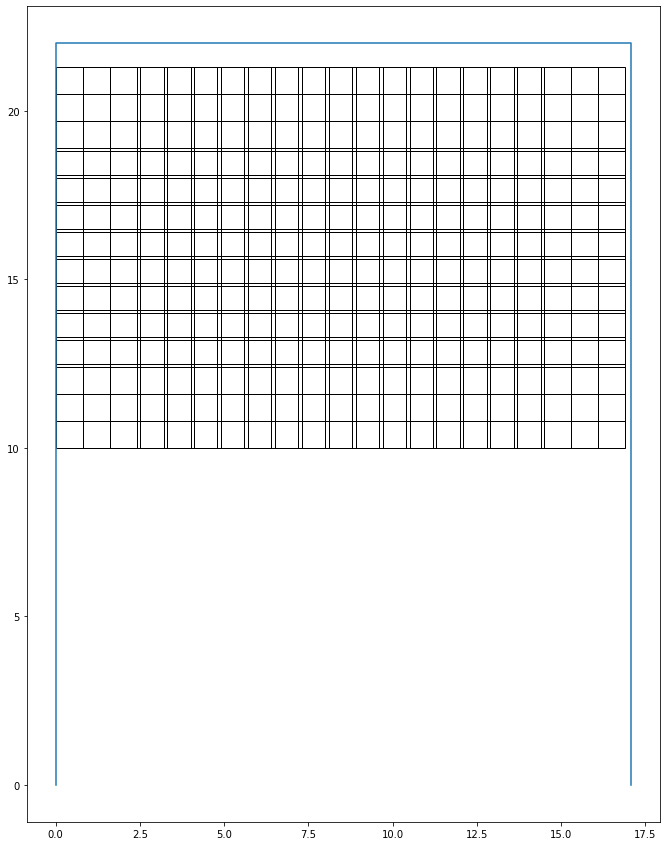

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
28
38
75
190
218
227
room dimension (W x H) are [[17.083333333333332 22]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
11
38
169
196
room dimension (W x H) are [[17.083333333333332 22]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 2.0
Optimal selection of seats (index):
38
227
room dimension (W x H) are [[17.083333333333332 22]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
11
38
189
198
room dimension (W x H) are [[17.083333333333332 22]]
seat dimension (W x H) are [[2.5 2

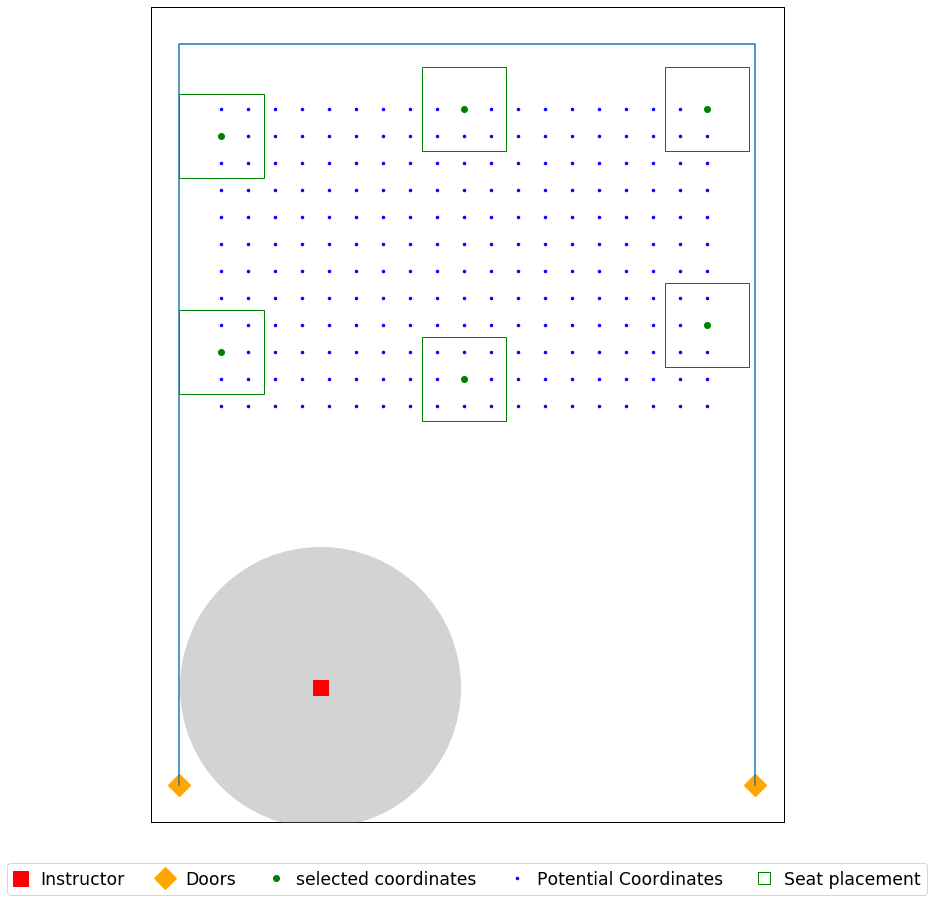

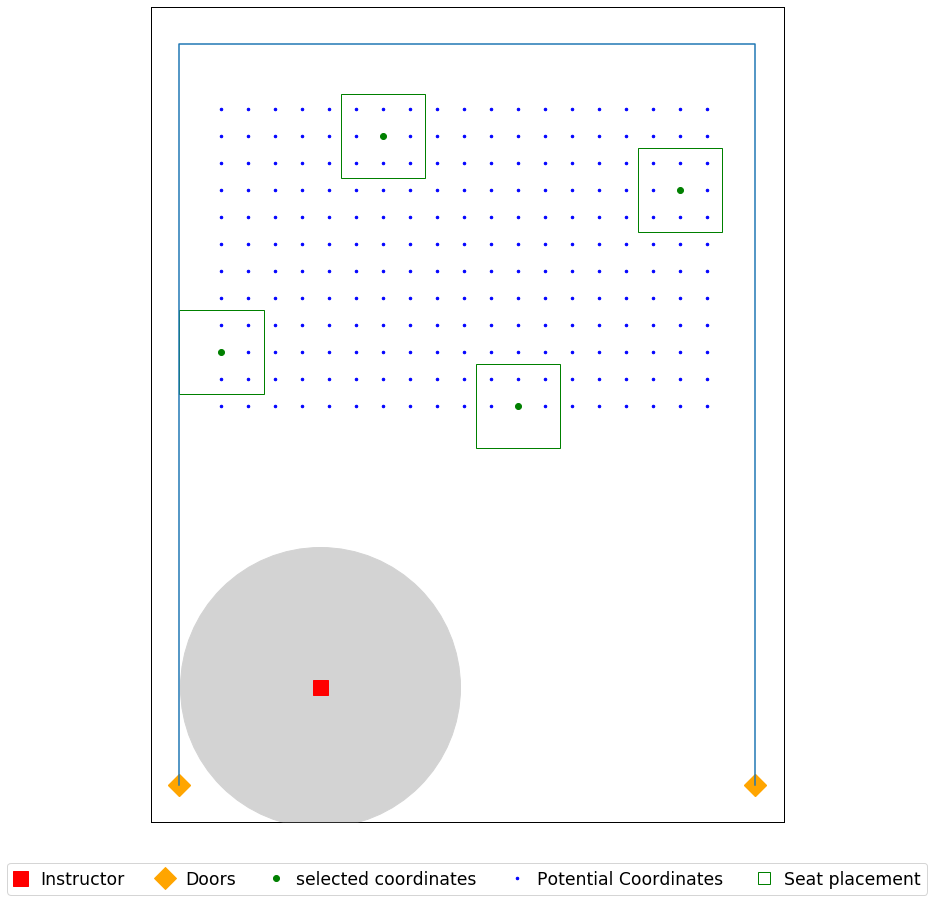

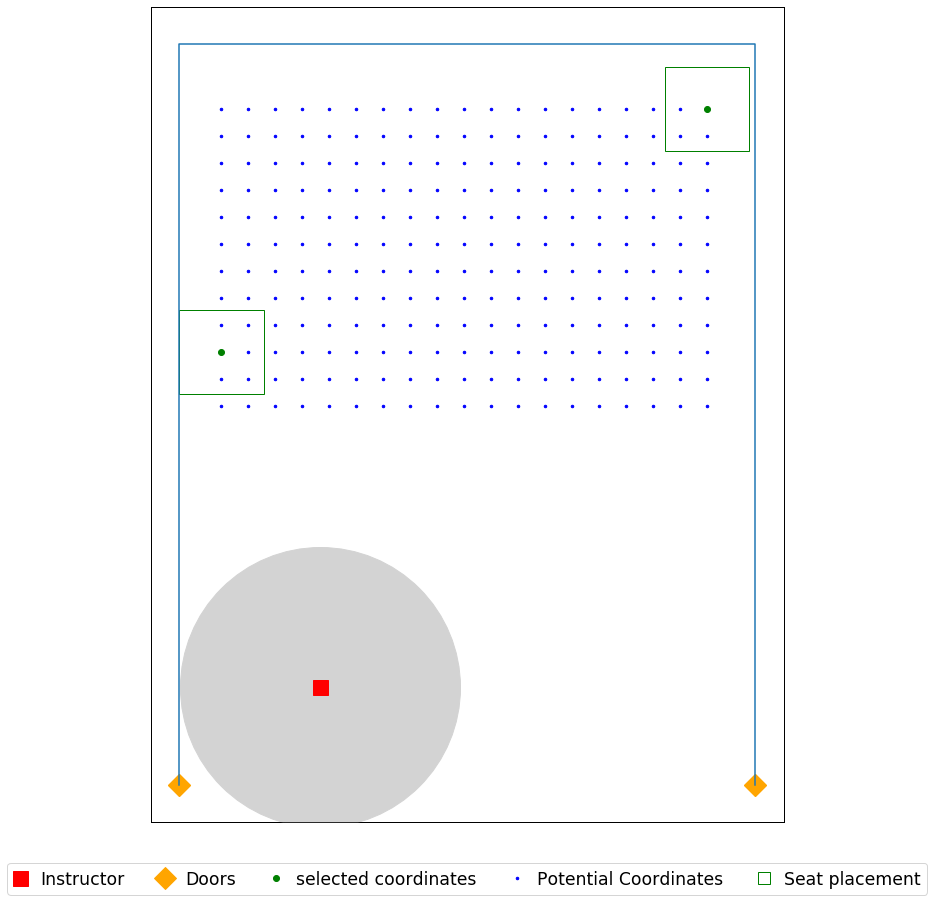

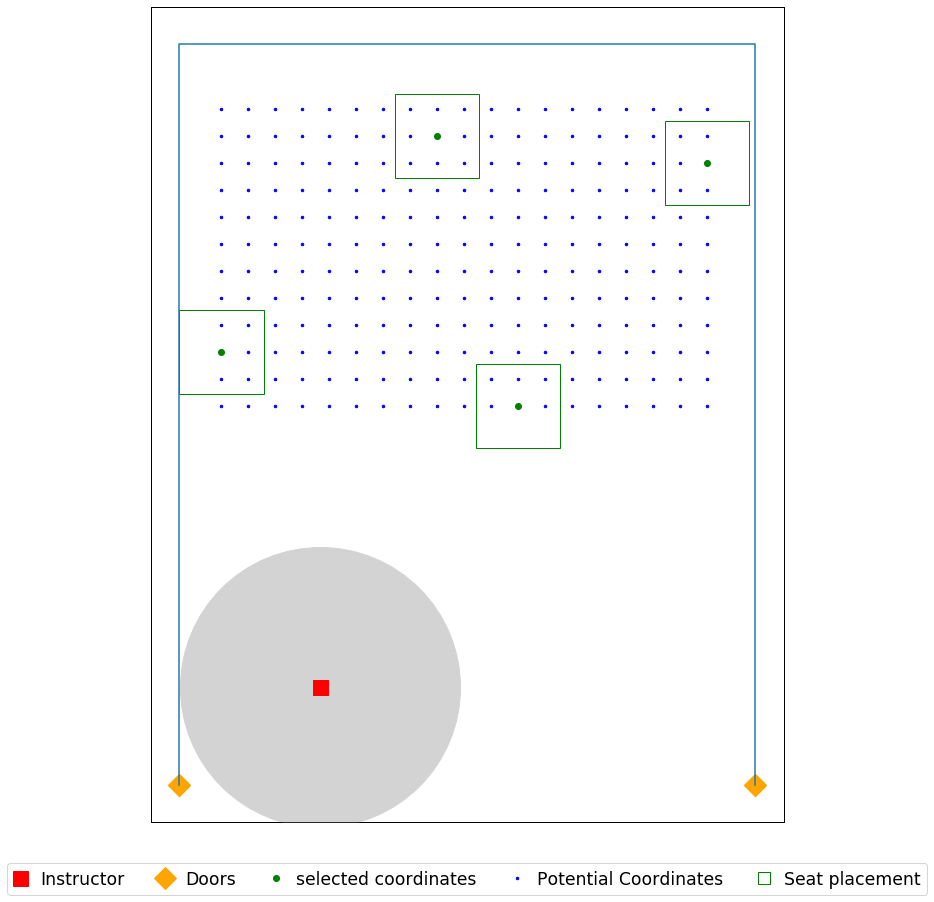

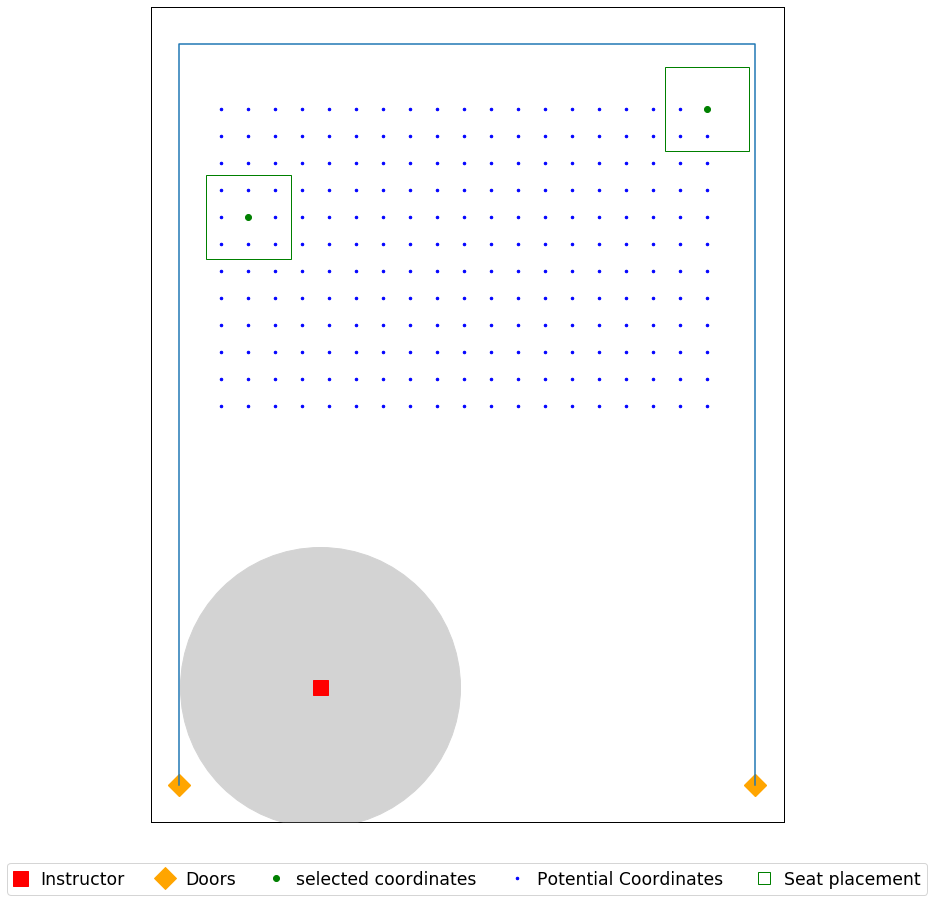

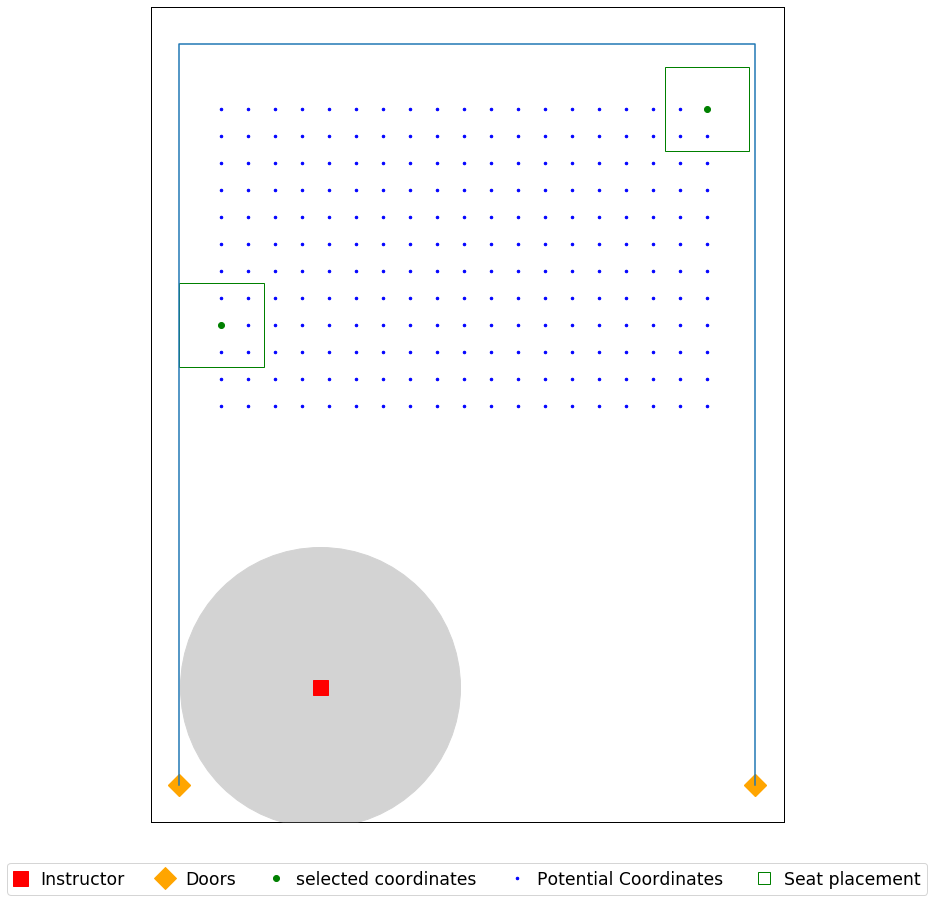

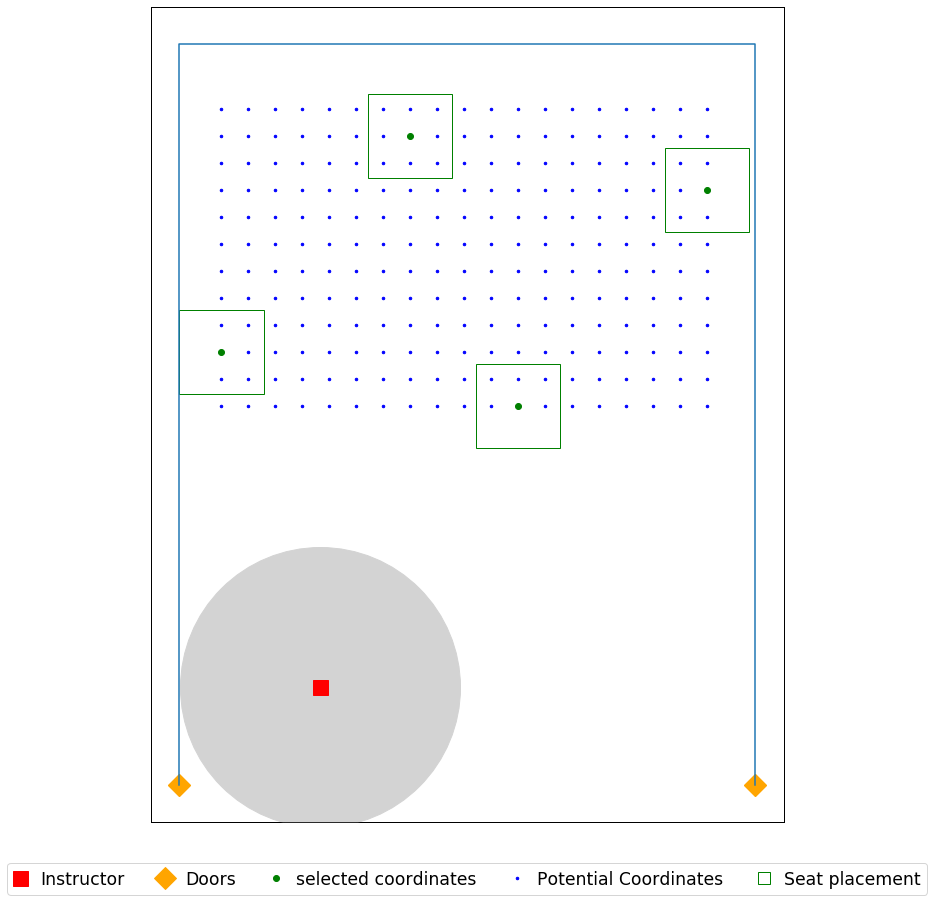

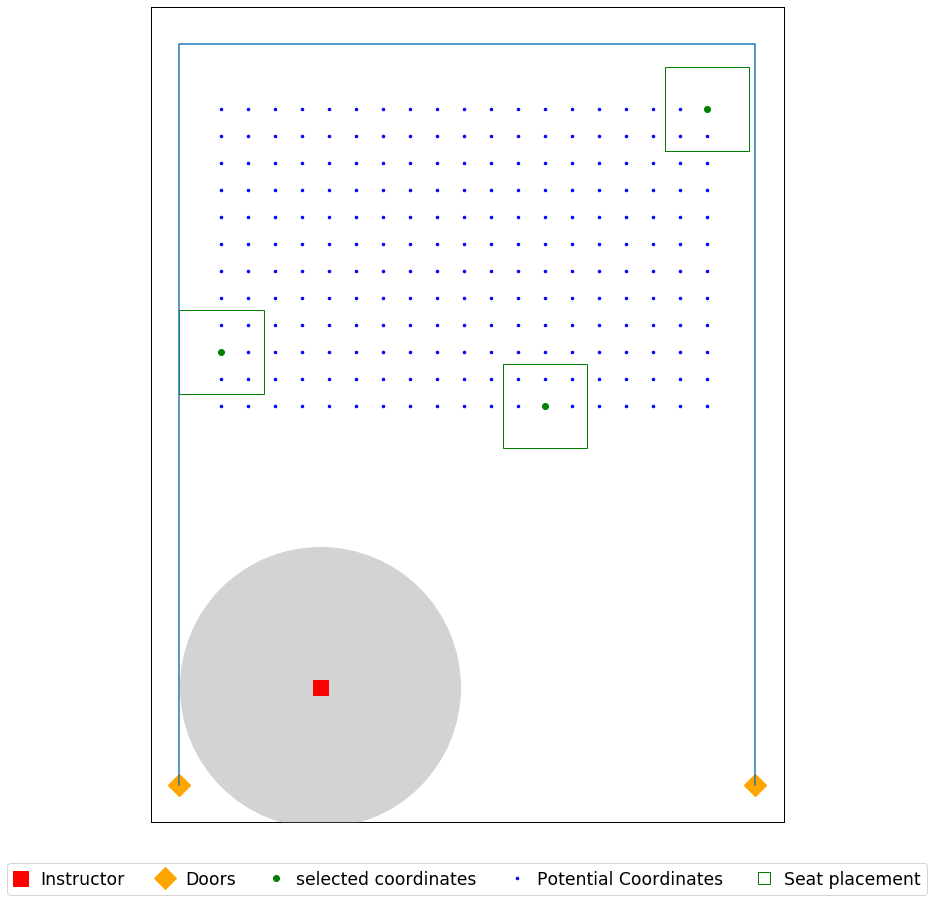

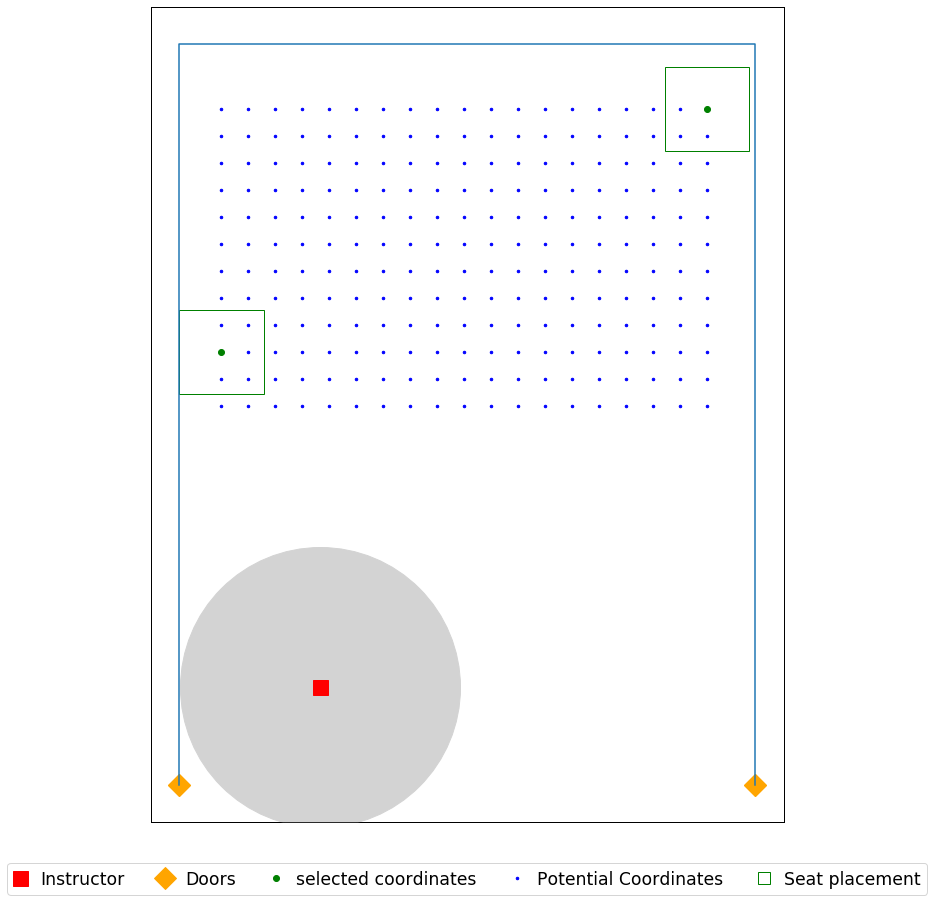

In [218]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.jpg', dpi=500)

# Input on 07.26 by Sivalika

## Swann 106

In [49]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Swann, Janie Austell 106.xlsx'

Name = 'Swann_106'

room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
[[15.29166667  3.45833333]]
[(0, 10), (19.458333333333332, 10), (19.458333333333332, 36.291666666666664), (0, 36.291666666666664)]
Total number of seats  is 638


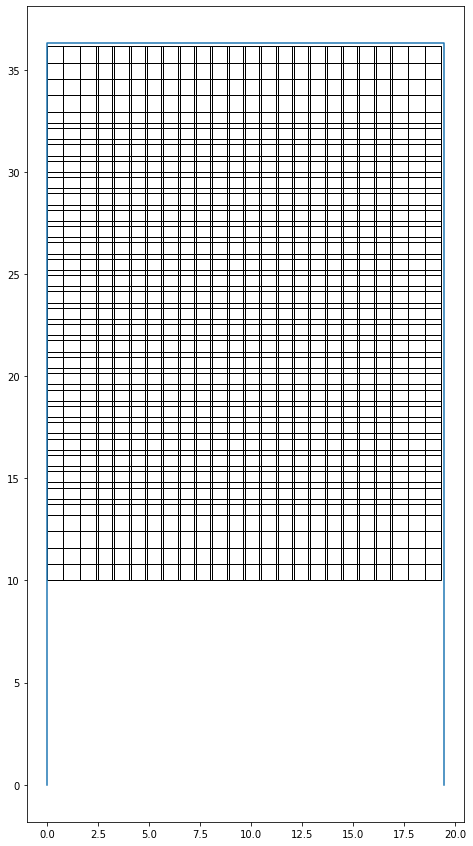

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
8
60
157
187
197
308
324
338
461
465
475
602
612
616
room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]


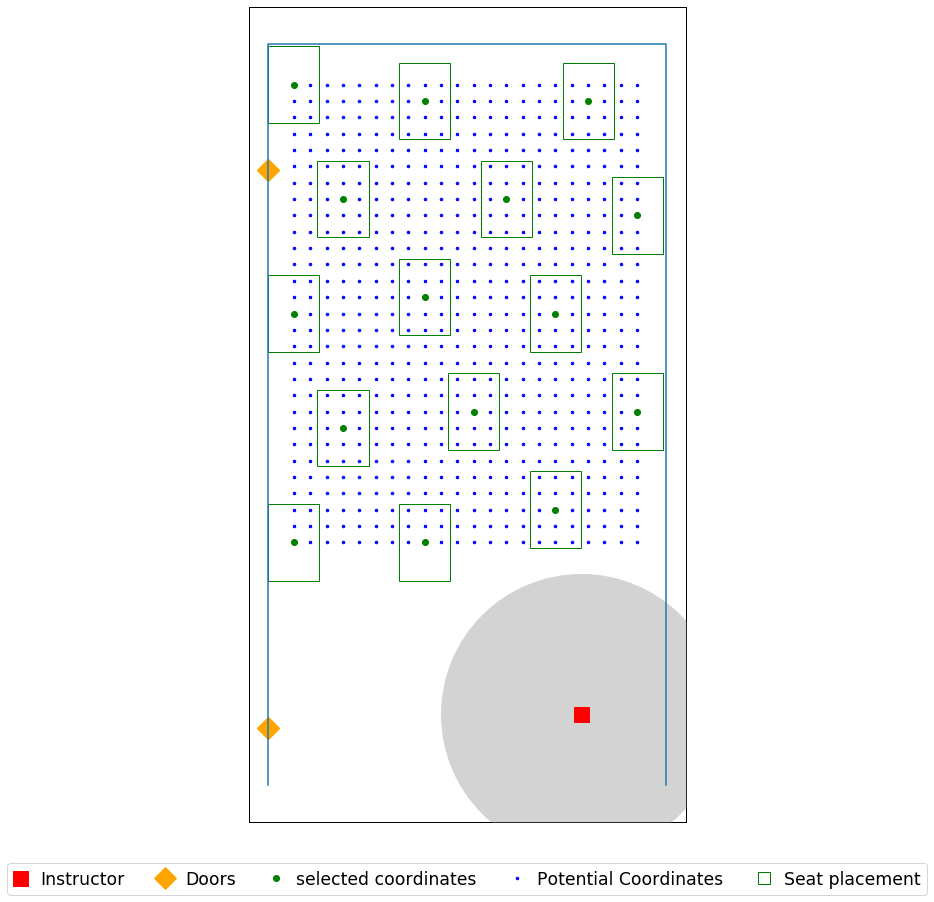

In [36]:
seat_loc = seat_coordinates(data_file, 0.8)
j= 0
i = 6
print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Swann_106\Swann_106_6ft_SeatR=0ft.csv', header = ('x','y'))
#         pd.DataFrame(selected).to_csv(Name+str(i)+'ft_seatR_'+str(j)+'_ft_V2_V6_instructor.csv', header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Swann_106\Swann_106_6ft_SeatR=0ft.jpg', dpi=500)

### try to save the respective files directly in folder : Success

room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
[[15.29166667  3.45833333]]
[(0, 10), (19.458333333333332, 10), (19.458333333333332, 36.291666666666664), (0, 36.291666666666664)]
Total number of seats  is 638


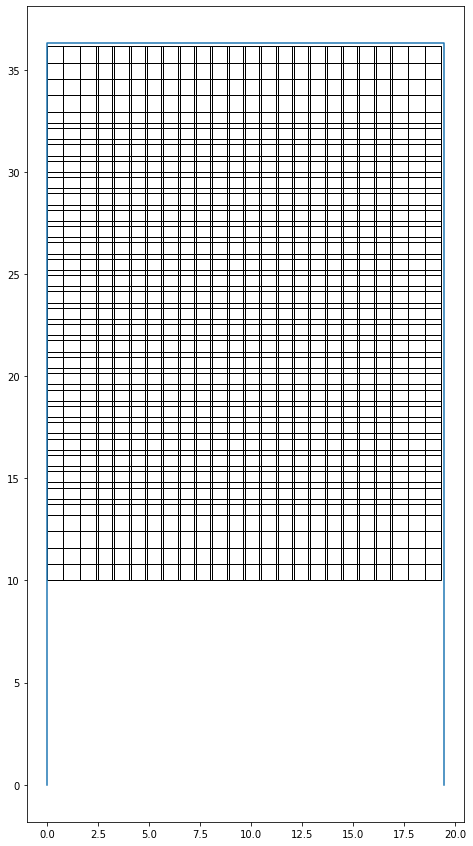

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
8
60
157
187
197
308
324
338
461
465
475
602
612
616
room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
64
203
257
396
439
450
616
632
room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
0
59
314
373
616
room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]


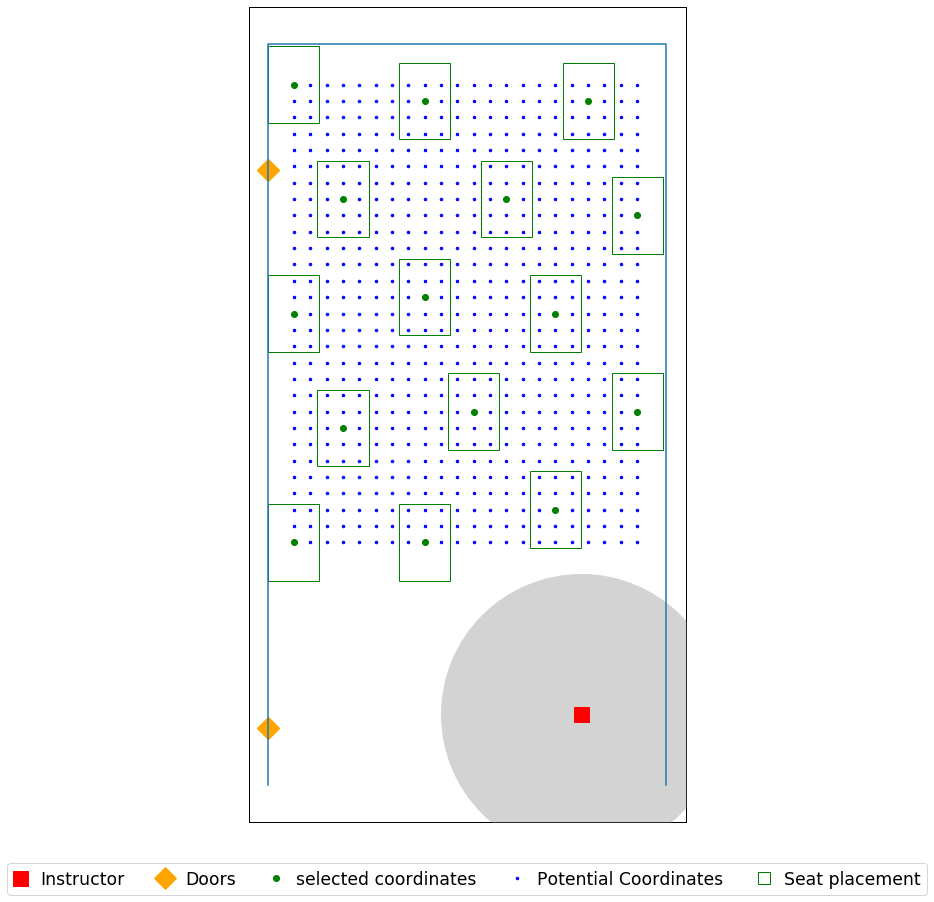

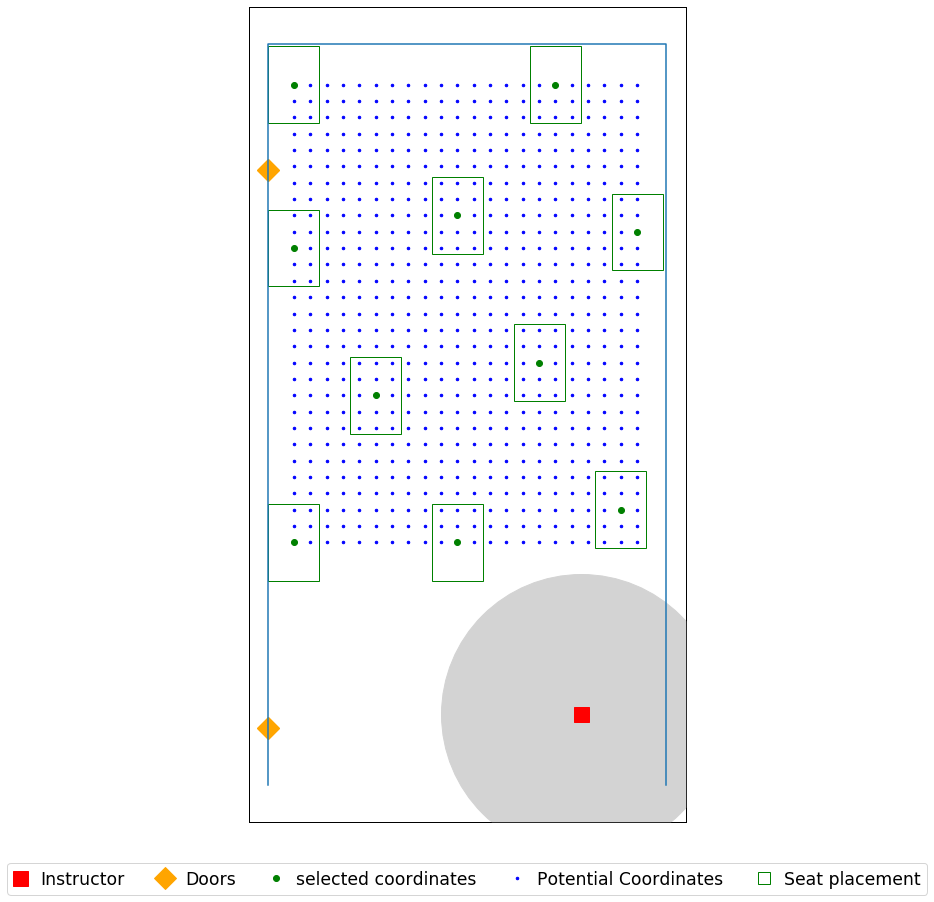

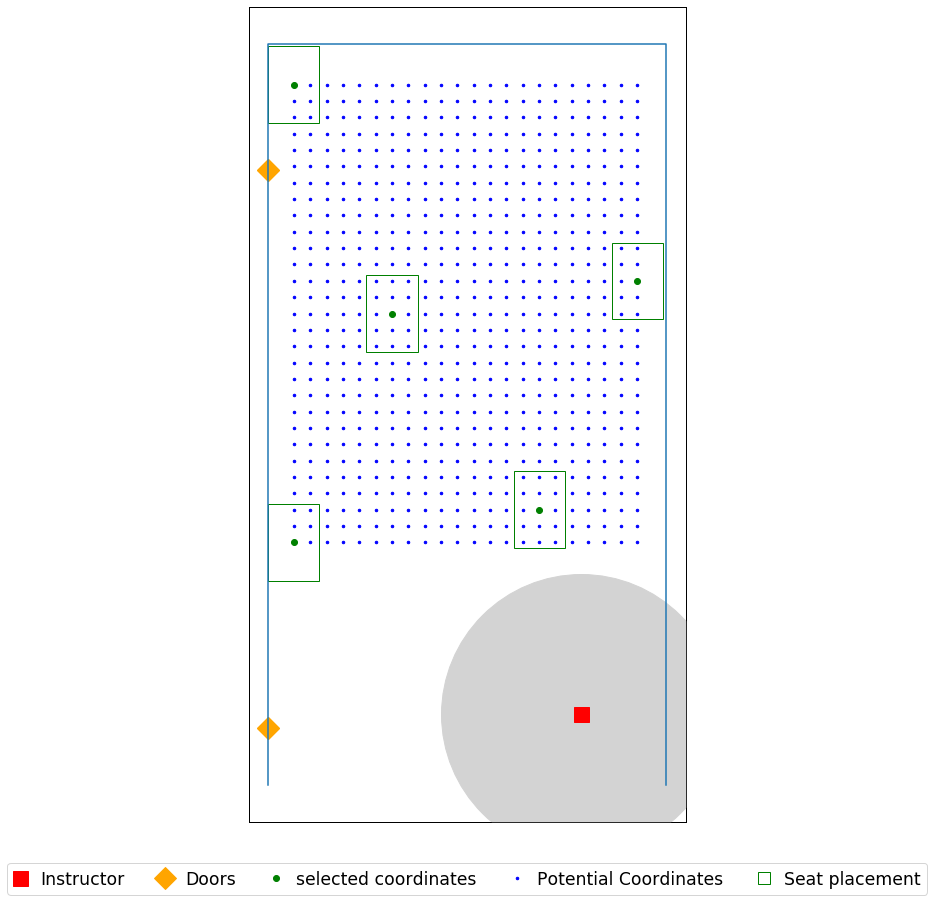

In [39]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0

for i in (6,8,12):
    print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
    obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
    pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Swann_106\Swann_106_{}ft_SeatR=0ft.csv'.format(i), header = ('x','y'))
    plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
    plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Swann_106\Swann_106_{}ft_SeatR=0ft.jpg'.format(i), dpi=500)
    

room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
[[15.29166667  3.45833333]]
[(0, 10), (19.458333333333332, 10), (19.458333333333332, 36.291666666666664), (0, 36.291666666666664)]
Total number of seats  is 638


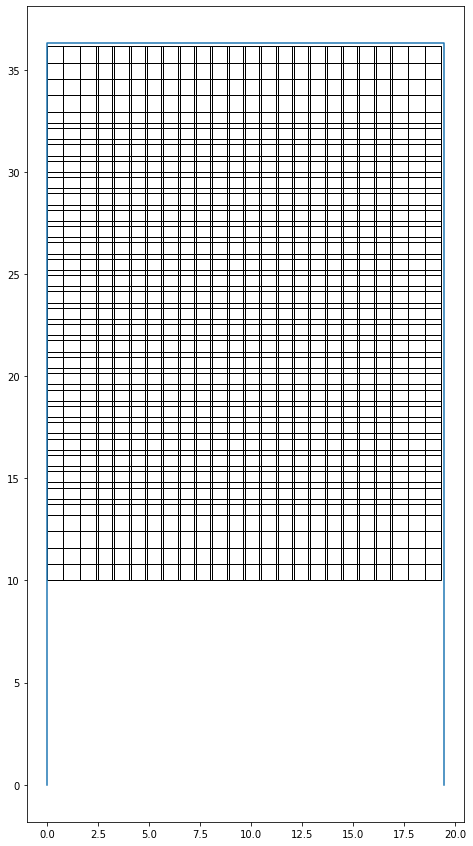

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
8
60
157
187
197
308
324
338
461
465
475
602
612
616
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
8
60
157
187
197
308
324
338
461
465
475
602
612
616
room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
64
203
257
396
439
450
616
632
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
64
203
257
396
439
450
616
632
room dimension (W x H) are [[19.45833333 36.29166667]]
seat dimension (W x H) are [[2.5  3.75]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objecti

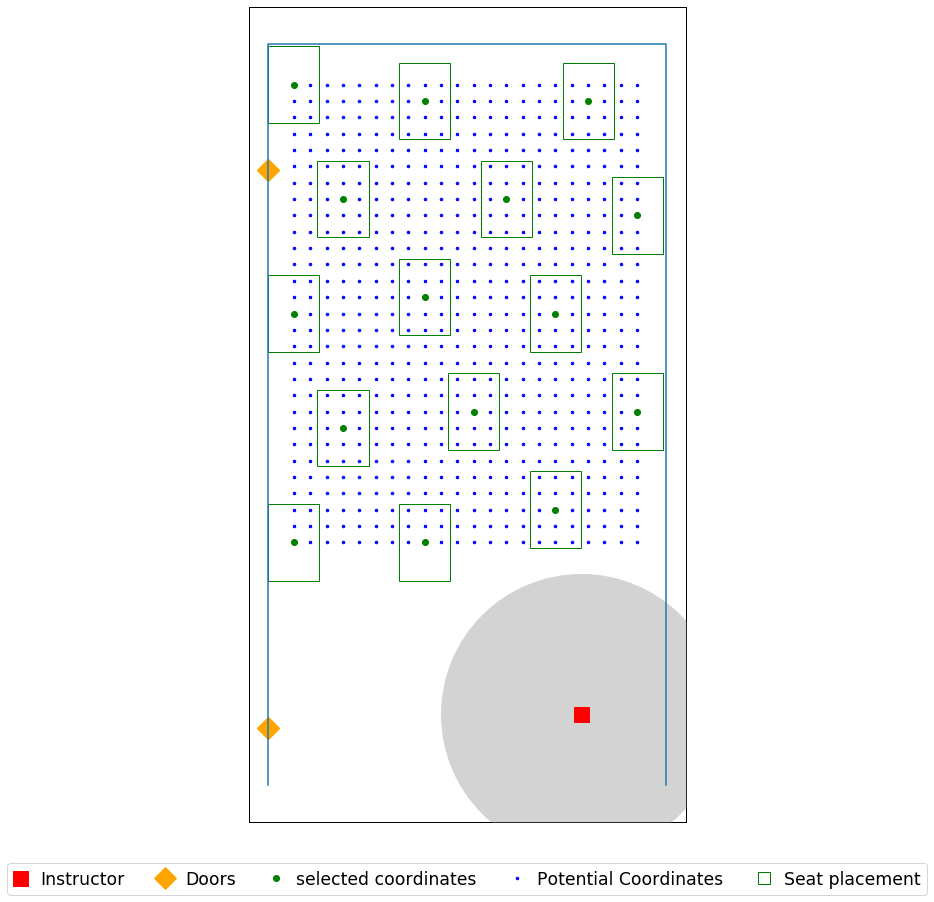

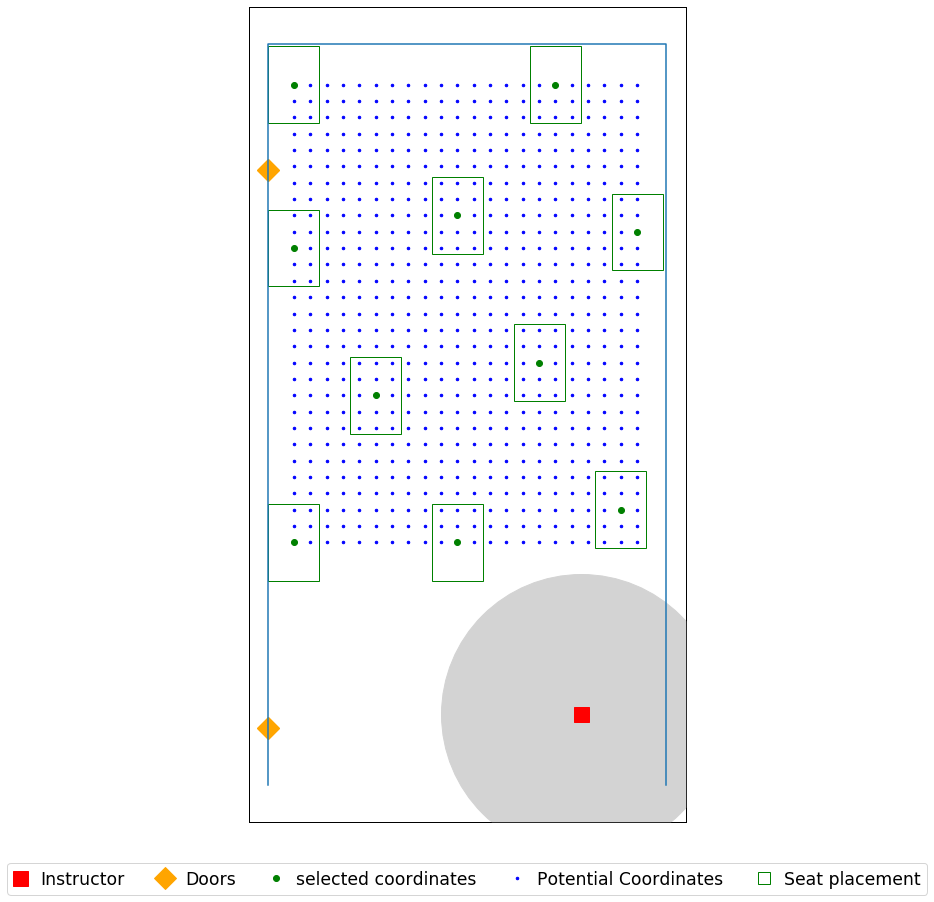

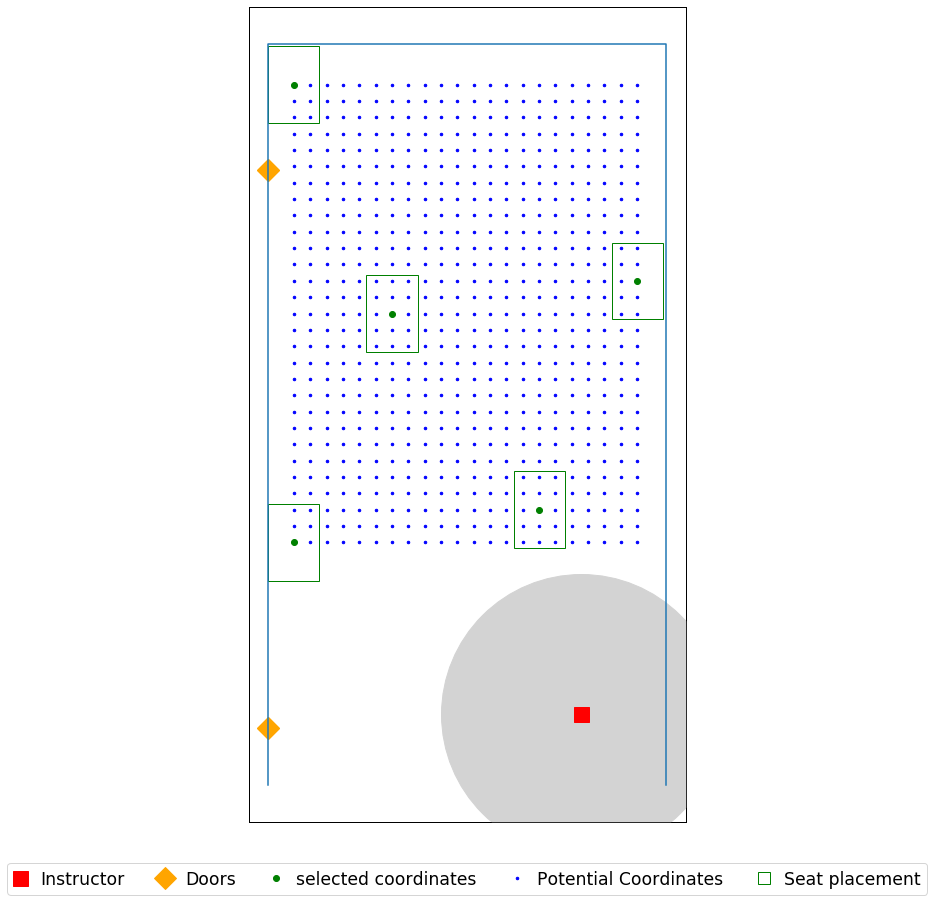

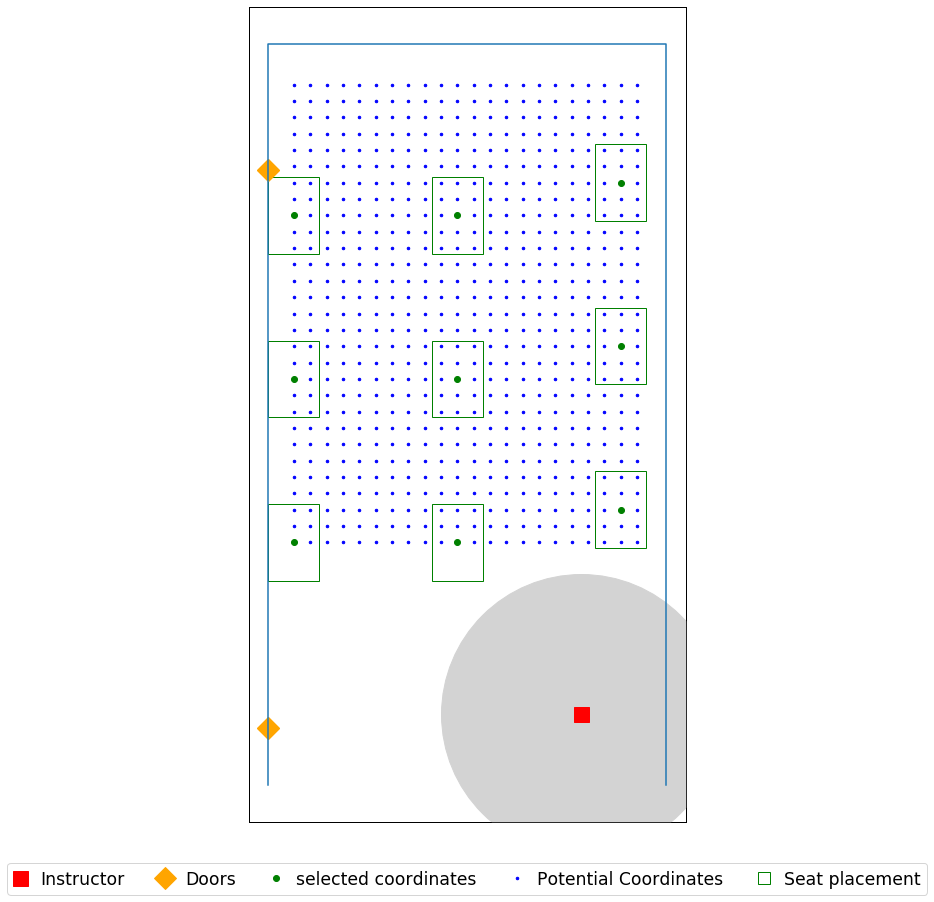

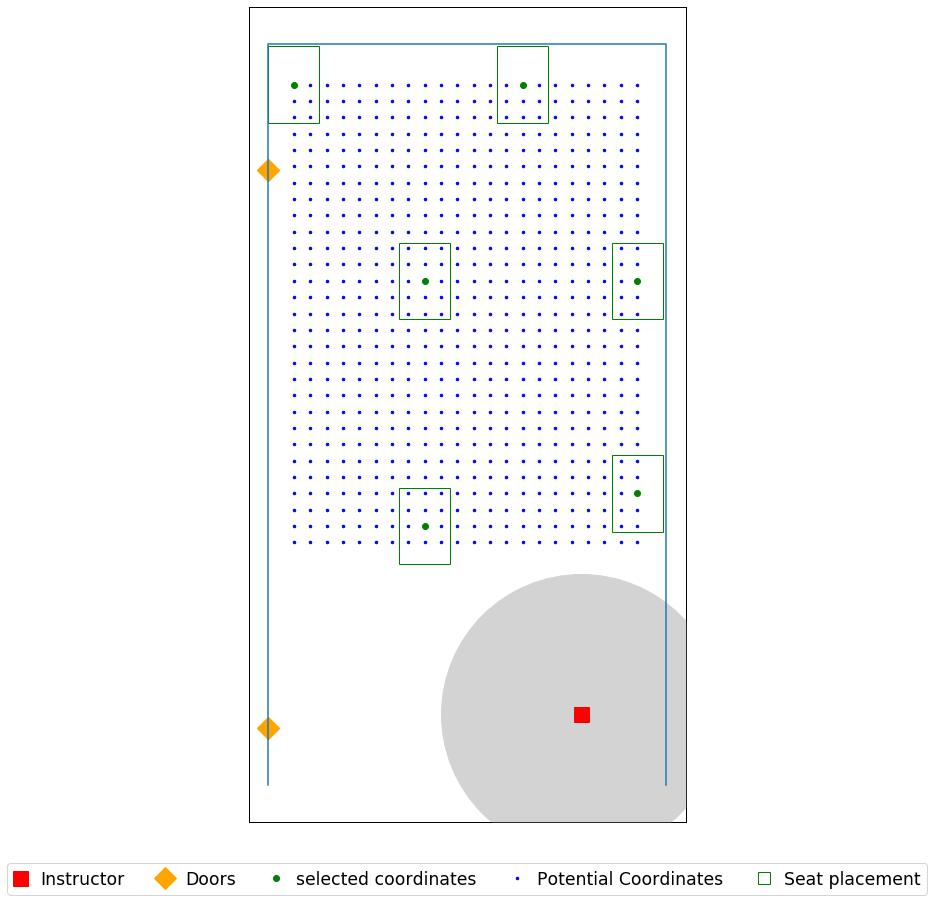

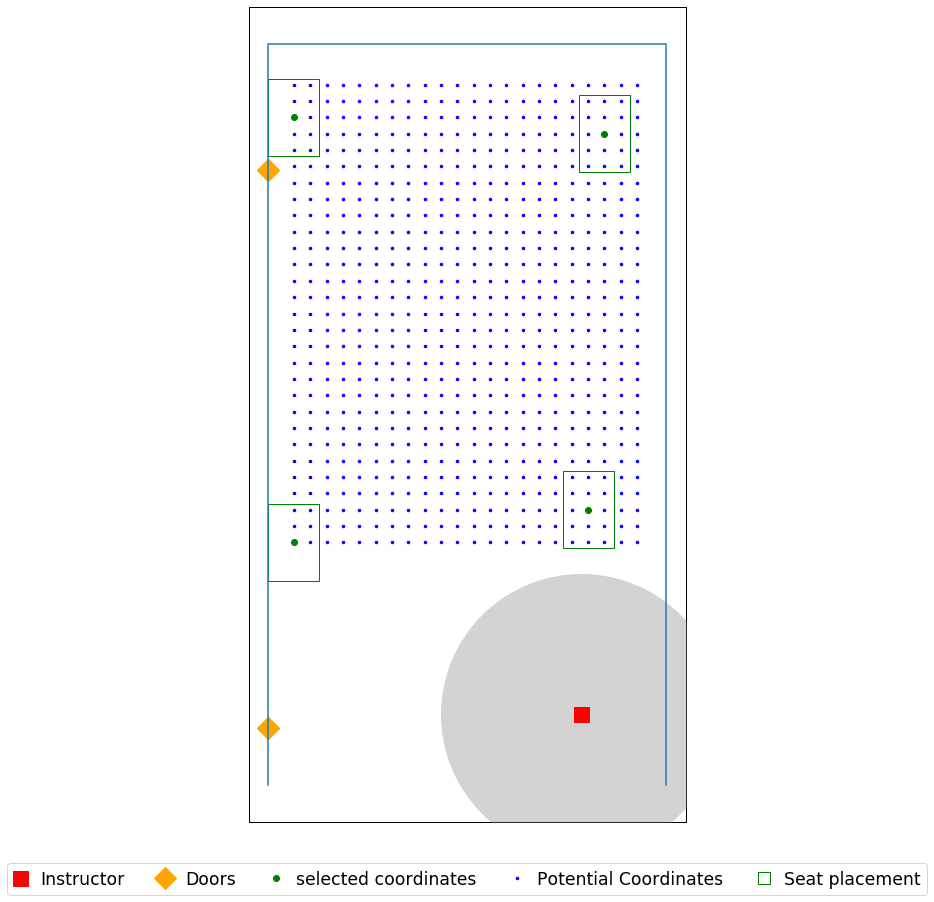

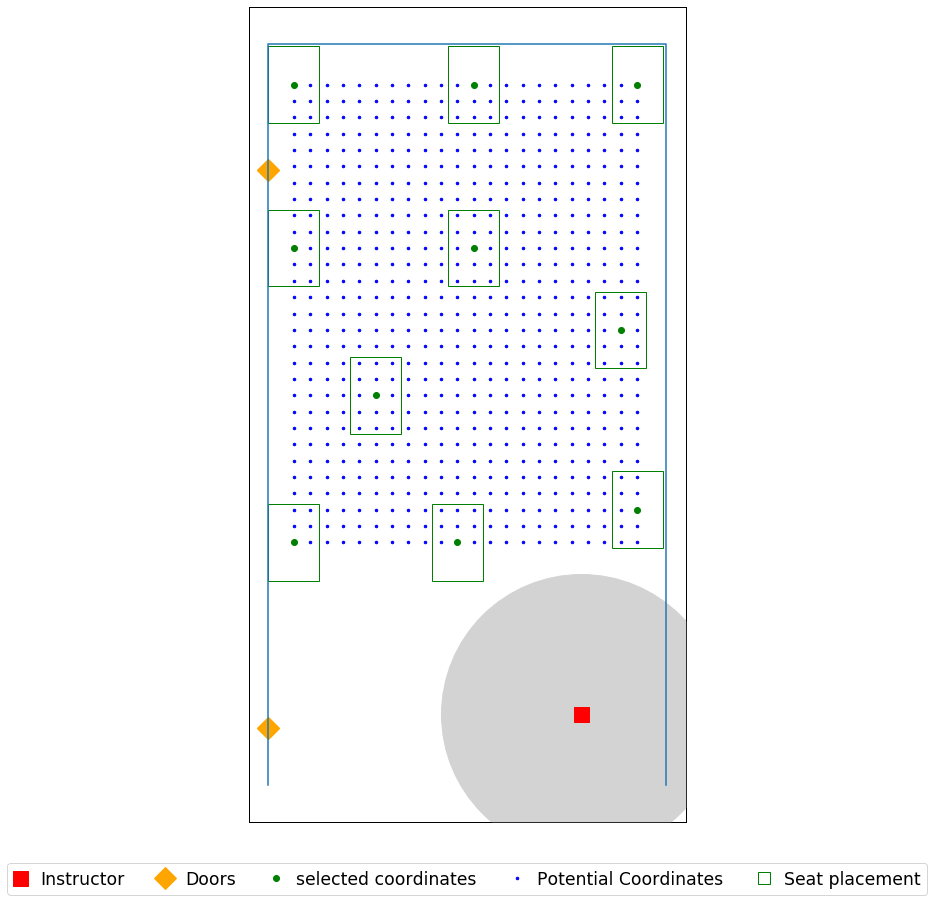

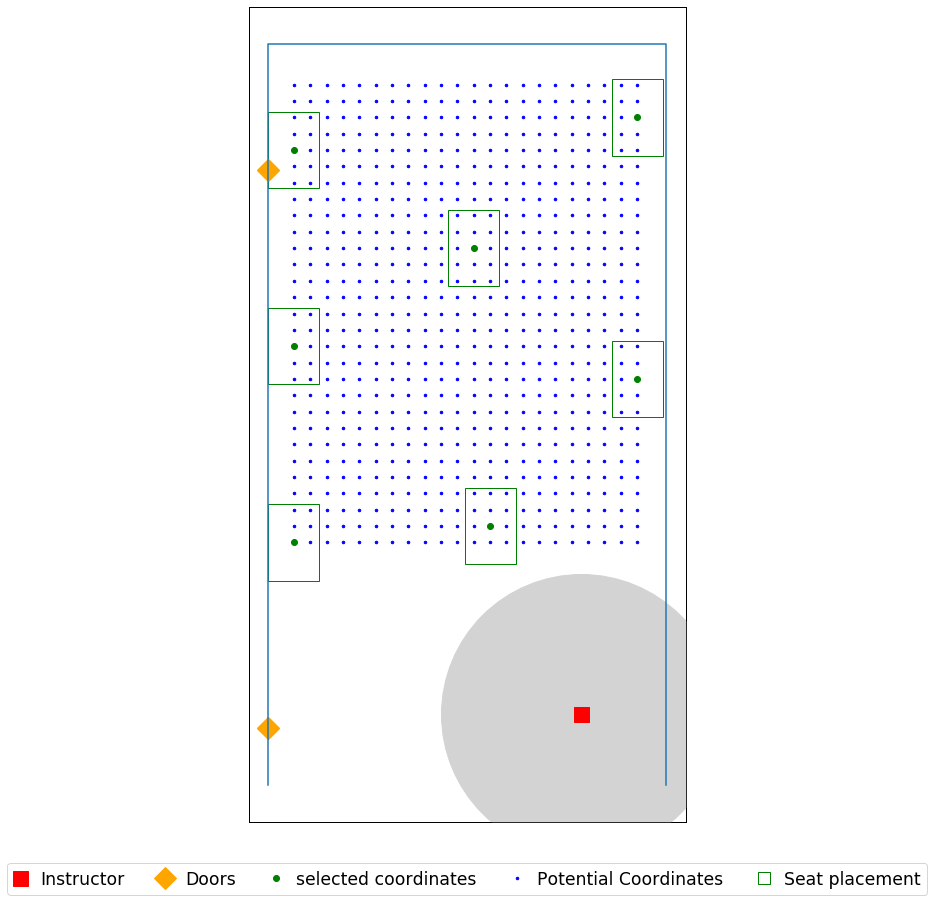

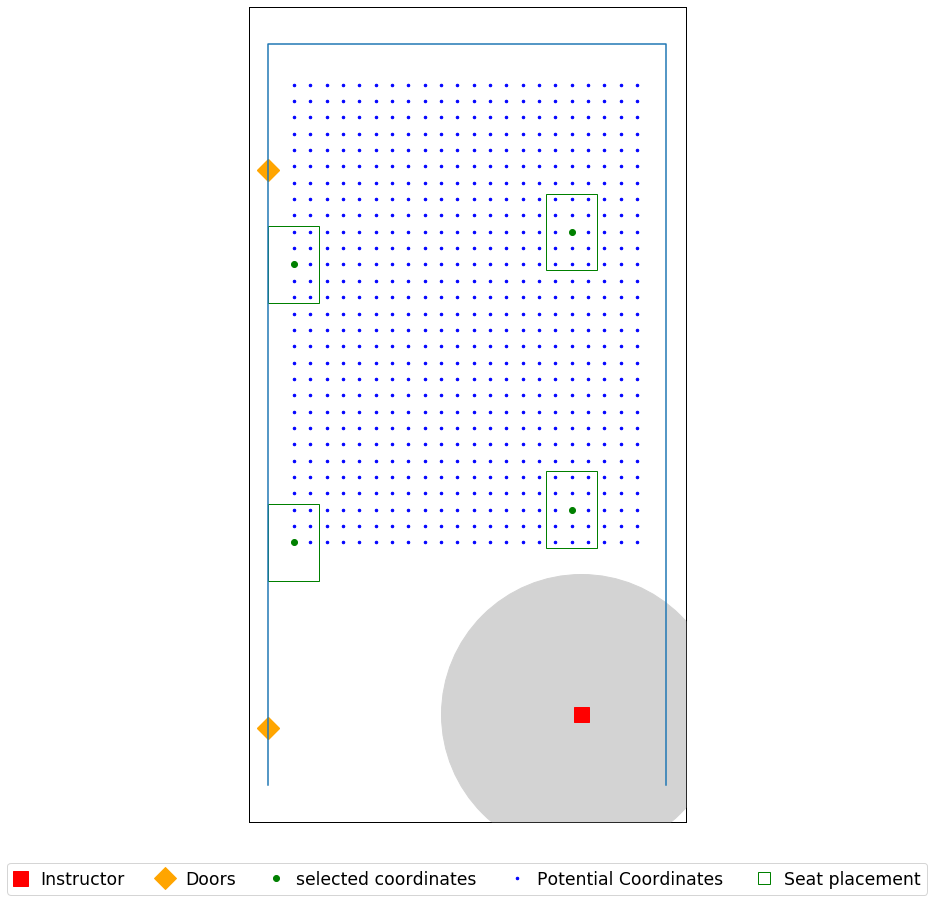

In [50]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\Swann_106\Swann_106_{}ft_SeatR=0ft.csv'.format(j,i), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\Swann_106\Swann_106_{}ft_SeatR=0ft.jpg'.format(j,i), dpi=500)


## Swann 115

In [56]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Swann, Janie Austell 115.xlsx'

Name = 'Smith_115_'

room dimension (W x H) are [[19.45833333 52.125     ]]
seat dimension (W x H) are [[2.5 5. ]]
[[16.79166667  3.58333333]]
[(0, 10), (19.458333333333332, 10), (19.458333333333332, 52.125), (0, 52.125)]
Total number of seats  is 1034


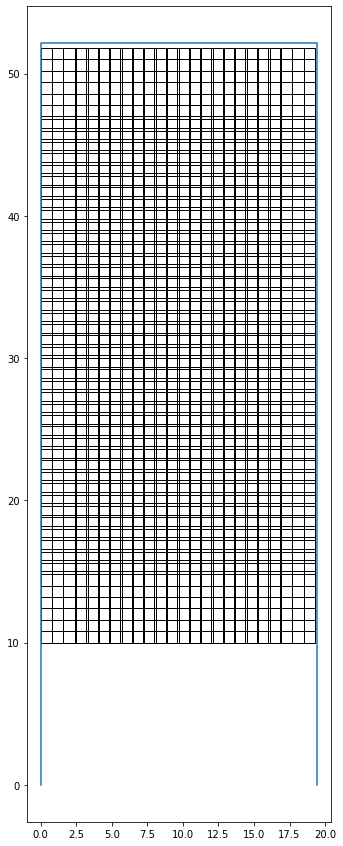

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 24.0
Optimal selection of seats (index):
0
13
109
117
176
190
285
293
352
366
469
483
528
542
645
659
704
718
821
857
880
938
1018
1033
room dimension (W x H) are [[19.45833333 52.125     ]]
seat dimension (W x H) are [[2.5 5. ]]


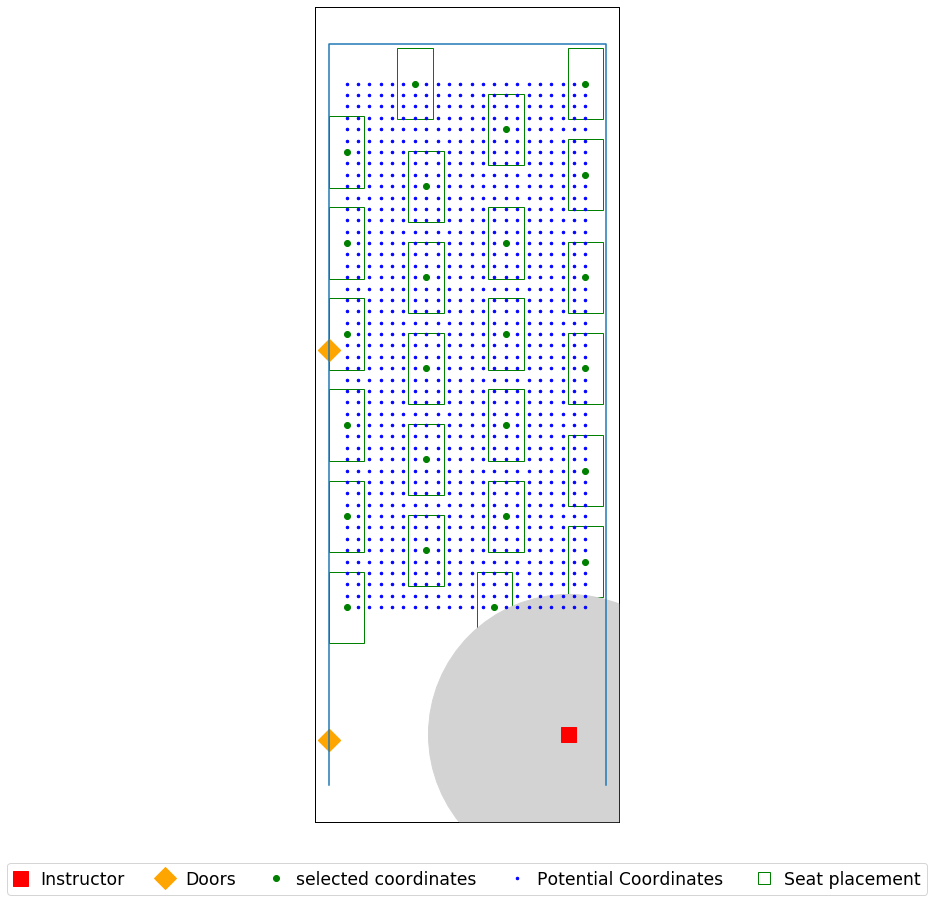

In [58]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Swann_115\Swann_115_{}ft_SeatR=0ft.csv'.format(i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\Swann_115\Swann_115_{}ft_SeatR=0ft.jpg'.format(i), dpi=500)
    

room dimension (W x H) are [[19.45833333 52.125     ]]
seat dimension (W x H) are [[2.5  3.75]]
[[16.79166667  3.58333333]]
[(0, 10), (19.458333333333332, 10), (19.458333333333332, 52.125), (0, 52.125)]
Total number of seats  is 1056


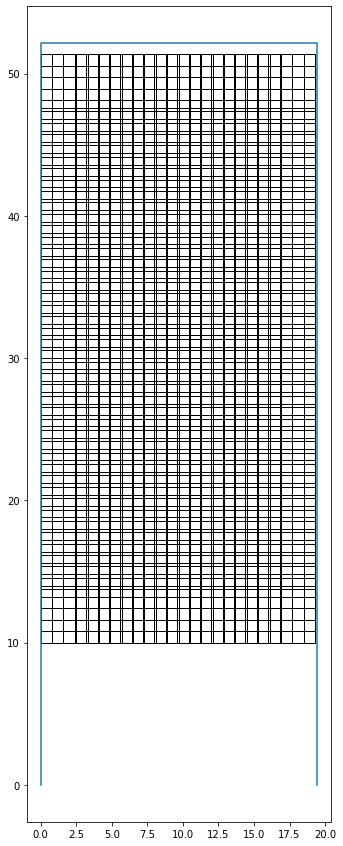

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 25.0
Optimal selection of seats (index):
3
11
87
154
168
227
285
330
344
403
461
506
519
623
637
682
696
799
813
858
872
975
989
1034
1048
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 25.0
Optimal selection of seats (index):
3
11
87
154
168
227
285
330
344
403
461
506
519
623
637
682
696
799
813
858
872
975
989
1034
1048
room dimension (W x H) are [[19.45833333 52.125     ]]
seat dimension (W x H) are [[2.5  3.75]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
12
131
182
352
373
385
572
592
604
793
825
835
1034
1044
1054
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
12
131
182
352
373
385
572
592
604
793
825
835
1034
1044
1054
room dimension (W x H) are [[19.45833333 52.125   

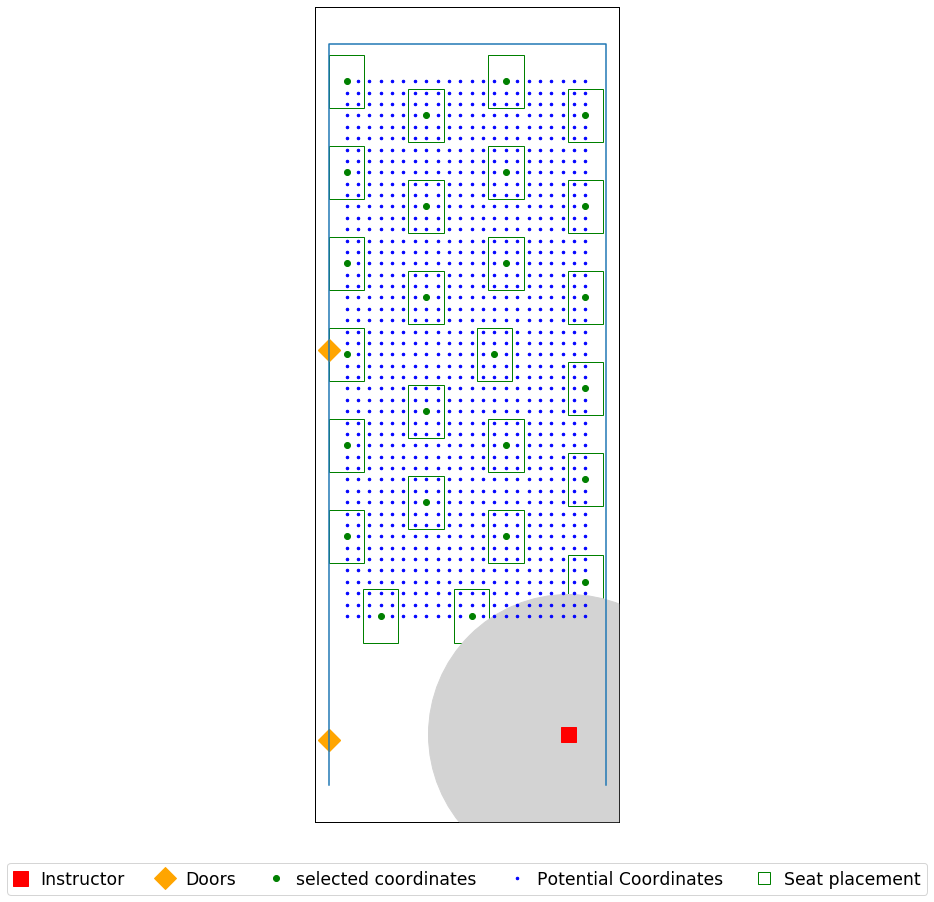

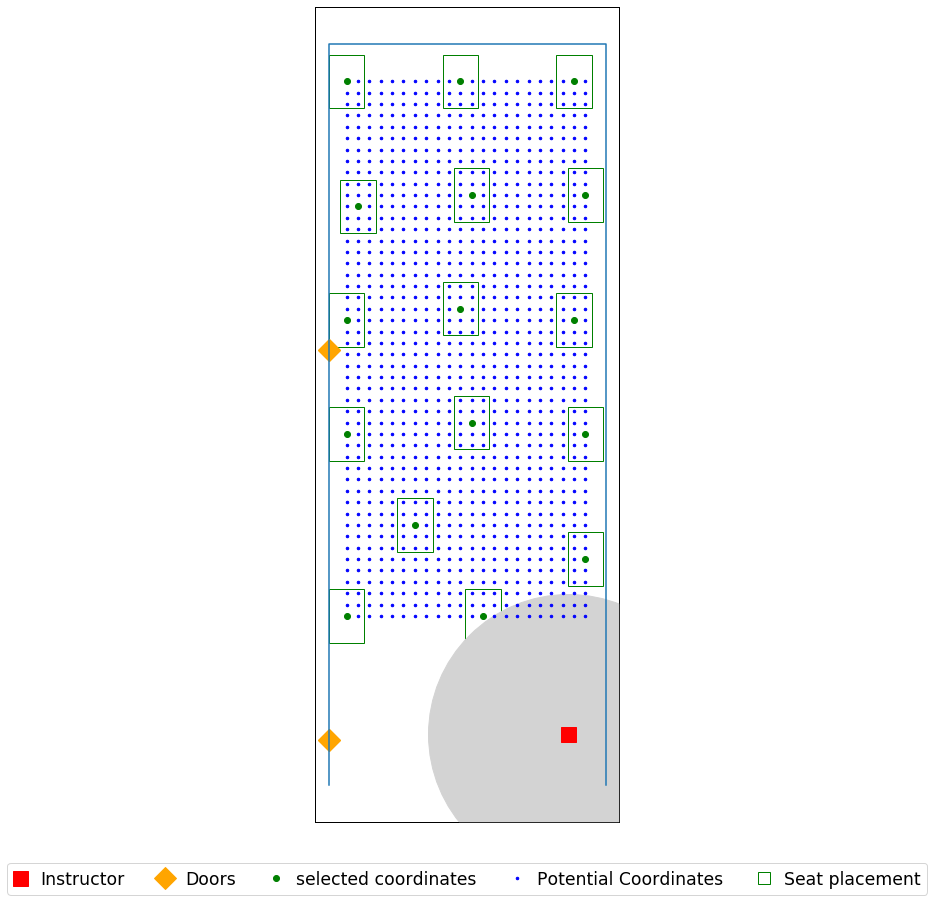

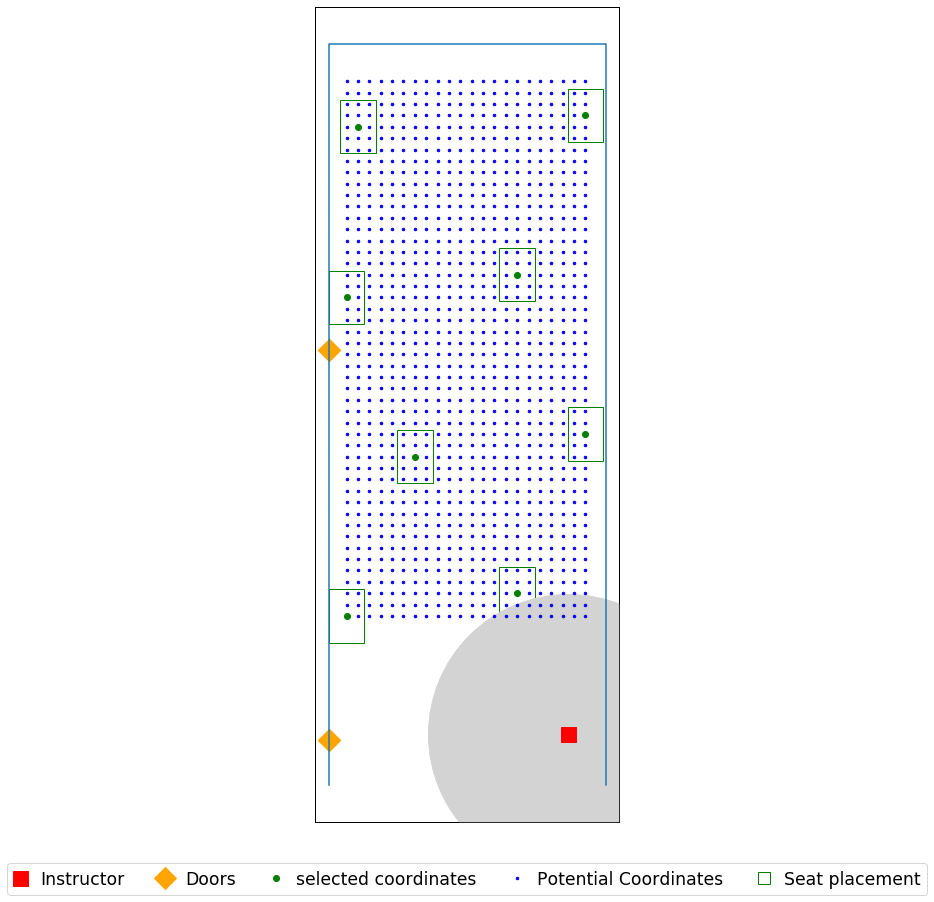

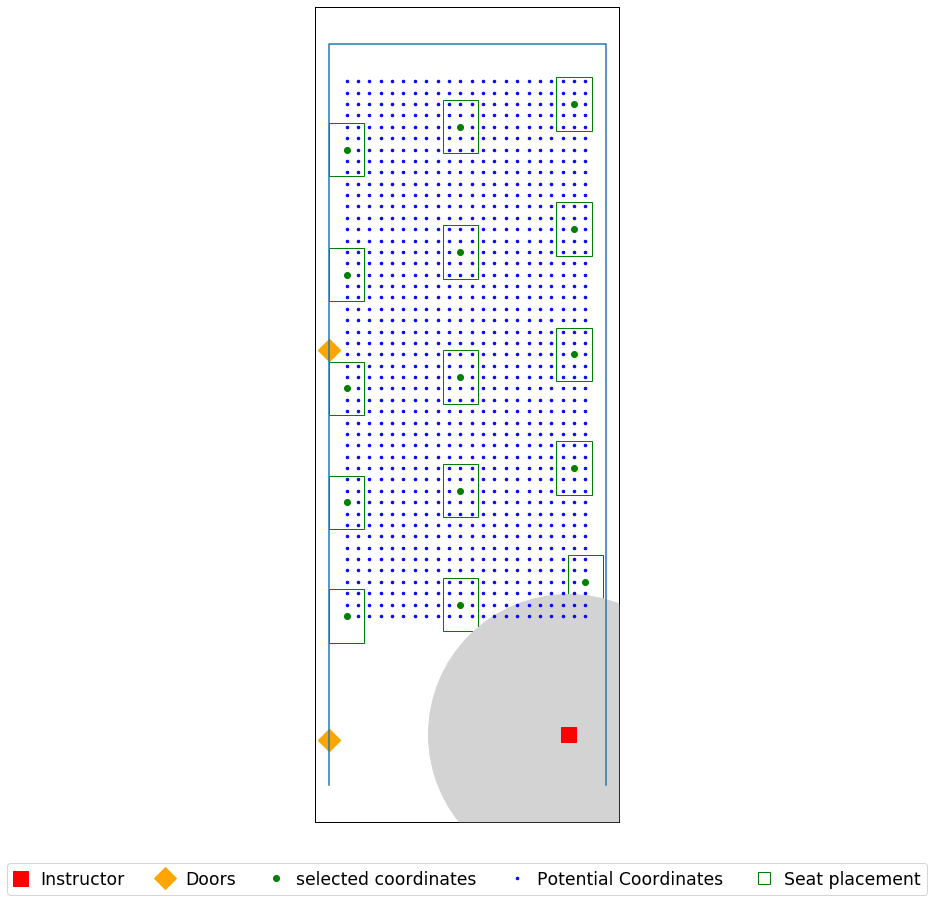

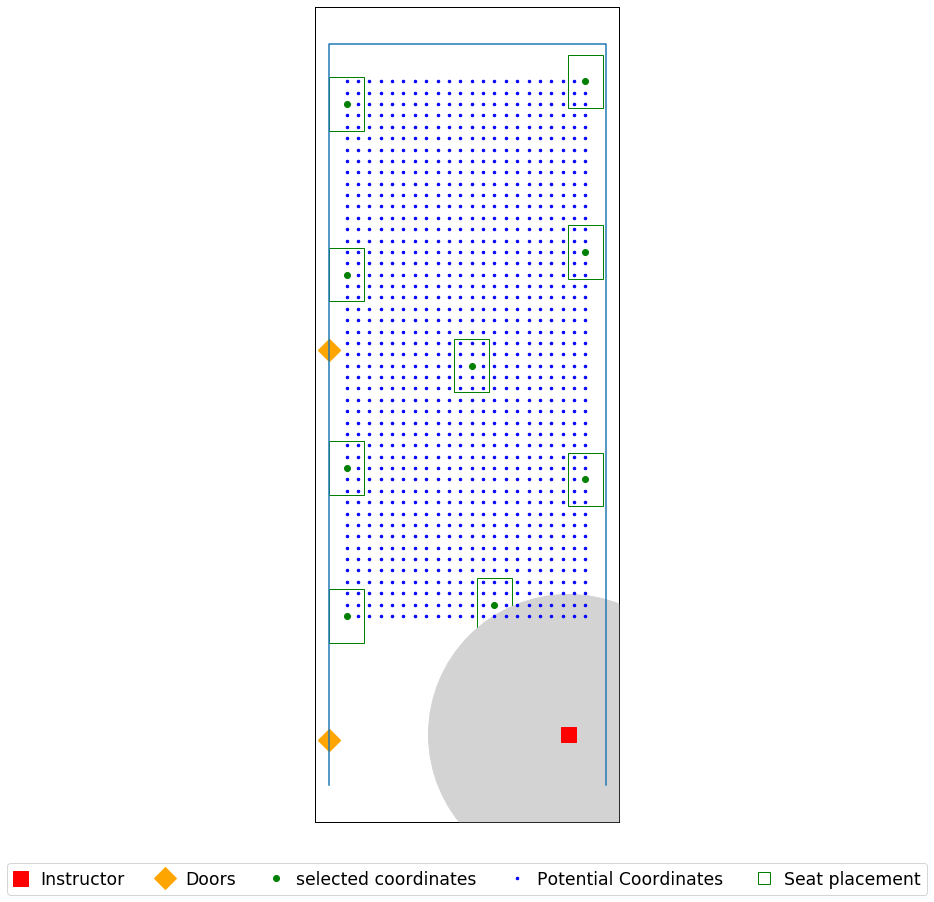

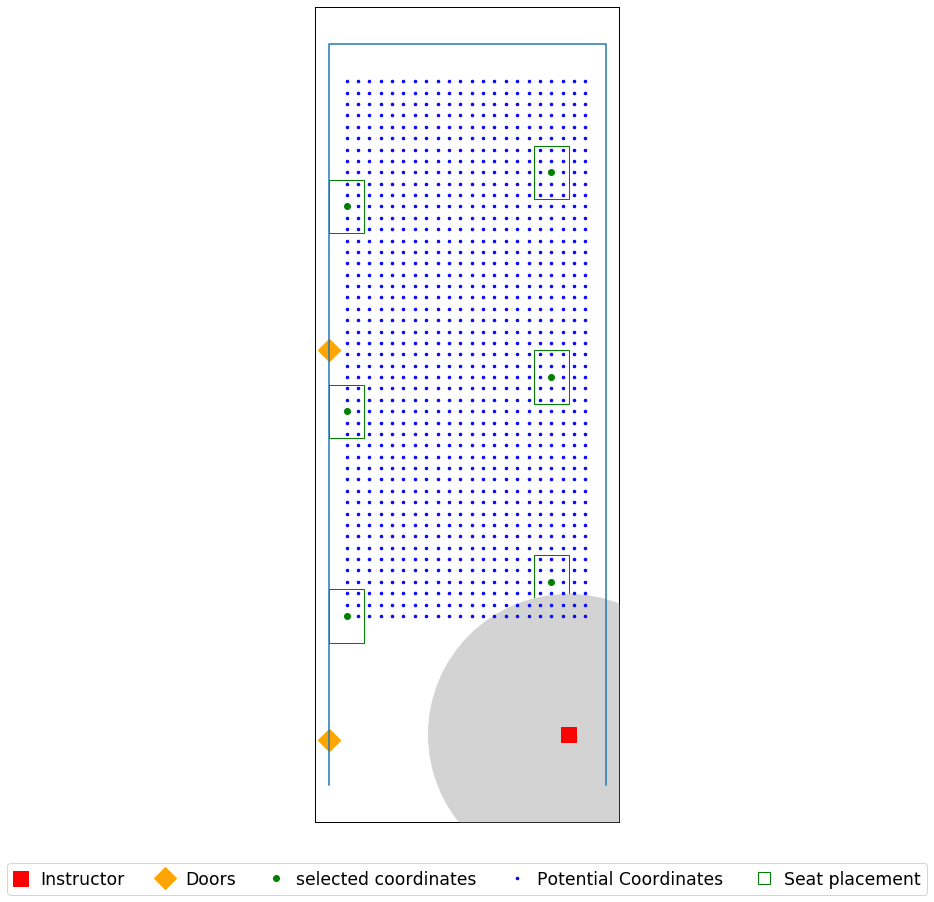

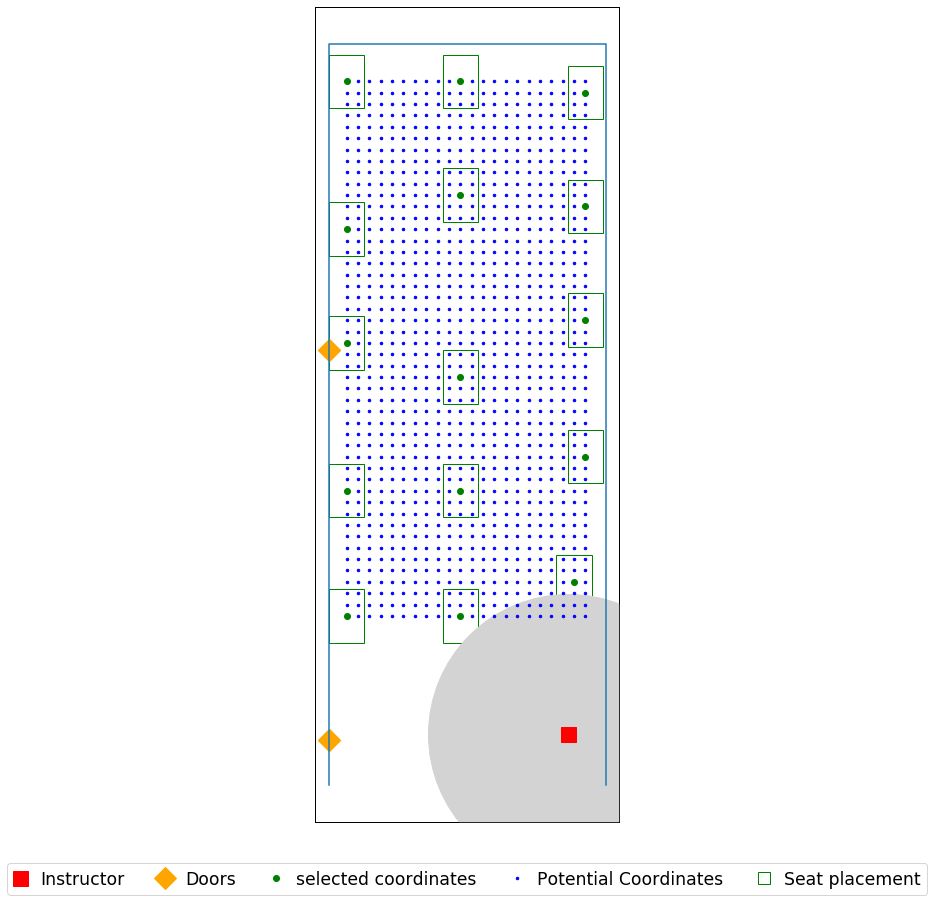

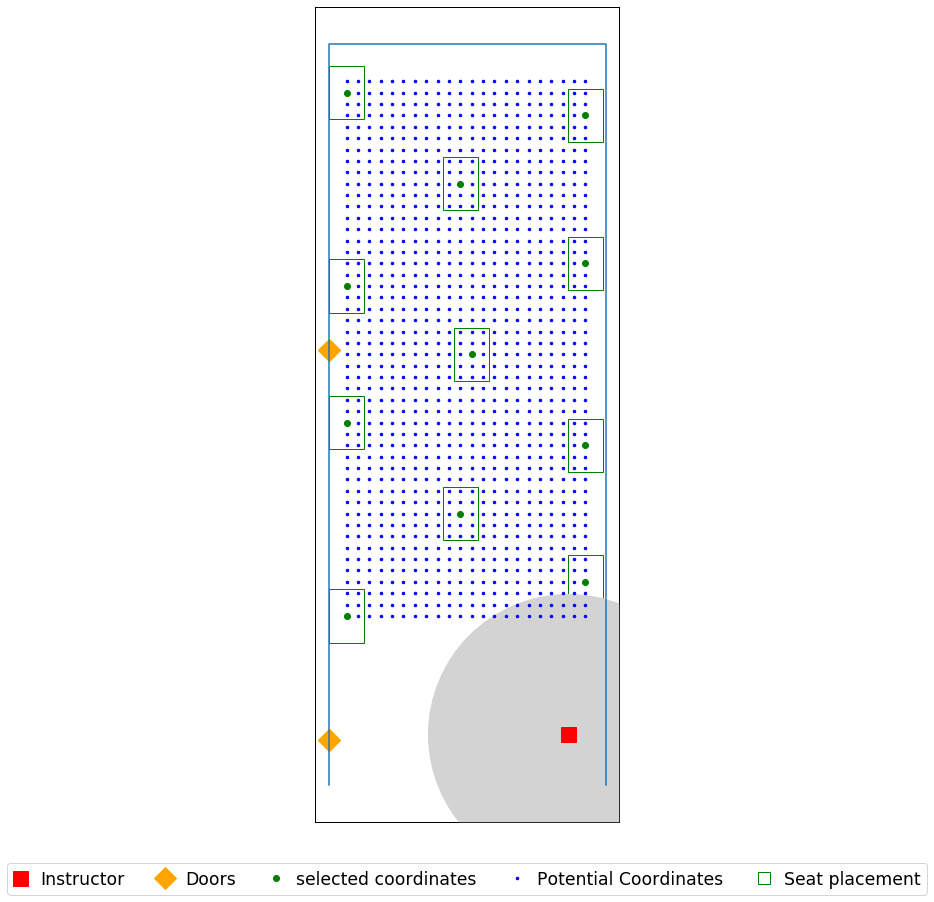

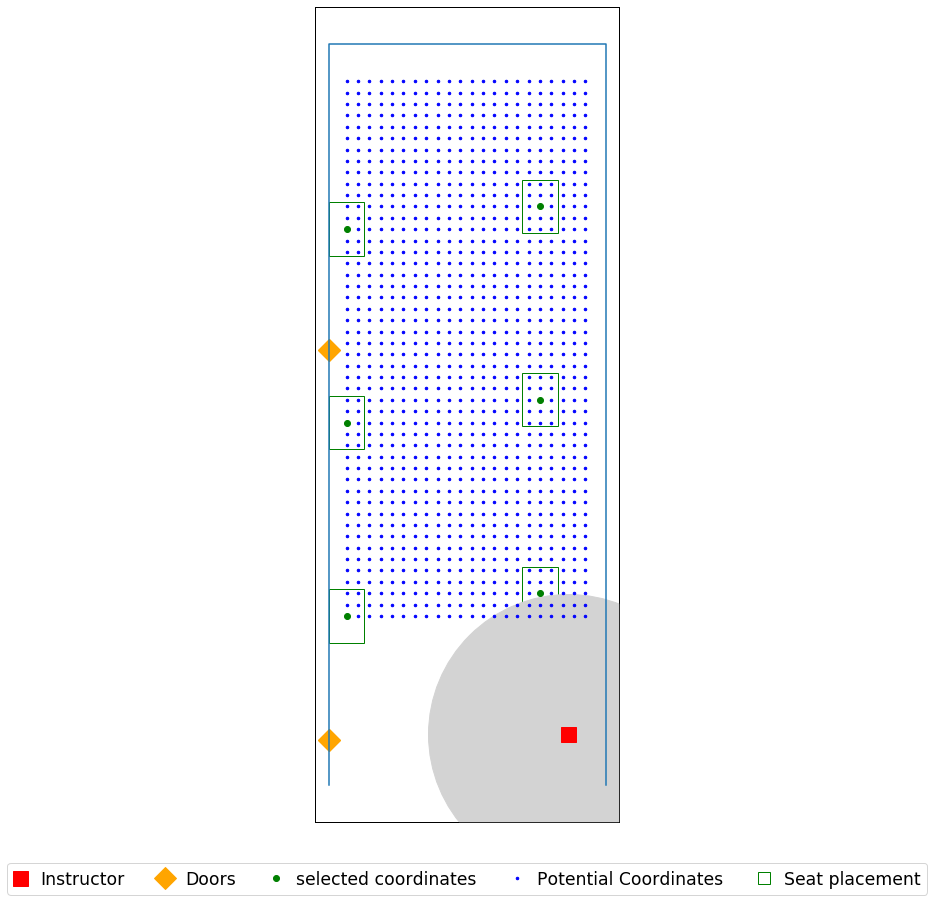

In [52]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\Swann_115\Swann_115_{}ft_SeatR=0ft.csv'.format(j,i), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\Swann_115\Swann_115_{}ft_SeatR=0ft.jpg'.format(j,i), dpi=500)


## Swann 325

In [63]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Swann, Janie Austell 325.xlsx'

Name = 'Swann_325'

room dimension (W x H) are [[27.95833333 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
[[25.29166667 18.5       ]]
[(0, 10), (27.958333333333332, 10), (27.958333333333332, 25.75), (0, 25.75)]
Total number of seats  is 544


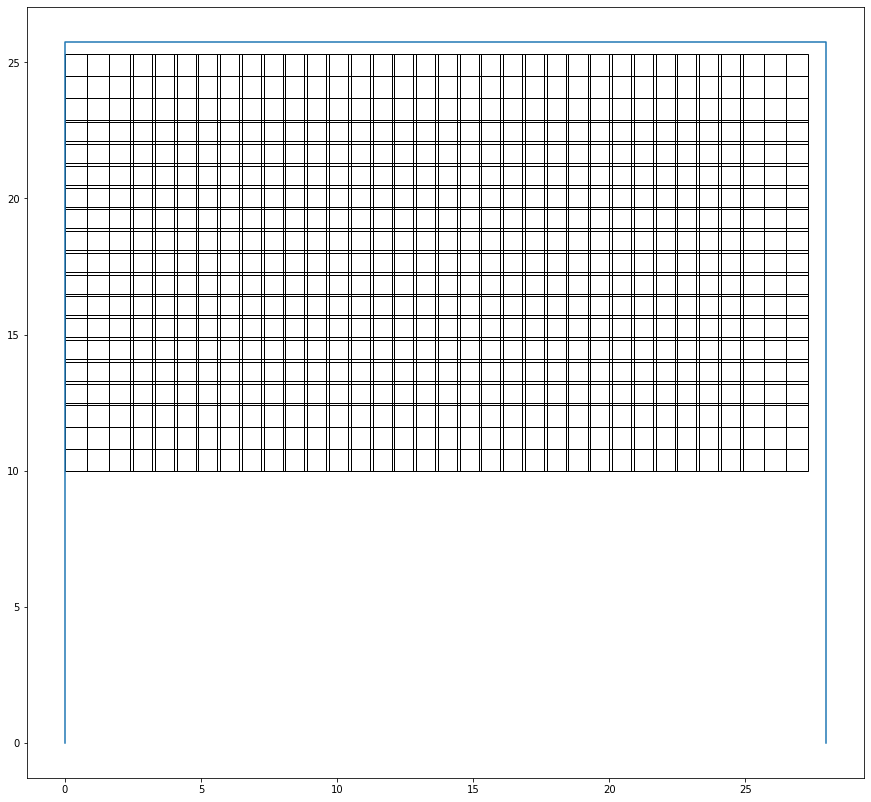

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
13
21
241
256
264
512
523
531
room dimension (W x H) are [[27.95833333 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]


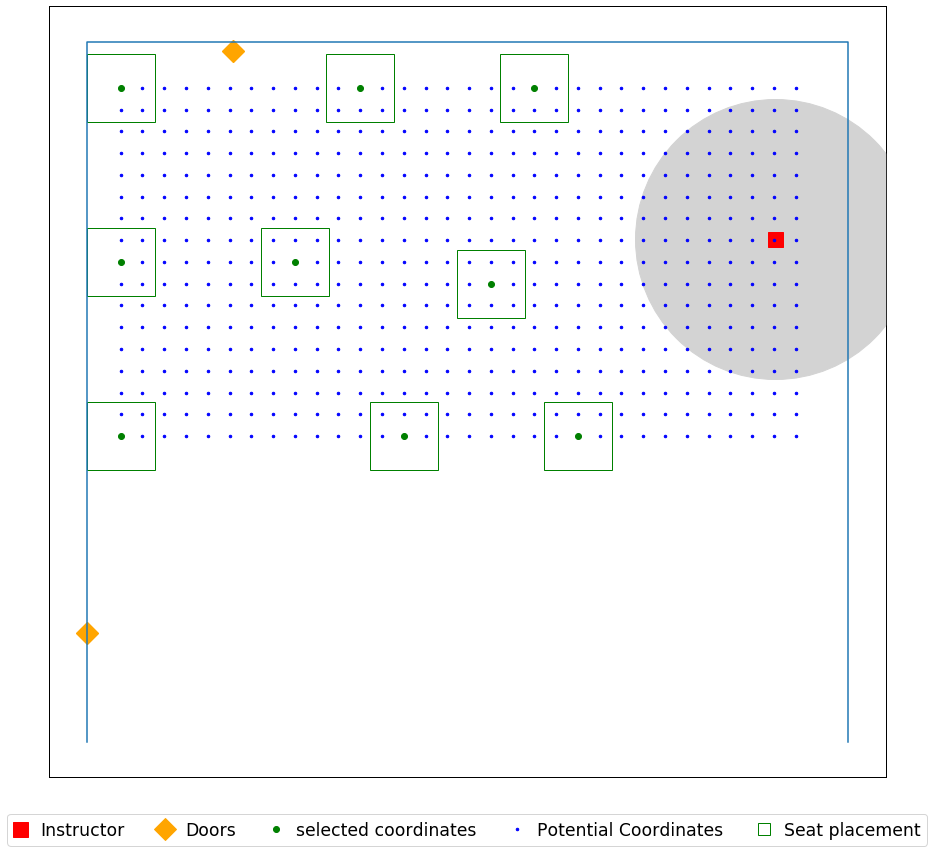

In [64]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[27.95833333 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
[[25.29166667 18.5       ]]
[(0, 10), (27.958333333333332, 10), (27.958333333333332, 25.75), (0, 25.75)]
Total number of seats  is 544


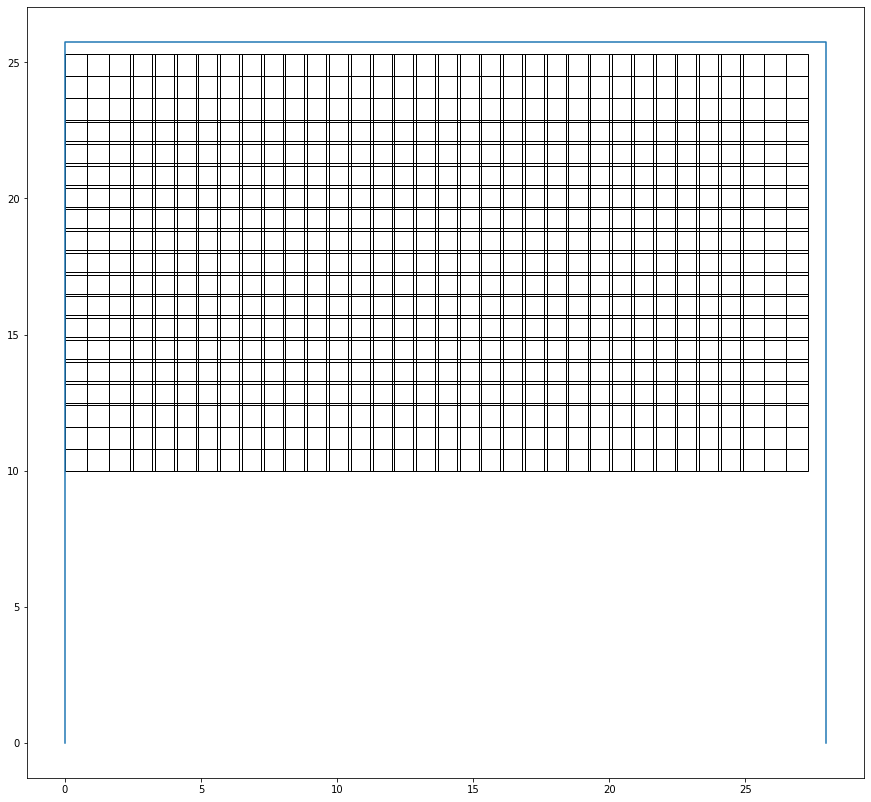

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
13
21
241
256
264
512
523
531
room dimension (W x H) are [[27.95833333 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
10
20
328
512
530
room dimension (W x H) are [[27.95833333 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
0
19
512
531
room dimension (W x H) are [[27.95833333 25.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
0
10
20
320
330
room dimension (W x H) are [[27.95833333 25.75      ]]
s

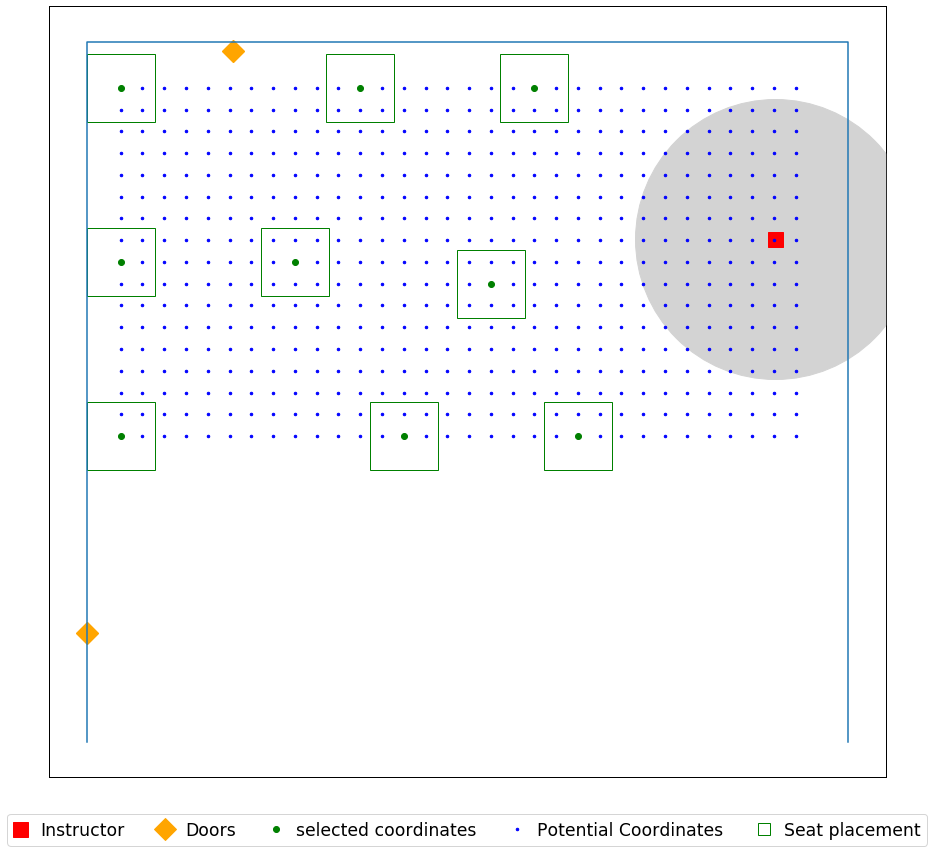

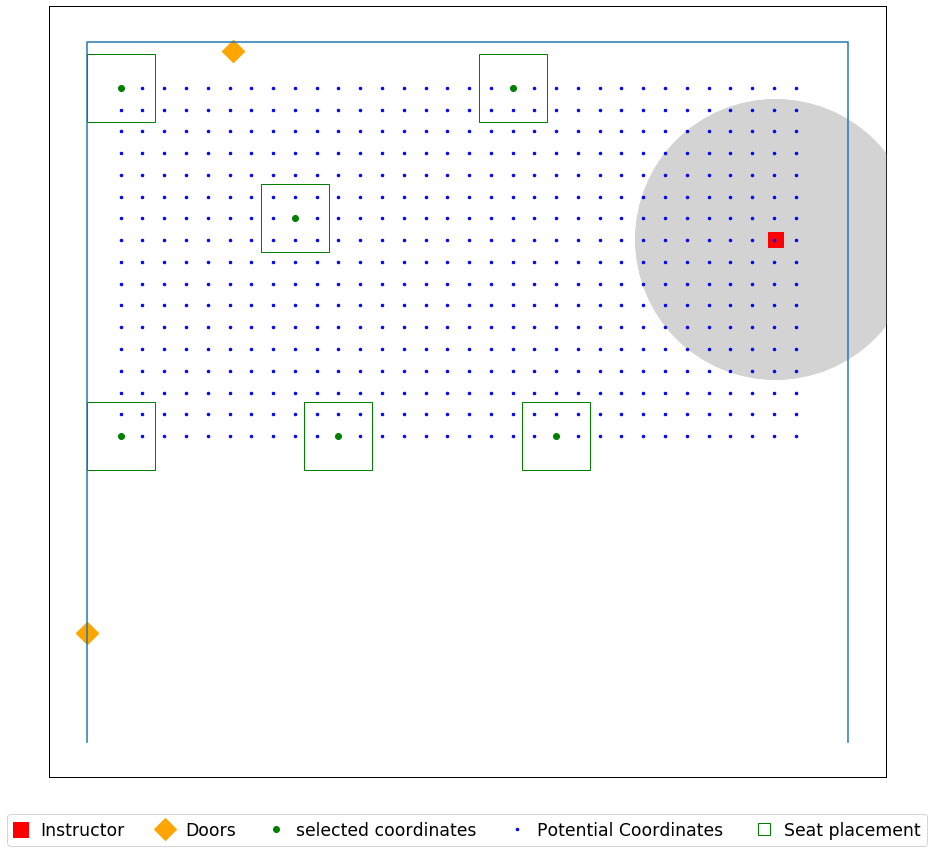

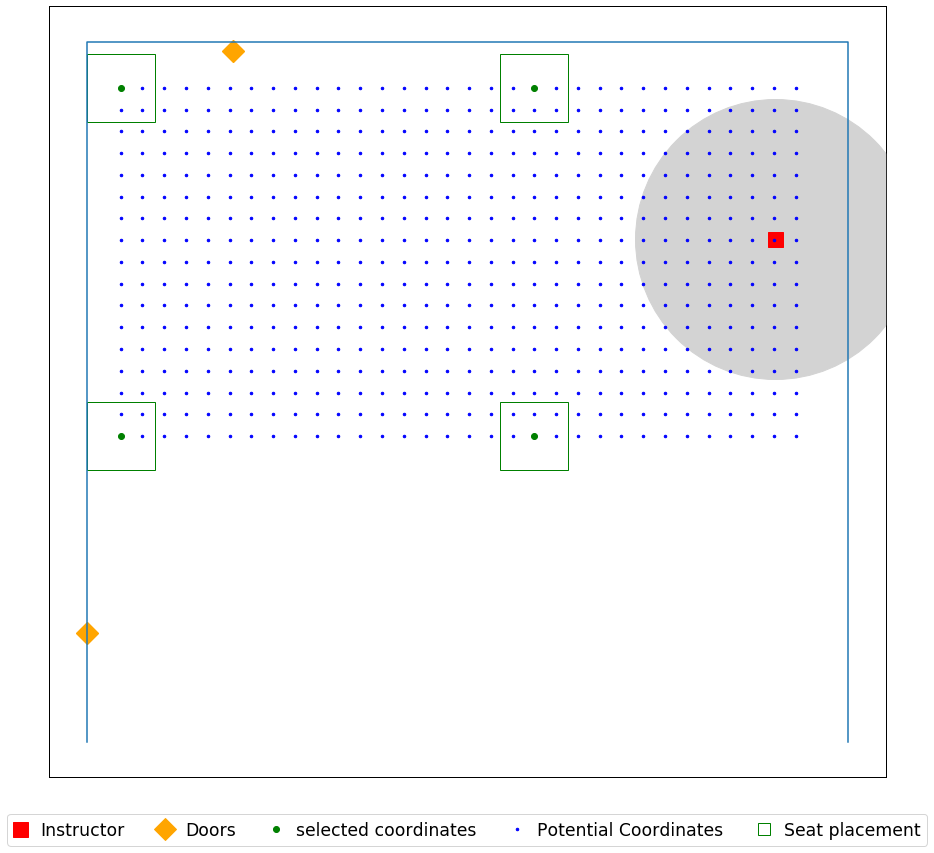

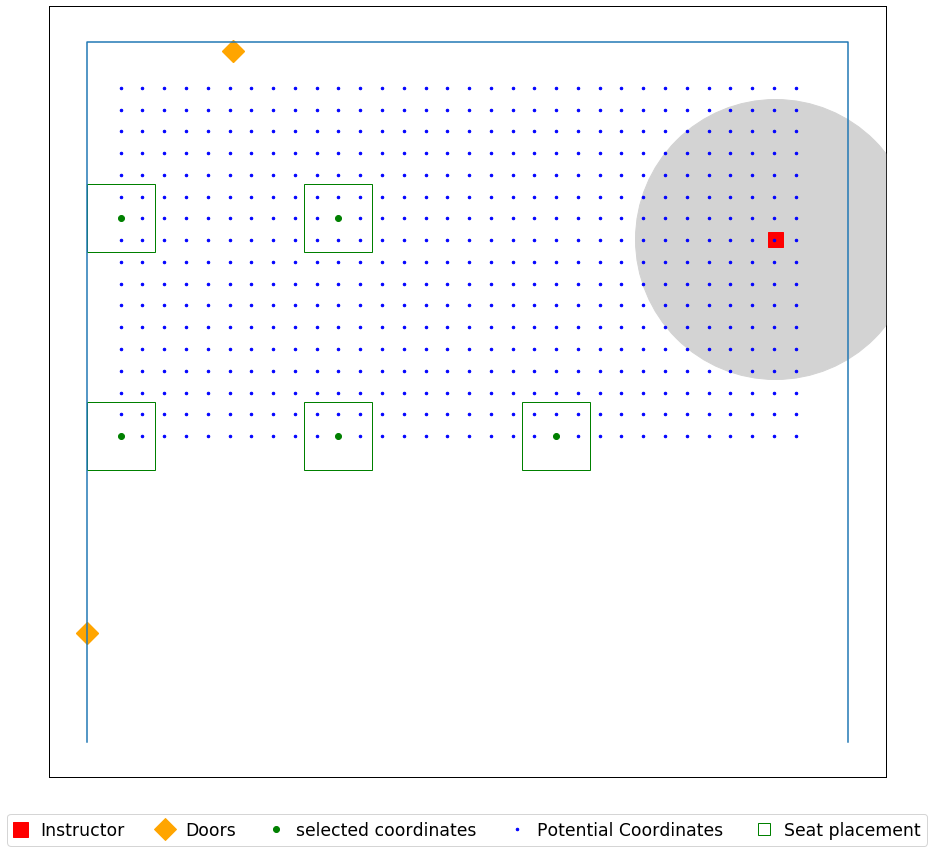

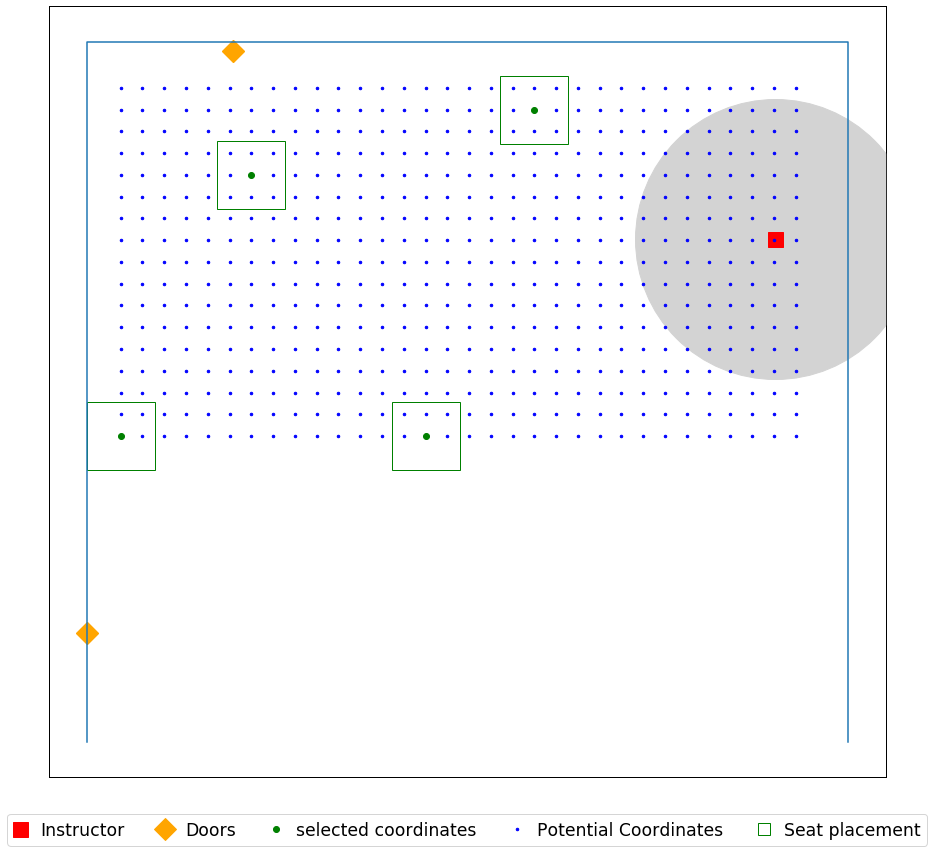

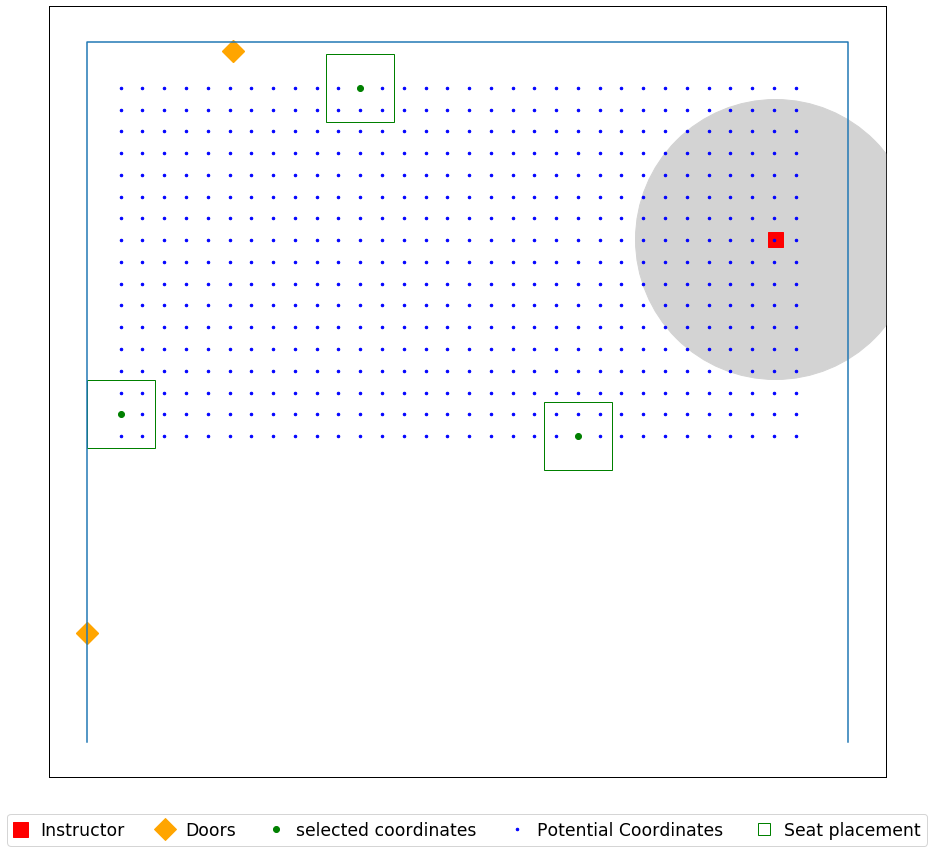

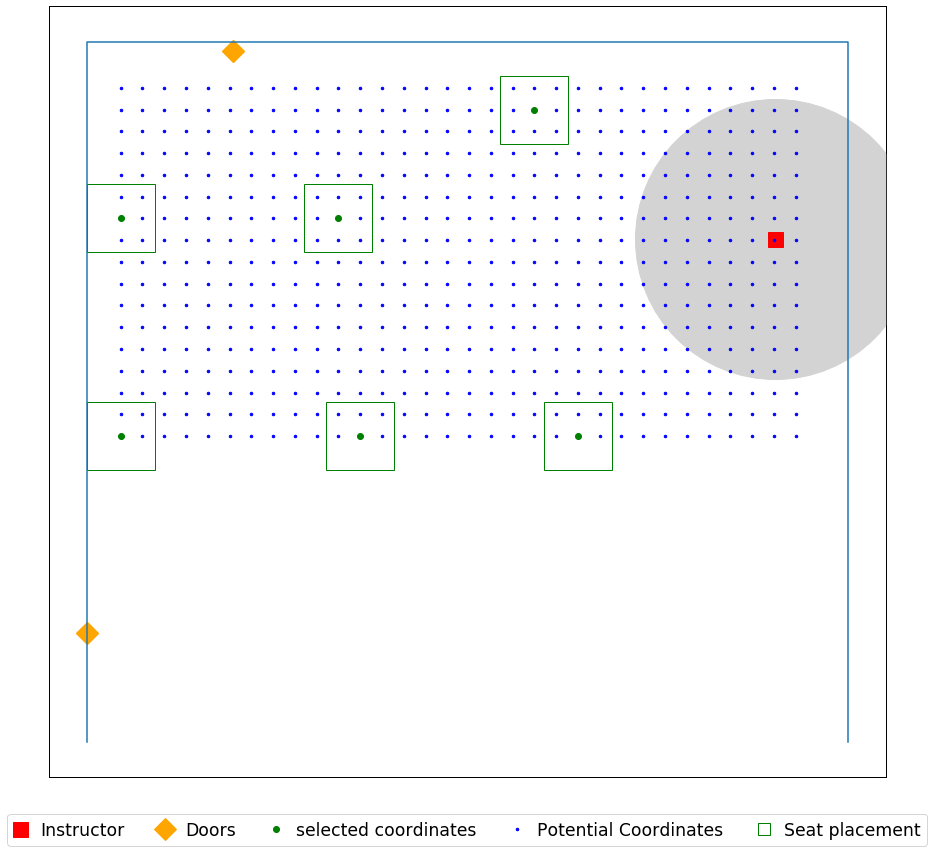

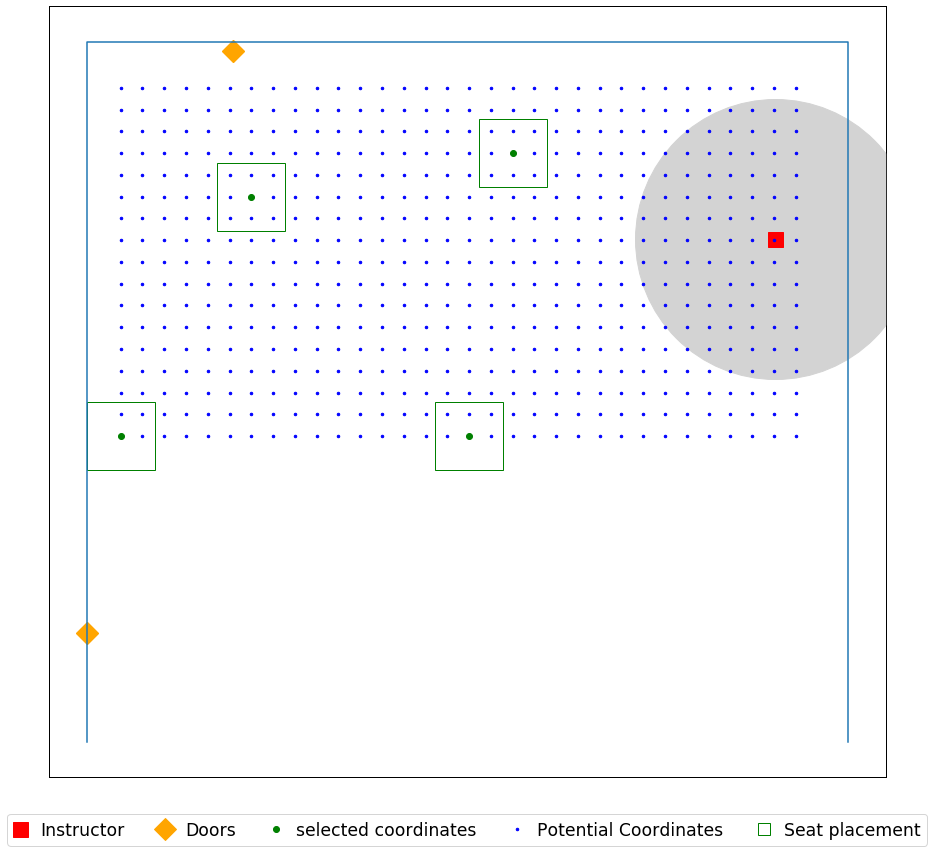

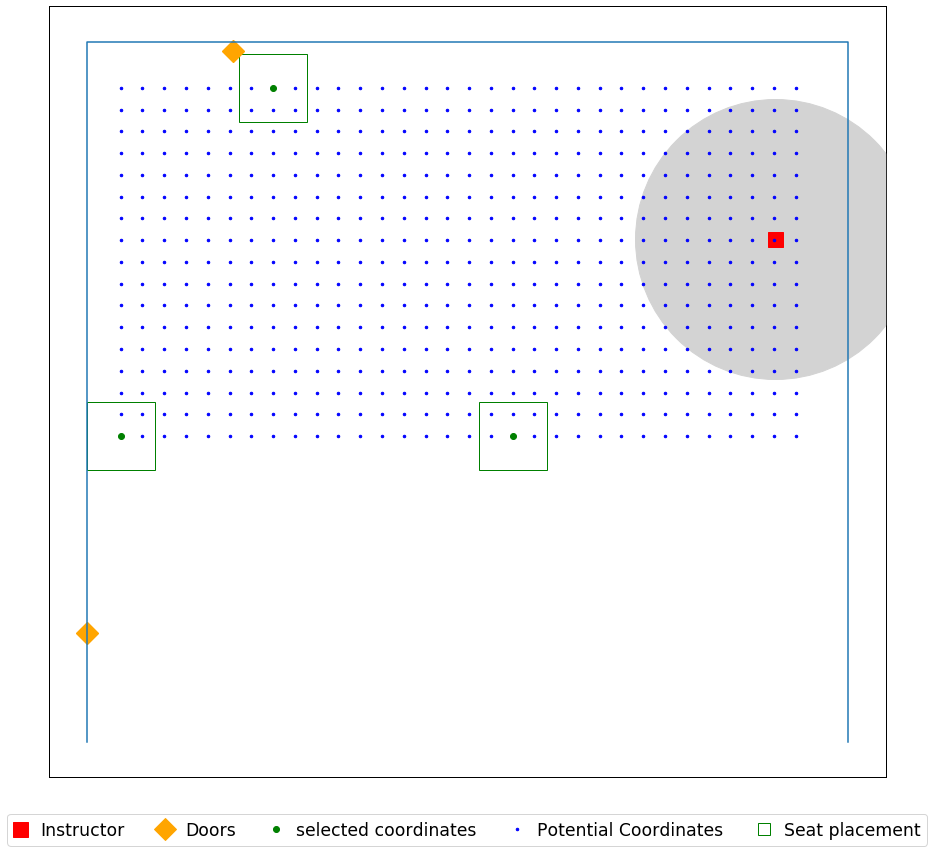

In [65]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Howey S204

In [66]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Howey S204.xlsx'

Name = 'Howey_S204'

room dimension (W x H) are [[28.66666667 23.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
[[25.91666667  3.25      ]]
[(0, 10), (28.666666666666668, 10), (28.666666666666668, 23.75), (0, 23.75)]
Total number of seats  is 495


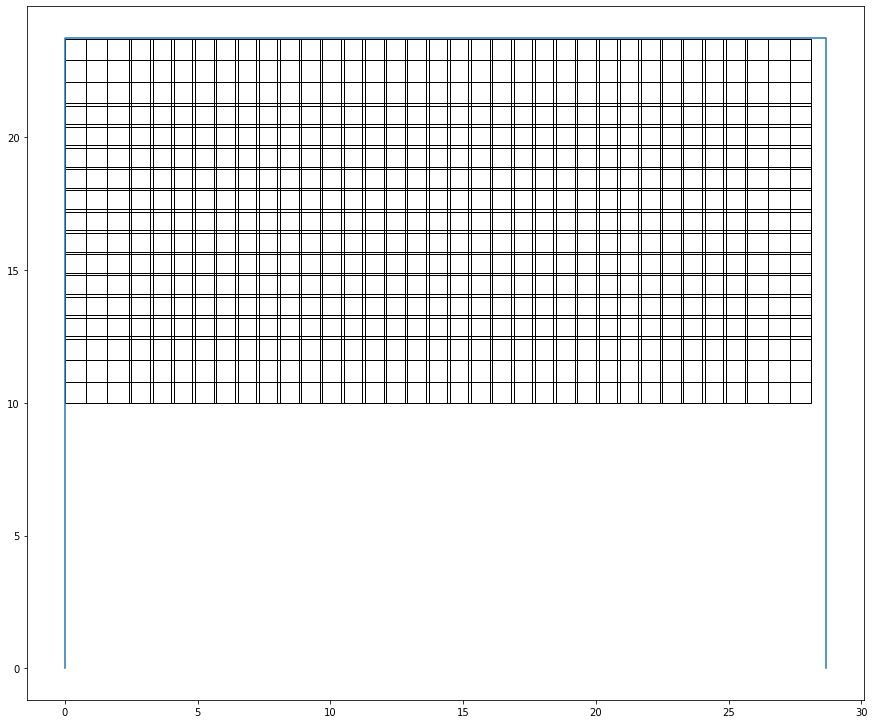

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
0
8
16
57
131
234
242
250
453
462
470
478
494
room dimension (W x H) are [[28.66666667 23.75      ]]
seat dimension (W x H) are [[2.5 2.5]]


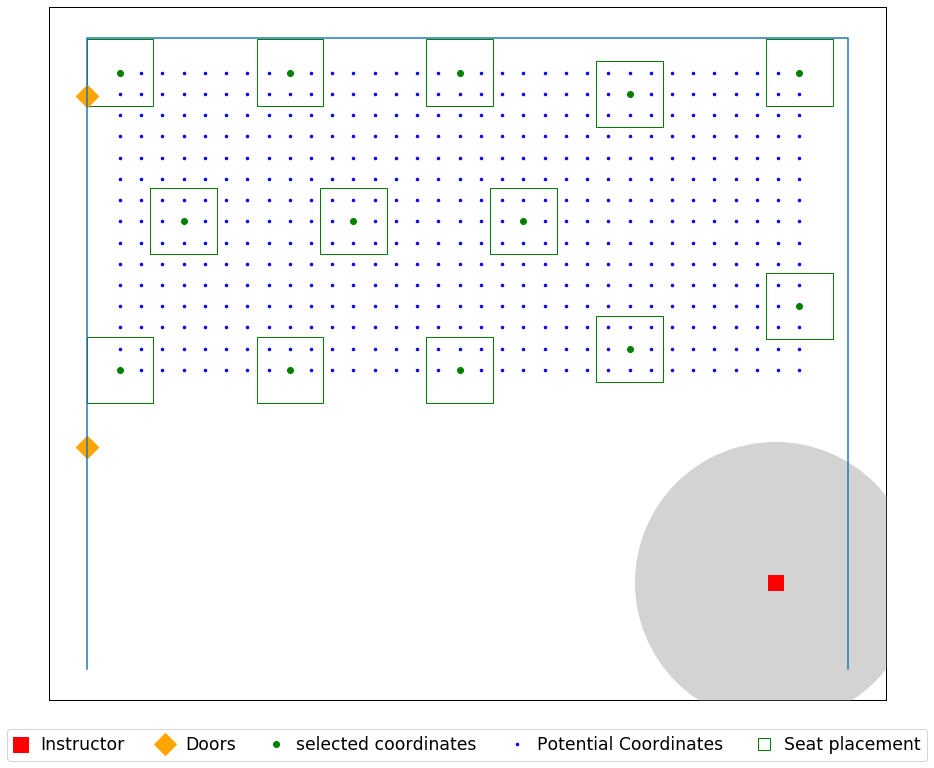

In [67]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[28.66666667 23.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
[[25.91666667  3.25      ]]
[(0, 10), (28.666666666666668, 10), (28.666666666666668, 23.75), (0, 23.75)]
Total number of seats  is 495


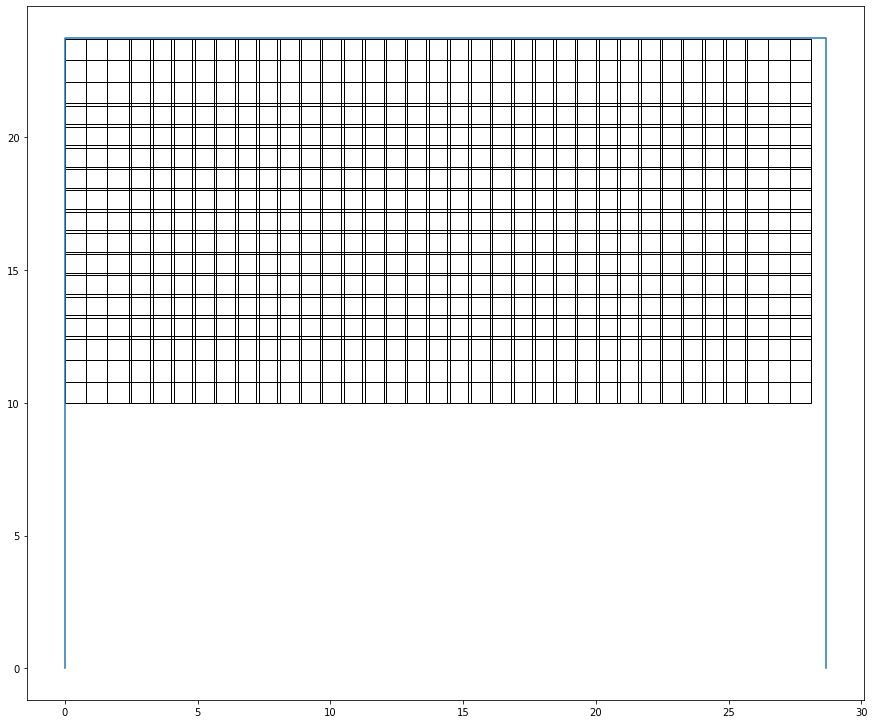

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
0
8
16
57
131
234
242
250
453
462
470
478
494
room dimension (W x H) are [[28.66666667 23.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
21
131
429
439
484
494
room dimension (W x H) are [[28.66666667 23.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
6
21
462
477
492
room dimension (W x H) are [[28.66666667 23.75      ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
20
129
330
340
350
459
room dimension (W

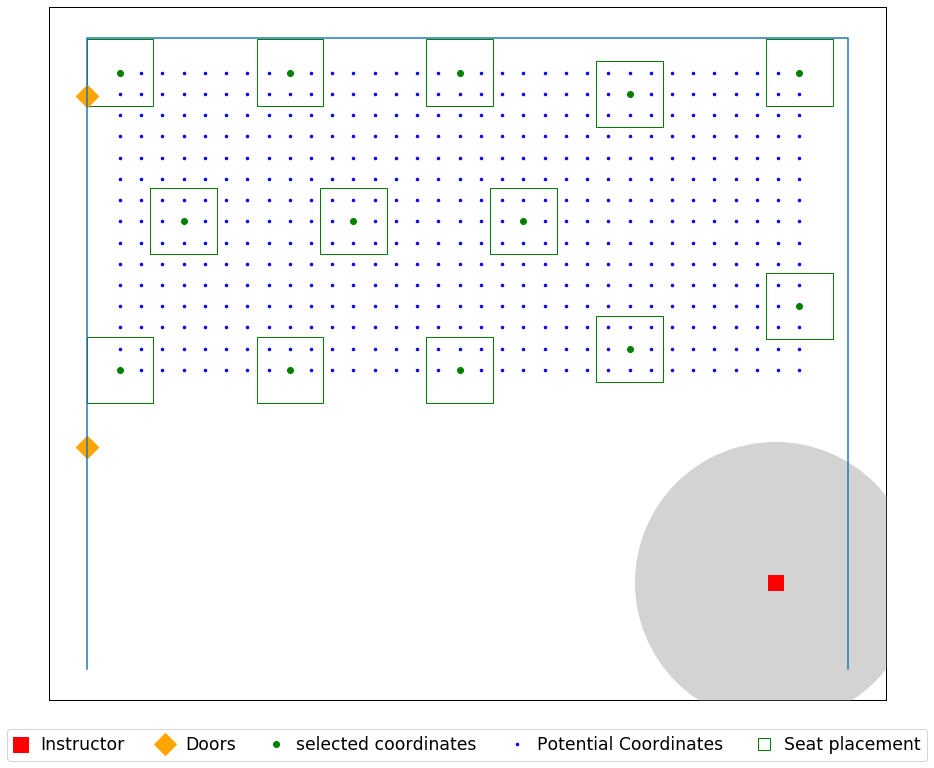

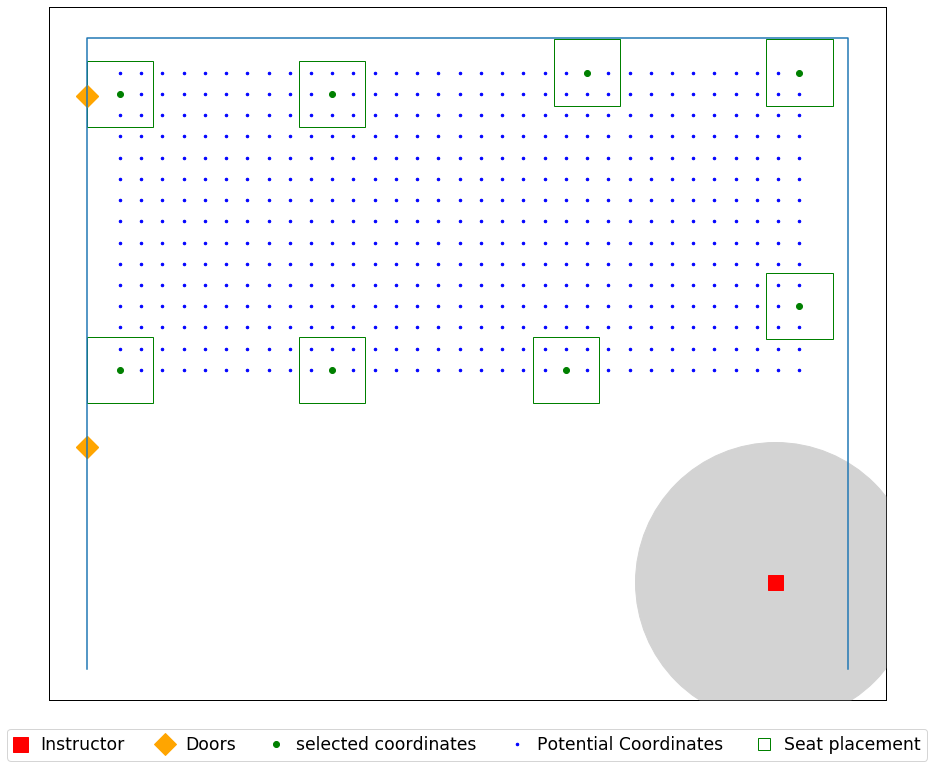

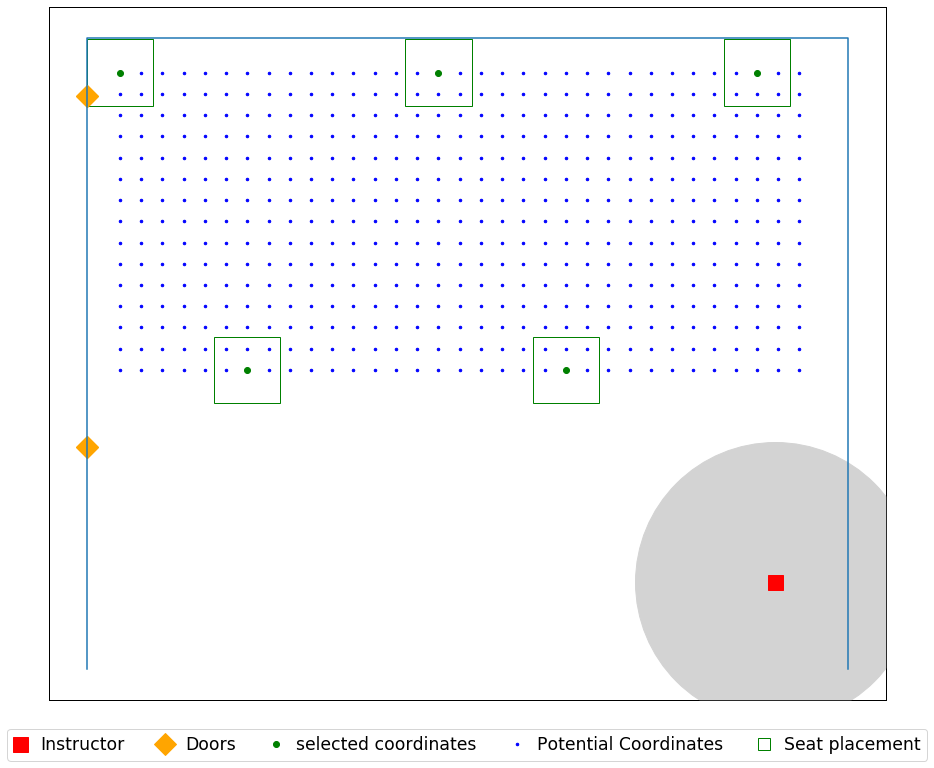

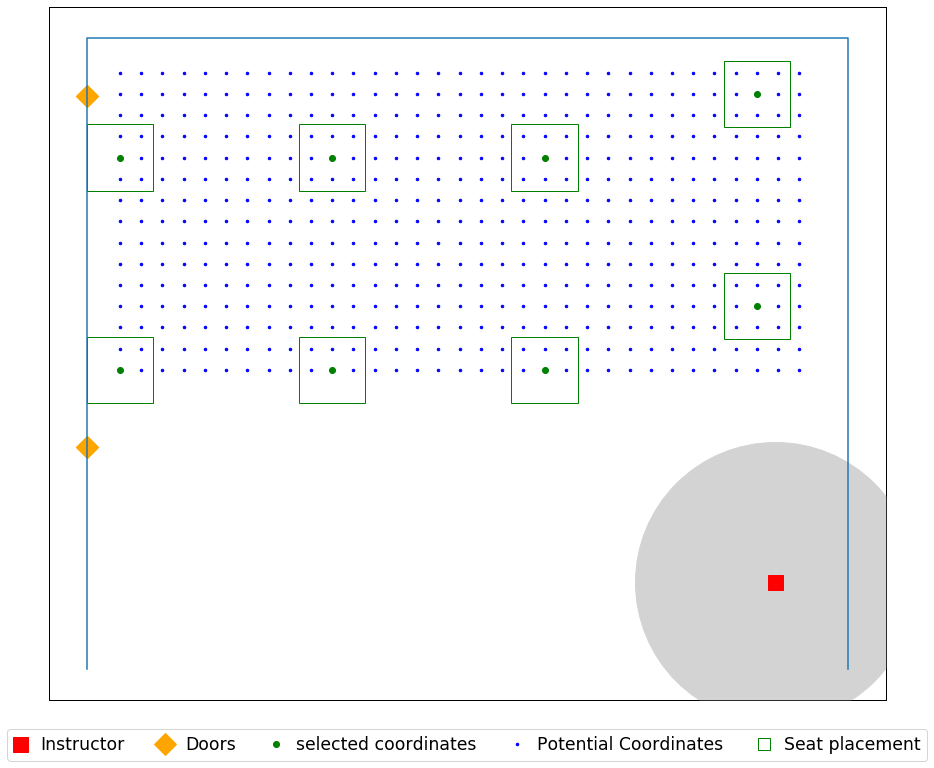

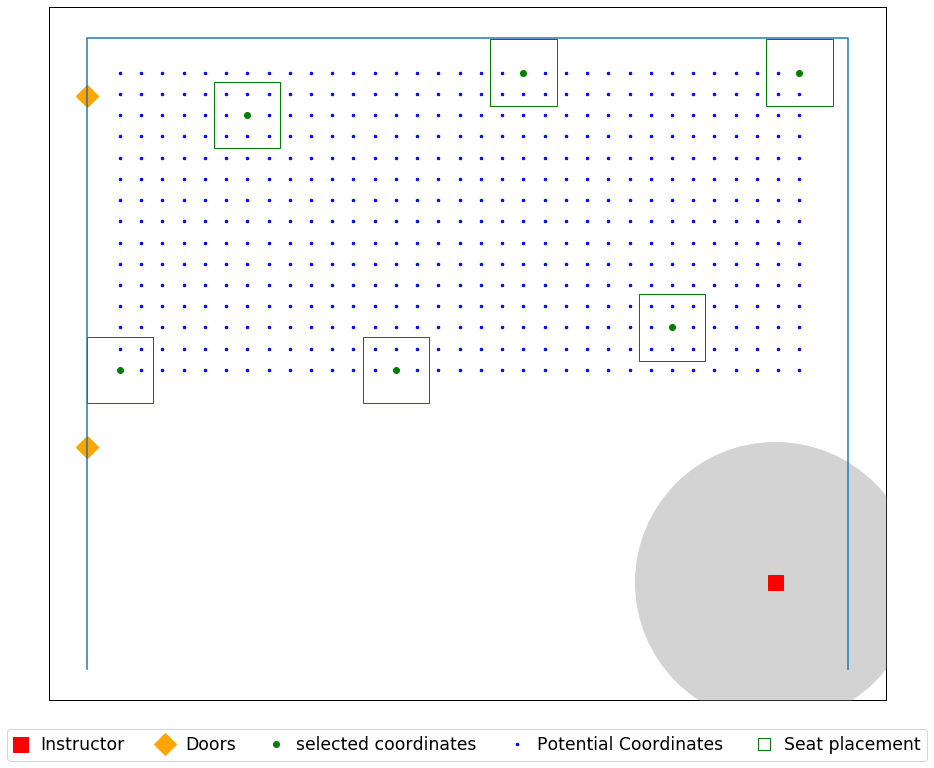

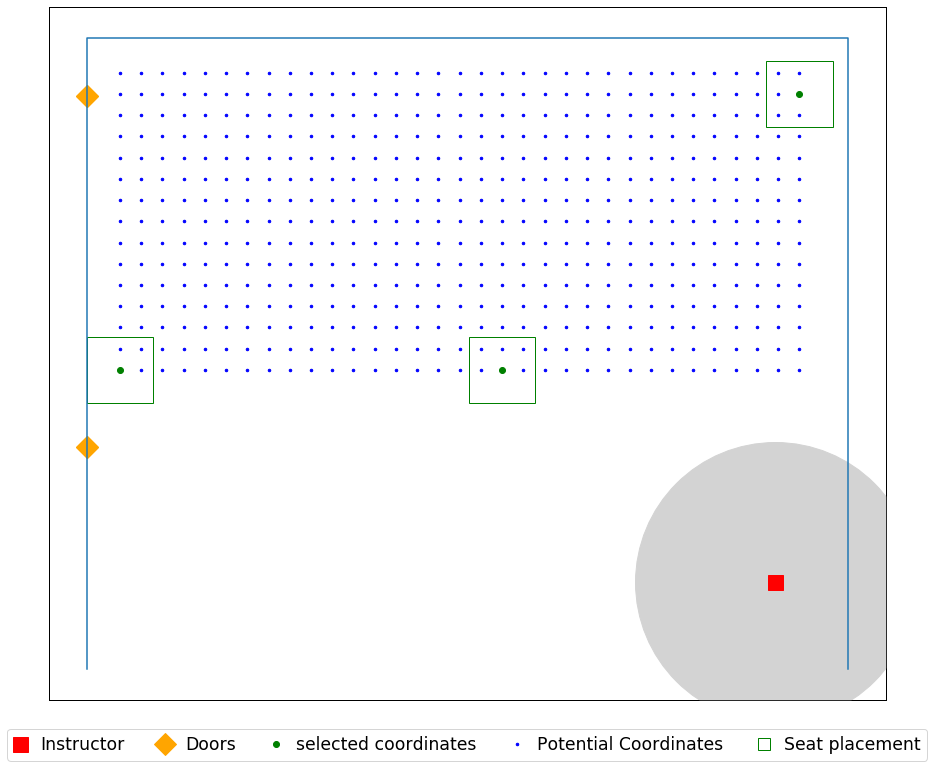

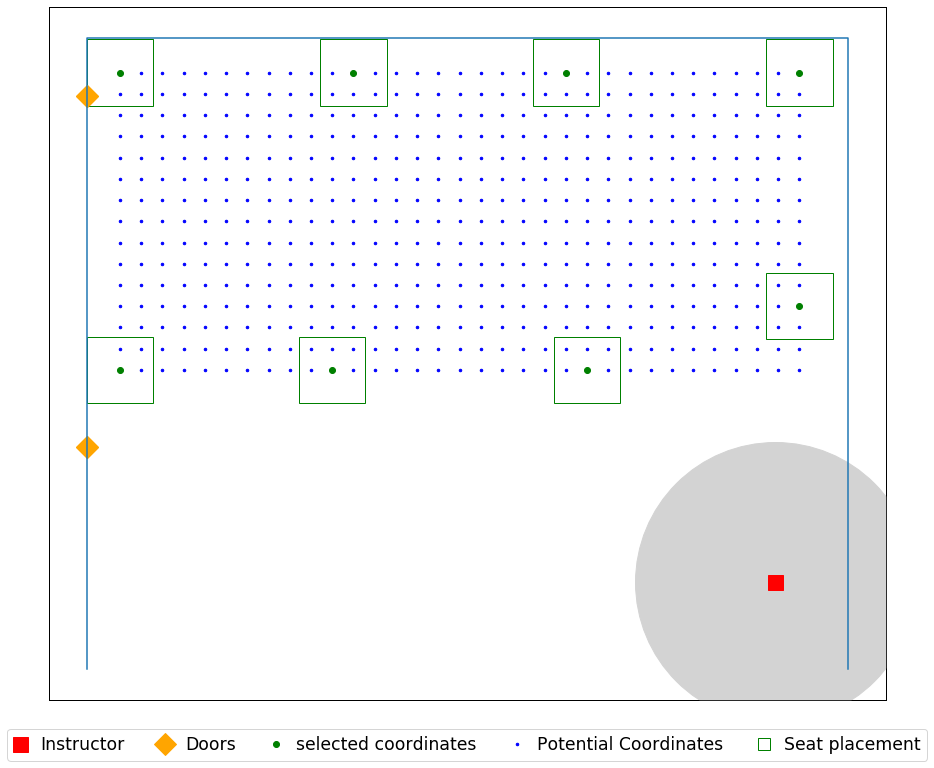

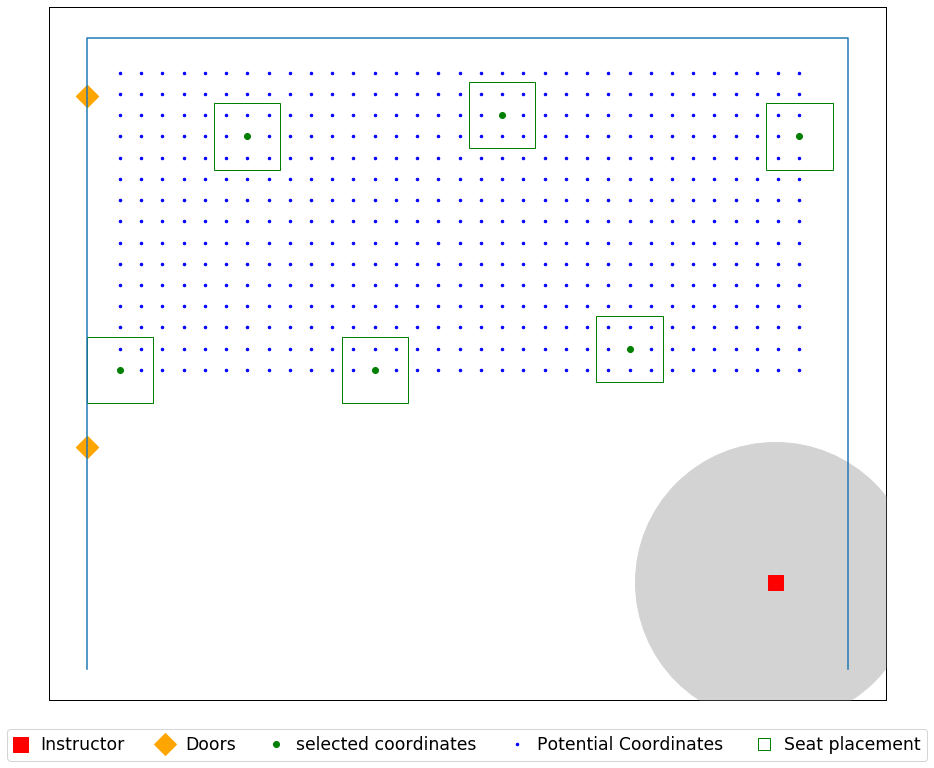

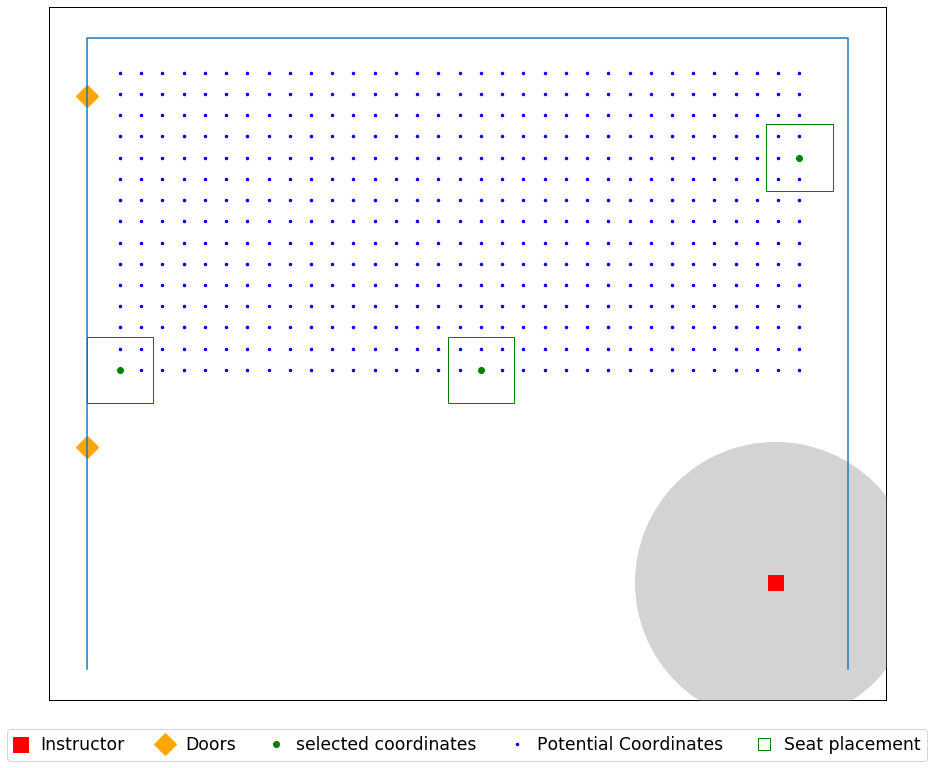

In [68]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Howey S105

In [73]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\HOWEY, JOSEPH H. S105 A.xlsx'

Name = 'Howey_S105'

room dimension (W x H) are [[34.91666667 24.20833333]]
seat dimension (W x H) are [[2.5 2.5]]
[[31.          3.20833333]]
[(0, 10), (34.916666666666664, 10), (34.916666666666664, 24.208333333333332), (0, 24.208333333333332)]
Total number of seats  is 615


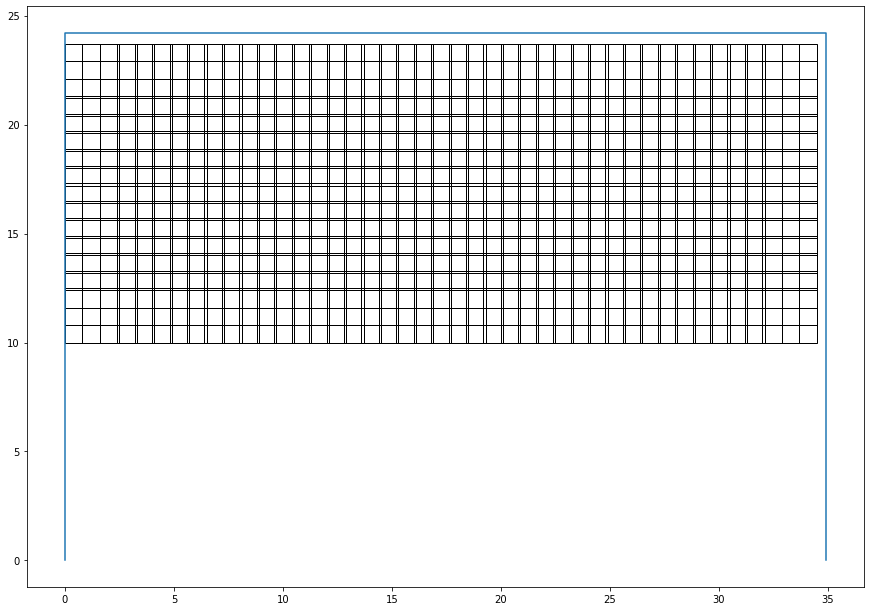

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
8
16
24
115
245
290
298
306
314
565
573
574
582
590
598
room dimension (W x H) are [[34.91666667 24.20833333]]
seat dimension (W x H) are [[2.5 2.5]]


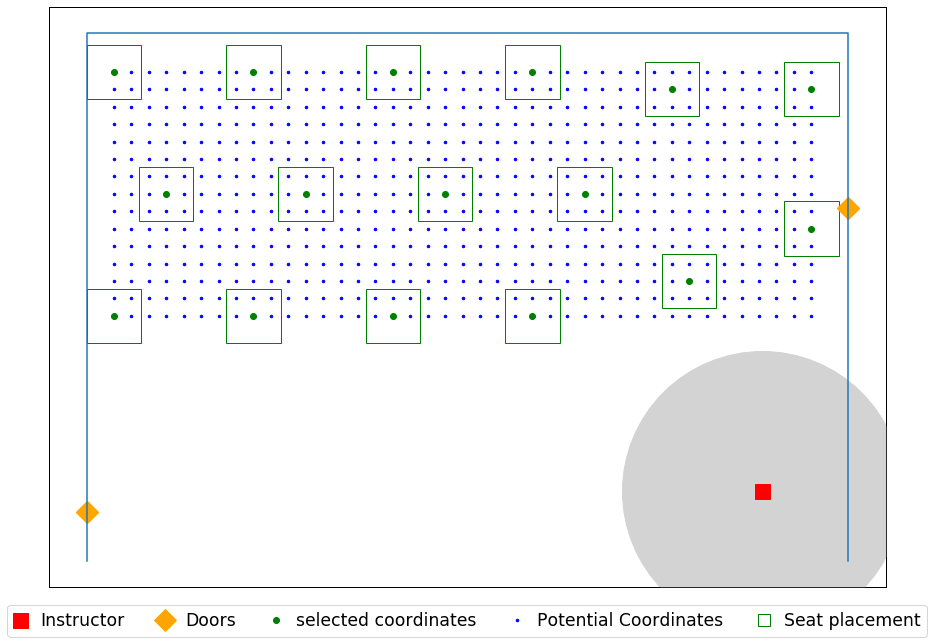

In [75]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[34.91666667 24.20833333]]
seat dimension (W x H) are [[2.5 2.5]]
[[31.          3.20833333]]
[(0, 10), (34.916666666666664, 10), (34.916666666666664, 24.208333333333332), (0, 24.208333333333332)]
Total number of seats  is 615


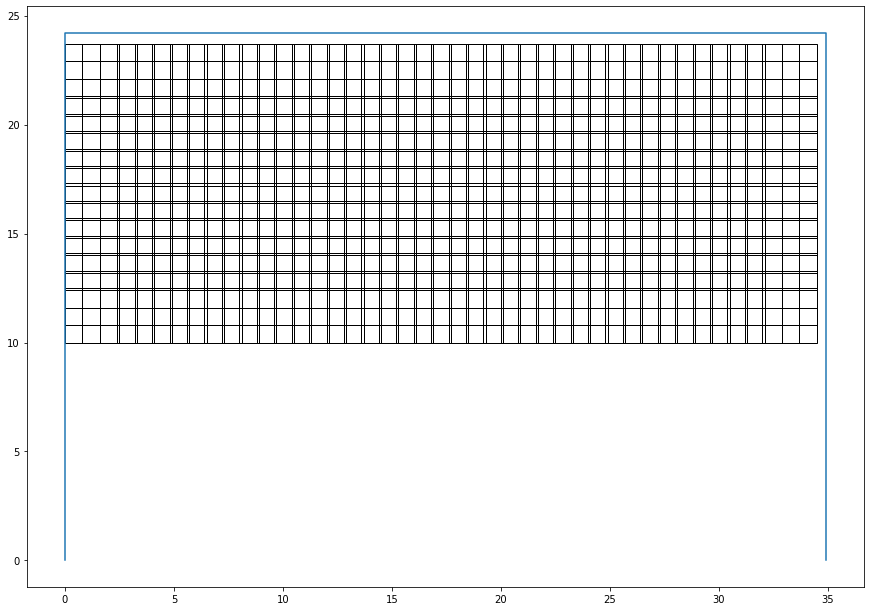

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
8
16
24
115
245
290
298
306
314
565
573
574
582
590
598
room dimension (W x H) are [[34.91666667 24.20833333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
61
71
204
481
533
584
594
614
room dimension (W x H) are [[34.91666667 24.20833333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
15
71
572
580
595
room dimension (W x H) are [[34.91666667 24.20833333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
20
71
163
410
42

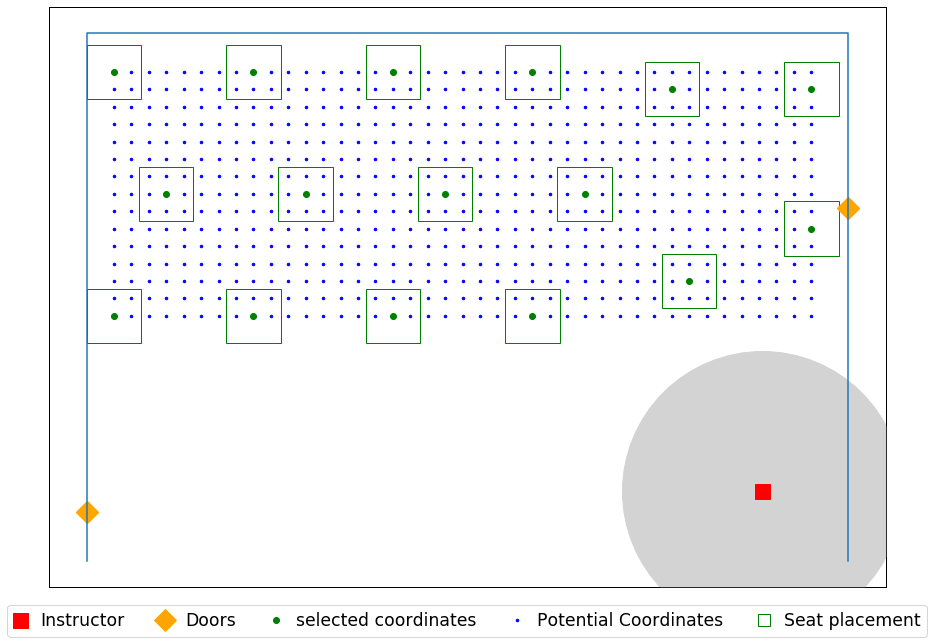

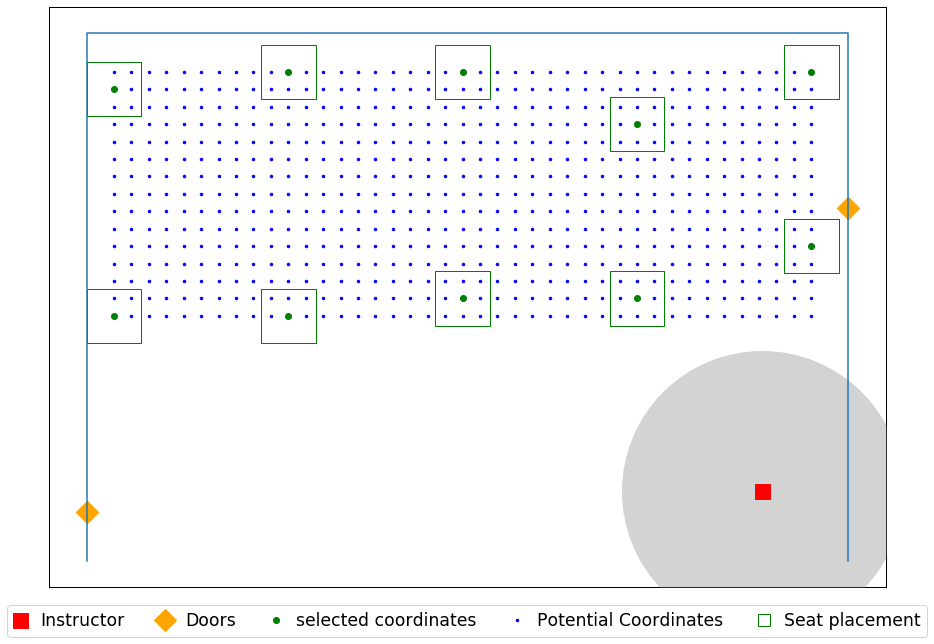

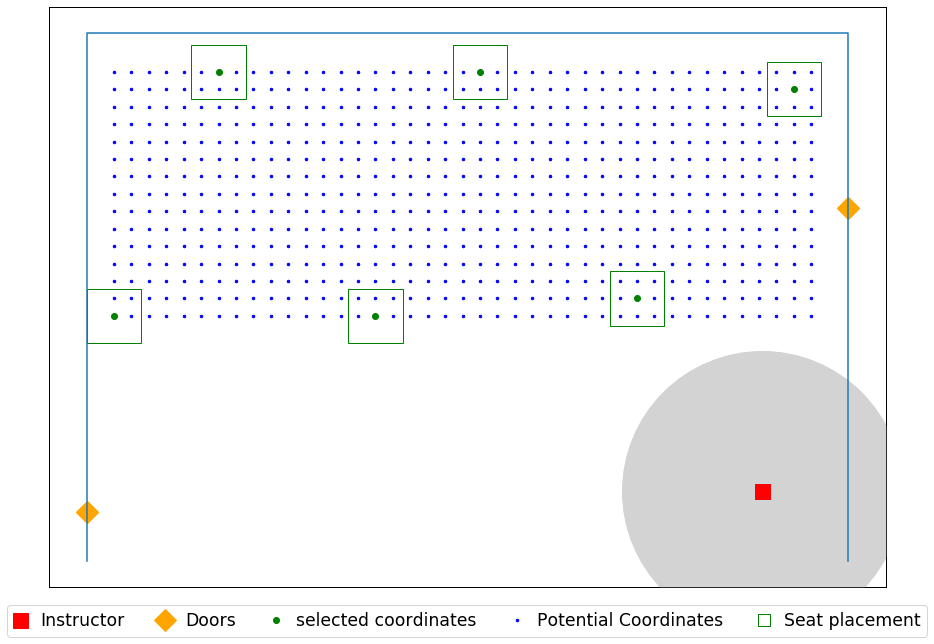

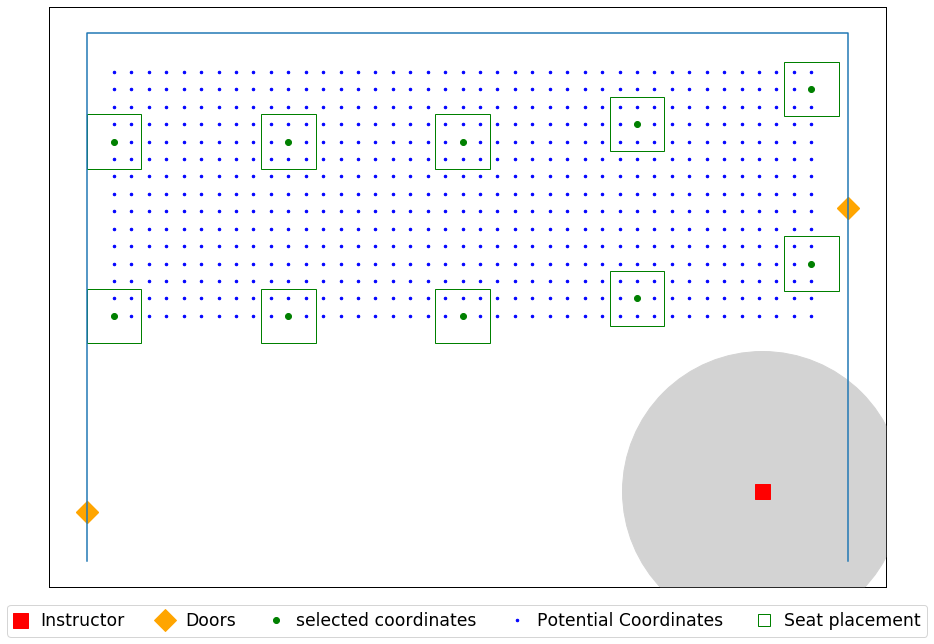

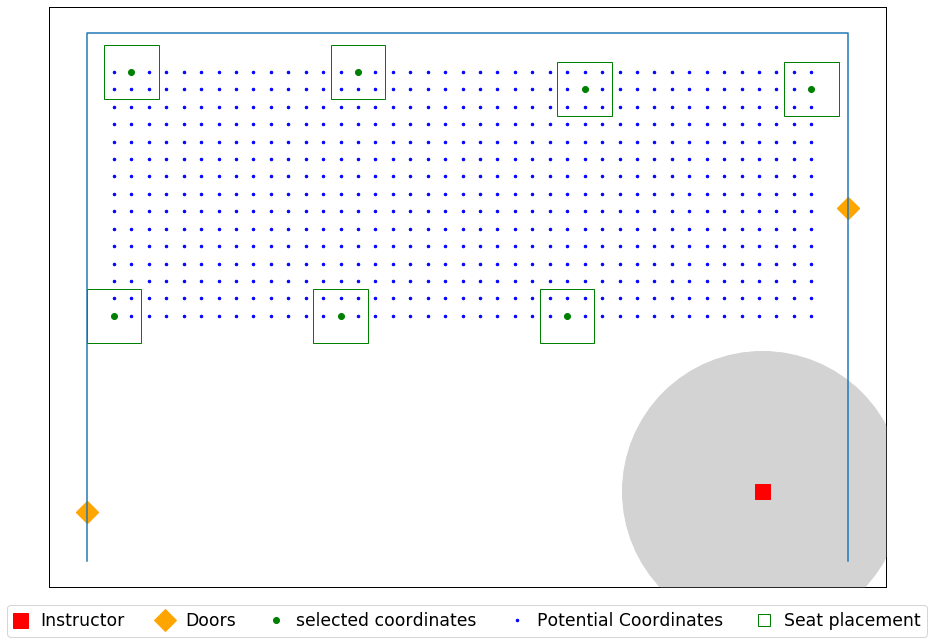

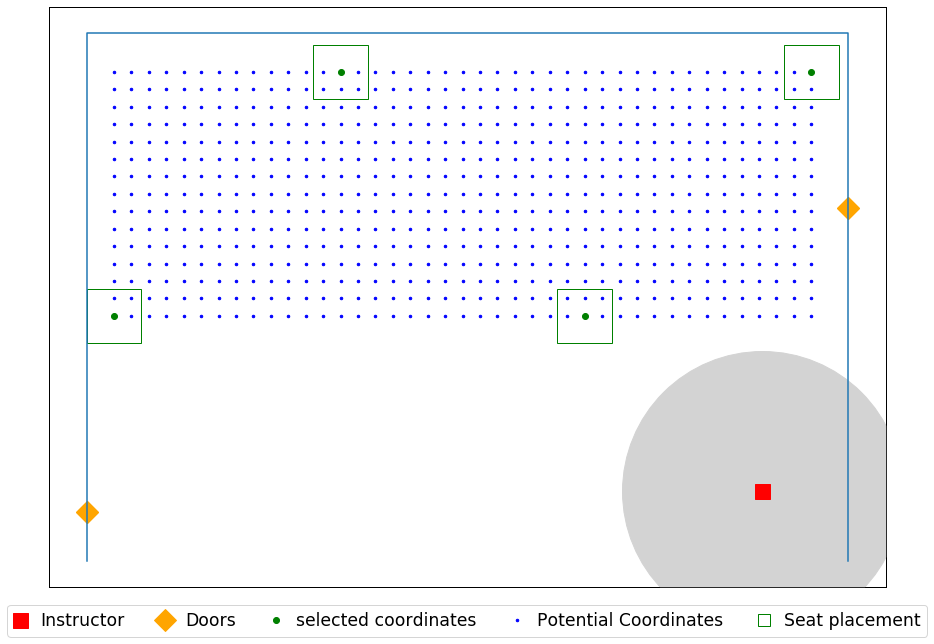

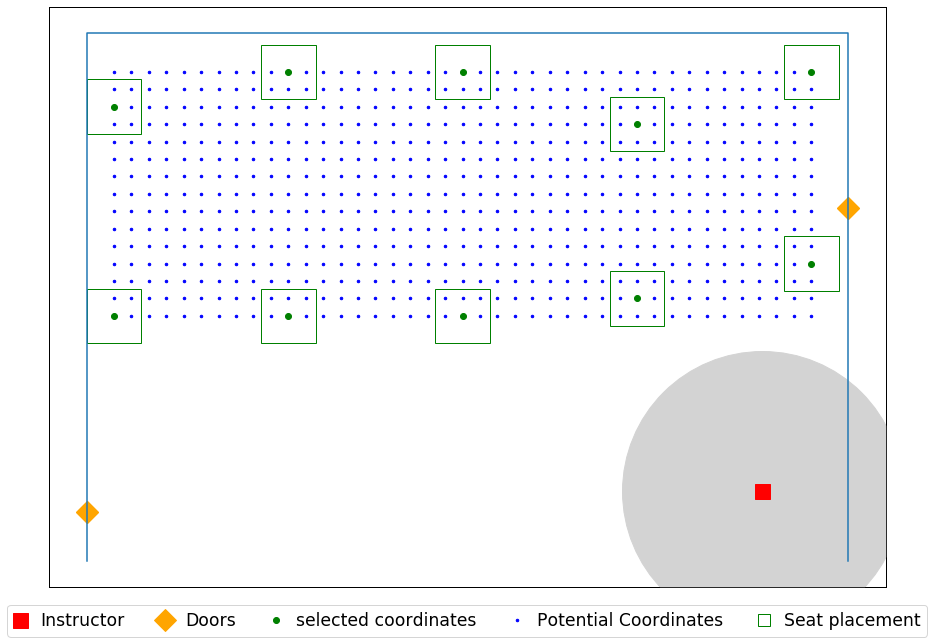

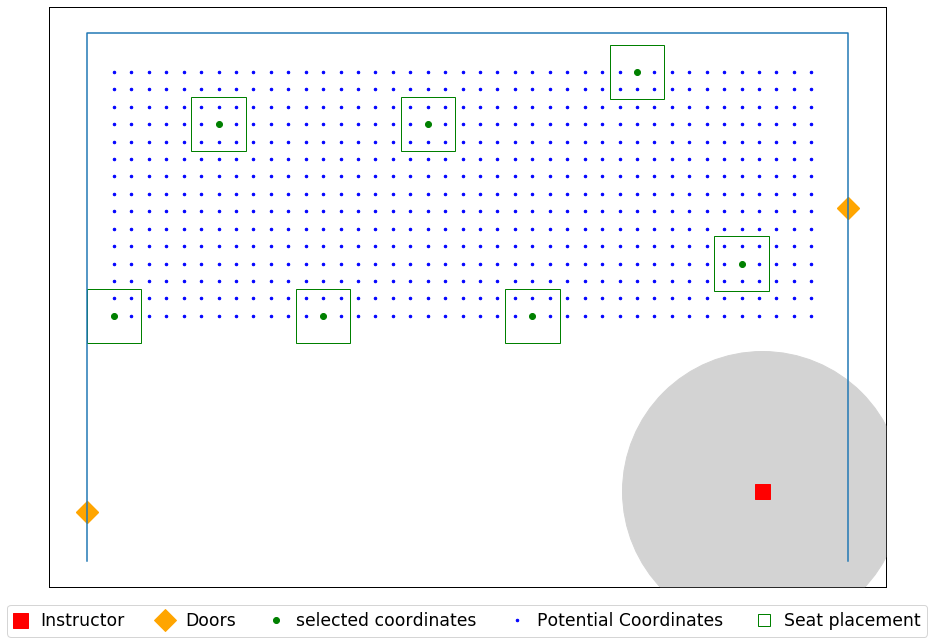

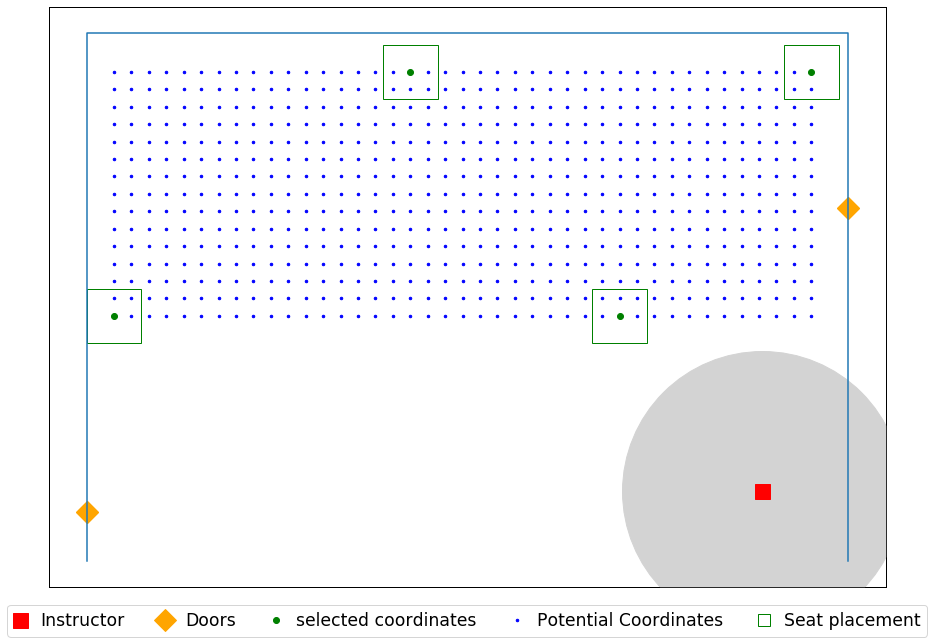

In [76]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Howey S104

In [85]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\HOWEY, JOSEPH H. S104.xlsx'

Name = 'Howey_S104'

room dimension (W x H) are [[28.58333333 23.58333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[23.5         4.16666667]]
[(0, 10), (28.583333333333332, 10), (28.583333333333332, 23.583333333333332), (0, 23.583333333333332)]
Total number of seats  is 462


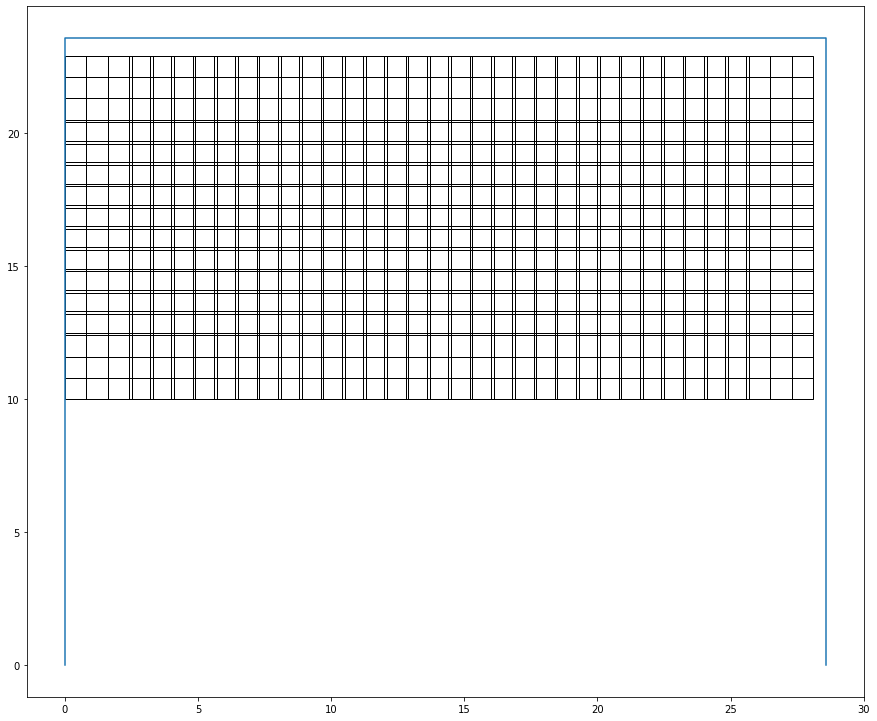

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
18
131
189
211
236
428
429
439
453
room dimension (W x H) are [[28.58333333 23.58333333]]
seat dimension (W x H) are [[2.5 2.5]]


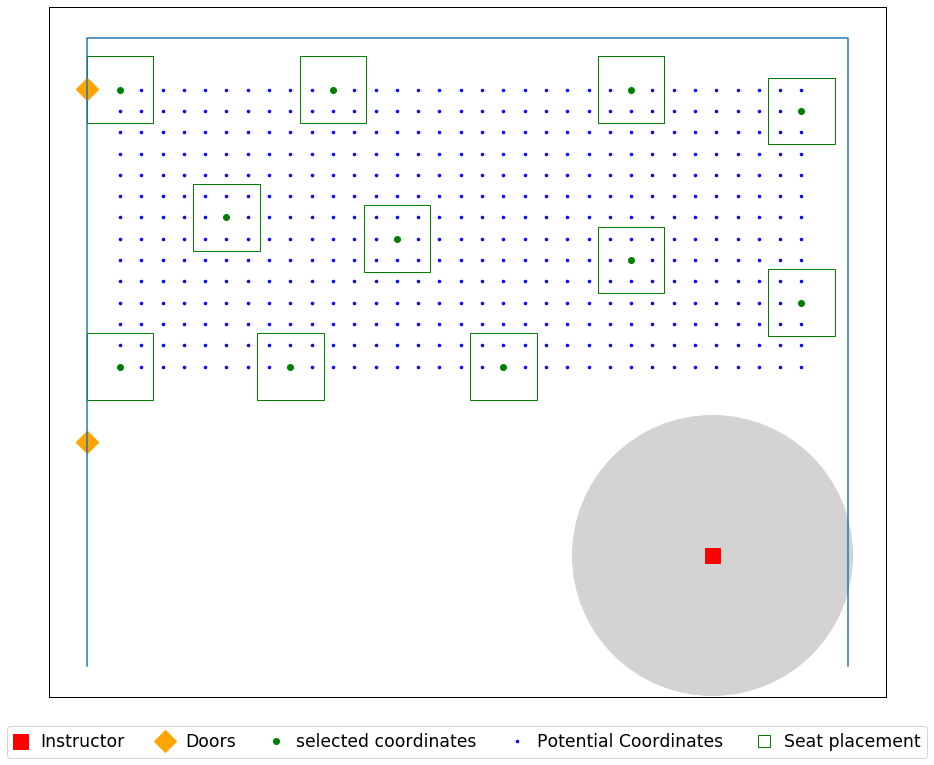

In [79]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[28.58333333 23.58333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[23.5         4.16666667]]
[(0, 10), (28.583333333333332, 10), (28.583333333333332, 23.583333333333332), (0, 23.583333333333332)]
Total number of seats  is 462


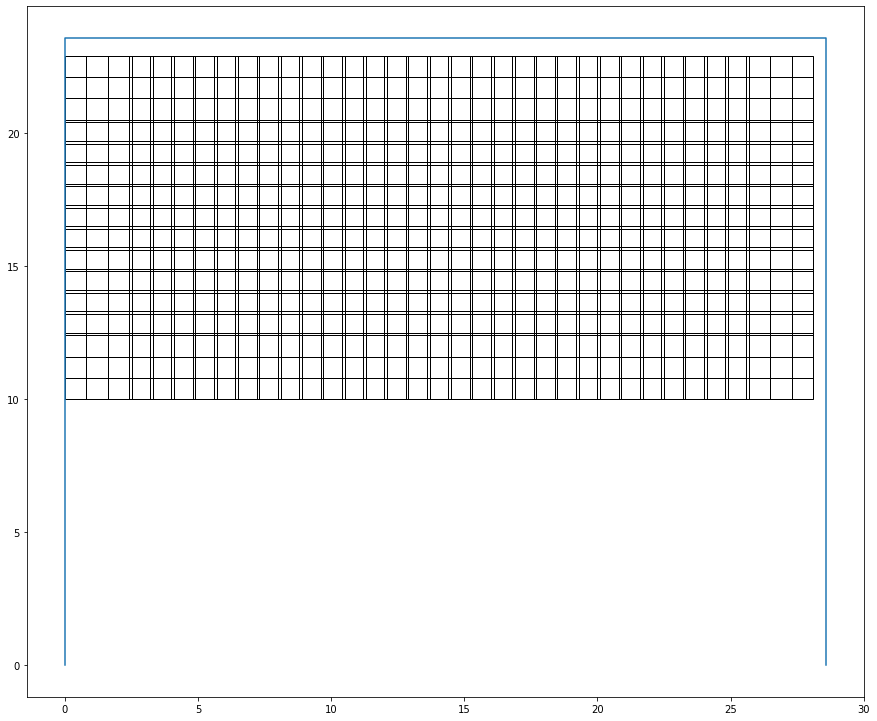

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
8
18
131
189
211
236
428
429
439
453
room dimension (W x H) are [[28.58333333 23.58333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
53
131
406
429
450
461
room dimension (W x H) are [[28.58333333 23.58333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
12
131
330
449
room dimension (W x H) are [[28.58333333 23.58333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
53
131
330
340
383
459
room dimension (W x H) are

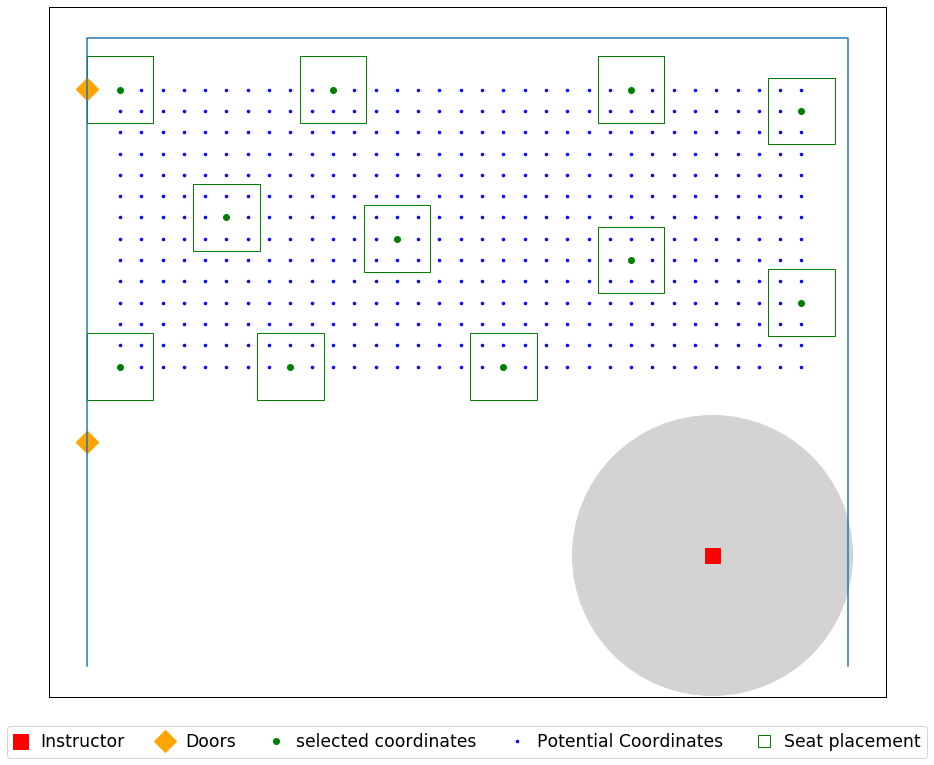

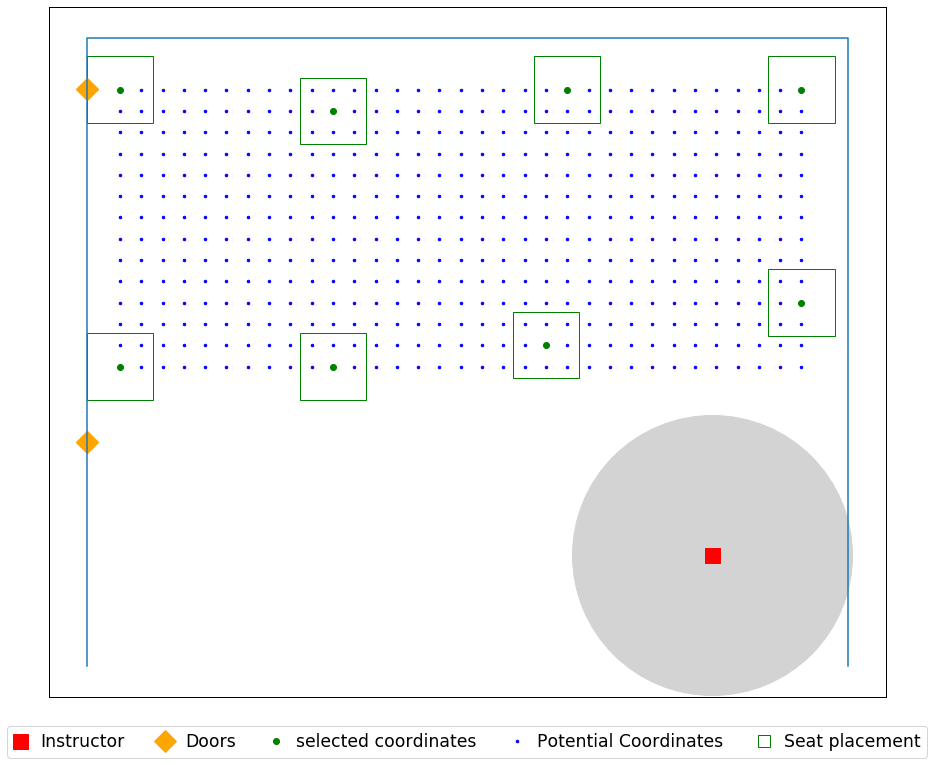

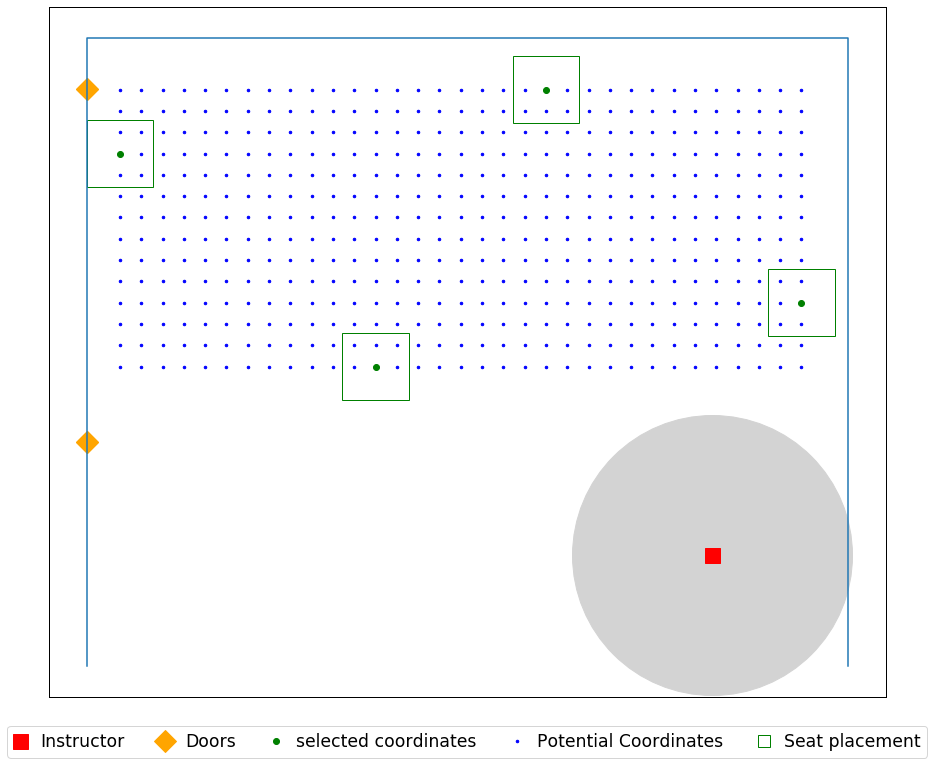

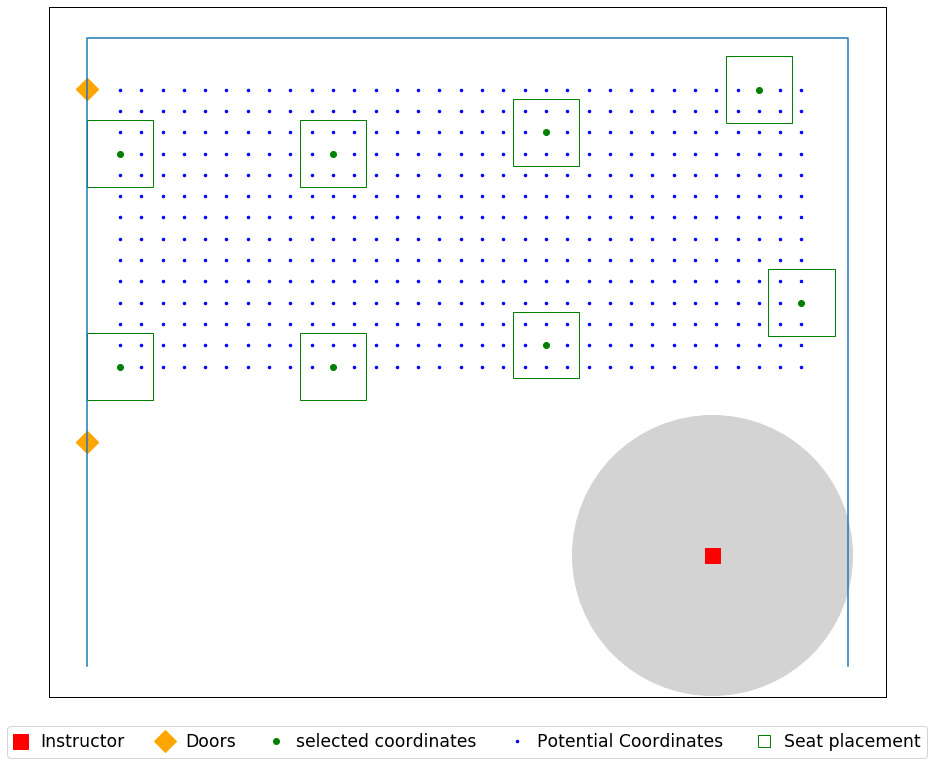

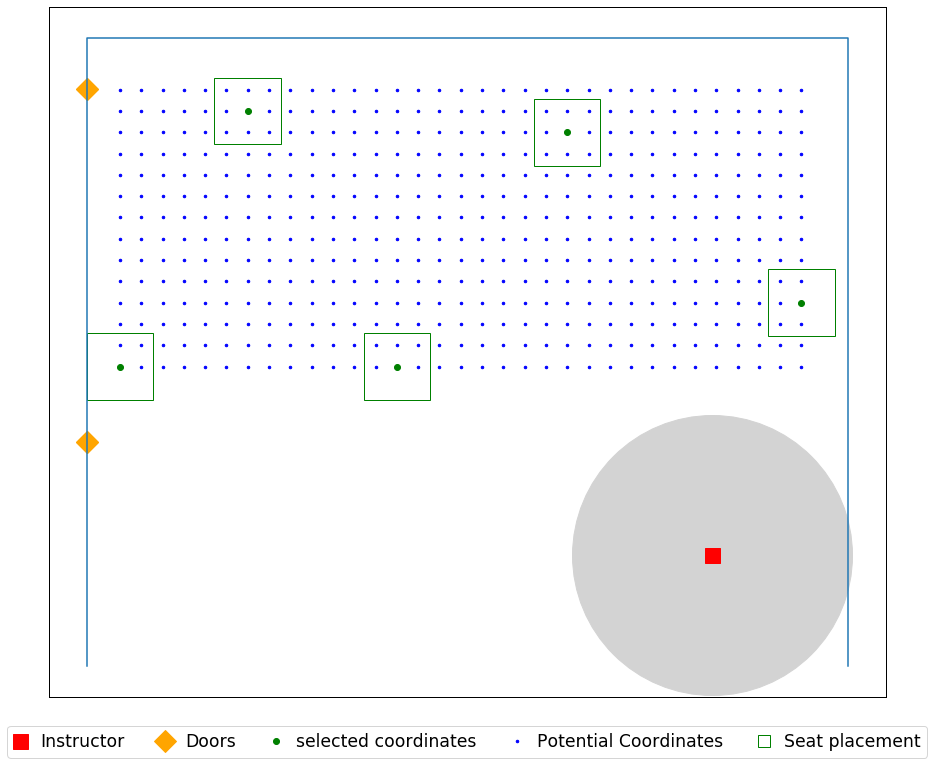

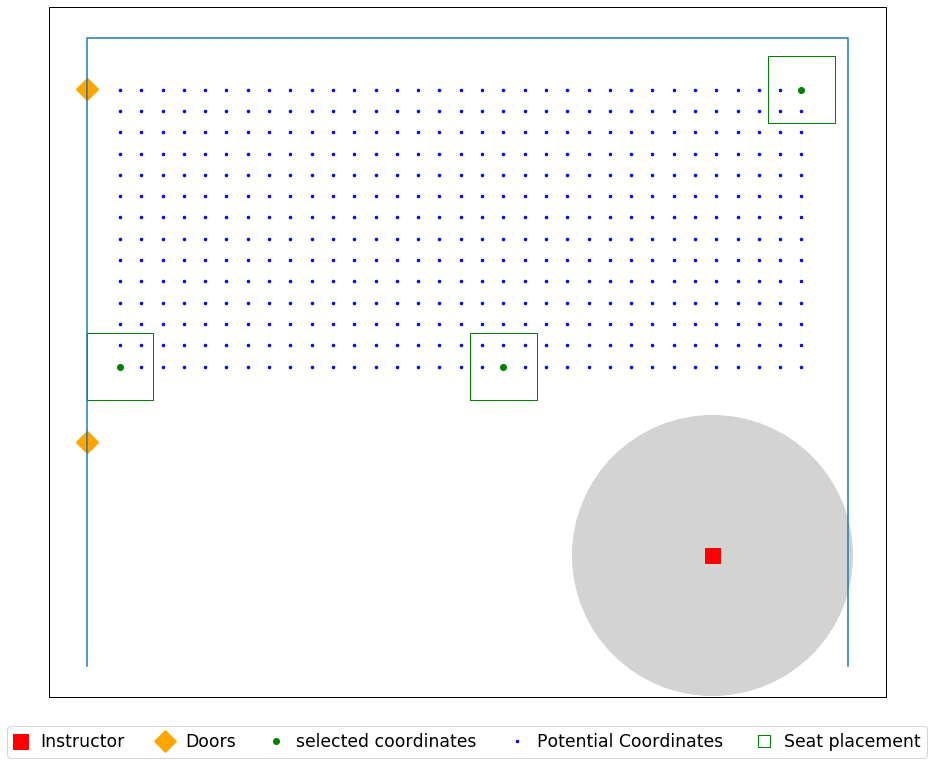

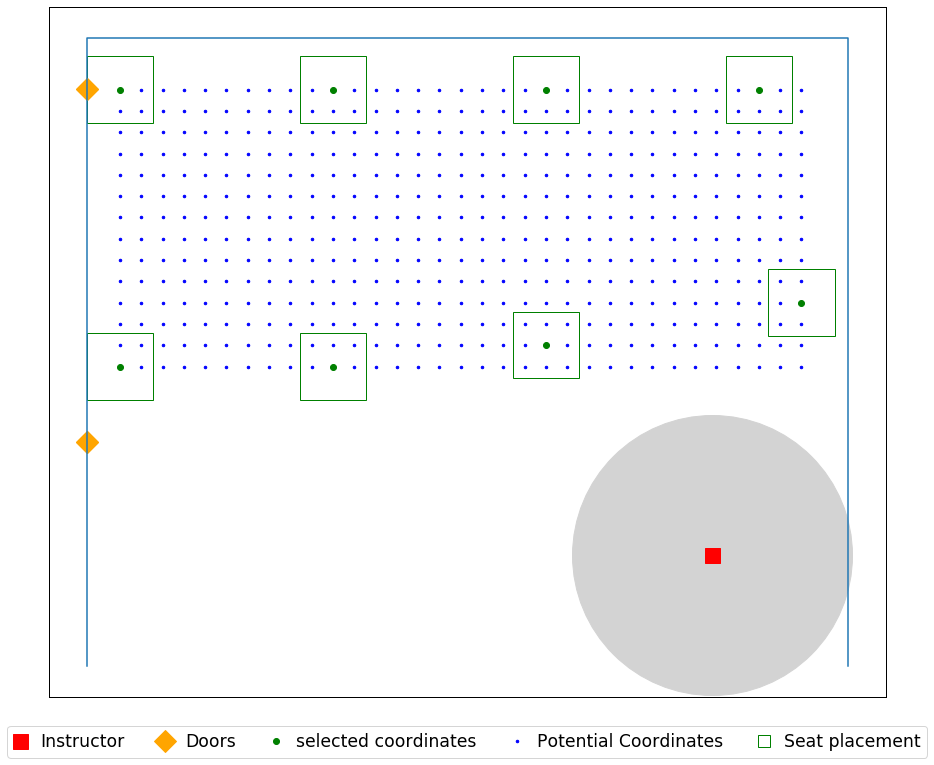

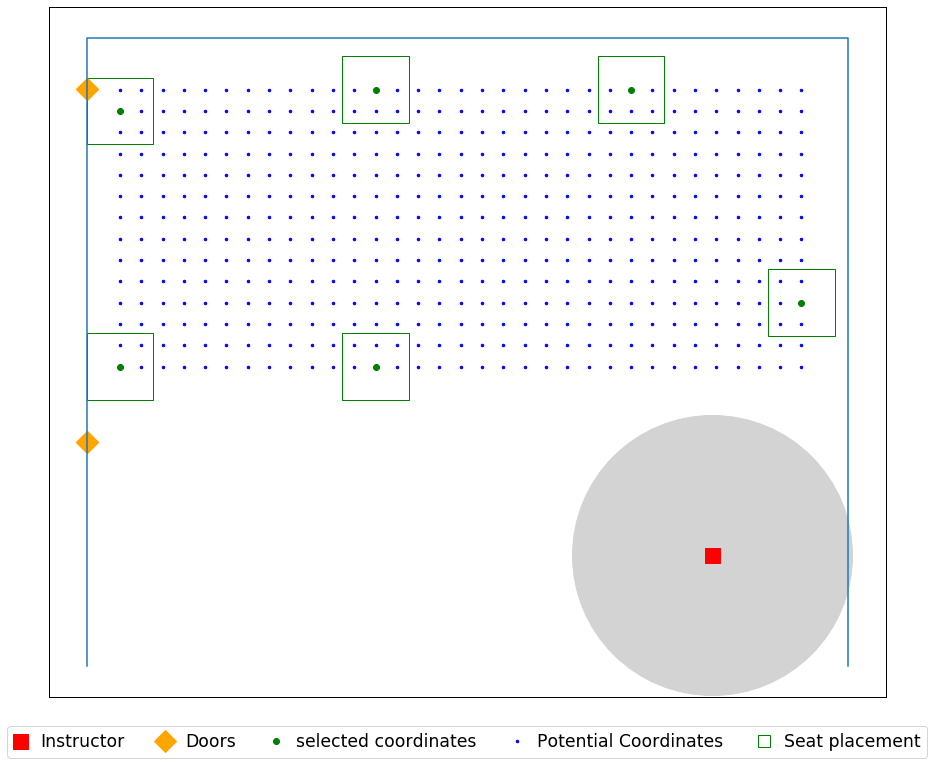

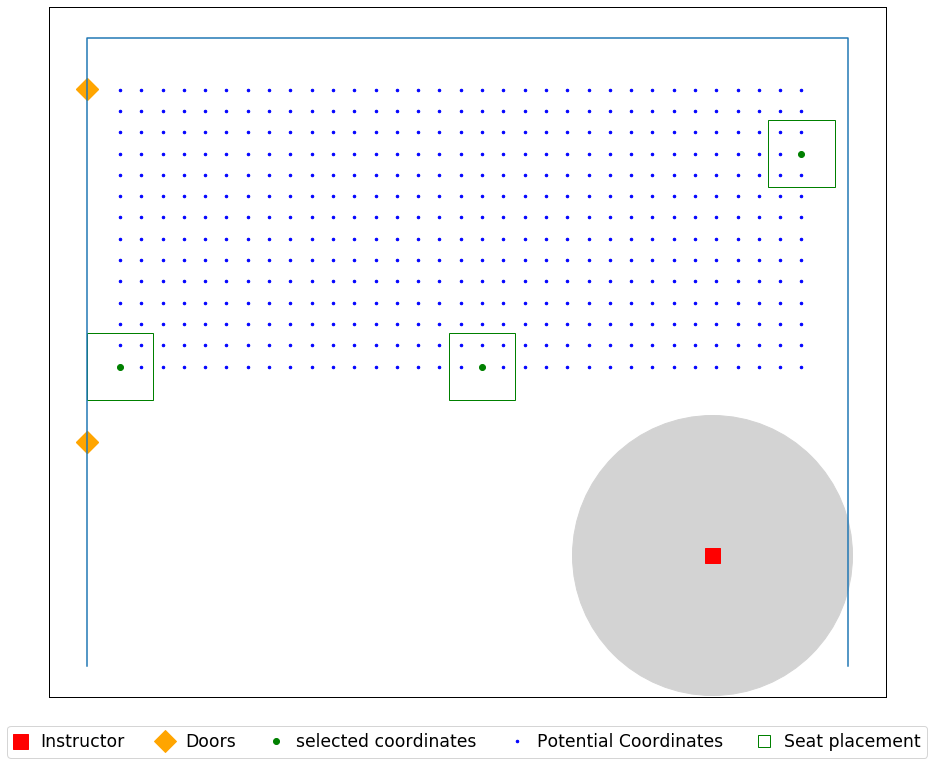

In [86]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Howey S106

In [87]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\HOWEY, JOSEPH H. S106.xlsx'

Name = 'Howey_S106'

room dimension (W x H) are [[28.58333333 23.5       ]]
seat dimension (W x H) are [[2.5 2.5]]
[[23.5   3.75]]
[(0, 10), (28.583333333333332, 10), (28.583333333333332, 23.5), (0, 23.5)]
Total number of seats  is 462


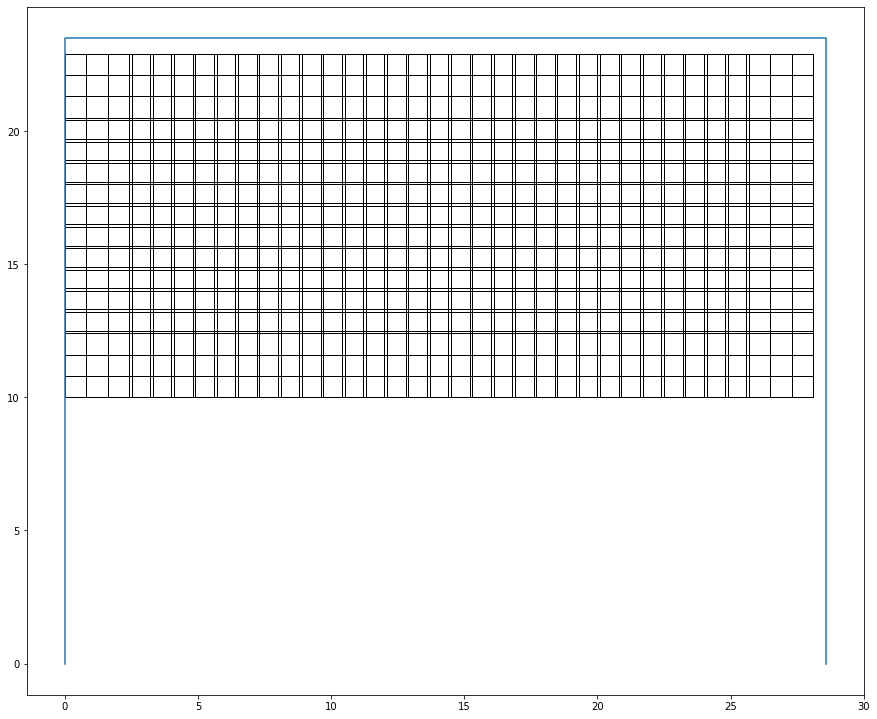

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
11
19
131
203
222
246
393
396
439
449
room dimension (W x H) are [[28.58333333 23.5       ]]
seat dimension (W x H) are [[2.5 2.5]]


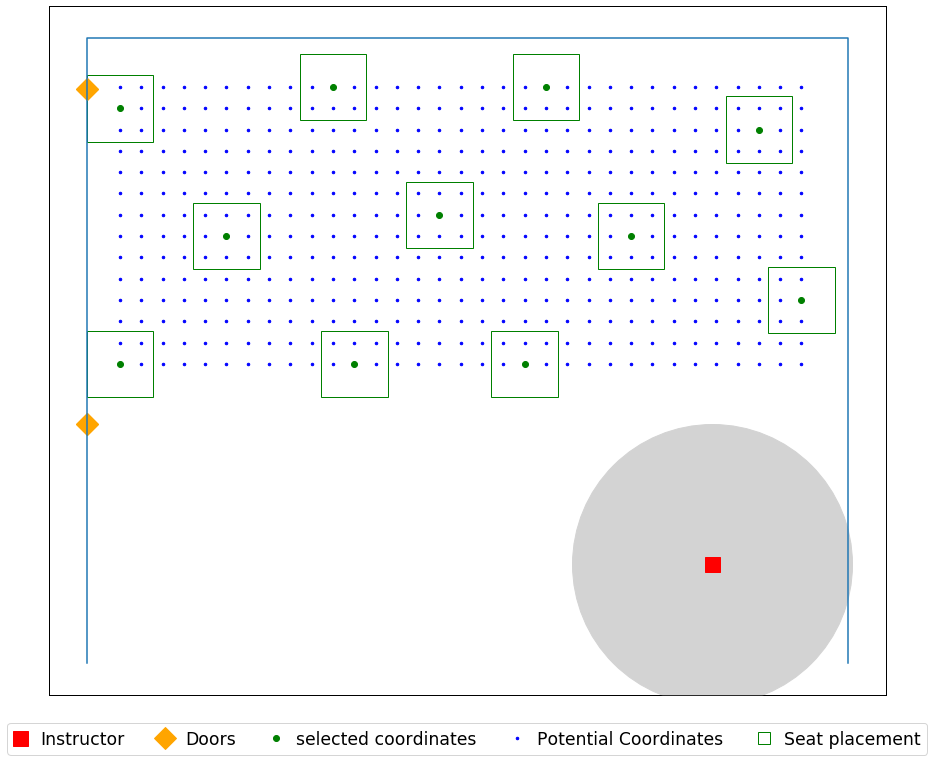

In [81]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[28.58333333 23.5       ]]
seat dimension (W x H) are [[2.5 2.5]]
[[23.5   3.75]]
[(0, 10), (28.583333333333332, 10), (28.583333333333332, 23.5), (0, 23.5)]
Total number of seats  is 462


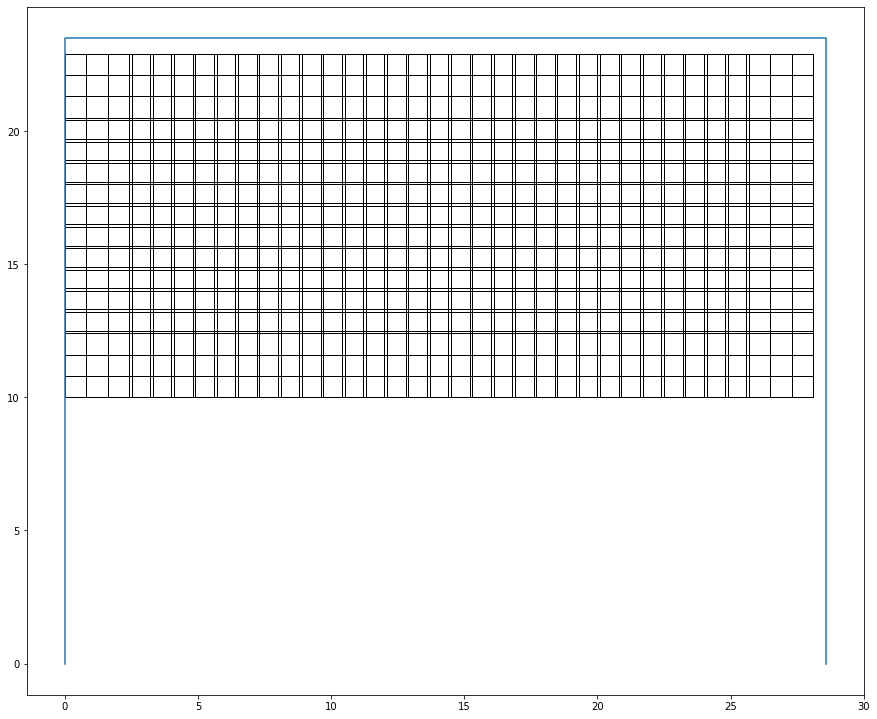

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
0
11
19
131
203
222
246
393
396
439
449
room dimension (W x H) are [[28.58333333 23.5       ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
53
129
429
440
450
461
room dimension (W x H) are [[28.58333333 23.5       ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
0
53
439
459
room dimension (W x H) are [[28.58333333 23.5       ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
0
10
53
129
330
340
383
459
room dimension (W x H) are 

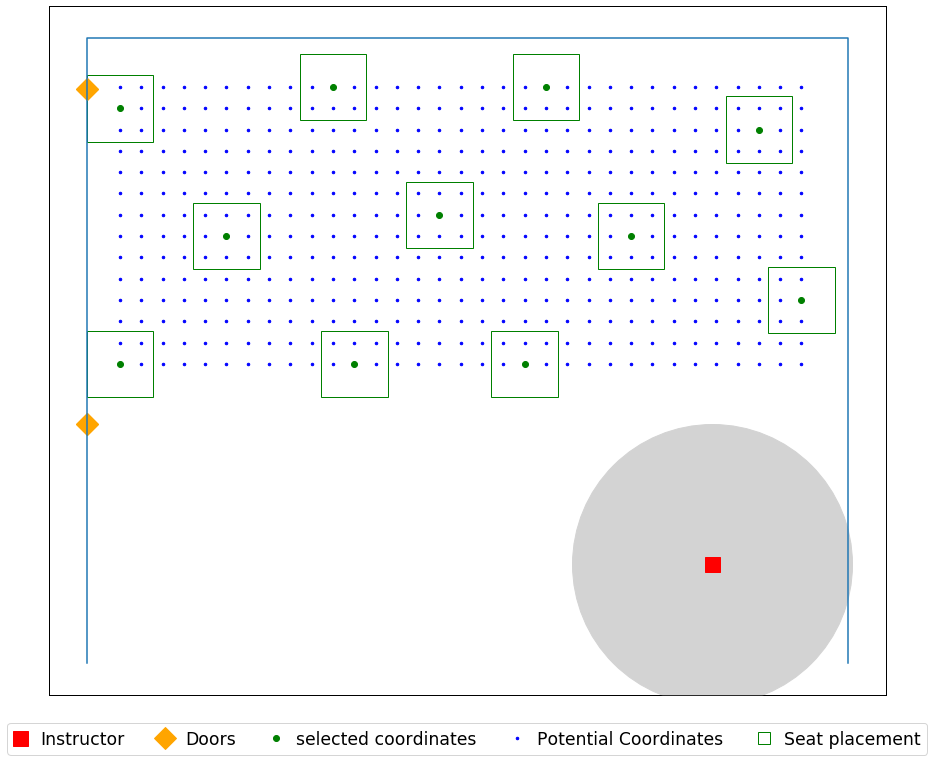

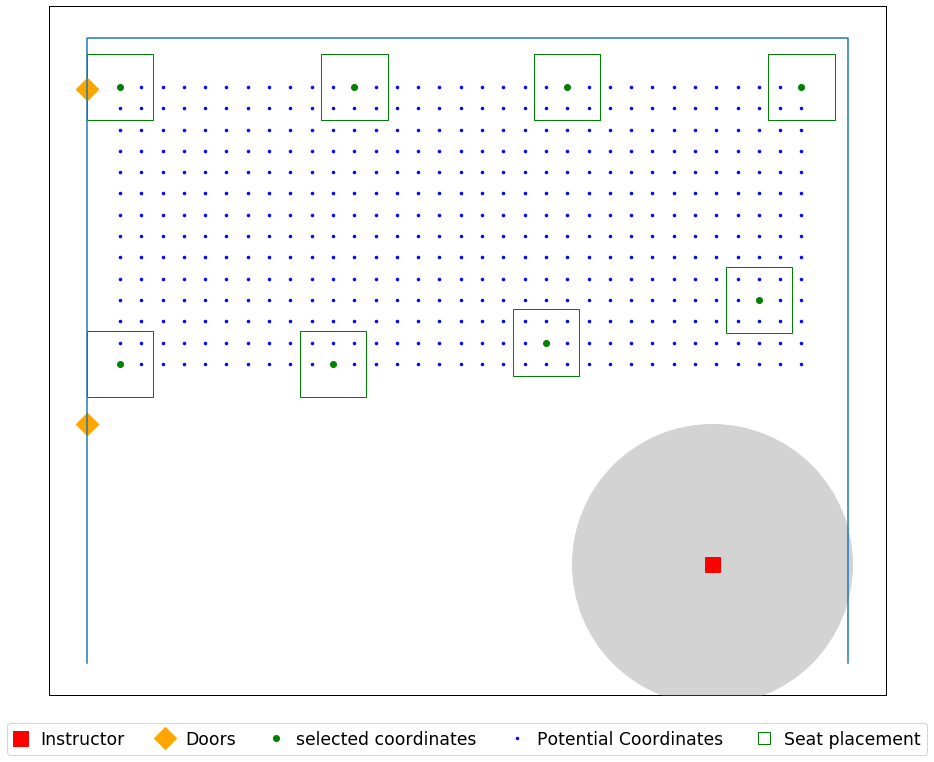

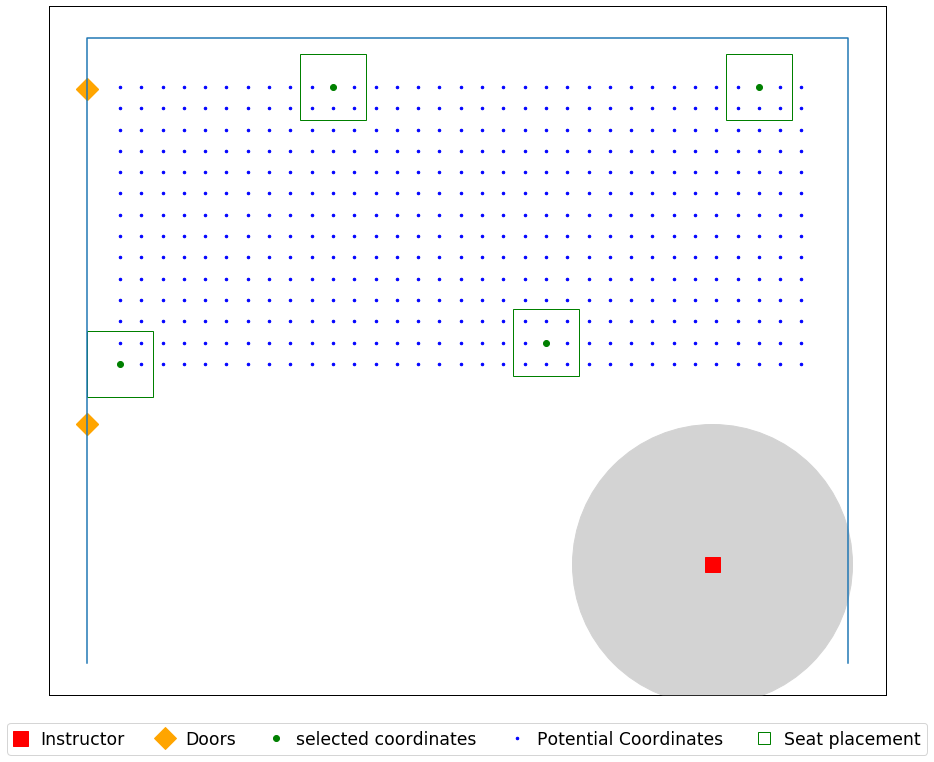

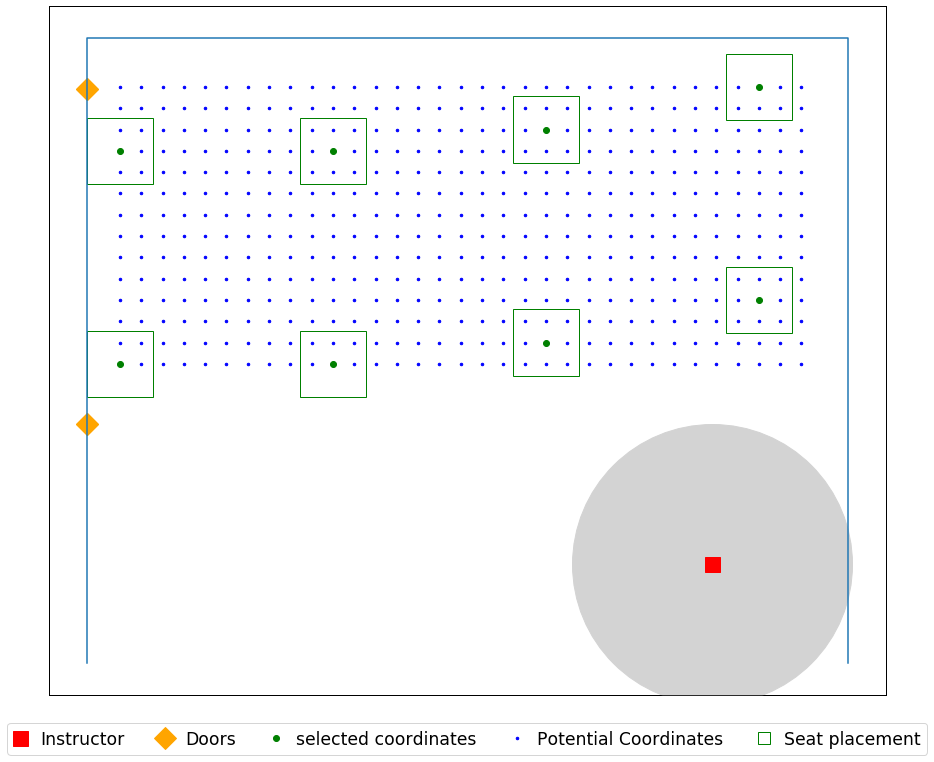

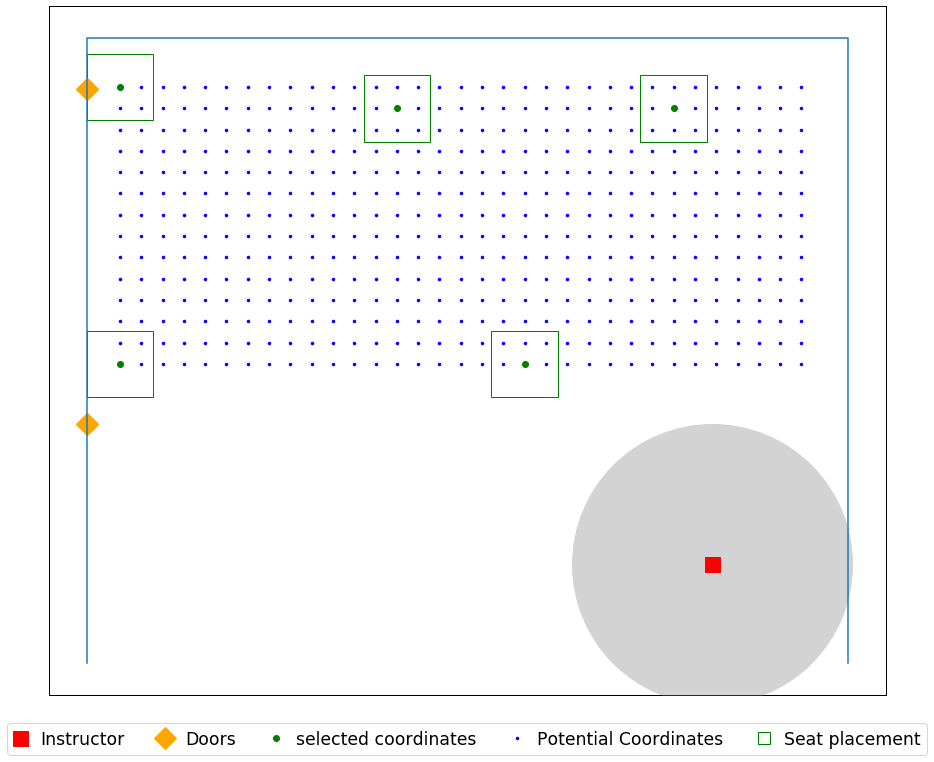

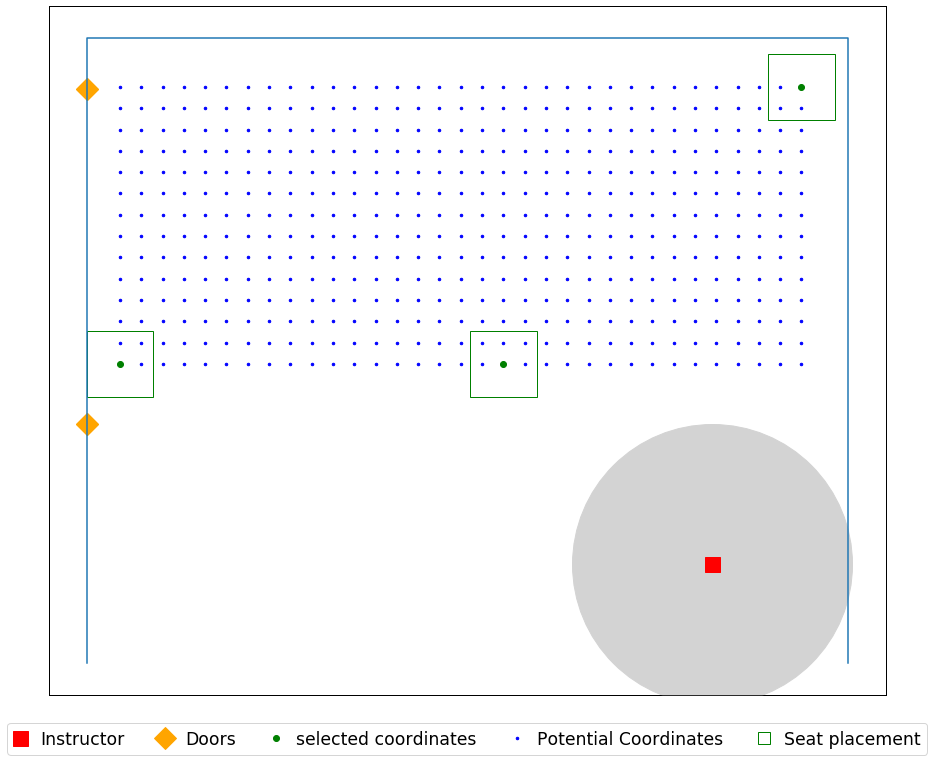

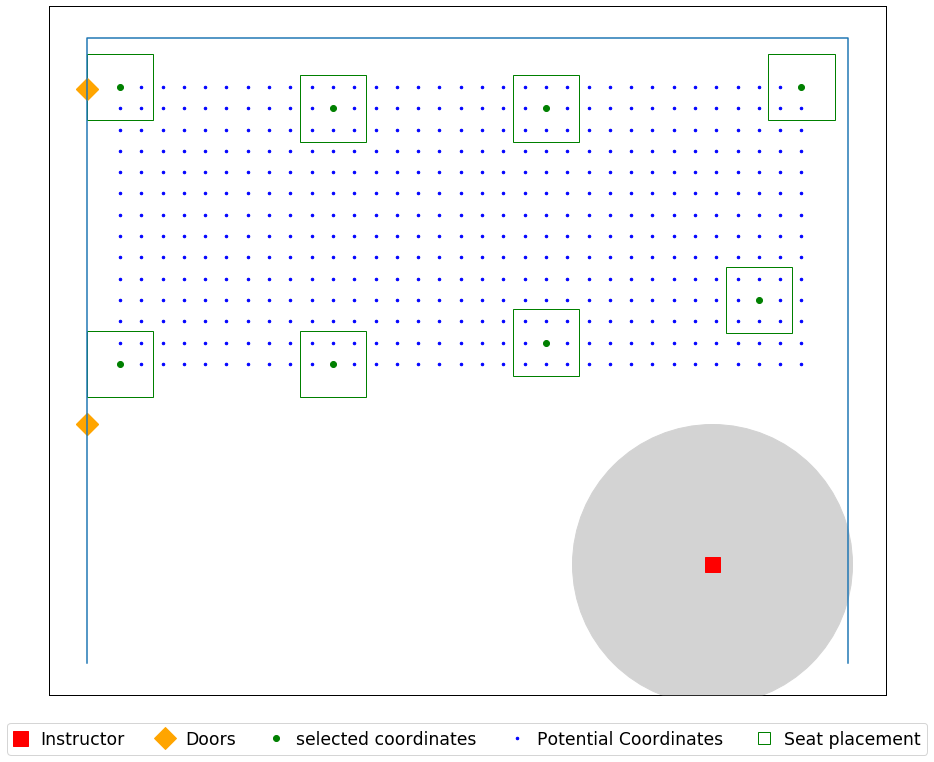

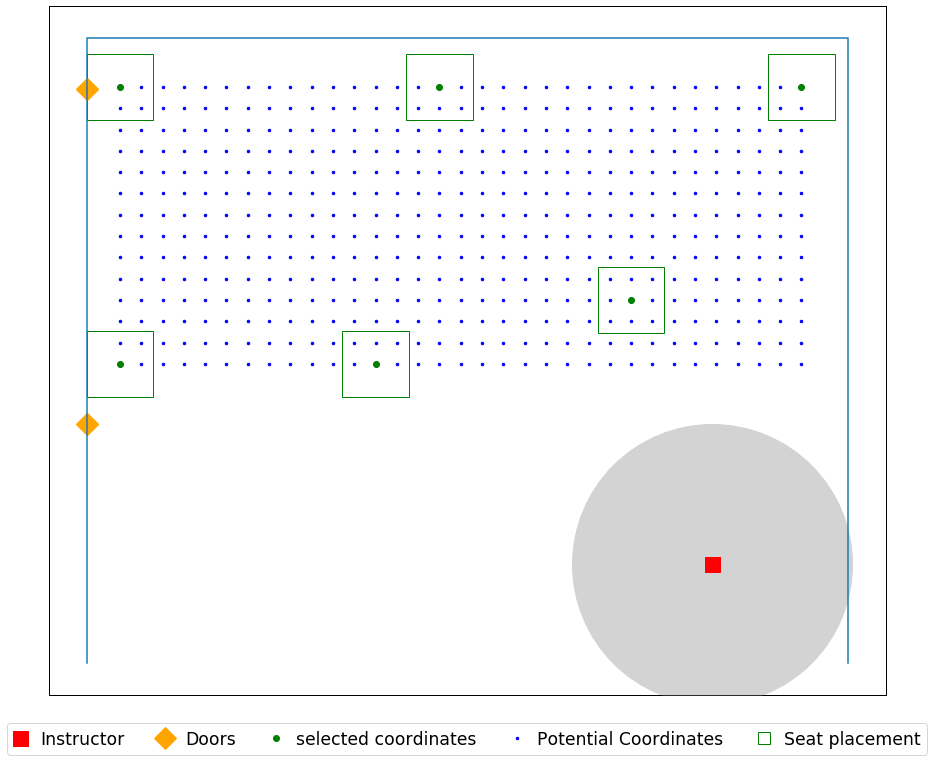

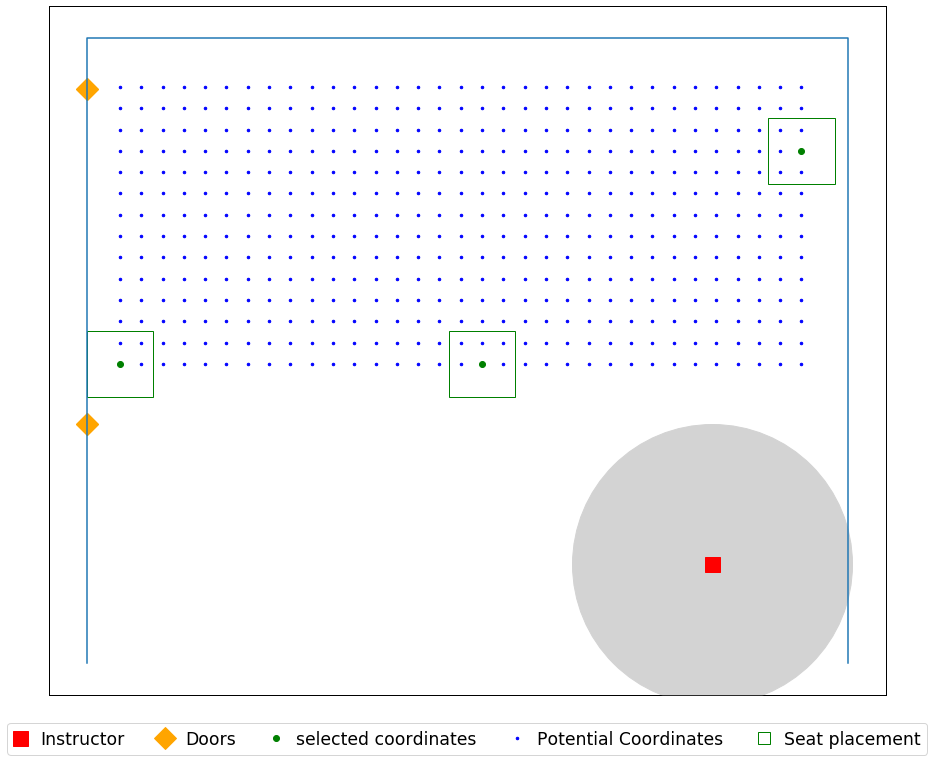

In [88]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Howey S107

In [89]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\HOWEY, JOSEPH H. S107.xlsx'

Name = 'Howey_S107'

room dimension (W x H) are [[28.58333333 23.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[5.08333333 3.08333333]]
[(0, 10), (28.583333333333332, 10), (28.583333333333332, 23.666666666666668), (0, 23.666666666666668)]
Total number of seats  is 462


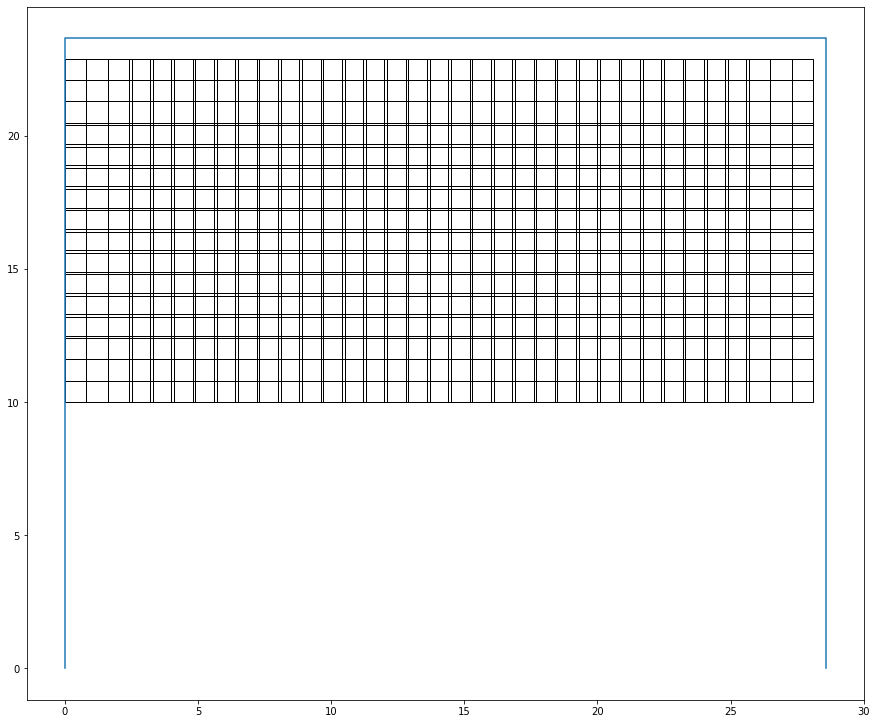

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
23
32
44
66
215
237
257
396
408
428
449
room dimension (W x H) are [[28.58333333 23.66666667]]
seat dimension (W x H) are [[2.5 2.5]]


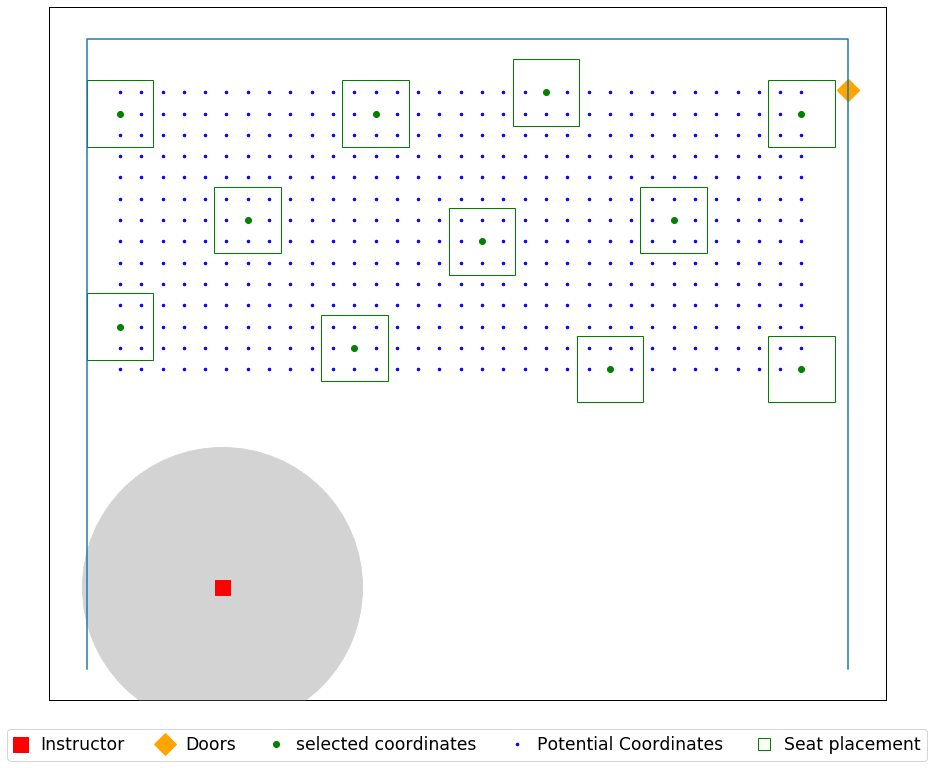

In [84]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[28.58333333 23.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[5.08333333 3.08333333]]
[(0, 10), (28.583333333333332, 10), (28.583333333333332, 23.666666666666668), (0, 23.666666666666668)]
Total number of seats  is 462


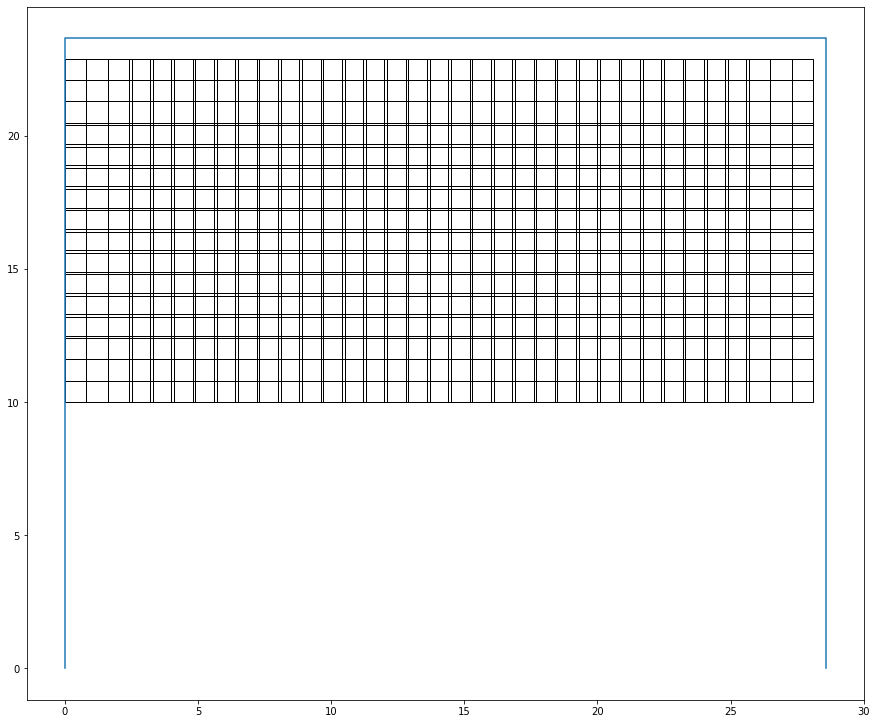

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 11.0
Optimal selection of seats (index):
23
32
44
66
215
237
257
396
408
428
449
room dimension (W x H) are [[28.58333333 23.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
31
44
54
66
362
374
396
417
room dimension (W x H) are [[28.58333333 23.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
13
29
264
450
room dimension (W x H) are [[28.58333333 23.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
22
32
44
66
396
428
441
451
room dimension (W x H) are

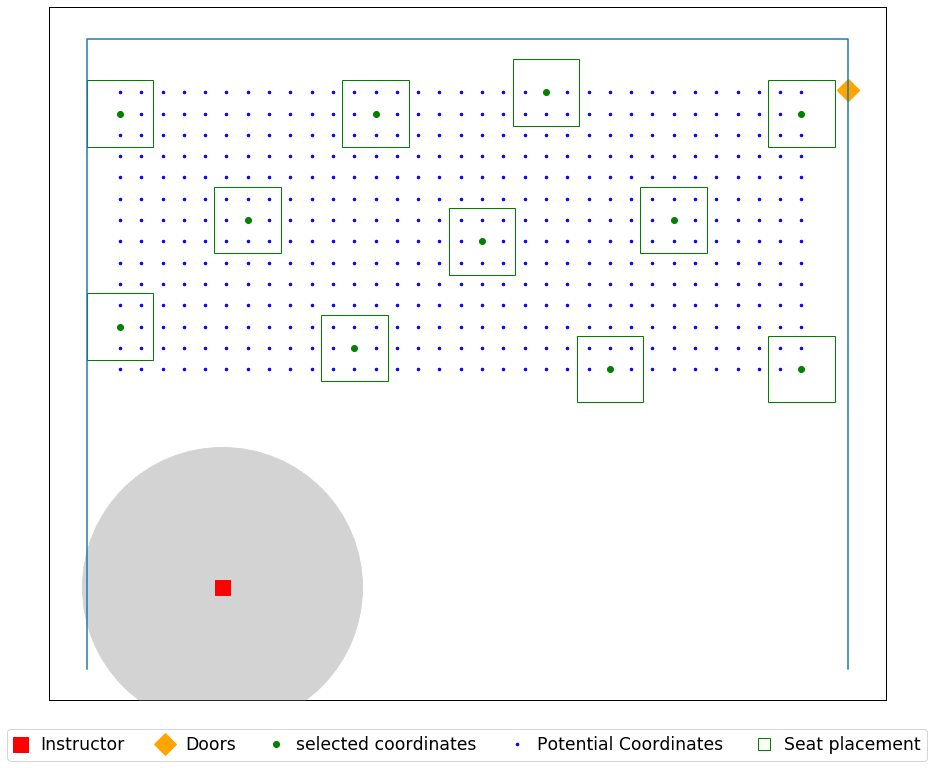

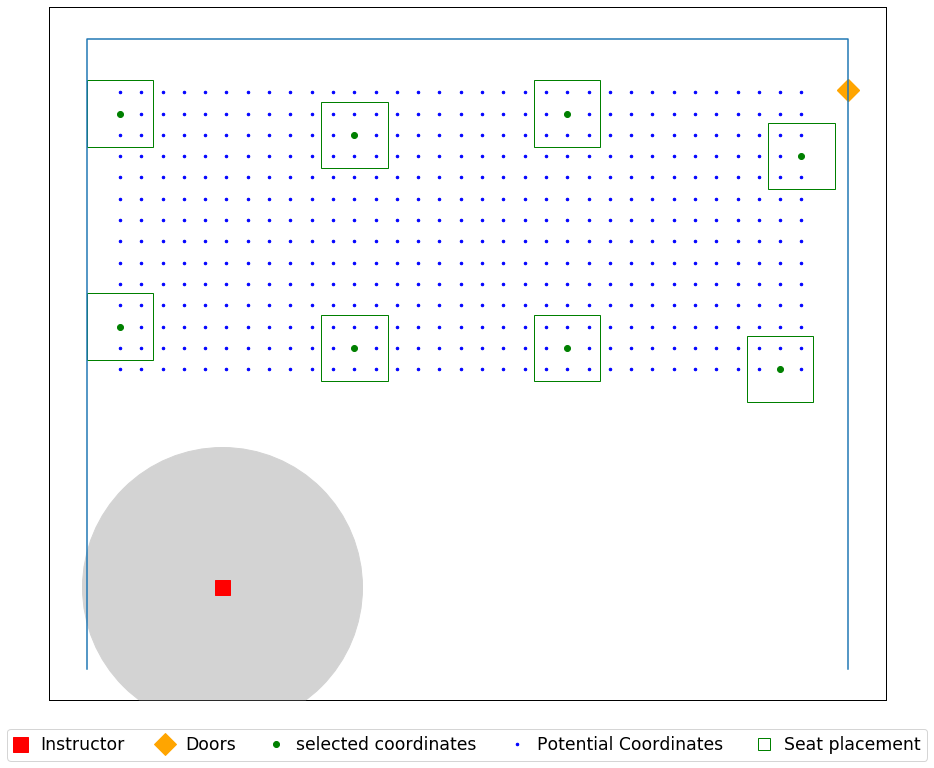

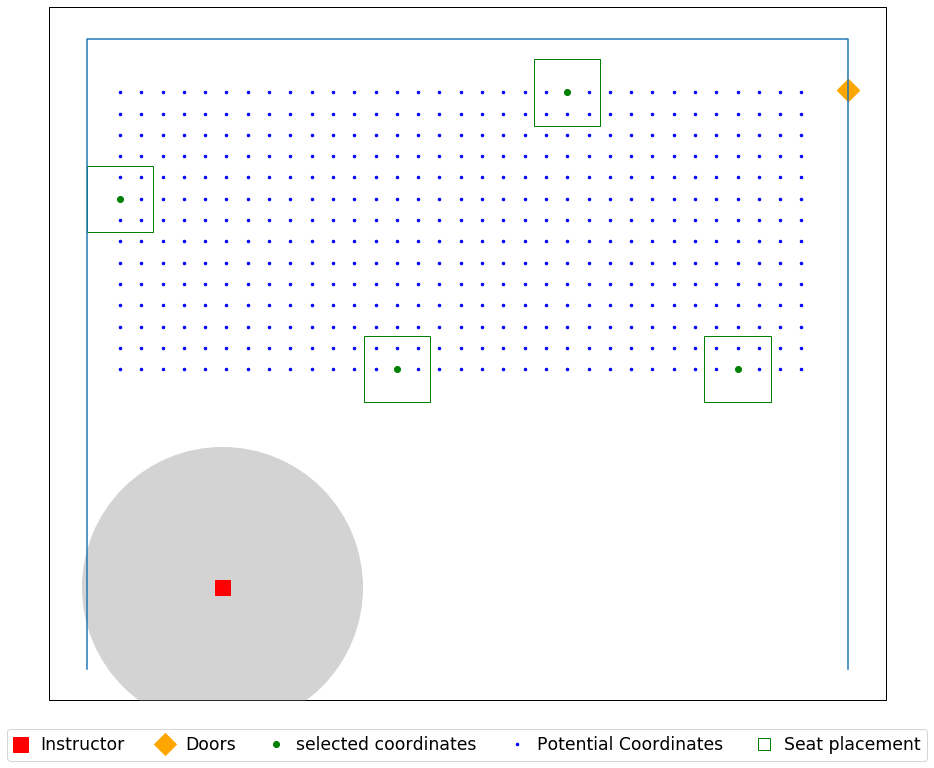

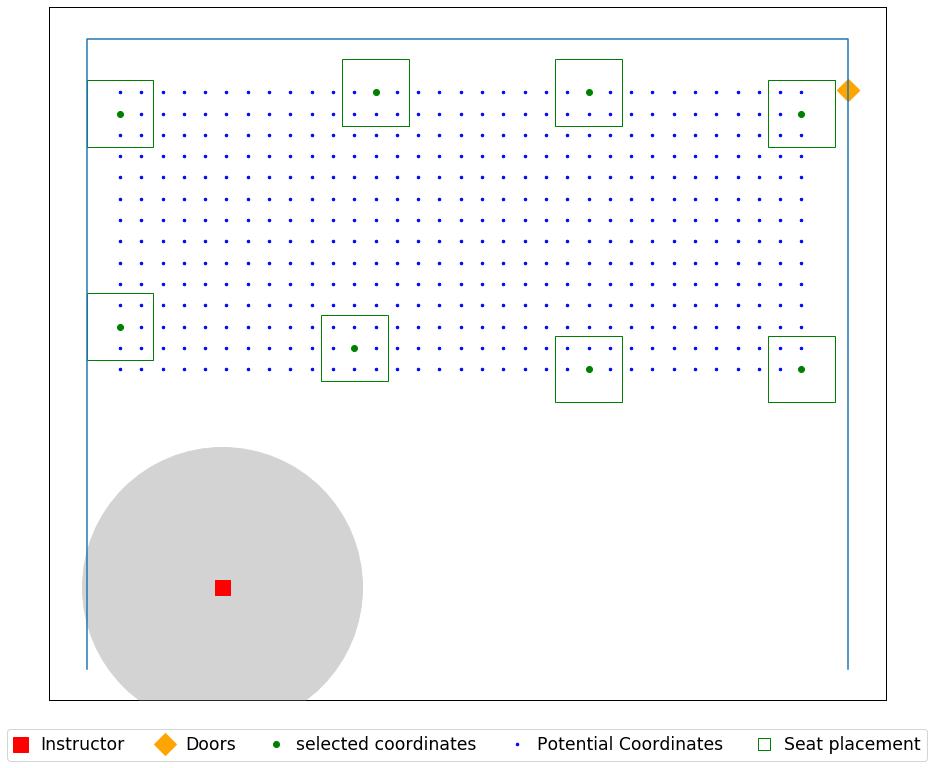

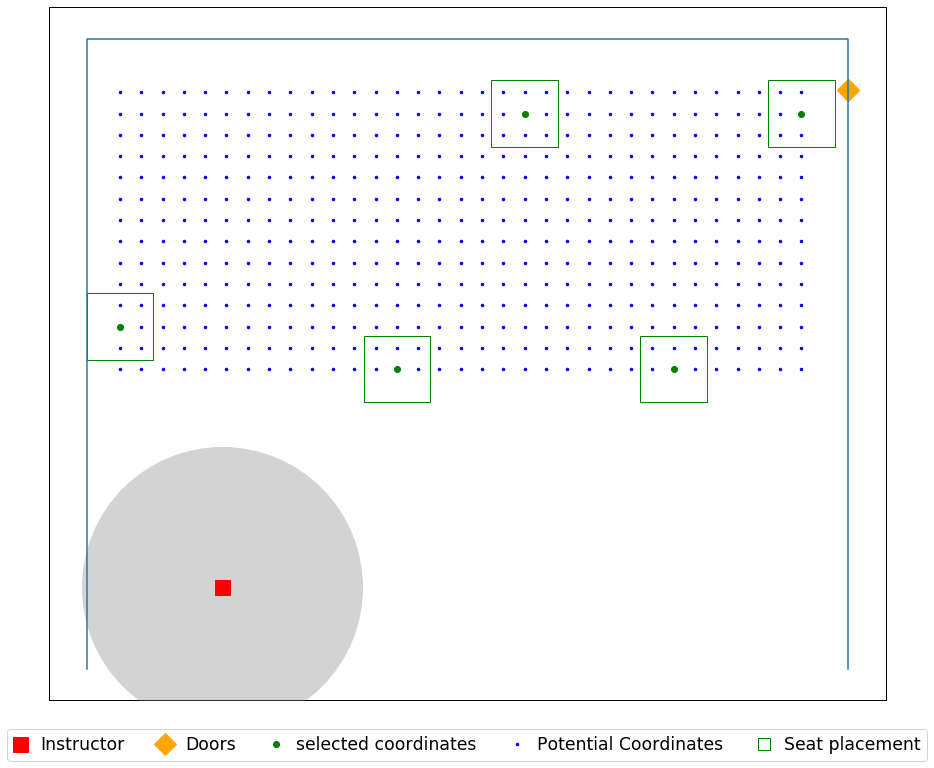

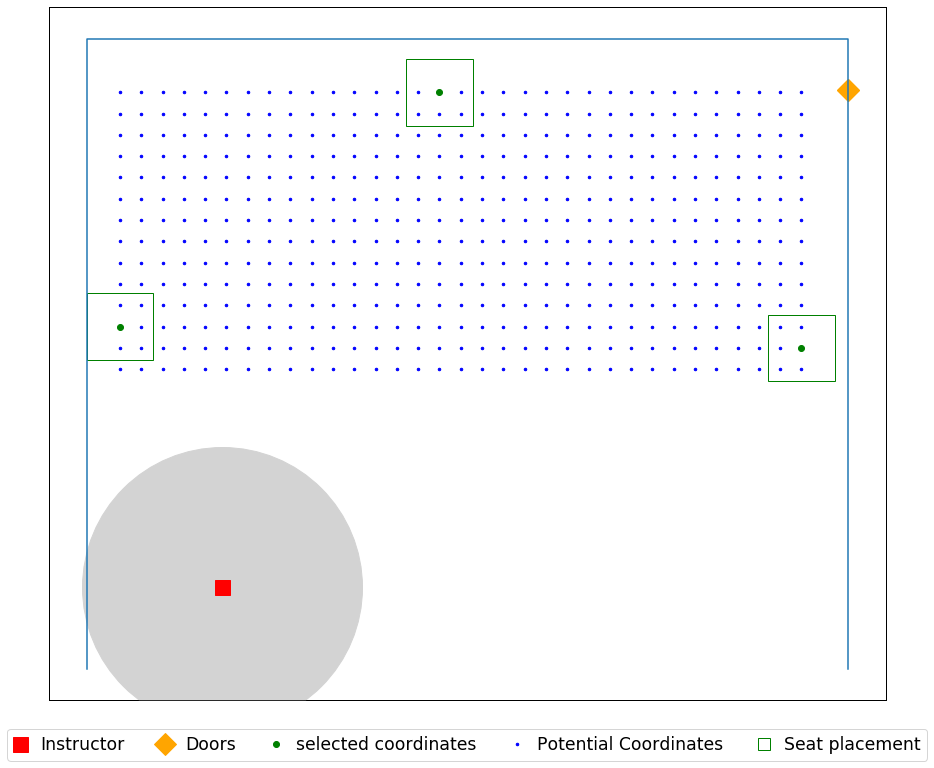

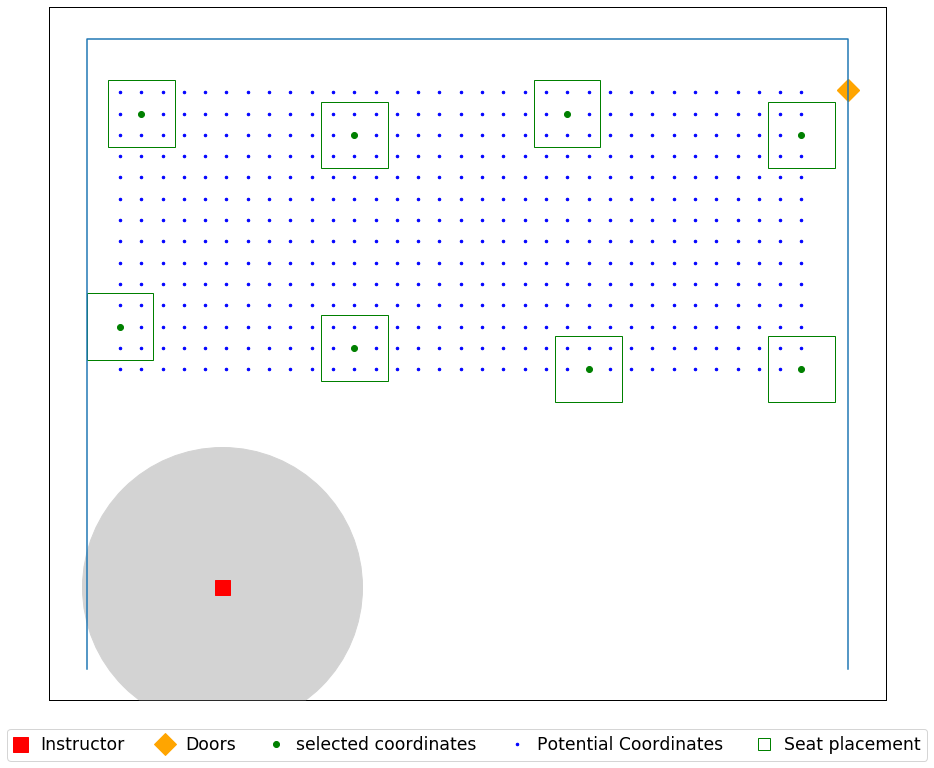

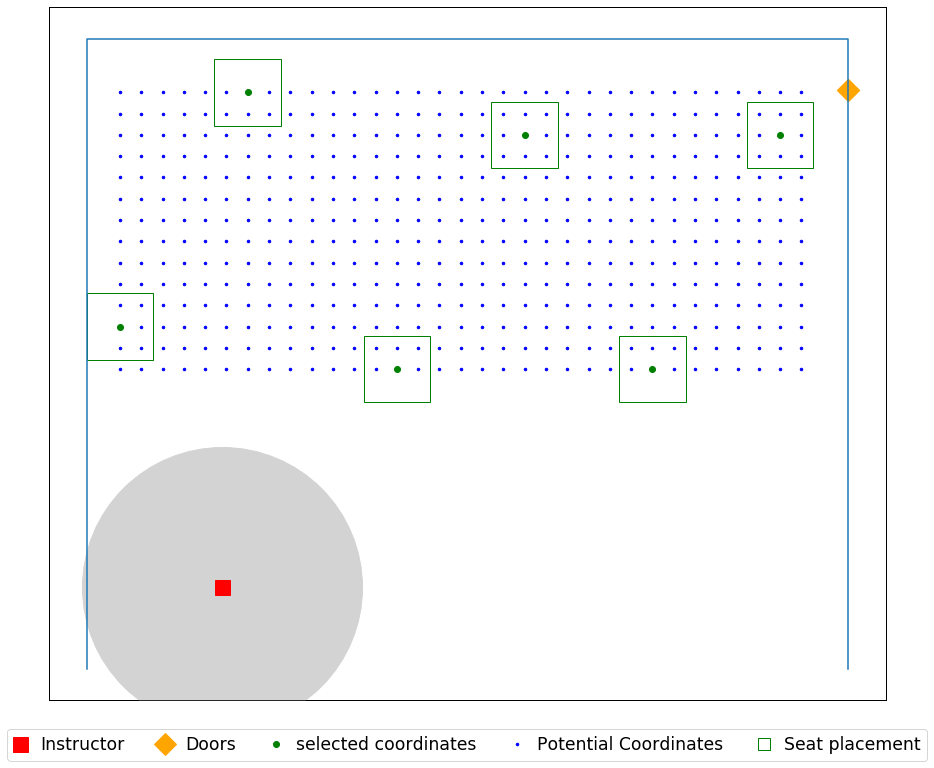

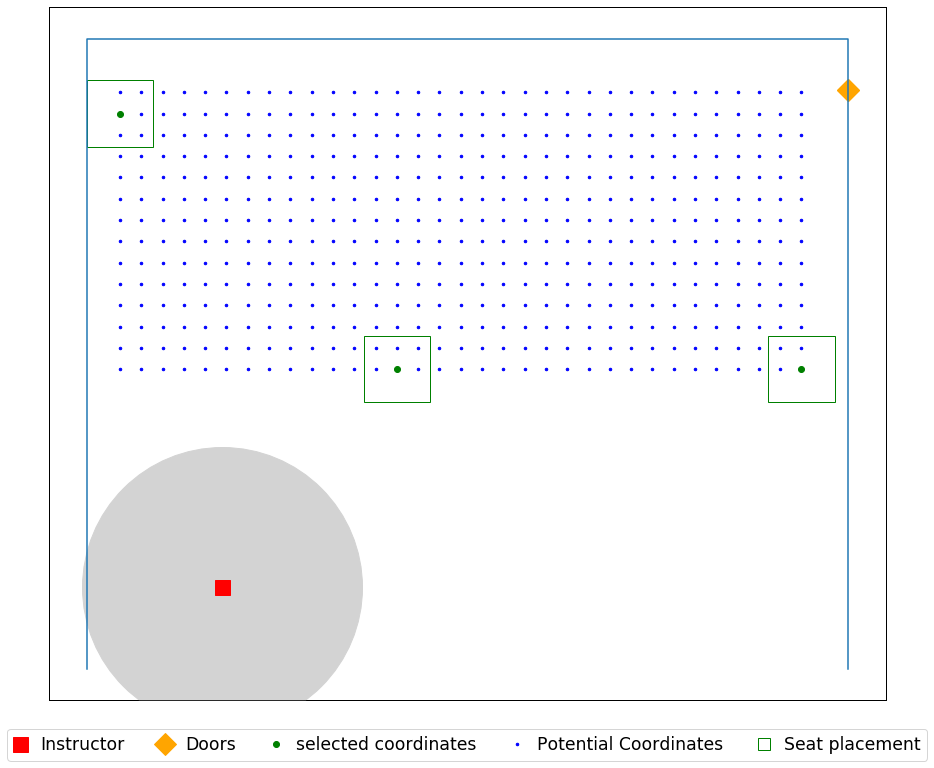

In [90]:
seat_loc = seat_coordinates(data_file, 0.8)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 169

In [13]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 169.xlsx'

Name = 'Skiles_169'

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[3.58333333 3.75      ]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


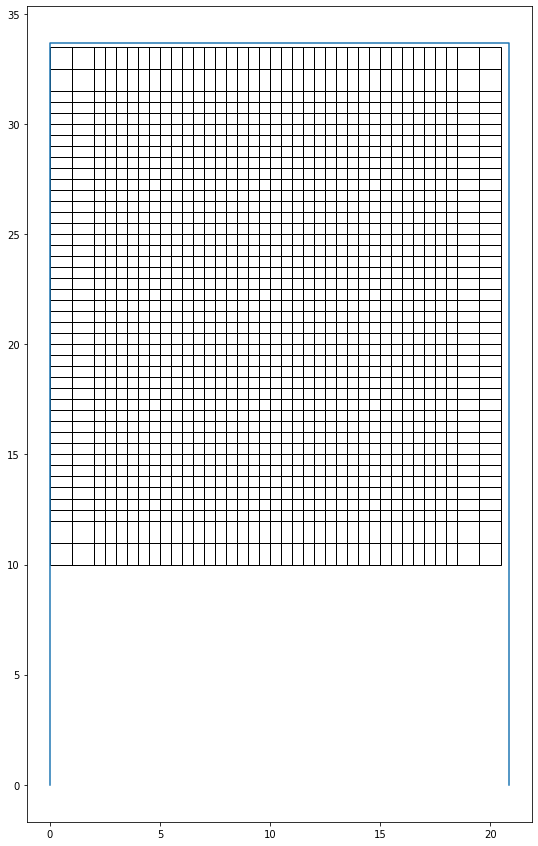

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
12
18
57
63
126
132
171
177
259
284
285
291
373
398
399
405
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]


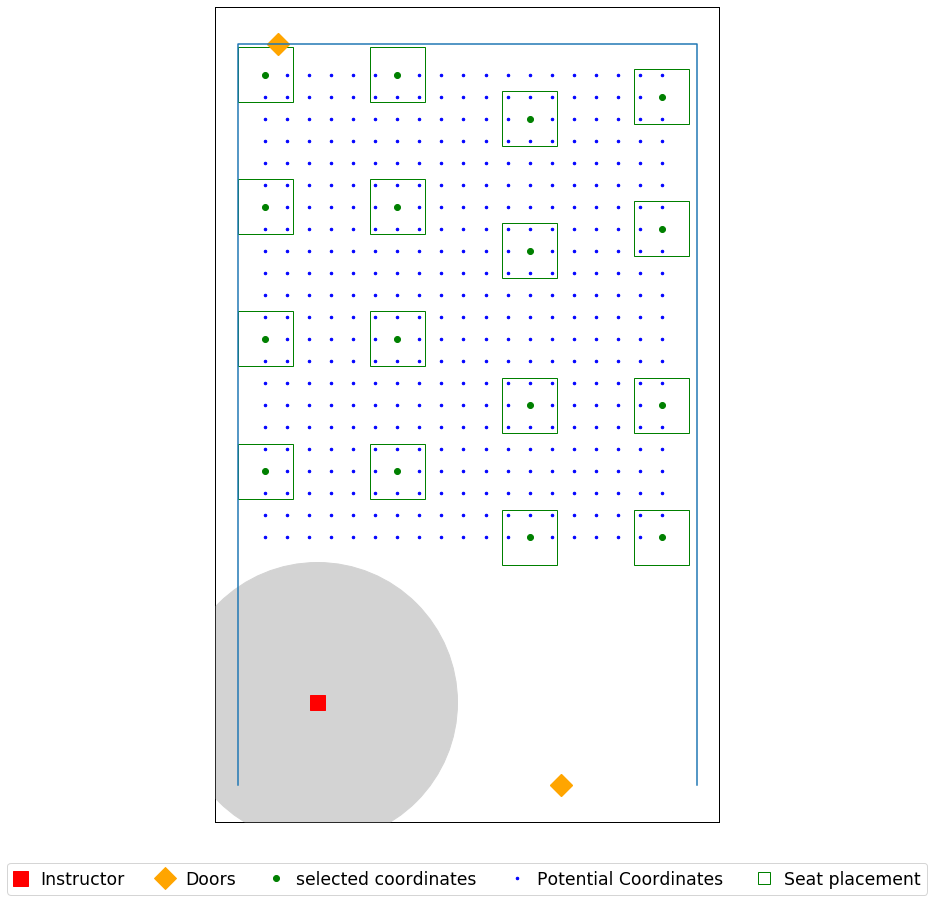

In [14]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[3.58333333 3.75      ]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


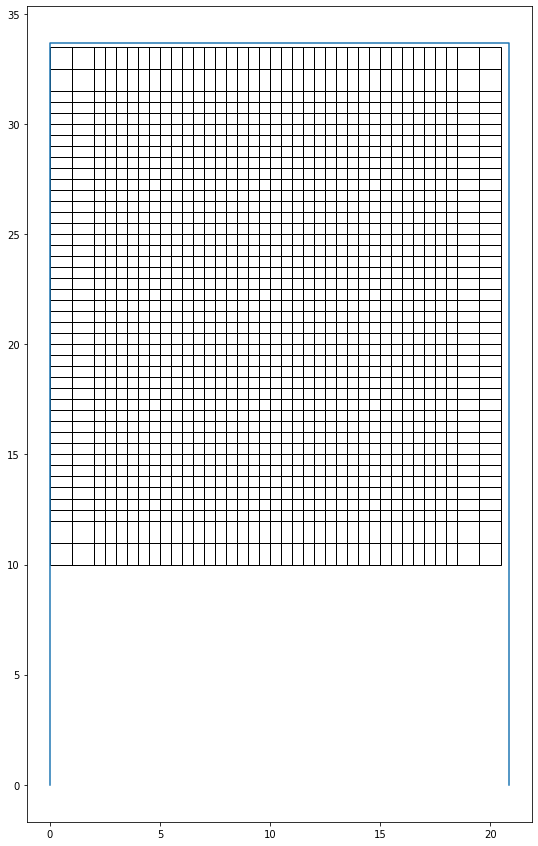

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
12
18
57
63
126
132
171
177
259
284
285
291
373
398
399
405
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
10
18
57
159
167
228
296
365
379
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
18
57
200
323
379
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
9
18
57
160
168
209
312
3

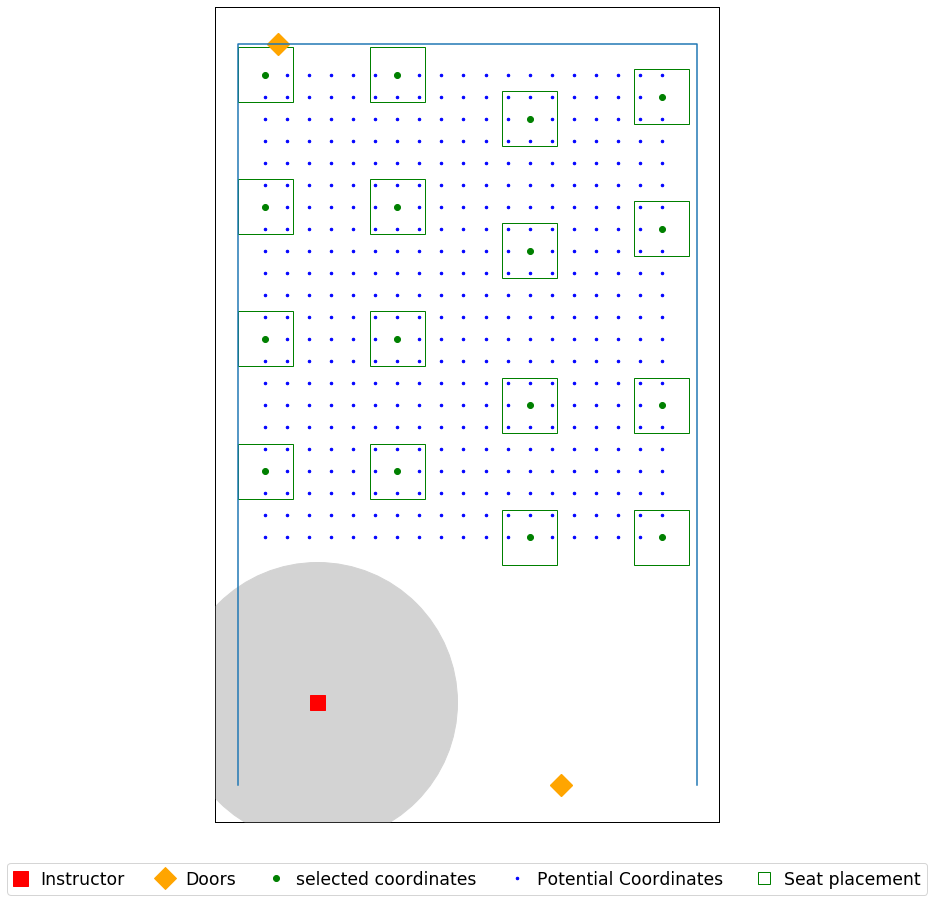

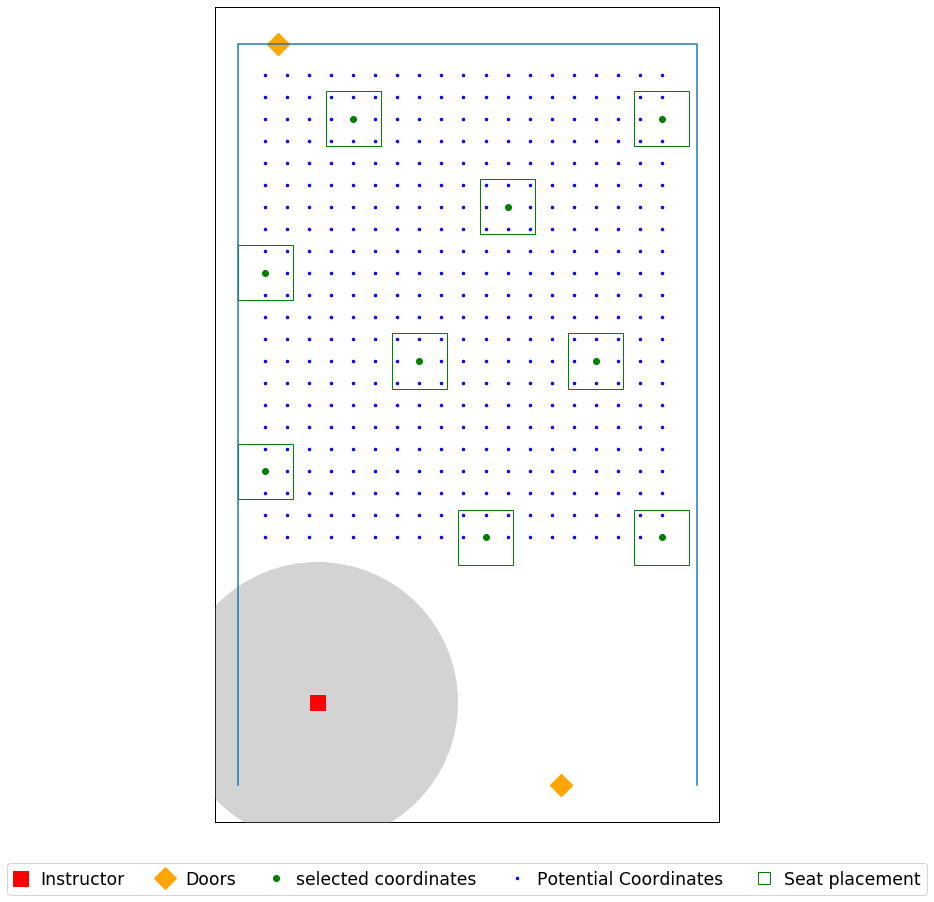

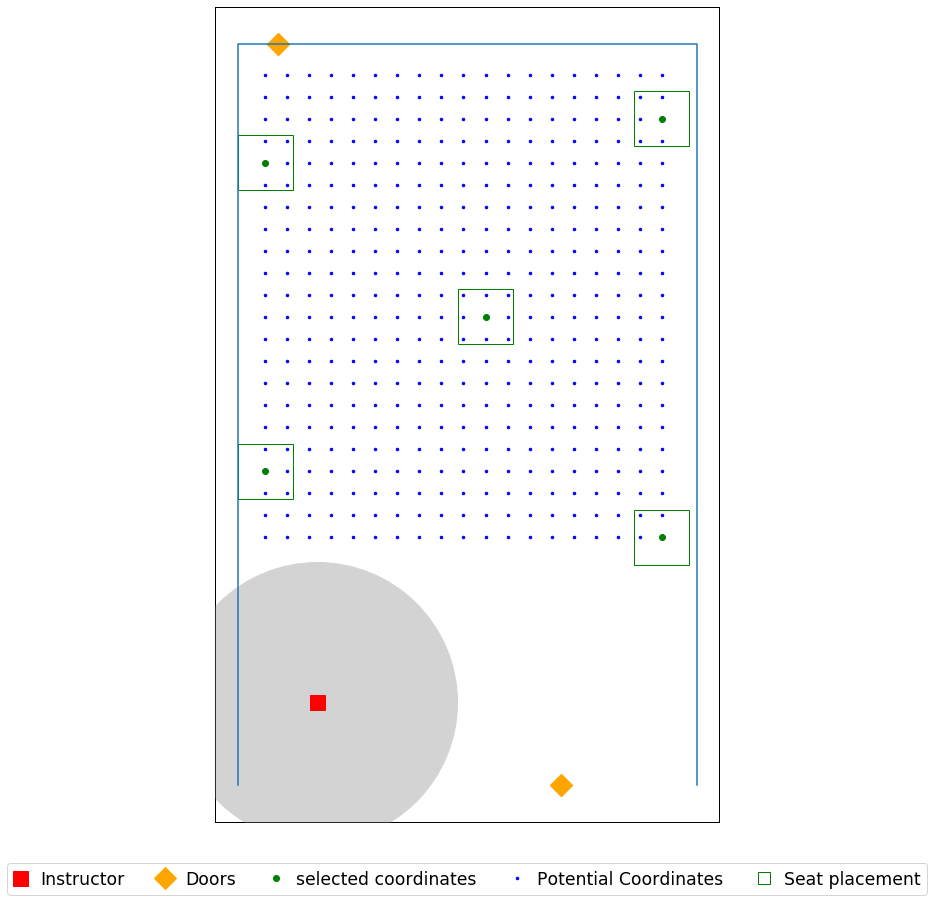

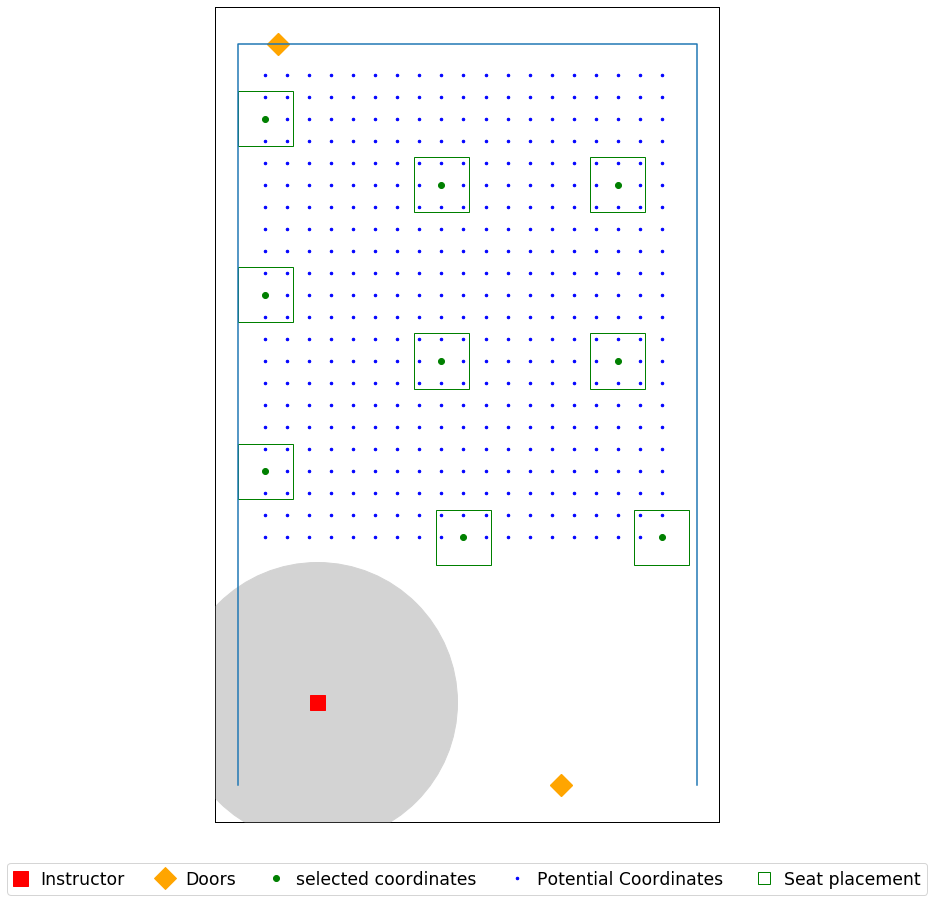

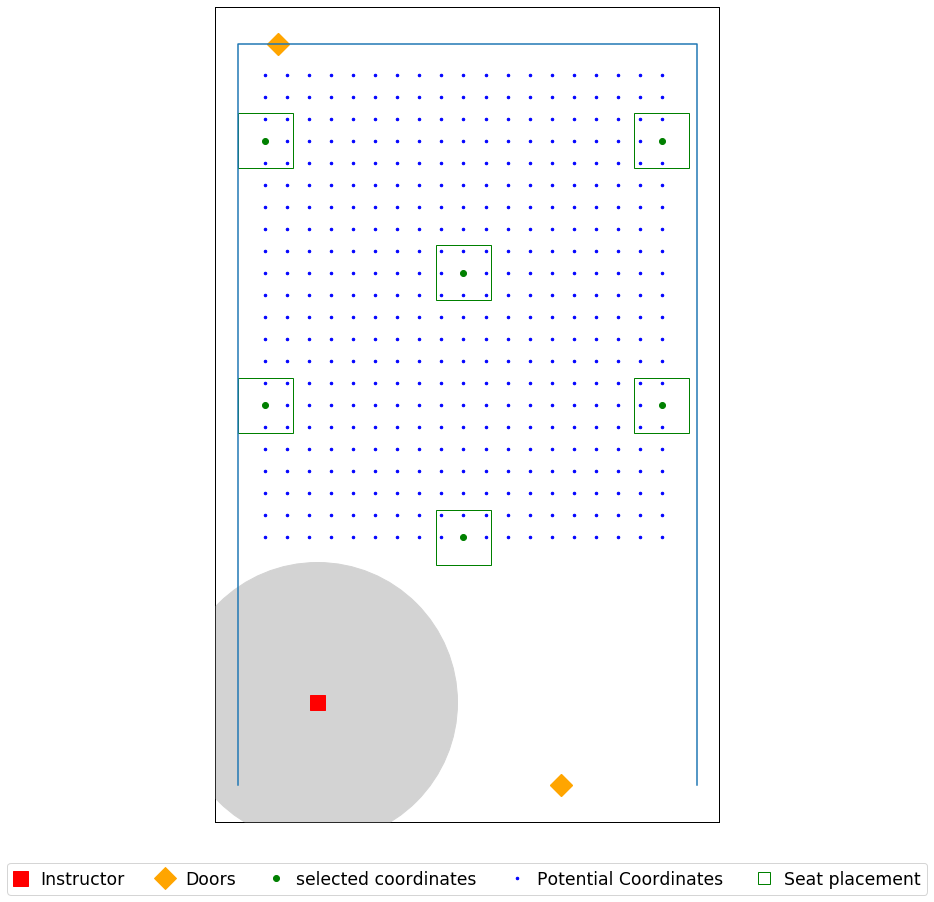

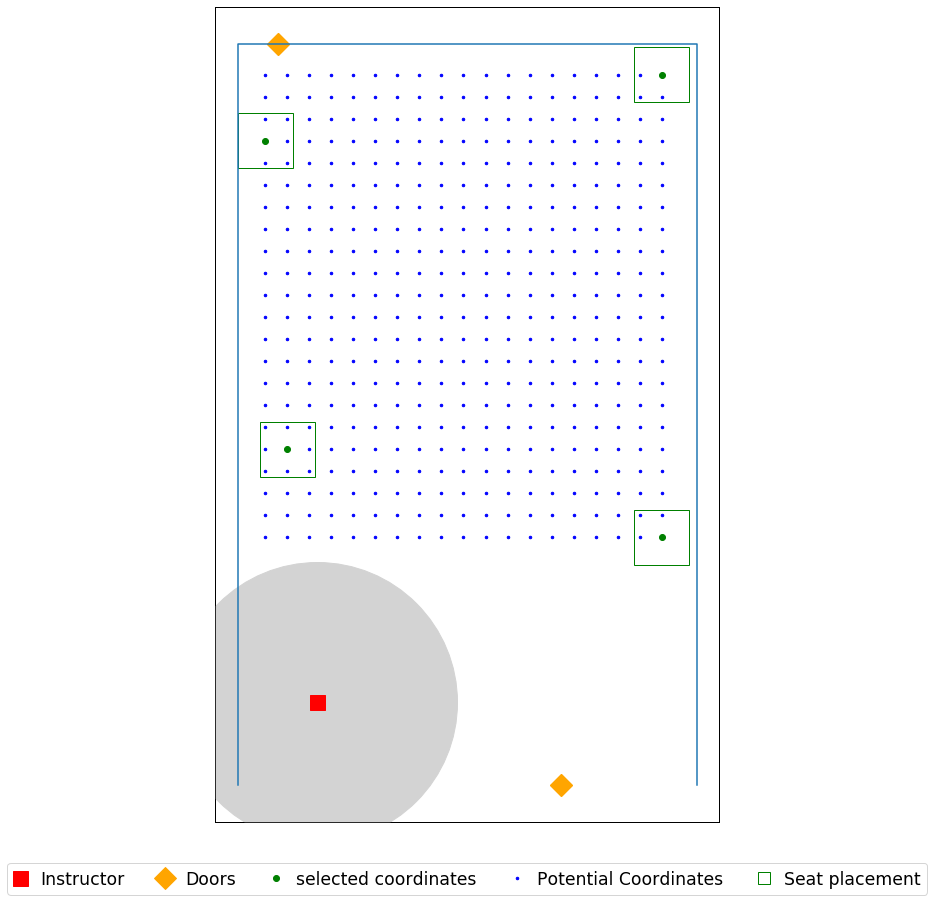

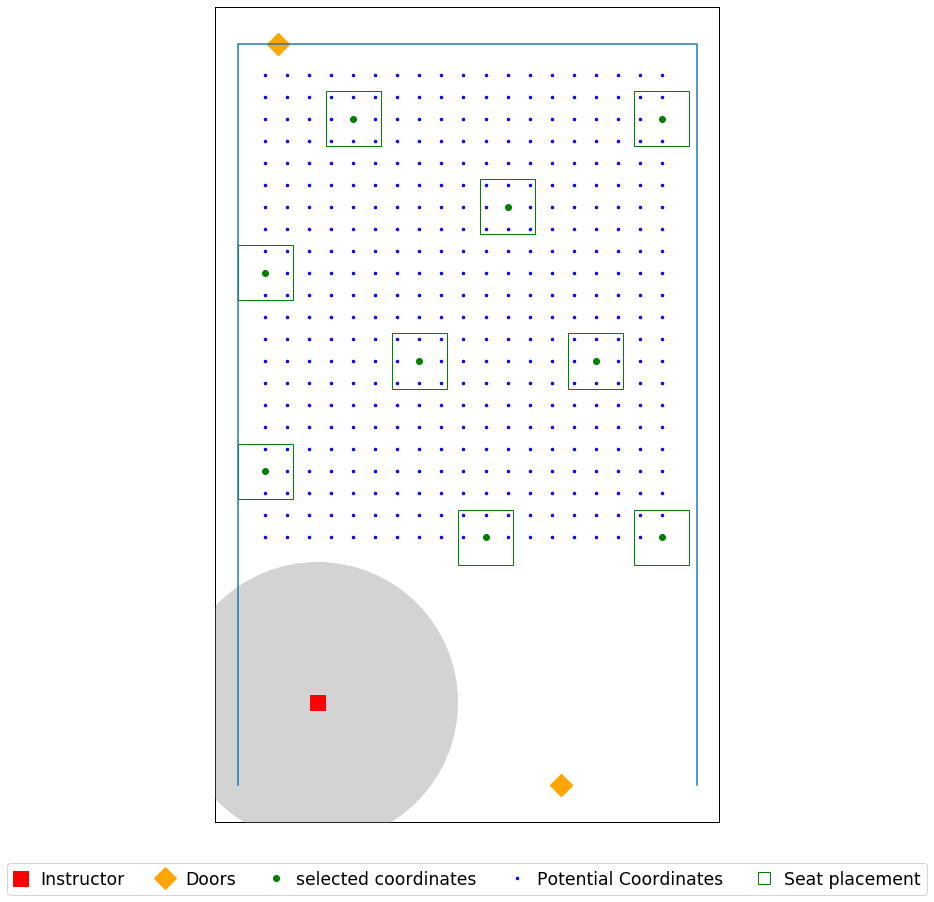

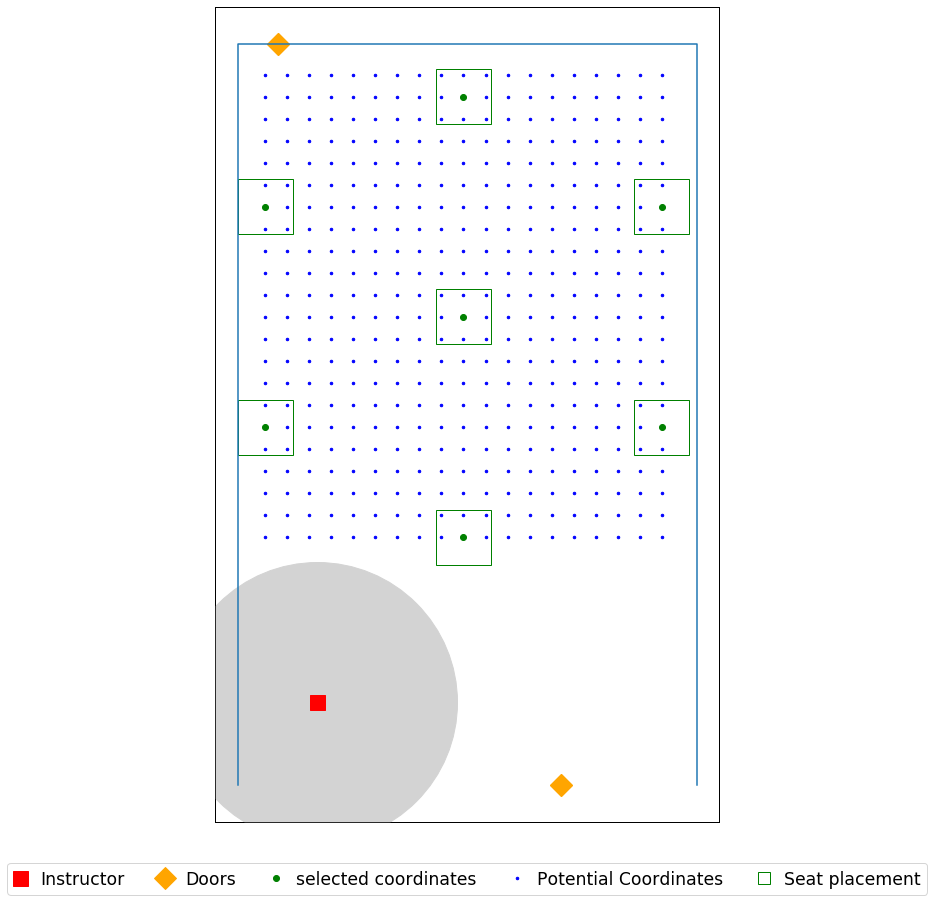

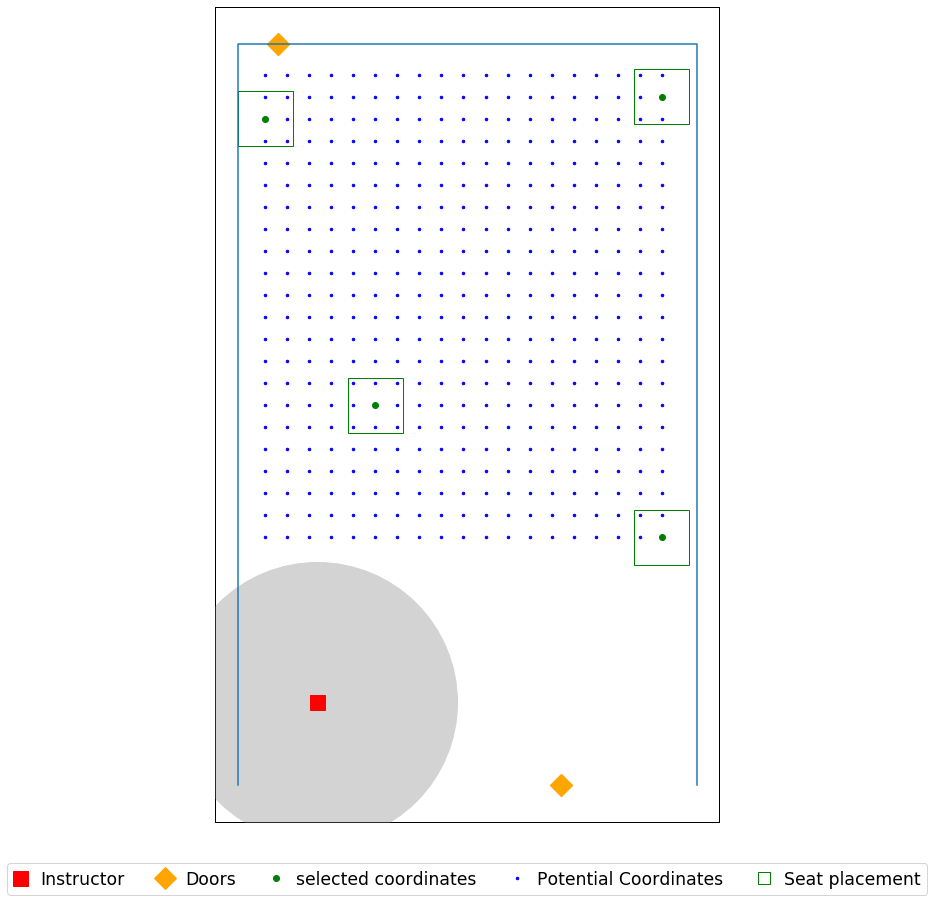

In [15]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 246

In [18]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 246.xlsx'

Name = 'Skiles_246'

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[2.83333333 3.08333333]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


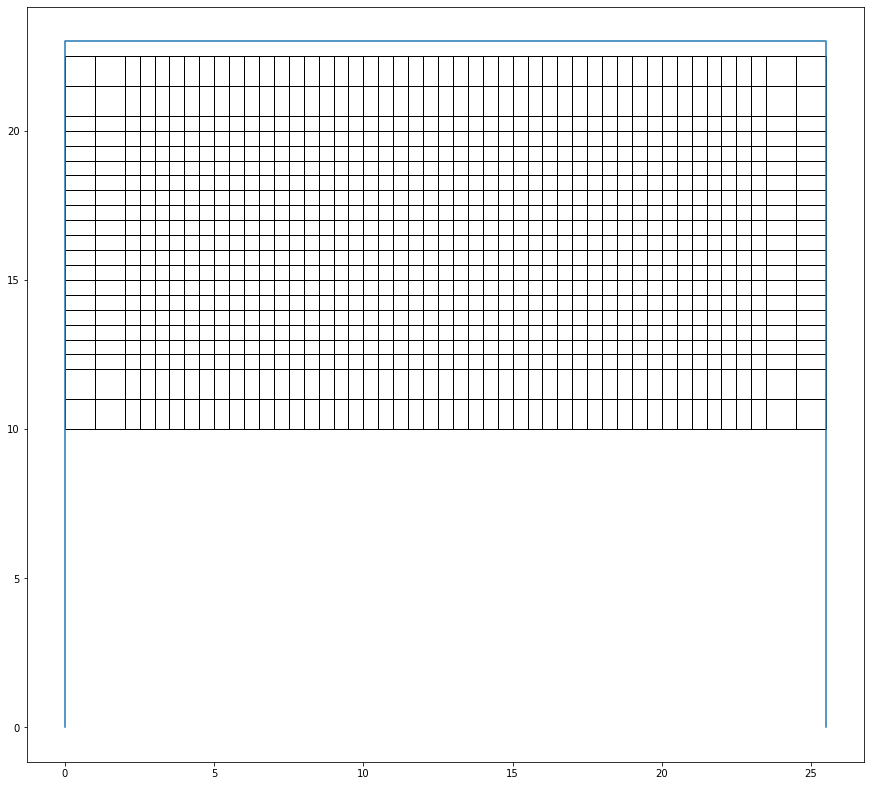

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
12
23
30
48
113
167
198
228
240
258
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]


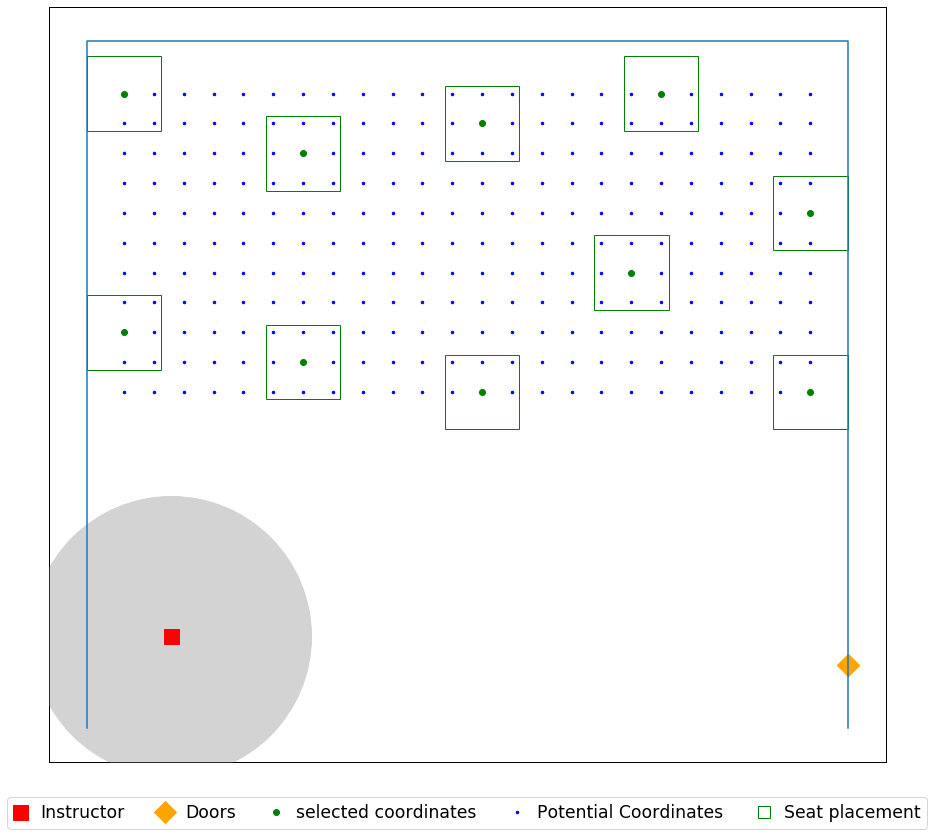

In [19]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[2.83333333 3.08333333]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


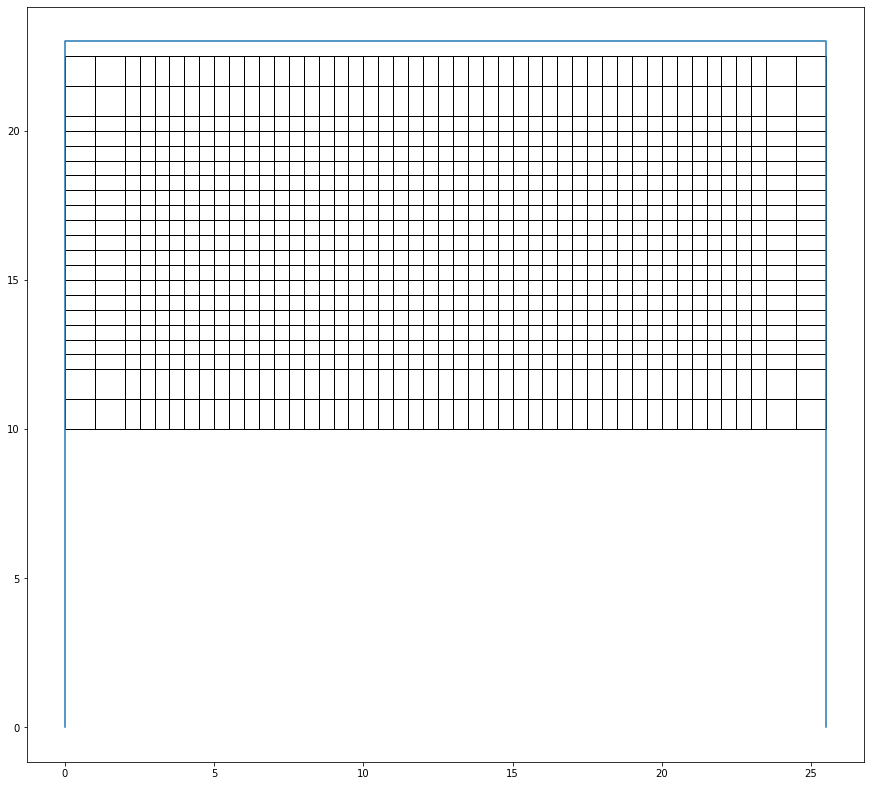

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
12
23
30
48
113
167
198
228
240
258
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
14
23
48
151
240
255
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
8
23
216
256
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
8
16
48
167
199
207
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
resu

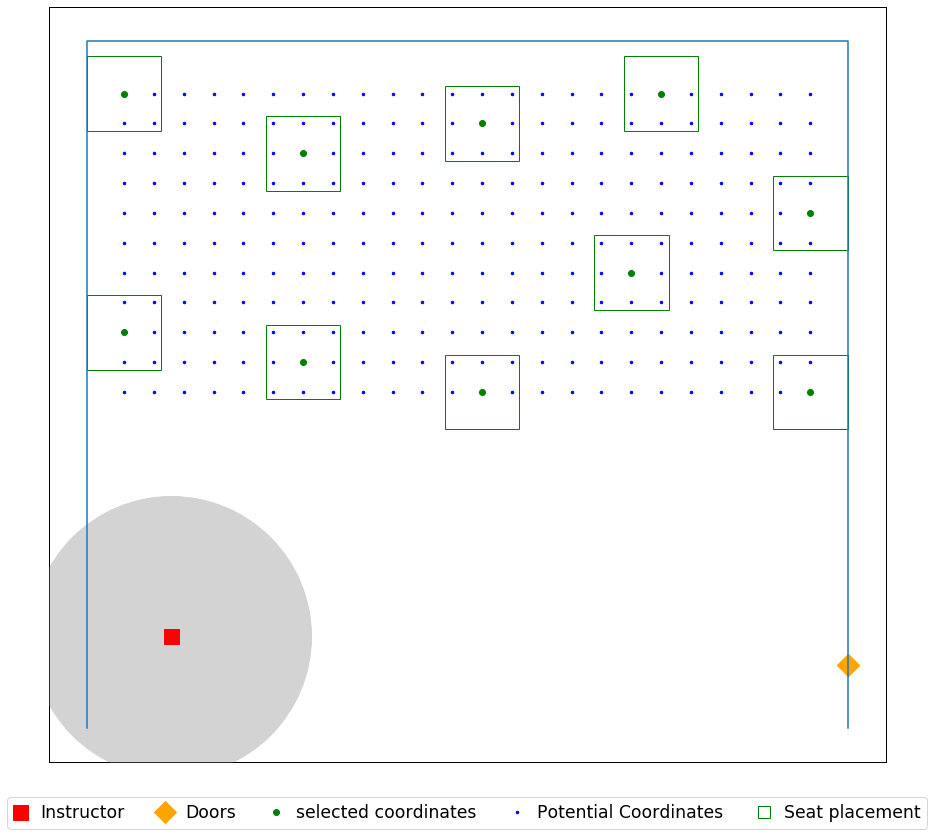

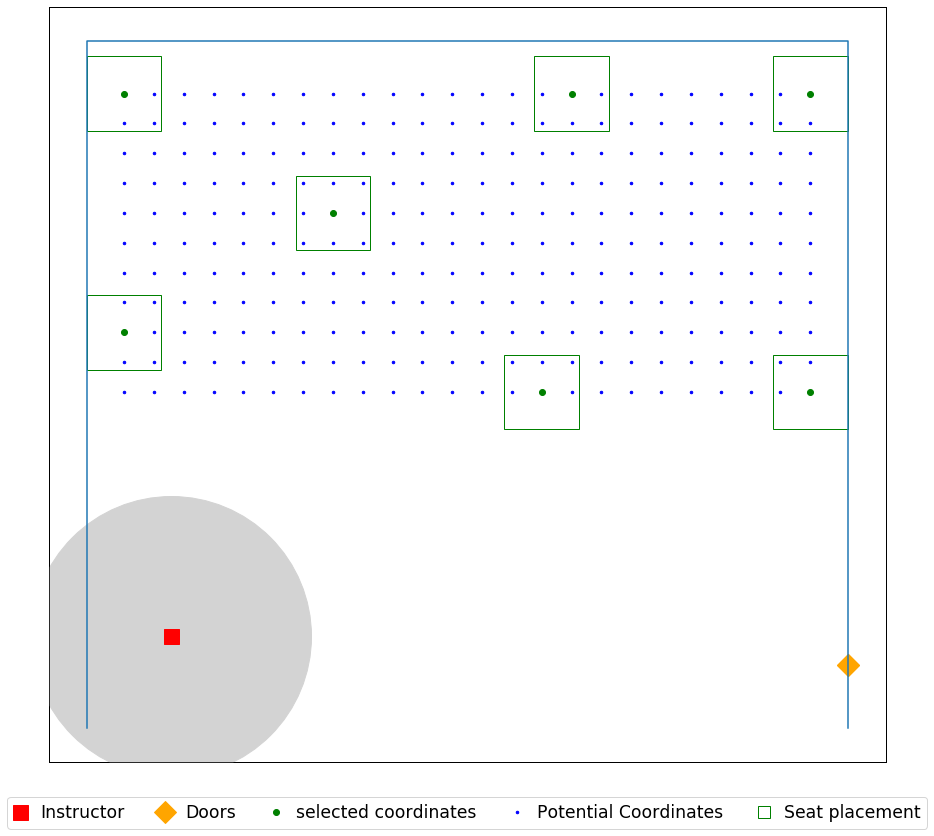

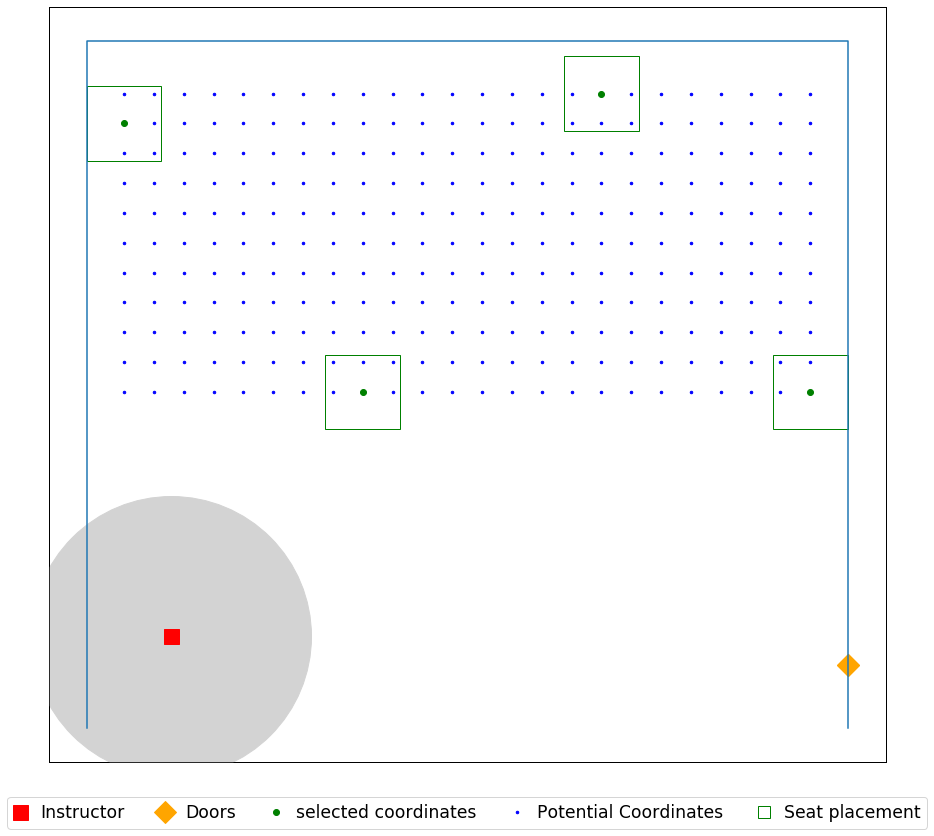

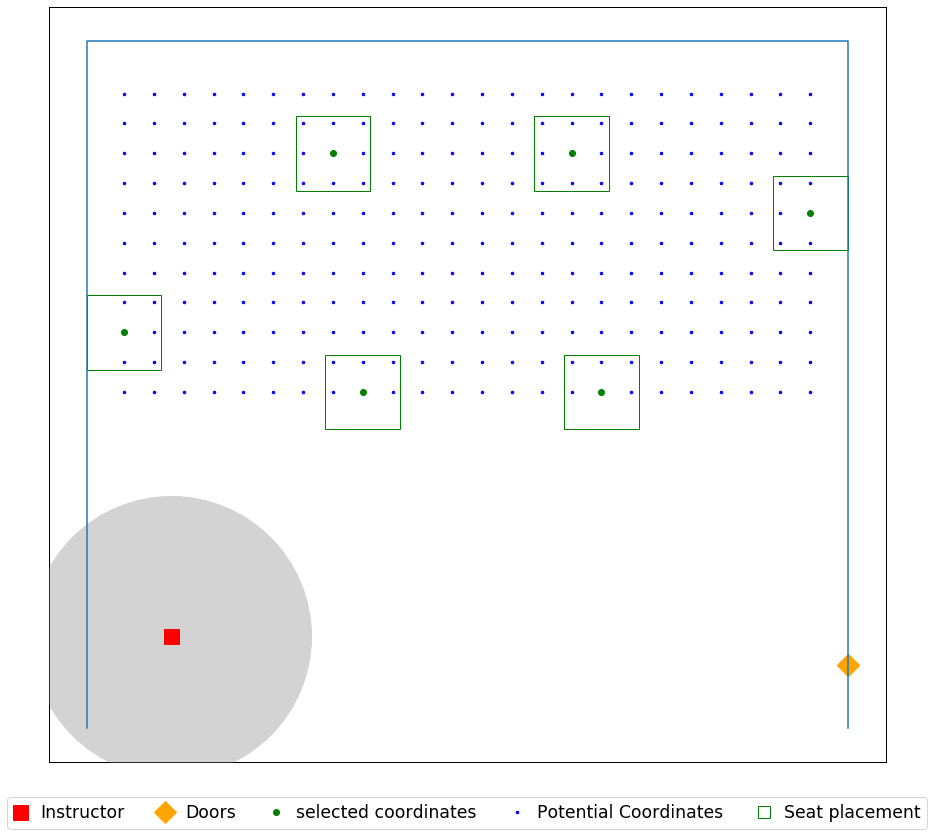

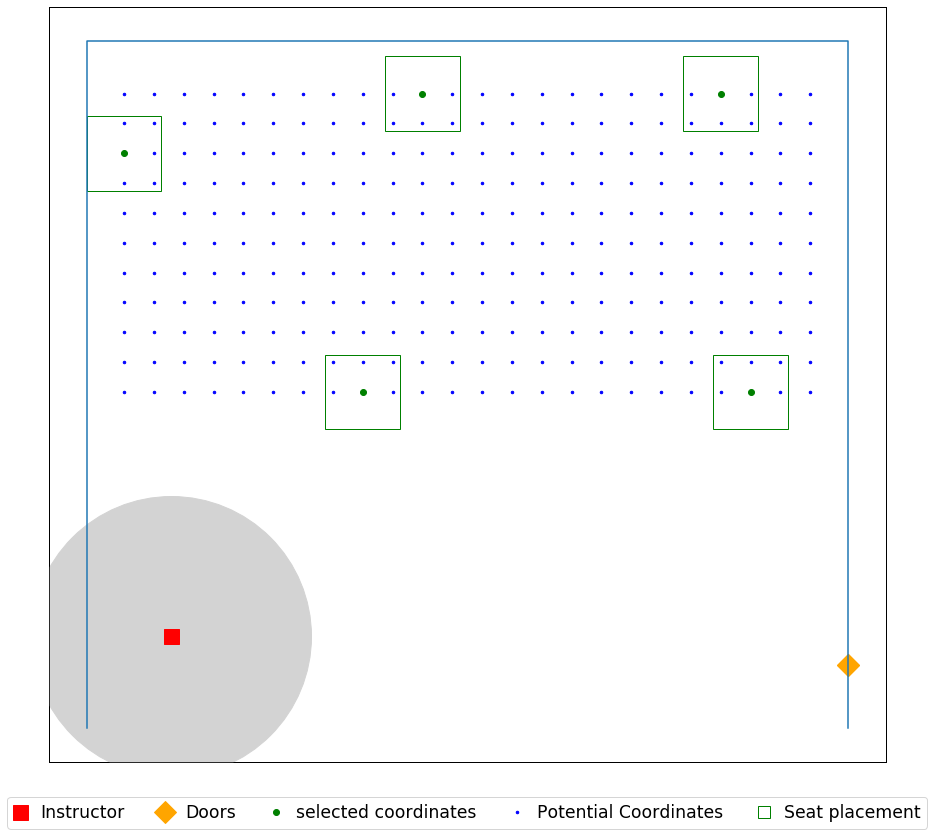

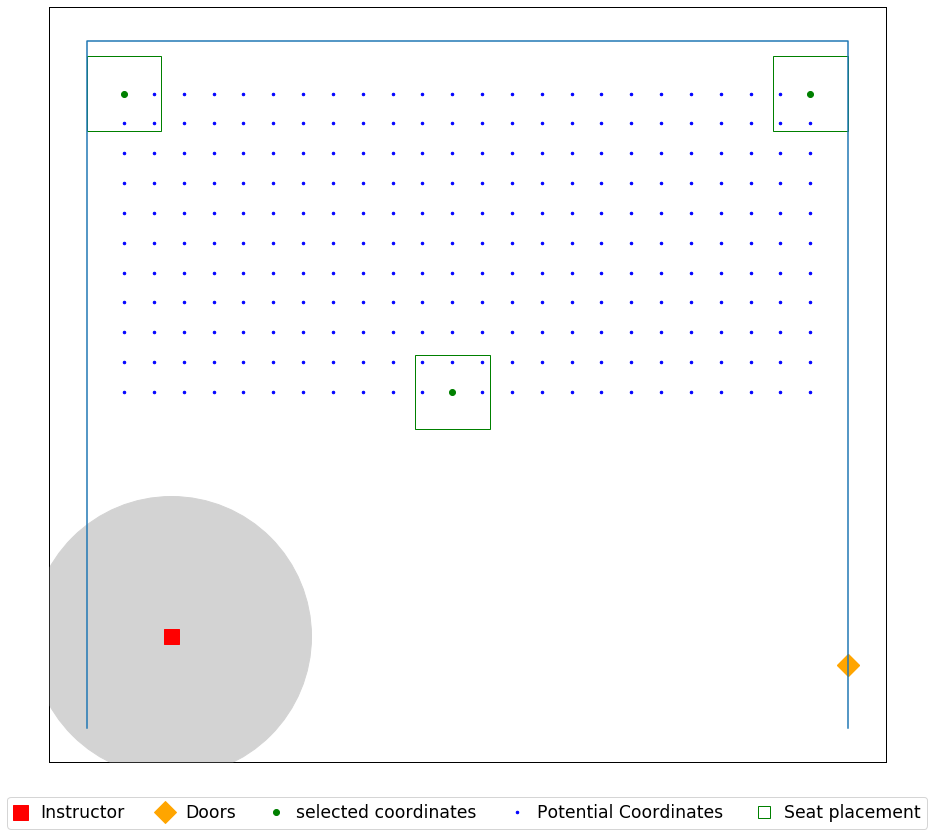

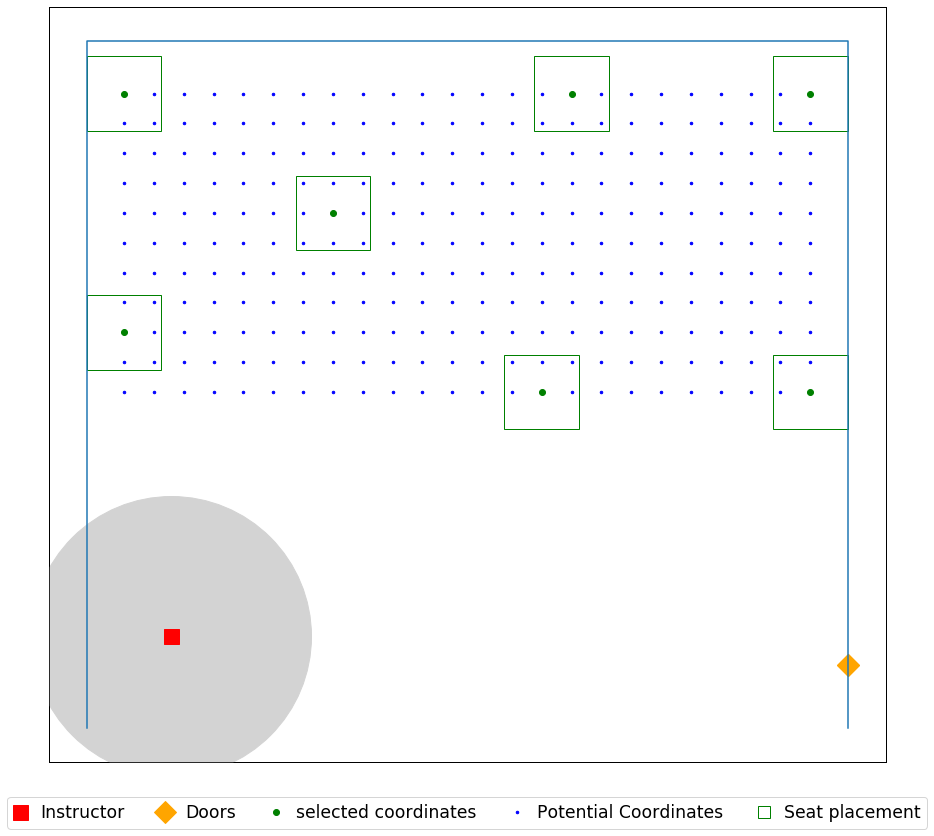

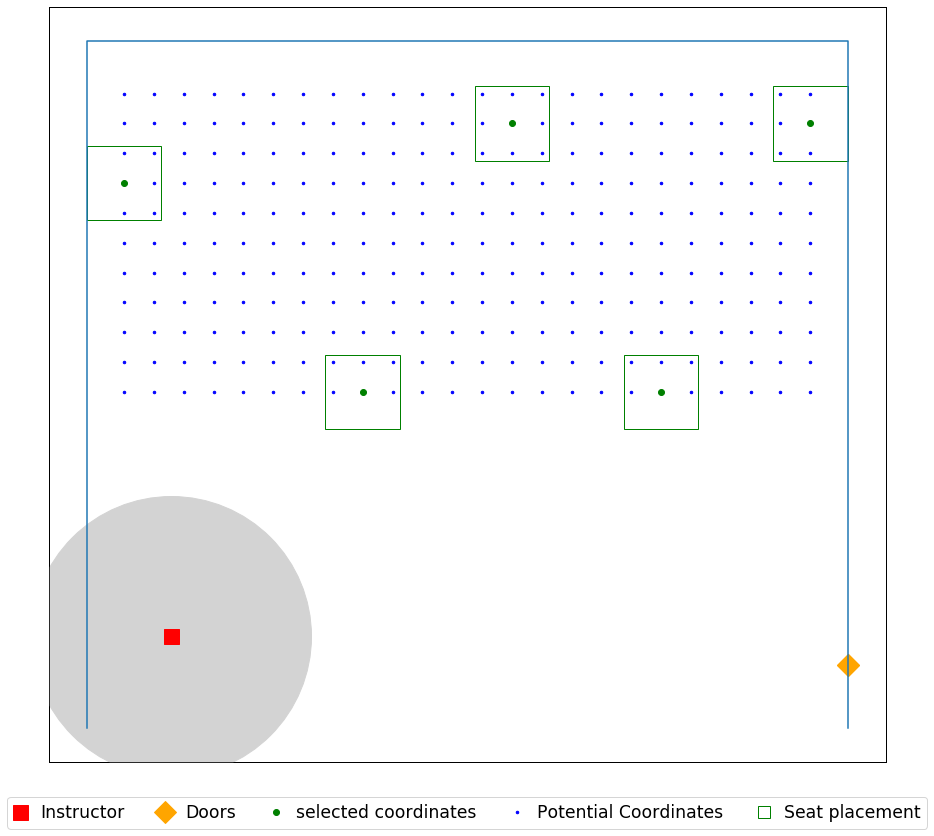

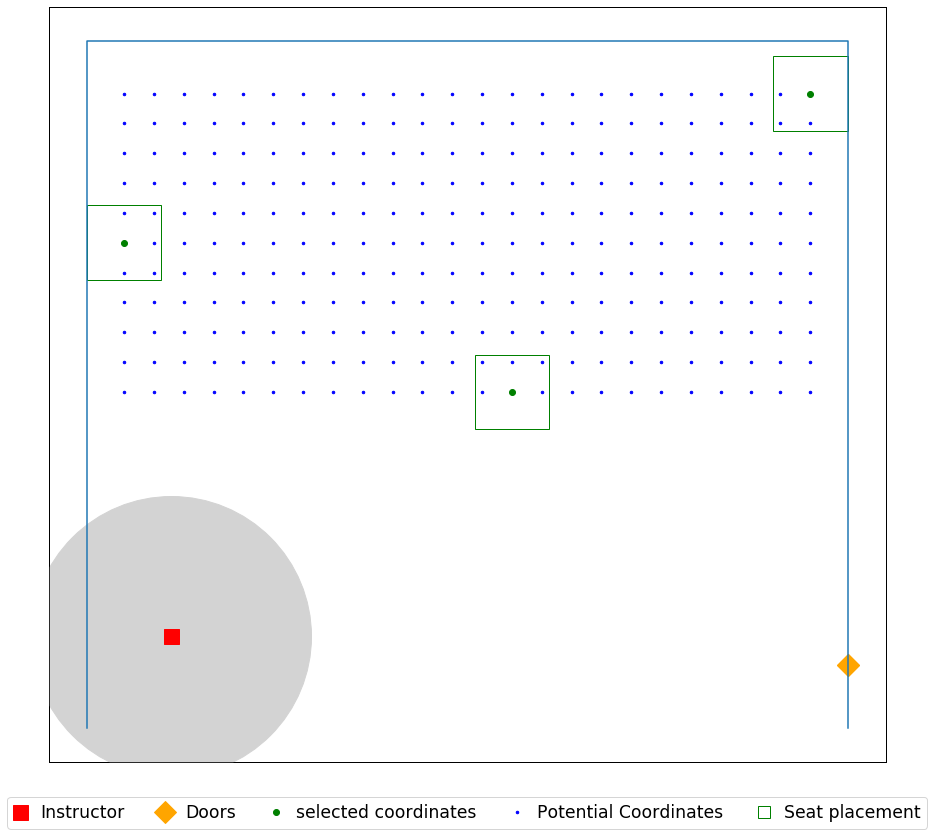

In [20]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 256

In [21]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 256.xlsx'

Name = 'Skiles_256'

room dimension (W x H) are [[19.5 35. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[16.75        3.41666667]]
[(0, 10), (19.5, 10), (19.5, 35.0), (0, 35.0)]
Total number of seats  is 414


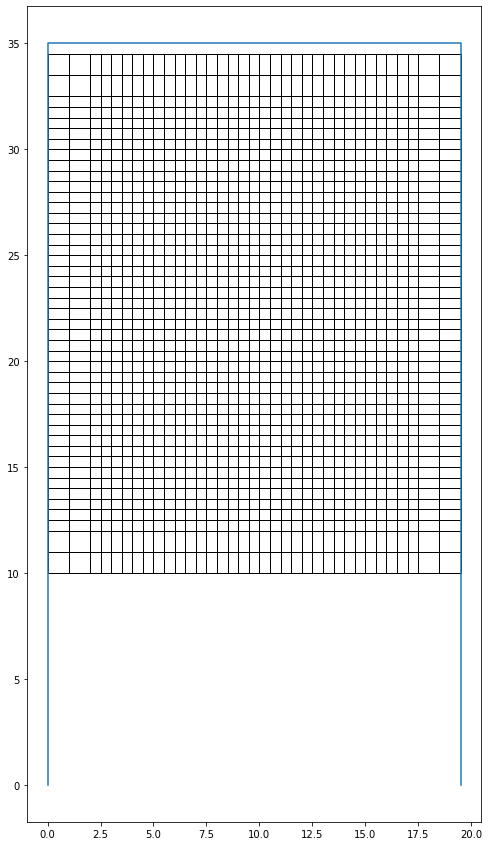

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
6
48
108
114
125
191
221
233
288
300
330
396
407
413
room dimension (W x H) are [[19.5 35. ]]
seat dimension (W x H) are [[2.5 2.5]]


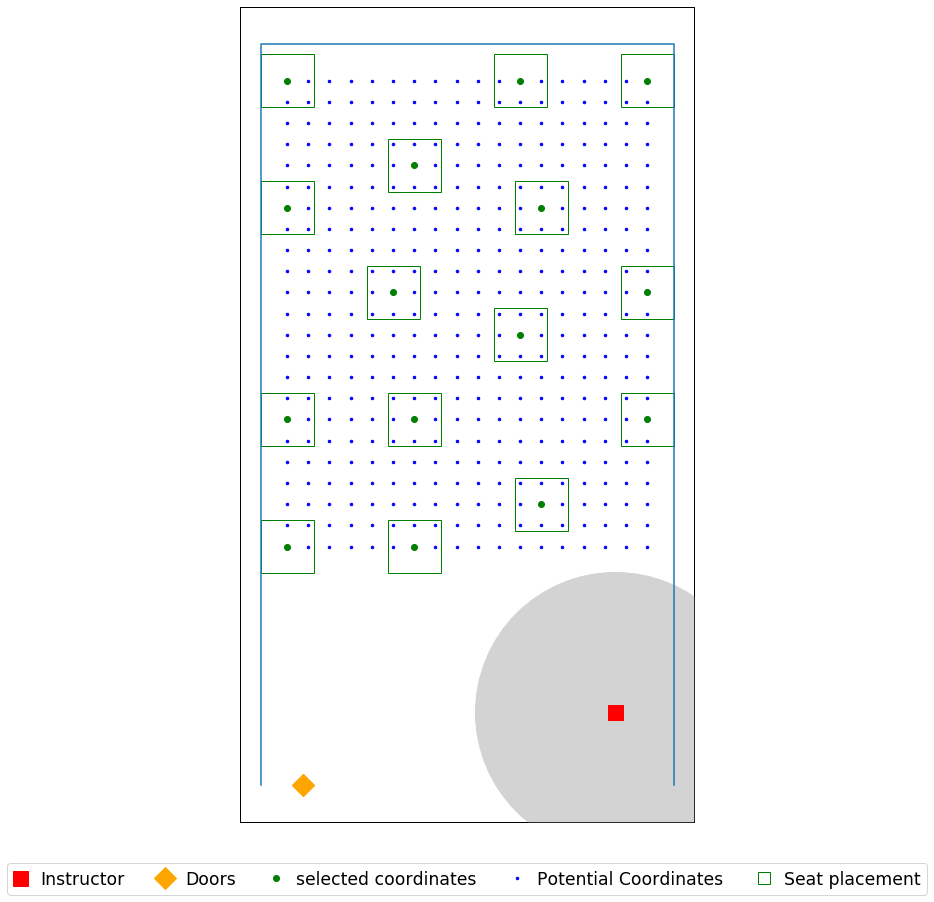

In [22]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[19.5 35. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[16.75        3.41666667]]
[(0, 10), (19.5, 10), (19.5, 35.0), (0, 35.0)]
Total number of seats  is 414


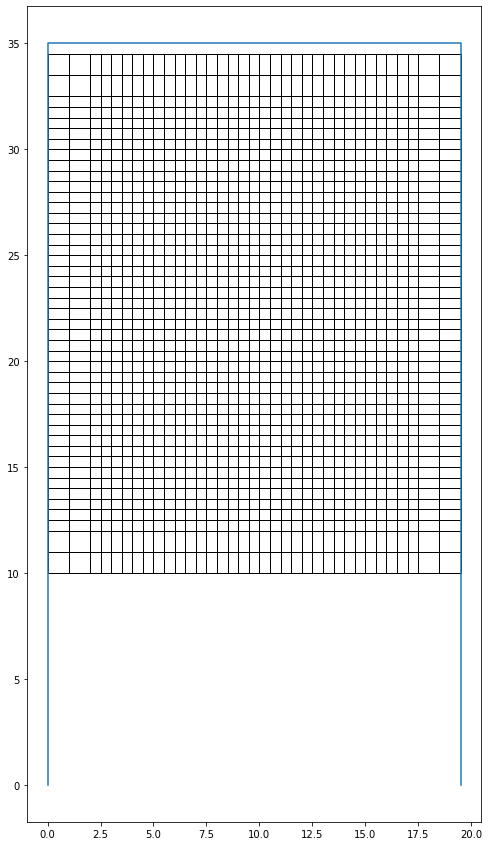

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
6
48
108
114
125
191
221
233
288
300
330
396
407
413
room dimension (W x H) are [[19.5 35. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
9
143
144
152
274
282
396
404
412
room dimension (W x H) are [[19.5 35. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
0
48
216
251
386
room dimension (W x H) are [[19.5 35. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
70
144
152
214
288
296
358
room dimension (W x H) are [[19.5 35. 

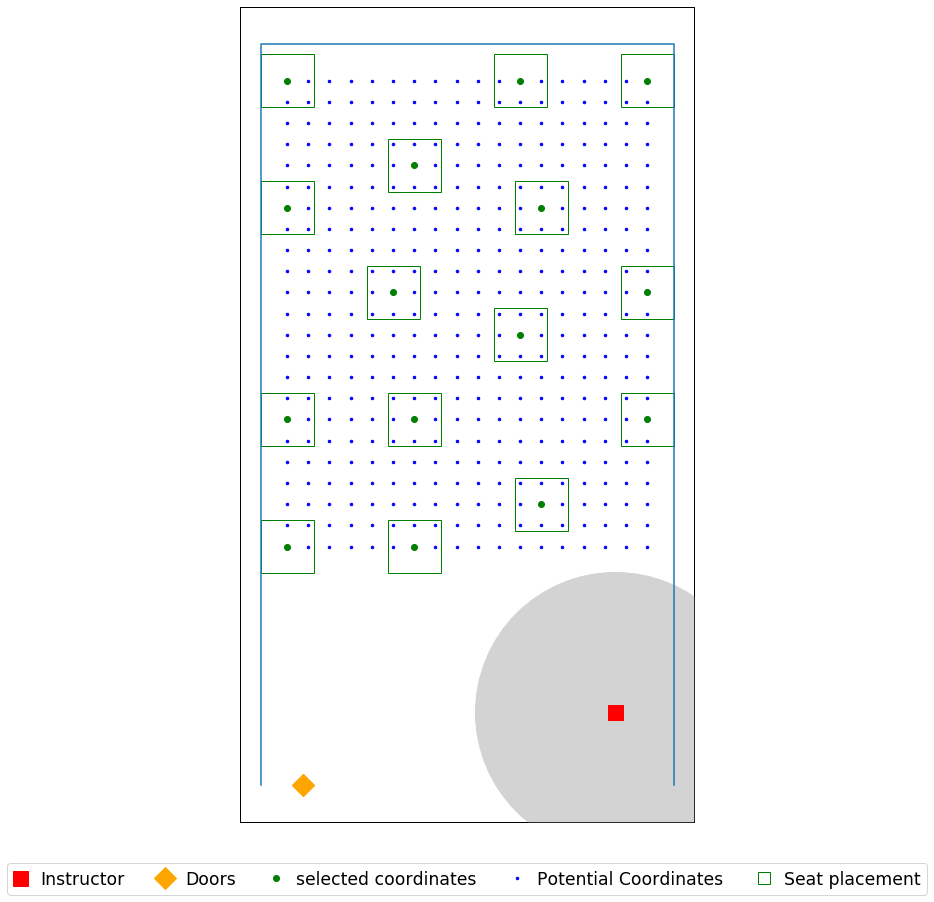

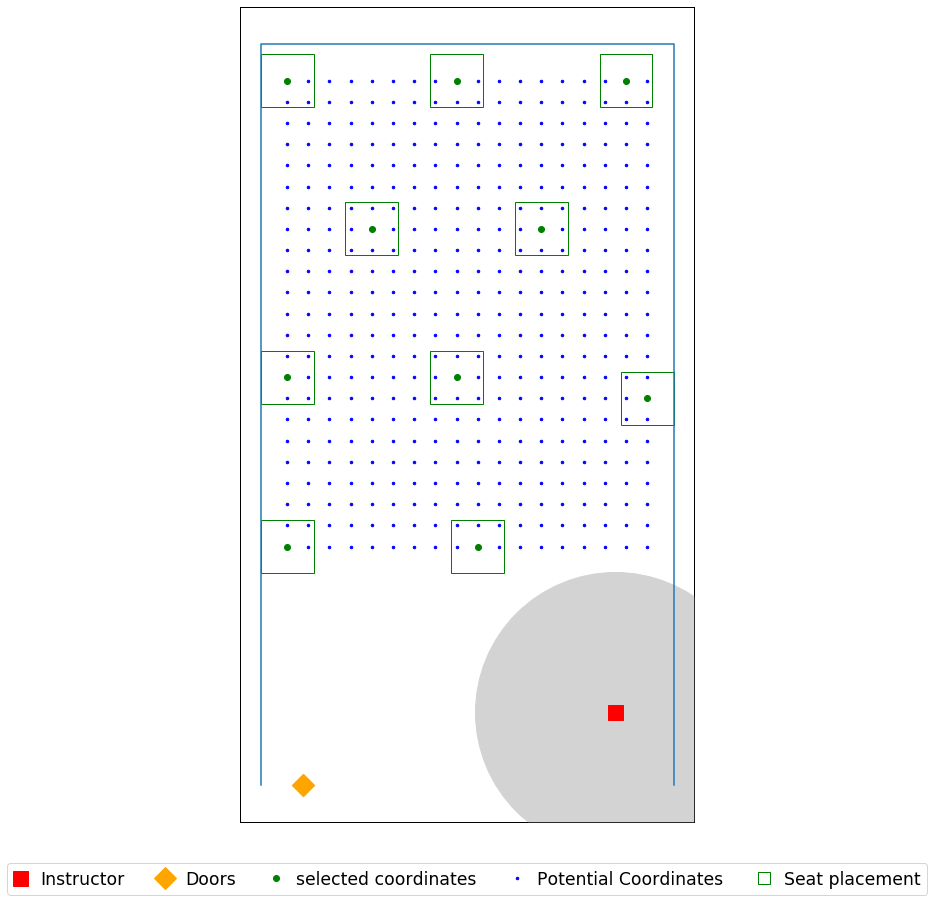

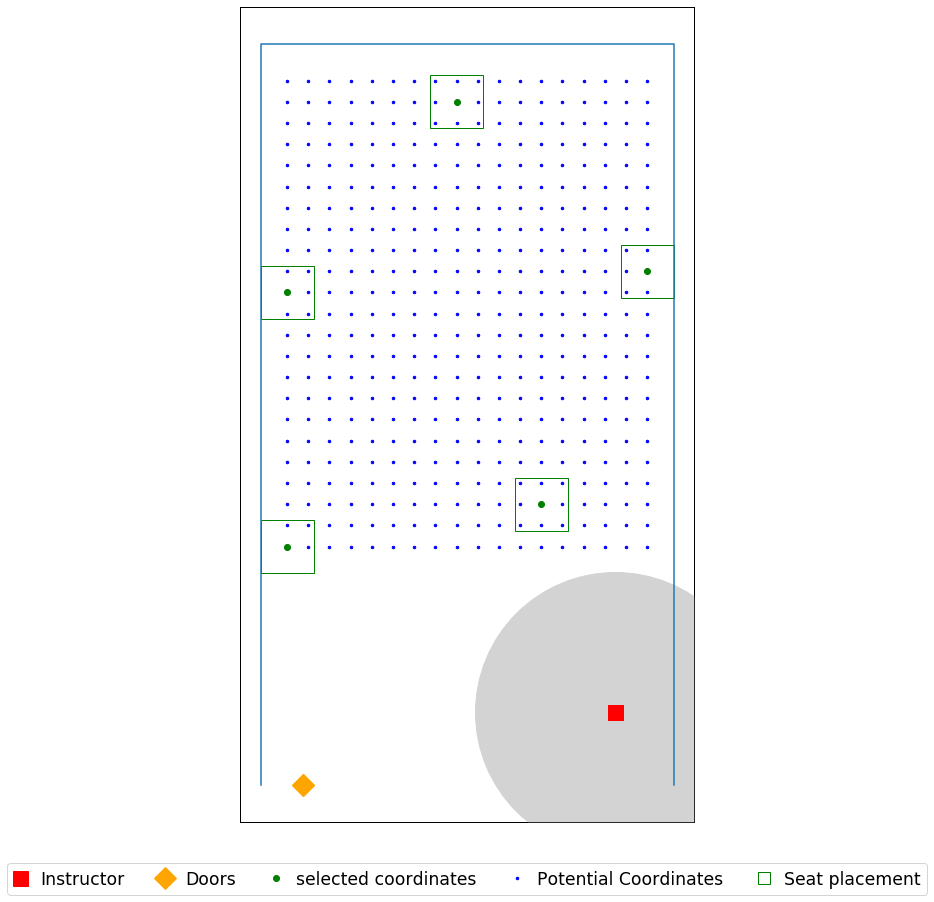

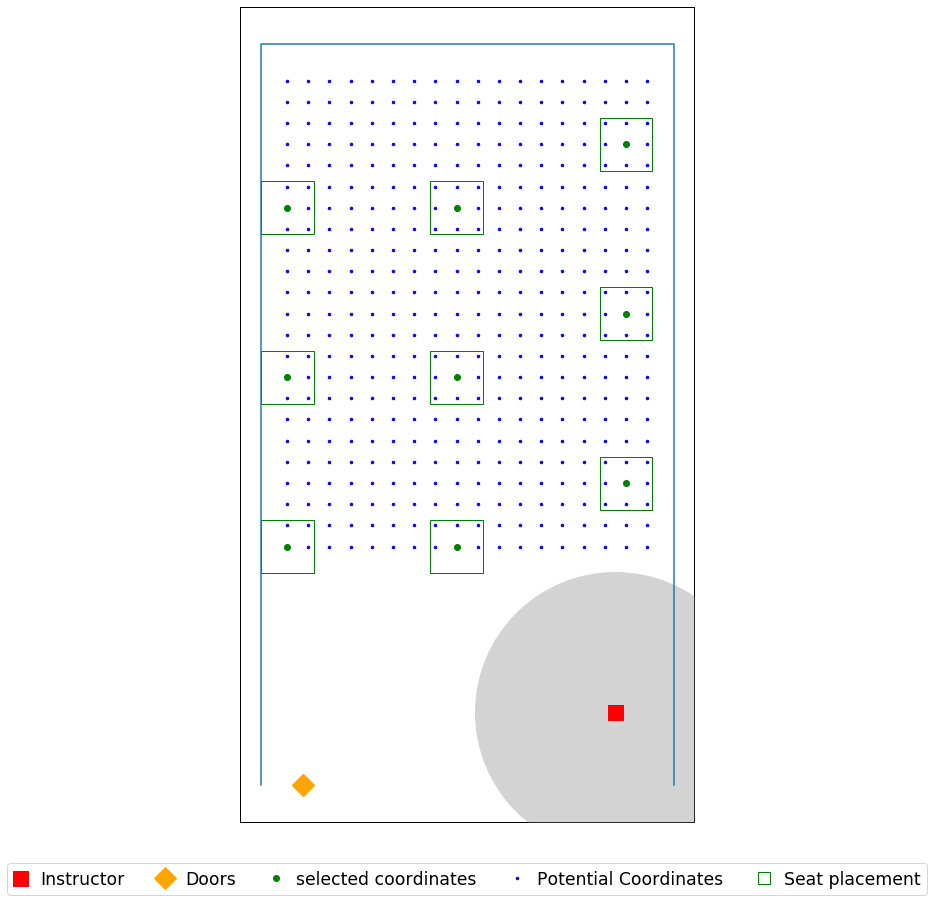

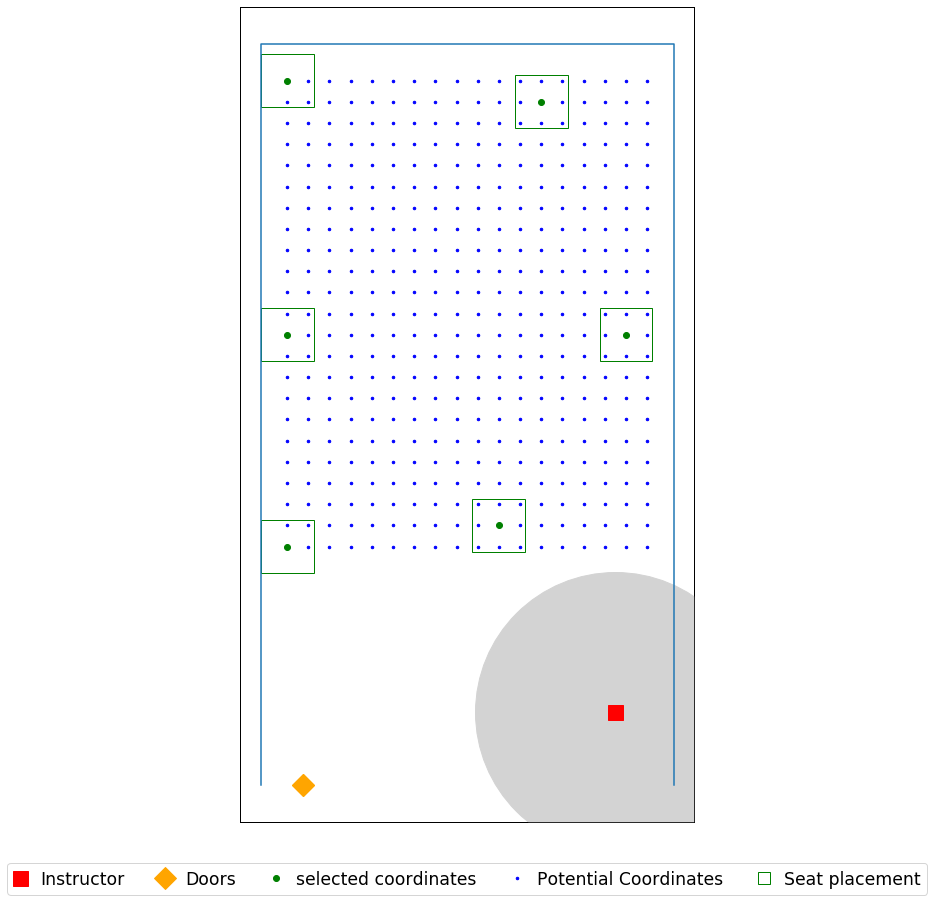

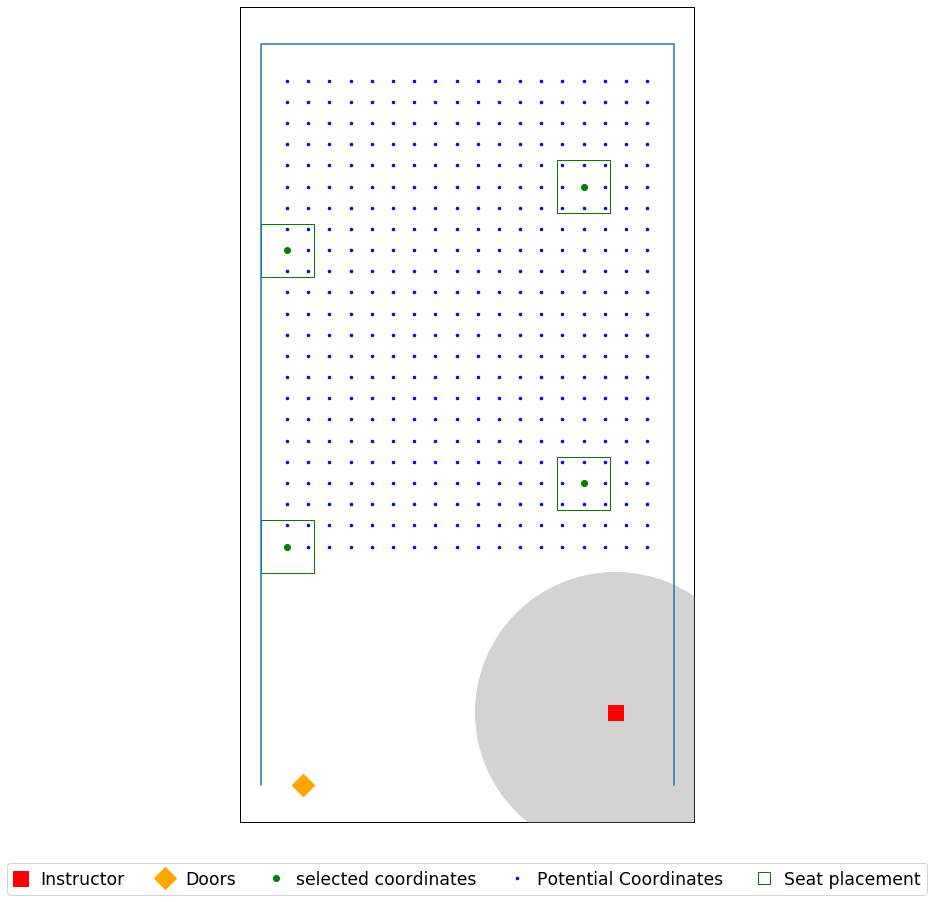

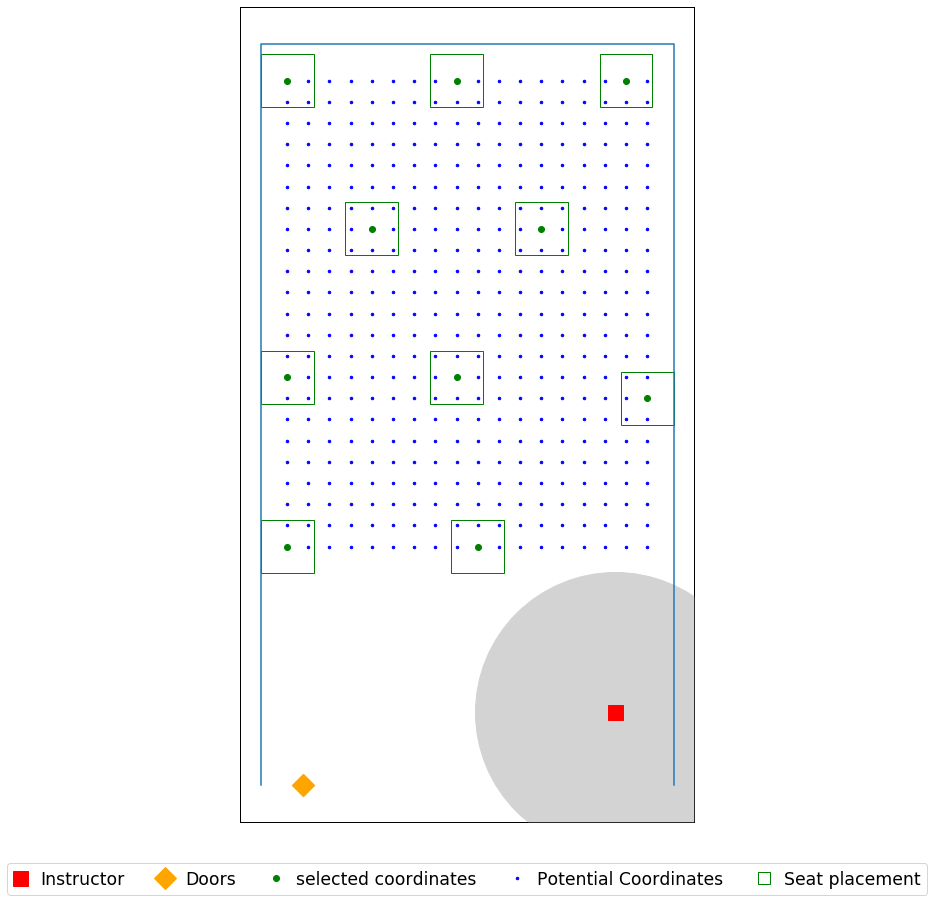

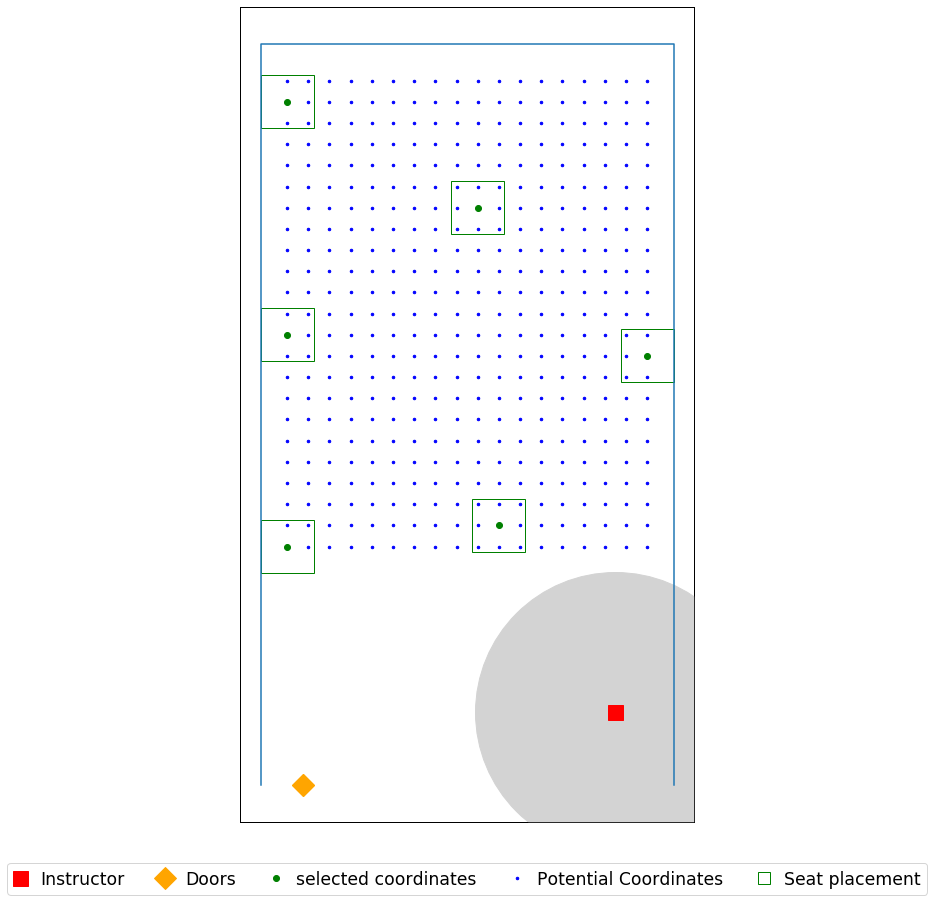

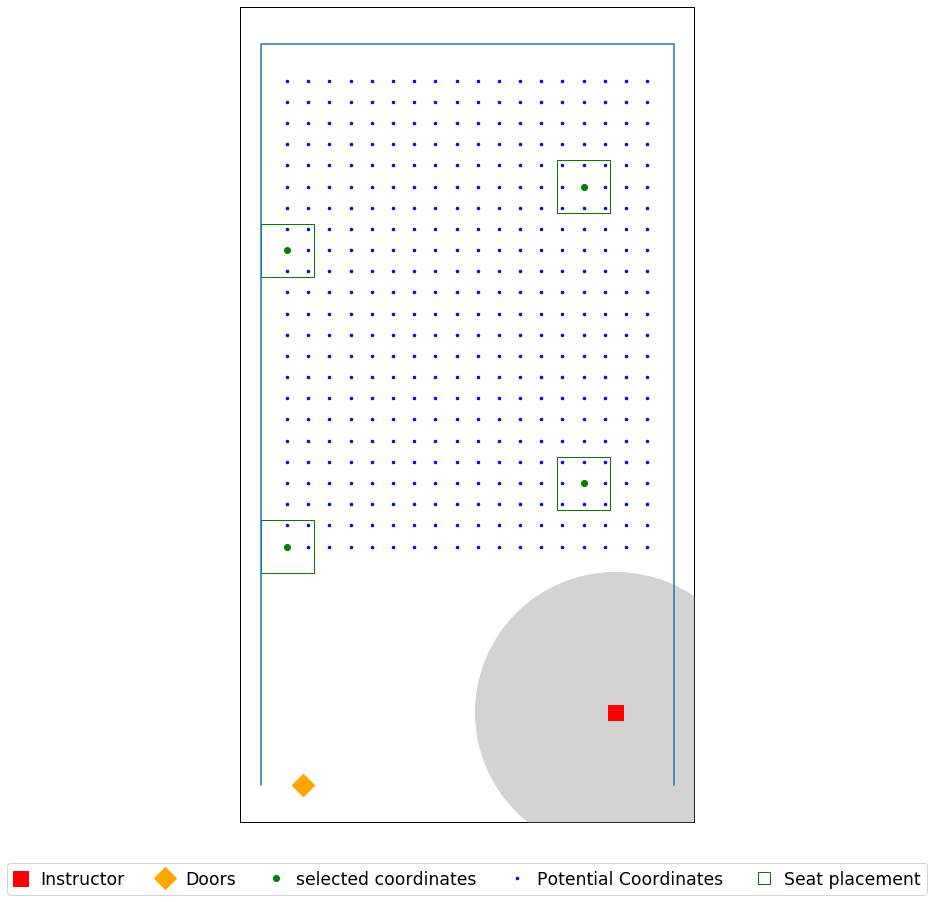

In [23]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 269

In [24]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 269.xlsx'

Name = 'Skiles_269'

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[3.58333333 3.75      ]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


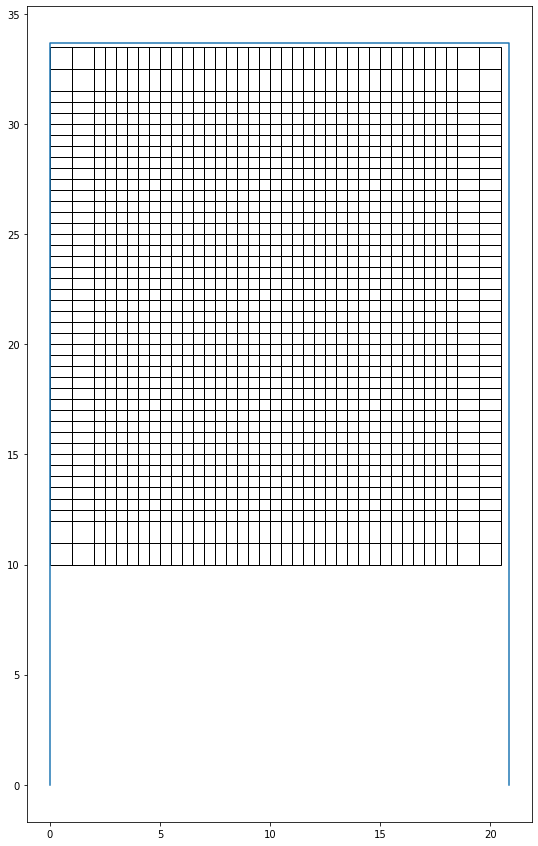

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
12
18
57
63
126
132
171
177
259
284
285
291
373
398
399
405
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]


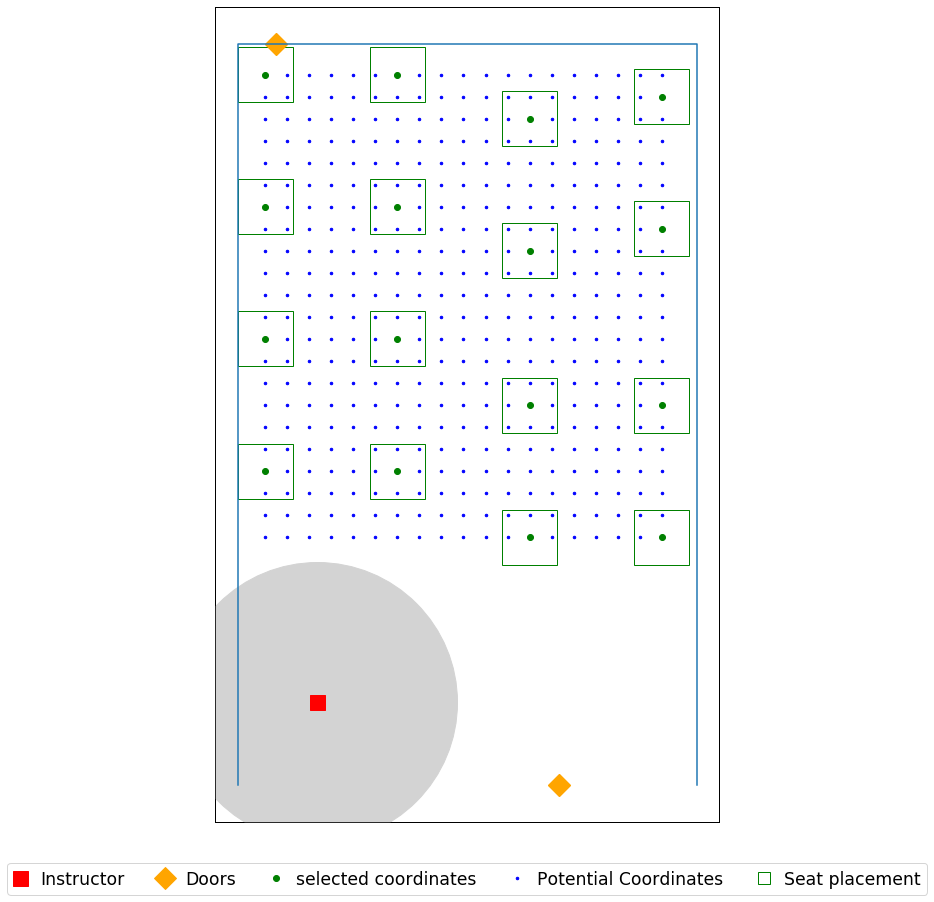

In [27]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[3.58333333 3.75      ]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


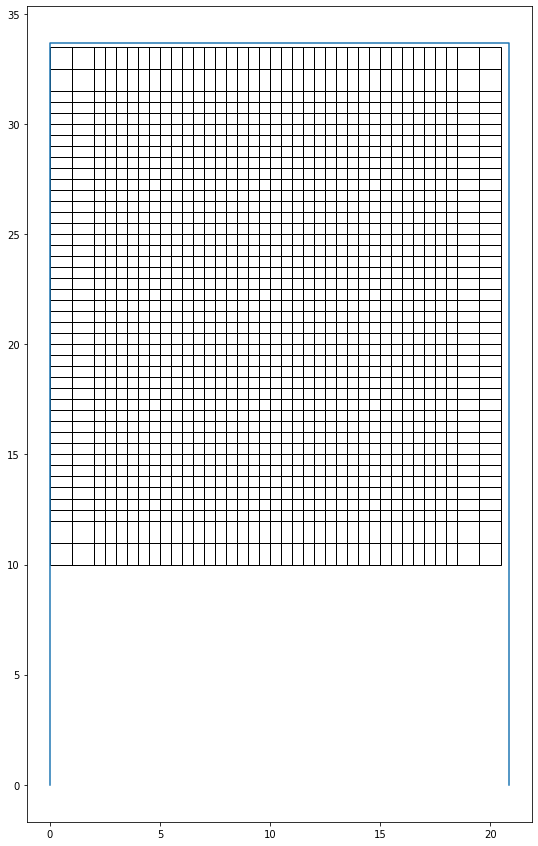

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
12
18
57
63
126
132
171
177
259
284
285
291
373
398
399
405
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
10
18
57
159
167
228
296
365
379
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
18
57
200
323
379
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
9
18
57
160
168
209
312
3

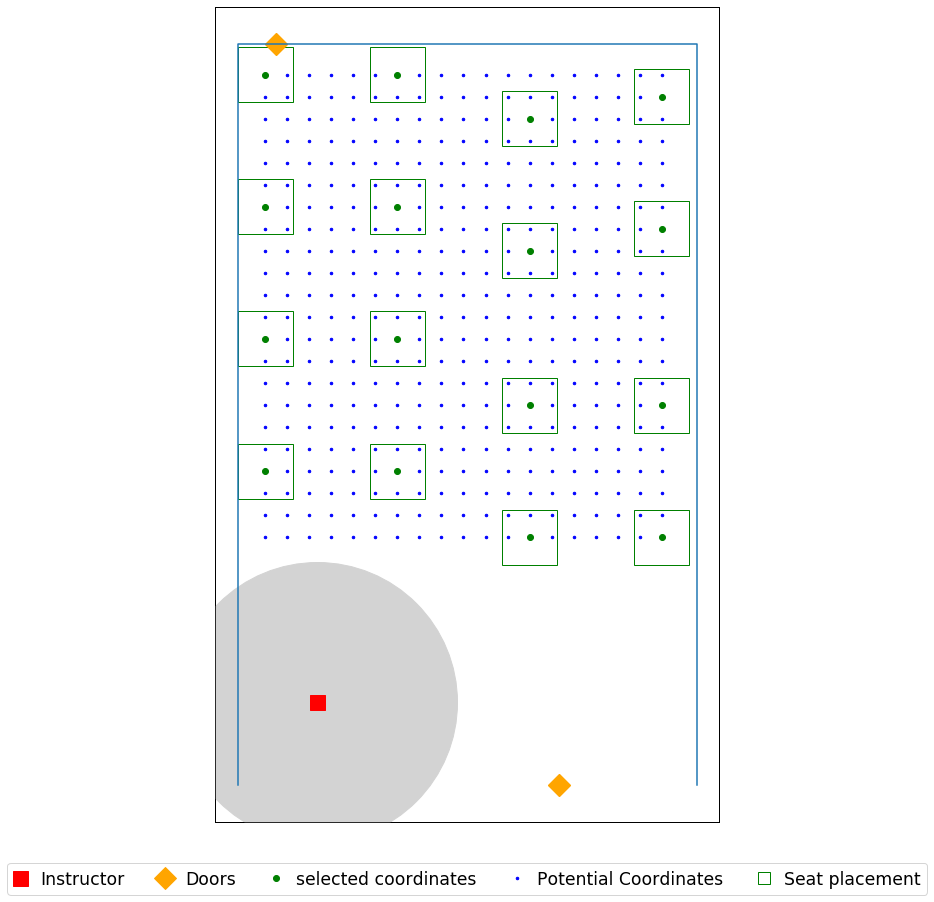

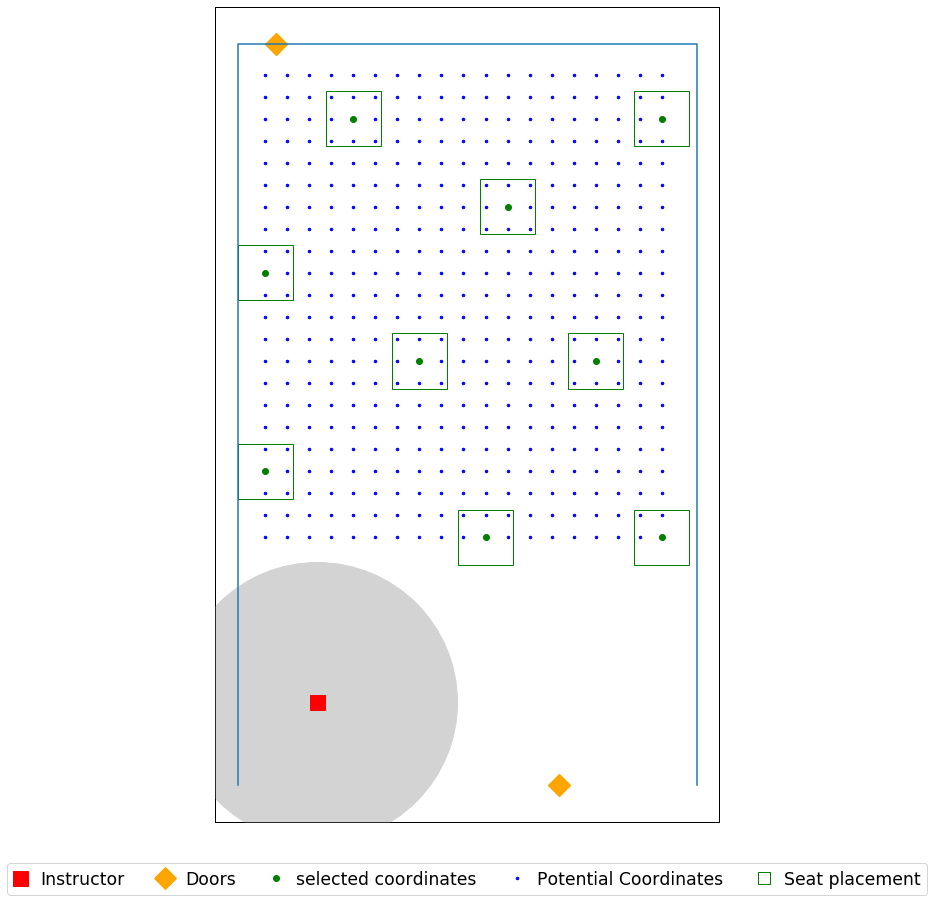

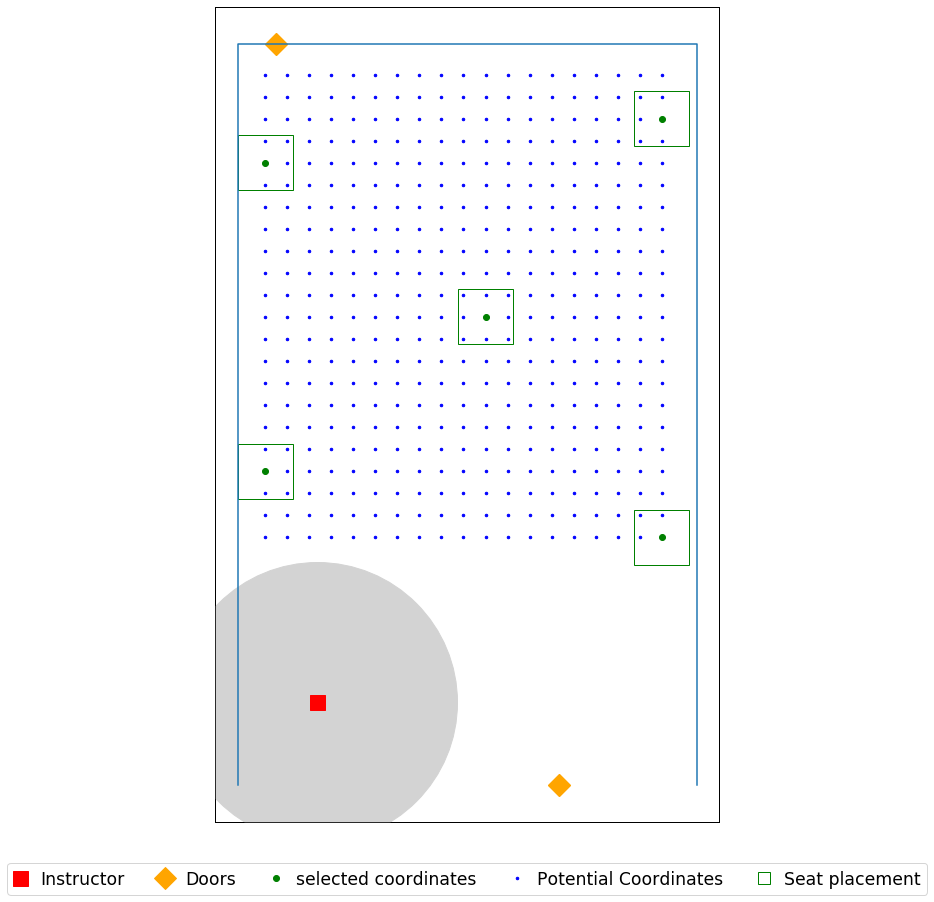

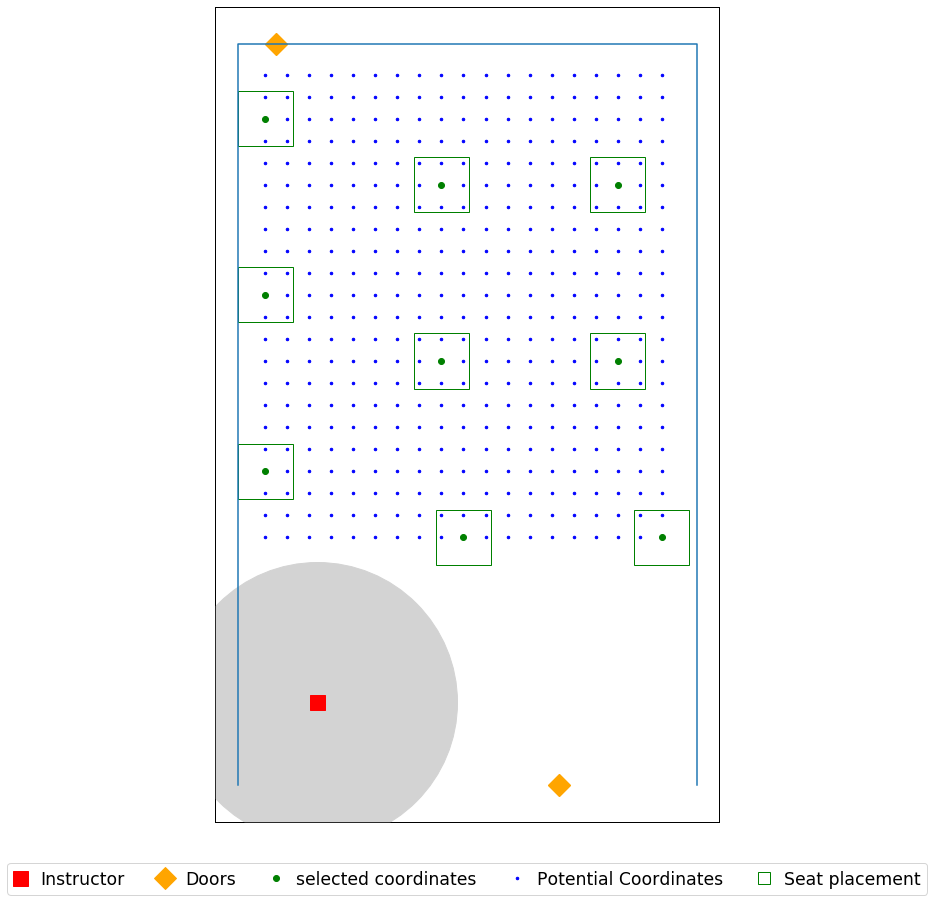

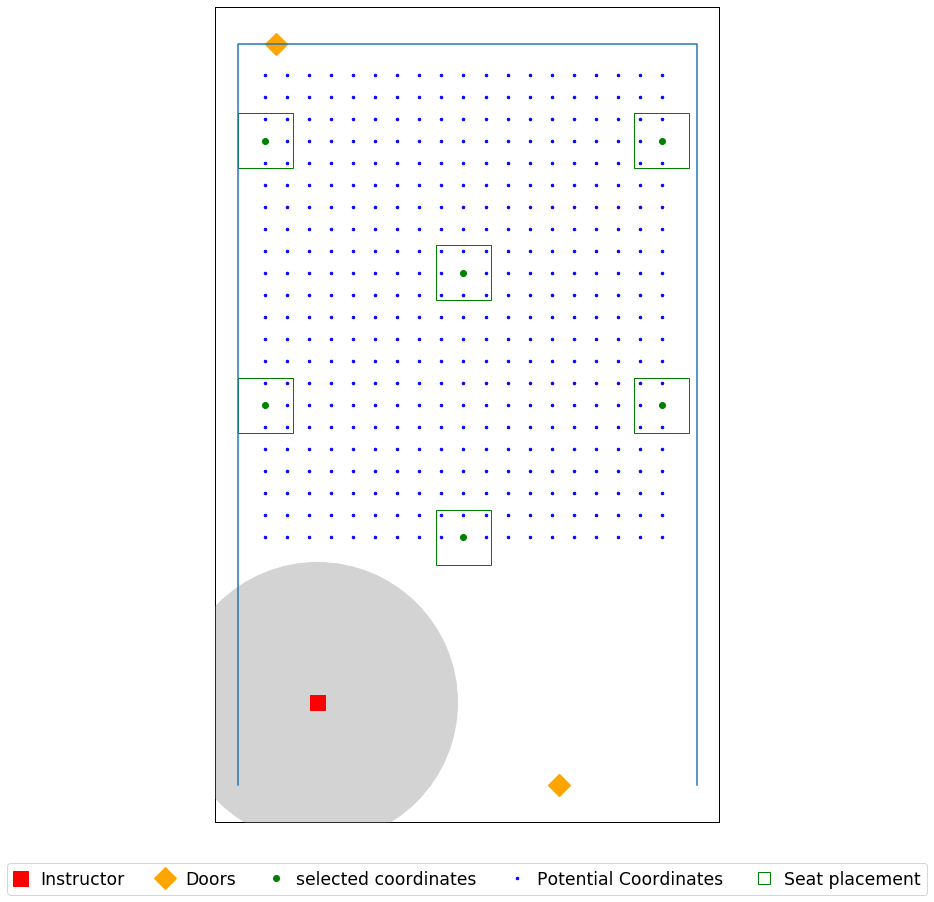

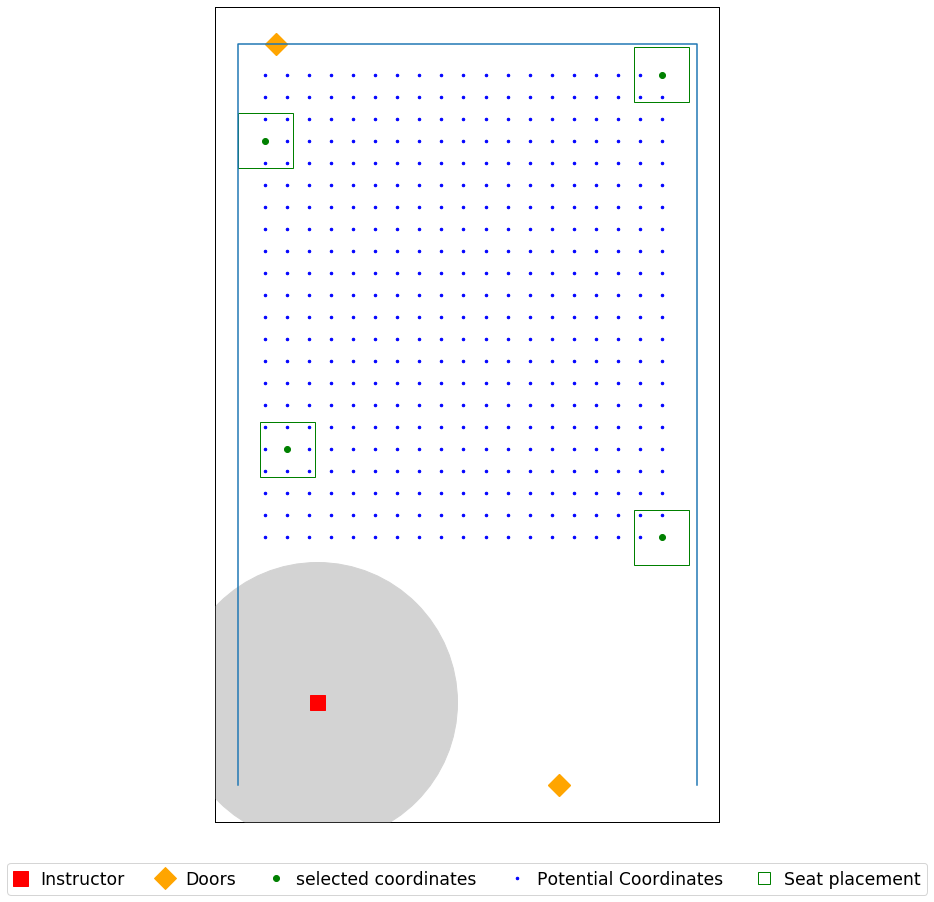

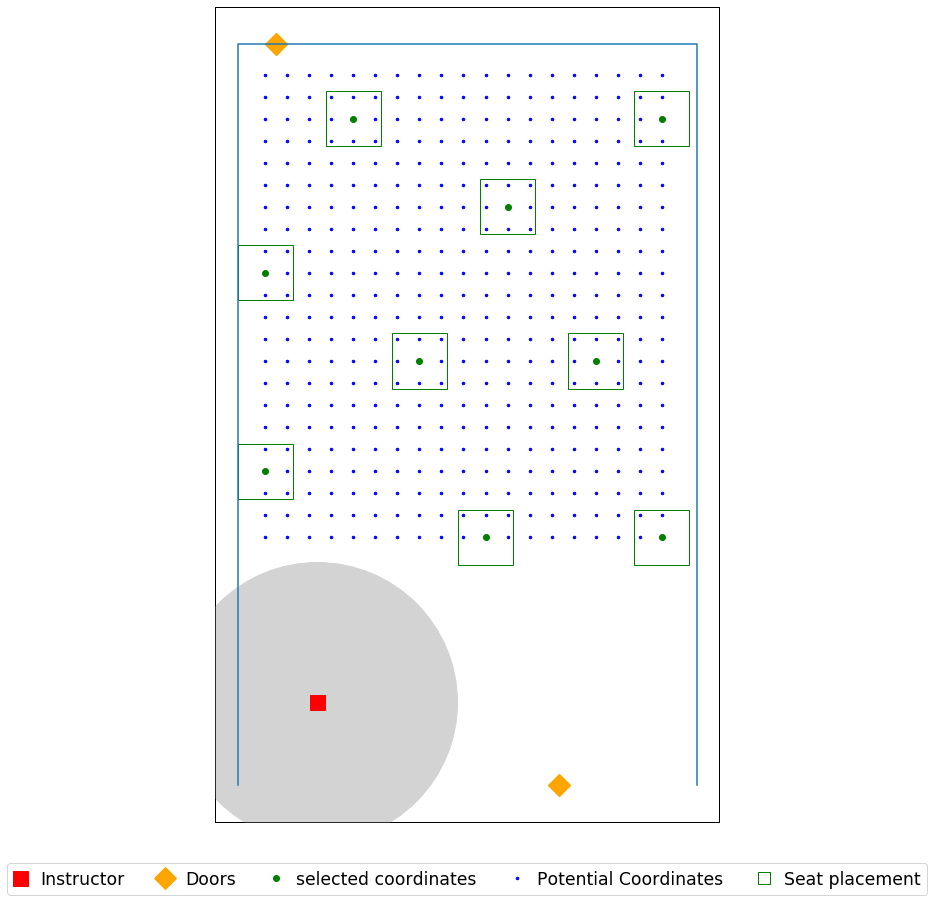

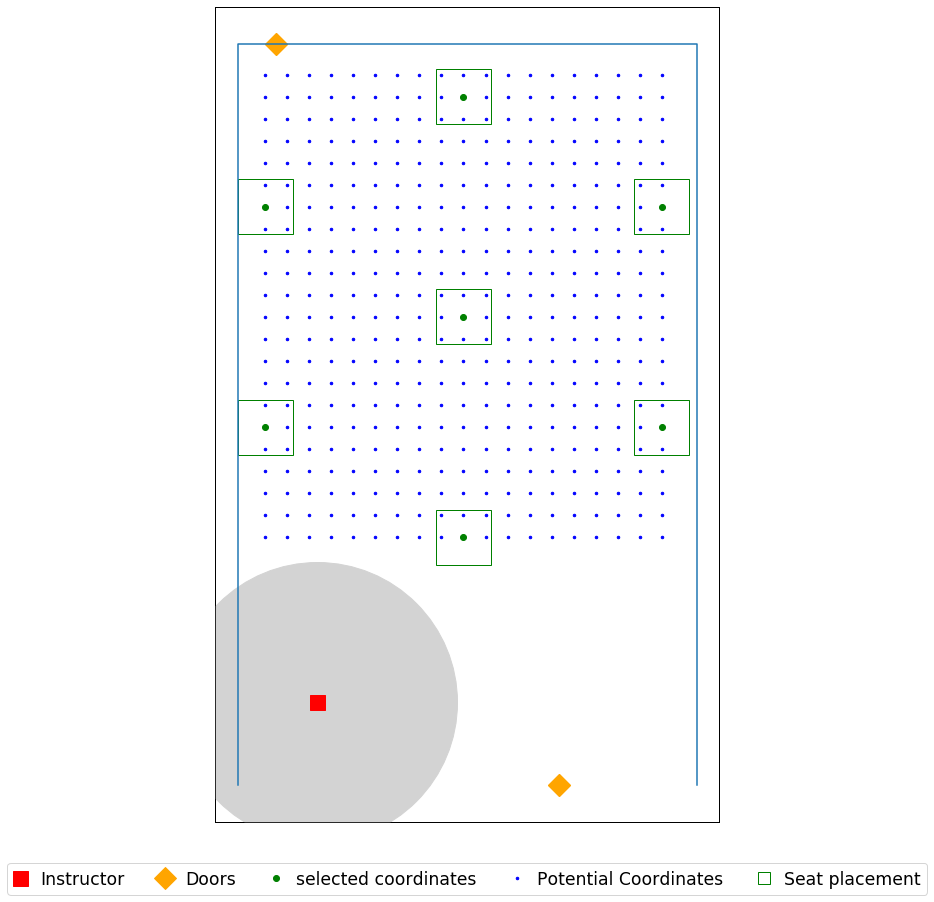

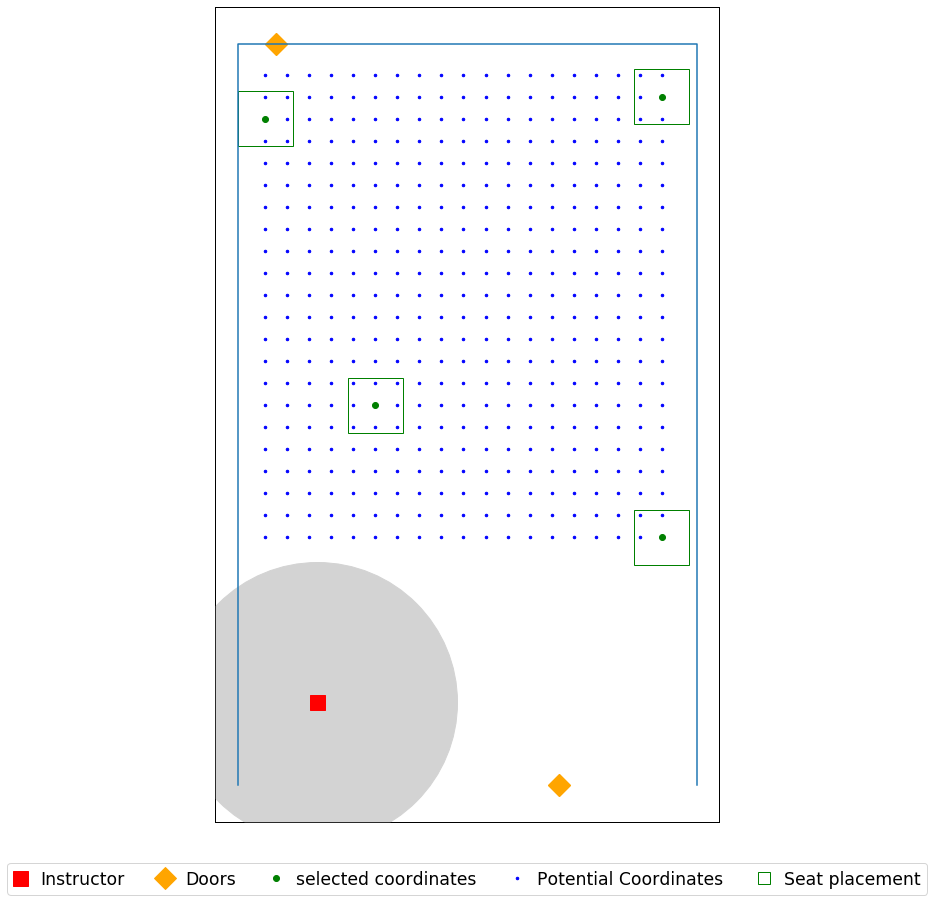

In [28]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 308

In [31]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 308.xlsx'

Name = 'Skiles_308'

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.33333333  3.08333333]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


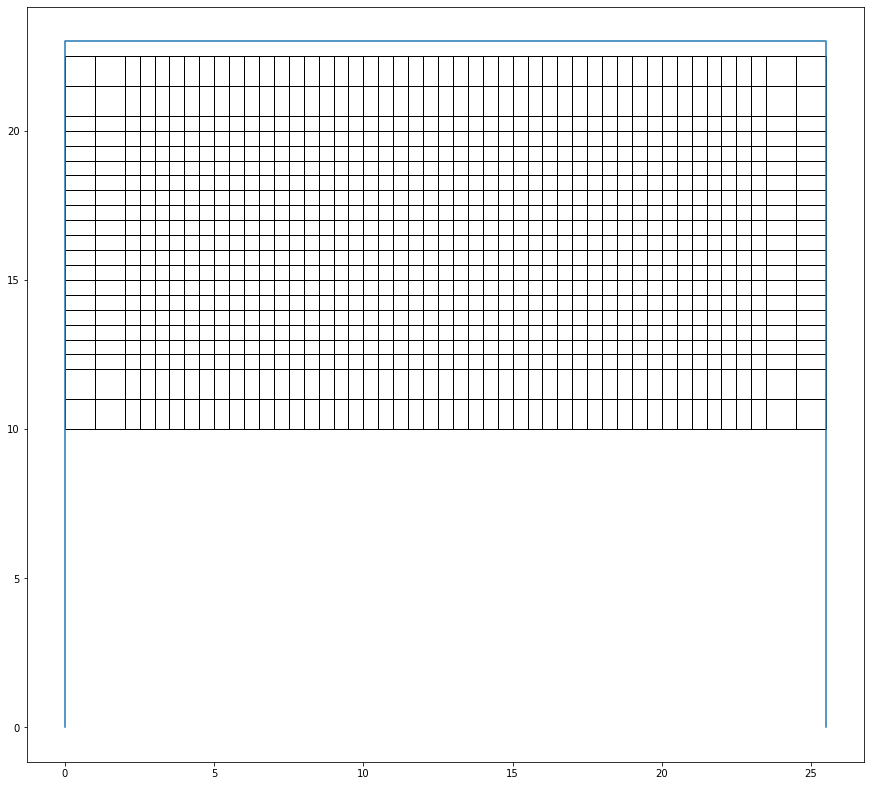

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
11
65
71
96
102
156
240
246
257
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]


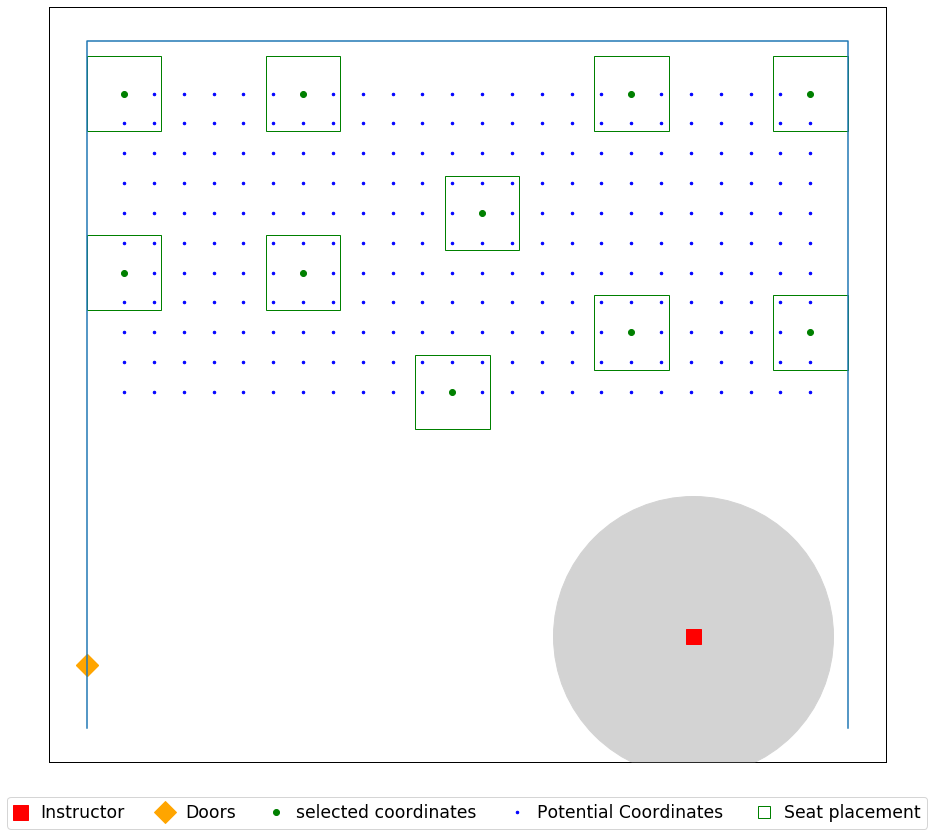

In [32]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.33333333  3.08333333]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


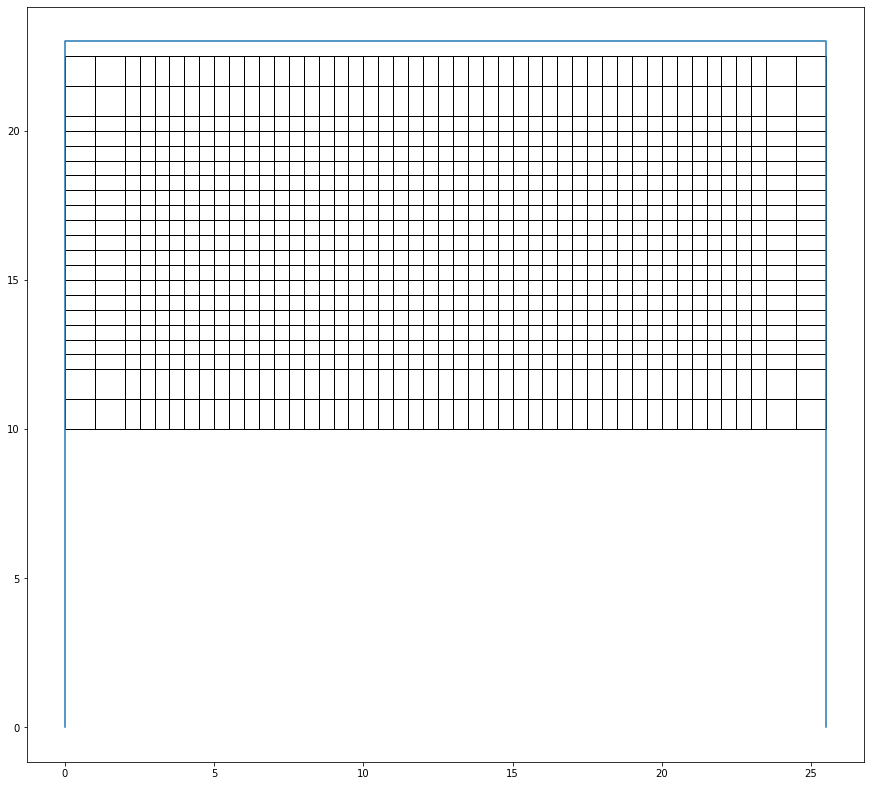

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
11
65
71
96
102
156
240
246
257
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
0
8
71
160
200
240
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
7
71
240
254
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
8
64
192
200
215
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results

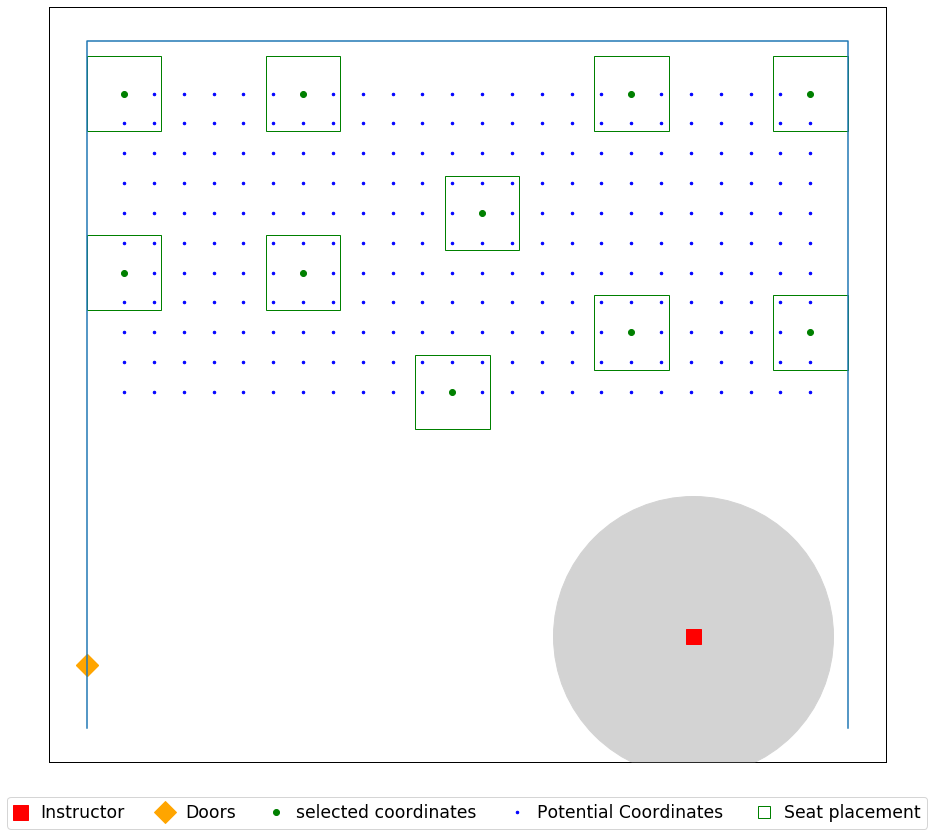

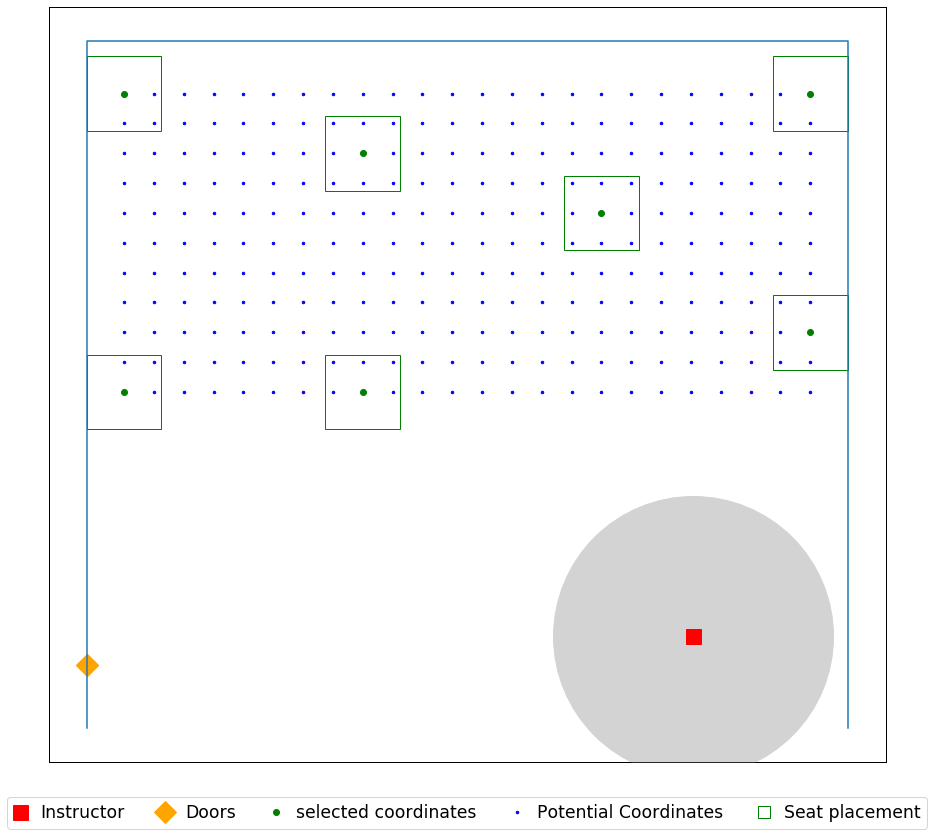

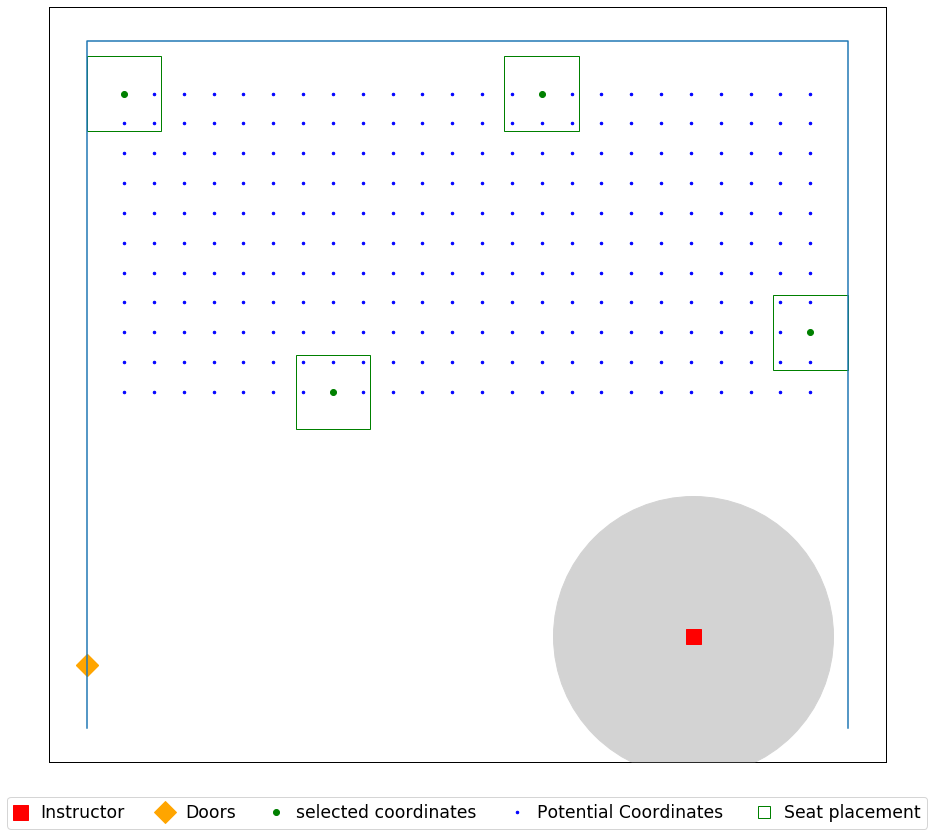

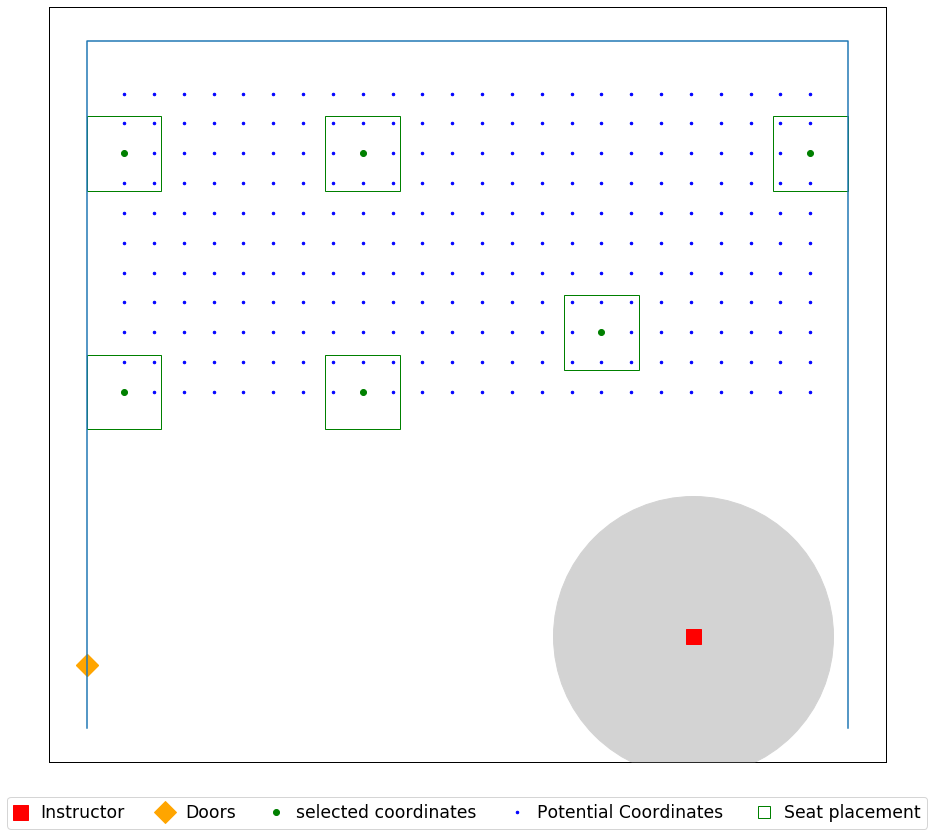

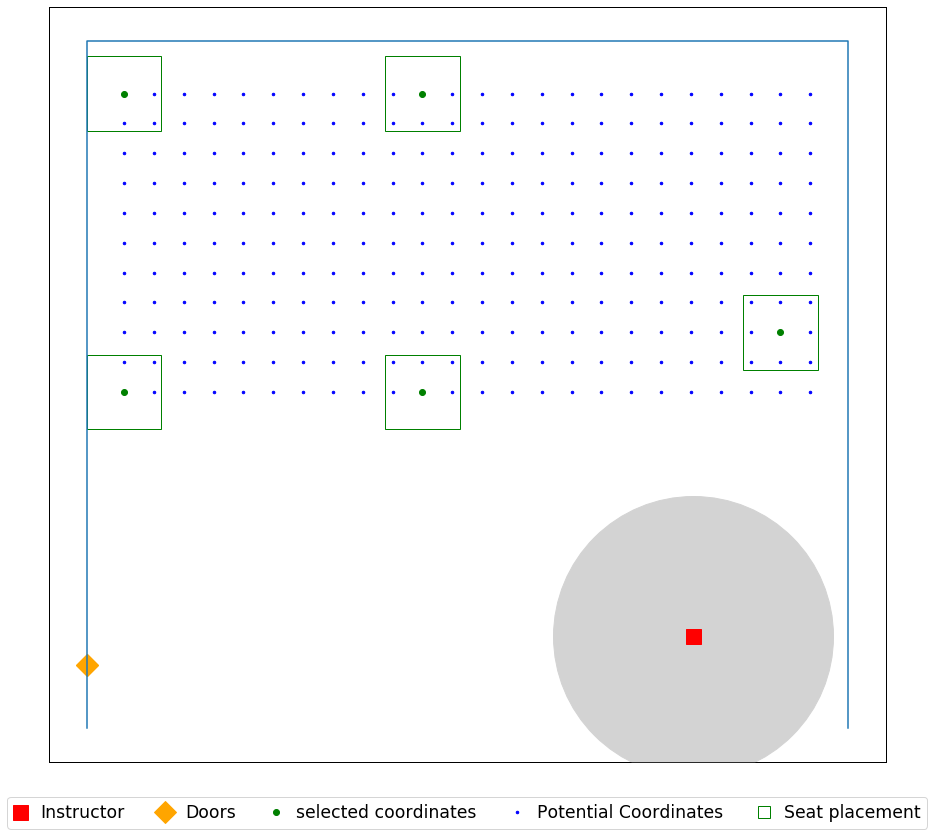

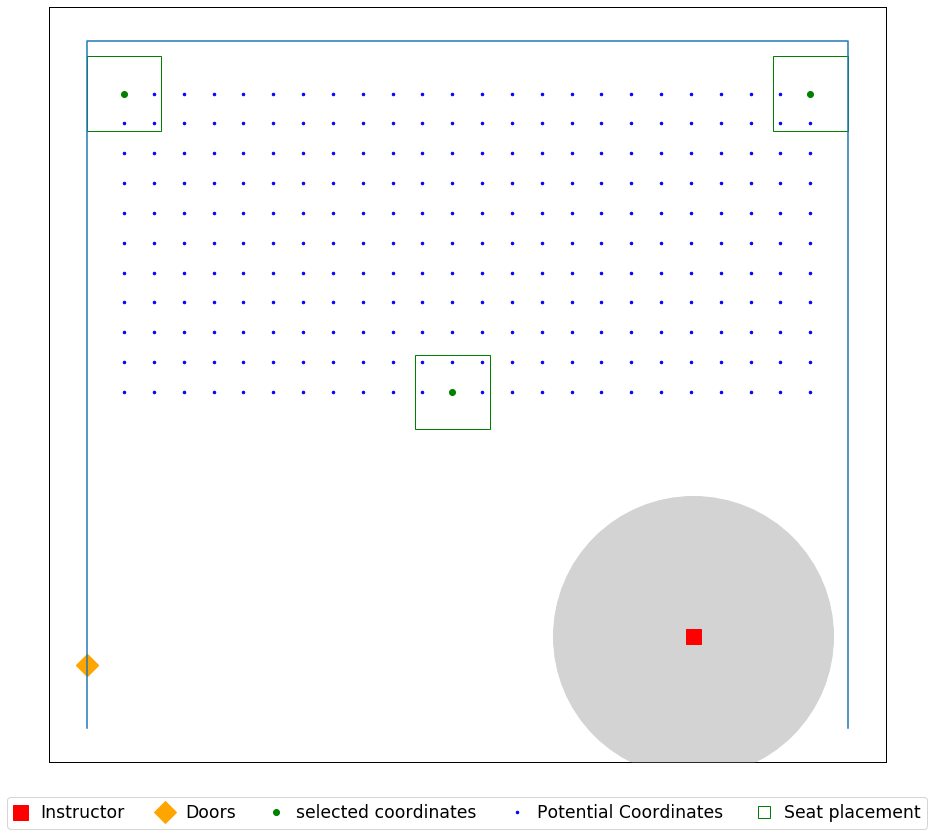

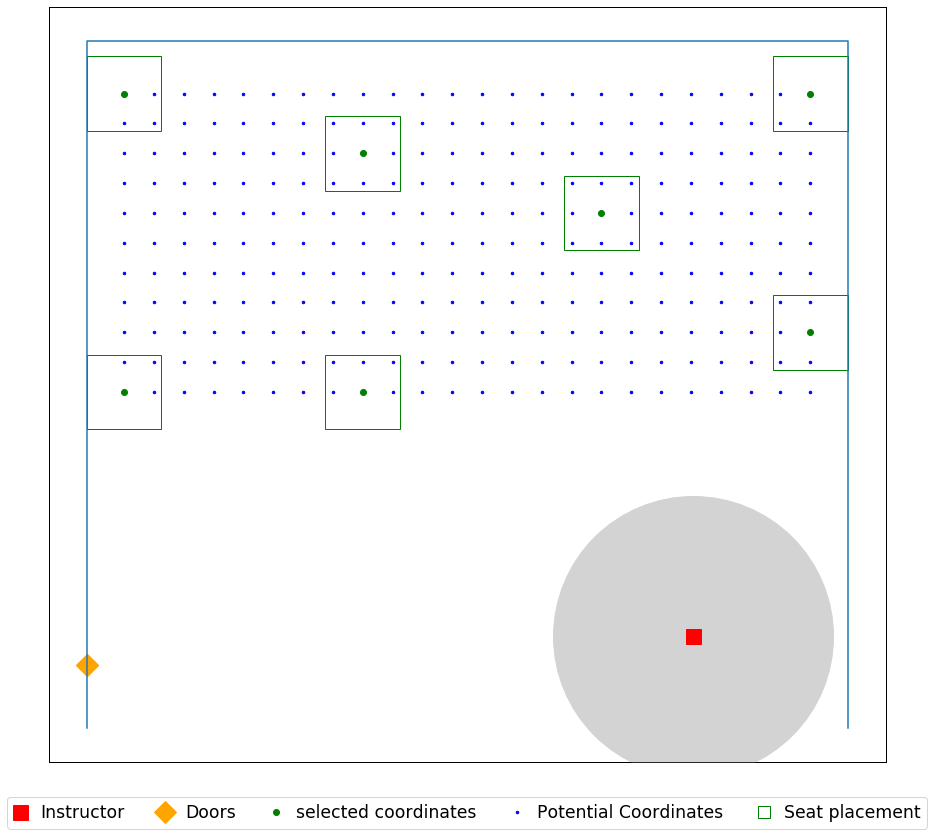

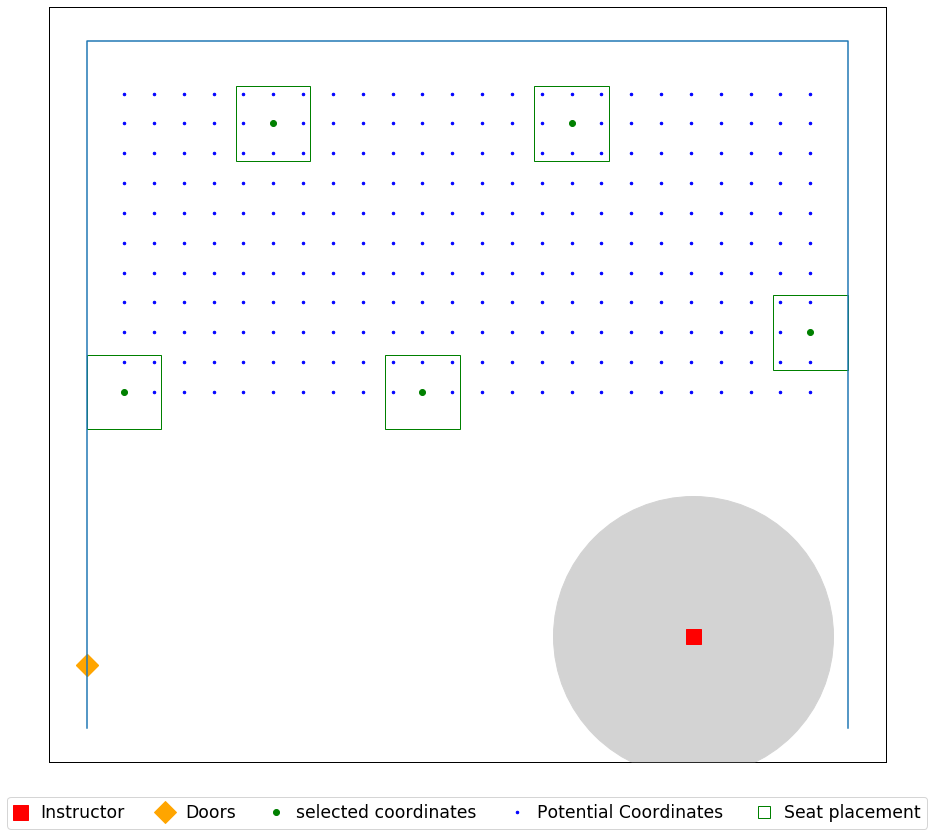

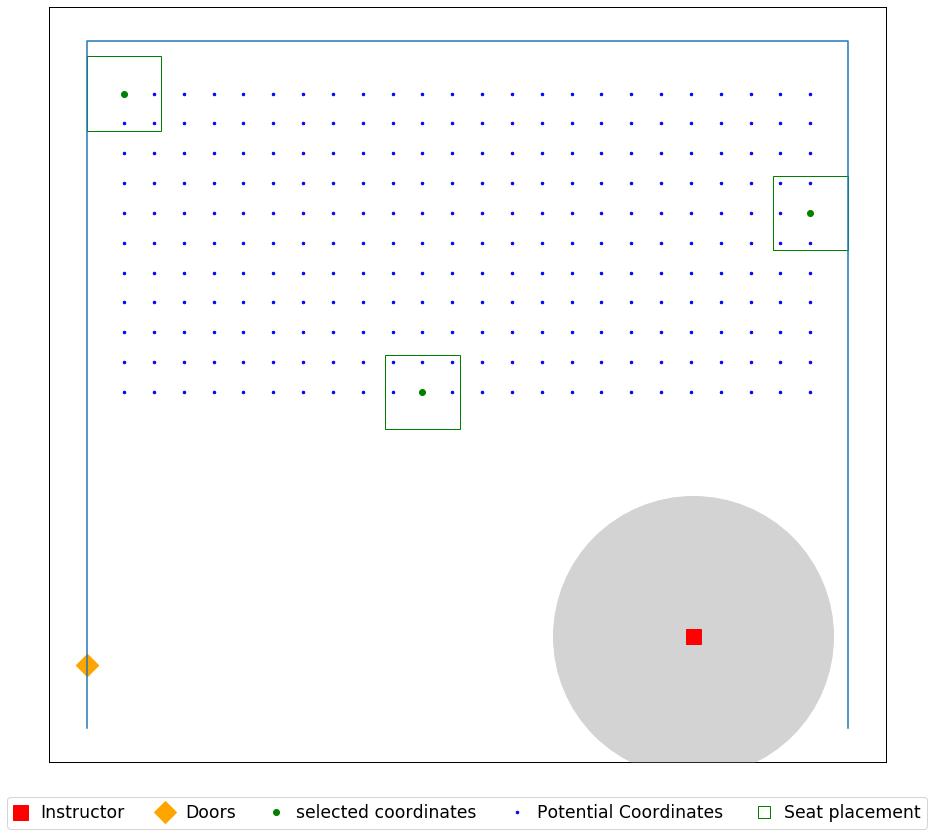

In [33]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 311

In [53]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 311.xlsx'

Name = 'Skiles_311'

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.16666667  3.41666667]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 406


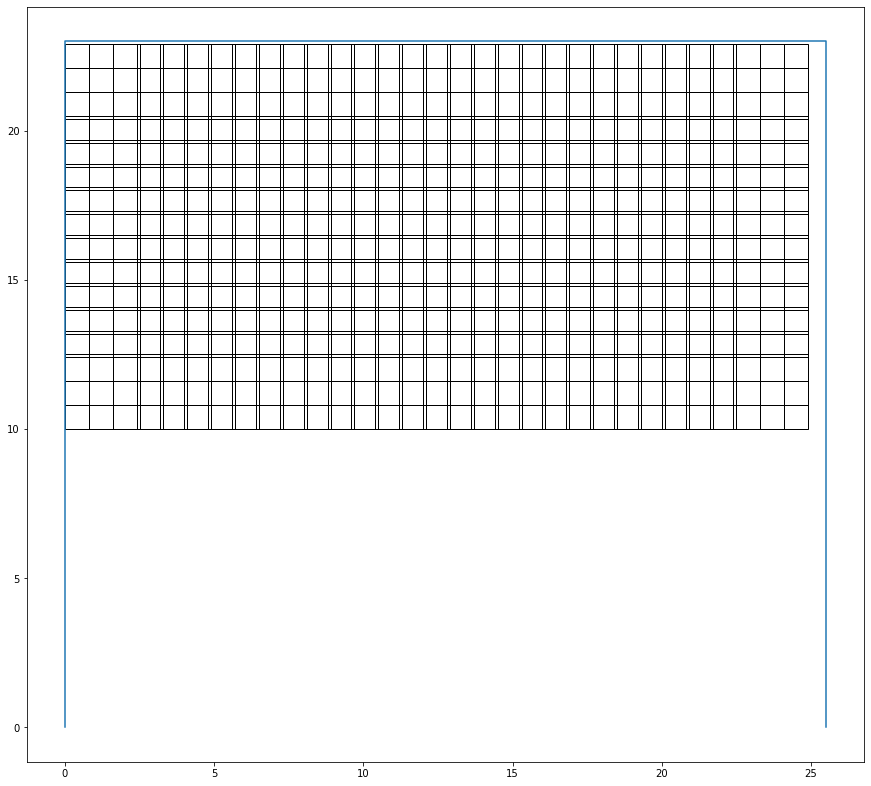

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
8
45
86
214
224
232
318
383
393
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]


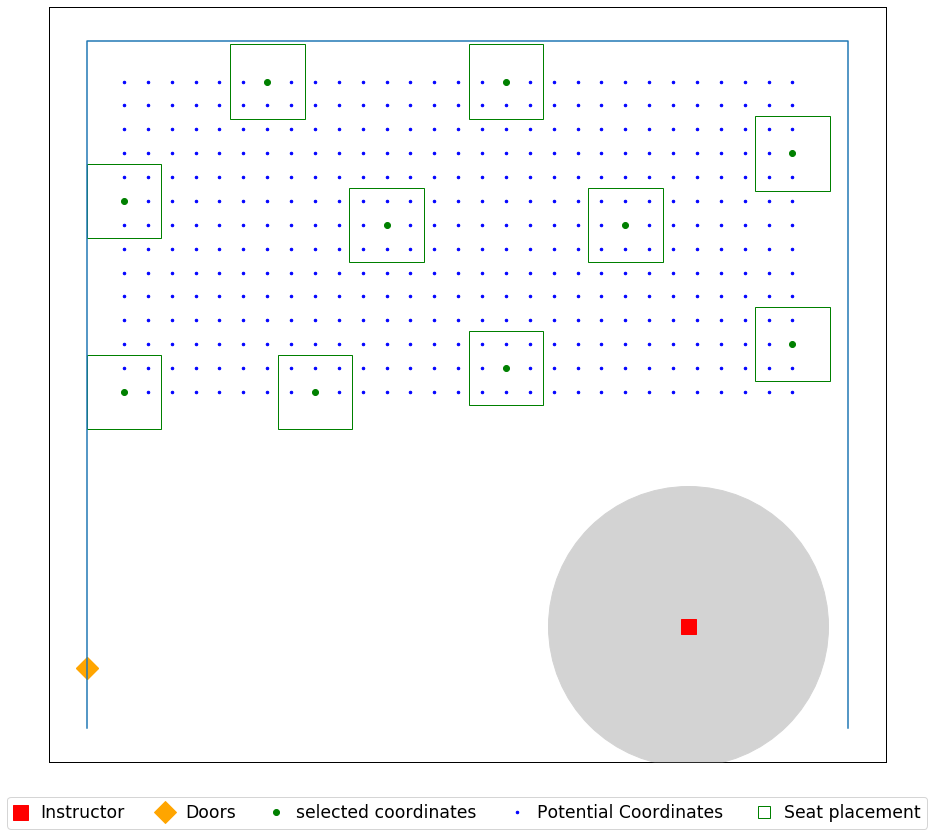

In [54]:
seat_loc = seat_coordinates(data_file, 0.8)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.16666667  3.41666667]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


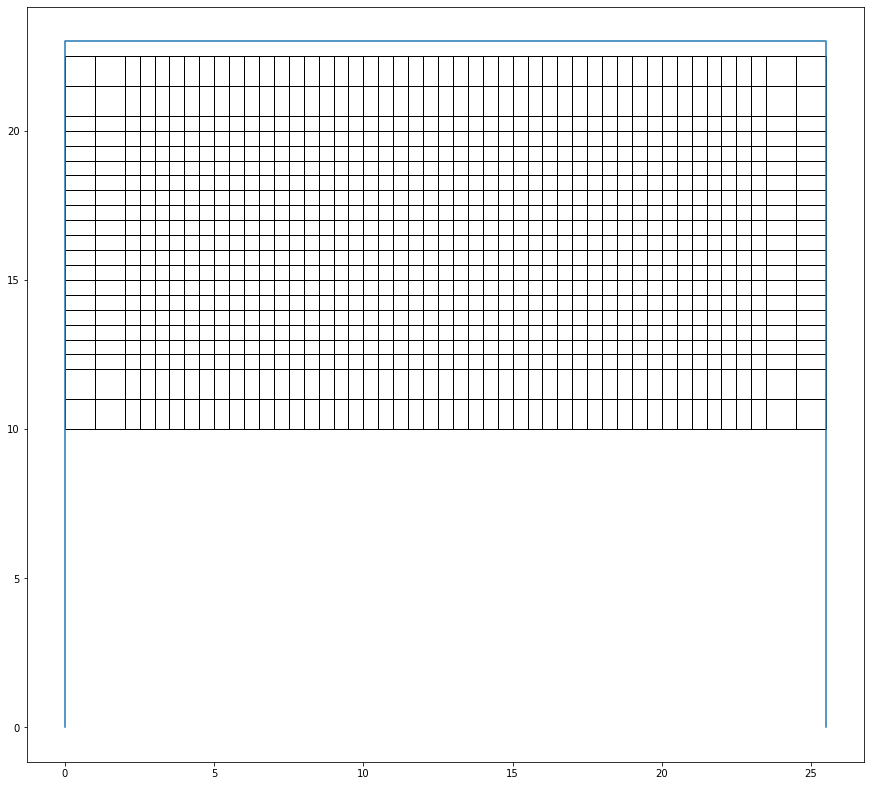

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
5
11
71
89
96
150
240
251
257
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
7
63
71
96
246
255
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
7
71
240
254
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
8
64
200
238
240
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_f

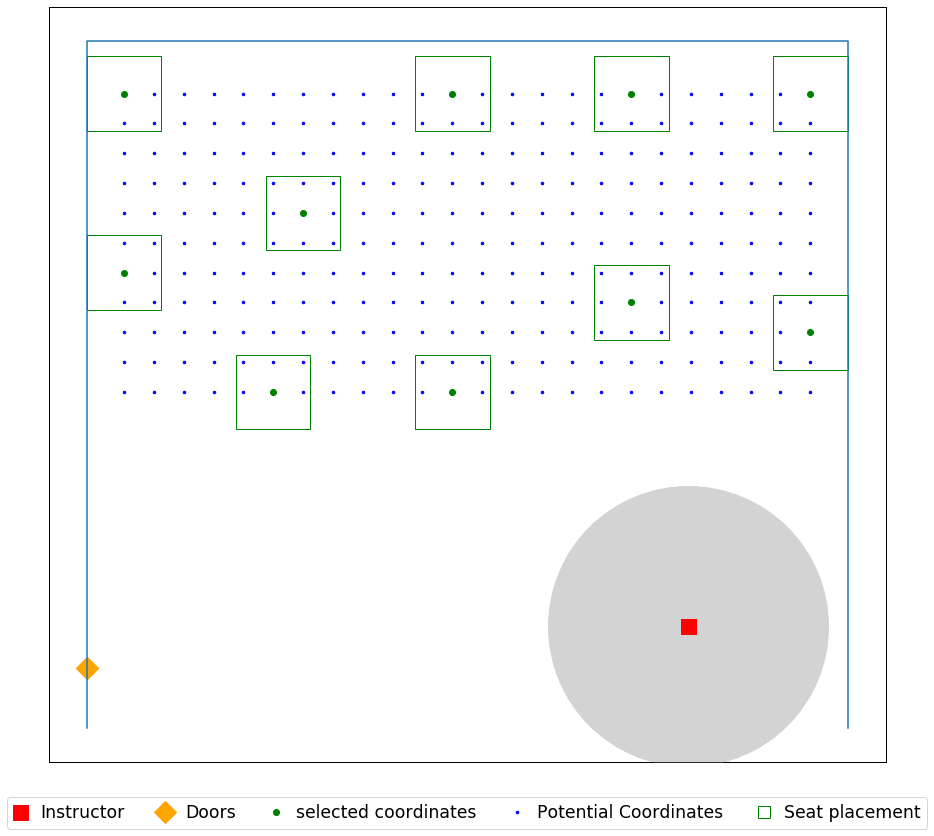

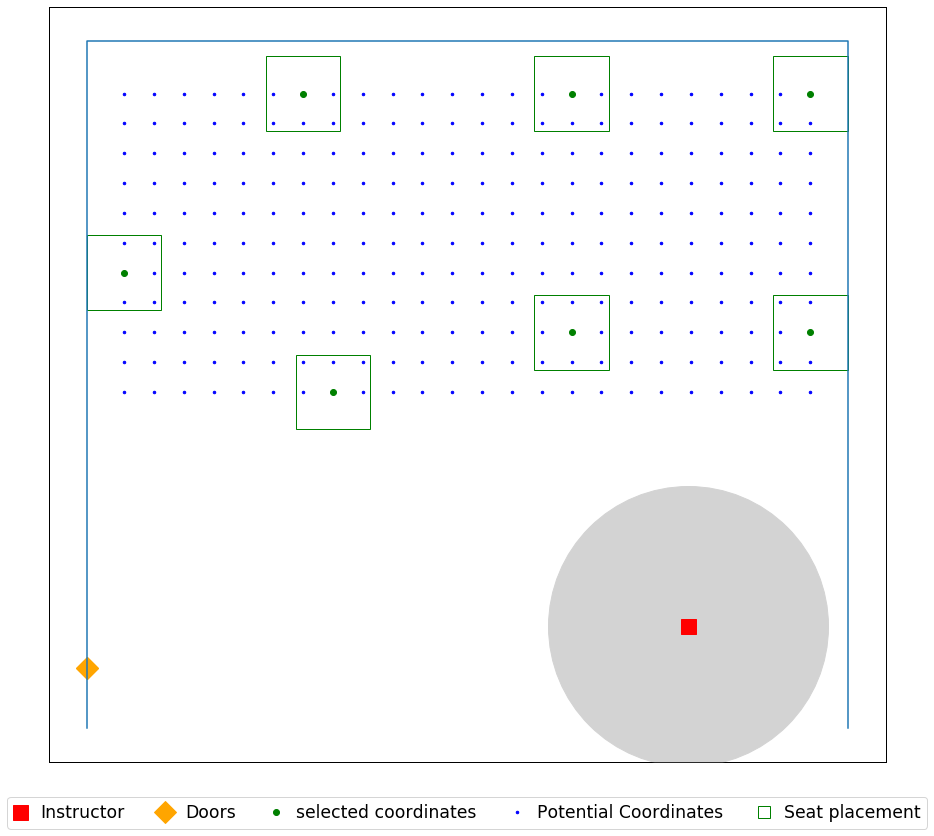

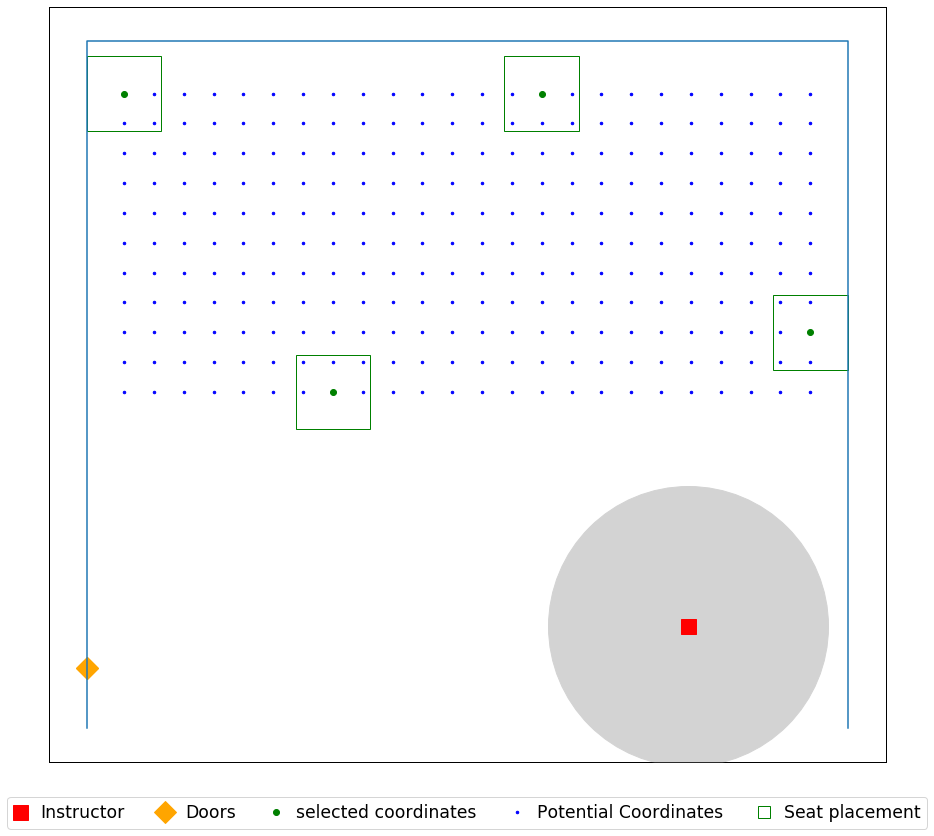

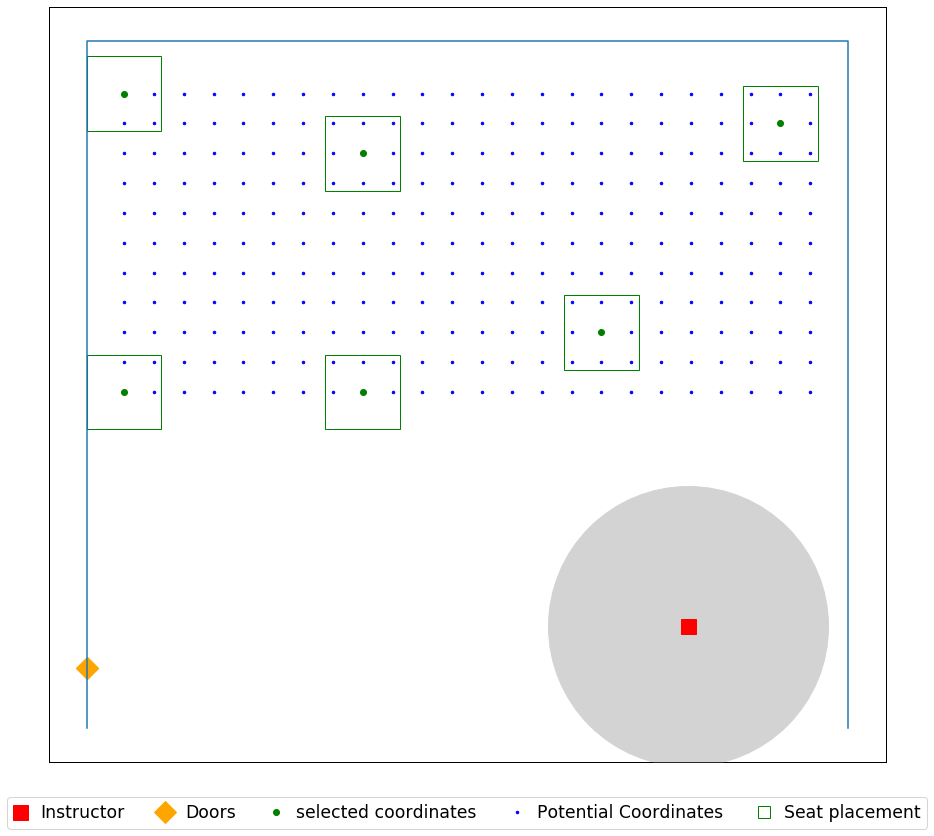

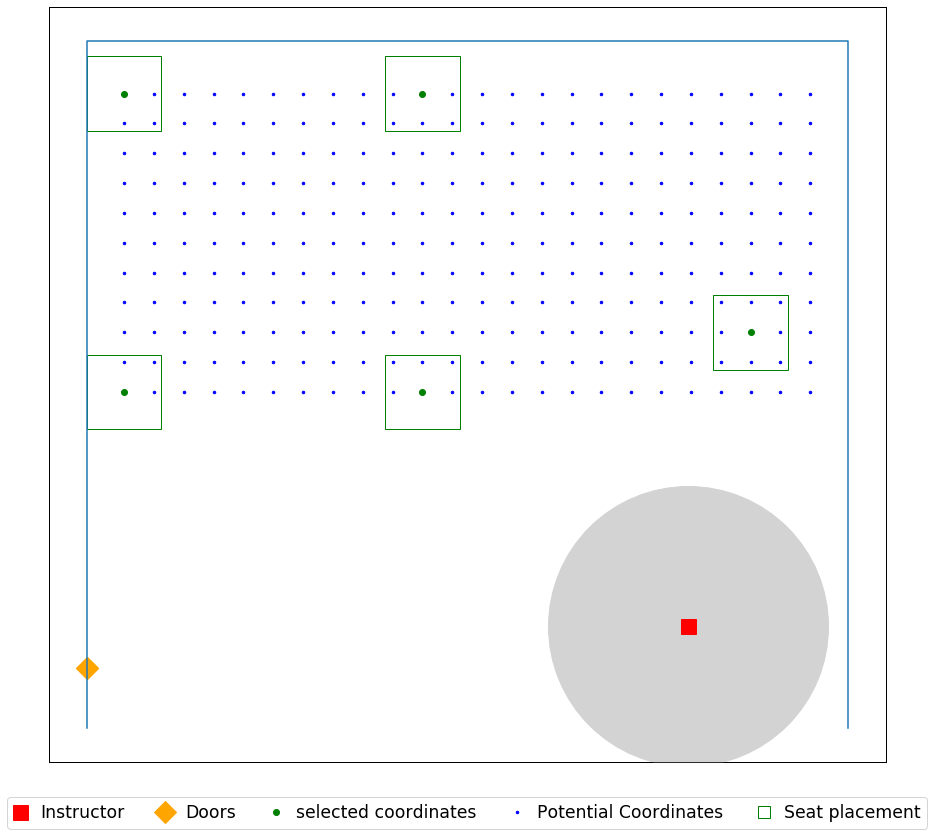

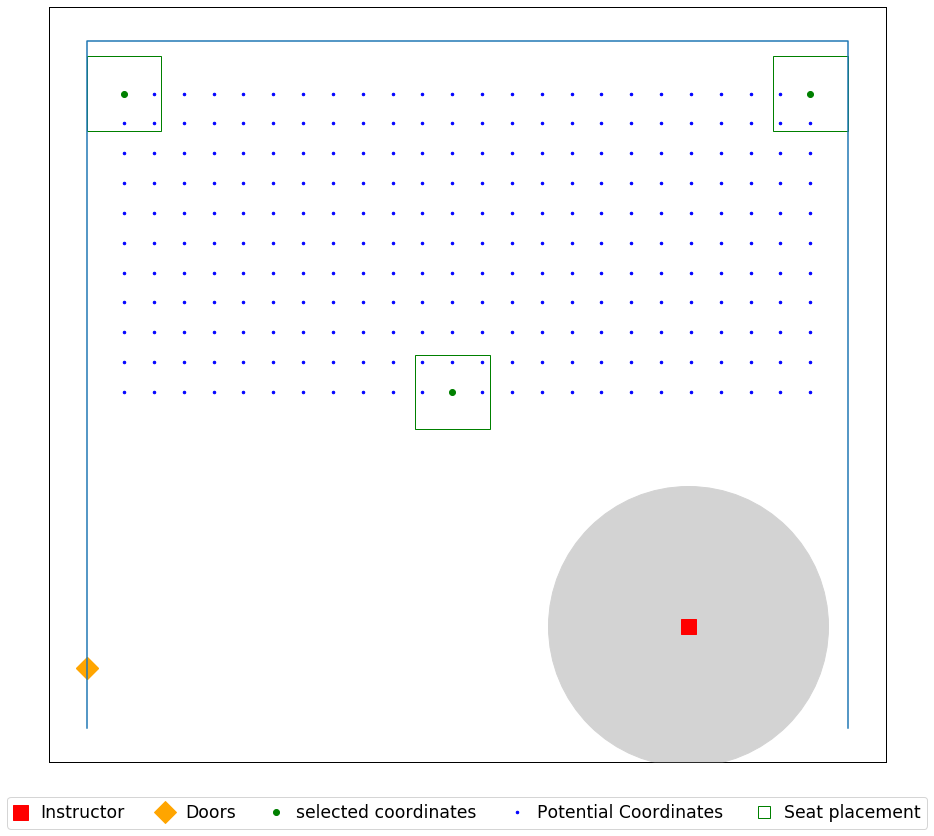

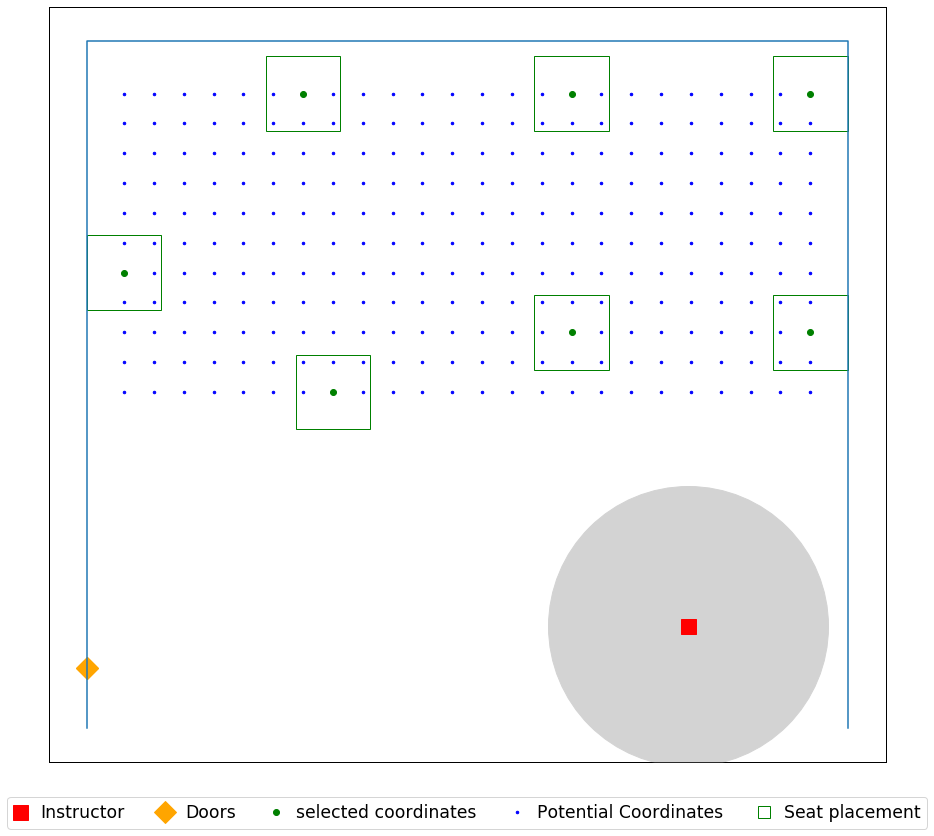

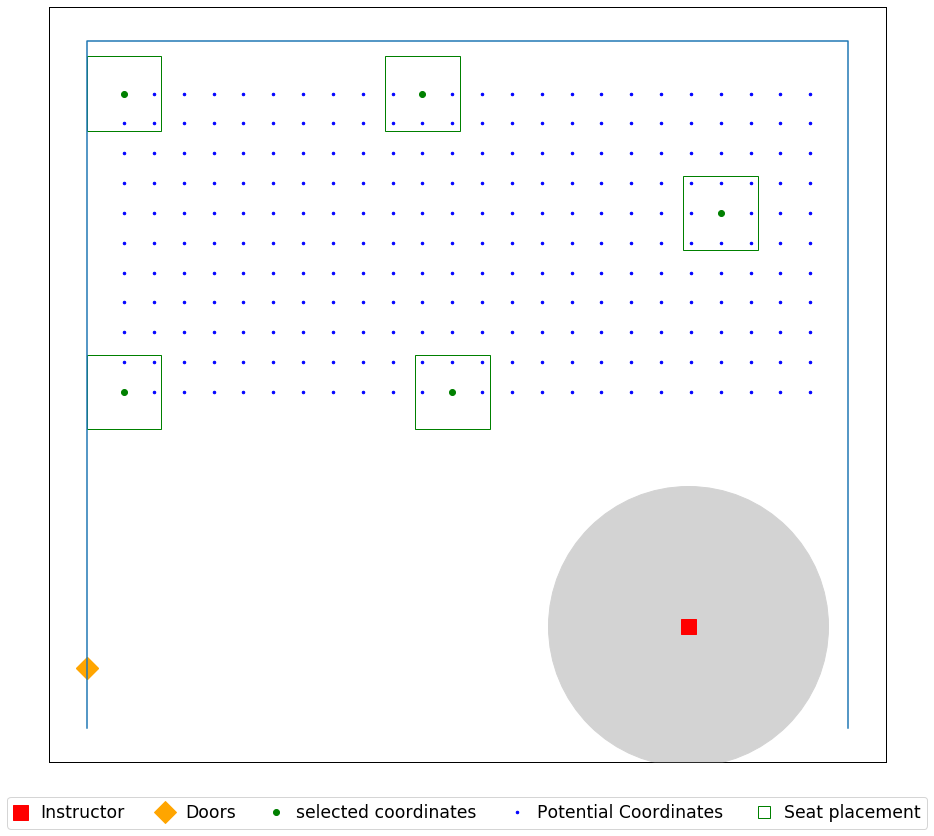

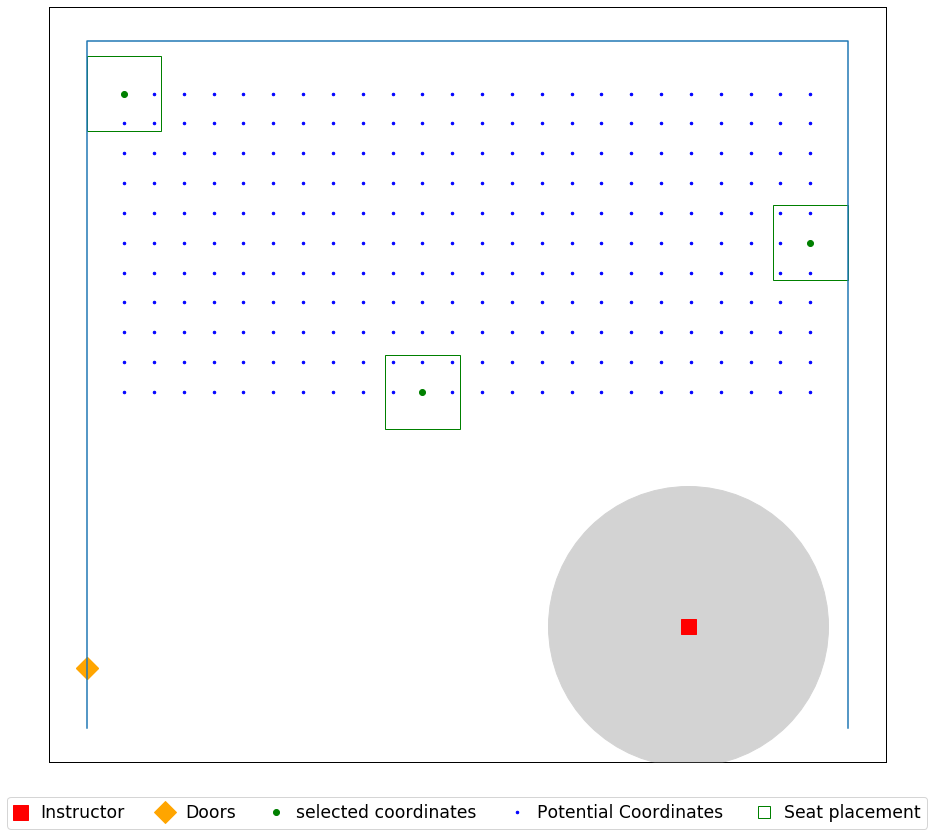

In [47]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 317

In [55]:
data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 317.xlsx'

Name = 'Skiles_317'

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.33333333  3.58333333]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


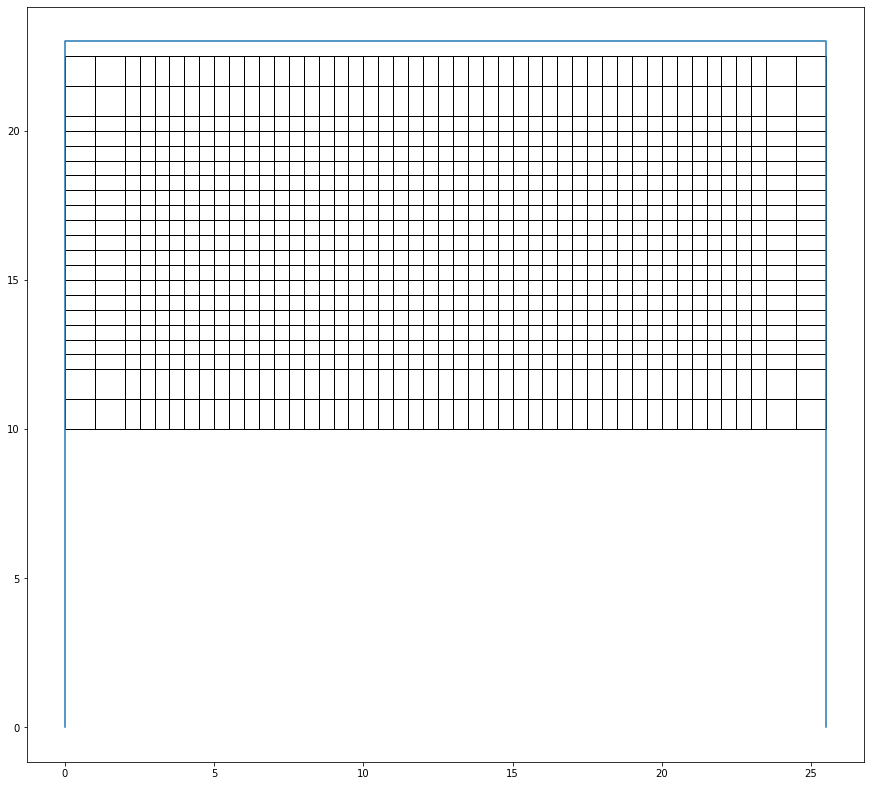

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
71
89
101
155
192
246
257
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]


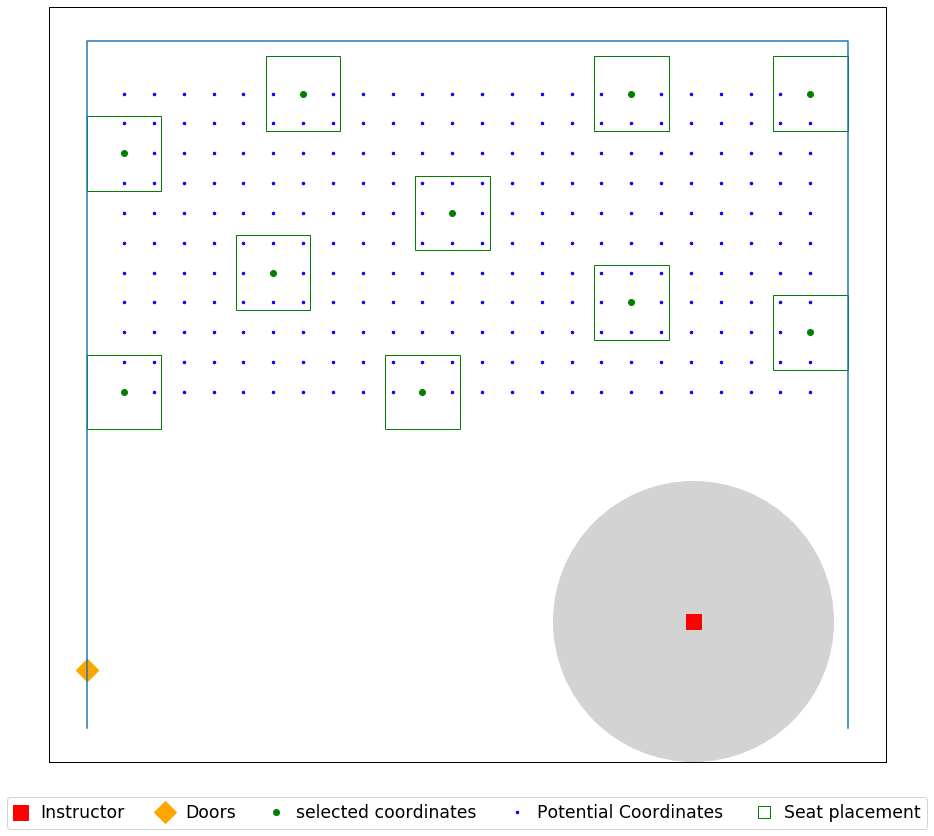

In [56]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
[[20.33333333  3.58333333]]
[(0, 10), (25.5, 10), (25.5, 23.0), (0, 23.0)]
Total number of seats  is 264


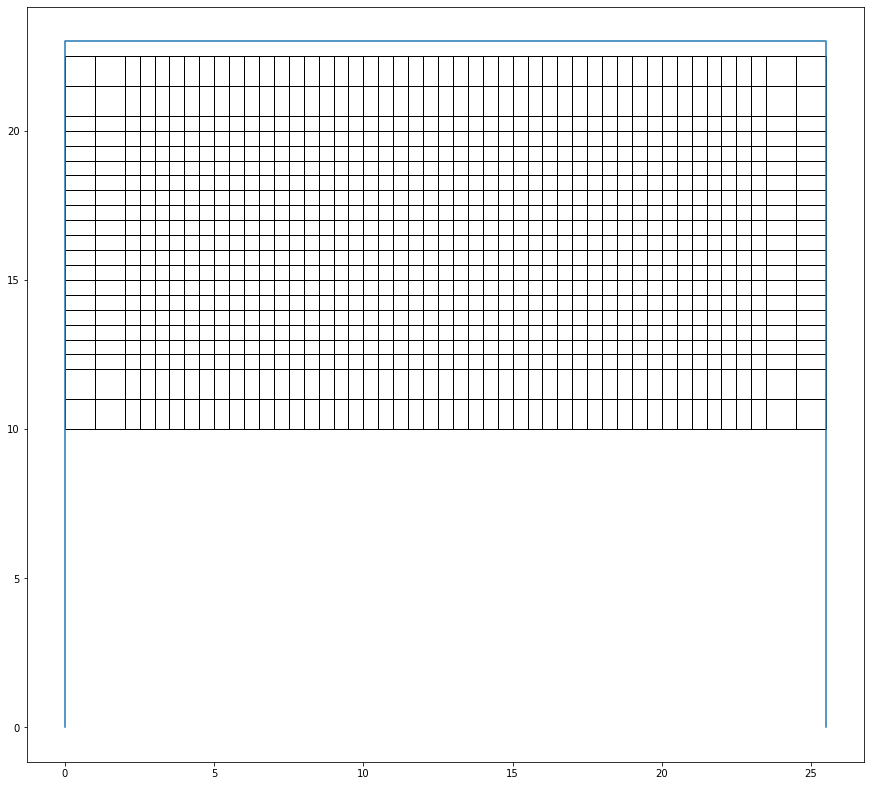

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
10
71
89
101
155
192
246
257
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 7.0
Optimal selection of seats (index):
0
8
71
160
216
248
263
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.0
Optimal selection of seats (index):
7
71
240
254
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
8
64
200
215
240
room dimension (W x H) are [[25.5 23. ]]
seat dimension (W x H) are [[2.5 2.5]]
results_

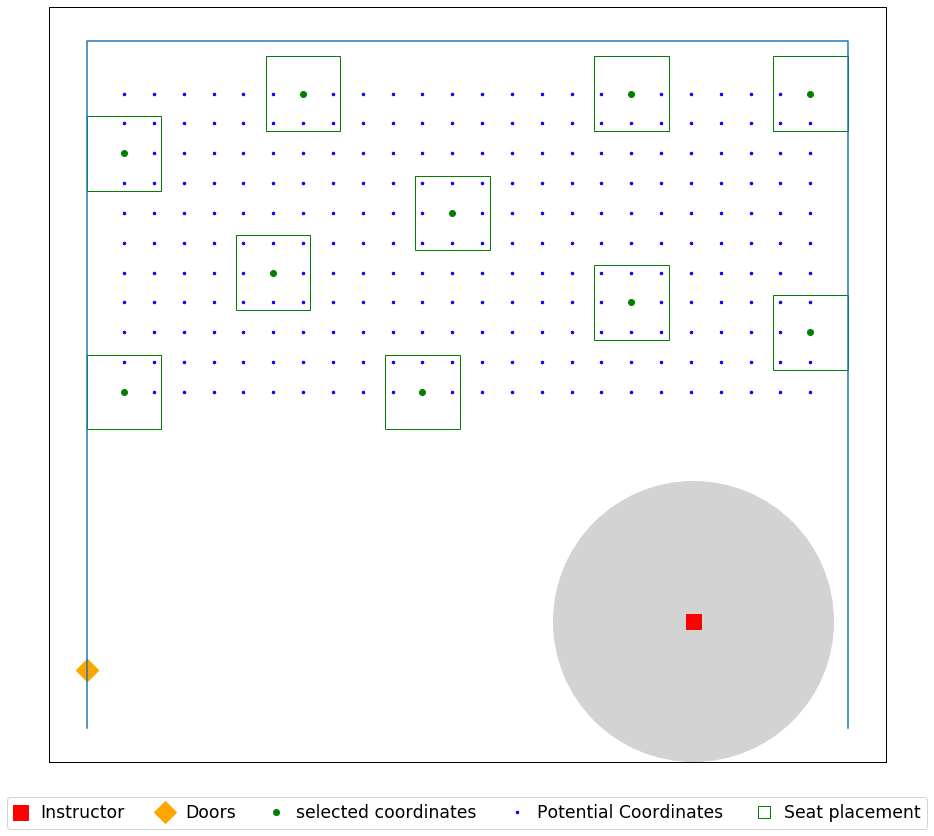

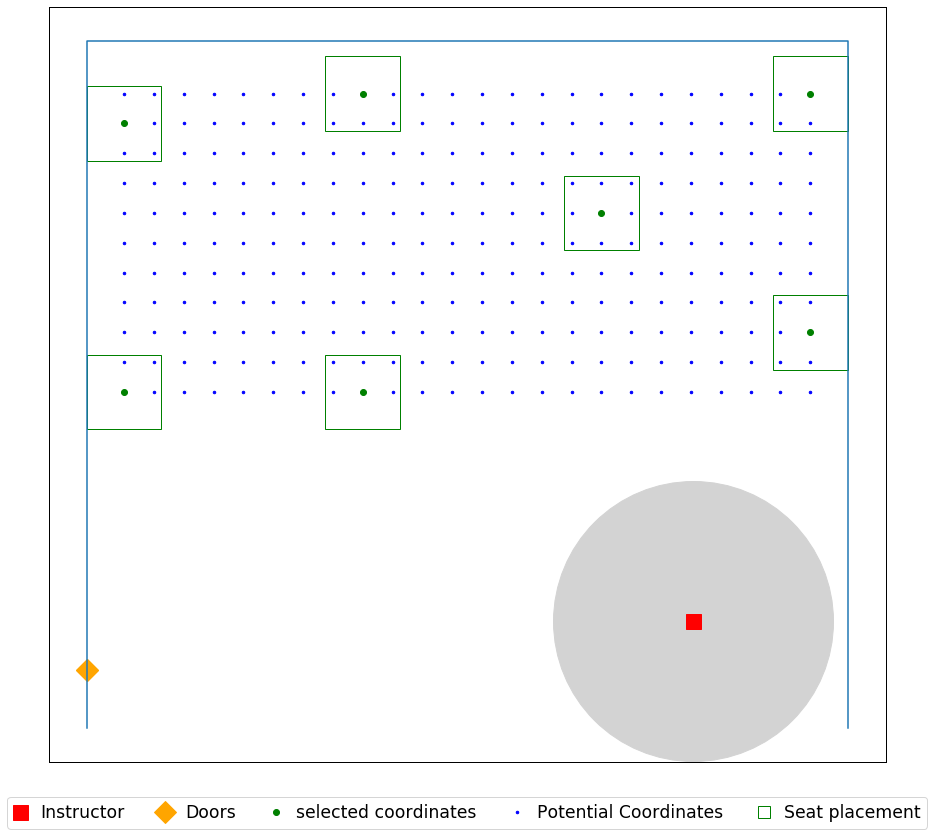

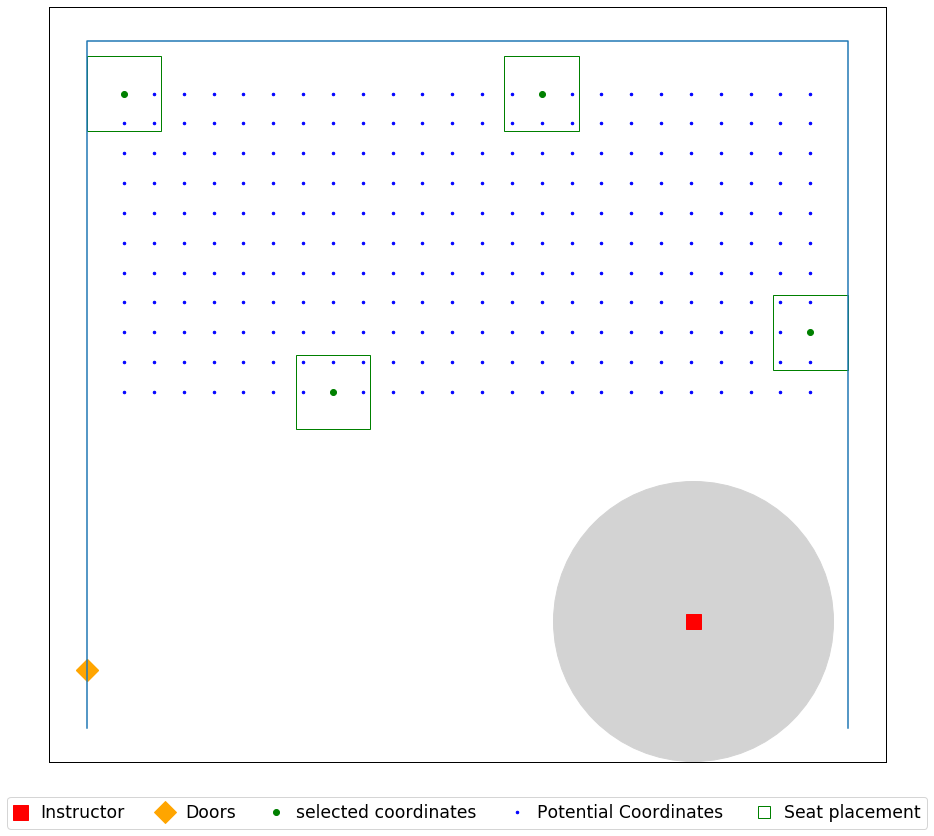

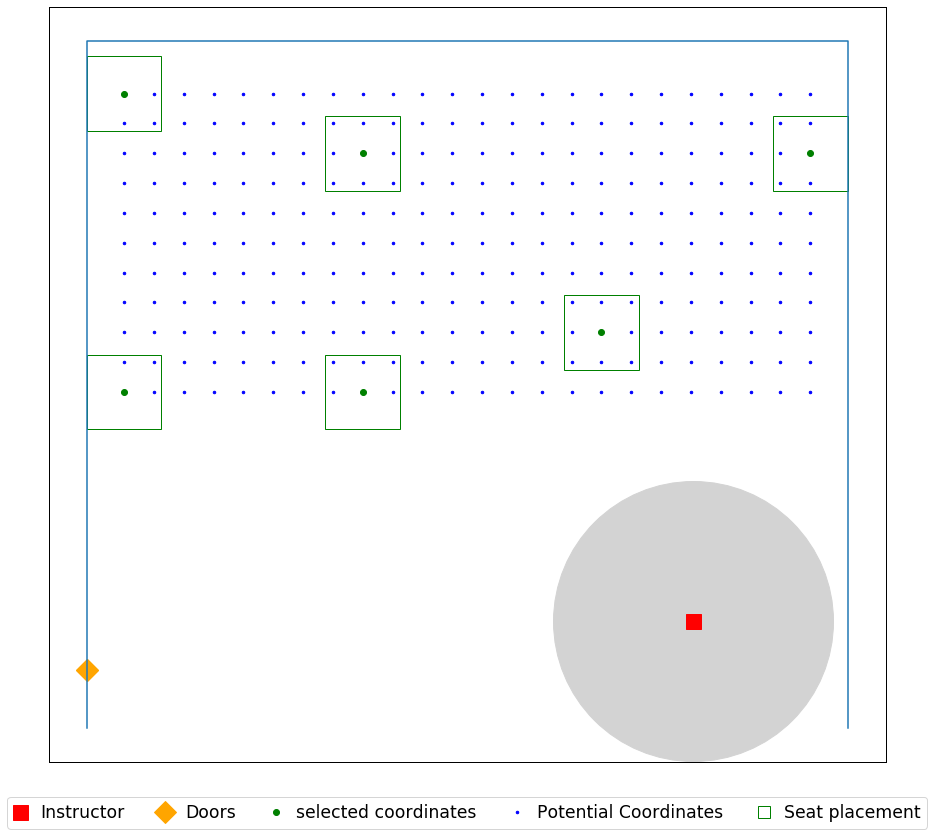

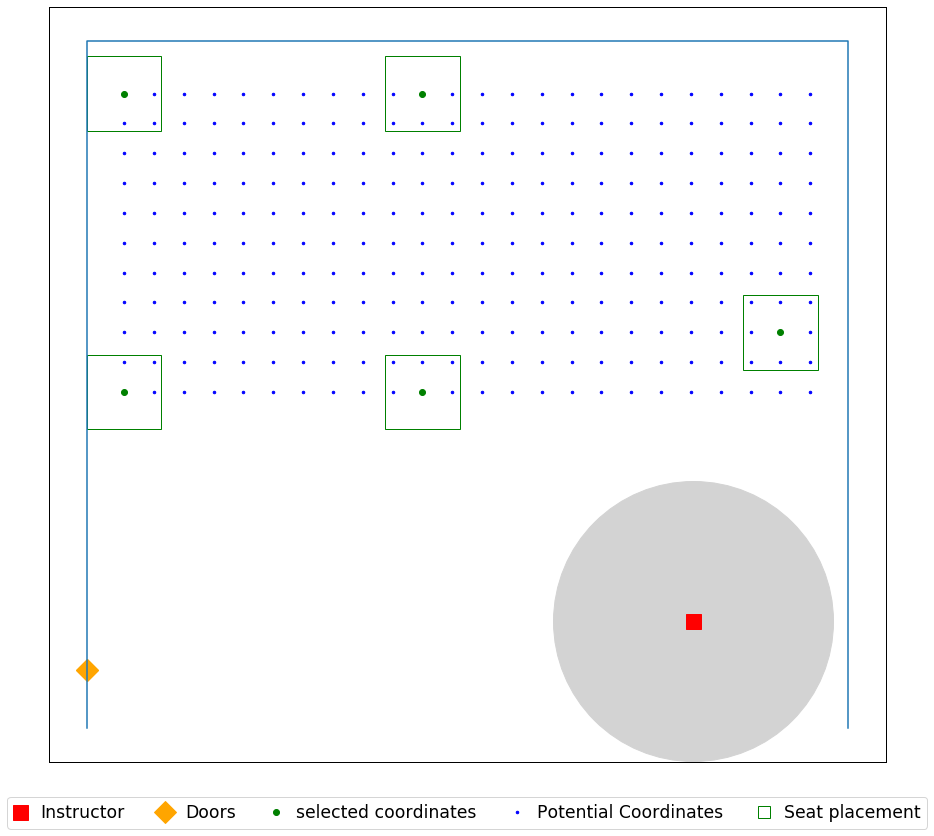

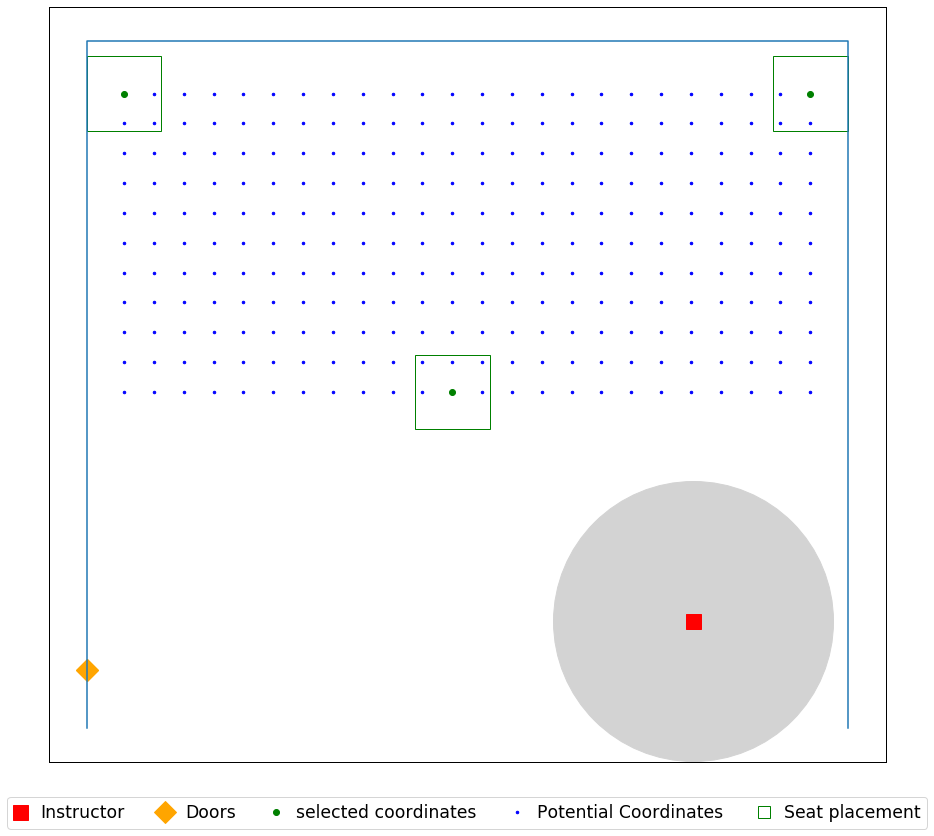

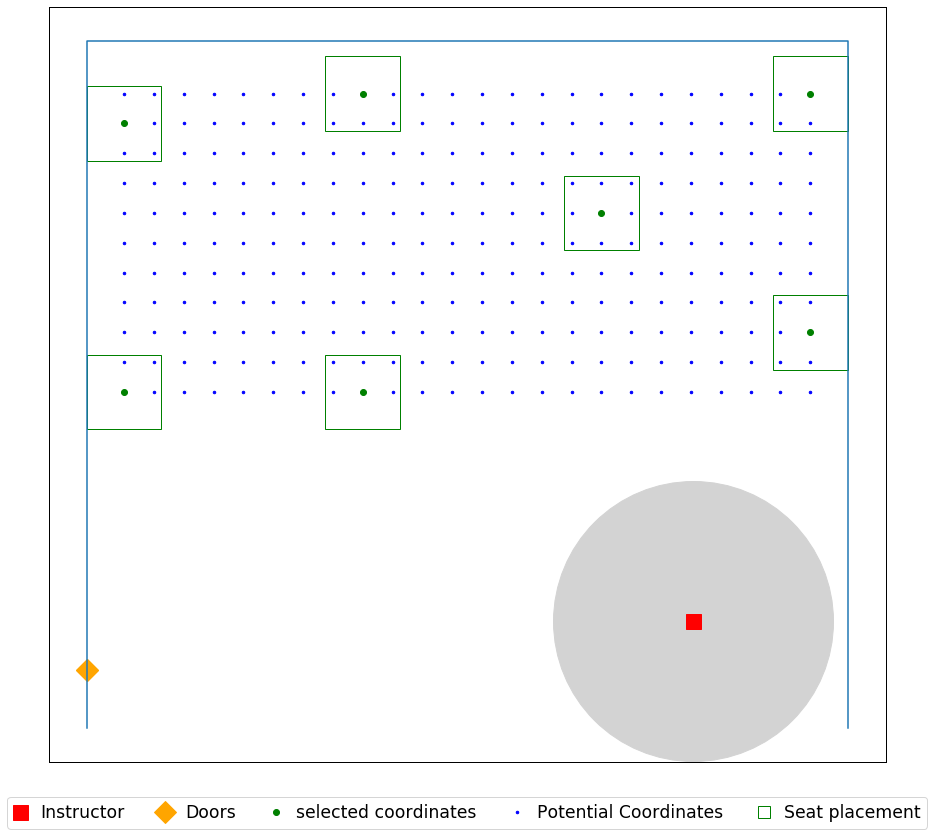

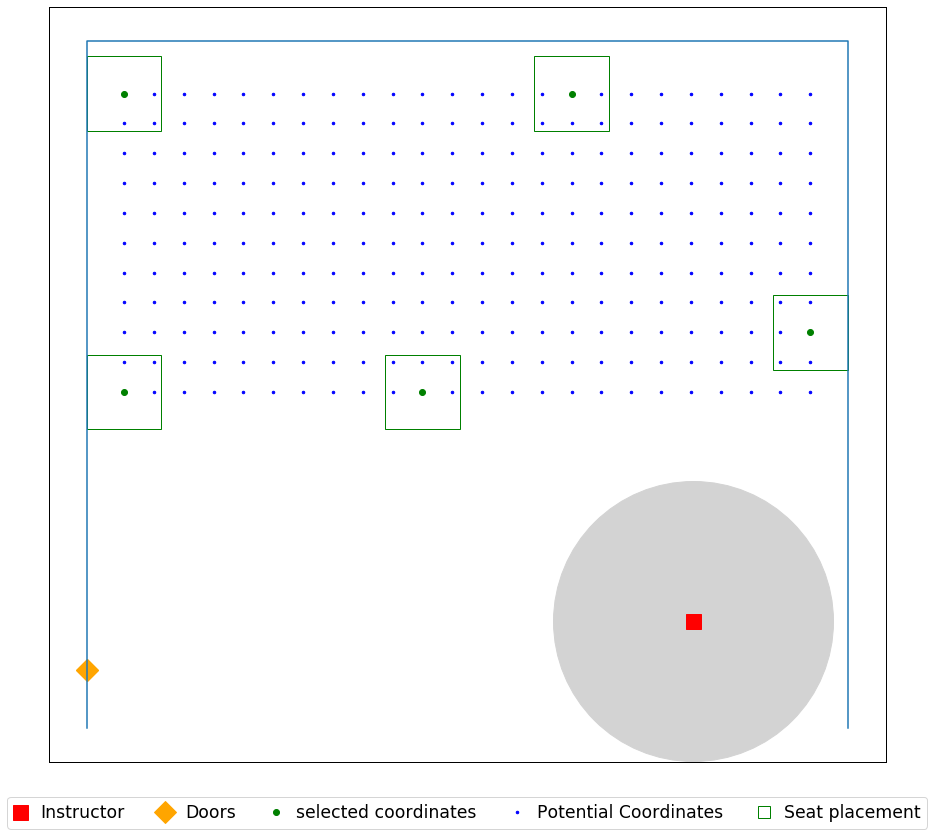

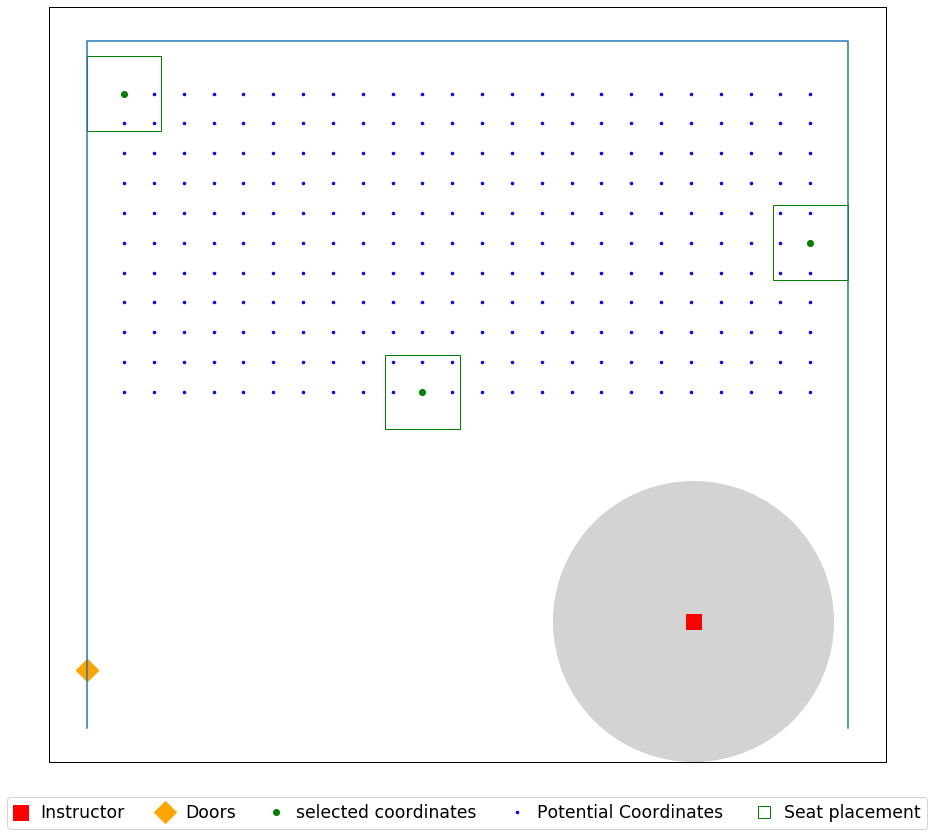

In [50]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 254

In [113]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_254_P.xlsx'

Name = 'Skiles_254'

room dimension (W x H) are [[17.75 35]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.666666666666667 2.5]]
[(0, 10), (17.75, 10), (17.75, 35), (0, 35)]
Total number of seats  is 368


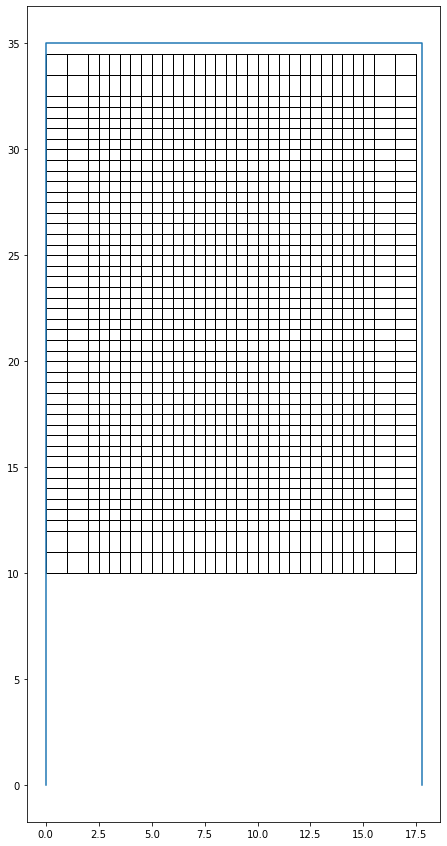

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
9
15
16
85
107
144
182
191
240
266
335
336
342
room dimension (W x H) are [[17.75 35]]
seat dimension (W x H) are [[2.5 2.5]]


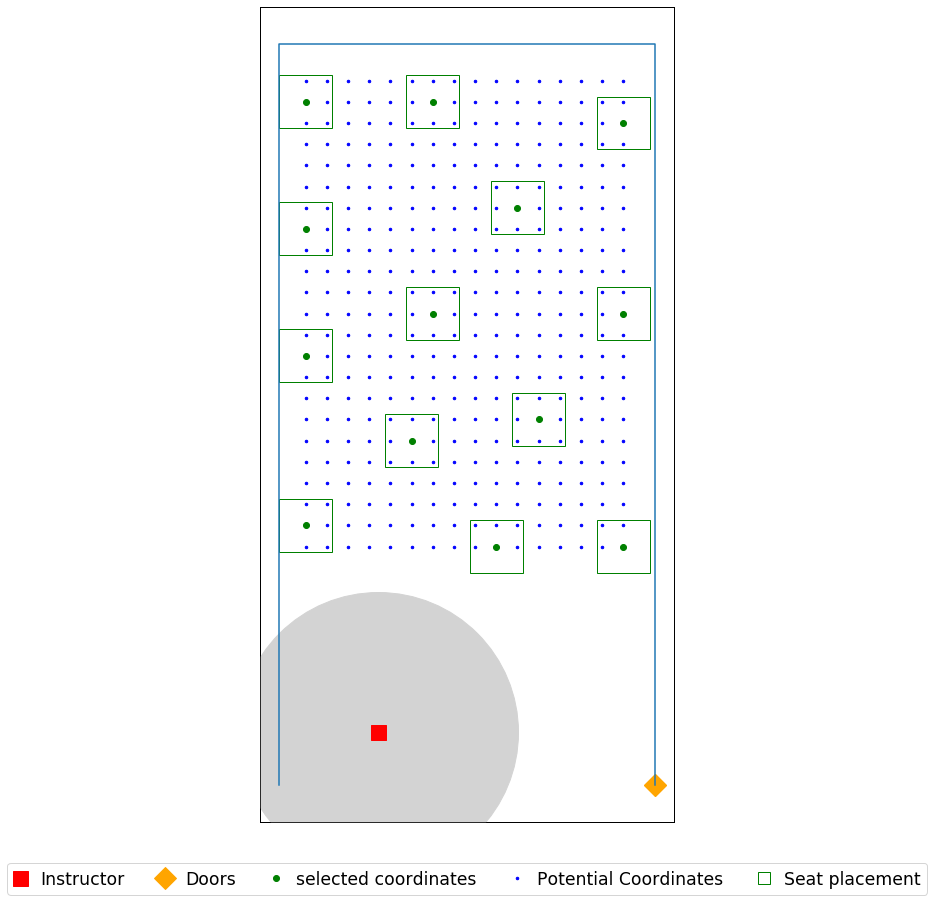

In [116]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[17.75 35]]
seat dimension (W x H) are [[2.5 2.5]]
[[4.666666666666667 2.5]]
[(0, 10), (17.75, 10), (17.75, 35), (0, 35)]
Total number of seats  is 368


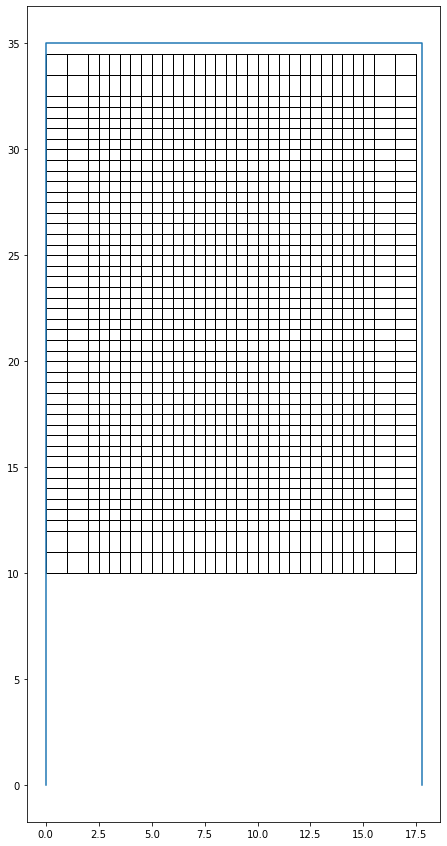

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 13.0
Optimal selection of seats (index):
9
15
16
85
107
144
182
191
240
266
335
336
342
room dimension (W x H) are [[17.75 35]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
16
24
95
152
209
239
296
352
367
room dimension (W x H) are [[17.75 35]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
15
16
168
304
366
room dimension (W x H) are [[17.75 35]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 8.0
Optimal selection of seats (index):
15
16
104
144
239
247
352
366
room dimension (W x H) are [[17.75 35]]
seat dimensio

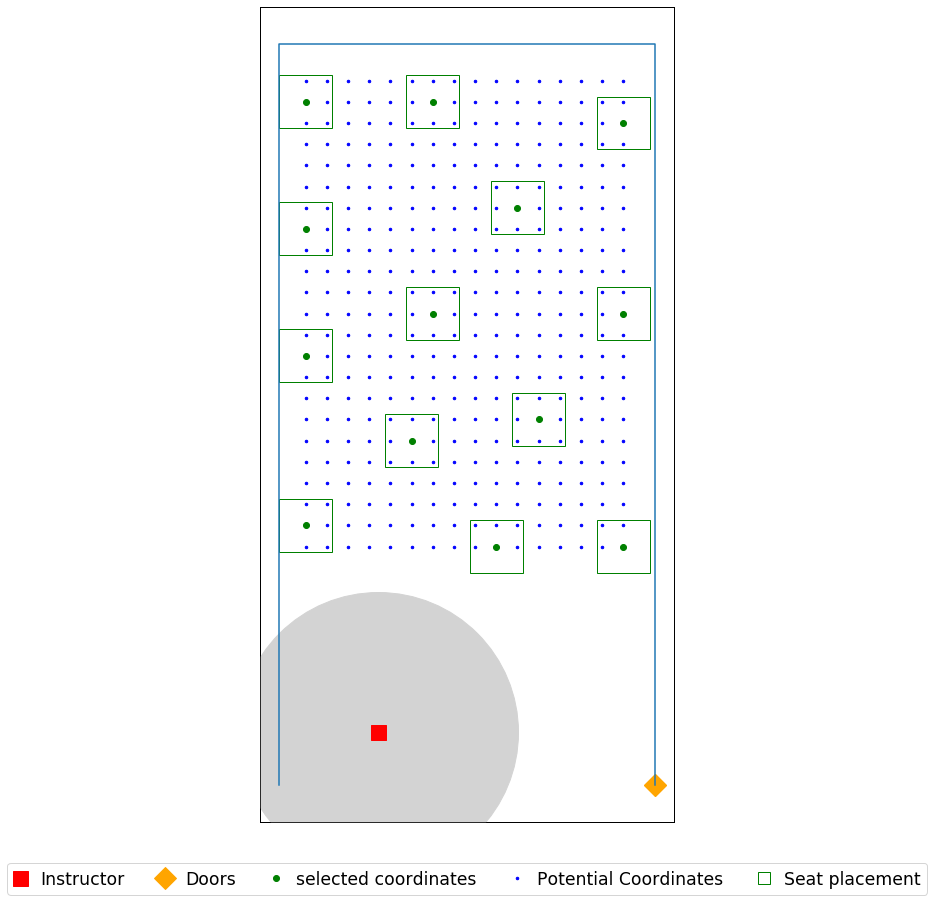

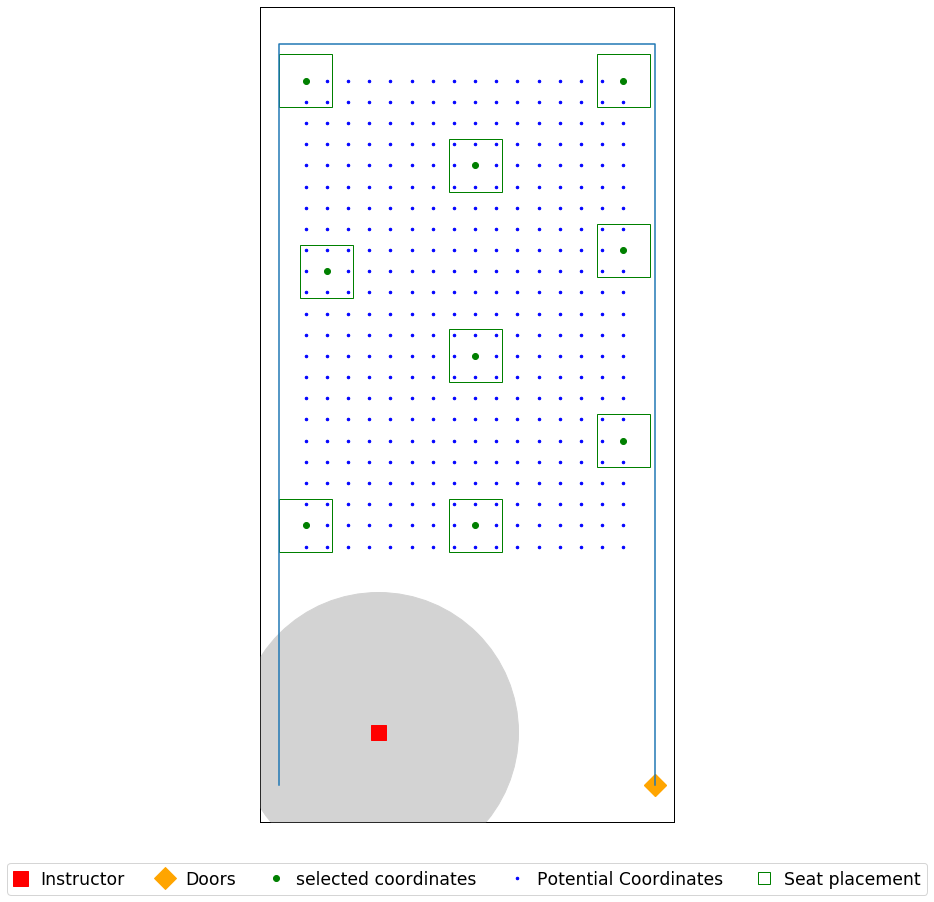

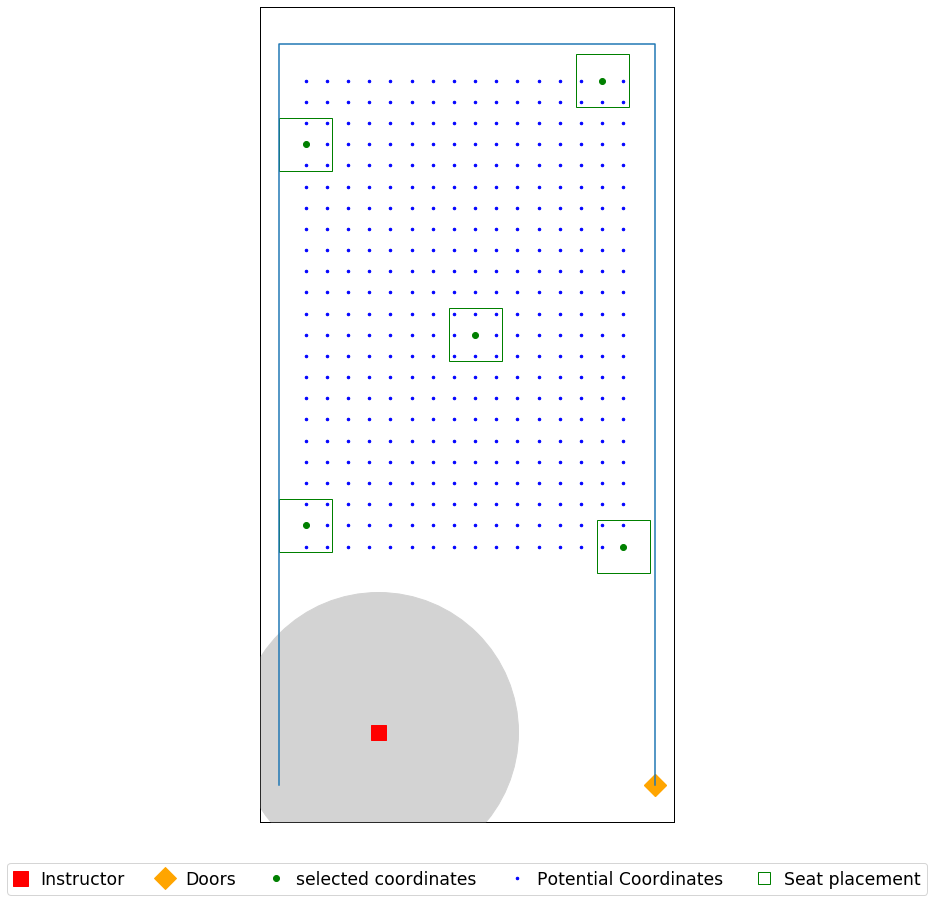

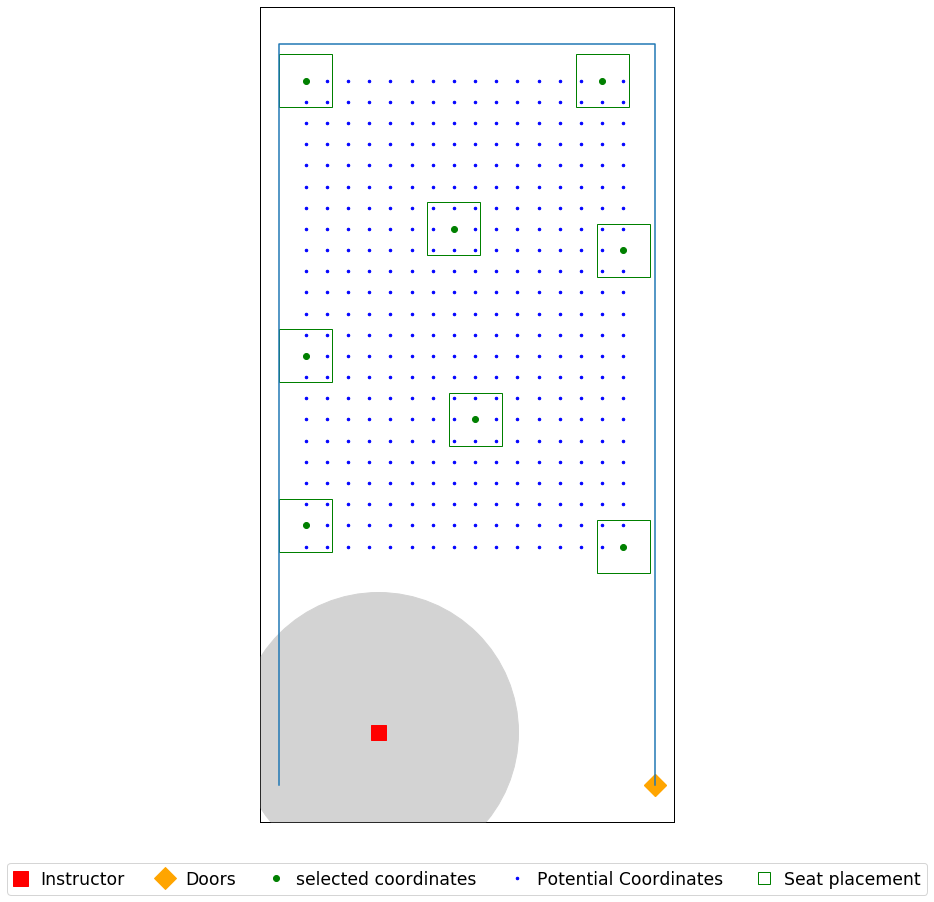

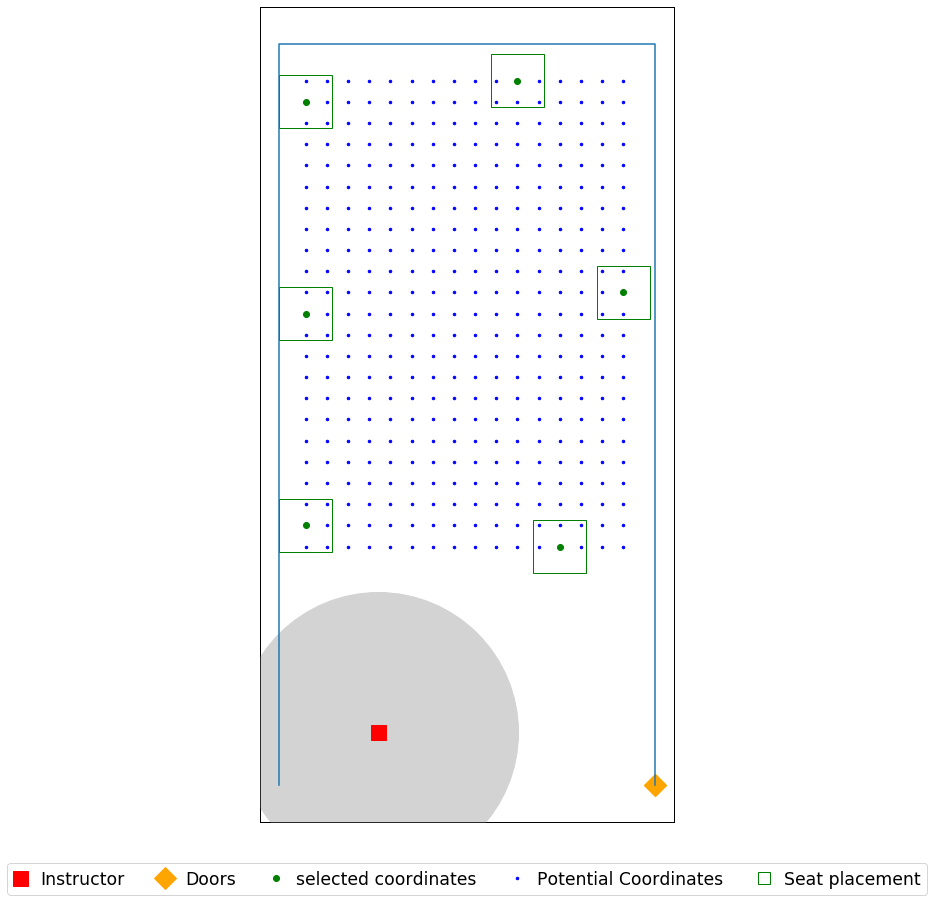

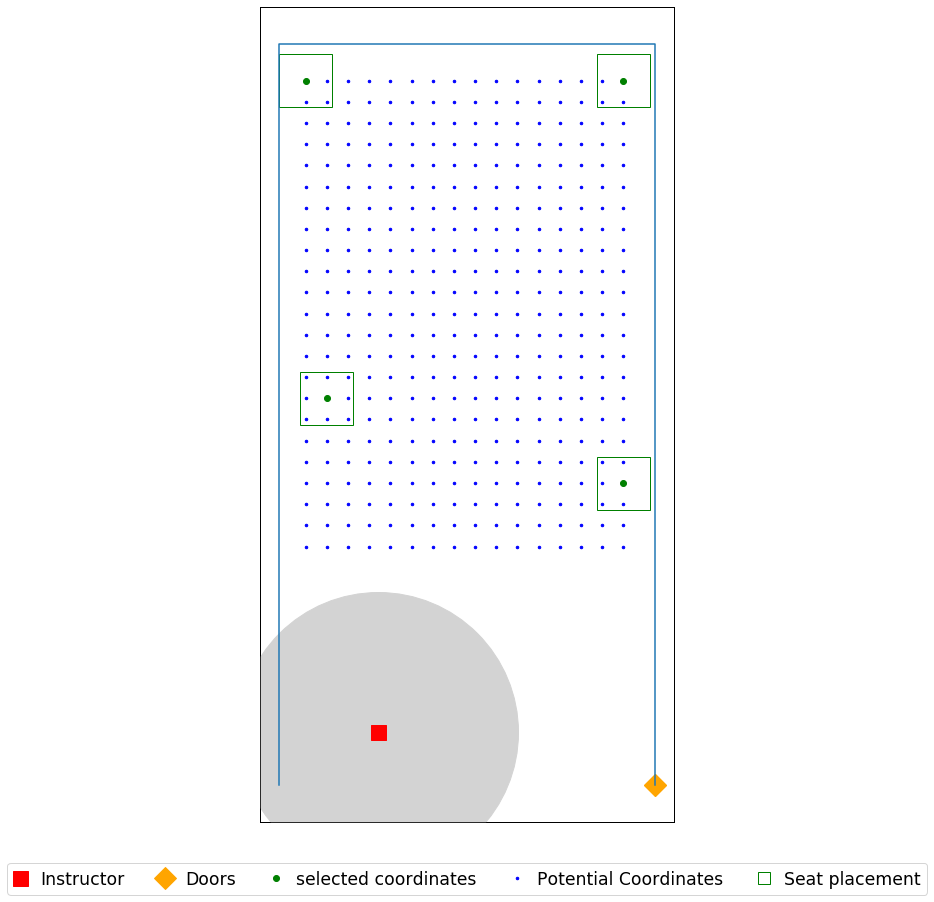

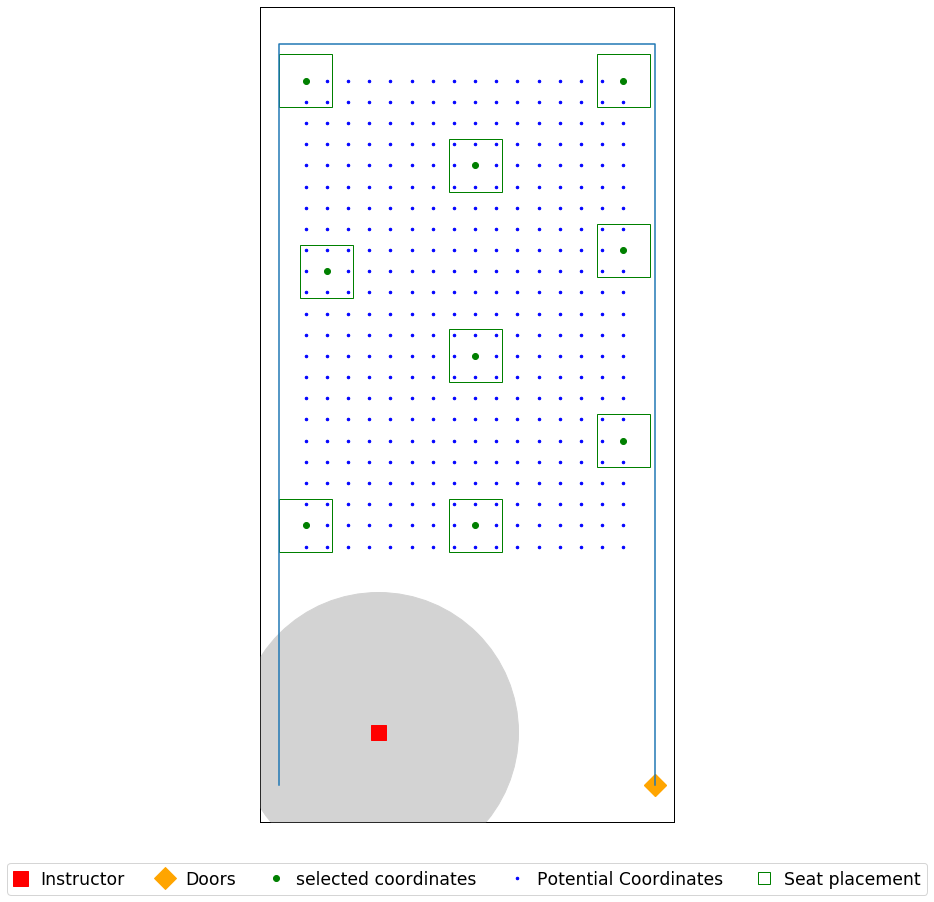

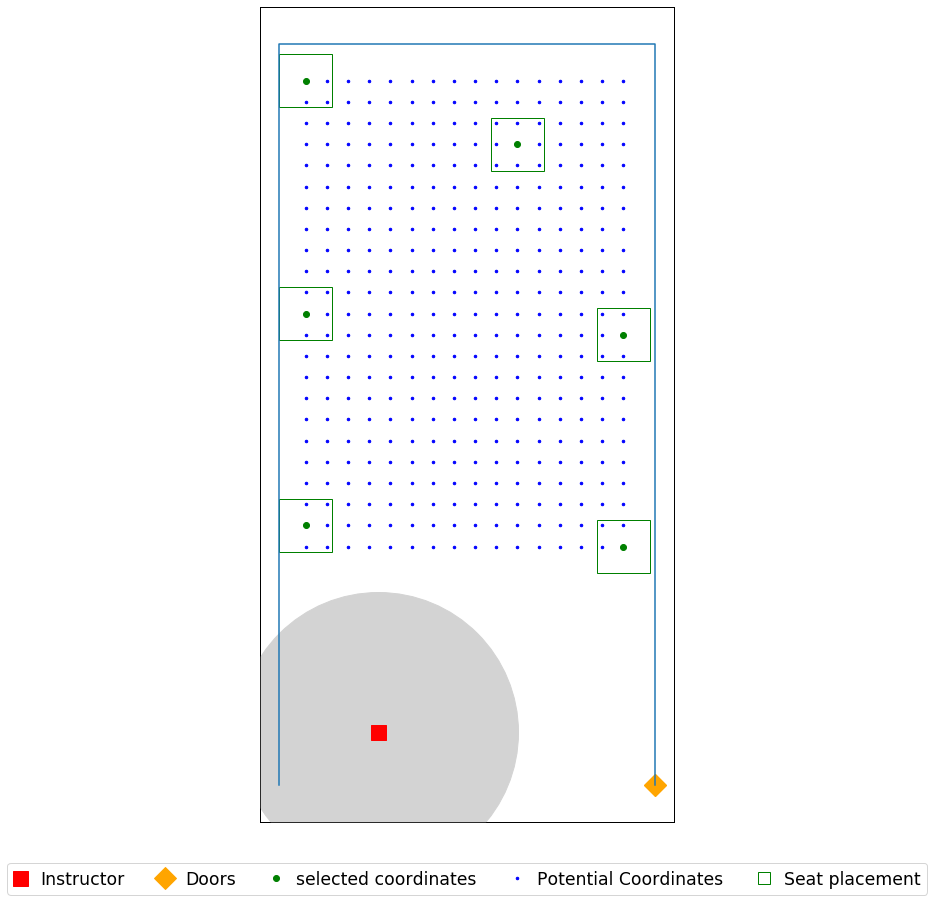

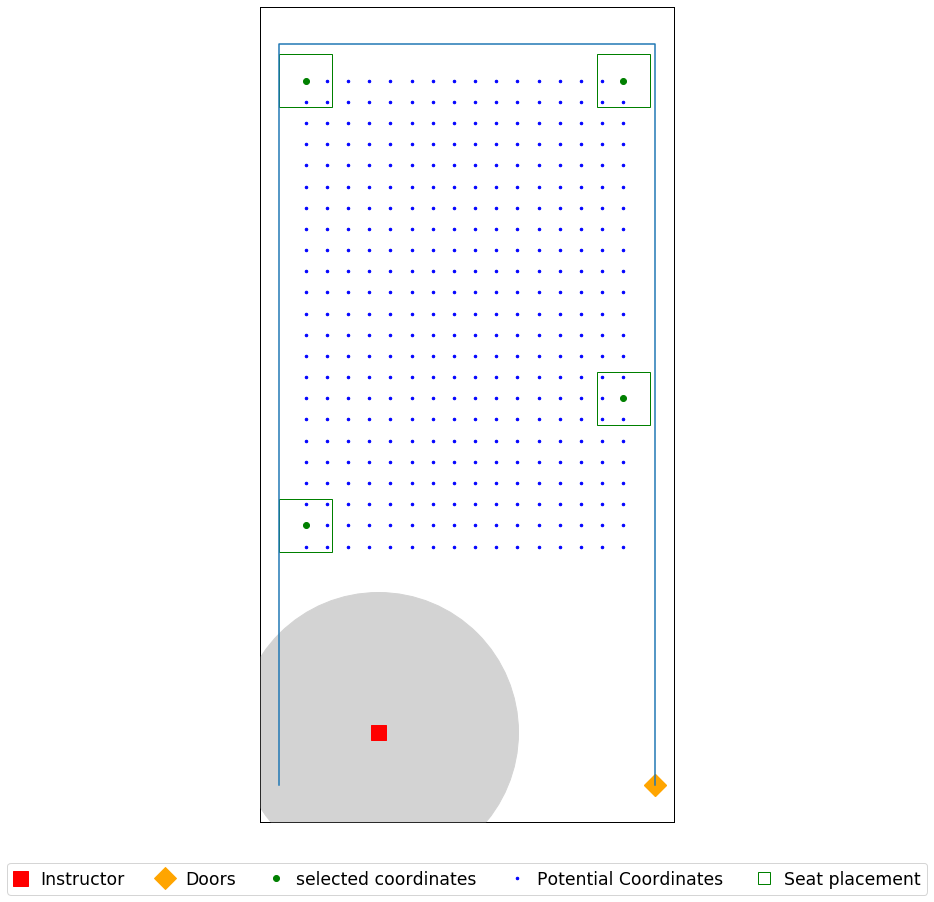

In [117]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 255

In [121]:
data_file = r'C:\Users\yoges\Desktop\Input\Skiles_255_P.xlsx'

Name = 'Skiles_255'

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[17.33333333  2.41666667]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


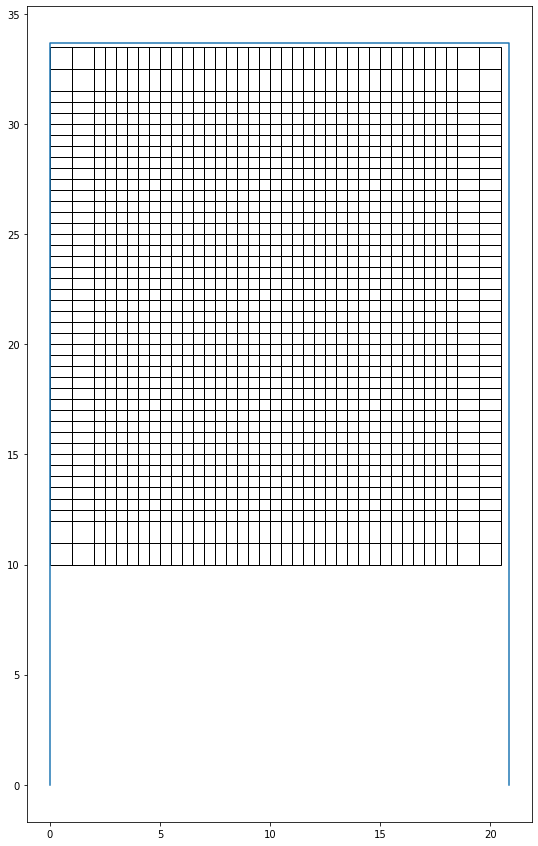

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
6
31
37
114
120
145
151
228
234
259
265
342
348
373
379
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]


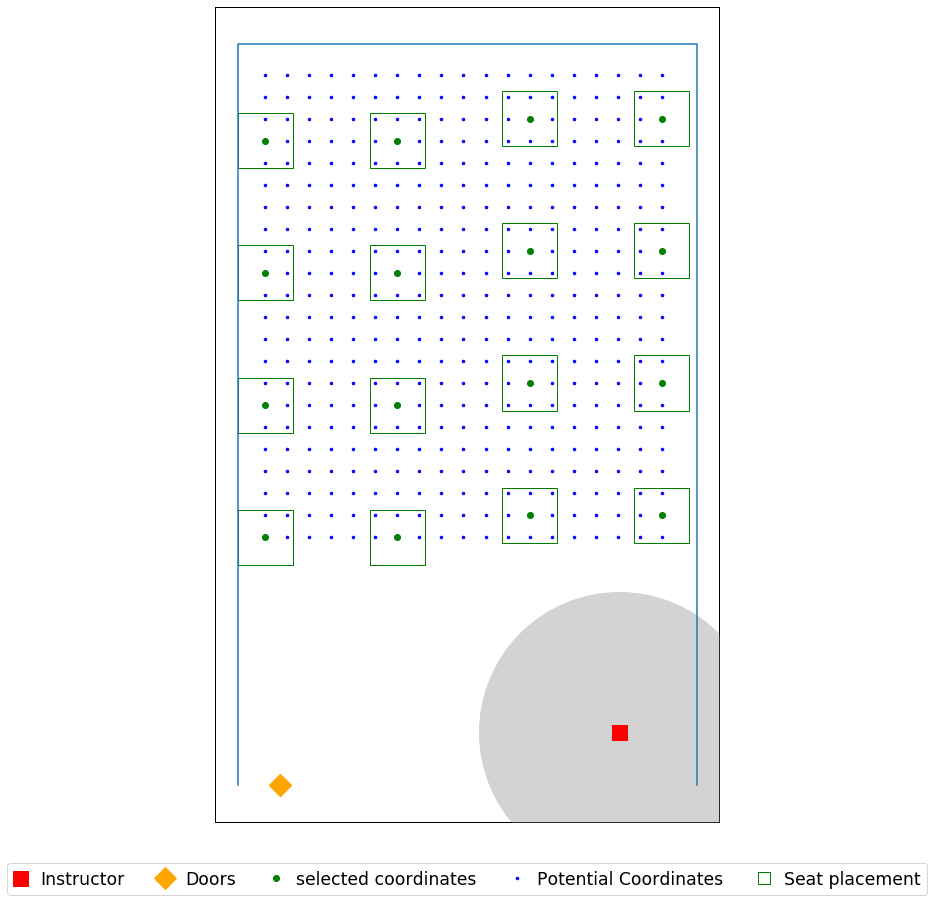

In [120]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
[[17.33333333  2.41666667]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 33.666666666666664), (0, 33.666666666666664)]
Total number of seats  is 418


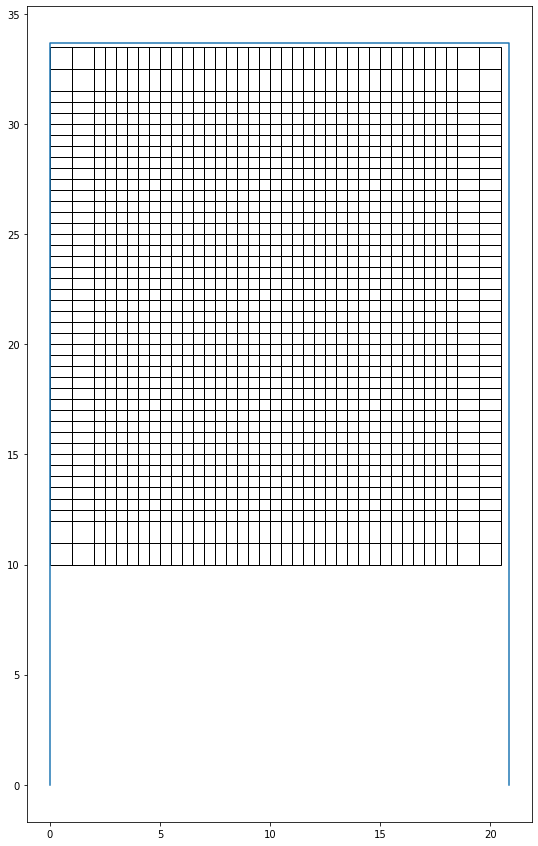

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
6
31
37
114
120
145
151
228
234
259
265
342
348
373
379
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
8
37
137
145
265
266
274
394
403
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
8
151
171
396
399
room dimension (W x H) are [[20.83333333 33.66666667]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
37
152
160
187
304
3

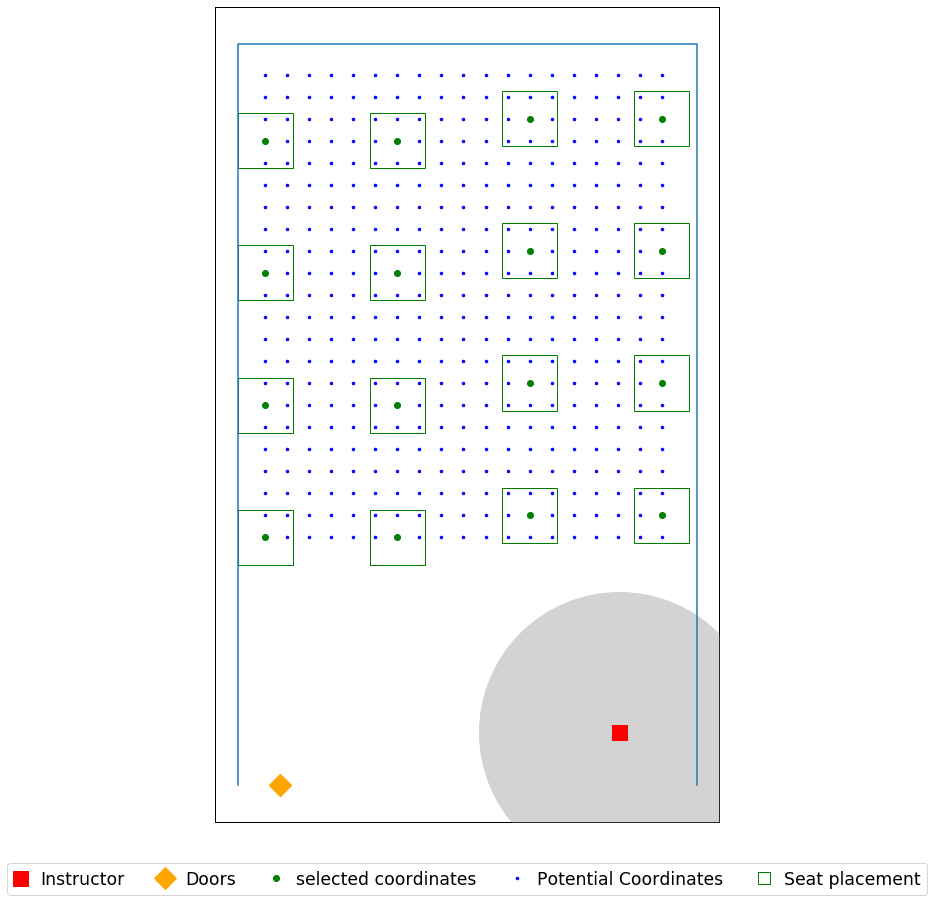

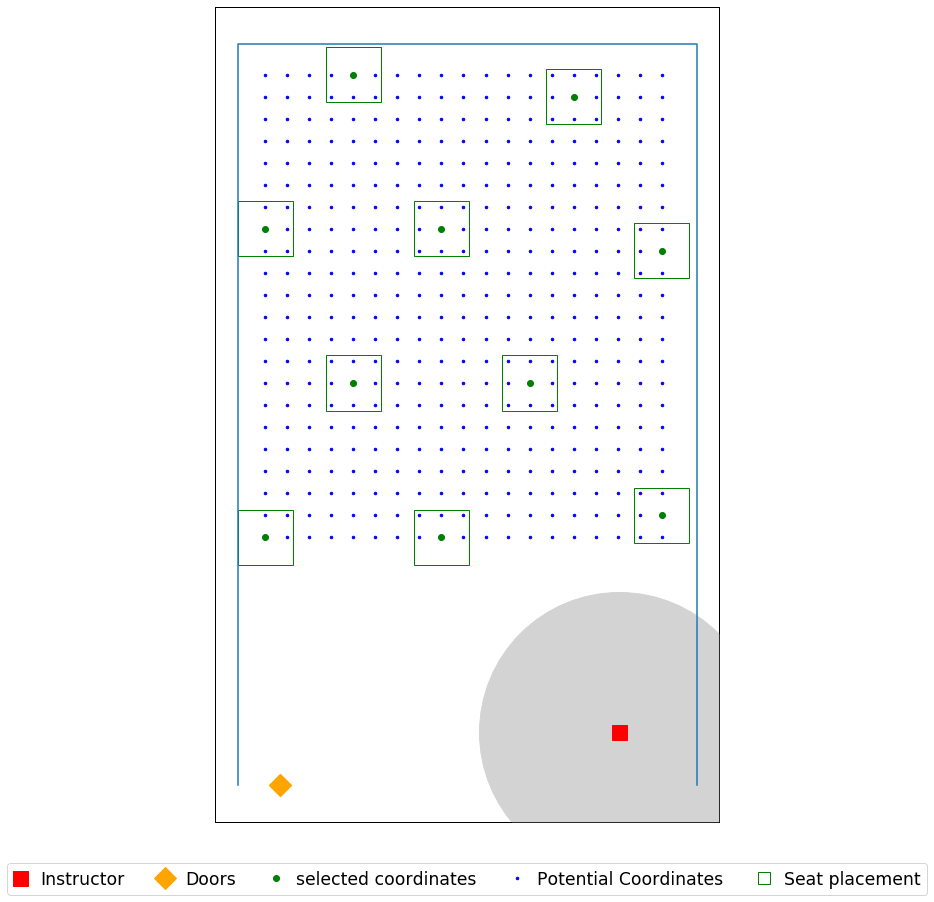

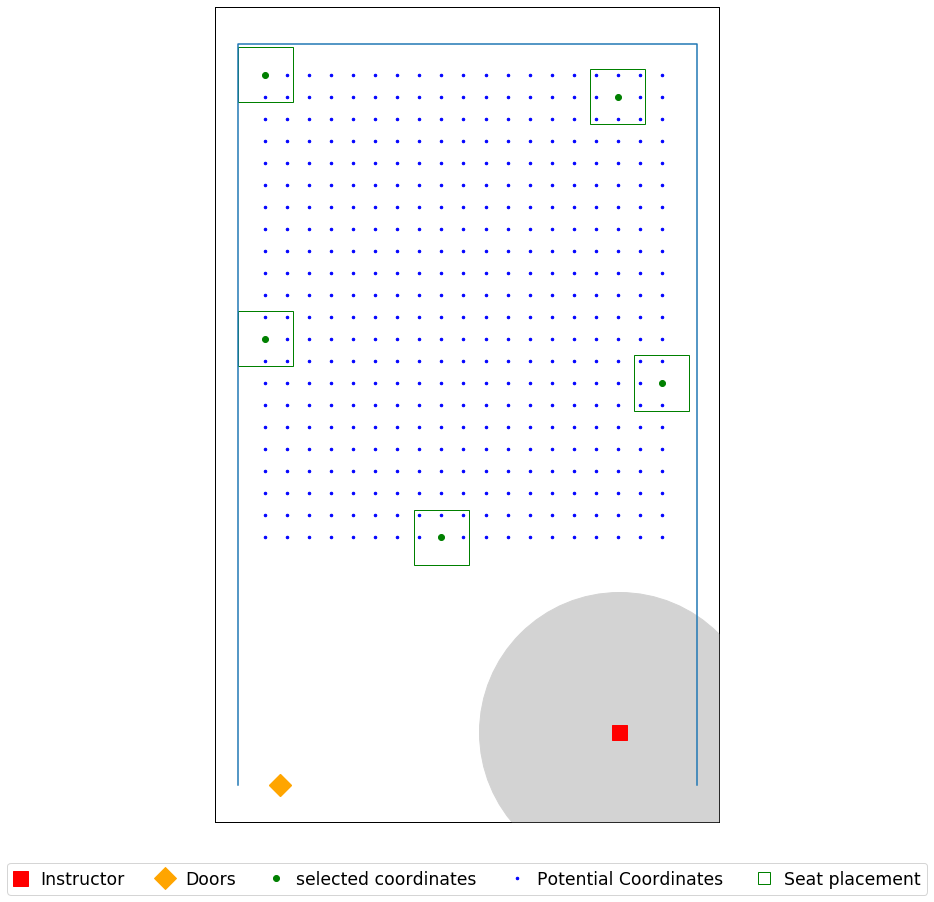

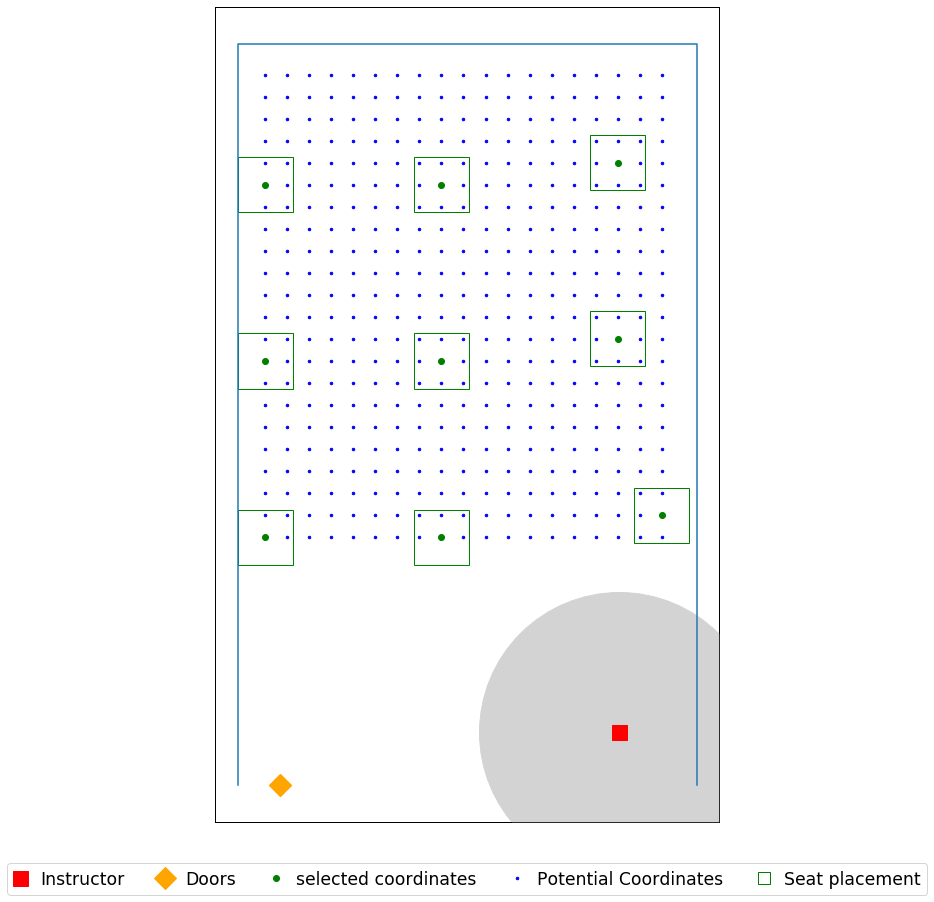

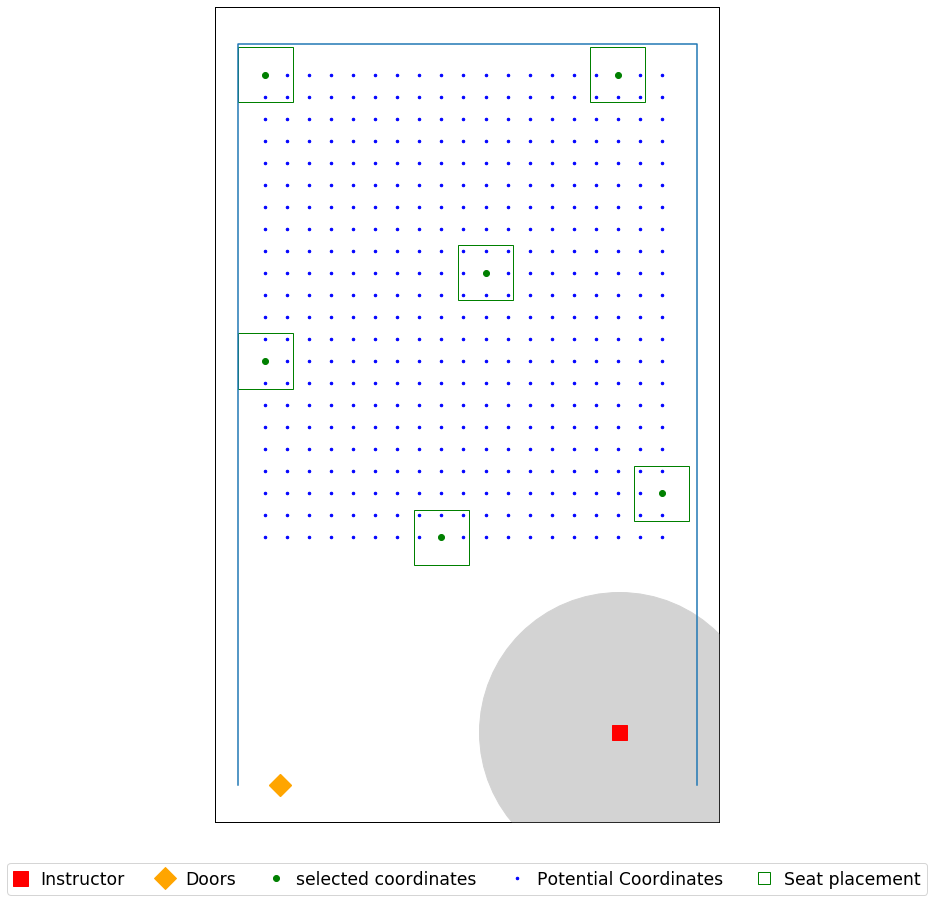

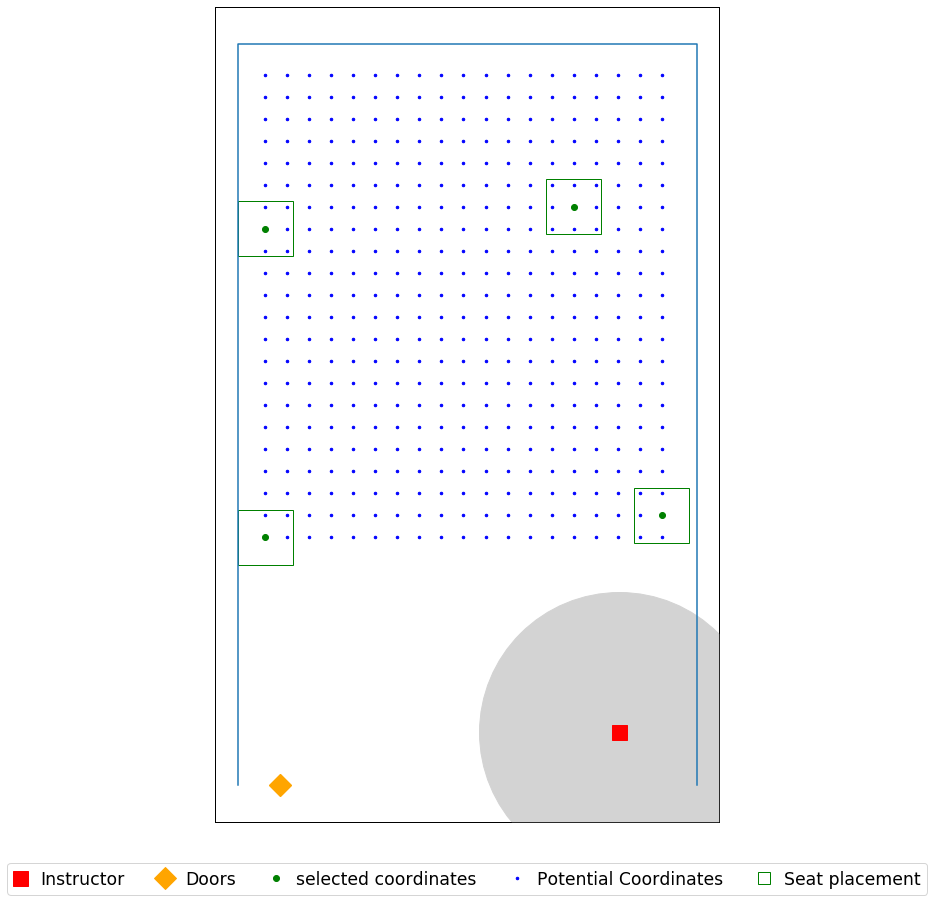

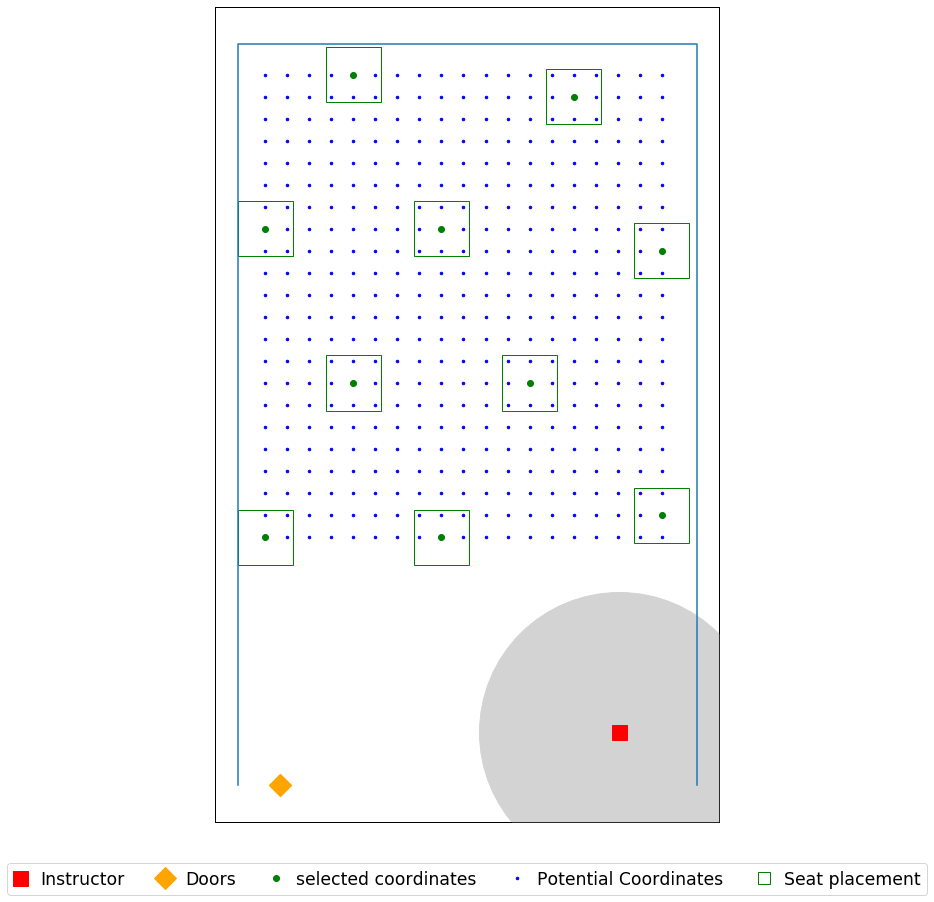

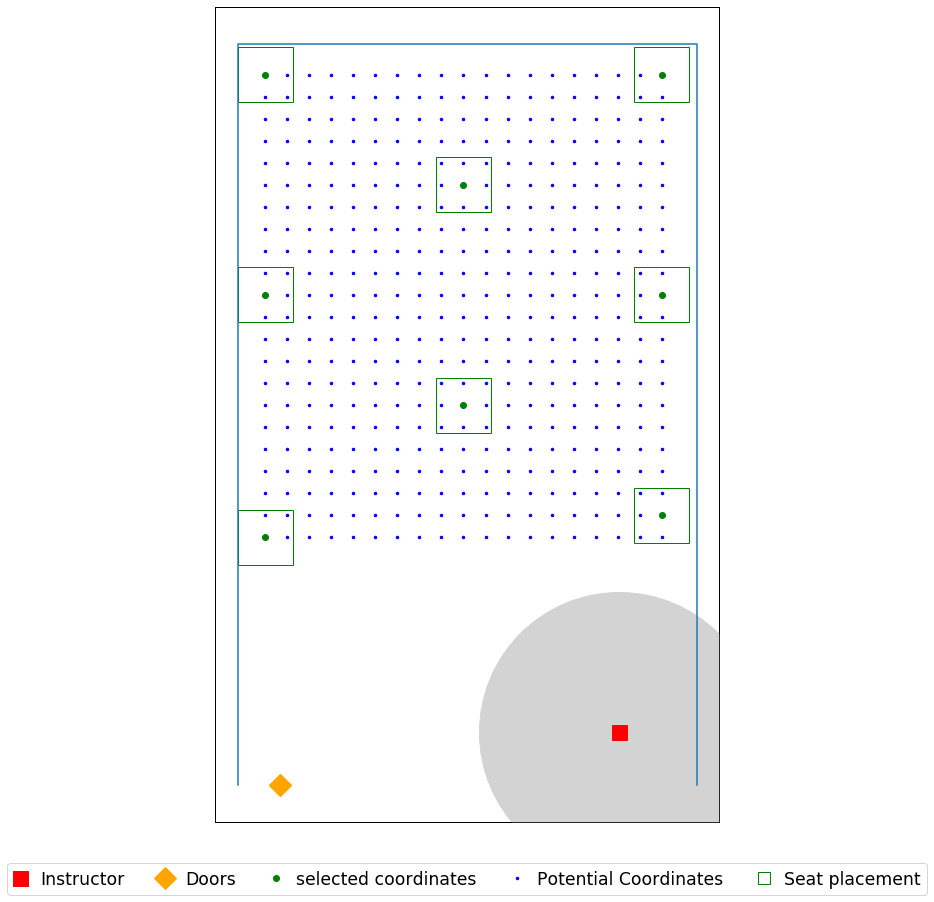

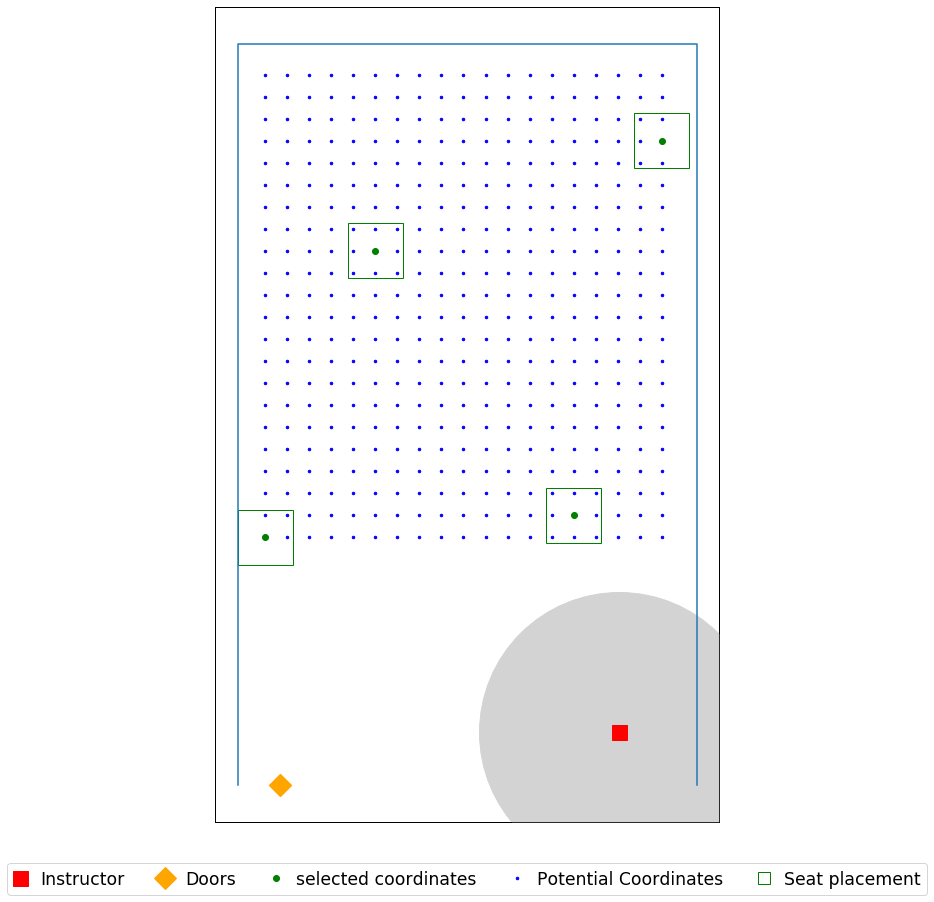

In [122]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 156

In [123]:
data_file = r'C:\Users\yoges\Desktop\Input\07.30\Skiles_156_P.xlsx'

Name = 'Skiles_156'

room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[[17.25 2.4166666666666665]]
[(0, 10), (19.5, 10), (19.5, 35), (0, 35)]
Total number of seats  is 414


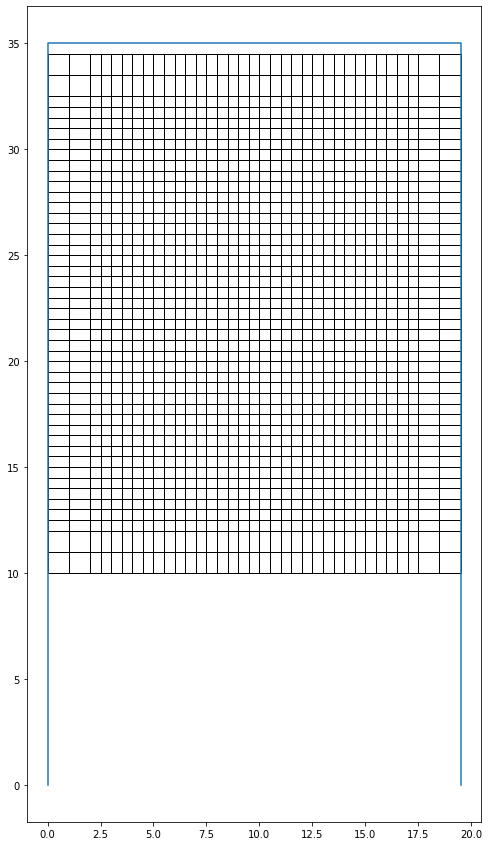

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
6
30
107
108
114
174
216
222
299
305
329
396
406
412
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]


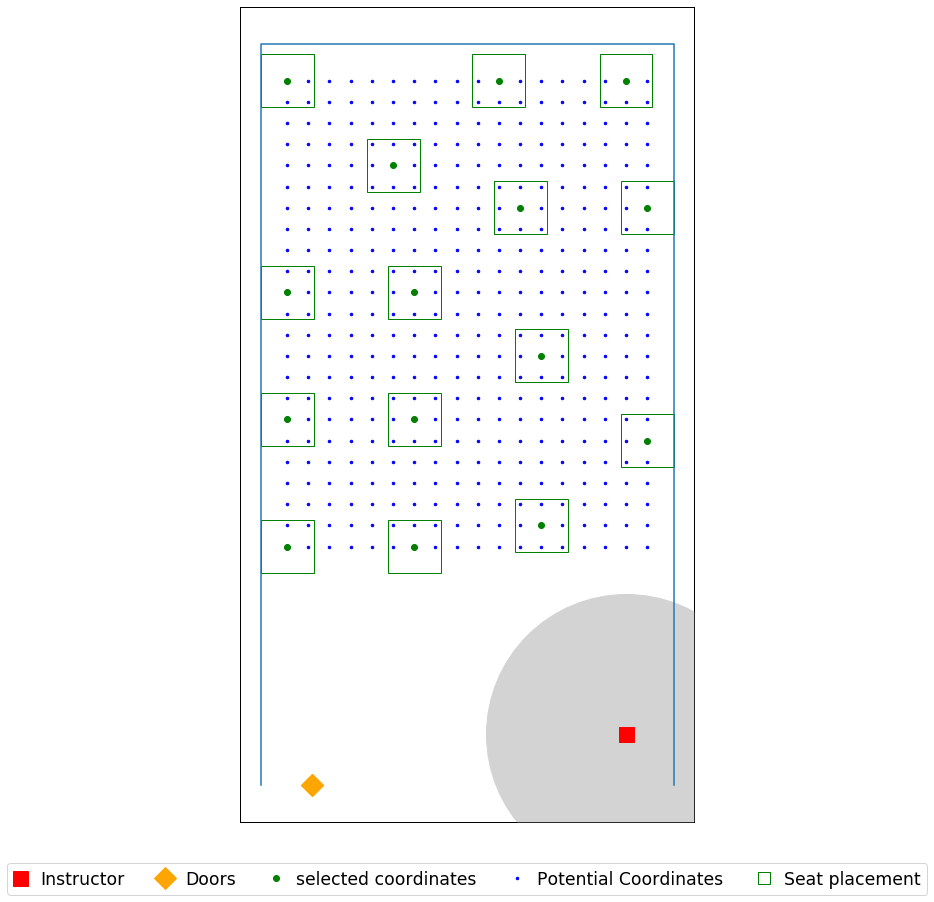

In [124]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
[[17.25 2.4166666666666665]]
[(0, 10), (19.5, 10), (19.5, 35), (0, 35)]
Total number of seats  is 414


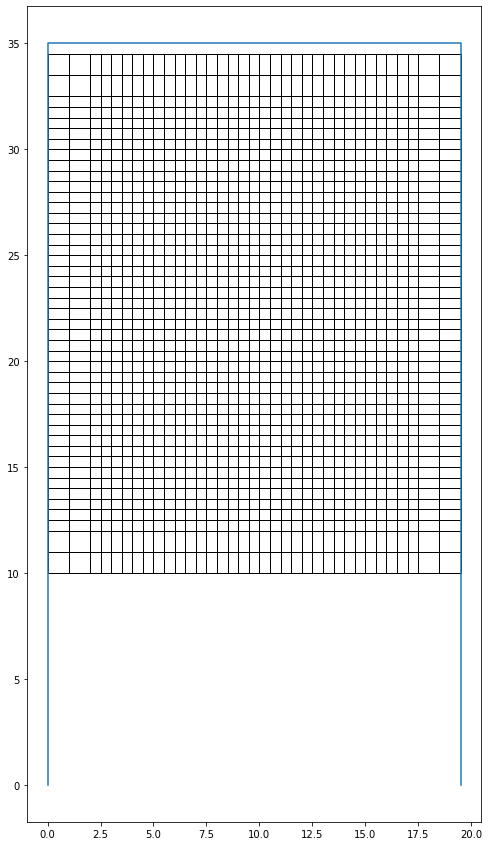

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 15.0
Optimal selection of seats (index):
0
6
30
107
108
114
174
216
222
299
305
329
396
406
412
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
0
8
53
130
252
260
269
396
405
413
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
0
30
203
233
396
room dimension (W x H) are [[19.5 35]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
53
144
152
196
288
296
340
room dimension (W x H) are [[19.5 35]]
seat d

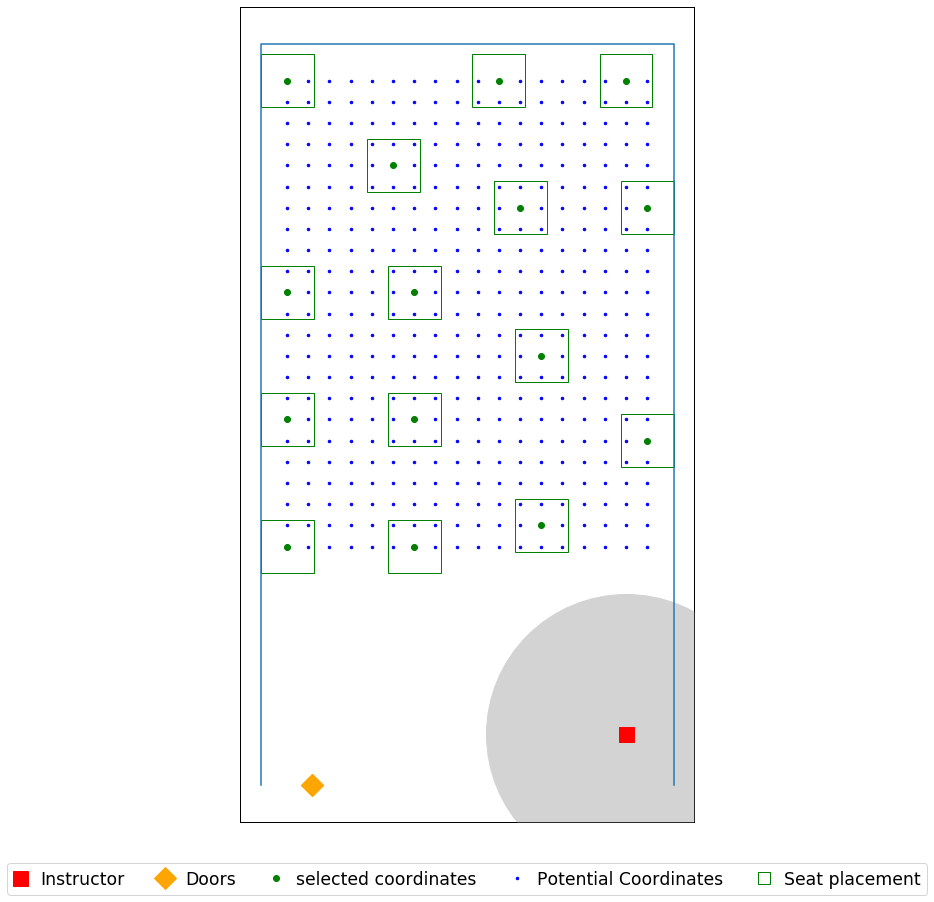

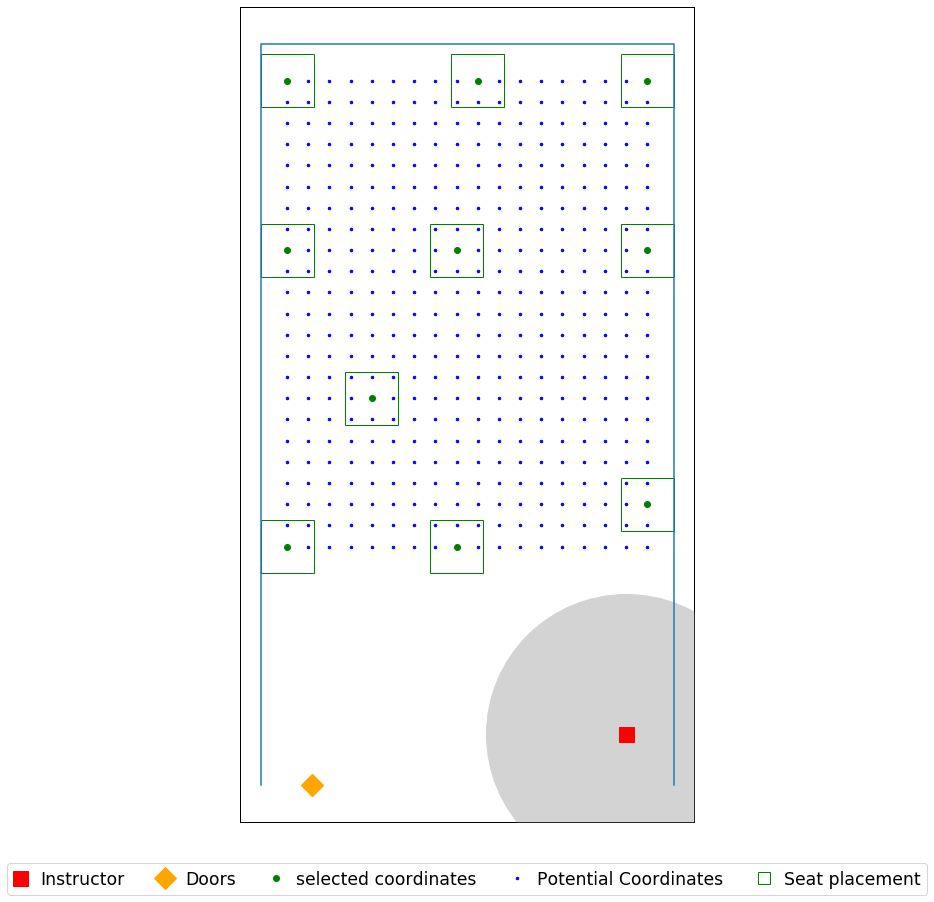

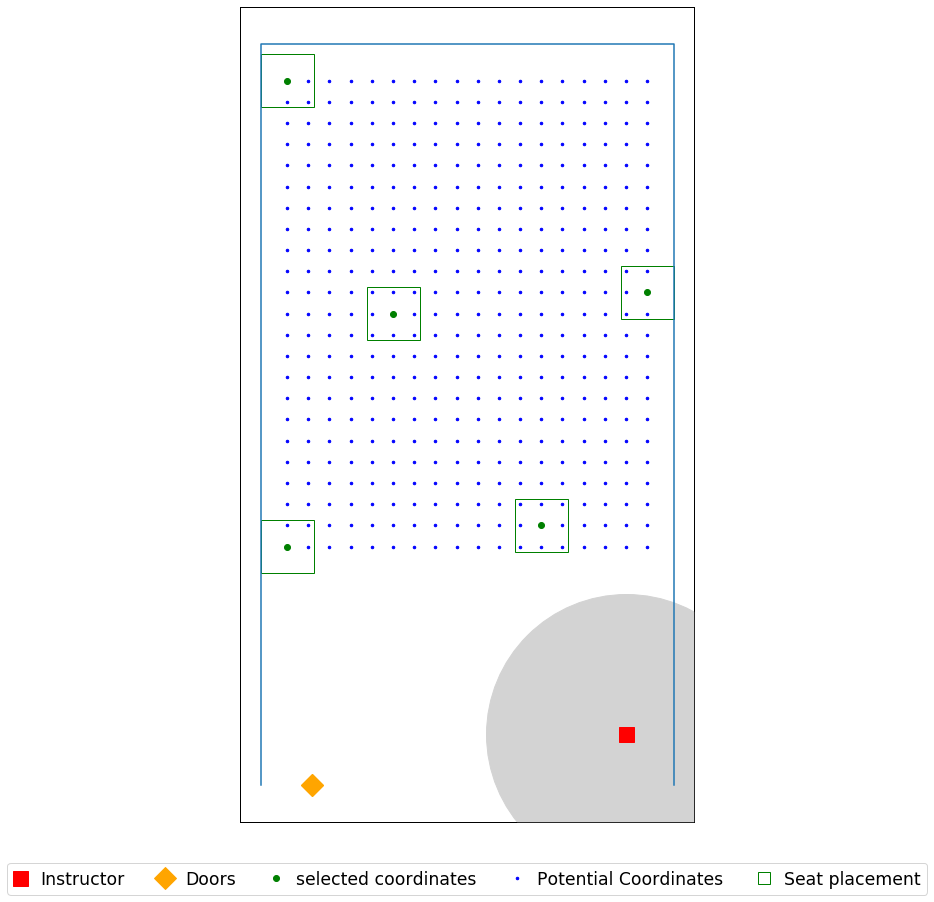

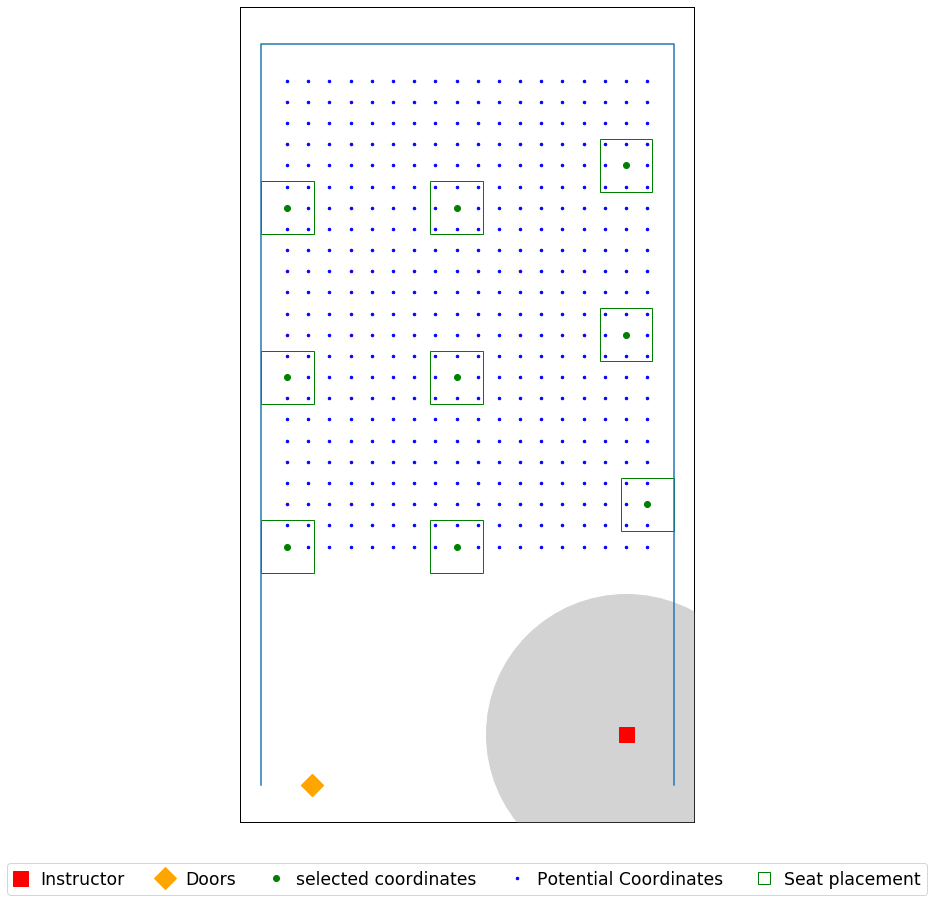

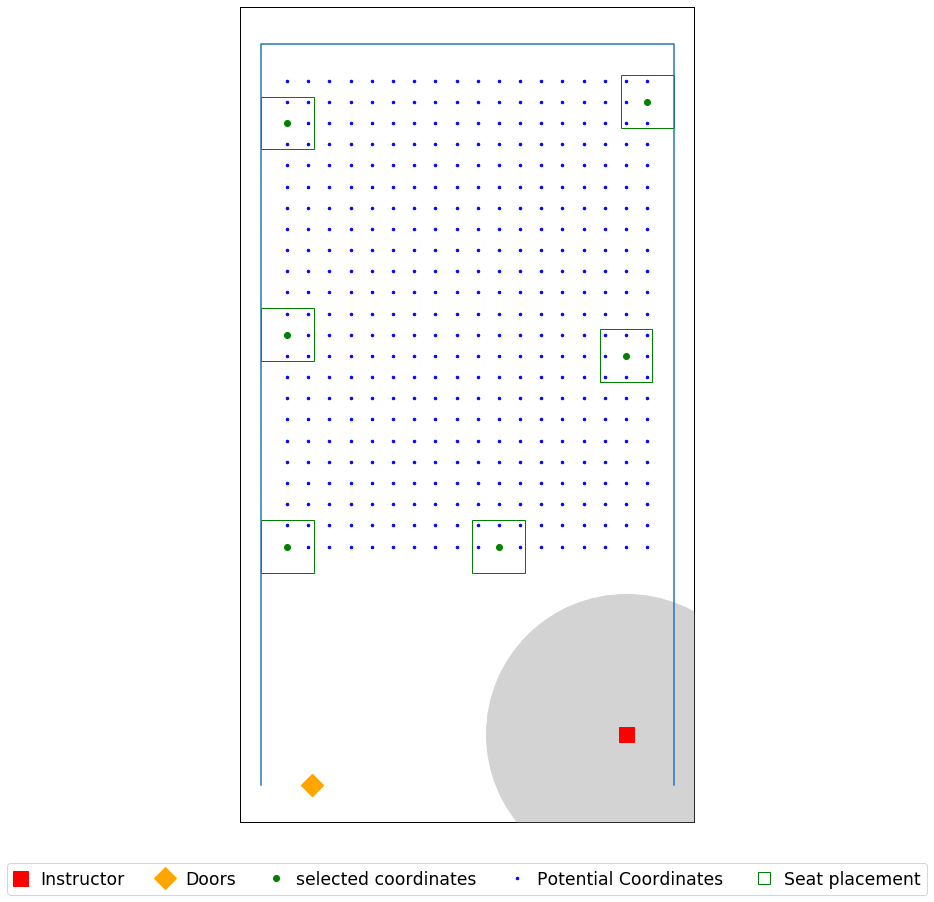

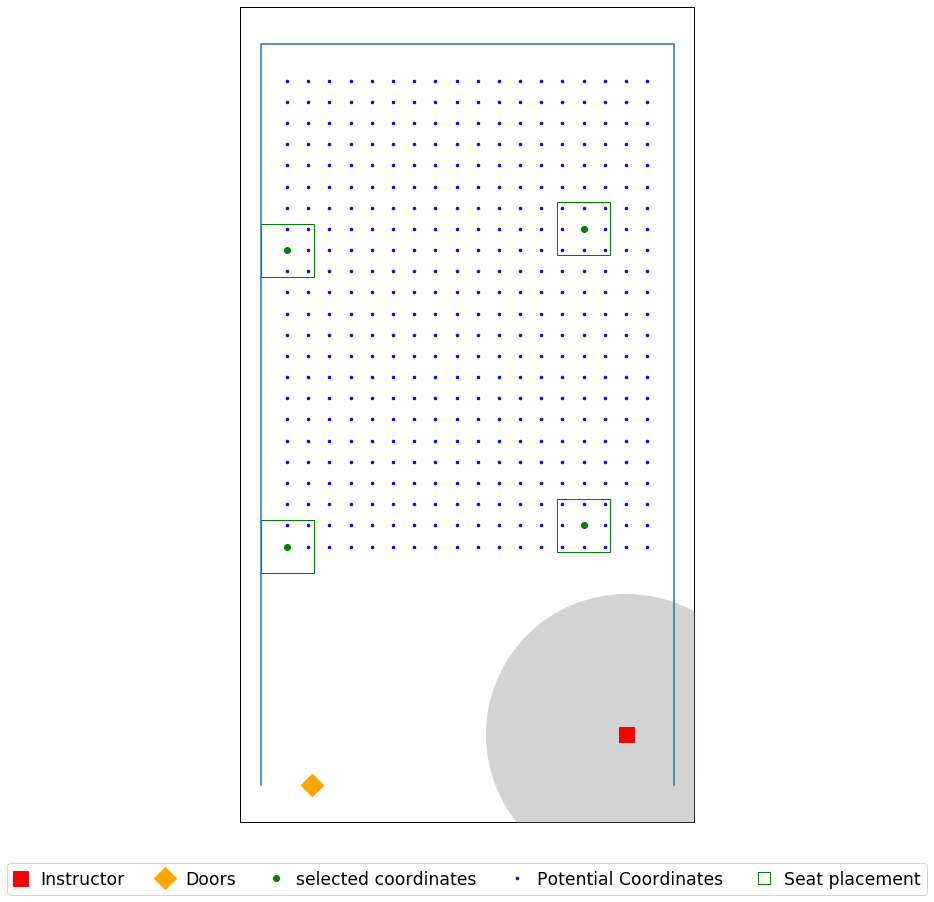

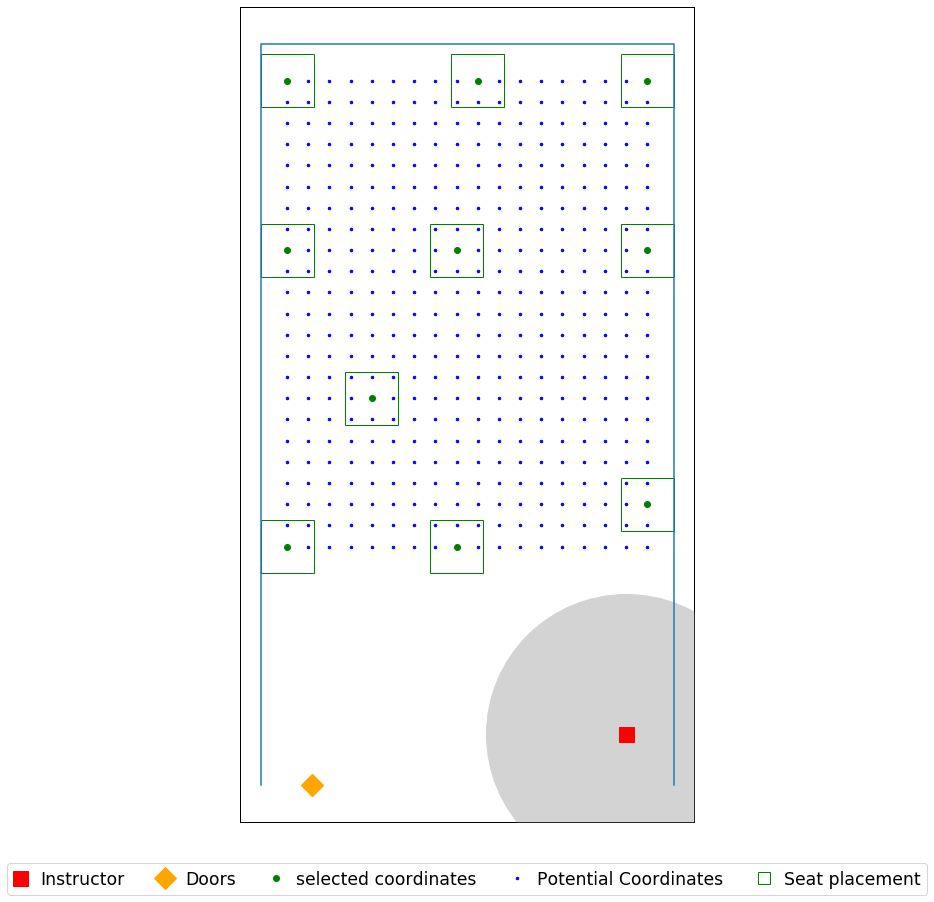

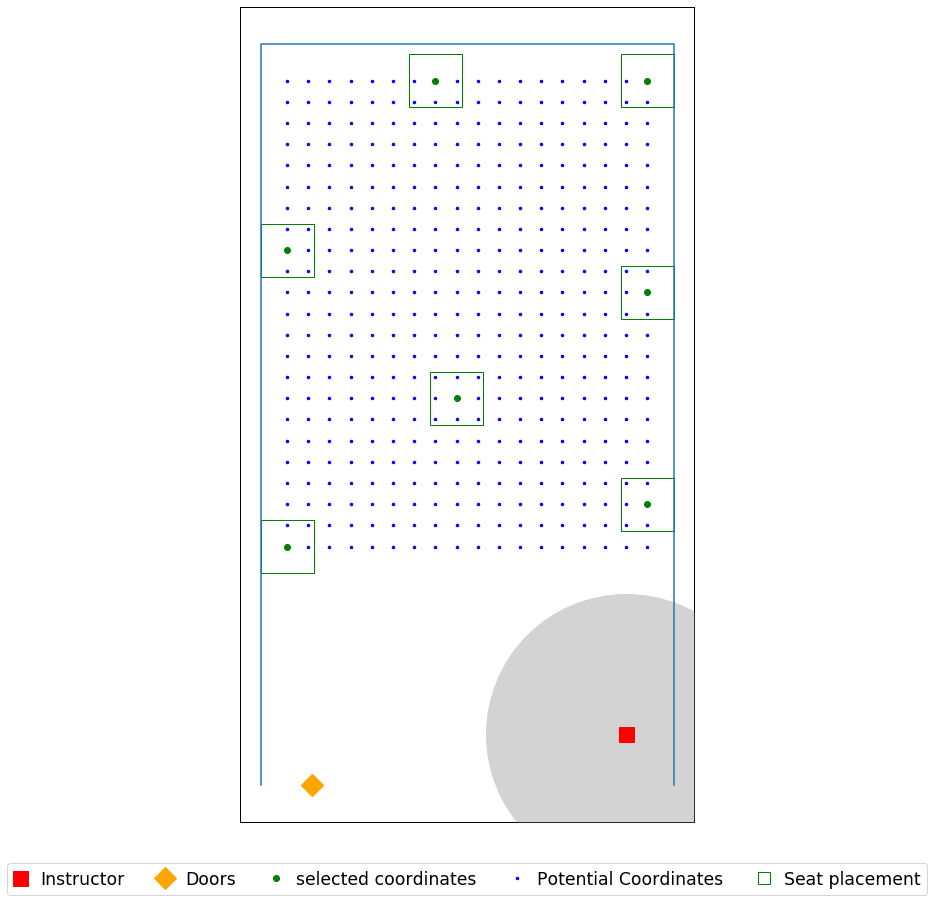

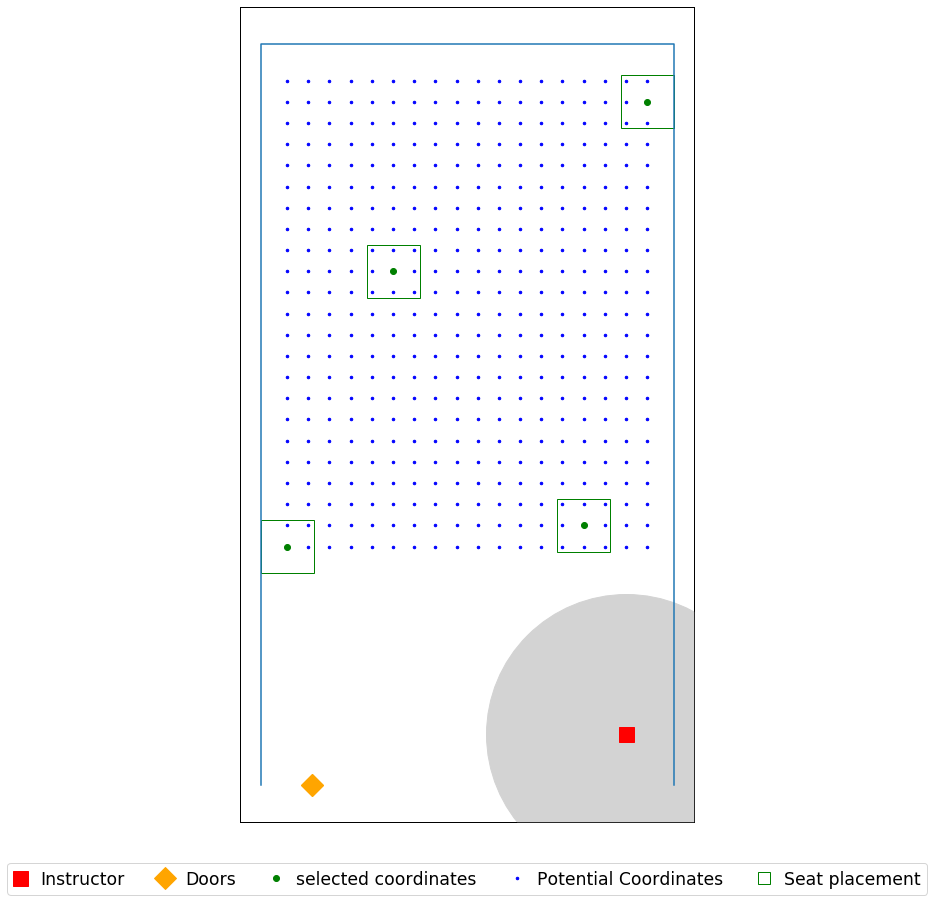

In [125]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 368

In [128]:
data_file = r'C:\Users\yoges\Desktop\Input\07.30\Skiles_368.xlsx'

Name = 'Skiles_368'

room dimension (W x H) are [[20.83333333 40.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[16.75        3.91666667]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 40.083333333333336), (0, 40.083333333333336)]
Total number of seats  is 532


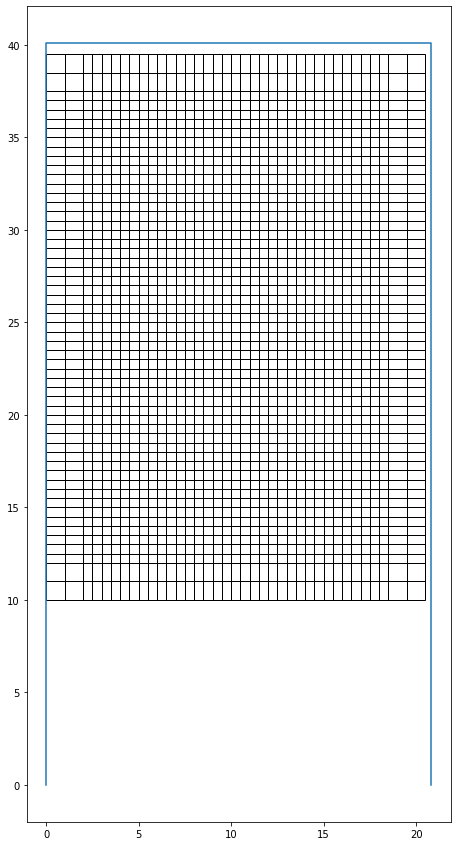

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
6
69
75
114
120
183
189
228
234
297
303
342
348
411
417
456
462
525
531
room dimension (W x H) are [[20.83333333 40.08333333]]
seat dimension (W x H) are [[2.5 2.5]]


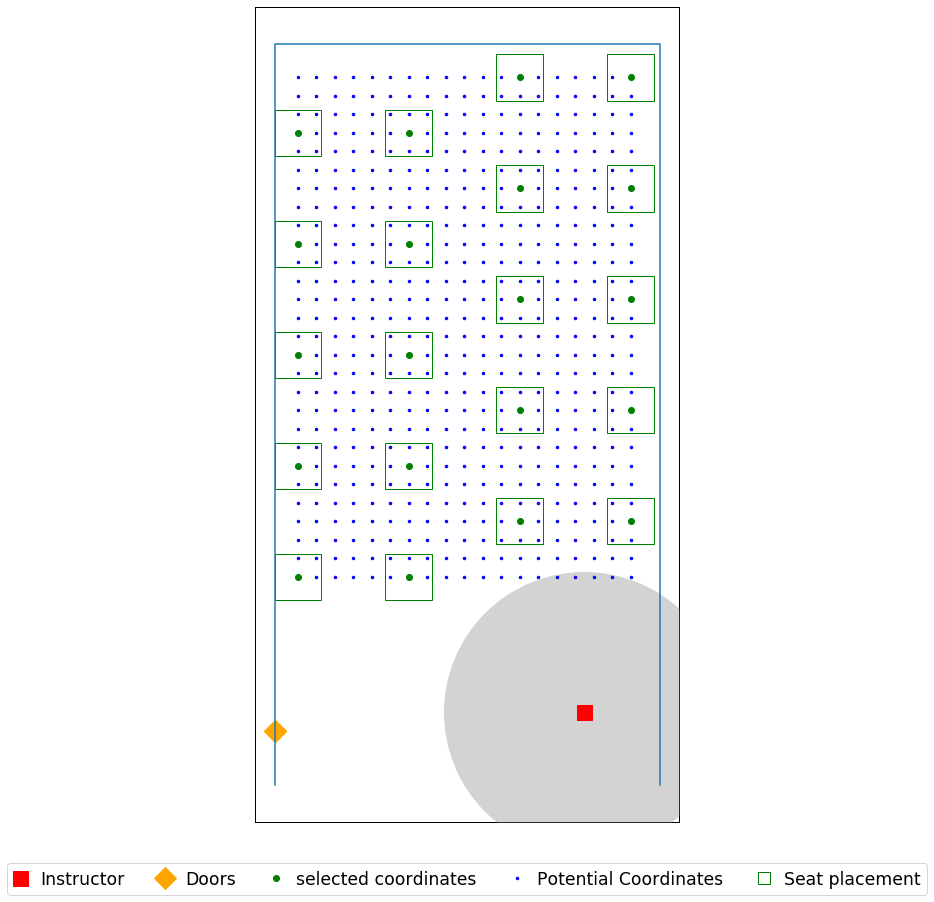

In [129]:
seat_loc = seat_coordinates(data_file, 1)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

room dimension (W x H) are [[20.83333333 40.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
[[16.75        3.91666667]]
[(0, 10), (20.833333333333332, 10), (20.833333333333332, 40.083333333333336), (0, 40.083333333333336)]
Total number of seats  is 532


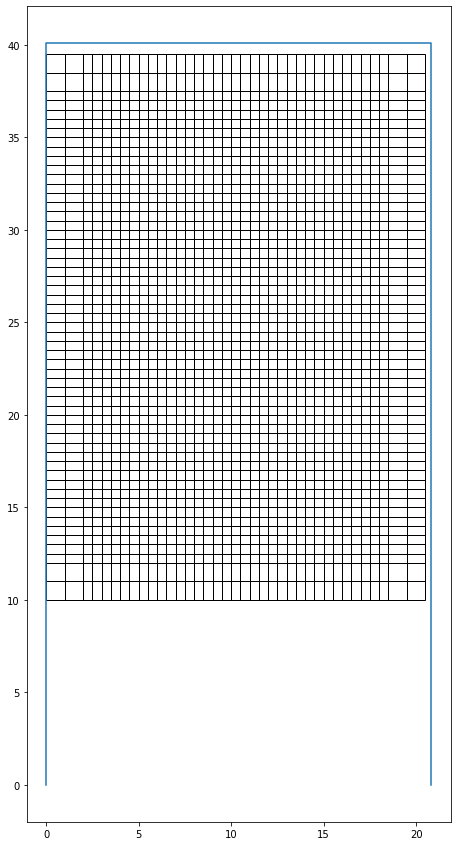

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 20.0
Optimal selection of seats (index):
0
6
69
75
114
120
183
189
228
234
297
303
342
348
411
417
456
462
525
531
room dimension (W x H) are [[20.83333333 40.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (index):
7
75
76
144
213
227
296
342
379
425
494
508
room dimension (W x H) are [[20.83333333 40.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
69
228
283
425
531
room dimension (W x H) are [[20.83333333 40.08333333]]
seat dimension (W x H) are [[2.5 2.5]]
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 12.0
Optimal selection of seats (ind

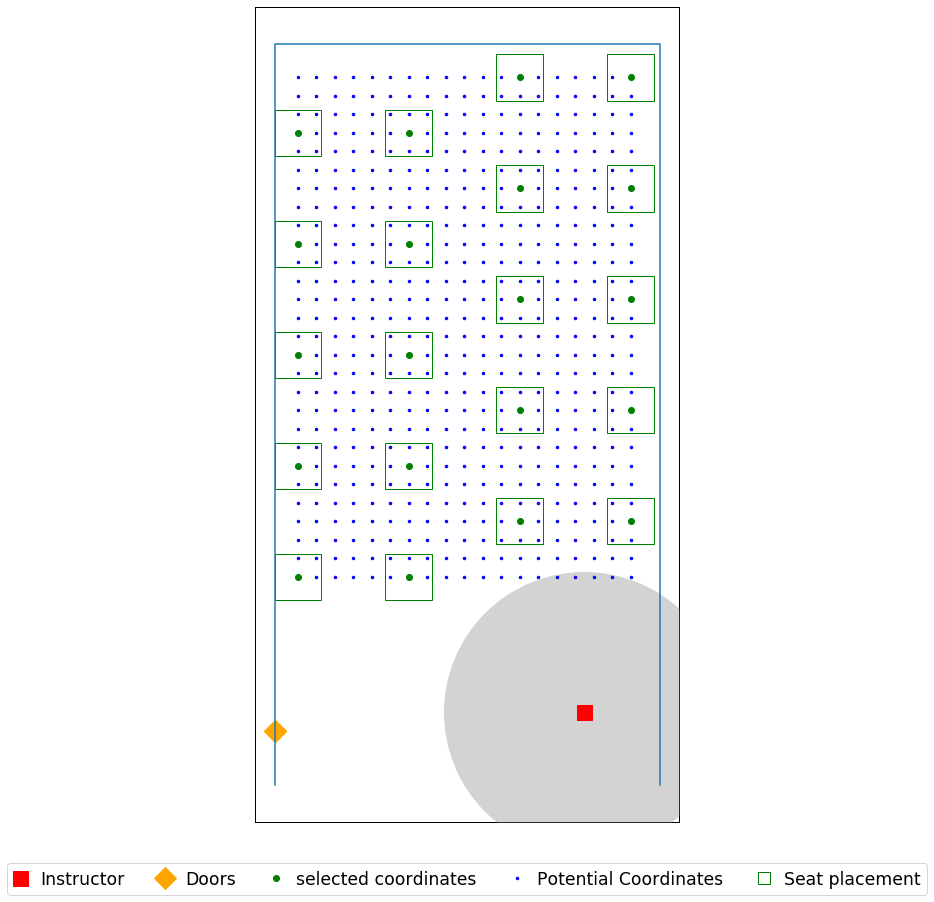

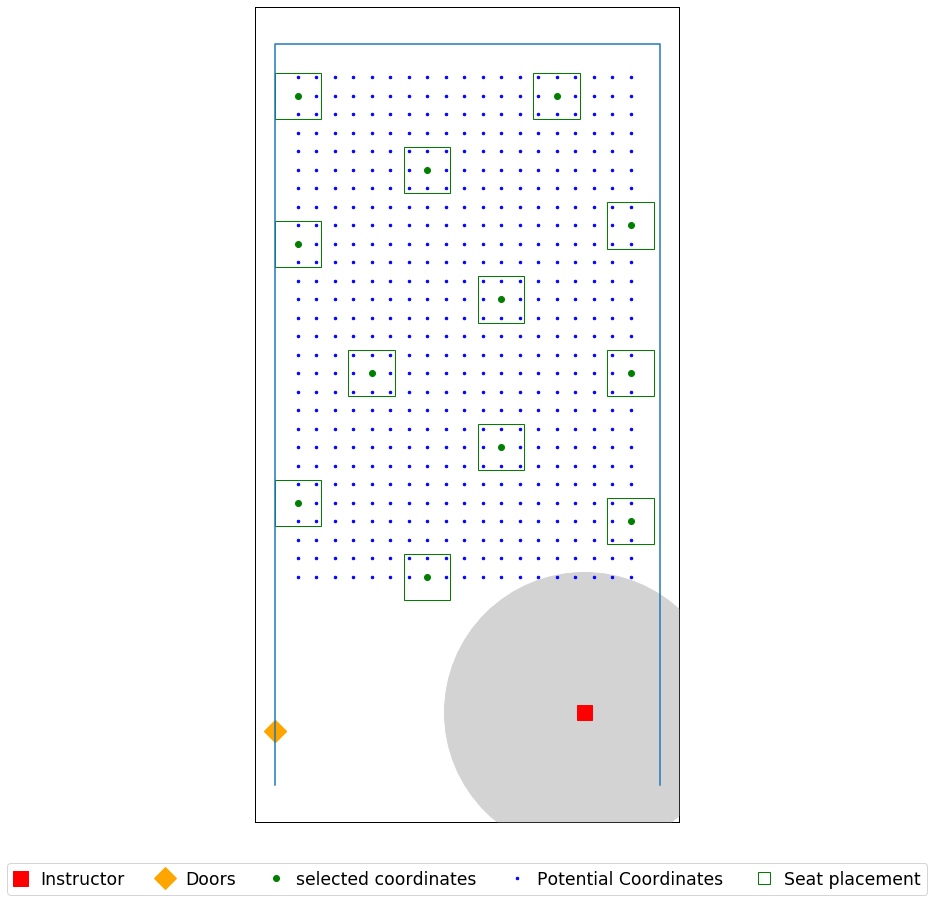

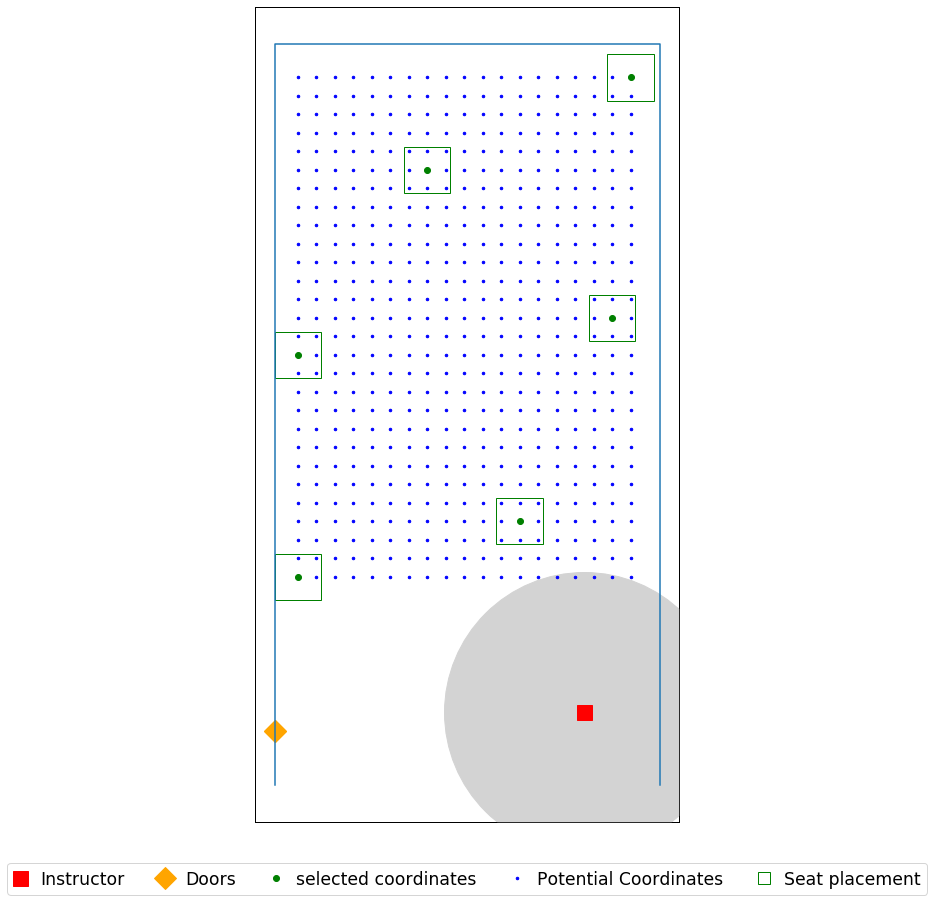

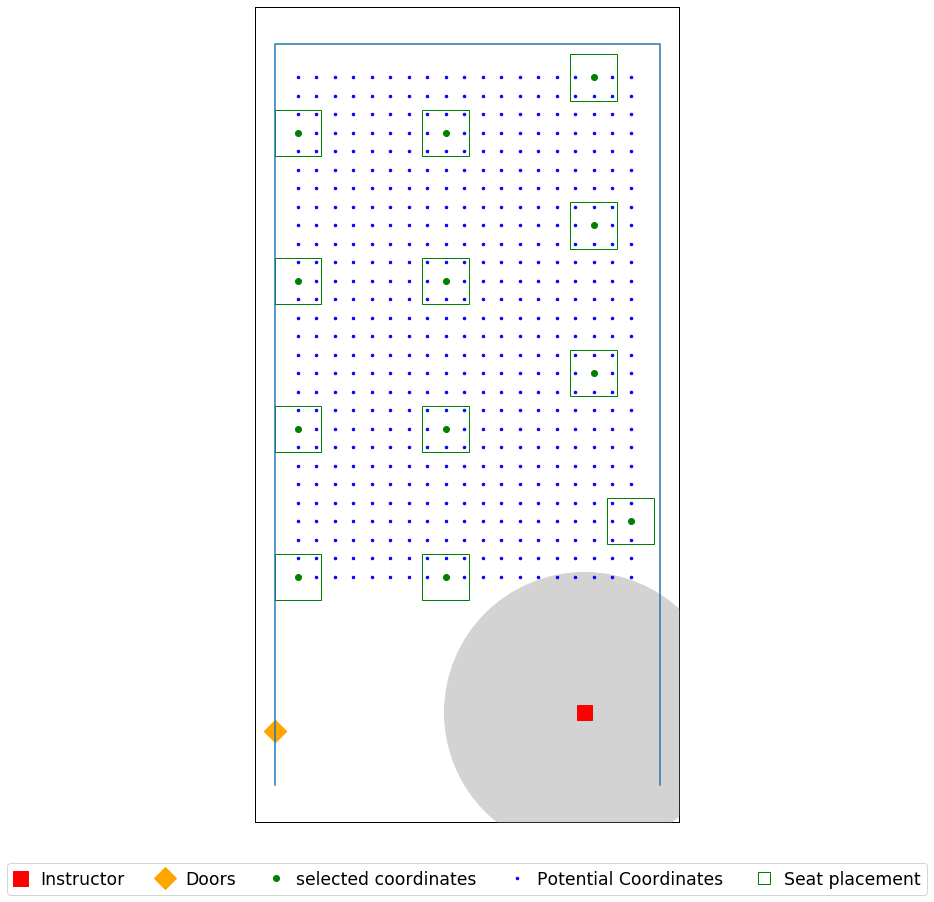

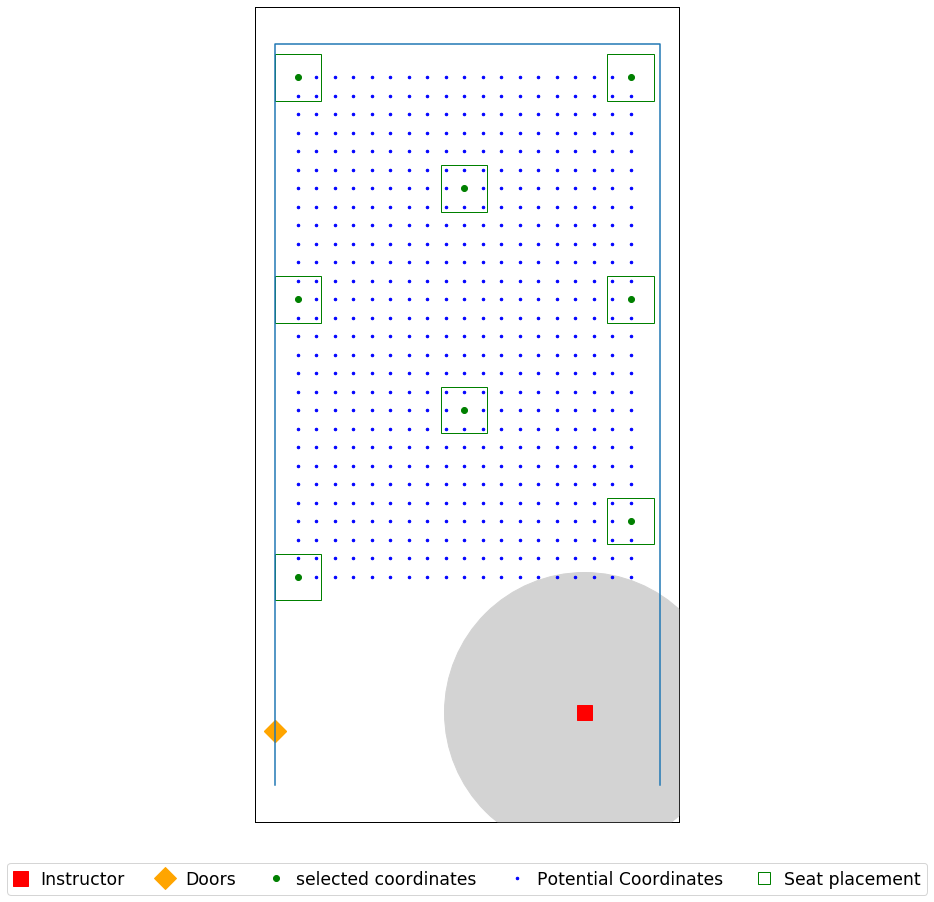

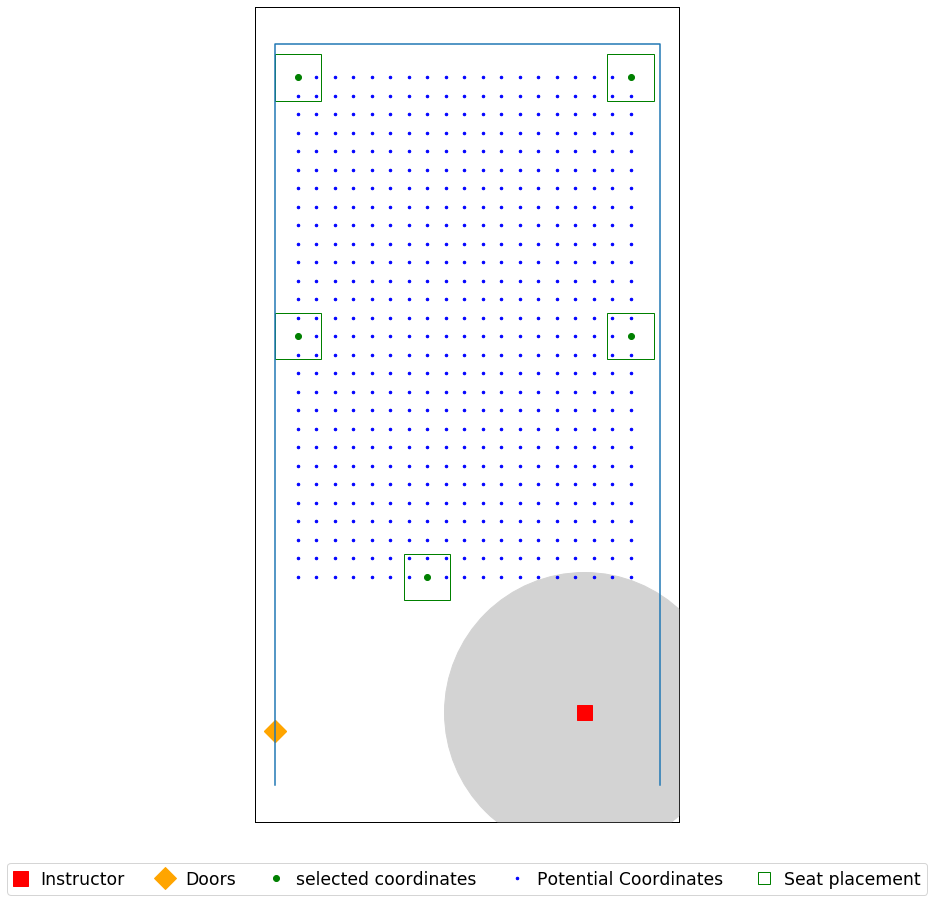

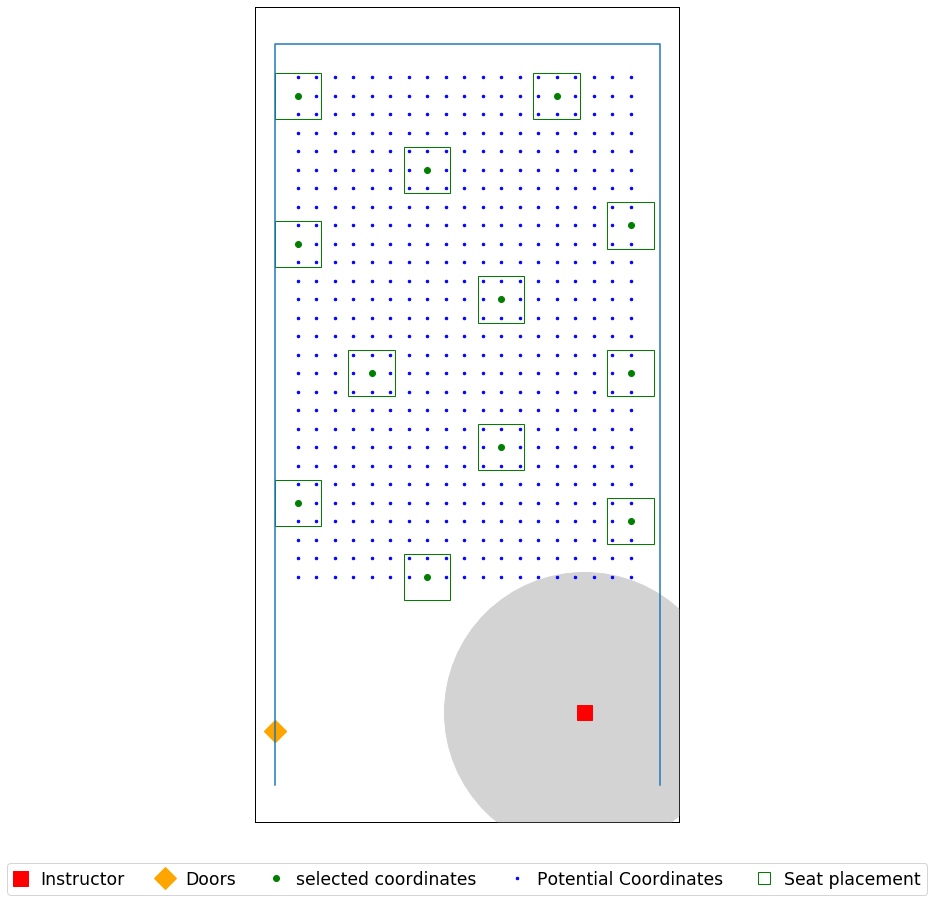

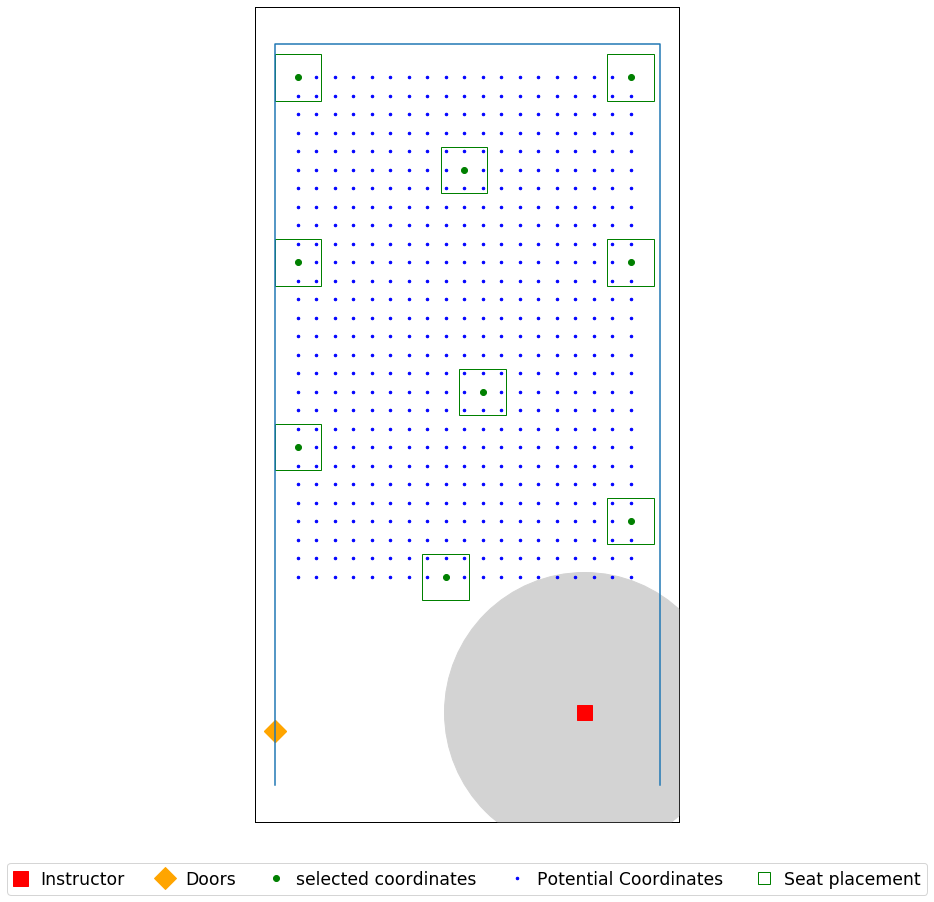

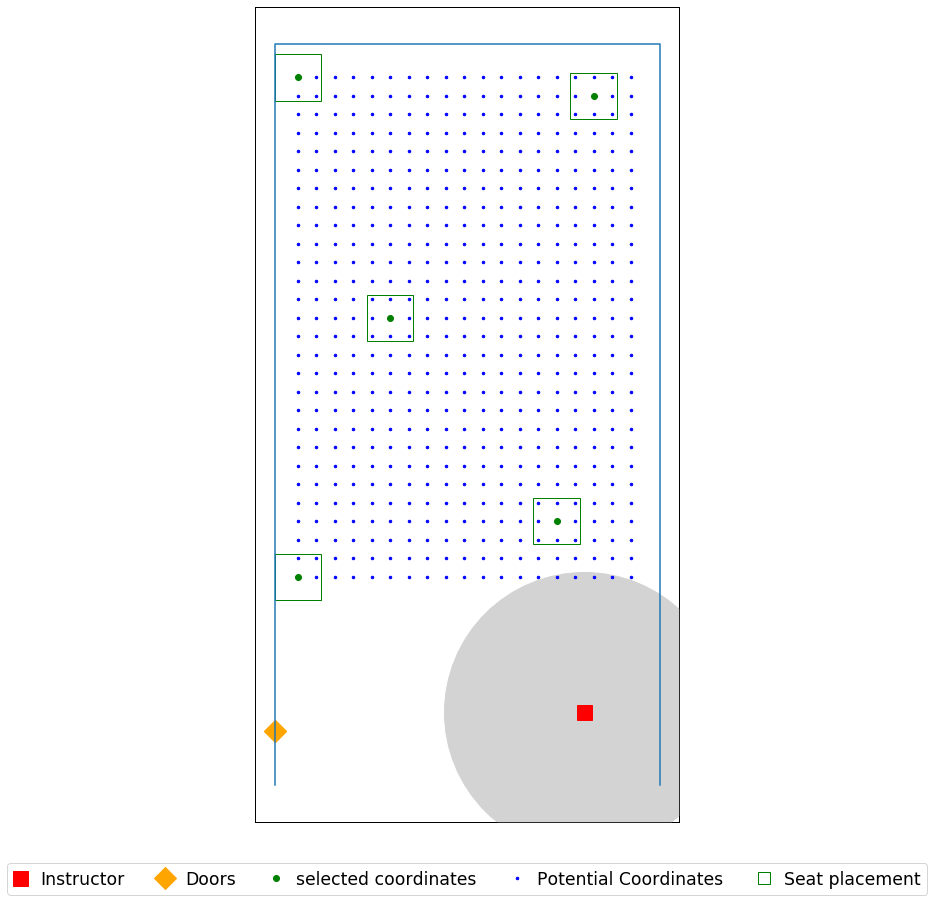

In [130]:
seat_loc = seat_coordinates(data_file, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity(data_file, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)


## Skiles 371 : 4+ coordinates code : coodinates same as Skiles 171

## Skiles 171 : 4+ coordinates code

In [83]:
# data_file = r'C:\Users\yoges\Desktop\Input\07.26\Skiles 171.xlsx'

Name = 'Skiles_171'

[(0, 10), (0, 31), (2.17, 31), (2.17, 35), (19.91, 35), (19.91, 10)]


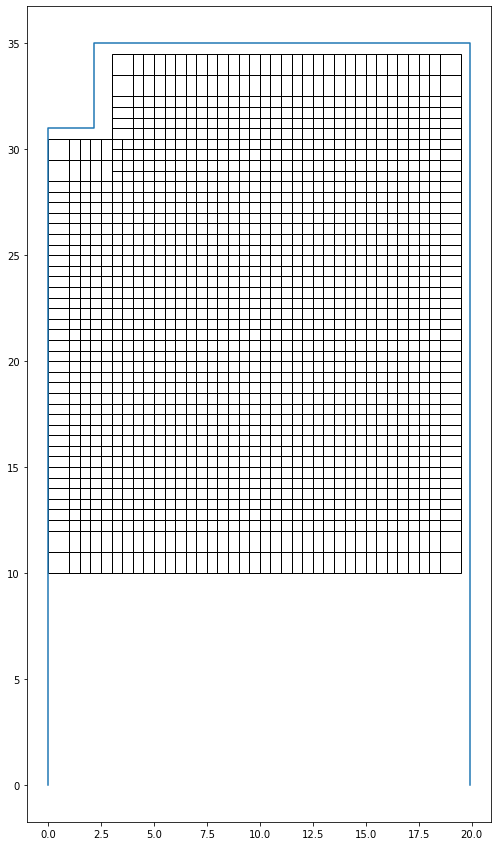

In [81]:
room_d = [(0,0), (0,31), (2.17,31), (2.17,35),(19.91,35),(19.91,0)]
room_points = [(0,10), (0,31), (2.17,31), (2.17,35),(19.91,35), (19.91,10)]
seat_xside = 1.5
seat_yside = 2.5
print(room_points)

seat_loc = moveable_area_seats(room_points, seat_xside, seat_yside, 1)


room_points.append(room_points[0])
plot_corner_points = np.array(room_d)
fig, axs = plt.subplots()
fig.set_figheight(15)
fig.set_figwidth(15)
axs.set_aspect('equal')
axs.plot(plot_corner_points[:,0], plot_corner_points[:,1])
for s in seat_loc:
    rectangle = plt.Rectangle((s[0] - seat_xside/2, s[1] - seat_yside/2), seat_xside, seat_yside, fc='none',ec='black')
    axs.add_patch(rectangle)
plt.show()


results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
6
12
75
114
120
126
189
228
234
240
303
342
348
354
408


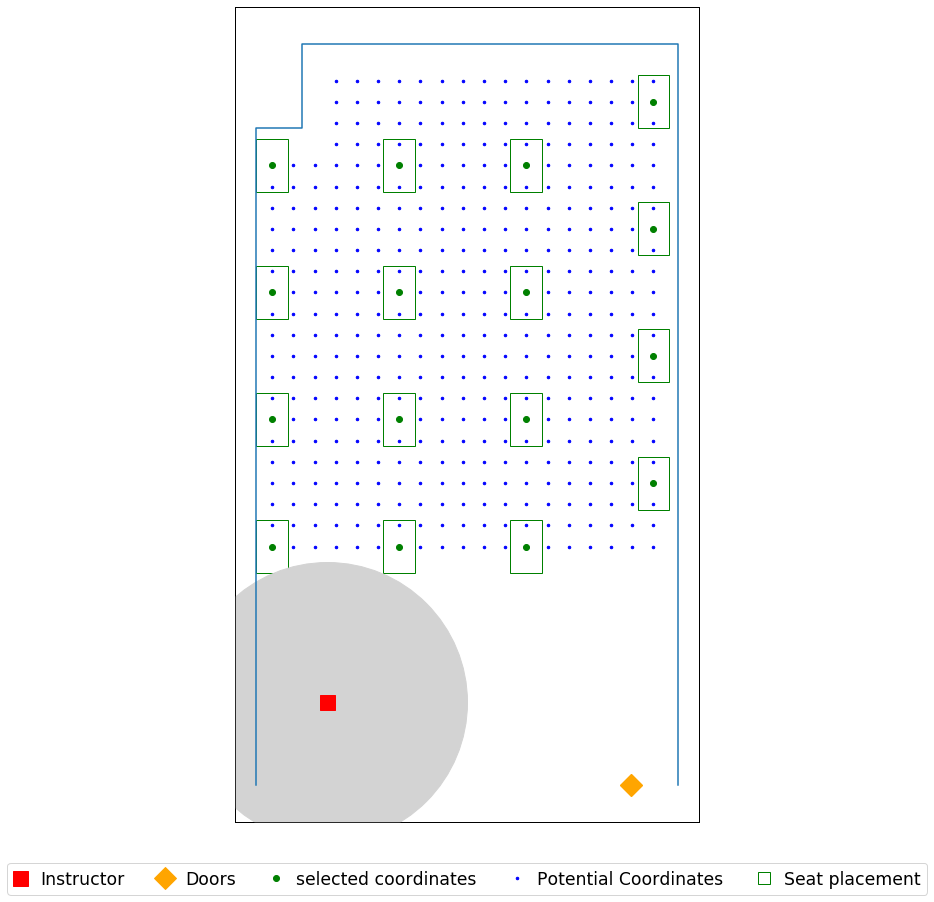

In [109]:
seat_loc = moveable_area_seats(room_points, seat_xside, seat_yside, 1)

instructor_loc = (3.33,3.91)
doors_loc = (17.67,0)

j = 0
i = 6 

print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.csv'.format(Name, Name, i), header = ('x','y'))
plot_layout_result_granularity_coordinates(data_file, room_d, room_points, seat_radius=1, seat_circle_radius=1)
plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_0ft\{}\{}_{}ft_SeatR=0ft.jpg'.format(Name, Name, i), dpi=500)
    

results_for_SD=6_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 16.0
Optimal selection of seats (index):
0
6
12
75
114
120
126
189
228
234
240
303
342
348
354
408
results_for_SD=8_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 10.0
Optimal selection of seats (index):
4
12
132
133
141
285
293
303
410
420
results_for_SD=12_ft_seatR0
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 5.0
Optimal selection of seats (index):
0
12
214
226
416
results_for_SD=6_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 9.0
Optimal selection of seats (index):
0
8
54
152
160
206
304
312
358
results_for_SD=8_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 6.0
Optimal selection of seats (index):
0
10
170
190
313
424
results_for_SD=12_ft_seatR1
The optimization status is OPTIMAL
Optimal solution:
Optimal objective value: 4.

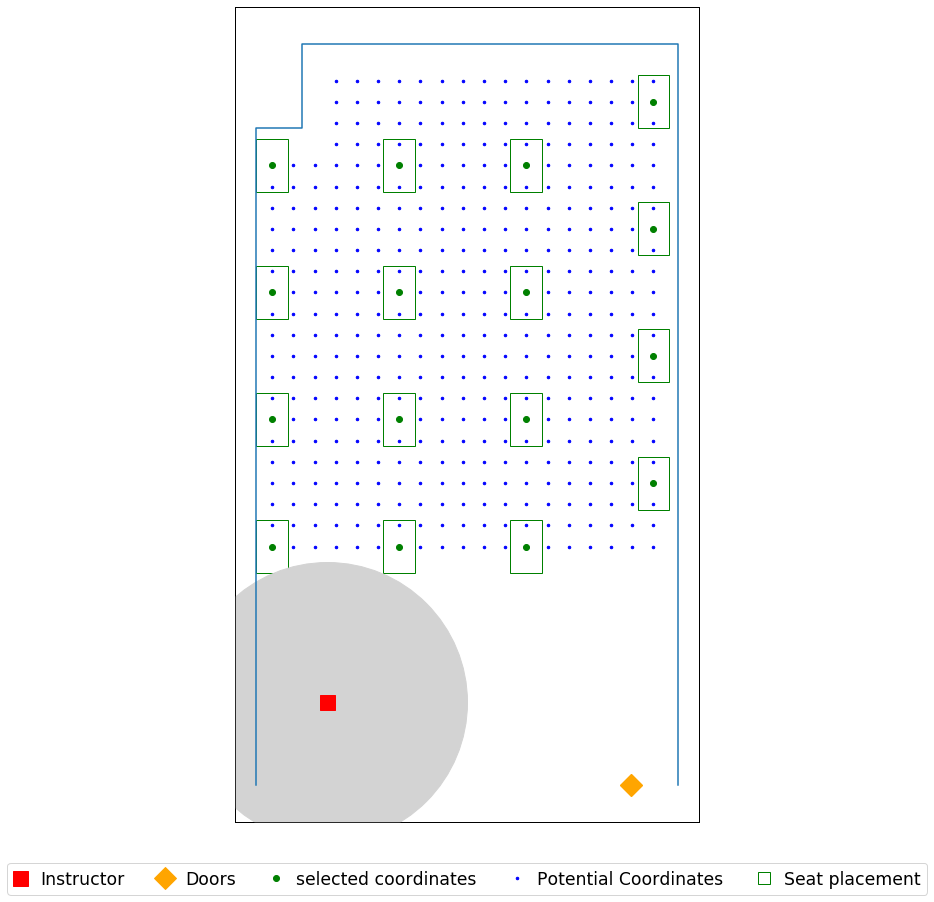

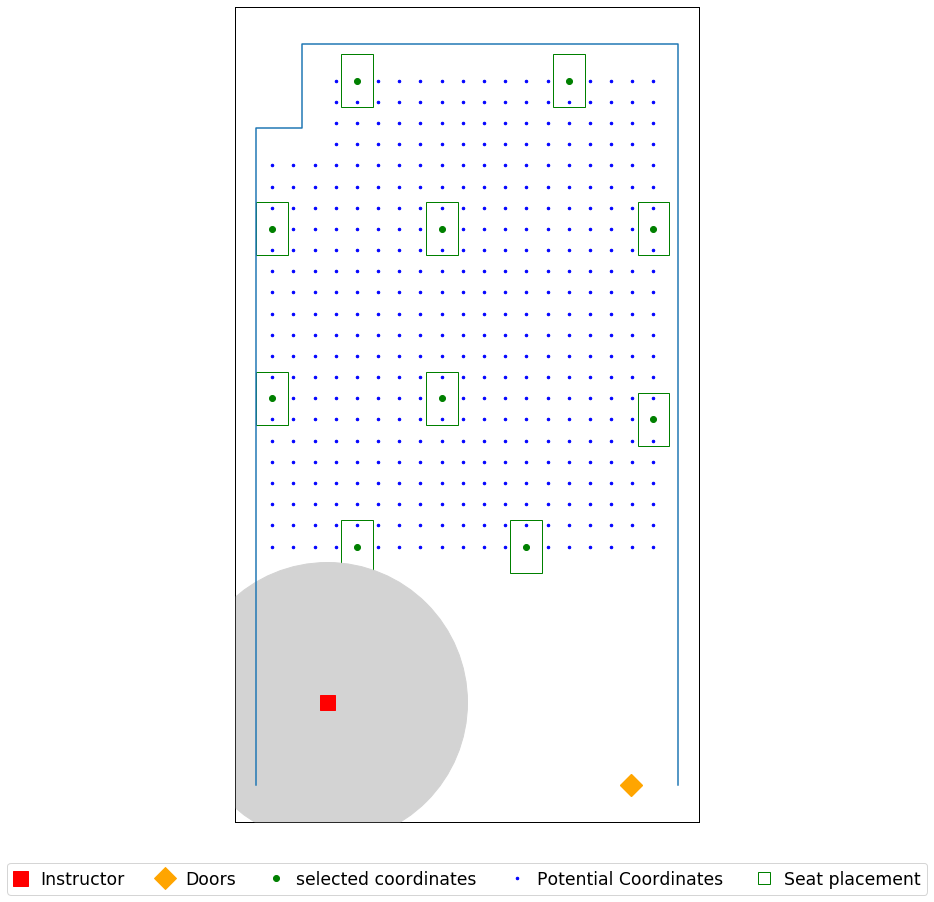

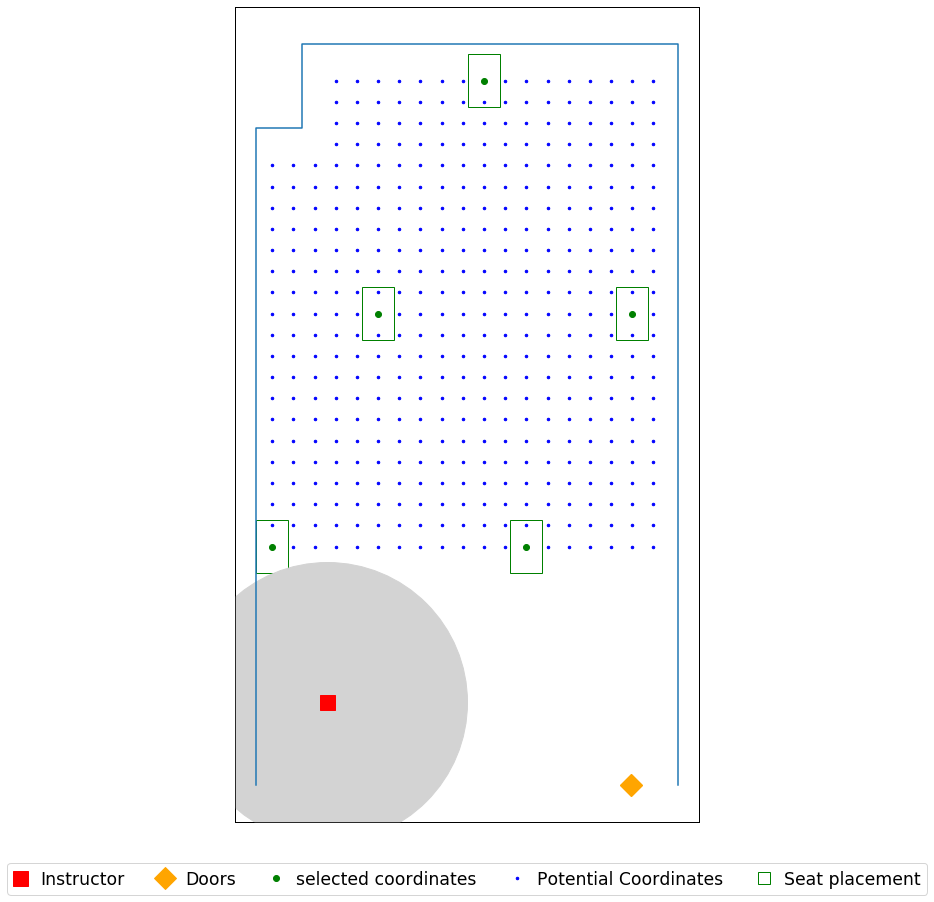

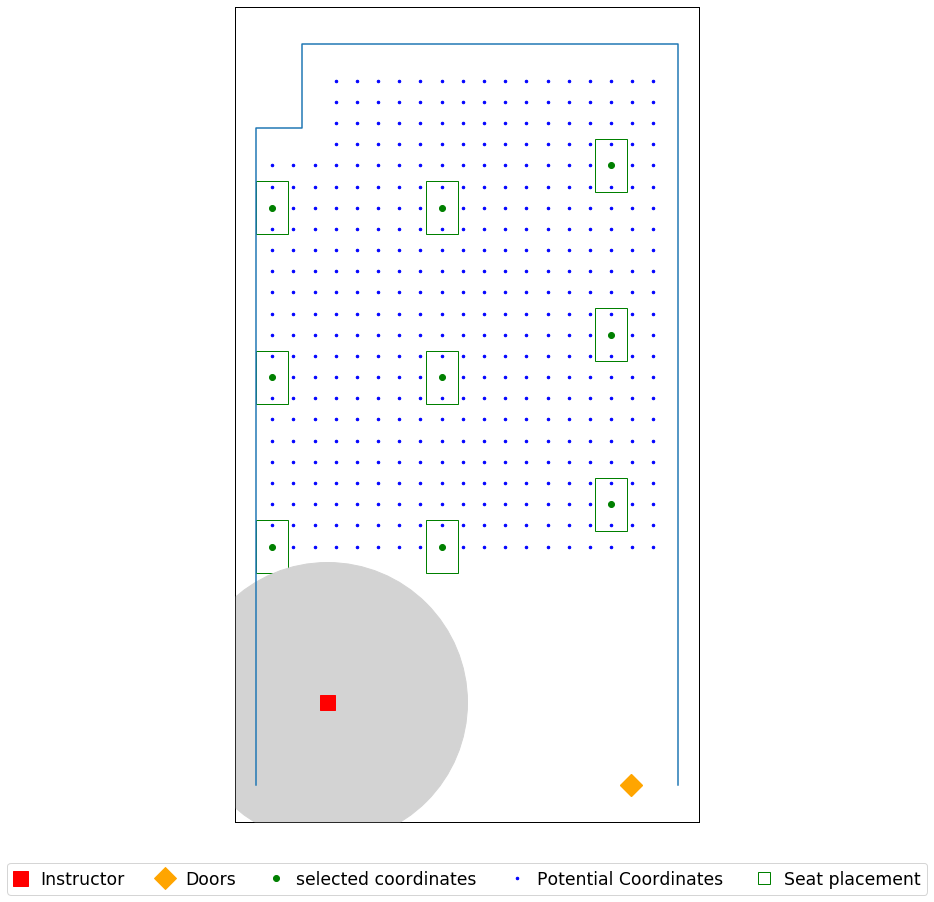

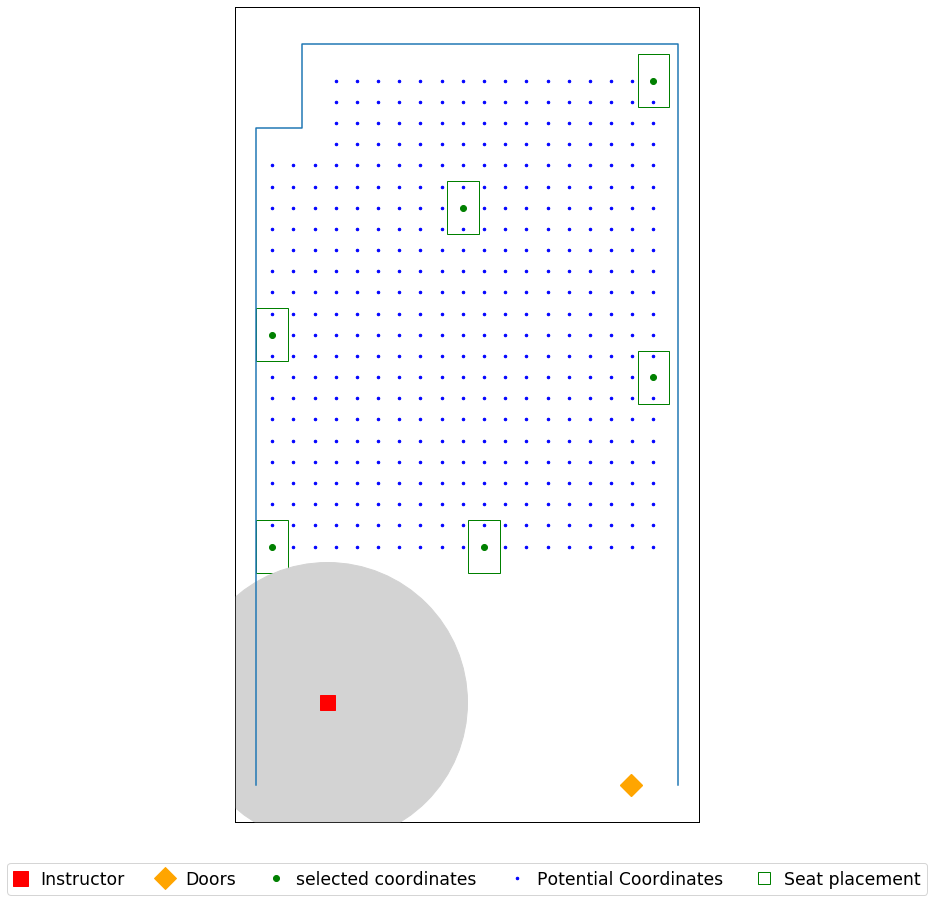

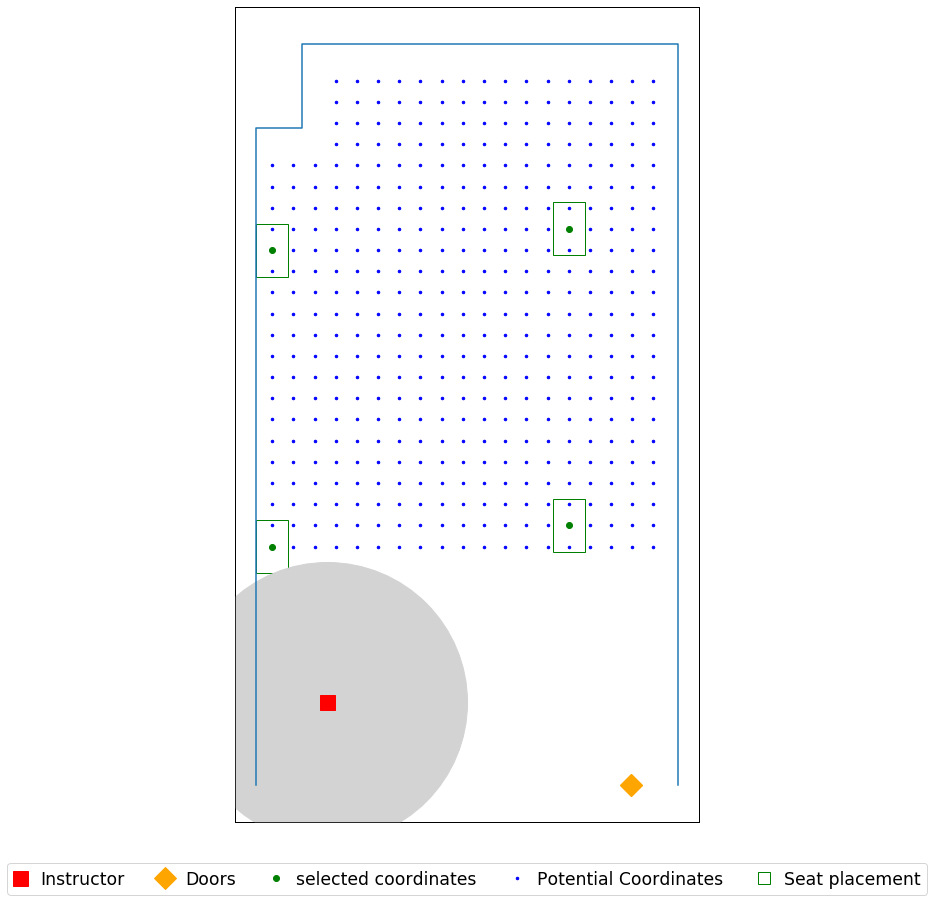

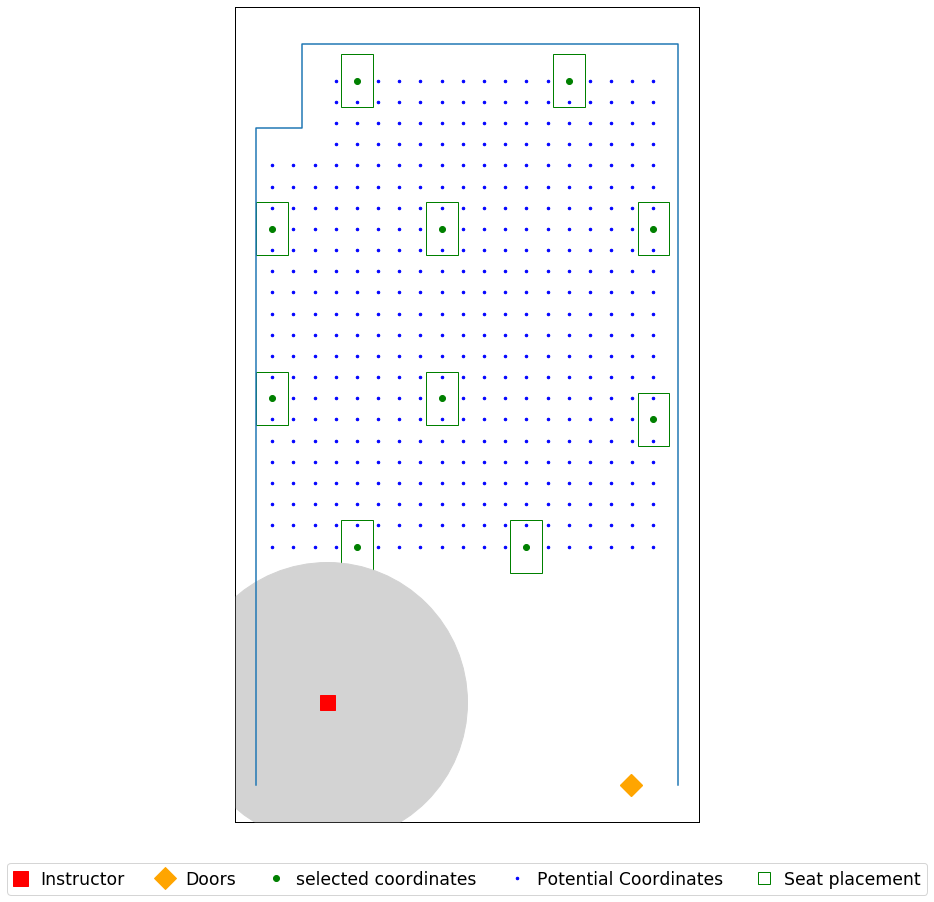

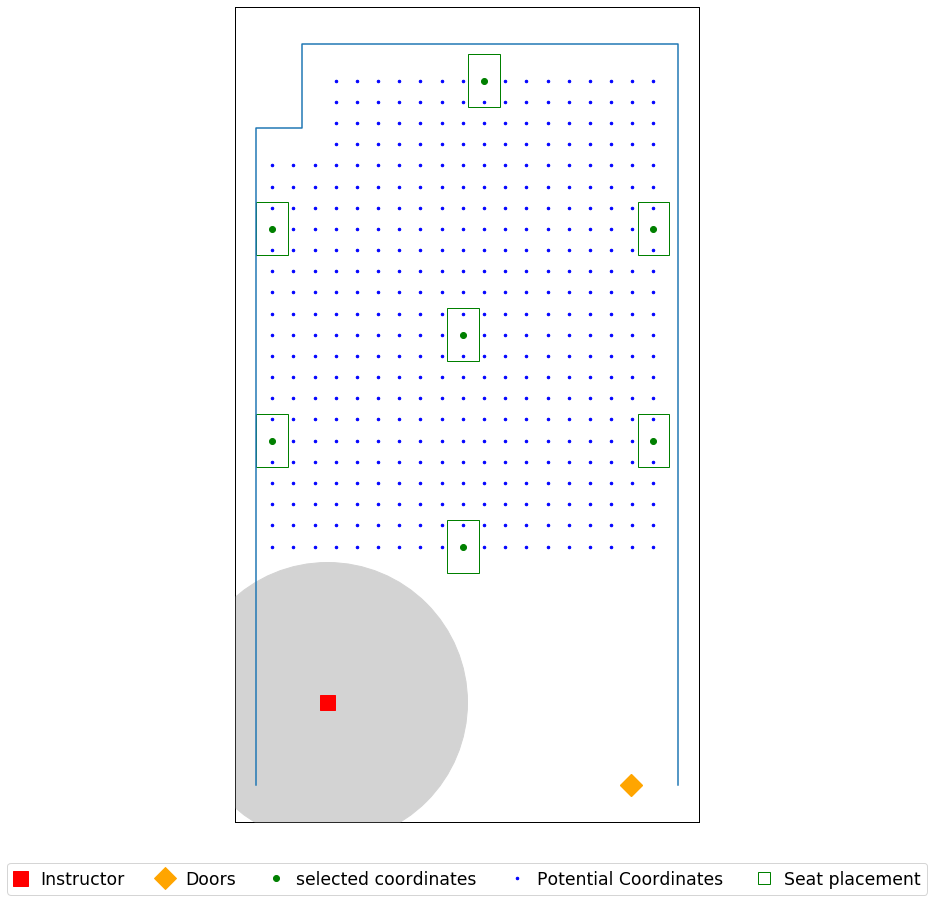

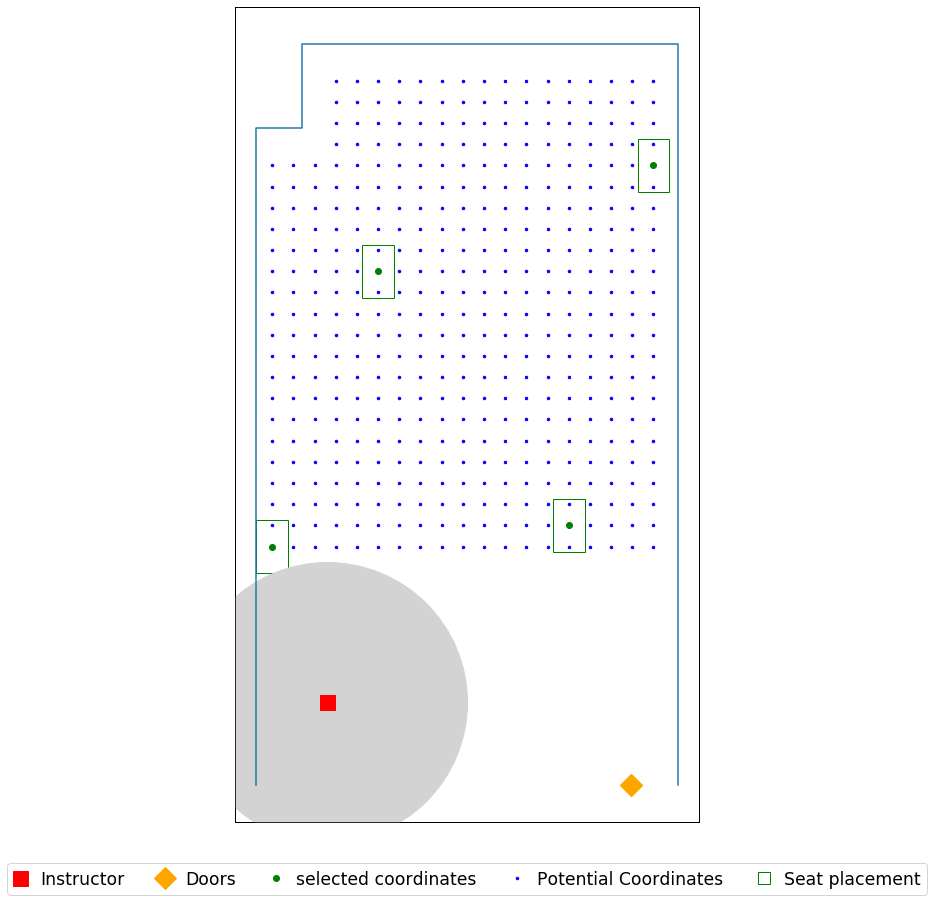

In [110]:
seat_loc = moveable_area_seats(room_points, seat_xside, seat_yside, 1)


for j in (0,1,0.75):
    for i in (6,8,12):
        print('results_for_SD='+str(i)+'_ft_seatR'+str(j))
        obj, selected = fixed_seats_model_ins(data_file,seat_radius=j, d0=i, d1 = 10)
        pd.DataFrame(selected).to_csv(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.csv'.format(j, Name, Name, i, j), header = ('x','y'))
        plot_layout_result_granularity_coordinates(data_file, room_d, room_points, seat_radius=1, seat_circle_radius=1)
        plt.savefig(r'C:\Users\yoges\OneDrive - Georgia Institute of Technology\Fall_Campus_reopening\V2_V6_Instructor\V2_V6_Seat_Radius_{}ft\{}\{}_{}ft_SeatR={}ft.jpg'.format(j, Name, Name, i, j), dpi=500)
